In [1]:
!nvidia-smi

zsh:1: command not found: nvidia-smi


# (1) Import necessary libraries

In [2]:
import tensorflow as tf
import numpy as np
import pandas as pd
import glob
import time
import os
import pickle
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

/Users/suhaanibatra/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:34: NotOpenSSLWarning: urllib3 v2.0 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


# (2) Download the datasets

### Data Source - University of Illinois Flickr30k

In [4]:
!ls data

Images            model_checkpoints textFiles
captions.txt      results.csv


# (3) Prepare the datasets

The `results.csv` file contains image name and corresponding captions. The flickr30k dataset has 5 captions for each image. 

In [5]:
captioning_ds = pd.read_csv("data/results.csv", delimiter="|")
captioning_ds.columns = ["image_name", "comment_number", "comment"]

In [6]:
captioning_ds.head()

,image_name,comment_number,comment
0,1000092795.jpg,0,Two young guys with shaggy hair look at their...
1,1000092795.jpg,1,"Two young , White males are outside near many..."
2,1000092795.jpg,2,Two men in green shirts are standing in a yard .
3,1000092795.jpg,3,A man in a blue shirt standing in a garden .
4,1000092795.jpg,4,Two friends enjoy time spent together .


All images have an equal number of captions, which is five (balanced).

In [7]:
image_name_value_count = captioning_ds.image_name.value_counts()
print("max:", max(image_name_value_count))
print("min:", min(image_name_value_count))

max: 5
min: 5


In [8]:
image_name_value_count

image_name
1000092795.jpg    5
459538095.jpg     5
459804826.jpg     5
459778335.jpg     5
4597303045.jpg    5
                 ..
3029715635.jpg    5
3029472296.jpg    5
3029463004.jpg    5
3029411230.jpg    5
998845445.jpg     5
Name: count, Length: 31783, dtype: int64

# (4) Multiple descriptions of an image will be combined into a single data point

Retrieving all unique image names from the dataset (results.csv). Then creating a dictionary datasets_dict that would have imagenames as keys and values will be the captions beginning with [CLS] token and ending with [SEP] token

In [9]:
# retrieve all distinct image names.
image_names = pd.unique(captioning_ds.image_name)

In [10]:
datasets_dict = {}

In [11]:
def _func(image_name):
    captions = ["[CLS] " + str(x) + " [SEP]" for x in captioning_ds[captioning_ds["image_name"] == image_name].comment.values]
    new_dict = {
        os.path.join("data/Images/", image_name): captions
    }
    datasets_dict.update(new_dict) 
    return ' ' . join(captions)

In [12]:
start_time = time.perf_counter()
print("Start processing ...")

captions_data = captioning_ds.image_name.apply(_func)

end_time = time.perf_counter()
print(f"Processing time: {end_time - start_time} seconds") # 1270.540715 seconds

Start processing ...
Processing time: 1270.540715 seconds


Show an example of the data

In [13]:
datasets_dict

{'data/Images/1000092795.jpg': ['[CLS]  Two young guys with shaggy hair look at their hands while hanging out in the yard . [SEP]',
  '[CLS]  Two young , White males are outside near many bushes . [SEP]',
  '[CLS]  Two men in green shirts are standing in a yard . [SEP]',
  '[CLS]  A man in a blue shirt standing in a garden . [SEP]',
  '[CLS]  Two friends enjoy time spent together . [SEP]'],
 'data/Images/10002456.jpg': ['[CLS]  Several men in hard hats are operating a giant pulley system . [SEP]',
  '[CLS]  Workers look down from up above on a piece of equipment . [SEP]',
  '[CLS]  Two men working on a machine wearing hard hats . [SEP]',
  '[CLS]  Four men on top of a tall structure . [SEP]',
  '[CLS]  Three men on a large rig . [SEP]'],
 'data/Images/1000268201.jpg': ['[CLS]  A child in a pink dress is climbing up a set of stairs in an entry way . [SEP]',
  '[CLS]  A little girl in a pink dress going into a wooden cabin . [SEP]',
  '[CLS]  A little girl climbing the stairs to her play

For text vectorization (adapt)

In [14]:
captions_data

0         [CLS]  Two young guys with shaggy hair look at...
1         [CLS]  Two young guys with shaggy hair look at...
2         [CLS]  Two young guys with shaggy hair look at...
3         [CLS]  Two young guys with shaggy hair look at...
4         [CLS]  Two young guys with shaggy hair look at...
                                ...                        
158910    [CLS]  A man in shorts and a Hawaiian shirt le...
158911    [CLS]  A man in shorts and a Hawaiian shirt le...
158912    [CLS]  A man in shorts and a Hawaiian shirt le...
158913    [CLS]  A man in shorts and a Hawaiian shirt le...
158914    [CLS]  A man in shorts and a Hawaiian shirt le...
Name: image_name, Length: 158915, dtype: object

Store them for later use

In [15]:
class PickleDumpLoad(object): 
    def __init__(self):
        self.address = f'./'
        
    def save_config(self, obj, filename):  
        with open(os.path.join(self.address, filename), 'wb') as config_f:
            pickle.dump(obj, config_f, protocol=4) # PROTOCOL = 4 ALLOWING TO SAVE LARGE OBJECT   
         
    def load_config(self, filename):  
        with open(os.path.join(self.address, filename), 'rb') as f_in:
             obj = pickle.load(f_in)
        return obj  

In [16]:
PickleDumpLoad().save_config(datasets_dict, "datasets_dict.pickle")
PickleDumpLoad().save_config(captions_data, "captions_data.pickle")

Load the dataset dictionary from a file

In [17]:
datasets_dict = PickleDumpLoad().load_config("datasets_dict.pickle")
captions_data = PickleDumpLoad().load_config("captions_data.pickle")

Show some sample images

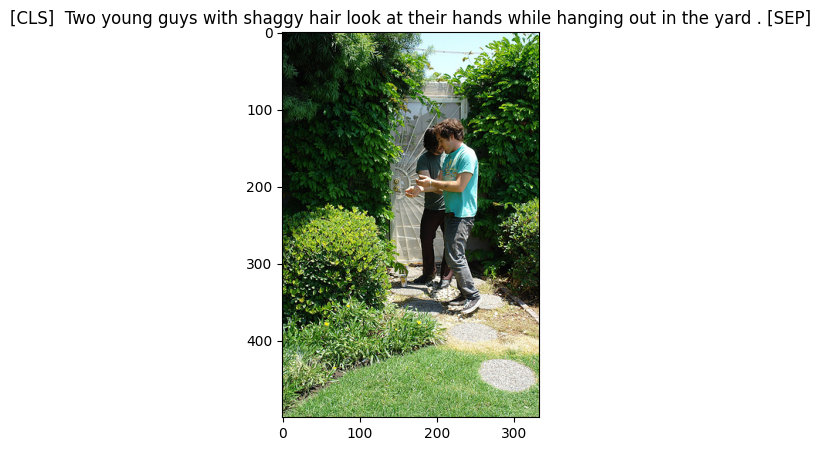

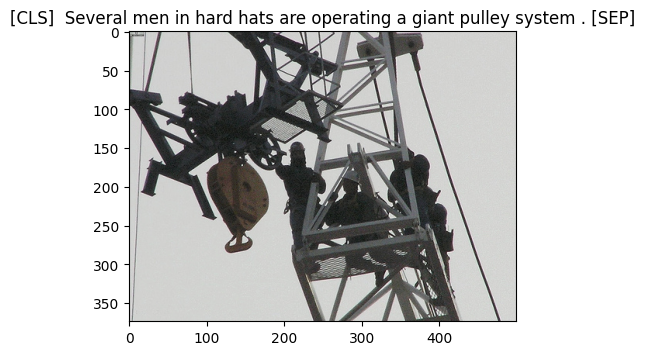

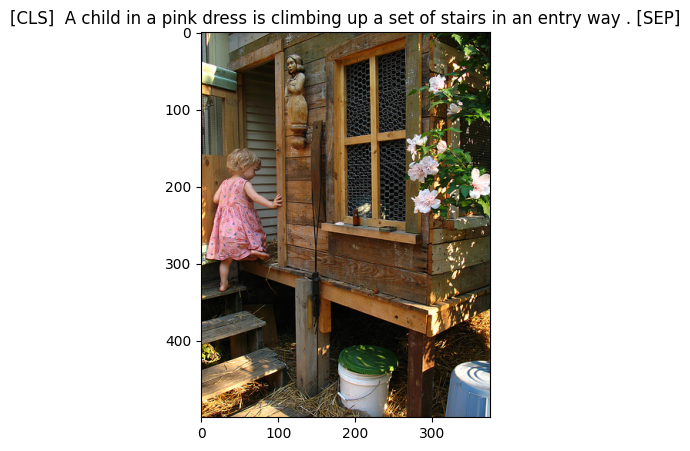

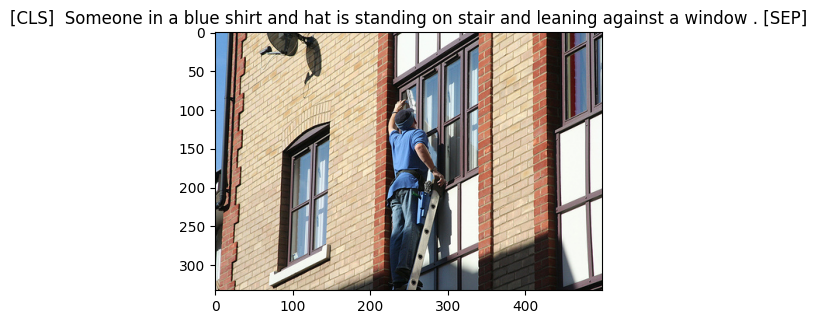

In [18]:
count = 0
for key, val in datasets_dict.items():
    
    img = mpimg.imread(key)
    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.title(val[0])
        
    if count == 3: 
        break
        
    count += 1

# (5) Create tokenizers

Word Embeddings are the texts converted into numbers and there may be different numerical representations of the same text.

### Tokenization
It is the process of dividing each sentence into words or smaller parts, which are known as tokens. After the completion of tokenization, we will extract all the unique words from the corpus. Here corpus represents the tokens we get from all the documents and used for the bag of words creation.

In [19]:
VOCAB_SIZE = 20000
SEQ_LENGTH = 25

In [20]:
vectorization = tf.keras.layers.TextVectorization(max_tokens=VOCAB_SIZE,
    output_mode="int",
    output_sequence_length=SEQ_LENGTH,
    standardize=lambda text: tf.strings.regex_replace(tf.strings.lower(text), "[^a-z]+", " "),
)

In [21]:
start_time = time.perf_counter()
print("Start processing ...")

vectorization.adapt(captions_data.values, batch_size=32)

end_time = time.perf_counter()
print(f"Processing time: {end_time - start_time} seconds") # 2.8806883329998527 seconds

Start processing ...
Processing time: 2.8806883329998527 seconds


Save the vocabularies

In [22]:
vocabularies = vectorization.get_vocabulary()

In [23]:
with open('vocabulary.txt', 'w') as f:
    for word in vocabularies:
        f.write(word + '\n')

Load the vocabularies

In [24]:
vocabularies = None
with open('vocabulary.txt', 'r') as f:
    vocabularies = [line.strip() for line in f.readlines()] 

Set the vocabularies

In [25]:
vectorization.set_vocabulary(vocabularies)

Test the vectorization

In [26]:
vectorization(["I love you"])

<tf.Tensor: shape=(1, 25), dtype=int64, numpy=
array([[1217, 2219, 1172,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0]])>

# (6) Create an image loader

Resizing and rescaling the images 

In [27]:
IMG_SIZE = (224, 224)

In [28]:
def image_loader(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, IMG_SIZE)
    img = tf.image.convert_image_dtype(img, tf.float32)
    return img

# (7) Create the datasets

In [29]:
PERCENTAGE = .8
TOTAL_SAMPLES = len(list(datasets_dict.keys())) 
TRAIN = int(TOTAL_SAMPLES * PERCENTAGE)
TEST = TOTAL_SAMPLES - TRAIN
TRAIN, TEST

(25426, 6357)

In [30]:
train_tf = tf.data.Dataset.from_tensor_slices((list(datasets_dict.keys())[:TRAIN], list(datasets_dict.values())[:TRAIN]))
test_tf = tf.data.Dataset.from_tensor_slices((list(datasets_dict.keys())[-TEST:], list(datasets_dict.values())[-TEST:]))

In [391]:
test_images = list(datasets_dict.keys())[-TEST:]
test_images[:5]

['data/Images/4944548179.jpg',
 'data/Images/4944644486.jpg',
 'data/Images/4944653840.jpg',
 'data/Images/4944696052.jpg',
 'data/Images/4944749423.jpg']

array([[b'[CLS]  A person painting a mural on the side of a building while people are standing around watching . [SEP]',
        b'[CLS]  Pedestrians stop to watch a man create a mural on a wall at the side of a street . [SEP]',
        b'[CLS]  A painting of a man drinking from a bottle on the side of a building . [SEP]',
        b'[CLS]  An artist is painting a mural on the side of a building . [SEP]',
        b'[CLS]  A crowd gathers to watch the artist at work . [SEP]'],
       [b'[CLS]  A crowd of people looking towards a person in a gorilla costume inside a building . [SEP]',
        b'[CLS]  A group of people travel through a line along side a gorilla statue . [SEP]',
        b'[CLS]  A crowd waits to interact with some people in an indoor location . [SEP]',
        b'[CLS]  There is a group of people looking at a life sized gorilla . [SEP]',
        b'[CLS]  A group of people are lined up inside waiting . [SEP]'],
       [b'[CLS]  A poverty stricken housing area with a lady in 

In [31]:
def create_ds(img_path, captions):
    return image_loader(img_path), vectorization(captions)

In [32]:
BATCH_SIZE = 32

In [33]:
train = train_tf.map(create_ds, num_parallel_calls=tf.data.AUTOTUNE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE).cache()
test = test_tf.map(create_ds, num_parallel_calls=tf.data.AUTOTUNE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE).cache()

# (8) Build the model

Create an encoder with transormer

In [34]:
def get_cnn_model():
    base_model = tf.keras.applications.efficientnet.EfficientNetB0(
        input_shape=(*IMG_SIZE, 3), include_top=False, weights="imagenet",
    ) 
    base_model.trainable = False
    base_model_out = base_model.output
    base_model_out = tf.keras.layers.Reshape((-1, base_model_out.shape[-1]))(base_model_out)
    cnn_model = tf.keras.models.Model(base_model.input, base_model_out)
    return cnn_model

In [35]:
class TransformerEncoderBlock(tf.keras.layers.Layer):
    def __init__(self, embed_dim, dense_dim, num_heads, **kwargs):
        super().__init__(**kwargs)
        self.embed_dim = embed_dim
        self.dense_dim = dense_dim
        self.num_heads = num_heads
        self.attention_1 = tf.keras.layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim, dropout=0.0
        )
        self.layernorm_1 = tf.keras.layers.LayerNormalization()
        self.layernorm_2 = tf.keras.layers.LayerNormalization()
        self.dense_1 = tf.keras.layers.Dense(embed_dim, activation="relu")

    def call(self, inputs, training, mask=None):
        inputs = self.layernorm_1(inputs)
        inputs = self.dense_1(inputs)

        attention_output_1 = self.attention_1(
            query=inputs,
            value=inputs,
            key=inputs,
            attention_mask=None,
            training=training,
        )
        out_1 = self.layernorm_2(inputs + attention_output_1)
        return out_1

In [36]:
class PositionalEmbedding(tf.keras.layers.Layer):
    def __init__(self, sequence_length, vocab_size, embed_dim, **kwargs):
        super().__init__(**kwargs)
        self.token_embeddings = tf.keras.layers.Embedding(
            input_dim=vocab_size, output_dim=embed_dim
        )
        self.position_embeddings = tf.keras.layers.Embedding(
            input_dim=sequence_length, output_dim=embed_dim
        )
        self.sequence_length = sequence_length
        self.vocab_size = vocab_size
        self.embed_dim = embed_dim
        self.embed_scale = tf.math.sqrt(tf.cast(embed_dim, tf.float32))

    def call(self, inputs):
        length = tf.shape(inputs)[-1]
        positions = tf.range(start=0, limit=length, delta=1)
        embedded_tokens = self.token_embeddings(inputs)
        embedded_tokens = embedded_tokens * self.embed_scale
        embedded_positions = self.position_embeddings(positions)
        return embedded_tokens + embedded_positions

    def compute_mask(self, inputs, mask=None):
        return tf.math.not_equal(inputs, 0)

Create the decoder

In [37]:
class TransformerDecoderBlock(tf.keras.layers.Layer):
    def __init__(self, embed_dim, ff_dim, num_heads, **kwargs):
        super().__init__(**kwargs)
        self.embed_dim = embed_dim
        self.ff_dim = ff_dim
        self.num_heads = num_heads
        self.attention_1 = tf.keras.layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim, dropout=0.1
        )
        self.attention_2 = tf.keras.layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim, dropout=0.1
        )
        self.ffn_layer_1 = tf.keras.layers.Dense(ff_dim, activation="relu")
        self.ffn_layer_2 = tf.keras.layers.Dense(embed_dim)

        self.layernorm_1 = tf.keras.layers.LayerNormalization()
        self.layernorm_2 = tf.keras.layers.LayerNormalization()
        self.layernorm_3 = tf.keras.layers.LayerNormalization()

        self.embedding = PositionalEmbedding(
            embed_dim=EMBED_DIM, sequence_length=SEQ_LENGTH, vocab_size=VOCAB_SIZE
        )
        self.out = tf.keras.layers.Dense(VOCAB_SIZE, activation="softmax")

        self.dropout_1 = tf.keras.layers.Dropout(0.3)
        self.dropout_2 = tf.keras.layers.Dropout(0.5)
        self.supports_masking = True

    def call(self, inputs, encoder_outputs, training, mask=None):
        inputs = self.embedding(inputs)
        causal_mask = self.get_causal_attention_mask(inputs)

        if mask is not None:
            padding_mask = tf.cast(mask[:, :, tf.newaxis], dtype=tf.int32)
            combined_mask = tf.cast(mask[:, tf.newaxis, :], dtype=tf.int32)
            combined_mask = tf.minimum(combined_mask, causal_mask)

        attention_output_1 = self.attention_1(
            query=inputs,
            value=inputs,
            key=inputs,
            attention_mask=combined_mask,
            training=training,
        )
        out_1 = self.layernorm_1(inputs + attention_output_1)

        attention_output_2 = self.attention_2(
            query=out_1,
            value=encoder_outputs,
            key=encoder_outputs,
            attention_mask=padding_mask,
            training=training,
        )
        out_2 = self.layernorm_2(out_1 + attention_output_2)

        ffn_out = self.ffn_layer_1(out_2)
        ffn_out = self.dropout_1(ffn_out, training=training)
        ffn_out = self.ffn_layer_2(ffn_out)

        ffn_out = self.layernorm_3(ffn_out + out_2, training=training)
        ffn_out = self.dropout_2(ffn_out, training=training)
        preds = self.out(ffn_out)
        
        return preds
    
    def get_causal_attention_mask(self, inputs):
        input_shape = tf.shape(inputs)
        batch_size, sequence_length = input_shape[0], input_shape[1]
        i = tf.range(sequence_length)[:, tf.newaxis]
        j = tf.range(sequence_length)
        mask = tf.cast(i >= j, dtype="int32")
        mask = tf.reshape(mask, (1, input_shape[1], input_shape[1]))
        mult = tf.concat(
            [tf.expand_dims(batch_size, -1), tf.constant([1, 1], dtype=tf.int32)],
            axis=0,
        )
        return tf.tile(mask, mult)

Build the image captioning model

In [38]:
class ImageCaptioningModel(tf.keras.Model):
    def __init__(
        self, cnn_model, encoder, decoder, num_captions_per_image=5, image_aug=None,
    ):
        super(ImageCaptioningModel, self).__init__()
        
        self.cnn_model = cnn_model
        self.encoder = encoder
        self.decoder = decoder
        self.loss_tracker = tf.keras.metrics.Mean(name="loss")
        self.acc_tracker = tf.keras.metrics.Mean(name="accuracy")
        self.num_captions_per_image = num_captions_per_image
        self.image_aug = image_aug 

    def calculate_loss(self, y_true, y_pred, mask):
        loss = self.loss(y_true, y_pred)
        mask = tf.cast(mask, dtype=loss.dtype)
        loss *= mask
        return tf.reduce_sum(loss) / tf.reduce_sum(mask)

    def calculate_accuracy(self, y_true, y_pred, mask):
        accuracy = tf.equal(y_true, tf.argmax(y_pred, axis=2))
        accuracy = tf.math.logical_and(mask, accuracy)
        accuracy = tf.cast(accuracy, dtype=tf.float32)
        mask = tf.cast(mask, dtype=tf.float32)
        return tf.reduce_sum(accuracy) / tf.reduce_sum(mask)

    def _compute_caption_loss_and_acc(self, img_embed, batch_seq, training=True):
        
        encoder_out = self.encoder(img_embed, training=training)
        batch_seq_inp = batch_seq[:, :-1] 
        batch_seq_true = batch_seq[:, 1:]
         
        
        mask = tf.math.not_equal(batch_seq_true, 0)
        batch_seq_pred = self.decoder(
            batch_seq_inp, encoder_out, training=training, mask=mask
        )
        loss = self.calculate_loss(batch_seq_true, batch_seq_pred, mask)
        acc = self.calculate_accuracy(batch_seq_true, batch_seq_pred, mask)
        return loss, acc

    def train_step(self, batch_data):
        batch_img, batch_seq = batch_data
        batch_loss = 0
        batch_acc = 0

        if self.image_aug:
            batch_img = self.image_aug(batch_img)
 
        img_embed = self.cnn_model(batch_img)
 
        for i in range(self.num_captions_per_image):
            with tf.GradientTape() as tape:
                loss, acc = self._compute_caption_loss_and_acc(
                    img_embed, batch_seq[:, i, :], training=True
                )
 
                batch_loss += loss
                batch_acc += acc
 
            train_vars = (
                self.encoder.trainable_variables + self.decoder.trainable_variables
            )
 
            grads = tape.gradient(loss, train_vars)
 
            self.optimizer.apply_gradients(zip(grads, train_vars))
 
        batch_acc /= float(self.num_captions_per_image)
        self.loss_tracker.update_state(batch_loss)
        self.acc_tracker.update_state(batch_acc)
 
        return {"loss": self.loss_tracker.result(), "acc": self.acc_tracker.result()}

    def test_step(self, batch_data):
        batch_img, batch_seq = batch_data
        batch_loss = 0
        batch_acc = 0
 
        img_embed = self.cnn_model(batch_img)
 
        for i in range(self.num_captions_per_image):
            loss, acc = self._compute_caption_loss_and_acc(
                img_embed, batch_seq[:, i, :], training=False
            )
 
            batch_loss += loss
            batch_acc += acc

        batch_acc /= float(self.num_captions_per_image)
 
        self.loss_tracker.update_state(batch_loss)
        self.acc_tracker.update_state(batch_acc)
 
        return {"loss": self.loss_tracker.result(), "acc": self.acc_tracker.result()}
    
    @property
    def metrics(self): 
        return [self.loss_tracker, self.acc_tracker]

In [39]:
EMBED_DIM = 512
FF_DIM = 512
cnn_model = get_cnn_model()
encoder = TransformerEncoderBlock(embed_dim=EMBED_DIM, dense_dim=FF_DIM, num_heads=1)
decoder = TransformerDecoderBlock(embed_dim=EMBED_DIM, ff_dim=FF_DIM, num_heads=2)

image_augmentation = tf.keras.Sequential(
    [
        tf.keras.layers.RandomFlip("horizontal"),
        tf.keras.layers.RandomRotation(0.2),
        tf.keras.layers.RandomContrast(0.3),
    ]
)

caption_model = ImageCaptioningModel(
    cnn_model=cnn_model, encoder=encoder, decoder=decoder, image_aug=image_augmentation,
)

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 179s 11us/step


# (9) Prepare the model for training

In [40]:
EPOCHS = 200

In [178]:
class LRSchedule(tf.keras.optimizers.schedules.LearningRateSchedule):
    def __init__(self, post_warmup_learning_rate, warmup_steps, **kwargs):
        super(LRSchedule, self).__init__(**kwargs)
        self.post_warmup_learning_rate = post_warmup_learning_rate
        self.warmup_steps = warmup_steps

    def __call__(self, step):
        global_step = tf.cast(step, tf.float32)
        warmup_steps = tf.cast(self.warmup_steps, tf.float32)
        warmup_progress = global_step / warmup_steps
        warmup_learning_rate = self.post_warmup_learning_rate * warmup_progress
        return tf.cond(
            global_step < warmup_steps,
            lambda: warmup_learning_rate,
            lambda: self.post_warmup_learning_rate,
        )
    def get_config(self):
        return {}
num_train_steps = len(train) * EPOCHS
num_warmup_steps = num_train_steps // 15
lr_schedule = LRSchedule(post_warmup_learning_rate=1e-4, warmup_steps=num_warmup_steps)

In [42]:
class ModelCheckpointCustom(tf.keras.callbacks.Callback):
    
    def __init__(self, model_path, save_best_only=False):
        super(ModelCheckpointCustom, self).__init__()
         
        self.model_path = model_path
        self.save_best_only = save_best_only
        self.best_val_loss = float('inf') 

    def on_epoch_end(self, epoch, logs=None):
        
        print('\rlogs: ', logs, '\r')
        
        current_val_loss = 0 if logs['loss'] is None else logs['loss']
        
        print('\rcurrent_val_loss: ', current_val_loss, '\r')
        print('\rsave_best_only: ', self.save_best_only, '\r')
        print('\rbest_val_loss: ', self.best_val_loss, '\r')
        print('\rcurrent_val_loss < best_val_loss: ', current_val_loss < self.best_val_loss, '\r') 
        
        if self.save_best_only and current_val_loss < self.best_val_loss:
            print('\rSaving weights at (save_best_only=True): ', self.model_path, '\r')
            self.best_val_loss = current_val_loss 
            
            PickleDumpLoad().save_config(self.model.weights, self.model_path)
            # self.model.save_weights(self.model_path)
            print("\rModel has been saved!")
        else:
            print('\rSaving weights at (save_best_only=False): ', self.model_path, '\r')
            
            PickleDumpLoad().save_config(self.model.weights, self.model_path)
            # self.model.save_weights(self.model_path) 
            print("\rModel has been saved!")

save_callbacks = ModelCheckpointCustom(model_path='caption_model_weights.new.weights', save_best_only=True)

In [43]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="loss", patience=7, start_from_epoch=0)

In [179]:
caption_model.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(
        from_logits=False, reduction="none"
    ),
    optimizer=tf.keras.optimizers.Adam(lr_schedule)
)

# (10) Train the model

EPOCH 1, 2

In [46]:
history = caption_model.fit(
    train,
    epochs=1,
    validation_data=test,
    callbacks=[early_stopping, save_callbacks],
)

logs:  {'accuracy': 0.3271380066871643, 'loss': 19.592947006225586, 'val_accuracy': 0.3257220983505249, 'val_loss': 19.56673812866211} 
current_val_loss:  19.592947006225586 
save_best_only:  True 
best_val_loss:  inf 
current_val_loss < best_val_loss:  True 
Saving weights at (save_best_only=True):  caption_model_weights.new.weights 
Model has been saved!
795/795 ━━━━━━━━━━━━━━━━━━━━ 9971s 13s/step - acc: 0.3165 - loss: 20.3762 - accuracy: 0.3271 - val_accuracy: 0.3257 - val_loss: 19.5667


EPOCH 3

In [51]:
history = caption_model.fit(
    train,
    epochs=1,
    validation_data=test,
    callbacks=[early_stopping, save_callbacks],
)

logs:  {'accuracy': 0.3573744595050812, 'loss': 17.487808227539062, 'val_accuracy': 0.3485005795955658, 'val_loss': 18.144092559814453} 
current_val_loss:  17.487808227539062 
save_best_only:  True 
best_val_loss:  19.592947006225586 
current_val_loss < best_val_loss:  True 
Saving weights at (save_best_only=True):  caption_model_weights.new.weights 
Model has been saved!
795/795 ━━━━━━━━━━━━━━━━━━━━ 8905s 11s/step - acc: 0.3534 - loss: 17.7955 - accuracy: 0.3574 - val_accuracy: 0.3485 - val_loss: 18.1441


EPOCH 4

In [53]:
history = caption_model.fit(
    train,
    epochs=1,
    validation_data=test,
    callbacks=[early_stopping, save_callbacks],
)

logs:  {'accuracy': 0.3751389682292938, 'loss': 16.394559860229492, 'val_accuracy': 0.36256352066993713, 'val_loss': 17.42824363708496} 
current_val_loss:  16.394559860229492 
save_best_only:  True 
best_val_loss:  17.487808227539062 
current_val_loss < best_val_loss:  True 
Saving weights at (save_best_only=True):  caption_model_weights.new.weights 
Model has been saved!
795/795 ━━━━━━━━━━━━━━━━━━━━ 8317s 10s/step - acc: 0.3732 - loss: 16.5513 - accuracy: 0.3751 - val_accuracy: 0.3626 - val_loss: 17.4282


EPOCH 5

In [55]:
history = caption_model.fit(
    train,
    epochs=1,
    validation_data=test,
    callbacks=[early_stopping, save_callbacks],
)

logs:  {'accuracy': 0.38690873980522156, 'loss': 15.727149963378906, 'val_accuracy': 0.3701952397823334, 'val_loss': 17.03679656982422} 
current_val_loss:  15.727149963378906 
save_best_only:  True 
best_val_loss:  16.394559860229492 
current_val_loss < best_val_loss:  True 
Saving weights at (save_best_only=True):  caption_model_weights.new.weights 
Model has been saved!
795/795 ━━━━━━━━━━━━━━━━━━━━ 8319s 10s/step - acc: 0.3859 - loss: 15.8018 - accuracy: 0.3869 - val_accuracy: 0.3702 - val_loss: 17.0368


EPOCH 6

In [60]:
history = caption_model.fit(
    train,
    epochs=1,
    validation_data=test,
    callbacks=[early_stopping, save_callbacks],
)

logs:  {'accuracy': 0.395242303609848, 'loss': 15.258682250976562, 'val_accuracy': 0.3746592402458191, 'val_loss': 16.839452743530273} 
current_val_loss:  15.258682250976562 
save_best_only:  True 
best_val_loss:  15.727149963378906 
current_val_loss < best_val_loss:  True 
Saving weights at (save_best_only=True):  caption_model_weights.new.weights 
Model has been saved!
795/795 ━━━━━━━━━━━━━━━━━━━━ 8310s 10s/step - acc: 0.3948 - loss: 15.2939 - accuracy: 0.3952 - val_accuracy: 0.3747 - val_loss: 16.8395


In [61]:
PickleDumpLoad().save_config(caption_model.weights, "caption_model_weights.new.weights")

EPOCH 7 

In [62]:
history = caption_model.fit(
    train,
    epochs=1,
    validation_data=test,
    callbacks=[early_stopping, save_callbacks],
)

logs:  {'accuracy': 0.4019283652305603, 'loss': 14.901196479797363, 'val_accuracy': 0.3774564862251282, 'val_loss': 16.70297622680664} 
current_val_loss:  14.901196479797363 
save_best_only:  True 
best_val_loss:  15.258682250976562 
current_val_loss < best_val_loss:  True 
Saving weights at (save_best_only=True):  caption_model_weights.new.weights 
Model has been saved!
795/795 ━━━━━━━━━━━━━━━━━━━━ 8213s 10s/step - acc: 0.4020 - loss: 14.9167 - accuracy: 0.4019 - val_accuracy: 0.3775 - val_loss: 16.7030


In [63]:
PickleDumpLoad().save_config(caption_model.weights, "caption_model_weights.new.weights")

EPOCH 8

In [90]:
history = caption_model.fit(
    train,
    epochs=1,
    validation_data=test,
    callbacks=[early_stopping, save_callbacks],
)

logs:  {'accuracy': 0.4095121920108795, 'loss': 14.538697242736816, 'val_accuracy': 0.3797326683998108, 'val_loss': 16.616409301757812} 
current_val_loss:  14.538697242736816 
save_best_only:  True 
best_val_loss:  14.901196479797363 
current_val_loss < best_val_loss:  True 
Saving weights at (save_best_only=True):  caption_model_weights.new.weights 
Model has been saved!
795/795 ━━━━━━━━━━━━━━━━━━━━ 8971s 11s/step - acc: 0.4151 - loss: 14.2813 - accuracy: 0.4095 - val_accuracy: 0.3797 - val_loss: 16.6164


In [91]:
PickleDumpLoad().save_config(caption_model.weights, "caption_model_weights.new.weights")

EPOCH 9 

In [98]:
history = caption_model.fit(
    train,
    epochs=1,
    validation_data=test,
    callbacks=[early_stopping, save_callbacks],
)

logs:  {'accuracy': 0.41429901123046875, 'loss': 14.301996231079102, 'val_accuracy': 0.3799605667591095, 'val_loss': 16.598373413085938} 
current_val_loss:  14.301996231079102 
save_best_only:  True 
best_val_loss:  14.538697242736816 
current_val_loss < best_val_loss:  True 
Saving weights at (save_best_only=True):  caption_model_weights.new.weights 
Model has been saved!
795/795 ━━━━━━━━━━━━━━━━━━━━ 8450s 11s/step - acc: 0.4173 - loss: 14.1475 - accuracy: 0.4143 - val_accuracy: 0.3800 - val_loss: 16.5984


In [99]:
PickleDumpLoad().save_config(caption_model.weights, "caption_model_weights.new.weights")

EPOCH 10 

In [100]:
history = caption_model.fit(
    train,
    epochs=1,
    validation_data=test,
    callbacks=[early_stopping, save_callbacks],
)

logs:  {'accuracy': 0.41914838552474976, 'loss': 14.08211612701416, 'val_accuracy': 0.38090023398399353, 'val_loss': 16.5773868560791} 
current_val_loss:  14.08211612701416 
save_best_only:  True 
best_val_loss:  14.301996231079102 
current_val_loss < best_val_loss:  True 
Saving weights at (save_best_only=True):  caption_model_weights.new.weights 
Model has been saved!
795/795 ━━━━━━━━━━━━━━━━━━━━ 17401s 22s/step - acc: 0.4219 - loss: 13.9530 - accuracy: 0.4191 - val_accuracy: 0.3809 - val_loss: 16.5774


In [101]:
PickleDumpLoad().save_config(caption_model.weights, "caption_model_weights.new.weights")

EPOCH 11 

In [108]:
history = caption_model.fit(
    train,
    epochs=1,
    validation_data=test,
    callbacks=[early_stopping, save_callbacks],
)

logs:  {'accuracy': 0.42325377464294434, 'loss': 13.876365661621094, 'val_accuracy': 0.3821027874946594, 'val_loss': 16.574411392211914} 
current_val_loss:  13.876365661621094 
save_best_only:  True 
best_val_loss:  14.08211612701416 
current_val_loss < best_val_loss:  True 
Saving weights at (save_best_only=True):  caption_model_weights.new.weights 
Model has been saved!
795/795 ━━━━━━━━━━━━━━━━━━━━ 7847s 10s/step - acc: 0.4258 - loss: 13.7581 - accuracy: 0.4233 - val_accuracy: 0.3821 - val_loss: 16.5744


In [109]:
PickleDumpLoad().save_config(caption_model.weights, "caption_model_weights.new.weights")

EPOCH 12

In [114]:
history = caption_model.fit(
    train,
    epochs=1,
    validation_data=test,
    callbacks=[early_stopping, save_callbacks],
)


logs:  {'accuracy': 0.4286462962627411, 'loss': 13.667363166809082, 'val_accuracy': 0.382373571395874, 'val_loss': 16.61324119567871} 
current_val_loss:  13.667363166809082 
save_best_only:  True 
best_val_loss:  13.876365661621094 
current_val_loss < best_val_loss:  True 
Saving weights at (save_best_only=True):  caption_model_weights.new.weights 
Model has been saved!
795/795 ━━━━━━━━━━━━━━━━━━━━ 10038s 13s/step - acc: 0.4360 - loss: 13.3786 - accuracy: 0.4286 - val_accuracy: 0.3824 - val_loss: 16.6132


In [115]:
PickleDumpLoad().save_config(caption_model.weights, "caption_model_weights.new.weights")

EPOCH 13 

In [166]:
history = caption_model.fit(
    train,
    epochs=1,
    validation_data=test,
    callbacks=[early_stopping, save_callbacks],
)
PickleDumpLoad().save_config(caption_model.weights, "caption_model_weights.new.weights")

logs:  {'accuracy': 0.43207523226737976, 'loss': 13.51175308227539, 'val_accuracy': 0.38172030448913574, 'val_loss': 16.604684829711914} 
current_val_loss:  13.51175308227539 
save_best_only:  True 
best_val_loss:  13.667363166809082 
current_val_loss < best_val_loss:  True 
Saving weights at (save_best_only=True):  caption_model_weights.new.weights 
Model has been saved!
795/795 ━━━━━━━━━━━━━━━━━━━━ 13383s 17s/step - acc: 0.4364 - loss: 13.3275 - accuracy: 0.4321 - val_accuracy: 0.3817 - val_loss: 16.6047


EPOCH 14

In [292]:
history = caption_model.fit(
    train,
    epochs=1,
    validation_data=test,
    callbacks=[early_stopping, save_callbacks],
)
PickleDumpLoad().save_config(caption_model.weights, "caption_model_weights.new.weights")

logs:  {'accuracy': 0.4437856376171112, 'loss': 13.083404541015625, 'val_accuracy': 0.3862156271934509, 'val_loss': 16.529951095581055} 
current_val_loss:  13.083404541015625 
save_best_only:  True 
best_val_loss:  13.51175308227539 
current_val_loss < best_val_loss:  True 
Saving weights at (save_best_only=True):  caption_model_weights.new.weights 
Model has been saved!
795/795 ━━━━━━━━━━━━━━━━━━━━ 7873s 10s/step - acc: 0.4408 - loss: 13.1578 - accuracy: 0.4438 - val_accuracy: 0.3862 - val_loss: 16.5300


EPOCH 15

In [304]:
history = caption_model.fit(
    train,
    epochs=1,
    validation_data=test,
    callbacks=[early_stopping, save_callbacks],
)
PickleDumpLoad().save_config(caption_model.weights, "caption_model_weights.new.weights")

logs:  {'accuracy': 0.4424128234386444, 'loss': 13.157920837402344, 'val_accuracy': 0.3820236921310425, 'val_loss': 16.697525024414062} 
current_val_loss:  13.157920837402344 
save_best_only:  True 
best_val_loss:  13.083404541015625 
current_val_loss < best_val_loss:  False 
Saving weights at (save_best_only=False):  caption_model_weights.new.weights 
Model has been saved!
795/795 ━━━━━━━━━━━━━━━━━━━━ 8182s 10s/step - acc: 0.4490 - loss: 12.8571 - accuracy: 0.4424 - val_accuracy: 0.3820 - val_loss: 16.6975


In [168]:
model_path = os.getcwd()
model_path

'/Users/suhaanibatra/Desktop/Minor Project/thirtyk'

In [191]:
caption_model.summary()

Model: "image_captioning_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ functional_1 (Functional)       │ ?                      │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ transformer_encoder_block       │ ?                      │     1,710,080 │
│ (TransformerEncoderBlock)       │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ transformer_decoder_block       │ ?                      │    25,242,656 │
│ (TransformerDecoderBlock)       │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ ?                      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 31,002,307 (118.26 MB)

 Trainable params: 26,952,736 (102.82 MB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [65]:
PickleDumpLoad().save_config(caption_model.weights, "caption_model_weights.new.weights")

# (11) Load the model

In [306]:
caption_model_weights_loaded = PickleDumpLoad().load_config("caption_model_weights.new.weights")

In [307]:
caption_model.set_weights(caption_model_weights_loaded)

In [180]:
caption_model.save('my_model.keras')

# (12) Test the model

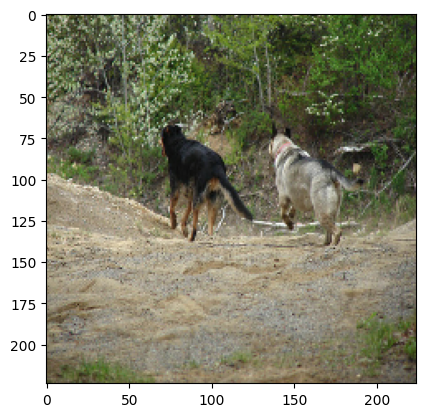

Predicted Caption:  a dog running through a field


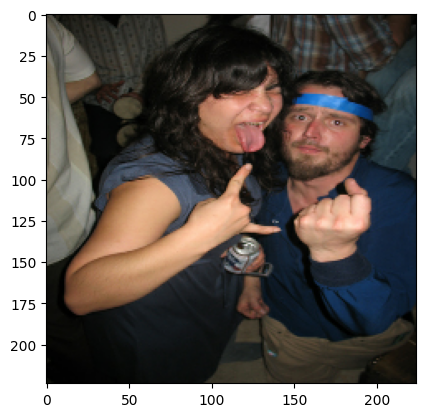

Predicted Caption:  a man and a woman are sitting on a bench


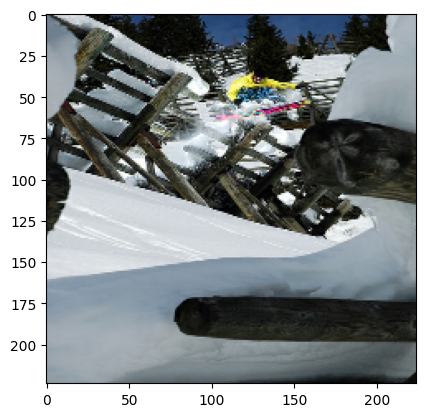

Predicted Caption:  a man in a yellow shirt is sitting on a bench a man in a blue shirt a white hat with


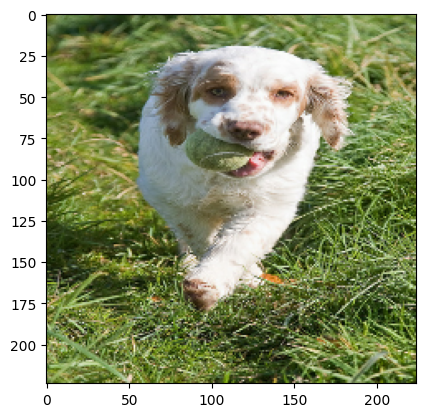

Predicted Caption:  a white dog with a collar is running


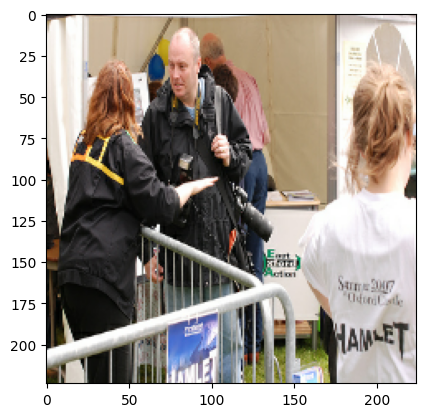

Predicted Caption:  a man and woman are standing next to a railing


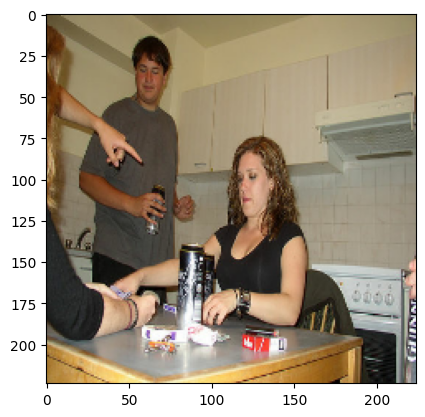

Predicted Caption:  a man and woman are sitting at a table with a drink a bottle a man in a kitchen a woman


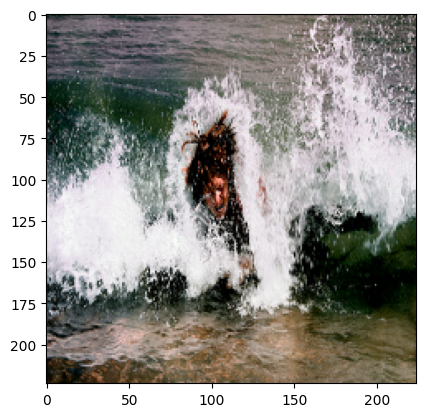

Predicted Caption:  a man is riding a wave in the ocean


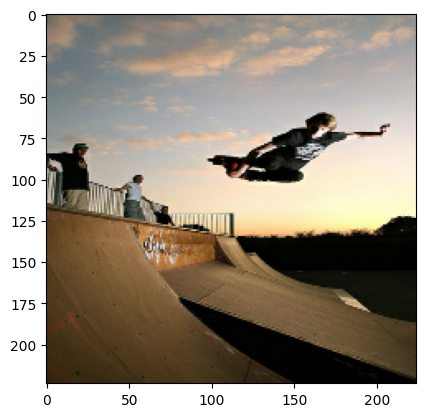

Predicted Caption:  a man is skateboarding on a ramp


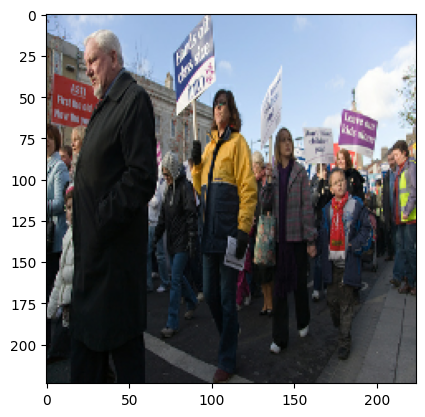

Predicted Caption:  a man in a black jacket and a woman in a black jacket is standing in front of a crowd of people


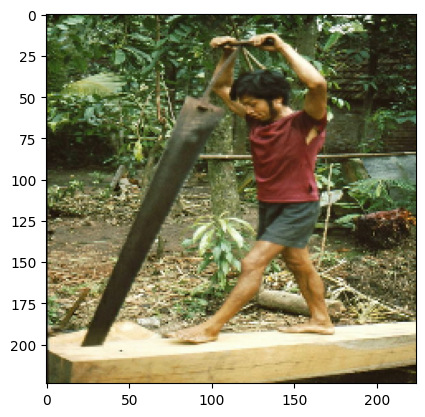

Predicted Caption:  a man in a red shirt and shorts is standing on a wooden structure


In [310]:
vocab = vectorization.get_vocabulary()
index_lookup = dict(zip(range(len(vocab)), vocab))
max_decoded_sentence_length = SEQ_LENGTH - 1
valid_images = list(datasets_dict.keys())

for x in range(10): 
    
    sample_img = np.random.choice(valid_images)
    # sample_img = os.path.join(BASE_DIR, "93922153_8d831f7f01.jpg")
    sample_img = image_loader(sample_img)
    img = sample_img.numpy().clip(0, 255).astype(np.uint8)
    plt.imshow(img)
    plt.show()
 
    img = tf.expand_dims(sample_img, 0)
    img = caption_model.cnn_model(img)
 
    encoded_img = caption_model.encoder(img, training=False)
 
    decoded_caption = "cls "
    for i in range(max_decoded_sentence_length):
        tokenized_caption = vectorization([decoded_caption])[:, :-1]
        mask = tf.math.not_equal(tokenized_caption, 0)
        predictions = caption_model.decoder(
            tokenized_caption, encoded_img, training=False, mask=mask
        )
        sampled_token_index = np.argmax(predictions[0, i, :])
          
        sampled_token = index_lookup[sampled_token_index]
            
        if sampled_token == " sep":
            break
            
        decoded_caption += " " + sampled_token

    decoded_caption = decoded_caption.replace("cls ", "")
    decoded_caption = decoded_caption.replace(" sep", "").strip()
    
    print("Predicted Caption: ", decoded_caption)

  

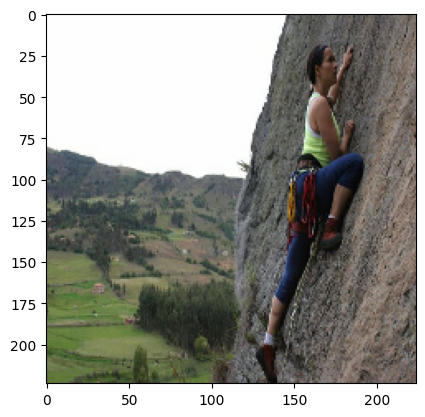

/Users/suhaanibatra/Library/Python/3.9/lib/python/site-packages/keras/src/layers/layer.py:845: UserWarning: Layer 'query' (of type EinsumDense) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/Users/suhaanibatra/Library/Python/3.9/lib/python/site-packages/keras/src/layers/layer.py:845: UserWarning: Layer 'key' (of type EinsumDense) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/Users/suhaanibatra/Library/Python/3.9/lib/python/site-packages/keras/src/layers/layer.py:845: UserWarning: Layer 'value' (of type EinsumDense) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not s

Predicted Caption:  a woman in a red tank top is sitting on a rock overlooking a valley


In [284]:
vocab = vectorization.get_vocabulary()
index_lookup = dict(zip(range(len(vocab)), vocab))
max_decoded_sentence_length = SEQ_LENGTH - 1
valid_images = list(datasets_dict.keys())
beam_width = 2 # Set the beam width

for x in range(1): 
    sample_img = os.path.join(BASE_DIR, "93922153_8d831f7f01.jpg")
    sample_img = image_loader(sample_img)
    img = sample_img.numpy().clip(0, 255).astype(np.uint8)
    plt.imshow(img)
    plt.show()
 
    img = tf.expand_dims(sample_img, 0)
    img = caption_model.cnn_model(img)
    encoded_img = caption_model.encoder(img, training=False)
 
    # Initialize the beam with a single token (CLS)
    beams = [{"tokens": ["cls "], "score": 0.0}]
    
    for i in range(max_decoded_sentence_length):
        new_beams = []
        for beam in beams:
            tokenized_caption = vectorization([" ".join(beam["tokens"])])[:, :-1]  # Reshape input
            mask = tf.math.not_equal(tokenized_caption, 0)
            predictions = caption_model.decoder(
                tokenized_caption, encoded_img, training=False, mask=mask
            )
            top_indices = np.argsort(predictions[0, i, :])[-beam_width:]  # Get top beam_width indices
            for idx in top_indices:
                new_beam = {
                    "tokens": beam["tokens"] + [index_lookup[idx]],
                    "score": beam["score"] + np.log(predictions[0, i, idx])
                }
                new_beams.append(new_beam)
        # Sort beams based on score
        new_beams.sort(key=lambda x: x["score"], reverse=True)
        # Select top beam_width beams
        beams = new_beams[:beam_width]
        
        # Check if all beams have reached the end token (SEP)
        end_flag = all(" sep" in beam["tokens"][-1] for beam in beams)
        if end_flag:
            break

    # Remove "cls" and "sep" tokens, and print the best beam
    best_beam = beams[0]
    decoded_caption = " ".join(best_beam["tokens"]).replace("cls ", "").replace(" sep", "").strip()
    print("Predicted Caption: ", decoded_caption)


In [316]:
 np.random.choice(valid_images)

'data/Images/4381932580.jpg'

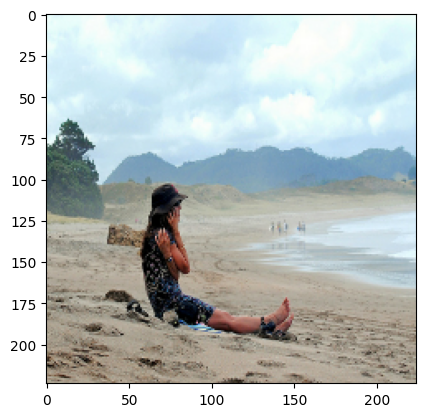

Reference Captions: 
a woman is sitting on a beach with her shoes off and on a cellphone talking , scratching her shoulder , while a group of 5 other people are walking in the background
a girl in a hat sit on a beach while talking on her cellphone
woman in hat and talking on cellphone sitting on the beach
a woman sits on the beach while talking on her cellphone
a lady sits in the sand on the beach

Predicted Caption:  a woman is sitting on the beach with a woman in her back on the beach

BLEU score -> 0.4347208719449914


In [317]:
from nltk.translate.bleu_score import sentence_bleu
from nltk.translate.bleu_score import SmoothingFunction
vocab = vectorization.get_vocabulary()
index_lookup = dict(zip(range(len(vocab)), vocab))
max_decoded_sentence_length = SEQ_LENGTH - 1
valid_images = list(datasets_dict.keys())


    
# sample_img = np.random.choice(valid_images)
sample_img = 'data/Images/4381932580.jpg'
# sample_img = os.path.join(BASE_DIR, "93922153_8d831f7f01.jpg")
reference_caption = []
for _ in datasets_dict[sample_img]:
    reference_caption.append(_[7:-8].lower())
    list_of_words = [sentence.split() for sentence in reference_caption]
        
sample_img = image_loader(sample_img)
    
img = sample_img.numpy().clip(0, 255).astype(np.uint8)
plt.imshow(img)
plt.show()
 
img = tf.expand_dims(sample_img, 0)
img = caption_model.cnn_model(img)
 
encoded_img = caption_model.encoder(img, training=False)
 
decoded_caption = "cls "
for i in range(max_decoded_sentence_length):
    tokenized_caption = vectorization([decoded_caption])[:, :-1]
    mask = tf.math.not_equal(tokenized_caption, 0)
    predictions = caption_model.decoder(
        tokenized_caption, encoded_img, training=False, mask=mask
    )
    sampled_token_index = np.argmax(predictions[0, i, :])
          
    sampled_token = index_lookup[sampled_token_index]
            
    if sampled_token == " sep":
        break
            
    decoded_caption += " " + sampled_token

decoded_caption = decoded_caption.replace("cls ", "")
decoded_caption = decoded_caption.replace(" sep", "").strip()

print("Reference Captions: ")
for _ in reference_caption:
    print(_)    

print()
print("Predicted Caption: ", decoded_caption)

print() 

smoothing_function = SmoothingFunction()
bleu_score = sentence_bleu(list_of_words, decoded_caption.split(), smoothing_function=smoothing_function.method1)
print('BLEU score -> {}'.format(bleu_score))

tts = gTTS(decoded_caption) 
tts.save('s.wav')
sound_file = 's.wav'
Audio(sound_file, autoplay=True)

In [162]:
# reference = []
# for _ in datasets_dict['data/Images/1000092795.jpg']:
#     reference.append(_[7:-8].lower())
#     list_of_words = [sentence.split() for sentence in reference]
# print(reference)
# print()
# print(list_of_words)

In [217]:
from gtts import gTTS
from IPython.display import Audio


In [276]:
def get_key(val):
   
    for key, value in index_lookup.items():
        if val == value:
            return key
 
    return "key doesn't exist"
get_key('cls')

4

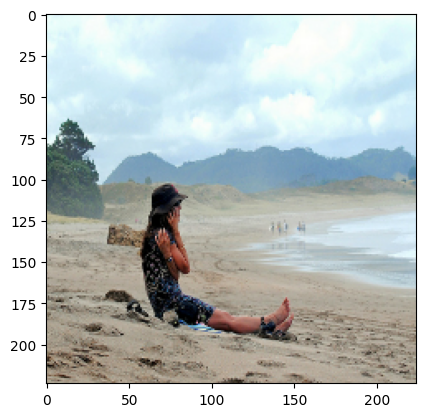

/Users/suhaanibatra/Library/Python/3.9/lib/python/site-packages/keras/src/layers/layer.py:845: UserWarning: Layer 'query' (of type EinsumDense) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/Users/suhaanibatra/Library/Python/3.9/lib/python/site-packages/keras/src/layers/layer.py:845: UserWarning: Layer 'key' (of type EinsumDense) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/Users/suhaanibatra/Library/Python/3.9/lib/python/site-packages/keras/src/layers/layer.py:845: UserWarning: Layer 'value' (of type EinsumDense) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not s

Predicted Caption:  a woman is sitting on the beach with her back to the camera on a beach in the background


In [318]:
# beam search
vocab = vectorization.get_vocabulary()
index_lookup = dict(zip(range(len(vocab)), vocab))
max_decoded_sentence_length = SEQ_LENGTH - 1
valid_images = list(datasets_dict.keys())
beam_width = 2 # Set the beam width

for x in range(1): 
    # sample_img = os.path.join(BASE_DIR, "93922153_8d831f7f01.jpg")
    sample_img = 'data/Images/4381932580.jpg'
    sample_img = image_loader(sample_img)
    img = sample_img.numpy().clip(0, 255).astype(np.uint8)
    plt.imshow(img)
    plt.show()
 
    img = tf.expand_dims(sample_img, 0)
    img = caption_model.cnn_model(img)
    encoded_img = caption_model.encoder(img, training=False)
 
    # Initialize the beam with a single token (CLS)
    beams = [{"tokens": ["cls "], "score": 0.0}]
    
    for i in range(max_decoded_sentence_length):
        new_beams = []
        for beam in beams:
            tokenized_caption = vectorization([" ".join(beam["tokens"])])[:, :-1]  # Reshape input
            mask = tf.math.not_equal(tokenized_caption, 0)
            predictions = caption_model.decoder(
                tokenized_caption, encoded_img, training=False, mask=mask
            )
            top_indices = np.argsort(predictions[0, i, :])[-beam_width:]  # Get top beam_width indices
            for idx in top_indices:
                new_beam = {
                    "tokens": beam["tokens"] + [index_lookup[idx]],
                    "score": beam["score"] + np.log(predictions[0, i, idx])
                }
                new_beams.append(new_beam)
        # Sort beams based on score
        new_beams.sort(key=lambda x: x["score"], reverse=True)
        # Select top beam_width beams
        beams = new_beams[:beam_width]
        
        # Check if all beams have reached the end token (SEP)
        end_flag = all(" sep" in beam["tokens"][-1] for beam in beams)
        if end_flag:
            break

    # Remove "cls" and "sep" tokens, and print the best beam
    best_beam = beams[0]
    decoded_caption = " ".join(best_beam["tokens"]).replace("cls ", "").replace(" sep", "").strip()
    print("Predicted Caption: ", decoded_caption)


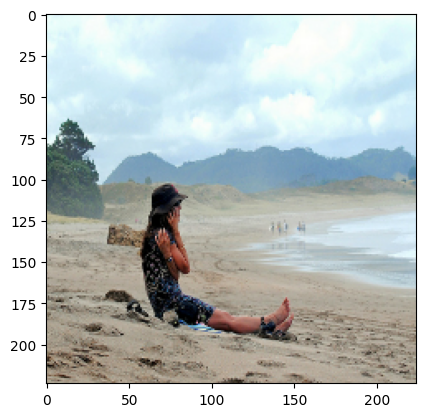

Predicted Caption:  a young girl is sitting on the beach with the ocean in the background on the beach in the sand


In [319]:
# beam search
vocab = vectorization.get_vocabulary()
index_lookup = dict(zip(range(len(vocab)), vocab))
max_decoded_sentence_length = SEQ_LENGTH - 1
valid_images = list(datasets_dict.keys())
beam_width = 3 # Set the beam width

for x in range(1): 
    # sample_img = os.path.join(BASE_DIR, "93922153_8d831f7f01.jpg")
    sample_img = 'data/Images/4381932580.jpg'
    sample_img = image_loader(sample_img)
    img = sample_img.numpy().clip(0, 255).astype(np.uint8)
    plt.imshow(img)
    plt.show()
 
    img = tf.expand_dims(sample_img, 0)
    img = caption_model.cnn_model(img)
    encoded_img = caption_model.encoder(img, training=False)
 
    # Initialize the beam with a single token (CLS)
    beams = [{"tokens": ["cls "], "score": 0.0}]
    
    for i in range(max_decoded_sentence_length):
        new_beams = []
        for beam in beams:
            tokenized_caption = vectorization([" ".join(beam["tokens"])])[:, :-1]  # Reshape input
            mask = tf.math.not_equal(tokenized_caption, 0)
            predictions = caption_model.decoder(
                tokenized_caption, encoded_img, training=False, mask=mask
            )
            top_indices = np.argsort(predictions[0, i, :])[-beam_width:]  # Get top beam_width indices
            for idx in top_indices:
                new_beam = {
                    "tokens": beam["tokens"] + [index_lookup[idx]],
                    "score": beam["score"] + np.log(predictions[0, i, idx])
                }
                new_beams.append(new_beam)
        # Sort beams based on score
        new_beams.sort(key=lambda x: x["score"], reverse=True)
        # Select top beam_width beams
        beams = new_beams[:beam_width]
        
        # Check if all beams have reached the end token (SEP)
        end_flag = all(" sep" in beam["tokens"][-1] for beam in beams)
        if end_flag:
            break

    # Remove "cls" and "sep" tokens, and print the best beam
    best_beam = beams[0]
    decoded_caption = " ".join(best_beam["tokens"]).replace("cls ", "").replace(" sep", "").strip()
    print("Predicted Caption: ", decoded_caption)


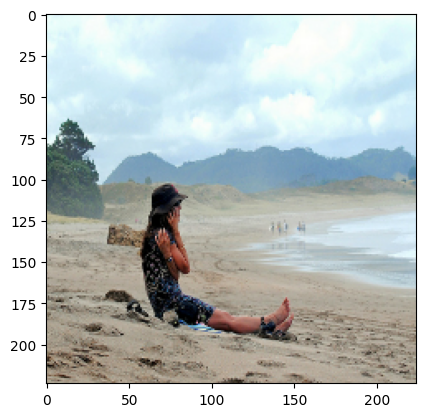

Predicted Caption:  a young girl is sitting on the beach on a sunny day on the beach in the sand


In [320]:
# beam search
vocab = vectorization.get_vocabulary()
index_lookup = dict(zip(range(len(vocab)), vocab))
max_decoded_sentence_length = SEQ_LENGTH - 1
valid_images = list(datasets_dict.keys())
beam_width = 4 # Set the beam width

for x in range(1): 
    # sample_img = os.path.join(BASE_DIR, "93922153_8d831f7f01.jpg")
    sample_img = 'data/Images/4381932580.jpg'
    sample_img = image_loader(sample_img)
    img = sample_img.numpy().clip(0, 255).astype(np.uint8)
    plt.imshow(img)
    plt.show()
 
    img = tf.expand_dims(sample_img, 0)
    img = caption_model.cnn_model(img)
    encoded_img = caption_model.encoder(img, training=False)
 
    # Initialize the beam with a single token (CLS)
    beams = [{"tokens": ["cls "], "score": 0.0}]
    
    for i in range(max_decoded_sentence_length):
        new_beams = []
        for beam in beams:
            tokenized_caption = vectorization([" ".join(beam["tokens"])])[:, :-1]  # Reshape input
            mask = tf.math.not_equal(tokenized_caption, 0)
            predictions = caption_model.decoder(
                tokenized_caption, encoded_img, training=False, mask=mask
            )
            top_indices = np.argsort(predictions[0, i, :])[-beam_width:]  # Get top beam_width indices
            for idx in top_indices:
                new_beam = {
                    "tokens": beam["tokens"] + [index_lookup[idx]],
                    "score": beam["score"] + np.log(predictions[0, i, idx])
                }
                new_beams.append(new_beam)
        # Sort beams based on score
        new_beams.sort(key=lambda x: x["score"], reverse=True)
        # Select top beam_width beams
        beams = new_beams[:beam_width]
        
        # Check if all beams have reached the end token (SEP)
        end_flag = all(" sep" in beam["tokens"][-1] for beam in beams)
        if end_flag:
            break

    # Remove "cls" and "sep" tokens, and print the best beam
    best_beam = beams[0]
    decoded_caption = " ".join(best_beam["tokens"]).replace("cls ", "").replace(" sep", "").strip()
    print("Predicted Caption: ", decoded_caption)


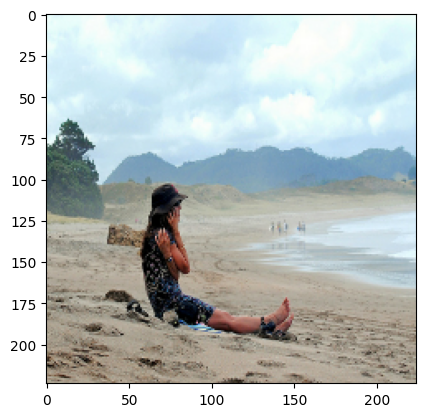

/Users/suhaanibatra/Library/Python/3.9/lib/python/site-packages/keras/src/layers/layer.py:845: UserWarning: Layer 'query' (of type EinsumDense) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/Users/suhaanibatra/Library/Python/3.9/lib/python/site-packages/keras/src/layers/layer.py:845: UserWarning: Layer 'key' (of type EinsumDense) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/Users/suhaanibatra/Library/Python/3.9/lib/python/site-packages/keras/src/layers/layer.py:845: UserWarning: Layer 'value' (of type EinsumDense) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not s

Predicted Caption:  a little girl is sitting on the beach on a sunny day on the beach in the sand


In [338]:
# beam search
vocab = vectorization.get_vocabulary()
index_lookup = dict(zip(range(len(vocab)), vocab))
max_decoded_sentence_length = SEQ_LENGTH - 1
valid_images = list(datasets_dict.keys())
beam_width = 5 # Set the beam width

for x in range(1): 
    # sample_img = os.path.join(BASE_DIR, "93922153_8d831f7f01.jpg")
    sample_img = 'data/Images/4381932580.jpg'
    sample_img = image_loader(sample_img)
    img = sample_img.numpy().clip(0, 255).astype(np.uint8)
    plt.imshow(img)
    plt.show()
 
    img = tf.expand_dims(sample_img, 0)
    img = caption_model.cnn_model(img)
    encoded_img = caption_model.encoder(img, training=False)
 
    # Initialize the beam with a single token (CLS)
    beams = [{"tokens": ["cls "], "score": 0.0}]
    
    for i in range(max_decoded_sentence_length):
        new_beams = []
        for beam in beams:
            tokenized_caption = vectorization([" ".join(beam["tokens"])])[:, :-1]  # Reshape input
            mask = tf.math.not_equal(tokenized_caption, 0)
            predictions = caption_model.decoder(
                tokenized_caption, encoded_img, training=False, mask=mask
            )
            top_indices = np.argsort(predictions[0, i, :])[-beam_width:]  # Get top beam_width indices
            for idx in top_indices:
                new_beam = {
                    "tokens": beam["tokens"] + [index_lookup[idx]],
                    "score": beam["score"] + np.log(predictions[0, i, idx])
                }
                new_beams.append(new_beam)
        # Sort beams based on score
        new_beams.sort(key=lambda x: x["score"], reverse=True)
        # Select top beam_width beams
        beams = new_beams[:beam_width]
        
        # Check if all beams have reached the end token (SEP)
        end_flag = all(" sep" in beam["tokens"][-1] for beam in beams)
        if end_flag:
            break

    # Remove "cls" and "sep" tokens, and print the best beam
    best_beam = beams[0]
    decoded_caption = " ".join(best_beam["tokens"]).replace("cls ", "").replace(" sep", "").strip()
    print("Predicted Caption: ", decoded_caption)


In [353]:
def greedy_search(vocab, sample_img, max_decoded_sentence_length):
    sample_img = image_loader(sample_img)
    img = sample_img.numpy().clip(0, 255).astype(np.uint8)
    # plt.imshow(img)
    # plt.show()
 
    img = tf.expand_dims(sample_img, 0)
    img = caption_model.cnn_model(img)
 
    encoded_img = caption_model.encoder(img, training=False)
 
    decoded_caption = "cls "
    for i in range(max_decoded_sentence_length):
        tokenized_caption = vectorization([decoded_caption])[:, :-1]
        mask = tf.math.not_equal(tokenized_caption, 0)
        predictions = caption_model.decoder(
            tokenized_caption, encoded_img, training=False, mask=mask
        )
        sampled_token_index = np.argmax(predictions[0, i, :])
          
        sampled_token = index_lookup[sampled_token_index]
            
        if sampled_token == " sep":
            break
            
        decoded_caption += " " + sampled_token

    decoded_caption = decoded_caption.replace("cls ", "")
    decoded_caption = decoded_caption.replace(" sep", "").strip()
    
    return decoded_caption


In [354]:
def beam_search(vocab, sample_img, max_decoded_sentence_length, beam_width = 2):
    index_lookup = dict(zip(range(len(vocab)), vocab))
    sample_img = image_loader(sample_img)
    img = sample_img.numpy().clip(0, 255).astype(np.uint8)
    # plt.imshow(img)
    # plt.show()

    img = tf.expand_dims(sample_img, 0)
    img = caption_model.cnn_model(img)
    encoded_img = caption_model.encoder(img, training=False)

     # Initialize the beam with a single token (CLS)
    beams = [{"tokens": ["cls "], "score": 0.0}]
    for i in range(max_decoded_sentence_length):
        new_beams = []
        for beam in beams:
            tokenized_caption = vectorization([" ".join(beam["tokens"])])[:, :-1]  # Reshape input
            mask = tf.math.not_equal(tokenized_caption, 0)
            predictions = caption_model.decoder(
                tokenized_caption, encoded_img, training=False, mask=mask
            )
            top_indices = np.argsort(predictions[0, i, :])[-beam_width:]  # Get top beam_width indices
            for idx in top_indices:
                new_beam = {
                    "tokens": beam["tokens"] + [index_lookup[idx]],
                    "score": beam["score"] + np.log(predictions[0, i, idx])
                }
                new_beams.append(new_beam)
        # Sort beams based on score
        new_beams.sort(key=lambda x: x["score"], reverse=True)
        # Select top beam_width beams
        beams = new_beams[:beam_width]
        
        # Check if all beams have reached the end token (SEP)
        end_flag = all(" sep" in beam["tokens"][-1] for beam in beams)
        if end_flag:
            break
        # Remove "cls" and "sep" tokens, and print the best beam
    best_beam = beams[0]
    decoded_caption = " ".join(best_beam["tokens"]).replace("cls ", "").replace(" sep", "").strip()
    return decoded_caption  


/Users/suhaanibatra/Library/Python/3.9/lib/python/site-packages/keras/src/layers/layer.py:845: UserWarning: Layer 'query' (of type EinsumDense) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/Users/suhaanibatra/Library/Python/3.9/lib/python/site-packages/keras/src/layers/layer.py:845: UserWarning: Layer 'key' (of type EinsumDense) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/Users/suhaanibatra/Library/Python/3.9/lib/python/site-packages/keras/src/layers/layer.py:845: UserWarning: Layer 'value' (of type EinsumDense) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not s

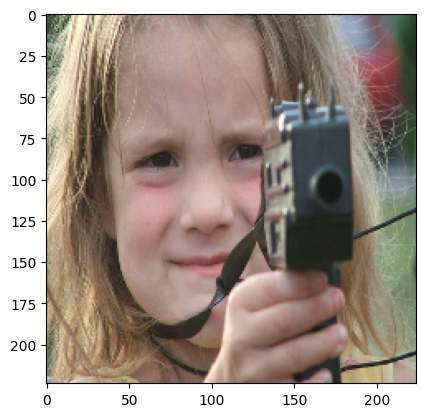

Greedy: a blond girl is looking at a camera
Beam_2: a young girl with blond hair and sunglasses is looking at a camera on a sunny day
Beam_3: a little girl is looking at a camera
Beam_4: a little girl is looking at a camera
Beam_5: a little girl is looking at a camera


In [360]:
max_decoded_sentence_length = SEQ_LENGTH - 1
valid_images = list(datasets_dict.keys())
image = np.random.choice(valid_images)

vocab = vectorization.get_vocabulary()
greedy_caption = greedy_search(vocab, image, max_decoded_sentence_length)
beam_2 = beam_search(vocab, image, max_decoded_sentence_length, 2)
beam_3 = beam_search(vocab, image, max_decoded_sentence_length, 3)
beam_4 = beam_search(vocab, image, max_decoded_sentence_length, 4)
beam_5 = beam_search(vocab, image, max_decoded_sentence_length, 5)
image = image_loader(image)
plt.imshow(image.numpy().clip(0, 255).astype(np.uint8))
plt.show()
print(f"Greedy: {greedy_caption}")
print(f"Beam_2: {beam_2}")
print(f"Beam_3: {beam_3}")
print(f"Beam_4: {beam_4}")
print(f"Beam_5: {beam_5}")

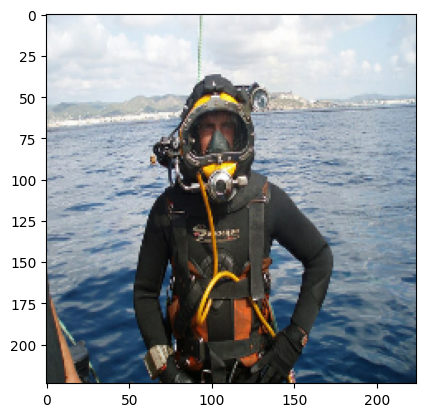

Greedy: a man in a blue shirt is riding a boat on a boat
Beam_2: a man in a blue shirt is riding a boat on a boat
Beam_3: a man in a blue shirt is riding a boat on the beach in the ocean
Beam_4: a man in a blue life jacket is riding a boat on a boat
Beam_5: a man in a blue life jacket is riding a boat on a boat


In [361]:
max_decoded_sentence_length = SEQ_LENGTH - 1
valid_images = list(datasets_dict.keys())
image = np.random.choice(valid_images)

vocab = vectorization.get_vocabulary()
greedy_caption = greedy_search(vocab, image, max_decoded_sentence_length)
beam_2 = beam_search(vocab, image, max_decoded_sentence_length, 2)
beam_3 = beam_search(vocab, image, max_decoded_sentence_length, 3)
beam_4 = beam_search(vocab, image, max_decoded_sentence_length, 4)
beam_5 = beam_search(vocab, image, max_decoded_sentence_length, 5)
image = image_loader(image)
plt.imshow(image.numpy().clip(0, 255).astype(np.uint8))
plt.show()
print(f"Greedy: {greedy_caption}")
print(f"Beam_2: {beam_2}")
print(f"Beam_3: {beam_3}")
print(f"Beam_4: {beam_4}")
print(f"Beam_5: {beam_5}")

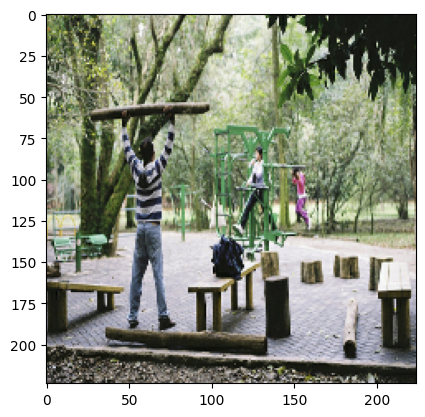

Greedy: a man in a striped shirt is standing on a sidewalk a park bench
Beam_2: a man in a striped shirt and jeans is standing on a sidewalk a park bench a man in a park
Beam_3: a man in a striped shirt is standing on a sidewalk a park bench a man with his hands on his hips
Beam_4: a man in a black and white striped shirt is standing in front of a group of people sitting on a bench a
Beam_5: a man in a black and white striped shirt is standing in front of a group of people on a park bench


In [362]:
max_decoded_sentence_length = SEQ_LENGTH - 1
valid_images = list(datasets_dict.keys())
image = np.random.choice(valid_images)

vocab = vectorization.get_vocabulary()
greedy_caption = greedy_search(vocab, image, max_decoded_sentence_length)
beam_2 = beam_search(vocab, image, max_decoded_sentence_length, 2)
beam_3 = beam_search(vocab, image, max_decoded_sentence_length, 3)
beam_4 = beam_search(vocab, image, max_decoded_sentence_length, 4)
beam_5 = beam_search(vocab, image, max_decoded_sentence_length, 5)
image = image_loader(image)
plt.imshow(image.numpy().clip(0, 255).astype(np.uint8))
plt.show()
print(f"Greedy: {greedy_caption}")
print(f"Beam_2: {beam_2}")
print(f"Beam_3: {beam_3}")
print(f"Beam_4: {beam_4}")
print(f"Beam_5: {beam_5}")

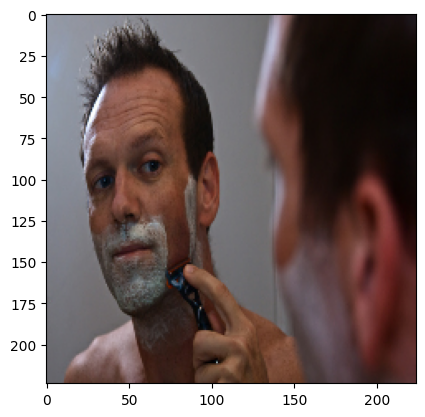

Greedy: a man is shaving his face
Beam_2: a man is shaving his face
Beam_3: a man is shaving his face off his face
Beam_4: a man is shaving his face in front of a mirror
Beam_5: a man is shaving his face in front of a mirror


In [363]:
max_decoded_sentence_length = SEQ_LENGTH - 1
valid_images = list(datasets_dict.keys())
image = np.random.choice(valid_images)

vocab = vectorization.get_vocabulary()
greedy_caption = greedy_search(vocab, image, max_decoded_sentence_length)
beam_2 = beam_search(vocab, image, max_decoded_sentence_length, 2)
beam_3 = beam_search(vocab, image, max_decoded_sentence_length, 3)
beam_4 = beam_search(vocab, image, max_decoded_sentence_length, 4)
beam_5 = beam_search(vocab, image, max_decoded_sentence_length, 5)
image = image_loader(image)
plt.imshow(image.numpy().clip(0, 255).astype(np.uint8))
plt.show()
print(f"Greedy: {greedy_caption}")
print(f"Beam_2: {beam_2}")
print(f"Beam_3: {beam_3}")
print(f"Beam_4: {beam_4}")
print(f"Beam_5: {beam_5}")

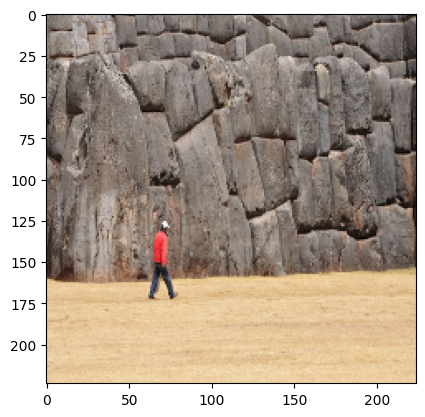

Greedy: a man in a red shirt is walking on a rock
Beam_2: a man in a red shirt is walking on a rock
Beam_3: a man in a red shirt is walking on a rock
Beam_4: a man in a red shirt is walking on a rock
Beam_5: a man in a red shirt is walking on a rock


In [364]:
max_decoded_sentence_length = SEQ_LENGTH - 1
valid_images = list(datasets_dict.keys())
image = np.random.choice(valid_images)

vocab = vectorization.get_vocabulary()
greedy_caption = greedy_search(vocab, image, max_decoded_sentence_length)
beam_2 = beam_search(vocab, image, max_decoded_sentence_length, 2)
beam_3 = beam_search(vocab, image, max_decoded_sentence_length, 3)
beam_4 = beam_search(vocab, image, max_decoded_sentence_length, 4)
beam_5 = beam_search(vocab, image, max_decoded_sentence_length, 5)
image = image_loader(image)
plt.imshow(image.numpy().clip(0, 255).astype(np.uint8))
plt.show()
print(f"Greedy: {greedy_caption}")
print(f"Beam_2: {beam_2}")
print(f"Beam_3: {beam_3}")
print(f"Beam_4: {beam_4}")
print(f"Beam_5: {beam_5}")

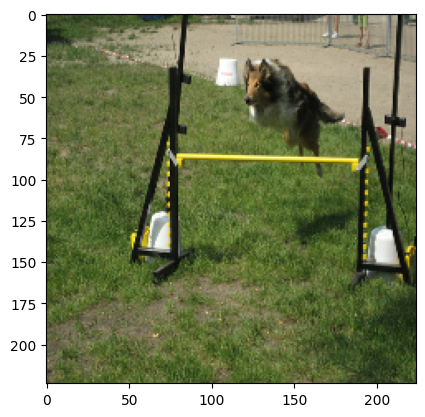

Greedy: a black and white dog is jumping over a hurdle
Beam_2: a black and white dog is jumping over a hurdle on a lawn
Beam_3: a black and white dog is jumping over a hurdle on the grass
Beam_4: a black and white dog is jumping over a hurdle on a grassy field
Beam_5: a black and white dog is jumping over a hurdle on the grass


In [365]:
max_decoded_sentence_length = SEQ_LENGTH - 1
valid_images = list(datasets_dict.keys())
image = np.random.choice(valid_images)

vocab = vectorization.get_vocabulary()
greedy_caption = greedy_search(vocab, image, max_decoded_sentence_length)
beam_2 = beam_search(vocab, image, max_decoded_sentence_length, 2)
beam_3 = beam_search(vocab, image, max_decoded_sentence_length, 3)
beam_4 = beam_search(vocab, image, max_decoded_sentence_length, 4)
beam_5 = beam_search(vocab, image, max_decoded_sentence_length, 5)
image = image_loader(image)
plt.imshow(image.numpy().clip(0, 255).astype(np.uint8))
plt.show()
print(f"Greedy: {greedy_caption}")
print(f"Beam_2: {beam_2}")
print(f"Beam_3: {beam_3}")
print(f"Beam_4: {beam_4}")
print(f"Beam_5: {beam_5}")

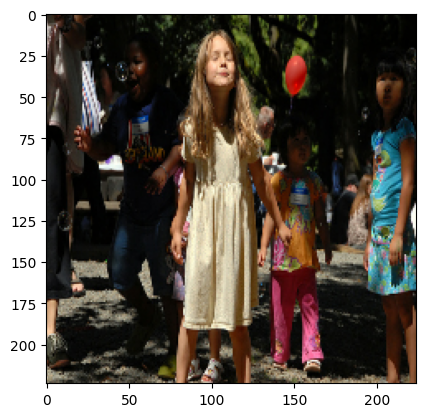

Greedy: a woman in a white dress is standing in front of a group of people
Beam_2: a woman in a white dress is standing in front of a crowd of people
Beam_3: a woman in a white dress is standing in front of a crowd of people
Beam_4: a woman in a white dress is standing in front of a crowd of people
Beam_5: a woman in a white dress is standing in front of a crowd of people


In [366]:
max_decoded_sentence_length = SEQ_LENGTH - 1
valid_images = list(datasets_dict.keys())
image = np.random.choice(valid_images)

vocab = vectorization.get_vocabulary()
greedy_caption = greedy_search(vocab, image, max_decoded_sentence_length)
beam_2 = beam_search(vocab, image, max_decoded_sentence_length, 2)
beam_3 = beam_search(vocab, image, max_decoded_sentence_length, 3)
beam_4 = beam_search(vocab, image, max_decoded_sentence_length, 4)
beam_5 = beam_search(vocab, image, max_decoded_sentence_length, 5)
image = image_loader(image)
plt.imshow(image.numpy().clip(0, 255).astype(np.uint8))
plt.show()
print(f"Greedy: {greedy_caption}")
print(f"Beam_2: {beam_2}")
print(f"Beam_3: {beam_3}")
print(f"Beam_4: {beam_4}")
print(f"Beam_5: {beam_5}")

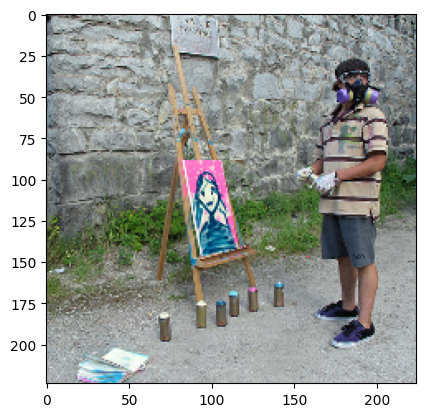

Reference Captions: 
an artist wearing a purple breathing mask is standing next to a stone wall , painting with aerosol cans on a canvas held up by an easel
a young man wearing a paint mask while standing next to a spray painted painting on a canvas and easel
a dark-haired male wears a gas-mask while spray painting a canvas by a big stone wall
man in a gas mask completes a painting outside a wall
a young man in a striped shirt with a gas mask on

Greedy: a woman in a green shirt is walking down a street
BLEU score for greedy -> 0.4347208719449914

Beam_2: a woman in a white shirt and black shorts is walking down a sidewalk
BLEU score for beam search 2 -> 0.04131551591106297

Beam_3: a woman in a green shirt is standing next to a painting of a wall
BLEU score for beam search 3 -> 0.32947213895418936

Beam_4: a woman in a green shirt is standing next to a painting of a wall
BLEU score for beam search 4 -> 0.32947213895418936

Beam_5: a woman in a green shirt is standing next to a paintin

In [393]:
max_decoded_sentence_length = SEQ_LENGTH - 1
# valid_images = list(datasets_dict.keys())
image = np.random.choice(test_images)
reference_caption = []
for _ in datasets_dict[image]:
    reference_caption.append(_[7:-8].lower())
    list_of_words = [sentence.split() for sentence in reference_caption]


vocab = vectorization.get_vocabulary()
greedy_caption = greedy_search(vocab, image, max_decoded_sentence_length)
beam_2 = beam_search(vocab, image, max_decoded_sentence_length, 2)
beam_3 = beam_search(vocab, image, max_decoded_sentence_length, 3)
beam_4 = beam_search(vocab, image, max_decoded_sentence_length, 4)
beam_5 = beam_search(vocab, image, max_decoded_sentence_length, 5)
image = image_loader(image)
plt.imshow(image.numpy().clip(0, 255).astype(np.uint8))
plt.show()

print("Reference Captions: ")
for _ in reference_caption:
    print(_)  

print()
smoothing_function = SmoothingFunction()

print(f"Greedy: {greedy_caption}")
bleu_score_g = sentence_bleu(list_of_words, greedy_caption.split(), smoothing_function=smoothing_function.method1)
print('BLEU score for greedy -> {}'.format(bleu_score))
print()

print(f"Beam_2: {beam_2}")
bleu_score_2 = sentence_bleu(list_of_words,beam_2.split(), smoothing_function=smoothing_function.method1)
print('BLEU score for beam search 2 -> {}'.format(bleu_score_2))
print()

print(f"Beam_3: {beam_3}")
bleu_score_3 = sentence_bleu(list_of_words,beam_3.split(), smoothing_function=smoothing_function.method1)
print('BLEU score for beam search 3 -> {}'.format(bleu_score_3))
print()

print(f"Beam_4: {beam_4}")
bleu_score_4 = sentence_bleu(list_of_words,beam_4.split(), smoothing_function=smoothing_function.method1)
print('BLEU score for beam search 4 -> {}'.format(bleu_score_4))
print()

print(f"Beam_5: {beam_5}")
bleu_score_5 = sentence_bleu(list_of_words,beam_5.split(), smoothing_function=smoothing_function.method1)
print('BLEU score for beam sesarch 5 -> {}'.format(bleu_score_5))
print()

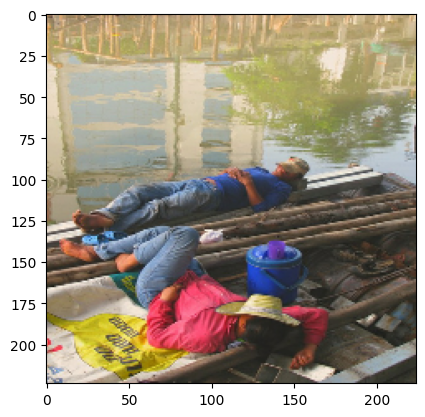

Reference Captions: 
two men , one wearing a blue shirt and the other wearing a red shirt asleep on a boat
a man and woman take a nap near the water with their hats covering their faces
two men in casual attire taking a nap from a day of fishing down by the river
two people sleeping next to wooden logs on the water
a man and woman taking a nap on a makeshift rip

Greedy: a man in a red shirt and blue jeans is sitting on a bench
BLEU score for greedy -> 0.4347208719449914

Beam_2: a man in a red shirt and blue jeans is sitting on a bench on the sidewalk
BLEU score for beam search 2 -> 0.10367855464689375

Beam_3: a man in a red shirt and blue jeans is sitting on a bench next to a body of water
BLEU score for beam search 3 -> 0.09219206986995854

Beam_4: a man in a red shirt and blue jeans is sitting on a bench next to a body of water
BLEU score for beam search 4 -> 0.09219206986995854

Beam_5: a man in a red shirt and blue jeans is sitting on a bench in front of a body of water
BLEU sco

In [394]:
max_decoded_sentence_length = SEQ_LENGTH - 1
# valid_images = list(datasets_dict.keys())
image = np.random.choice(test_images)
reference_caption = []
for _ in datasets_dict[image]:
    reference_caption.append(_[7:-8].lower())
    list_of_words = [sentence.split() for sentence in reference_caption]


vocab = vectorization.get_vocabulary()
greedy_caption = greedy_search(vocab, image, max_decoded_sentence_length)
beam_2 = beam_search(vocab, image, max_decoded_sentence_length, 2)
beam_3 = beam_search(vocab, image, max_decoded_sentence_length, 3)
beam_4 = beam_search(vocab, image, max_decoded_sentence_length, 4)
beam_5 = beam_search(vocab, image, max_decoded_sentence_length, 5)
image = image_loader(image)
plt.imshow(image.numpy().clip(0, 255).astype(np.uint8))
plt.show()

print("Reference Captions: ")
for _ in reference_caption:
    print(_)  

print()
smoothing_function = SmoothingFunction()

print(f"Greedy: {greedy_caption}")
bleu_score_g = sentence_bleu(list_of_words, greedy_caption.split(), smoothing_function=smoothing_function.method1)
print('BLEU score for greedy -> {}'.format(bleu_score))
print()

print(f"Beam_2: {beam_2}")
bleu_score_2 = sentence_bleu(list_of_words,beam_2.split(), smoothing_function=smoothing_function.method1)
print('BLEU score for beam search 2 -> {}'.format(bleu_score_2))
print()

print(f"Beam_3: {beam_3}")
bleu_score_3 = sentence_bleu(list_of_words,beam_3.split(), smoothing_function=smoothing_function.method1)
print('BLEU score for beam search 3 -> {}'.format(bleu_score_3))
print()

print(f"Beam_4: {beam_4}")
bleu_score_4 = sentence_bleu(list_of_words,beam_4.split(), smoothing_function=smoothing_function.method1)
print('BLEU score for beam search 4 -> {}'.format(bleu_score_4))
print()

print(f"Beam_5: {beam_5}")
bleu_score_5 = sentence_bleu(list_of_words,beam_5.split(), smoothing_function=smoothing_function.method1)
print('BLEU score for beam sesarch 5 -> {}'.format(bleu_score_5))
print()

In [421]:
test_images[:5]

['data/Images/4944548179.jpg',
 'data/Images/4944644486.jpg',
 'data/Images/4944653840.jpg',
 'data/Images/4944696052.jpg',
 'data/Images/4944749423.jpg']

/Users/suhaanibatra/Library/Python/3.9/lib/python/site-packages/keras/src/layers/layer.py:845: UserWarning: Layer 'query' (of type EinsumDense) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/Users/suhaanibatra/Library/Python/3.9/lib/python/site-packages/keras/src/layers/layer.py:845: UserWarning: Layer 'key' (of type EinsumDense) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/Users/suhaanibatra/Library/Python/3.9/lib/python/site-packages/keras/src/layers/layer.py:845: UserWarning: Layer 'value' (of type EinsumDense) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not s

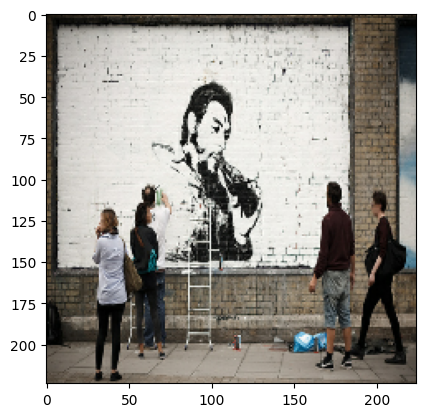

Reference Captions: 
a person painting a mural on the side of a building while people are standing around watching
pedestrians stop to watch a man create a mural on a wall at the side of a street
a painting of a man drinking from a bottle on the side of a building
an artist is painting a mural on the side of a building
a crowd gathers to watch the artist at work

Greedy: a man in a black shirt is walking down the street
BLEU score for greedy -> 0.4347208719449914

Beam_2: a man in a black shirt and jeans is walking down the street a man in a black shirt a black hat
BLEU score for beam search 2 -> 0.02598161264714833

Beam_3: a man in a black shirt and blue jeans is walking down the street a man in a black shirt and jeans
BLEU score for beam search 3 -> 0.02598161264714833

Beam_4: a man in a black shirt and blue jeans is walking down the street in front of a building
BLEU score for beam search 4 -> 0.07339934569877102

Beam_5: a man in a black shirt and blue jeans is walking down the s

In [422]:
max_decoded_sentence_length = SEQ_LENGTH - 1
# valid_images = list(datasets_dict.keys())
# image = np.random.choice(test_images)
image = 'data/Images/4944548179.jpg'
reference_caption = []
for _ in datasets_dict[image]:
    reference_caption.append(_[7:-8].lower())
    list_of_words = [sentence.split() for sentence in reference_caption]


vocab = vectorization.get_vocabulary()
greedy_caption = greedy_search(vocab, image, max_decoded_sentence_length)
beam_2 = beam_search(vocab, image, max_decoded_sentence_length, 2)
beam_3 = beam_search(vocab, image, max_decoded_sentence_length, 3)
beam_4 = beam_search(vocab, image, max_decoded_sentence_length, 4)
beam_5 = beam_search(vocab, image, max_decoded_sentence_length, 5)
image = image_loader(image)
plt.imshow(image.numpy().clip(0, 255).astype(np.uint8))
plt.show()

print("Reference Captions: ")
for _ in reference_caption:
    print(_)  

print()
smoothing_function = SmoothingFunction()

print(f"Greedy: {greedy_caption}")
bleu_score_g = sentence_bleu(list_of_words, greedy_caption.split(), smoothing_function=smoothing_function.method1)
print('BLEU score for greedy -> {}'.format(bleu_score))
print()

print(f"Beam_2: {beam_2}")
bleu_score_2 = sentence_bleu(list_of_words,beam_2.split(), smoothing_function=smoothing_function.method1)
print('BLEU score for beam search 2 -> {}'.format(bleu_score_2))
print()

print(f"Beam_3: {beam_3}")
bleu_score_3 = sentence_bleu(list_of_words,beam_3.split(), smoothing_function=smoothing_function.method1)
print('BLEU score for beam search 3 -> {}'.format(bleu_score_3))
print()

print(f"Beam_4: {beam_4}")
bleu_score_4 = sentence_bleu(list_of_words,beam_4.split(), smoothing_function=smoothing_function.method1)
print('BLEU score for beam search 4 -> {}'.format(bleu_score_4))
print()

print(f"Beam_5: {beam_5}")
bleu_score_5 = sentence_bleu(list_of_words,beam_5.split(), smoothing_function=smoothing_function.method1)
print('BLEU score for beam sesarch 5 -> {}'.format(bleu_score_5))
print()

In [402]:
from tqdm import tqdm

In [431]:
vocab = vectorization.get_vocabulary()
def evaluate_bleu_score(test_images, method="greedy", k =2):
    i = 0
    total_bleu_score = 0
    for image in tqdm(test_images):
        
        reference_caption = []
        for _ in datasets_dict[image]:
            reference_caption.append(_[7:-8].lower())
            list_of_words = [sentence.split() for sentence in reference_caption]
        
        if(method == "greedy"):
            decoded_caption = greedy_search(vocab, image, max_decoded_sentence_length)

        else:
            if k == 2:
                decoded_caption = beam_search(vocab, image, max_decoded_sentence_length, 2)
            elif k == 3:
                decoded_caption = beam_search(vocab, image, max_decoded_sentence_length, 3)
            elif k == 4:
                decoded_caption = beam_search(vocab, image, max_decoded_sentence_length, 4)
            else:
                decoded_caption = beam_search(vocab, image, max_decoded_sentence_length, 5)
                
        
        smoothing_function = SmoothingFunction()
        bleu_score = sentence_bleu(list_of_words, decoded_caption.split(), smoothing_function=smoothing_function.method1)
        # image = image_loader(image)
        # plt.imshow(image.numpy().clip(0, 255).astype(np.uint8))
        # plt.show()
        
        # print("Ref : ", reference_caption[0])
        # print("Predicted caption: ", decoded_caption)
        # print()
        # print('BLEU score -> {}'.format(bleu_score))
        total_bleu_score += bleu_score
        
        i+= 1
        print()
    print("Total test images = ", i)
    print()
    print(f"Average BLEU Score = {total_bleu_score/i}")

In [432]:
evaluate_bleu_score(test_images) #greedy

  0%|                                                                                                                                                                        | 1/6357 [00:00<1:20:45,  1.31it/s]

  0%|                                                                                                                                                                        | 2/6357 [00:01<1:19:56,  1.32it/s]

  0%|                                                                                                                                                                        | 3/6357 [00:02<1:22:15,  1.29it/s]

  0%|                                                                                                                                                                        | 4/6357 [00:03<1:18:55,  1.34it/s]

  0%|▏                                                                                                                                                                       | 5/6357 [00:03<1:17:12,  1.37it/s]

  0%|▏                                                                                                                                                                       | 6/6357 [00:04<1:16:31,  1.38it/s]

  0%|▏                                                                                                                                                                       | 7/6357 [00:05<1:15:33,  1.40it/s]

  0%|▏                                                                                                                                                                       | 8/6357 [00:05<1:14:15,  1.42it/s]

  0%|▏                                                                                                                                                                       | 9/6357 [00:06<1:13:05,  1.45it/s]

  0%|▎                                                                                                                                                                      | 10/6357 [00:07<1:13:10,  1.45it/s]

  0%|▎                                                                                                                                                                      | 11/6357 [00:07<1:12:59,  1.45it/s]

  0%|▎                                                                                                                                                                      | 12/6357 [00:08<1:12:55,  1.45it/s]

  0%|▎                                                                                                                                                                      | 13/6357 [00:09<1:12:51,  1.45it/s]

  0%|▎                                                                                                                                                                      | 14/6357 [00:09<1:14:42,  1.41it/s]

  0%|▍                                                                                                                                                                      | 15/6357 [00:10<1:14:08,  1.43it/s]

  0%|▍                                                                                                                                                                      | 16/6357 [00:11<1:13:27,  1.44it/s]

  0%|▍                                                                                                                                                                      | 17/6357 [00:12<1:13:12,  1.44it/s]

  0%|▍                                                                                                                                                                      | 18/6357 [00:12<1:12:30,  1.46it/s]

  0%|▍                                                                                                                                                                      | 19/6357 [00:13<1:12:02,  1.47it/s]

  0%|▌                                                                                                                                                                      | 20/6357 [00:14<1:12:09,  1.46it/s]

  0%|▌                                                                                                                                                                      | 21/6357 [00:14<1:11:38,  1.47it/s]

  0%|▌                                                                                                                                                                      | 22/6357 [00:15<1:11:47,  1.47it/s]

  0%|▌                                                                                                                                                                      | 23/6357 [00:16<1:11:37,  1.47it/s]

  0%|▋                                                                                                                                                                      | 24/6357 [00:16<1:11:11,  1.48it/s]

  0%|▋                                                                                                                                                                      | 25/6357 [00:17<1:10:52,  1.49it/s]

  0%|▋                                                                                                                                                                      | 26/6357 [00:18<1:10:58,  1.49it/s]

  0%|▋                                                                                                                                                                      | 27/6357 [00:18<1:11:24,  1.48it/s]

  0%|▋                                                                                                                                                                      | 28/6357 [00:19<1:11:20,  1.48it/s]

  0%|▊                                                                                                                                                                      | 29/6357 [00:20<1:10:59,  1.49it/s]

  0%|▊                                                                                                                                                                      | 30/6357 [00:20<1:10:48,  1.49it/s]

  0%|▊                                                                                                                                                                      | 31/6357 [00:21<1:10:54,  1.49it/s]

  1%|▊                                                                                                                                                                      | 32/6357 [00:22<1:10:47,  1.49it/s]

  1%|▊                                                                                                                                                                      | 33/6357 [00:22<1:10:56,  1.49it/s]

  1%|▉                                                                                                                                                                      | 34/6357 [00:23<1:11:28,  1.47it/s]

  1%|▉                                                                                                                                                                      | 35/6357 [00:24<1:11:15,  1.48it/s]

  1%|▉                                                                                                                                                                      | 36/6357 [00:24<1:11:03,  1.48it/s]

  1%|▉                                                                                                                                                                      | 37/6357 [00:25<1:11:31,  1.47it/s]

  1%|▉                                                                                                                                                                      | 38/6357 [00:26<1:11:22,  1.48it/s]

  1%|█                                                                                                                                                                      | 39/6357 [00:26<1:11:27,  1.47it/s]

  1%|█                                                                                                                                                                      | 40/6357 [00:27<1:11:42,  1.47it/s]

  1%|█                                                                                                                                                                      | 41/6357 [00:28<1:11:25,  1.47it/s]

  1%|█                                                                                                                                                                      | 42/6357 [00:28<1:11:39,  1.47it/s]

  1%|█▏                                                                                                                                                                     | 43/6357 [00:29<1:11:24,  1.47it/s]

  1%|█▏                                                                                                                                                                     | 44/6357 [00:30<1:16:25,  1.38it/s]

  1%|█▏                                                                                                                                                                     | 45/6357 [00:31<1:14:47,  1.41it/s]

  1%|█▏                                                                                                                                                                     | 46/6357 [00:31<1:13:45,  1.43it/s]

  1%|█▏                                                                                                                                                                     | 47/6357 [00:32<1:13:13,  1.44it/s]

  1%|█▎                                                                                                                                                                     | 48/6357 [00:33<1:12:28,  1.45it/s]

  1%|█▎                                                                                                                                                                     | 49/6357 [00:33<1:12:10,  1.46it/s]

  1%|█▎                                                                                                                                                                     | 50/6357 [00:34<1:11:40,  1.47it/s]

  1%|█▎                                                                                                                                                                     | 51/6357 [00:35<1:11:18,  1.47it/s]

  1%|█▎                                                                                                                                                                     | 52/6357 [00:35<1:11:01,  1.48it/s]

  1%|█▍                                                                                                                                                                     | 53/6357 [00:36<1:10:47,  1.48it/s]

  1%|█▍                                                                                                                                                                     | 54/6357 [00:37<1:11:00,  1.48it/s]

  1%|█▍                                                                                                                                                                     | 55/6357 [00:37<1:10:28,  1.49it/s]

  1%|█▍                                                                                                                                                                     | 56/6357 [00:38<1:10:34,  1.49it/s]

  1%|█▍                                                                                                                                                                     | 57/6357 [00:39<1:10:36,  1.49it/s]

  1%|█▌                                                                                                                                                                     | 58/6357 [00:39<1:10:39,  1.49it/s]

  1%|█▌                                                                                                                                                                     | 59/6357 [00:40<1:10:53,  1.48it/s]

  1%|█▌                                                                                                                                                                     | 60/6357 [00:41<1:10:50,  1.48it/s]

  1%|█▌                                                                                                                                                                     | 61/6357 [00:41<1:11:06,  1.48it/s]

  1%|█▋                                                                                                                                                                     | 62/6357 [00:42<1:11:55,  1.46it/s]

  1%|█▋                                                                                                                                                                     | 63/6357 [00:43<1:11:44,  1.46it/s]

  1%|█▋                                                                                                                                                                     | 64/6357 [00:43<1:11:27,  1.47it/s]

  1%|█▋                                                                                                                                                                     | 65/6357 [00:44<1:11:48,  1.46it/s]

  1%|█▋                                                                                                                                                                     | 66/6357 [00:45<1:11:41,  1.46it/s]

  1%|█▊                                                                                                                                                                     | 67/6357 [00:46<1:11:11,  1.47it/s]

  1%|█▊                                                                                                                                                                     | 68/6357 [00:46<1:11:21,  1.47it/s]

  1%|█▊                                                                                                                                                                     | 69/6357 [00:47<1:11:36,  1.46it/s]

  1%|█▊                                                                                                                                                                     | 70/6357 [00:48<1:10:44,  1.48it/s]

  1%|█▊                                                                                                                                                                     | 71/6357 [00:48<1:11:05,  1.47it/s]

  1%|█▉                                                                                                                                                                     | 72/6357 [00:49<1:10:58,  1.48it/s]

  1%|█▉                                                                                                                                                                     | 73/6357 [00:50<1:12:35,  1.44it/s]

  1%|█▉                                                                                                                                                                     | 74/6357 [00:50<1:11:55,  1.46it/s]

  1%|█▉                                                                                                                                                                     | 75/6357 [00:51<1:13:25,  1.43it/s]

  1%|█▉                                                                                                                                                                     | 76/6357 [00:52<1:14:27,  1.41it/s]

  1%|██                                                                                                                                                                     | 77/6357 [00:52<1:13:15,  1.43it/s]

  1%|██                                                                                                                                                                     | 78/6357 [00:53<1:12:40,  1.44it/s]

  1%|██                                                                                                                                                                     | 79/6357 [00:54<1:11:40,  1.46it/s]

  1%|██                                                                                                                                                                     | 80/6357 [00:54<1:11:17,  1.47it/s]

  1%|██▏                                                                                                                                                                    | 81/6357 [00:55<1:10:49,  1.48it/s]

  1%|██▏                                                                                                                                                                    | 82/6357 [00:56<1:10:50,  1.48it/s]

  1%|██▏                                                                                                                                                                    | 83/6357 [00:56<1:10:28,  1.48it/s]

  1%|██▏                                                                                                                                                                    | 84/6357 [00:57<1:10:11,  1.49it/s]

  1%|██▏                                                                                                                                                                    | 85/6357 [00:58<1:10:19,  1.49it/s]

  1%|██▎                                                                                                                                                                    | 86/6357 [00:58<1:10:41,  1.48it/s]

  1%|██▎                                                                                                                                                                    | 87/6357 [00:59<1:10:10,  1.49it/s]

  1%|██▎                                                                                                                                                                    | 88/6357 [01:00<1:11:02,  1.47it/s]

  1%|██▎                                                                                                                                                                    | 89/6357 [01:01<1:11:04,  1.47it/s]

  1%|██▎                                                                                                                                                                    | 90/6357 [01:01<1:10:44,  1.48it/s]

  1%|██▍                                                                                                                                                                    | 91/6357 [01:02<1:11:04,  1.47it/s]

  1%|██▍                                                                                                                                                                    | 92/6357 [01:03<1:10:40,  1.48it/s]

  1%|██▍                                                                                                                                                                    | 93/6357 [01:03<1:10:22,  1.48it/s]

  1%|██▍                                                                                                                                                                    | 94/6357 [01:04<1:10:14,  1.49it/s]

  1%|██▍                                                                                                                                                                    | 95/6357 [01:05<1:10:04,  1.49it/s]

  2%|██▌                                                                                                                                                                    | 96/6357 [01:05<1:09:56,  1.49it/s]

  2%|██▌                                                                                                                                                                    | 97/6357 [01:06<1:10:19,  1.48it/s]

  2%|██▌                                                                                                                                                                    | 98/6357 [01:07<1:10:36,  1.48it/s]

  2%|██▌                                                                                                                                                                    | 99/6357 [01:07<1:10:23,  1.48it/s]

  2%|██▌                                                                                                                                                                   | 100/6357 [01:08<1:10:30,  1.48it/s]

  2%|██▋                                                                                                                                                                   | 101/6357 [01:09<1:10:05,  1.49it/s]

  2%|██▋                                                                                                                                                                   | 102/6357 [01:09<1:09:59,  1.49it/s]

  2%|██▋                                                                                                                                                                   | 103/6357 [01:10<1:10:00,  1.49it/s]

  2%|██▋                                                                                                                                                                   | 104/6357 [01:11<1:09:52,  1.49it/s]

  2%|██▋                                                                                                                                                                   | 105/6357 [01:11<1:09:49,  1.49it/s]

  2%|██▊                                                                                                                                                                   | 106/6357 [01:12<1:10:18,  1.48it/s]

  2%|██▊                                                                                                                                                                   | 107/6357 [01:13<1:10:08,  1.48it/s]

  2%|██▊                                                                                                                                                                   | 108/6357 [01:13<1:10:04,  1.49it/s]

  2%|██▊                                                                                                                                                                   | 109/6357 [01:14<1:10:08,  1.48it/s]

  2%|██▊                                                                                                                                                                   | 110/6357 [01:15<1:09:55,  1.49it/s]

  2%|██▉                                                                                                                                                                   | 111/6357 [01:15<1:10:18,  1.48it/s]

  2%|██▉                                                                                                                                                                   | 112/6357 [01:16<1:10:24,  1.48it/s]

  2%|██▉                                                                                                                                                                   | 113/6357 [01:17<1:09:58,  1.49it/s]

  2%|██▉                                                                                                                                                                   | 114/6357 [01:17<1:11:04,  1.46it/s]

  2%|███                                                                                                                                                                   | 115/6357 [01:18<1:11:40,  1.45it/s]

  2%|███                                                                                                                                                                   | 116/6357 [01:19<1:12:29,  1.43it/s]

  2%|███                                                                                                                                                                   | 117/6357 [01:20<1:13:59,  1.41it/s]

  2%|███                                                                                                                                                                   | 118/6357 [01:20<1:13:38,  1.41it/s]

  2%|███                                                                                                                                                                   | 119/6357 [01:21<1:13:10,  1.42it/s]

  2%|███▏                                                                                                                                                                  | 120/6357 [01:22<1:13:07,  1.42it/s]

  2%|███▏                                                                                                                                                                  | 121/6357 [01:22<1:12:19,  1.44it/s]

  2%|███▏                                                                                                                                                                  | 122/6357 [01:23<1:12:17,  1.44it/s]

  2%|███▏                                                                                                                                                                  | 123/6357 [01:24<1:11:34,  1.45it/s]

  2%|███▏                                                                                                                                                                  | 124/6357 [01:24<1:10:54,  1.47it/s]

  2%|███▎                                                                                                                                                                  | 125/6357 [01:25<1:10:39,  1.47it/s]

  2%|███▎                                                                                                                                                                  | 126/6357 [01:26<1:10:16,  1.48it/s]

  2%|███▎                                                                                                                                                                  | 127/6357 [01:26<1:10:15,  1.48it/s]

  2%|███▎                                                                                                                                                                  | 128/6357 [01:27<1:10:24,  1.47it/s]

  2%|███▎                                                                                                                                                                  | 129/6357 [01:28<1:09:56,  1.48it/s]

  2%|███▍                                                                                                                                                                  | 130/6357 [01:28<1:10:04,  1.48it/s]

  2%|███▍                                                                                                                                                                  | 131/6357 [01:29<1:10:18,  1.48it/s]

  2%|███▍                                                                                                                                                                  | 132/6357 [01:30<1:11:50,  1.44it/s]

  2%|███▍                                                                                                                                                                  | 133/6357 [01:31<1:12:40,  1.43it/s]

  2%|███▍                                                                                                                                                                  | 134/6357 [01:31<1:12:20,  1.43it/s]

  2%|███▌                                                                                                                                                                  | 135/6357 [01:32<1:11:54,  1.44it/s]

  2%|███▌                                                                                                                                                                  | 136/6357 [01:33<1:10:58,  1.46it/s]

  2%|███▌                                                                                                                                                                  | 137/6357 [01:33<1:10:24,  1.47it/s]

  2%|███▌                                                                                                                                                                  | 138/6357 [01:34<1:11:53,  1.44it/s]

  2%|███▋                                                                                                                                                                  | 139/6357 [01:35<1:12:35,  1.43it/s]

  2%|███▋                                                                                                                                                                  | 140/6357 [01:36<1:20:27,  1.29it/s]

  2%|███▋                                                                                                                                                                  | 141/6357 [01:37<1:29:00,  1.16it/s]

  2%|███▋                                                                                                                                                                  | 142/6357 [01:37<1:23:29,  1.24it/s]

  2%|███▋                                                                                                                                                                  | 143/6357 [01:38<1:19:04,  1.31it/s]

  2%|███▊                                                                                                                                                                  | 144/6357 [01:39<1:16:21,  1.36it/s]

  2%|███▊                                                                                                                                                                  | 145/6357 [01:39<1:14:44,  1.39it/s]

  2%|███▊                                                                                                                                                                  | 146/6357 [01:40<1:13:05,  1.42it/s]

  2%|███▊                                                                                                                                                                  | 147/6357 [01:41<1:12:19,  1.43it/s]

  2%|███▊                                                                                                                                                                  | 148/6357 [01:41<1:11:16,  1.45it/s]

  2%|███▉                                                                                                                                                                  | 149/6357 [01:42<1:10:44,  1.46it/s]

  2%|███▉                                                                                                                                                                  | 150/6357 [01:43<1:11:06,  1.45it/s]

  2%|███▉                                                                                                                                                                  | 151/6357 [01:43<1:10:56,  1.46it/s]

  2%|███▉                                                                                                                                                                  | 152/6357 [01:44<1:10:23,  1.47it/s]

  2%|███▉                                                                                                                                                                  | 153/6357 [01:45<1:10:04,  1.48it/s]

  2%|████                                                                                                                                                                  | 154/6357 [01:46<1:10:19,  1.47it/s]

  2%|████                                                                                                                                                                  | 155/6357 [01:46<1:09:52,  1.48it/s]

  2%|████                                                                                                                                                                  | 156/6357 [01:47<1:09:30,  1.49it/s]

  2%|████                                                                                                                                                                  | 157/6357 [01:48<1:09:50,  1.48it/s]

  2%|████▏                                                                                                                                                                 | 158/6357 [01:48<1:09:28,  1.49it/s]

  3%|████▏                                                                                                                                                                 | 159/6357 [01:49<1:09:06,  1.49it/s]

  3%|████▏                                                                                                                                                                 | 160/6357 [01:50<1:09:25,  1.49it/s]

  3%|████▏                                                                                                                                                                 | 161/6357 [01:50<1:09:46,  1.48it/s]

  3%|████▏                                                                                                                                                                 | 162/6357 [01:51<1:09:25,  1.49it/s]

  3%|████▎                                                                                                                                                                 | 163/6357 [01:52<1:09:46,  1.48it/s]

  3%|████▎                                                                                                                                                                 | 164/6357 [01:52<1:09:56,  1.48it/s]

  3%|████▎                                                                                                                                                                 | 165/6357 [01:53<1:10:11,  1.47it/s]

  3%|████▎                                                                                                                                                                 | 166/6357 [01:54<1:09:39,  1.48it/s]

  3%|████▎                                                                                                                                                                 | 167/6357 [01:54<1:10:02,  1.47it/s]

  3%|████▍                                                                                                                                                                 | 168/6357 [01:55<1:10:16,  1.47it/s]

  3%|████▍                                                                                                                                                                 | 169/6357 [01:56<1:10:01,  1.47it/s]

  3%|████▍                                                                                                                                                                 | 170/6357 [01:56<1:09:48,  1.48it/s]

  3%|████▍                                                                                                                                                                 | 171/6357 [01:57<1:09:34,  1.48it/s]

  3%|████▍                                                                                                                                                                 | 172/6357 [01:58<1:09:27,  1.48it/s]

  3%|████▌                                                                                                                                                                 | 173/6357 [01:58<1:09:20,  1.49it/s]

  3%|████▌                                                                                                                                                                 | 174/6357 [01:59<1:09:25,  1.48it/s]

  3%|████▌                                                                                                                                                                 | 175/6357 [02:00<1:09:52,  1.47it/s]

  3%|████▌                                                                                                                                                                 | 176/6357 [02:00<1:11:09,  1.45it/s]

  3%|████▌                                                                                                                                                                 | 177/6357 [02:01<1:11:02,  1.45it/s]

  3%|████▋                                                                                                                                                                 | 178/6357 [02:02<1:10:54,  1.45it/s]

  3%|████▋                                                                                                                                                                 | 179/6357 [02:02<1:10:18,  1.46it/s]

  3%|████▋                                                                                                                                                                 | 180/6357 [02:03<1:09:59,  1.47it/s]

  3%|████▋                                                                                                                                                                 | 181/6357 [02:04<1:11:07,  1.45it/s]

  3%|████▊                                                                                                                                                                 | 182/6357 [02:05<1:10:30,  1.46it/s]

  3%|████▊                                                                                                                                                                 | 183/6357 [02:05<1:09:37,  1.48it/s]

  3%|████▊                                                                                                                                                                 | 184/6357 [02:06<1:09:44,  1.48it/s]

  3%|████▊                                                                                                                                                                 | 185/6357 [02:07<1:09:47,  1.47it/s]

  3%|████▊                                                                                                                                                                 | 186/6357 [02:07<1:09:39,  1.48it/s]

  3%|████▉                                                                                                                                                                 | 187/6357 [02:08<1:09:25,  1.48it/s]

  3%|████▉                                                                                                                                                                 | 188/6357 [02:09<1:09:27,  1.48it/s]

  3%|████▉                                                                                                                                                                 | 189/6357 [02:09<1:08:48,  1.49it/s]

  3%|████▉                                                                                                                                                                 | 190/6357 [02:10<1:08:52,  1.49it/s]

  3%|████▉                                                                                                                                                                 | 191/6357 [02:11<1:09:24,  1.48it/s]

  3%|█████                                                                                                                                                                 | 192/6357 [02:11<1:09:39,  1.48it/s]

  3%|█████                                                                                                                                                                 | 193/6357 [02:12<1:12:09,  1.42it/s]

  3%|█████                                                                                                                                                                 | 194/6357 [02:13<1:11:43,  1.43it/s]

  3%|█████                                                                                                                                                                 | 195/6357 [02:13<1:10:42,  1.45it/s]

  3%|█████                                                                                                                                                                 | 196/6357 [02:14<1:10:10,  1.46it/s]

  3%|█████▏                                                                                                                                                                | 197/6357 [02:15<1:10:16,  1.46it/s]

  3%|█████▏                                                                                                                                                                | 198/6357 [02:15<1:09:41,  1.47it/s]

  3%|█████▏                                                                                                                                                                | 199/6357 [02:16<1:09:42,  1.47it/s]

  3%|█████▏                                                                                                                                                                | 200/6357 [02:17<1:09:50,  1.47it/s]

  3%|█████▏                                                                                                                                                                | 201/6357 [02:17<1:10:07,  1.46it/s]

  3%|█████▎                                                                                                                                                                | 202/6357 [02:18<1:10:18,  1.46it/s]

  3%|█████▎                                                                                                                                                                | 203/6357 [02:19<1:09:53,  1.47it/s]

  3%|█████▎                                                                                                                                                                | 204/6357 [02:19<1:09:22,  1.48it/s]

  3%|█████▎                                                                                                                                                                | 205/6357 [02:20<1:09:40,  1.47it/s]

  3%|█████▍                                                                                                                                                                | 206/6357 [02:21<1:09:06,  1.48it/s]

  3%|█████▍                                                                                                                                                                | 207/6357 [02:21<1:09:07,  1.48it/s]

  3%|█████▍                                                                                                                                                                | 208/6357 [02:22<1:09:27,  1.48it/s]

  3%|█████▍                                                                                                                                                                | 209/6357 [02:23<1:09:23,  1.48it/s]

  3%|█████▍                                                                                                                                                                | 210/6357 [02:24<1:09:08,  1.48it/s]

  3%|█████▌                                                                                                                                                                | 211/6357 [02:24<1:09:05,  1.48it/s]

  3%|█████▌                                                                                                                                                                | 212/6357 [02:25<1:08:49,  1.49it/s]

  3%|█████▌                                                                                                                                                                | 213/6357 [02:26<1:10:30,  1.45it/s]

  3%|█████▌                                                                                                                                                                | 214/6357 [02:26<1:09:36,  1.47it/s]

  3%|█████▌                                                                                                                                                                | 215/6357 [02:27<1:09:12,  1.48it/s]

  3%|█████▋                                                                                                                                                                | 216/6357 [02:28<1:09:12,  1.48it/s]

  3%|█████▋                                                                                                                                                                | 217/6357 [02:28<1:09:06,  1.48it/s]

  3%|█████▋                                                                                                                                                                | 218/6357 [02:29<1:09:04,  1.48it/s]

  3%|█████▋                                                                                                                                                                | 219/6357 [02:30<1:12:53,  1.40it/s]

  3%|█████▋                                                                                                                                                                | 220/6357 [02:30<1:12:59,  1.40it/s]

  3%|█████▊                                                                                                                                                                | 221/6357 [02:31<1:11:54,  1.42it/s]

  3%|█████▊                                                                                                                                                                | 222/6357 [02:32<1:11:04,  1.44it/s]

  4%|█████▊                                                                                                                                                                | 223/6357 [02:32<1:10:18,  1.45it/s]

  4%|█████▊                                                                                                                                                                | 224/6357 [02:33<1:09:59,  1.46it/s]

  4%|█████▉                                                                                                                                                                | 225/6357 [02:34<1:09:39,  1.47it/s]

  4%|█████▉                                                                                                                                                                | 226/6357 [02:35<1:09:31,  1.47it/s]

  4%|█████▉                                                                                                                                                                | 227/6357 [02:35<1:09:03,  1.48it/s]

  4%|█████▉                                                                                                                                                                | 228/6357 [02:36<1:09:21,  1.47it/s]

  4%|█████▉                                                                                                                                                                | 229/6357 [02:37<1:09:19,  1.47it/s]

  4%|██████                                                                                                                                                                | 230/6357 [02:37<1:09:10,  1.48it/s]

  4%|██████                                                                                                                                                                | 231/6357 [02:38<1:08:51,  1.48it/s]

  4%|██████                                                                                                                                                                | 232/6357 [02:39<1:08:54,  1.48it/s]

  4%|██████                                                                                                                                                                | 233/6357 [02:39<1:08:49,  1.48it/s]

  4%|██████                                                                                                                                                                | 234/6357 [02:40<1:08:37,  1.49it/s]

  4%|██████▏                                                                                                                                                               | 235/6357 [02:41<1:08:50,  1.48it/s]

  4%|██████▏                                                                                                                                                               | 236/6357 [02:41<1:08:29,  1.49it/s]

  4%|██████▏                                                                                                                                                               | 237/6357 [02:42<1:08:32,  1.49it/s]

  4%|██████▏                                                                                                                                                               | 238/6357 [02:43<1:08:46,  1.48it/s]

  4%|██████▏                                                                                                                                                               | 239/6357 [02:43<1:09:02,  1.48it/s]

  4%|██████▎                                                                                                                                                               | 240/6357 [02:44<1:09:24,  1.47it/s]

  4%|██████▎                                                                                                                                                               | 241/6357 [02:45<1:09:13,  1.47it/s]

  4%|██████▎                                                                                                                                                               | 242/6357 [02:45<1:10:37,  1.44it/s]

  4%|██████▎                                                                                                                                                               | 243/6357 [02:46<1:10:02,  1.45it/s]

  4%|██████▎                                                                                                                                                               | 244/6357 [02:47<1:09:34,  1.46it/s]

  4%|██████▍                                                                                                                                                               | 245/6357 [02:47<1:09:49,  1.46it/s]

  4%|██████▍                                                                                                                                                               | 246/6357 [02:48<1:09:30,  1.47it/s]

  4%|██████▍                                                                                                                                                               | 247/6357 [02:49<1:09:39,  1.46it/s]

  4%|██████▍                                                                                                                                                               | 248/6357 [02:49<1:09:25,  1.47it/s]

  4%|██████▌                                                                                                                                                               | 249/6357 [02:50<1:09:17,  1.47it/s]

  4%|██████▌                                                                                                                                                               | 250/6357 [02:51<1:09:08,  1.47it/s]

  4%|██████▌                                                                                                                                                               | 251/6357 [02:51<1:09:10,  1.47it/s]

  4%|██████▌                                                                                                                                                               | 252/6357 [02:52<1:09:04,  1.47it/s]

  4%|██████▌                                                                                                                                                               | 253/6357 [02:53<1:10:27,  1.44it/s]

  4%|██████▋                                                                                                                                                               | 254/6357 [02:54<1:11:08,  1.43it/s]

  4%|██████▋                                                                                                                                                               | 255/6357 [02:54<1:11:12,  1.43it/s]

  4%|██████▋                                                                                                                                                               | 256/6357 [02:55<1:10:36,  1.44it/s]

  4%|██████▋                                                                                                                                                               | 257/6357 [02:56<1:09:59,  1.45it/s]

  4%|██████▋                                                                                                                                                               | 258/6357 [02:56<1:09:55,  1.45it/s]

  4%|██████▊                                                                                                                                                               | 259/6357 [02:57<1:09:27,  1.46it/s]

  4%|██████▊                                                                                                                                                               | 260/6357 [02:58<1:09:27,  1.46it/s]

  4%|██████▊                                                                                                                                                               | 261/6357 [02:58<1:09:35,  1.46it/s]

  4%|██████▊                                                                                                                                                               | 262/6357 [02:59<1:09:41,  1.46it/s]

  4%|██████▊                                                                                                                                                               | 263/6357 [03:00<1:09:16,  1.47it/s]

  4%|██████▉                                                                                                                                                               | 264/6357 [03:00<1:10:10,  1.45it/s]

  4%|██████▉                                                                                                                                                               | 265/6357 [03:01<1:09:30,  1.46it/s]

  4%|██████▉                                                                                                                                                               | 266/6357 [03:02<1:11:47,  1.41it/s]

  4%|██████▉                                                                                                                                                               | 267/6357 [03:03<1:10:54,  1.43it/s]

  4%|██████▉                                                                                                                                                               | 268/6357 [03:03<1:10:05,  1.45it/s]

  4%|███████                                                                                                                                                               | 269/6357 [03:04<1:10:10,  1.45it/s]

  4%|███████                                                                                                                                                               | 270/6357 [03:05<1:11:33,  1.42it/s]

  4%|███████                                                                                                                                                               | 271/6357 [03:05<1:11:05,  1.43it/s]

  4%|███████                                                                                                                                                               | 272/6357 [03:06<1:10:16,  1.44it/s]

  4%|███████▏                                                                                                                                                              | 273/6357 [03:07<1:10:23,  1.44it/s]

  4%|███████▏                                                                                                                                                              | 274/6357 [03:07<1:10:30,  1.44it/s]

  4%|███████▏                                                                                                                                                              | 275/6357 [03:08<1:10:12,  1.44it/s]

  4%|███████▏                                                                                                                                                              | 276/6357 [03:09<1:09:31,  1.46it/s]

  4%|███████▏                                                                                                                                                              | 277/6357 [03:09<1:09:08,  1.47it/s]

  4%|███████▎                                                                                                                                                              | 278/6357 [03:10<1:08:49,  1.47it/s]

  4%|███████▎                                                                                                                                                              | 279/6357 [03:11<1:09:01,  1.47it/s]

  4%|███████▎                                                                                                                                                              | 280/6357 [03:12<1:09:32,  1.46it/s]

  4%|███████▎                                                                                                                                                              | 281/6357 [03:12<1:09:11,  1.46it/s]

  4%|███████▎                                                                                                                                                              | 282/6357 [03:13<1:08:48,  1.47it/s]

  4%|███████▍                                                                                                                                                              | 283/6357 [03:14<1:08:17,  1.48it/s]

  4%|███████▍                                                                                                                                                              | 284/6357 [03:14<1:08:18,  1.48it/s]

  4%|███████▍                                                                                                                                                              | 285/6357 [03:15<1:08:06,  1.49it/s]

  4%|███████▍                                                                                                                                                              | 286/6357 [03:16<1:08:05,  1.49it/s]

  5%|███████▍                                                                                                                                                              | 287/6357 [03:16<1:08:29,  1.48it/s]

  5%|███████▌                                                                                                                                                              | 288/6357 [03:17<1:08:46,  1.47it/s]

  5%|███████▌                                                                                                                                                              | 289/6357 [03:18<1:09:07,  1.46it/s]

  5%|███████▌                                                                                                                                                              | 290/6357 [03:18<1:09:06,  1.46it/s]

  5%|███████▌                                                                                                                                                              | 291/6357 [03:19<1:10:39,  1.43it/s]

  5%|███████▌                                                                                                                                                              | 292/6357 [03:20<1:09:43,  1.45it/s]

  5%|███████▋                                                                                                                                                              | 293/6357 [03:20<1:09:17,  1.46it/s]

  5%|███████▋                                                                                                                                                              | 294/6357 [03:21<1:08:52,  1.47it/s]

  5%|███████▋                                                                                                                                                              | 295/6357 [03:22<1:08:32,  1.47it/s]

  5%|███████▋                                                                                                                                                              | 296/6357 [03:22<1:08:14,  1.48it/s]

  5%|███████▊                                                                                                                                                              | 297/6357 [03:23<1:08:44,  1.47it/s]

  5%|███████▊                                                                                                                                                              | 298/6357 [03:24<1:08:16,  1.48it/s]

  5%|███████▊                                                                                                                                                              | 299/6357 [03:24<1:08:13,  1.48it/s]

  5%|███████▊                                                                                                                                                              | 300/6357 [03:25<1:07:58,  1.49it/s]

  5%|███████▊                                                                                                                                                              | 301/6357 [03:26<1:08:05,  1.48it/s]

  5%|███████▉                                                                                                                                                              | 302/6357 [03:26<1:07:59,  1.48it/s]

  5%|███████▉                                                                                                                                                              | 303/6357 [03:27<1:07:59,  1.48it/s]

  5%|███████▉                                                                                                                                                              | 304/6357 [03:28<1:08:25,  1.47it/s]

  5%|███████▉                                                                                                                                                              | 305/6357 [03:28<1:08:30,  1.47it/s]

  5%|███████▉                                                                                                                                                              | 306/6357 [03:29<1:08:10,  1.48it/s]

  5%|████████                                                                                                                                                              | 307/6357 [03:30<1:11:14,  1.42it/s]

  5%|████████                                                                                                                                                              | 308/6357 [03:31<1:12:37,  1.39it/s]

  5%|████████                                                                                                                                                              | 309/6357 [03:31<1:12:14,  1.40it/s]

  5%|████████                                                                                                                                                              | 310/6357 [03:32<1:12:20,  1.39it/s]

  5%|████████                                                                                                                                                              | 311/6357 [03:33<1:11:58,  1.40it/s]

  5%|████████▏                                                                                                                                                             | 312/6357 [03:34<1:11:40,  1.41it/s]

  5%|████████▏                                                                                                                                                             | 313/6357 [03:34<1:12:03,  1.40it/s]

  5%|████████▏                                                                                                                                                             | 314/6357 [03:35<1:13:41,  1.37it/s]

  5%|████████▏                                                                                                                                                             | 315/6357 [03:36<1:12:31,  1.39it/s]

  5%|████████▎                                                                                                                                                             | 316/6357 [03:36<1:11:22,  1.41it/s]

  5%|████████▎                                                                                                                                                             | 317/6357 [03:37<1:10:51,  1.42it/s]

  5%|████████▎                                                                                                                                                             | 318/6357 [03:38<1:10:37,  1.43it/s]

  5%|████████▎                                                                                                                                                             | 319/6357 [03:38<1:10:16,  1.43it/s]

  5%|████████▎                                                                                                                                                             | 320/6357 [03:39<1:09:44,  1.44it/s]

  5%|████████▍                                                                                                                                                             | 321/6357 [03:40<1:09:40,  1.44it/s]

  5%|████████▍                                                                                                                                                             | 322/6357 [03:41<1:08:52,  1.46it/s]

  5%|████████▍                                                                                                                                                             | 323/6357 [03:41<1:08:41,  1.46it/s]

  5%|████████▍                                                                                                                                                             | 324/6357 [03:42<1:08:55,  1.46it/s]

  5%|████████▍                                                                                                                                                             | 325/6357 [03:43<1:09:32,  1.45it/s]

  5%|████████▌                                                                                                                                                             | 326/6357 [03:43<1:09:12,  1.45it/s]

  5%|████████▌                                                                                                                                                             | 327/6357 [03:44<1:08:38,  1.46it/s]

  5%|████████▌                                                                                                                                                             | 328/6357 [03:45<1:08:57,  1.46it/s]

  5%|████████▌                                                                                                                                                             | 329/6357 [03:45<1:09:32,  1.44it/s]

  5%|████████▌                                                                                                                                                             | 330/6357 [03:46<1:09:13,  1.45it/s]

  5%|████████▋                                                                                                                                                             | 331/6357 [03:47<1:09:12,  1.45it/s]

  5%|████████▋                                                                                                                                                             | 332/6357 [03:47<1:08:56,  1.46it/s]

  5%|████████▋                                                                                                                                                             | 333/6357 [03:48<1:08:56,  1.46it/s]

  5%|████████▋                                                                                                                                                             | 334/6357 [03:49<1:08:33,  1.46it/s]

  5%|████████▋                                                                                                                                                             | 335/6357 [03:49<1:08:23,  1.47it/s]

  5%|████████▊                                                                                                                                                             | 336/6357 [03:50<1:09:26,  1.45it/s]

  5%|████████▊                                                                                                                                                             | 337/6357 [03:51<1:09:24,  1.45it/s]

  5%|████████▊                                                                                                                                                             | 338/6357 [03:52<1:09:20,  1.45it/s]

  5%|████████▊                                                                                                                                                             | 339/6357 [03:52<1:09:07,  1.45it/s]

  5%|████████▉                                                                                                                                                             | 340/6357 [03:53<1:08:51,  1.46it/s]

  5%|████████▉                                                                                                                                                             | 341/6357 [03:54<1:08:30,  1.46it/s]

  5%|████████▉                                                                                                                                                             | 342/6357 [03:54<1:08:17,  1.47it/s]

  5%|████████▉                                                                                                                                                             | 343/6357 [03:55<1:08:03,  1.47it/s]

  5%|████████▉                                                                                                                                                             | 344/6357 [03:56<1:07:48,  1.48it/s]

  5%|█████████                                                                                                                                                             | 345/6357 [03:56<1:08:08,  1.47it/s]

  5%|█████████                                                                                                                                                             | 346/6357 [03:57<1:08:52,  1.45it/s]

  5%|█████████                                                                                                                                                             | 347/6357 [03:58<1:09:00,  1.45it/s]

  5%|█████████                                                                                                                                                             | 348/6357 [03:58<1:08:40,  1.46it/s]

  5%|█████████                                                                                                                                                             | 349/6357 [03:59<1:08:43,  1.46it/s]

  6%|█████████▏                                                                                                                                                            | 350/6357 [04:00<1:08:51,  1.45it/s]

  6%|█████████▏                                                                                                                                                            | 351/6357 [04:00<1:08:34,  1.46it/s]

  6%|█████████▏                                                                                                                                                            | 352/6357 [04:01<1:08:45,  1.46it/s]

  6%|█████████▏                                                                                                                                                            | 353/6357 [04:02<1:08:40,  1.46it/s]

  6%|█████████▏                                                                                                                                                            | 354/6357 [04:02<1:08:17,  1.46it/s]

  6%|█████████▎                                                                                                                                                            | 355/6357 [04:03<1:08:21,  1.46it/s]

  6%|█████████▎                                                                                                                                                            | 356/6357 [04:04<1:07:56,  1.47it/s]

  6%|█████████▎                                                                                                                                                            | 357/6357 [04:05<1:08:22,  1.46it/s]

  6%|█████████▎                                                                                                                                                            | 358/6357 [04:05<1:08:19,  1.46it/s]

  6%|█████████▎                                                                                                                                                            | 359/6357 [04:06<1:08:22,  1.46it/s]

  6%|█████████▍                                                                                                                                                            | 360/6357 [04:07<1:08:19,  1.46it/s]

  6%|█████████▍                                                                                                                                                            | 361/6357 [04:07<1:08:36,  1.46it/s]

  6%|█████████▍                                                                                                                                                            | 362/6357 [04:08<1:09:41,  1.43it/s]

  6%|█████████▍                                                                                                                                                            | 363/6357 [04:09<1:09:32,  1.44it/s]

  6%|█████████▌                                                                                                                                                            | 364/6357 [04:09<1:09:33,  1.44it/s]

  6%|█████████▌                                                                                                                                                            | 365/6357 [04:10<1:08:56,  1.45it/s]

  6%|█████████▌                                                                                                                                                            | 366/6357 [04:11<1:08:33,  1.46it/s]

  6%|█████████▌                                                                                                                                                            | 367/6357 [04:11<1:08:00,  1.47it/s]

  6%|█████████▌                                                                                                                                                            | 368/6357 [04:12<1:08:01,  1.47it/s]

  6%|█████████▋                                                                                                                                                            | 369/6357 [04:13<1:07:53,  1.47it/s]

  6%|█████████▋                                                                                                                                                            | 370/6357 [04:13<1:07:34,  1.48it/s]

  6%|█████████▋                                                                                                                                                            | 371/6357 [04:14<1:07:22,  1.48it/s]

  6%|█████████▋                                                                                                                                                            | 372/6357 [04:15<1:08:08,  1.46it/s]

  6%|█████████▋                                                                                                                                                            | 373/6357 [04:15<1:07:52,  1.47it/s]

  6%|█████████▊                                                                                                                                                            | 374/6357 [04:16<1:07:46,  1.47it/s]

  6%|█████████▊                                                                                                                                                            | 375/6357 [04:17<1:07:48,  1.47it/s]

  6%|█████████▊                                                                                                                                                            | 376/6357 [04:17<1:07:25,  1.48it/s]

  6%|█████████▊                                                                                                                                                            | 377/6357 [04:18<1:07:33,  1.48it/s]

  6%|█████████▊                                                                                                                                                            | 378/6357 [04:19<1:07:33,  1.47it/s]

  6%|█████████▉                                                                                                                                                            | 379/6357 [04:20<1:07:42,  1.47it/s]

  6%|█████████▉                                                                                                                                                            | 380/6357 [04:20<1:07:47,  1.47it/s]

  6%|█████████▉                                                                                                                                                            | 381/6357 [04:21<1:10:20,  1.42it/s]

  6%|█████████▉                                                                                                                                                            | 382/6357 [04:22<1:10:01,  1.42it/s]

  6%|██████████                                                                                                                                                            | 383/6357 [04:22<1:09:06,  1.44it/s]

  6%|██████████                                                                                                                                                            | 384/6357 [04:23<1:08:56,  1.44it/s]

  6%|██████████                                                                                                                                                            | 385/6357 [04:24<1:09:48,  1.43it/s]

  6%|██████████                                                                                                                                                            | 386/6357 [04:24<1:09:05,  1.44it/s]

  6%|██████████                                                                                                                                                            | 387/6357 [04:25<1:08:54,  1.44it/s]

  6%|██████████▏                                                                                                                                                           | 388/6357 [04:26<1:09:17,  1.44it/s]

  6%|██████████▏                                                                                                                                                           | 389/6357 [04:27<1:10:06,  1.42it/s]

  6%|██████████▏                                                                                                                                                           | 390/6357 [04:27<1:10:09,  1.42it/s]

  6%|██████████▏                                                                                                                                                           | 391/6357 [04:28<1:10:12,  1.42it/s]

  6%|██████████▏                                                                                                                                                           | 392/6357 [04:29<1:09:55,  1.42it/s]

  6%|██████████▎                                                                                                                                                           | 393/6357 [04:29<1:10:23,  1.41it/s]

  6%|██████████▎                                                                                                                                                           | 394/6357 [04:30<1:15:13,  1.32it/s]

  6%|██████████▎                                                                                                                                                           | 395/6357 [04:31<1:15:40,  1.31it/s]

  6%|██████████▎                                                                                                                                                           | 396/6357 [04:32<1:13:40,  1.35it/s]

  6%|██████████▎                                                                                                                                                           | 397/6357 [04:32<1:12:09,  1.38it/s]

  6%|██████████▍                                                                                                                                                           | 398/6357 [04:33<1:12:03,  1.38it/s]

  6%|██████████▍                                                                                                                                                           | 399/6357 [04:34<1:10:37,  1.41it/s]

  6%|██████████▍                                                                                                                                                           | 400/6357 [04:34<1:09:21,  1.43it/s]

  6%|██████████▍                                                                                                                                                           | 401/6357 [04:35<1:08:57,  1.44it/s]

  6%|██████████▍                                                                                                                                                           | 402/6357 [04:36<1:09:01,  1.44it/s]

  6%|██████████▌                                                                                                                                                           | 403/6357 [04:37<1:09:18,  1.43it/s]

  6%|██████████▌                                                                                                                                                           | 404/6357 [04:37<1:08:46,  1.44it/s]

  6%|██████████▌                                                                                                                                                           | 405/6357 [04:38<1:10:52,  1.40it/s]

  6%|██████████▌                                                                                                                                                           | 406/6357 [04:39<1:09:26,  1.43it/s]

  6%|██████████▋                                                                                                                                                           | 407/6357 [04:39<1:08:53,  1.44it/s]

  6%|██████████▋                                                                                                                                                           | 408/6357 [04:40<1:08:26,  1.45it/s]

  6%|██████████▋                                                                                                                                                           | 409/6357 [04:41<1:07:39,  1.47it/s]

  6%|██████████▋                                                                                                                                                           | 410/6357 [04:41<1:07:11,  1.47it/s]

  6%|██████████▋                                                                                                                                                           | 411/6357 [04:42<1:06:54,  1.48it/s]

  6%|██████████▊                                                                                                                                                           | 412/6357 [04:43<1:06:54,  1.48it/s]

  6%|██████████▊                                                                                                                                                           | 413/6357 [04:43<1:06:47,  1.48it/s]

  7%|██████████▊                                                                                                                                                           | 414/6357 [04:44<1:10:18,  1.41it/s]

  7%|██████████▊                                                                                                                                                           | 415/6357 [04:45<1:09:41,  1.42it/s]

  7%|██████████▊                                                                                                                                                           | 416/6357 [04:46<1:08:46,  1.44it/s]

  7%|██████████▉                                                                                                                                                           | 417/6357 [04:46<1:08:27,  1.45it/s]

  7%|██████████▉                                                                                                                                                           | 418/6357 [04:47<1:07:54,  1.46it/s]

  7%|██████████▉                                                                                                                                                           | 419/6357 [04:48<1:07:28,  1.47it/s]

  7%|██████████▉                                                                                                                                                           | 420/6357 [04:48<1:07:20,  1.47it/s]

  7%|██████████▉                                                                                                                                                           | 421/6357 [04:49<1:08:45,  1.44it/s]

  7%|███████████                                                                                                                                                           | 422/6357 [04:50<1:14:20,  1.33it/s]

  7%|███████████                                                                                                                                                           | 423/6357 [04:51<1:20:37,  1.23it/s]

  7%|███████████                                                                                                                                                           | 424/6357 [04:52<1:18:59,  1.25it/s]

  7%|███████████                                                                                                                                                           | 425/6357 [04:52<1:16:24,  1.29it/s]

  7%|███████████                                                                                                                                                           | 426/6357 [04:53<1:14:22,  1.33it/s]

  7%|███████████▏                                                                                                                                                          | 427/6357 [04:54<1:14:45,  1.32it/s]

  7%|███████████▏                                                                                                                                                          | 428/6357 [04:54<1:13:32,  1.34it/s]

  7%|███████████▏                                                                                                                                                          | 429/6357 [04:55<1:12:16,  1.37it/s]

  7%|███████████▏                                                                                                                                                          | 430/6357 [04:56<1:10:17,  1.41it/s]

  7%|███████████▎                                                                                                                                                          | 431/6357 [04:57<1:09:06,  1.43it/s]

  7%|███████████▎                                                                                                                                                          | 432/6357 [04:57<1:08:56,  1.43it/s]

  7%|███████████▎                                                                                                                                                          | 433/6357 [04:58<1:08:15,  1.45it/s]

  7%|███████████▎                                                                                                                                                          | 434/6357 [04:59<1:12:30,  1.36it/s]

  7%|███████████▎                                                                                                                                                          | 435/6357 [04:59<1:12:28,  1.36it/s]

  7%|███████████▍                                                                                                                                                          | 436/6357 [05:01<1:24:11,  1.17it/s]

  7%|███████████▍                                                                                                                                                          | 437/6357 [05:01<1:21:00,  1.22it/s]

  7%|███████████▍                                                                                                                                                          | 438/6357 [05:02<1:23:57,  1.18it/s]

  7%|███████████▍                                                                                                                                                          | 439/6357 [05:03<1:21:04,  1.22it/s]

  7%|███████████▍                                                                                                                                                          | 440/6357 [05:04<1:17:51,  1.27it/s]

  7%|███████████▌                                                                                                                                                          | 441/6357 [05:05<1:17:26,  1.27it/s]

  7%|███████████▌                                                                                                                                                          | 442/6357 [05:05<1:16:42,  1.29it/s]

  7%|███████████▌                                                                                                                                                          | 443/6357 [05:06<1:14:31,  1.32it/s]

  7%|███████████▌                                                                                                                                                          | 444/6357 [05:07<1:12:21,  1.36it/s]

  7%|███████████▌                                                                                                                                                          | 445/6357 [05:07<1:12:35,  1.36it/s]

  7%|███████████▋                                                                                                                                                          | 446/6357 [05:08<1:12:25,  1.36it/s]

  7%|███████████▋                                                                                                                                                          | 447/6357 [05:09<1:10:58,  1.39it/s]

  7%|███████████▋                                                                                                                                                          | 448/6357 [05:10<1:10:54,  1.39it/s]

  7%|███████████▋                                                                                                                                                          | 449/6357 [05:10<1:09:57,  1.41it/s]

  7%|███████████▊                                                                                                                                                          | 450/6357 [05:11<1:09:19,  1.42it/s]

  7%|███████████▊                                                                                                                                                          | 451/6357 [05:12<1:10:11,  1.40it/s]

  7%|███████████▊                                                                                                                                                          | 452/6357 [05:12<1:09:33,  1.41it/s]

  7%|███████████▊                                                                                                                                                          | 453/6357 [05:13<1:09:07,  1.42it/s]

  7%|███████████▊                                                                                                                                                          | 454/6357 [05:14<1:09:03,  1.42it/s]

  7%|███████████▉                                                                                                                                                          | 455/6357 [05:14<1:08:18,  1.44it/s]

  7%|███████████▉                                                                                                                                                          | 456/6357 [05:15<1:07:39,  1.45it/s]

  7%|███████████▉                                                                                                                                                          | 457/6357 [05:16<1:07:09,  1.46it/s]

  7%|███████████▉                                                                                                                                                          | 458/6357 [05:16<1:06:56,  1.47it/s]

  7%|███████████▉                                                                                                                                                          | 459/6357 [05:17<1:07:13,  1.46it/s]

  7%|████████████                                                                                                                                                          | 460/6357 [05:18<1:08:13,  1.44it/s]

  7%|████████████                                                                                                                                                          | 461/6357 [05:19<1:10:05,  1.40it/s]

  7%|████████████                                                                                                                                                          | 462/6357 [05:19<1:10:46,  1.39it/s]

  7%|████████████                                                                                                                                                          | 463/6357 [05:20<1:09:47,  1.41it/s]

  7%|████████████                                                                                                                                                          | 464/6357 [05:21<1:08:56,  1.42it/s]

  7%|████████████▏                                                                                                                                                         | 465/6357 [05:21<1:08:09,  1.44it/s]

  7%|████████████▏                                                                                                                                                         | 466/6357 [05:22<1:07:45,  1.45it/s]

  7%|████████████▏                                                                                                                                                         | 467/6357 [05:23<1:08:19,  1.44it/s]

  7%|████████████▏                                                                                                                                                         | 468/6357 [05:23<1:07:46,  1.45it/s]

  7%|████████████▏                                                                                                                                                         | 469/6357 [05:24<1:07:45,  1.45it/s]

  7%|████████████▎                                                                                                                                                         | 470/6357 [05:25<1:10:48,  1.39it/s]

  7%|████████████▎                                                                                                                                                         | 471/6357 [05:26<1:10:46,  1.39it/s]

  7%|████████████▎                                                                                                                                                         | 472/6357 [05:26<1:10:16,  1.40it/s]

  7%|████████████▎                                                                                                                                                         | 473/6357 [05:27<1:10:38,  1.39it/s]

  7%|████████████▍                                                                                                                                                         | 474/6357 [05:28<1:18:28,  1.25it/s]

  7%|████████████▍                                                                                                                                                         | 475/6357 [05:30<1:48:30,  1.11s/it]

  7%|████████████▍                                                                                                                                                         | 476/6357 [05:32<2:04:43,  1.27s/it]

  8%|████████████▍                                                                                                                                                         | 477/6357 [05:32<1:49:06,  1.11s/it]

  8%|████████████▍                                                                                                                                                         | 478/6357 [05:34<1:52:48,  1.15s/it]

  8%|████████████▌                                                                                                                                                         | 479/6357 [05:34<1:40:29,  1.03s/it]

  8%|████████████▌                                                                                                                                                         | 480/6357 [05:35<1:43:02,  1.05s/it]

  8%|████████████▌                                                                                                                                                         | 481/6357 [05:37<2:00:23,  1.23s/it]

  8%|████████████▌                                                                                                                                                         | 482/6357 [05:38<1:52:52,  1.15s/it]

  8%|████████████▌                                                                                                                                                         | 483/6357 [05:39<1:42:29,  1.05s/it]

  8%|████████████▋                                                                                                                                                         | 484/6357 [05:40<1:35:11,  1.03it/s]

  8%|████████████▋                                                                                                                                                         | 485/6357 [05:41<2:00:15,  1.23s/it]

  8%|████████████▋                                                                                                                                                         | 486/6357 [05:43<2:07:40,  1.30s/it]

  8%|████████████▋                                                                                                                                                         | 487/6357 [05:44<2:06:36,  1.29s/it]

  8%|████████████▋                                                                                                                                                         | 488/6357 [05:45<1:52:32,  1.15s/it]

  8%|████████████▊                                                                                                                                                         | 489/6357 [05:46<1:58:26,  1.21s/it]

  8%|████████████▊                                                                                                                                                         | 490/6357 [05:47<1:50:20,  1.13s/it]

  8%|████████████▊                                                                                                                                                         | 491/6357 [05:48<1:38:27,  1.01s/it]

  8%|████████████▊                                                                                                                                                         | 492/6357 [05:49<1:30:58,  1.07it/s]

  8%|████████████▊                                                                                                                                                         | 493/6357 [05:50<1:26:32,  1.13it/s]

  8%|████████████▉                                                                                                                                                         | 494/6357 [05:51<1:45:51,  1.08s/it]

  8%|████████████▉                                                                                                                                                         | 495/6357 [05:52<1:34:41,  1.03it/s]

  8%|████████████▉                                                                                                                                                         | 496/6357 [05:52<1:25:40,  1.14it/s]

  8%|████████████▉                                                                                                                                                         | 497/6357 [05:53<1:19:40,  1.23it/s]

  8%|█████████████                                                                                                                                                         | 498/6357 [05:54<1:16:41,  1.27it/s]

  8%|█████████████                                                                                                                                                         | 499/6357 [05:55<1:14:45,  1.31it/s]

  8%|█████████████                                                                                                                                                         | 500/6357 [05:55<1:12:07,  1.35it/s]

  8%|█████████████                                                                                                                                                         | 501/6357 [05:56<1:10:16,  1.39it/s]

  8%|█████████████                                                                                                                                                         | 502/6357 [05:57<1:10:05,  1.39it/s]

  8%|█████████████▏                                                                                                                                                        | 503/6357 [05:57<1:09:06,  1.41it/s]

  8%|█████████████▏                                                                                                                                                        | 504/6357 [05:58<1:08:40,  1.42it/s]

  8%|█████████████▏                                                                                                                                                        | 505/6357 [05:59<1:07:41,  1.44it/s]

  8%|█████████████▏                                                                                                                                                        | 506/6357 [05:59<1:07:21,  1.45it/s]

  8%|█████████████▏                                                                                                                                                        | 507/6357 [06:00<1:06:44,  1.46it/s]

  8%|█████████████▎                                                                                                                                                        | 508/6357 [06:01<1:06:29,  1.47it/s]

  8%|█████████████▎                                                                                                                                                        | 509/6357 [06:01<1:07:45,  1.44it/s]

  8%|█████████████▎                                                                                                                                                        | 510/6357 [06:02<1:07:06,  1.45it/s]

  8%|█████████████▎                                                                                                                                                        | 511/6357 [06:03<1:06:31,  1.46it/s]

  8%|█████████████▎                                                                                                                                                        | 512/6357 [06:03<1:06:59,  1.45it/s]

  8%|█████████████▍                                                                                                                                                        | 513/6357 [06:04<1:07:00,  1.45it/s]

  8%|█████████████▍                                                                                                                                                        | 514/6357 [06:05<1:07:16,  1.45it/s]

  8%|█████████████▍                                                                                                                                                        | 515/6357 [06:06<1:06:50,  1.46it/s]

  8%|█████████████▍                                                                                                                                                        | 516/6357 [06:06<1:06:46,  1.46it/s]

  8%|█████████████▌                                                                                                                                                        | 517/6357 [06:07<1:06:36,  1.46it/s]

  8%|█████████████▌                                                                                                                                                        | 518/6357 [06:08<1:06:31,  1.46it/s]

  8%|█████████████▌                                                                                                                                                        | 519/6357 [06:08<1:07:08,  1.45it/s]

  8%|█████████████▌                                                                                                                                                        | 520/6357 [06:09<1:06:52,  1.45it/s]

  8%|█████████████▌                                                                                                                                                        | 521/6357 [06:10<1:06:46,  1.46it/s]

  8%|█████████████▋                                                                                                                                                        | 522/6357 [06:10<1:11:21,  1.36it/s]

  8%|█████████████▋                                                                                                                                                        | 523/6357 [06:11<1:14:30,  1.31it/s]

  8%|█████████████▋                                                                                                                                                        | 524/6357 [06:12<1:18:58,  1.23it/s]

  8%|█████████████▋                                                                                                                                                        | 525/6357 [06:13<1:19:44,  1.22it/s]

  8%|█████████████▋                                                                                                                                                        | 526/6357 [06:14<1:21:02,  1.20it/s]

  8%|█████████████▊                                                                                                                                                        | 527/6357 [06:15<1:36:54,  1.00it/s]

  8%|█████████████▊                                                                                                                                                        | 528/6357 [06:16<1:29:57,  1.08it/s]

  8%|█████████████▊                                                                                                                                                        | 529/6357 [06:17<1:26:14,  1.13it/s]

  8%|█████████████▊                                                                                                                                                        | 530/6357 [06:18<1:23:19,  1.17it/s]

  8%|█████████████▊                                                                                                                                                        | 531/6357 [06:19<1:23:50,  1.16it/s]

  8%|█████████████▉                                                                                                                                                        | 532/6357 [06:19<1:23:50,  1.16it/s]

  8%|█████████████▉                                                                                                                                                        | 533/6357 [06:20<1:26:57,  1.12it/s]

  8%|█████████████▉                                                                                                                                                        | 534/6357 [06:21<1:24:45,  1.14it/s]

  8%|█████████████▉                                                                                                                                                        | 535/6357 [06:22<1:27:16,  1.11it/s]

  8%|█████████████▉                                                                                                                                                        | 536/6357 [06:23<1:26:30,  1.12it/s]

  8%|██████████████                                                                                                                                                        | 537/6357 [06:24<1:24:26,  1.15it/s]

  8%|██████████████                                                                                                                                                        | 538/6357 [06:25<1:19:12,  1.22it/s]

  8%|██████████████                                                                                                                                                        | 539/6357 [06:25<1:15:00,  1.29it/s]

  8%|██████████████                                                                                                                                                        | 540/6357 [06:26<1:12:22,  1.34it/s]

  9%|██████████████▏                                                                                                                                                       | 541/6357 [06:27<1:09:59,  1.38it/s]

  9%|██████████████▏                                                                                                                                                       | 542/6357 [06:27<1:08:44,  1.41it/s]

  9%|██████████████▏                                                                                                                                                       | 543/6357 [06:28<1:07:38,  1.43it/s]

  9%|██████████████▏                                                                                                                                                       | 544/6357 [06:29<1:06:48,  1.45it/s]

  9%|██████████████▏                                                                                                                                                       | 545/6357 [06:29<1:06:10,  1.46it/s]

  9%|██████████████▎                                                                                                                                                       | 546/6357 [06:30<1:09:10,  1.40it/s]

  9%|██████████████▎                                                                                                                                                       | 547/6357 [06:31<1:08:14,  1.42it/s]

  9%|██████████████▎                                                                                                                                                       | 548/6357 [06:31<1:07:33,  1.43it/s]

  9%|██████████████▎                                                                                                                                                       | 549/6357 [06:32<1:09:11,  1.40it/s]

  9%|██████████████▎                                                                                                                                                       | 550/6357 [06:33<1:08:58,  1.40it/s]

  9%|██████████████▍                                                                                                                                                       | 551/6357 [06:34<1:08:26,  1.41it/s]

  9%|██████████████▍                                                                                                                                                       | 552/6357 [06:34<1:07:40,  1.43it/s]

  9%|██████████████▍                                                                                                                                                       | 553/6357 [06:35<1:06:53,  1.45it/s]

  9%|██████████████▍                                                                                                                                                       | 554/6357 [06:36<1:10:46,  1.37it/s]

  9%|██████████████▍                                                                                                                                                       | 555/6357 [06:36<1:09:30,  1.39it/s]

  9%|██████████████▌                                                                                                                                                       | 556/6357 [06:37<1:08:11,  1.42it/s]

  9%|██████████████▌                                                                                                                                                       | 557/6357 [06:38<1:07:09,  1.44it/s]

  9%|██████████████▌                                                                                                                                                       | 558/6357 [06:38<1:06:27,  1.45it/s]

  9%|██████████████▌                                                                                                                                                       | 559/6357 [06:39<1:06:01,  1.46it/s]

  9%|██████████████▌                                                                                                                                                       | 560/6357 [06:40<1:05:37,  1.47it/s]

  9%|██████████████▋                                                                                                                                                       | 561/6357 [06:40<1:05:45,  1.47it/s]

  9%|██████████████▋                                                                                                                                                       | 562/6357 [06:41<1:07:02,  1.44it/s]

  9%|██████████████▋                                                                                                                                                       | 563/6357 [06:42<1:06:17,  1.46it/s]

  9%|██████████████▋                                                                                                                                                       | 564/6357 [06:43<1:06:24,  1.45it/s]

  9%|██████████████▊                                                                                                                                                       | 565/6357 [06:43<1:06:19,  1.46it/s]

  9%|██████████████▊                                                                                                                                                       | 566/6357 [06:44<1:06:09,  1.46it/s]

  9%|██████████████▊                                                                                                                                                       | 567/6357 [06:45<1:06:12,  1.46it/s]

  9%|██████████████▊                                                                                                                                                       | 568/6357 [06:45<1:05:47,  1.47it/s]

  9%|██████████████▊                                                                                                                                                       | 569/6357 [06:46<1:05:24,  1.48it/s]

  9%|██████████████▉                                                                                                                                                       | 570/6357 [06:47<1:05:32,  1.47it/s]

  9%|██████████████▉                                                                                                                                                       | 571/6357 [06:47<1:05:06,  1.48it/s]

  9%|██████████████▉                                                                                                                                                       | 572/6357 [06:48<1:05:23,  1.47it/s]

  9%|██████████████▉                                                                                                                                                       | 573/6357 [06:49<1:05:28,  1.47it/s]

  9%|██████████████▉                                                                                                                                                       | 574/6357 [06:49<1:05:26,  1.47it/s]

  9%|███████████████                                                                                                                                                       | 575/6357 [06:50<1:08:03,  1.42it/s]

  9%|███████████████                                                                                                                                                       | 576/6357 [06:51<1:07:06,  1.44it/s]

  9%|███████████████                                                                                                                                                       | 577/6357 [06:52<1:09:47,  1.38it/s]

  9%|███████████████                                                                                                                                                       | 578/6357 [06:52<1:08:52,  1.40it/s]

  9%|███████████████                                                                                                                                                       | 579/6357 [06:53<1:08:08,  1.41it/s]

  9%|███████████████▏                                                                                                                                                      | 580/6357 [06:54<1:07:10,  1.43it/s]

  9%|███████████████▏                                                                                                                                                      | 581/6357 [06:54<1:06:47,  1.44it/s]

  9%|███████████████▏                                                                                                                                                      | 582/6357 [06:55<1:05:56,  1.46it/s]

  9%|███████████████▏                                                                                                                                                      | 583/6357 [06:56<1:05:24,  1.47it/s]

  9%|███████████████▏                                                                                                                                                      | 584/6357 [06:56<1:05:12,  1.48it/s]

  9%|███████████████▎                                                                                                                                                      | 585/6357 [06:57<1:04:55,  1.48it/s]

  9%|███████████████▎                                                                                                                                                      | 586/6357 [06:58<1:04:59,  1.48it/s]

  9%|███████████████▎                                                                                                                                                      | 587/6357 [06:58<1:06:26,  1.45it/s]

  9%|███████████████▎                                                                                                                                                      | 588/6357 [06:59<1:05:58,  1.46it/s]

  9%|███████████████▍                                                                                                                                                      | 589/6357 [07:00<1:05:19,  1.47it/s]

  9%|███████████████▍                                                                                                                                                      | 590/6357 [07:00<1:05:11,  1.47it/s]

  9%|███████████████▍                                                                                                                                                      | 591/6357 [07:01<1:04:56,  1.48it/s]

  9%|███████████████▍                                                                                                                                                      | 592/6357 [07:02<1:05:08,  1.47it/s]

  9%|███████████████▍                                                                                                                                                      | 593/6357 [07:02<1:05:16,  1.47it/s]

  9%|███████████████▌                                                                                                                                                      | 594/6357 [07:03<1:05:30,  1.47it/s]

  9%|███████████████▌                                                                                                                                                      | 595/6357 [07:04<1:05:29,  1.47it/s]

  9%|███████████████▌                                                                                                                                                      | 596/6357 [07:05<1:05:15,  1.47it/s]

  9%|███████████████▌                                                                                                                                                      | 597/6357 [07:05<1:04:55,  1.48it/s]

  9%|███████████████▌                                                                                                                                                      | 598/6357 [07:06<1:05:16,  1.47it/s]

  9%|███████████████▋                                                                                                                                                      | 599/6357 [07:07<1:12:53,  1.32it/s]

  9%|███████████████▋                                                                                                                                                      | 600/6357 [07:08<1:12:01,  1.33it/s]

  9%|███████████████▋                                                                                                                                                      | 601/6357 [07:08<1:09:44,  1.38it/s]

  9%|███████████████▋                                                                                                                                                      | 602/6357 [07:09<1:07:50,  1.41it/s]

  9%|███████████████▋                                                                                                                                                      | 603/6357 [07:10<1:06:53,  1.43it/s]

 10%|███████████████▊                                                                                                                                                      | 604/6357 [07:10<1:06:30,  1.44it/s]

 10%|███████████████▊                                                                                                                                                      | 605/6357 [07:11<1:05:54,  1.45it/s]

 10%|███████████████▊                                                                                                                                                      | 606/6357 [07:12<1:05:50,  1.46it/s]

 10%|███████████████▊                                                                                                                                                      | 607/6357 [07:12<1:05:39,  1.46it/s]

 10%|███████████████▉                                                                                                                                                      | 608/6357 [07:13<1:05:06,  1.47it/s]

 10%|███████████████▉                                                                                                                                                      | 609/6357 [07:14<1:05:11,  1.47it/s]

 10%|███████████████▉                                                                                                                                                      | 610/6357 [07:14<1:05:10,  1.47it/s]

 10%|███████████████▉                                                                                                                                                      | 611/6357 [07:15<1:05:19,  1.47it/s]

 10%|███████████████▉                                                                                                                                                      | 612/6357 [07:16<1:05:59,  1.45it/s]

 10%|████████████████                                                                                                                                                      | 613/6357 [07:16<1:07:05,  1.43it/s]

 10%|████████████████                                                                                                                                                      | 614/6357 [07:17<1:06:33,  1.44it/s]

 10%|████████████████                                                                                                                                                      | 615/6357 [07:18<1:05:45,  1.46it/s]

 10%|████████████████                                                                                                                                                      | 616/6357 [07:18<1:05:39,  1.46it/s]

 10%|████████████████                                                                                                                                                      | 617/6357 [07:19<1:05:15,  1.47it/s]

 10%|████████████████▏                                                                                                                                                     | 618/6357 [07:20<1:05:01,  1.47it/s]

 10%|████████████████▏                                                                                                                                                     | 619/6357 [07:21<1:06:10,  1.45it/s]

 10%|████████████████▏                                                                                                                                                     | 620/6357 [07:21<1:05:56,  1.45it/s]

 10%|████████████████▏                                                                                                                                                     | 621/6357 [07:22<1:06:14,  1.44it/s]

 10%|████████████████▏                                                                                                                                                     | 622/6357 [07:23<1:07:37,  1.41it/s]

 10%|████████████████▎                                                                                                                                                     | 623/6357 [07:23<1:08:14,  1.40it/s]

 10%|████████████████▎                                                                                                                                                     | 624/6357 [07:24<1:09:25,  1.38it/s]

 10%|████████████████▎                                                                                                                                                     | 625/6357 [07:25<1:09:32,  1.37it/s]

 10%|████████████████▎                                                                                                                                                     | 626/6357 [07:26<1:18:50,  1.21it/s]

 10%|████████████████▎                                                                                                                                                     | 627/6357 [07:27<1:21:30,  1.17it/s]

 10%|████████████████▍                                                                                                                                                     | 628/6357 [07:28<1:18:03,  1.22it/s]

 10%|████████████████▍                                                                                                                                                     | 629/6357 [07:28<1:14:16,  1.29it/s]

 10%|████████████████▍                                                                                                                                                     | 630/6357 [07:29<1:12:12,  1.32it/s]

 10%|████████████████▍                                                                                                                                                     | 631/6357 [07:30<1:18:39,  1.21it/s]

 10%|████████████████▌                                                                                                                                                     | 632/6357 [07:31<1:16:47,  1.24it/s]

 10%|████████████████▌                                                                                                                                                     | 633/6357 [07:32<1:19:45,  1.20it/s]

 10%|████████████████▌                                                                                                                                                     | 634/6357 [07:32<1:17:32,  1.23it/s]

 10%|████████████████▌                                                                                                                                                     | 635/6357 [07:33<1:15:08,  1.27it/s]

 10%|████████████████▌                                                                                                                                                     | 636/6357 [07:34<1:26:34,  1.10it/s]

 10%|████████████████▋                                                                                                                                                     | 637/6357 [07:36<1:37:50,  1.03s/it]

 10%|████████████████▋                                                                                                                                                     | 638/6357 [07:37<1:57:10,  1.23s/it]

 10%|████████████████▋                                                                                                                                                     | 639/6357 [07:39<2:07:51,  1.34s/it]

 10%|████████████████▋                                                                                                                                                     | 640/6357 [07:40<2:03:20,  1.29s/it]

 10%|████████████████▋                                                                                                                                                     | 641/6357 [07:41<1:51:10,  1.17s/it]

 10%|████████████████▊                                                                                                                                                     | 642/6357 [07:43<2:16:39,  1.43s/it]

 10%|████████████████▊                                                                                                                                                     | 643/6357 [07:44<2:06:01,  1.32s/it]

 10%|████████████████▊                                                                                                                                                     | 644/6357 [07:45<2:08:02,  1.34s/it]

 10%|████████████████▊                                                                                                                                                     | 645/6357 [07:47<2:03:04,  1.29s/it]

 10%|████████████████▊                                                                                                                                                     | 646/6357 [07:48<2:00:39,  1.27s/it]

 10%|████████████████▉                                                                                                                                                     | 647/6357 [07:49<2:04:04,  1.30s/it]

 10%|████████████████▉                                                                                                                                                     | 648/6357 [07:51<2:27:44,  1.55s/it]

 10%|████████████████▉                                                                                                                                                     | 649/6357 [07:52<2:15:03,  1.42s/it]

 10%|████████████████▉                                                                                                                                                     | 650/6357 [07:54<2:06:22,  1.33s/it]

 10%|████████████████▉                                                                                                                                                     | 651/6357 [07:55<2:09:53,  1.37s/it]

 10%|█████████████████                                                                                                                                                     | 652/6357 [07:57<2:37:54,  1.66s/it]

 10%|█████████████████                                                                                                                                                     | 653/6357 [07:58<2:18:41,  1.46s/it]

 10%|█████████████████                                                                                                                                                     | 654/6357 [07:59<2:05:39,  1.32s/it]

 10%|█████████████████                                                                                                                                                     | 655/6357 [08:01<2:00:07,  1.26s/it]

 10%|█████████████████▏                                                                                                                                                    | 656/6357 [08:01<1:45:15,  1.11s/it]

 10%|█████████████████▏                                                                                                                                                    | 657/6357 [08:02<1:41:18,  1.07s/it]

 10%|█████████████████▏                                                                                                                                                    | 658/6357 [08:03<1:33:05,  1.02it/s]

 10%|█████████████████▏                                                                                                                                                    | 659/6357 [08:04<1:35:18,  1.00s/it]

 10%|█████████████████▏                                                                                                                                                    | 660/6357 [08:06<1:49:14,  1.15s/it]

 10%|█████████████████▎                                                                                                                                                    | 661/6357 [08:07<2:00:54,  1.27s/it]

 10%|█████████████████▎                                                                                                                                                    | 662/6357 [08:08<1:47:45,  1.14s/it]

 10%|█████████████████▎                                                                                                                                                    | 663/6357 [08:09<1:34:41,  1.00it/s]

 10%|█████████████████▎                                                                                                                                                    | 664/6357 [08:09<1:25:28,  1.11it/s]

 10%|█████████████████▎                                                                                                                                                    | 665/6357 [08:10<1:20:29,  1.18it/s]

 10%|█████████████████▍                                                                                                                                                    | 666/6357 [08:11<1:17:07,  1.23it/s]

 10%|█████████████████▍                                                                                                                                                    | 667/6357 [08:11<1:13:51,  1.28it/s]

 11%|█████████████████▍                                                                                                                                                    | 668/6357 [08:12<1:12:55,  1.30it/s]

 11%|█████████████████▍                                                                                                                                                    | 669/6357 [08:13<1:14:56,  1.26it/s]

 11%|█████████████████▍                                                                                                                                                    | 670/6357 [08:14<1:24:41,  1.12it/s]

 11%|█████████████████▌                                                                                                                                                    | 671/6357 [08:15<1:34:27,  1.00it/s]

 11%|█████████████████▌                                                                                                                                                    | 672/6357 [08:16<1:34:46,  1.00s/it]

 11%|█████████████████▌                                                                                                                                                    | 673/6357 [08:18<1:59:22,  1.26s/it]

 11%|█████████████████▌                                                                                                                                                    | 674/6357 [08:19<1:46:20,  1.12s/it]

 11%|█████████████████▋                                                                                                                                                    | 675/6357 [08:20<1:37:45,  1.03s/it]

 11%|█████████████████▋                                                                                                                                                    | 676/6357 [08:22<1:59:01,  1.26s/it]

 11%|█████████████████▋                                                                                                                                                    | 677/6357 [08:22<1:42:19,  1.08s/it]

 11%|█████████████████▋                                                                                                                                                    | 678/6357 [08:23<1:36:18,  1.02s/it]

 11%|█████████████████▋                                                                                                                                                    | 679/6357 [08:24<1:39:41,  1.05s/it]

 11%|█████████████████▊                                                                                                                                                    | 680/6357 [08:26<1:49:39,  1.16s/it]

 11%|█████████████████▊                                                                                                                                                    | 681/6357 [08:27<1:49:01,  1.15s/it]

 11%|█████████████████▊                                                                                                                                                    | 682/6357 [08:28<1:40:48,  1.07s/it]

 11%|█████████████████▊                                                                                                                                                    | 683/6357 [08:29<1:32:28,  1.02it/s]

 11%|█████████████████▊                                                                                                                                                    | 684/6357 [08:29<1:24:46,  1.12it/s]

 11%|█████████████████▉                                                                                                                                                    | 685/6357 [08:30<1:32:29,  1.02it/s]

 11%|█████████████████▉                                                                                                                                                    | 686/6357 [08:31<1:26:25,  1.09it/s]

 11%|█████████████████▉                                                                                                                                                    | 687/6357 [08:32<1:19:56,  1.18it/s]

 11%|█████████████████▉                                                                                                                                                    | 688/6357 [08:33<1:17:00,  1.23it/s]

 11%|█████████████████▉                                                                                                                                                    | 689/6357 [08:33<1:12:52,  1.30it/s]

 11%|██████████████████                                                                                                                                                    | 690/6357 [08:34<1:09:57,  1.35it/s]

 11%|██████████████████                                                                                                                                                    | 691/6357 [08:35<1:07:50,  1.39it/s]

 11%|██████████████████                                                                                                                                                    | 692/6357 [08:35<1:06:53,  1.41it/s]

 11%|██████████████████                                                                                                                                                    | 693/6357 [08:36<1:06:02,  1.43it/s]

 11%|██████████████████                                                                                                                                                    | 694/6357 [08:37<1:09:16,  1.36it/s]

 11%|██████████████████▏                                                                                                                                                   | 695/6357 [08:38<1:09:11,  1.36it/s]

 11%|██████████████████▏                                                                                                                                                   | 696/6357 [08:38<1:12:43,  1.30it/s]

 11%|██████████████████▏                                                                                                                                                   | 697/6357 [08:40<1:27:59,  1.07it/s]

 11%|██████████████████▏                                                                                                                                                   | 698/6357 [08:41<1:34:22,  1.00s/it]

 11%|██████████████████▎                                                                                                                                                   | 699/6357 [08:42<1:33:42,  1.01it/s]

 11%|██████████████████▎                                                                                                                                                   | 700/6357 [08:43<1:29:57,  1.05it/s]

 11%|██████████████████▎                                                                                                                                                   | 701/6357 [08:44<1:46:47,  1.13s/it]

 11%|██████████████████▎                                                                                                                                                   | 702/6357 [08:45<1:38:02,  1.04s/it]

 11%|██████████████████▎                                                                                                                                                   | 703/6357 [08:46<1:31:57,  1.02it/s]

 11%|██████████████████▍                                                                                                                                                   | 704/6357 [08:47<1:33:00,  1.01it/s]

 11%|██████████████████▍                                                                                                                                                   | 705/6357 [08:48<1:25:44,  1.10it/s]

 11%|██████████████████▍                                                                                                                                                   | 706/6357 [08:48<1:21:18,  1.16it/s]

 11%|██████████████████▍                                                                                                                                                   | 707/6357 [08:49<1:18:17,  1.20it/s]

 11%|██████████████████▍                                                                                                                                                   | 708/6357 [08:50<1:13:39,  1.28it/s]

 11%|██████████████████▌                                                                                                                                                   | 709/6357 [08:51<1:12:23,  1.30it/s]

 11%|██████████████████▌                                                                                                                                                   | 710/6357 [08:51<1:09:47,  1.35it/s]

 11%|██████████████████▌                                                                                                                                                   | 711/6357 [08:52<1:09:41,  1.35it/s]

 11%|██████████████████▌                                                                                                                                                   | 712/6357 [08:53<1:11:50,  1.31it/s]

 11%|██████████████████▌                                                                                                                                                   | 713/6357 [08:54<1:15:00,  1.25it/s]

 11%|██████████████████▋                                                                                                                                                   | 714/6357 [08:54<1:14:29,  1.26it/s]

 11%|██████████████████▋                                                                                                                                                   | 715/6357 [08:55<1:12:24,  1.30it/s]

 11%|██████████████████▋                                                                                                                                                   | 716/6357 [08:56<1:09:40,  1.35it/s]

 11%|██████████████████▋                                                                                                                                                   | 717/6357 [08:57<1:07:28,  1.39it/s]

 11%|██████████████████▋                                                                                                                                                   | 718/6357 [08:57<1:06:22,  1.42it/s]

 11%|██████████████████▊                                                                                                                                                   | 719/6357 [08:58<1:09:33,  1.35it/s]

 11%|██████████████████▊                                                                                                                                                   | 720/6357 [08:59<1:08:57,  1.36it/s]

 11%|██████████████████▊                                                                                                                                                   | 721/6357 [09:00<1:12:32,  1.30it/s]

 11%|██████████████████▊                                                                                                                                                   | 722/6357 [09:00<1:16:04,  1.23it/s]

 11%|██████████████████▉                                                                                                                                                   | 723/6357 [09:01<1:16:42,  1.22it/s]

 11%|██████████████████▉                                                                                                                                                   | 724/6357 [09:02<1:13:18,  1.28it/s]

 11%|██████████████████▉                                                                                                                                                   | 725/6357 [09:03<1:10:36,  1.33it/s]

 11%|██████████████████▉                                                                                                                                                   | 726/6357 [09:03<1:08:36,  1.37it/s]

 11%|██████████████████▉                                                                                                                                                   | 727/6357 [09:04<1:06:37,  1.41it/s]

 11%|███████████████████                                                                                                                                                   | 728/6357 [09:05<1:09:51,  1.34it/s]

 11%|███████████████████                                                                                                                                                   | 729/6357 [09:06<1:09:24,  1.35it/s]

 11%|███████████████████                                                                                                                                                   | 730/6357 [09:06<1:11:30,  1.31it/s]

 11%|███████████████████                                                                                                                                                   | 731/6357 [09:07<1:16:21,  1.23it/s]

 12%|███████████████████                                                                                                                                                   | 732/6357 [09:08<1:13:10,  1.28it/s]

 12%|███████████████████▏                                                                                                                                                  | 733/6357 [09:09<1:10:56,  1.32it/s]

 12%|███████████████████▏                                                                                                                                                  | 734/6357 [09:10<1:12:11,  1.30it/s]

 12%|███████████████████▏                                                                                                                                                  | 735/6357 [09:11<1:40:21,  1.07s/it]

 12%|███████████████████▏                                                                                                                                                  | 736/6357 [09:12<1:40:09,  1.07s/it]

 12%|███████████████████▏                                                                                                                                                  | 737/6357 [09:13<1:29:07,  1.05it/s]

 12%|███████████████████▎                                                                                                                                                  | 738/6357 [09:14<1:21:22,  1.15it/s]

 12%|███████████████████▎                                                                                                                                                  | 739/6357 [09:14<1:17:13,  1.21it/s]

 12%|███████████████████▎                                                                                                                                                  | 740/6357 [09:15<1:13:51,  1.27it/s]

 12%|███████████████████▎                                                                                                                                                  | 741/6357 [09:16<1:10:48,  1.32it/s]

 12%|███████████████████▍                                                                                                                                                  | 742/6357 [09:17<1:08:12,  1.37it/s]

 12%|███████████████████▍                                                                                                                                                  | 743/6357 [09:17<1:07:12,  1.39it/s]

 12%|███████████████████▍                                                                                                                                                  | 744/6357 [09:18<1:10:34,  1.33it/s]

 12%|███████████████████▍                                                                                                                                                  | 745/6357 [09:19<1:14:05,  1.26it/s]

 12%|███████████████████▍                                                                                                                                                  | 746/6357 [09:20<1:13:26,  1.27it/s]

 12%|███████████████████▌                                                                                                                                                  | 747/6357 [09:21<1:26:51,  1.08it/s]

 12%|███████████████████▌                                                                                                                                                  | 748/6357 [09:22<1:24:20,  1.11it/s]

 12%|███████████████████▌                                                                                                                                                  | 749/6357 [09:23<1:26:17,  1.08it/s]

 12%|███████████████████▌                                                                                                                                                  | 750/6357 [09:24<1:25:15,  1.10it/s]

 12%|███████████████████▌                                                                                                                                                  | 751/6357 [09:24<1:20:50,  1.16it/s]

 12%|███████████████████▋                                                                                                                                                  | 752/6357 [09:25<1:15:30,  1.24it/s]

 12%|███████████████████▋                                                                                                                                                  | 753/6357 [09:26<1:12:05,  1.30it/s]

 12%|███████████████████▋                                                                                                                                                  | 754/6357 [09:26<1:08:57,  1.35it/s]

 12%|███████████████████▋                                                                                                                                                  | 755/6357 [09:27<1:07:24,  1.38it/s]

 12%|███████████████████▋                                                                                                                                                  | 756/6357 [09:28<1:08:01,  1.37it/s]

 12%|███████████████████▊                                                                                                                                                  | 757/6357 [09:29<1:07:17,  1.39it/s]

 12%|███████████████████▊                                                                                                                                                  | 758/6357 [09:30<1:28:00,  1.06it/s]

 12%|███████████████████▊                                                                                                                                                  | 759/6357 [09:31<1:22:41,  1.13it/s]

 12%|███████████████████▊                                                                                                                                                  | 760/6357 [09:31<1:16:30,  1.22it/s]

 12%|███████████████████▊                                                                                                                                                  | 761/6357 [09:32<1:13:54,  1.26it/s]

 12%|███████████████████▉                                                                                                                                                  | 762/6357 [09:33<1:14:09,  1.26it/s]

 12%|███████████████████▉                                                                                                                                                  | 763/6357 [09:34<1:30:47,  1.03it/s]

 12%|███████████████████▉                                                                                                                                                  | 764/6357 [09:35<1:22:55,  1.12it/s]

 12%|███████████████████▉                                                                                                                                                  | 765/6357 [09:36<1:25:27,  1.09it/s]

 12%|████████████████████                                                                                                                                                  | 766/6357 [09:37<1:24:51,  1.10it/s]

 12%|████████████████████                                                                                                                                                  | 767/6357 [09:38<1:31:22,  1.02it/s]

 12%|████████████████████                                                                                                                                                  | 768/6357 [09:39<1:25:47,  1.09it/s]

 12%|████████████████████                                                                                                                                                  | 769/6357 [09:40<1:26:18,  1.08it/s]

 12%|████████████████████                                                                                                                                                  | 770/6357 [09:41<1:24:00,  1.11it/s]

 12%|████████████████████▏                                                                                                                                                 | 771/6357 [09:41<1:17:35,  1.20it/s]

 12%|████████████████████▏                                                                                                                                                 | 772/6357 [09:42<1:13:11,  1.27it/s]

 12%|████████████████████▏                                                                                                                                                 | 773/6357 [09:43<1:10:15,  1.32it/s]

 12%|████████████████████▏                                                                                                                                                 | 774/6357 [09:43<1:08:36,  1.36it/s]

 12%|████████████████████▏                                                                                                                                                 | 775/6357 [09:44<1:08:35,  1.36it/s]

 12%|████████████████████▎                                                                                                                                                 | 776/6357 [09:45<1:07:32,  1.38it/s]

 12%|████████████████████▎                                                                                                                                                 | 777/6357 [09:46<1:10:09,  1.33it/s]

 12%|████████████████████▎                                                                                                                                                 | 778/6357 [09:47<1:33:48,  1.01s/it]

 12%|████████████████████▎                                                                                                                                                 | 779/6357 [09:48<1:39:37,  1.07s/it]

 12%|████████████████████▎                                                                                                                                                 | 780/6357 [09:50<1:47:04,  1.15s/it]

 12%|████████████████████▍                                                                                                                                                 | 781/6357 [09:51<1:39:42,  1.07s/it]

 12%|████████████████████▍                                                                                                                                                 | 782/6357 [09:52<1:34:04,  1.01s/it]

 12%|████████████████████▍                                                                                                                                                 | 783/6357 [09:53<1:35:42,  1.03s/it]

 12%|████████████████████▍                                                                                                                                                 | 784/6357 [09:53<1:30:15,  1.03it/s]

 12%|████████████████████▍                                                                                                                                                 | 785/6357 [09:54<1:25:17,  1.09it/s]

 12%|████████████████████▌                                                                                                                                                 | 786/6357 [09:55<1:24:52,  1.09it/s]

 12%|████████████████████▌                                                                                                                                                 | 787/6357 [09:56<1:24:33,  1.10it/s]

 12%|████████████████████▌                                                                                                                                                 | 788/6357 [09:57<1:18:01,  1.19it/s]

 12%|████████████████████▌                                                                                                                                                 | 789/6357 [09:58<1:26:33,  1.07it/s]

 12%|████████████████████▋                                                                                                                                                 | 790/6357 [09:59<1:29:57,  1.03it/s]

 12%|████████████████████▋                                                                                                                                                 | 791/6357 [10:00<1:26:07,  1.08it/s]

 12%|████████████████████▋                                                                                                                                                 | 792/6357 [10:01<1:24:42,  1.10it/s]

 12%|████████████████████▋                                                                                                                                                 | 793/6357 [10:01<1:18:17,  1.18it/s]

 12%|████████████████████▋                                                                                                                                                 | 794/6357 [10:02<1:13:52,  1.26it/s]

 13%|████████████████████▊                                                                                                                                                 | 795/6357 [10:03<1:10:39,  1.31it/s]

 13%|████████████████████▊                                                                                                                                                 | 796/6357 [10:03<1:09:43,  1.33it/s]

 13%|████████████████████▊                                                                                                                                                 | 797/6357 [10:04<1:07:42,  1.37it/s]

 13%|████████████████████▊                                                                                                                                                 | 798/6357 [10:05<1:05:58,  1.40it/s]

 13%|████████████████████▊                                                                                                                                                 | 799/6357 [10:05<1:05:14,  1.42it/s]

 13%|████████████████████▉                                                                                                                                                 | 800/6357 [10:06<1:04:41,  1.43it/s]

 13%|████████████████████▉                                                                                                                                                 | 801/6357 [10:07<1:03:49,  1.45it/s]

 13%|████████████████████▉                                                                                                                                                 | 802/6357 [10:08<1:03:44,  1.45it/s]

 13%|████████████████████▉                                                                                                                                                 | 803/6357 [10:08<1:03:19,  1.46it/s]

 13%|████████████████████▉                                                                                                                                                 | 804/6357 [10:09<1:03:05,  1.47it/s]

 13%|█████████████████████                                                                                                                                                 | 805/6357 [10:10<1:03:02,  1.47it/s]

 13%|█████████████████████                                                                                                                                                 | 806/6357 [10:10<1:04:19,  1.44it/s]

 13%|█████████████████████                                                                                                                                                 | 807/6357 [10:11<1:03:26,  1.46it/s]

 13%|█████████████████████                                                                                                                                                 | 808/6357 [10:12<1:02:58,  1.47it/s]

 13%|█████████████████████▏                                                                                                                                                | 809/6357 [10:12<1:02:57,  1.47it/s]

 13%|█████████████████████▏                                                                                                                                                | 810/6357 [10:13<1:02:42,  1.47it/s]

 13%|█████████████████████▏                                                                                                                                                | 811/6357 [10:14<1:02:47,  1.47it/s]

 13%|█████████████████████▏                                                                                                                                                | 812/6357 [10:14<1:02:23,  1.48it/s]

 13%|█████████████████████▏                                                                                                                                                | 813/6357 [10:15<1:02:12,  1.49it/s]

 13%|█████████████████████▎                                                                                                                                                | 814/6357 [10:16<1:02:32,  1.48it/s]

 13%|█████████████████████▎                                                                                                                                                | 815/6357 [10:16<1:02:33,  1.48it/s]

 13%|█████████████████████▎                                                                                                                                                | 816/6357 [10:17<1:05:22,  1.41it/s]

 13%|█████████████████████▎                                                                                                                                                | 817/6357 [10:18<1:04:46,  1.43it/s]

 13%|█████████████████████▎                                                                                                                                                | 818/6357 [10:18<1:04:25,  1.43it/s]

 13%|█████████████████████▍                                                                                                                                                | 819/6357 [10:19<1:03:35,  1.45it/s]

 13%|█████████████████████▍                                                                                                                                                | 820/6357 [10:20<1:03:00,  1.46it/s]

 13%|█████████████████████▍                                                                                                                                                | 821/6357 [10:21<1:03:04,  1.46it/s]

 13%|█████████████████████▍                                                                                                                                                | 822/6357 [10:21<1:03:24,  1.45it/s]

 13%|█████████████████████▍                                                                                                                                                | 823/6357 [10:22<1:06:42,  1.38it/s]

 13%|█████████████████████▌                                                                                                                                                | 824/6357 [10:23<1:08:25,  1.35it/s]

 13%|█████████████████████▌                                                                                                                                                | 825/6357 [10:24<1:09:54,  1.32it/s]

 13%|█████████████████████▌                                                                                                                                                | 826/6357 [10:24<1:08:55,  1.34it/s]

 13%|█████████████████████▌                                                                                                                                                | 827/6357 [10:25<1:08:25,  1.35it/s]

 13%|█████████████████████▌                                                                                                                                                | 828/6357 [10:26<1:08:08,  1.35it/s]

 13%|█████████████████████▋                                                                                                                                                | 829/6357 [10:27<1:07:48,  1.36it/s]

 13%|█████████████████████▋                                                                                                                                                | 830/6357 [10:27<1:06:41,  1.38it/s]

 13%|█████████████████████▋                                                                                                                                                | 831/6357 [10:28<1:05:49,  1.40it/s]

 13%|█████████████████████▋                                                                                                                                                | 832/6357 [10:29<1:05:41,  1.40it/s]

 13%|█████████████████████▊                                                                                                                                                | 833/6357 [10:29<1:04:40,  1.42it/s]

 13%|█████████████████████▊                                                                                                                                                | 834/6357 [10:30<1:13:06,  1.26it/s]

 13%|█████████████████████▊                                                                                                                                                | 835/6357 [10:31<1:10:21,  1.31it/s]

 13%|█████████████████████▊                                                                                                                                                | 836/6357 [10:32<1:08:46,  1.34it/s]

 13%|█████████████████████▊                                                                                                                                                | 837/6357 [10:32<1:08:41,  1.34it/s]

 13%|█████████████████████▉                                                                                                                                                | 838/6357 [10:34<1:23:47,  1.10it/s]

 13%|█████████████████████▉                                                                                                                                                | 839/6357 [10:35<1:21:25,  1.13it/s]

 13%|█████████████████████▉                                                                                                                                                | 840/6357 [10:36<1:28:13,  1.04it/s]

 13%|█████████████████████▉                                                                                                                                                | 841/6357 [10:36<1:20:53,  1.14it/s]

 13%|█████████████████████▉                                                                                                                                                | 842/6357 [10:37<1:16:09,  1.21it/s]

 13%|██████████████████████                                                                                                                                                | 843/6357 [10:38<1:17:39,  1.18it/s]

 13%|██████████████████████                                                                                                                                                | 844/6357 [10:39<1:14:25,  1.23it/s]

 13%|██████████████████████                                                                                                                                                | 845/6357 [10:39<1:12:28,  1.27it/s]

 13%|██████████████████████                                                                                                                                                | 846/6357 [10:40<1:13:12,  1.25it/s]

 13%|██████████████████████                                                                                                                                                | 847/6357 [10:41<1:10:25,  1.30it/s]

 13%|██████████████████████▏                                                                                                                                               | 848/6357 [10:42<1:09:23,  1.32it/s]

 13%|██████████████████████▏                                                                                                                                               | 849/6357 [10:42<1:08:11,  1.35it/s]

 13%|██████████████████████▏                                                                                                                                               | 850/6357 [10:44<1:23:25,  1.10it/s]

 13%|██████████████████████▏                                                                                                                                               | 851/6357 [10:44<1:18:18,  1.17it/s]

 13%|██████████████████████▏                                                                                                                                               | 852/6357 [10:45<1:17:43,  1.18it/s]

 13%|██████████████████████▎                                                                                                                                               | 853/6357 [10:46<1:17:52,  1.18it/s]

 13%|██████████████████████▎                                                                                                                                               | 854/6357 [10:47<1:31:23,  1.00it/s]

 13%|██████████████████████▎                                                                                                                                               | 855/6357 [10:49<1:39:14,  1.08s/it]

 13%|██████████████████████▎                                                                                                                                               | 856/6357 [10:50<1:38:13,  1.07s/it]

 13%|██████████████████████▍                                                                                                                                               | 857/6357 [10:51<1:42:00,  1.11s/it]

 13%|██████████████████████▍                                                                                                                                               | 858/6357 [10:53<2:01:47,  1.33s/it]

 14%|██████████████████████▍                                                                                                                                               | 859/6357 [10:54<1:51:04,  1.21s/it]

 14%|██████████████████████▍                                                                                                                                               | 860/6357 [10:55<1:46:19,  1.16s/it]

 14%|██████████████████████▍                                                                                                                                               | 861/6357 [10:56<1:45:26,  1.15s/it]

 14%|██████████████████████▌                                                                                                                                               | 862/6357 [10:57<1:32:35,  1.01s/it]

 14%|██████████████████████▌                                                                                                                                               | 863/6357 [10:57<1:23:48,  1.09it/s]

 14%|██████████████████████▌                                                                                                                                               | 864/6357 [10:58<1:20:24,  1.14it/s]

 14%|██████████████████████▌                                                                                                                                               | 865/6357 [10:59<1:19:43,  1.15it/s]

 14%|██████████████████████▌                                                                                                                                               | 866/6357 [11:00<1:15:54,  1.21it/s]

 14%|██████████████████████▋                                                                                                                                               | 867/6357 [11:01<1:17:17,  1.18it/s]

 14%|██████████████████████▋                                                                                                                                               | 868/6357 [11:02<1:22:49,  1.10it/s]

 14%|██████████████████████▋                                                                                                                                               | 869/6357 [11:02<1:21:08,  1.13it/s]

 14%|██████████████████████▋                                                                                                                                               | 870/6357 [11:04<1:28:08,  1.04it/s]

 14%|██████████████████████▋                                                                                                                                               | 871/6357 [11:04<1:21:54,  1.12it/s]

 14%|██████████████████████▊                                                                                                                                               | 872/6357 [11:05<1:16:22,  1.20it/s]

 14%|██████████████████████▊                                                                                                                                               | 873/6357 [11:06<1:14:29,  1.23it/s]

 14%|██████████████████████▊                                                                                                                                               | 874/6357 [11:07<1:14:11,  1.23it/s]

 14%|██████████████████████▊                                                                                                                                               | 875/6357 [11:07<1:16:10,  1.20it/s]

 14%|██████████████████████▊                                                                                                                                               | 876/6357 [11:08<1:17:47,  1.17it/s]

 14%|██████████████████████▉                                                                                                                                               | 877/6357 [11:09<1:17:28,  1.18it/s]

 14%|██████████████████████▉                                                                                                                                               | 878/6357 [11:10<1:23:22,  1.10it/s]

 14%|██████████████████████▉                                                                                                                                               | 879/6357 [11:11<1:18:19,  1.17it/s]

 14%|██████████████████████▉                                                                                                                                               | 880/6357 [11:12<1:16:57,  1.19it/s]

 14%|███████████████████████                                                                                                                                               | 881/6357 [11:12<1:12:21,  1.26it/s]

 14%|███████████████████████                                                                                                                                               | 882/6357 [11:13<1:10:02,  1.30it/s]

 14%|███████████████████████                                                                                                                                               | 883/6357 [11:14<1:16:32,  1.19it/s]

 14%|███████████████████████                                                                                                                                               | 884/6357 [11:15<1:17:25,  1.18it/s]

 14%|███████████████████████                                                                                                                                               | 885/6357 [11:16<1:16:50,  1.19it/s]

 14%|███████████████████████▏                                                                                                                                              | 886/6357 [11:17<1:12:37,  1.26it/s]

 14%|███████████████████████▏                                                                                                                                              | 887/6357 [11:17<1:11:04,  1.28it/s]

 14%|███████████████████████▏                                                                                                                                              | 888/6357 [11:18<1:08:53,  1.32it/s]

 14%|███████████████████████▏                                                                                                                                              | 889/6357 [11:19<1:08:28,  1.33it/s]

 14%|███████████████████████▏                                                                                                                                              | 890/6357 [11:19<1:06:15,  1.38it/s]

 14%|███████████████████████▎                                                                                                                                              | 891/6357 [11:20<1:05:11,  1.40it/s]

 14%|███████████████████████▎                                                                                                                                              | 892/6357 [11:21<1:06:04,  1.38it/s]

 14%|███████████████████████▎                                                                                                                                              | 893/6357 [11:22<1:04:43,  1.41it/s]

 14%|███████████████████████▎                                                                                                                                              | 894/6357 [11:22<1:03:34,  1.43it/s]

 14%|███████████████████████▎                                                                                                                                              | 895/6357 [11:23<1:03:20,  1.44it/s]

 14%|███████████████████████▍                                                                                                                                              | 896/6357 [11:24<1:04:37,  1.41it/s]

 14%|███████████████████████▍                                                                                                                                              | 897/6357 [11:24<1:03:32,  1.43it/s]

 14%|███████████████████████▍                                                                                                                                              | 898/6357 [11:25<1:02:59,  1.44it/s]

 14%|███████████████████████▍                                                                                                                                              | 899/6357 [11:26<1:04:05,  1.42it/s]

 14%|███████████████████████▌                                                                                                                                              | 900/6357 [11:26<1:03:08,  1.44it/s]

 14%|███████████████████████▌                                                                                                                                              | 901/6357 [11:27<1:03:30,  1.43it/s]

 14%|███████████████████████▌                                                                                                                                              | 902/6357 [11:28<1:03:56,  1.42it/s]

 14%|███████████████████████▌                                                                                                                                              | 903/6357 [11:29<1:04:05,  1.42it/s]

 14%|███████████████████████▌                                                                                                                                              | 904/6357 [11:29<1:03:41,  1.43it/s]

 14%|███████████████████████▋                                                                                                                                              | 905/6357 [11:30<1:07:31,  1.35it/s]

 14%|███████████████████████▋                                                                                                                                              | 906/6357 [11:31<1:05:33,  1.39it/s]

 14%|███████████████████████▋                                                                                                                                              | 907/6357 [11:31<1:04:21,  1.41it/s]

 14%|███████████████████████▋                                                                                                                                              | 908/6357 [11:32<1:03:35,  1.43it/s]

 14%|███████████████████████▋                                                                                                                                              | 909/6357 [11:33<1:03:08,  1.44it/s]

 14%|███████████████████████▊                                                                                                                                              | 910/6357 [11:33<1:02:18,  1.46it/s]

 14%|███████████████████████▊                                                                                                                                              | 911/6357 [11:34<1:02:26,  1.45it/s]

 14%|███████████████████████▊                                                                                                                                              | 912/6357 [11:35<1:02:07,  1.46it/s]

 14%|███████████████████████▊                                                                                                                                              | 913/6357 [11:36<1:06:06,  1.37it/s]

 14%|███████████████████████▊                                                                                                                                              | 914/6357 [11:36<1:06:45,  1.36it/s]

 14%|███████████████████████▉                                                                                                                                              | 915/6357 [11:37<1:07:24,  1.35it/s]

 14%|███████████████████████▉                                                                                                                                              | 916/6357 [11:38<1:05:39,  1.38it/s]

 14%|███████████████████████▉                                                                                                                                              | 917/6357 [11:39<1:14:19,  1.22it/s]

 14%|███████████████████████▉                                                                                                                                              | 918/6357 [11:40<1:12:18,  1.25it/s]

 14%|███████████████████████▉                                                                                                                                              | 919/6357 [11:40<1:10:53,  1.28it/s]

 14%|████████████████████████                                                                                                                                              | 920/6357 [11:41<1:08:09,  1.33it/s]

 14%|████████████████████████                                                                                                                                              | 921/6357 [11:42<1:08:20,  1.33it/s]

 15%|████████████████████████                                                                                                                                              | 922/6357 [11:43<1:05:59,  1.37it/s]

 15%|████████████████████████                                                                                                                                              | 923/6357 [11:43<1:04:18,  1.41it/s]

 15%|████████████████████████▏                                                                                                                                             | 924/6357 [11:44<1:04:21,  1.41it/s]

 15%|████████████████████████▏                                                                                                                                             | 925/6357 [11:45<1:03:25,  1.43it/s]

 15%|████████████████████████▏                                                                                                                                             | 926/6357 [11:45<1:03:19,  1.43it/s]

 15%|████████████████████████▏                                                                                                                                             | 927/6357 [11:46<1:07:36,  1.34it/s]

 15%|████████████████████████▏                                                                                                                                             | 928/6357 [11:47<1:05:59,  1.37it/s]

 15%|████████████████████████▎                                                                                                                                             | 929/6357 [11:47<1:04:33,  1.40it/s]

 15%|████████████████████████▎                                                                                                                                             | 930/6357 [11:48<1:03:13,  1.43it/s]

 15%|████████████████████████▎                                                                                                                                             | 931/6357 [11:49<1:02:30,  1.45it/s]

 15%|████████████████████████▎                                                                                                                                             | 932/6357 [11:50<1:02:23,  1.45it/s]

 15%|████████████████████████▎                                                                                                                                             | 933/6357 [11:50<1:02:19,  1.45it/s]

 15%|████████████████████████▍                                                                                                                                             | 934/6357 [11:51<1:05:26,  1.38it/s]

 15%|████████████████████████▍                                                                                                                                             | 935/6357 [11:52<1:05:17,  1.38it/s]

 15%|████████████████████████▍                                                                                                                                             | 936/6357 [11:52<1:04:01,  1.41it/s]

 15%|████████████████████████▍                                                                                                                                             | 937/6357 [11:53<1:03:25,  1.42it/s]

 15%|████████████████████████▍                                                                                                                                             | 938/6357 [11:54<1:02:54,  1.44it/s]

 15%|████████████████████████▌                                                                                                                                             | 939/6357 [11:54<1:02:47,  1.44it/s]

 15%|████████████████████████▌                                                                                                                                             | 940/6357 [11:55<1:02:36,  1.44it/s]

 15%|████████████████████████▌                                                                                                                                             | 941/6357 [11:56<1:02:07,  1.45it/s]

 15%|████████████████████████▌                                                                                                                                             | 942/6357 [11:57<1:02:09,  1.45it/s]

 15%|████████████████████████▌                                                                                                                                             | 943/6357 [11:57<1:03:26,  1.42it/s]

 15%|████████████████████████▋                                                                                                                                             | 944/6357 [11:58<1:03:44,  1.42it/s]

 15%|████████████████████████▋                                                                                                                                             | 945/6357 [11:59<1:02:42,  1.44it/s]

 15%|████████████████████████▋                                                                                                                                             | 946/6357 [11:59<1:02:27,  1.44it/s]

 15%|████████████████████████▋                                                                                                                                             | 947/6357 [12:00<1:02:37,  1.44it/s]

 15%|████████████████████████▊                                                                                                                                             | 948/6357 [12:01<1:02:06,  1.45it/s]

 15%|████████████████████████▊                                                                                                                                             | 949/6357 [12:01<1:02:10,  1.45it/s]

 15%|████████████████████████▊                                                                                                                                             | 950/6357 [12:02<1:01:40,  1.46it/s]

 15%|████████████████████████▊                                                                                                                                             | 951/6357 [12:03<1:02:48,  1.43it/s]

 15%|████████████████████████▊                                                                                                                                             | 952/6357 [12:03<1:02:08,  1.45it/s]

 15%|████████████████████████▉                                                                                                                                             | 953/6357 [12:04<1:01:50,  1.46it/s]

 15%|████████████████████████▉                                                                                                                                             | 954/6357 [12:05<1:01:24,  1.47it/s]

 15%|████████████████████████▉                                                                                                                                             | 955/6357 [12:05<1:01:02,  1.47it/s]

 15%|████████████████████████▉                                                                                                                                             | 956/6357 [12:06<1:01:05,  1.47it/s]

 15%|████████████████████████▉                                                                                                                                             | 957/6357 [12:07<1:01:08,  1.47it/s]

 15%|█████████████████████████                                                                                                                                             | 958/6357 [12:08<1:00:58,  1.48it/s]

 15%|█████████████████████████                                                                                                                                             | 959/6357 [12:08<1:02:12,  1.45it/s]

 15%|█████████████████████████                                                                                                                                             | 960/6357 [12:09<1:02:03,  1.45it/s]

 15%|█████████████████████████                                                                                                                                             | 961/6357 [12:10<1:01:24,  1.46it/s]

 15%|█████████████████████████                                                                                                                                             | 962/6357 [12:10<1:01:02,  1.47it/s]

 15%|█████████████████████████▏                                                                                                                                            | 963/6357 [12:11<1:01:01,  1.47it/s]

 15%|█████████████████████████▏                                                                                                                                            | 964/6357 [12:12<1:00:48,  1.48it/s]

 15%|█████████████████████████▏                                                                                                                                            | 965/6357 [12:12<1:00:52,  1.48it/s]

 15%|█████████████████████████▏                                                                                                                                            | 966/6357 [12:13<1:01:10,  1.47it/s]

 15%|█████████████████████████▎                                                                                                                                            | 967/6357 [12:14<1:02:21,  1.44it/s]

 15%|█████████████████████████▎                                                                                                                                            | 968/6357 [12:14<1:01:49,  1.45it/s]

 15%|█████████████████████████▎                                                                                                                                            | 969/6357 [12:15<1:01:50,  1.45it/s]

 15%|█████████████████████████▎                                                                                                                                            | 970/6357 [12:16<1:01:15,  1.47it/s]

 15%|█████████████████████████▎                                                                                                                                            | 971/6357 [12:16<1:01:23,  1.46it/s]

 15%|█████████████████████████▍                                                                                                                                            | 972/6357 [12:17<1:01:04,  1.47it/s]

 15%|█████████████████████████▍                                                                                                                                            | 973/6357 [12:18<1:01:00,  1.47it/s]

 15%|█████████████████████████▍                                                                                                                                            | 974/6357 [12:18<1:01:16,  1.46it/s]

 15%|█████████████████████████▍                                                                                                                                            | 975/6357 [12:19<1:02:31,  1.43it/s]

 15%|█████████████████████████▍                                                                                                                                            | 976/6357 [12:20<1:01:59,  1.45it/s]

 15%|█████████████████████████▌                                                                                                                                            | 977/6357 [12:21<1:01:30,  1.46it/s]

 15%|█████████████████████████▌                                                                                                                                            | 978/6357 [12:21<1:02:12,  1.44it/s]

 15%|█████████████████████████▌                                                                                                                                            | 979/6357 [12:22<1:02:01,  1.44it/s]

 15%|█████████████████████████▌                                                                                                                                            | 980/6357 [12:23<1:01:33,  1.46it/s]

 15%|█████████████████████████▌                                                                                                                                            | 981/6357 [12:23<1:01:19,  1.46it/s]

 15%|█████████████████████████▋                                                                                                                                            | 982/6357 [12:24<1:04:33,  1.39it/s]

 15%|█████████████████████████▋                                                                                                                                            | 983/6357 [12:25<1:05:07,  1.38it/s]

 15%|█████████████████████████▋                                                                                                                                            | 984/6357 [12:26<1:04:01,  1.40it/s]

 15%|█████████████████████████▋                                                                                                                                            | 985/6357 [12:26<1:02:36,  1.43it/s]

 16%|█████████████████████████▋                                                                                                                                            | 986/6357 [12:27<1:01:43,  1.45it/s]

 16%|█████████████████████████▊                                                                                                                                            | 987/6357 [12:28<1:01:42,  1.45it/s]

 16%|█████████████████████████▊                                                                                                                                            | 988/6357 [12:28<1:01:15,  1.46it/s]

 16%|█████████████████████████▊                                                                                                                                            | 989/6357 [12:29<1:01:07,  1.46it/s]

 16%|█████████████████████████▊                                                                                                                                            | 990/6357 [12:30<1:03:57,  1.40it/s]

 16%|█████████████████████████▉                                                                                                                                            | 991/6357 [12:30<1:04:03,  1.40it/s]

 16%|█████████████████████████▉                                                                                                                                            | 992/6357 [12:31<1:02:54,  1.42it/s]

 16%|█████████████████████████▉                                                                                                                                            | 993/6357 [12:32<1:01:54,  1.44it/s]

 16%|█████████████████████████▉                                                                                                                                            | 994/6357 [12:32<1:01:40,  1.45it/s]

 16%|█████████████████████████▉                                                                                                                                            | 995/6357 [12:33<1:01:14,  1.46it/s]

 16%|██████████████████████████                                                                                                                                            | 996/6357 [12:34<1:01:12,  1.46it/s]

 16%|██████████████████████████                                                                                                                                            | 997/6357 [12:34<1:00:54,  1.47it/s]

 16%|██████████████████████████                                                                                                                                            | 998/6357 [12:35<1:00:48,  1.47it/s]

 16%|██████████████████████████                                                                                                                                            | 999/6357 [12:36<1:02:03,  1.44it/s]

 16%|█████████████████████████▉                                                                                                                                           | 1000/6357 [12:37<1:01:26,  1.45it/s]

 16%|█████████████████████████▉                                                                                                                                           | 1001/6357 [12:37<1:01:27,  1.45it/s]

 16%|██████████████████████████                                                                                                                                           | 1002/6357 [12:38<1:01:15,  1.46it/s]

 16%|██████████████████████████                                                                                                                                           | 1003/6357 [12:39<1:00:42,  1.47it/s]

 16%|██████████████████████████                                                                                                                                           | 1004/6357 [12:39<1:00:34,  1.47it/s]

 16%|██████████████████████████                                                                                                                                           | 1005/6357 [12:40<1:00:19,  1.48it/s]

 16%|██████████████████████████                                                                                                                                           | 1006/6357 [12:41<1:00:28,  1.47it/s]

 16%|██████████████████████████▏                                                                                                                                          | 1007/6357 [12:41<1:01:51,  1.44it/s]

 16%|██████████████████████████▏                                                                                                                                          | 1008/6357 [12:42<1:01:48,  1.44it/s]

 16%|██████████████████████████▏                                                                                                                                          | 1009/6357 [12:43<1:02:34,  1.42it/s]

 16%|██████████████████████████▏                                                                                                                                          | 1010/6357 [12:43<1:02:16,  1.43it/s]

 16%|██████████████████████████▏                                                                                                                                          | 1011/6357 [12:44<1:02:12,  1.43it/s]

 16%|██████████████████████████▎                                                                                                                                          | 1012/6357 [12:45<1:01:43,  1.44it/s]

 16%|██████████████████████████▎                                                                                                                                          | 1013/6357 [12:46<1:01:39,  1.44it/s]

 16%|██████████████████████████▎                                                                                                                                          | 1014/6357 [12:46<1:01:37,  1.44it/s]

 16%|██████████████████████████▎                                                                                                                                          | 1015/6357 [12:47<1:02:24,  1.43it/s]

 16%|██████████████████████████▎                                                                                                                                          | 1016/6357 [12:48<1:02:07,  1.43it/s]

 16%|██████████████████████████▍                                                                                                                                          | 1017/6357 [12:48<1:01:39,  1.44it/s]

 16%|██████████████████████████▍                                                                                                                                          | 1018/6357 [12:49<1:01:27,  1.45it/s]

 16%|██████████████████████████▍                                                                                                                                          | 1019/6357 [12:50<1:01:24,  1.45it/s]

 16%|██████████████████████████▍                                                                                                                                          | 1020/6357 [12:50<1:00:59,  1.46it/s]

 16%|██████████████████████████▌                                                                                                                                          | 1021/6357 [12:51<1:01:41,  1.44it/s]

 16%|██████████████████████████▌                                                                                                                                          | 1022/6357 [12:52<1:01:28,  1.45it/s]

 16%|██████████████████████████▌                                                                                                                                          | 1023/6357 [12:52<1:02:57,  1.41it/s]

 16%|██████████████████████████▌                                                                                                                                          | 1024/6357 [12:53<1:02:44,  1.42it/s]

 16%|██████████████████████████▌                                                                                                                                          | 1025/6357 [12:54<1:01:55,  1.44it/s]

 16%|██████████████████████████▋                                                                                                                                          | 1026/6357 [12:55<1:01:28,  1.45it/s]

 16%|██████████████████████████▋                                                                                                                                          | 1027/6357 [12:55<1:00:55,  1.46it/s]

 16%|██████████████████████████▋                                                                                                                                          | 1028/6357 [12:56<1:00:34,  1.47it/s]

 16%|██████████████████████████▋                                                                                                                                          | 1029/6357 [12:57<1:00:04,  1.48it/s]

 16%|██████████████████████████▋                                                                                                                                          | 1030/6357 [12:57<1:01:29,  1.44it/s]

 16%|██████████████████████████▊                                                                                                                                          | 1031/6357 [12:58<1:01:25,  1.45it/s]

 16%|██████████████████████████▊                                                                                                                                          | 1032/6357 [12:59<1:00:59,  1.46it/s]

 16%|██████████████████████████▊                                                                                                                                          | 1033/6357 [12:59<1:00:48,  1.46it/s]

 16%|██████████████████████████▊                                                                                                                                          | 1034/6357 [13:00<1:00:18,  1.47it/s]

 16%|██████████████████████████▊                                                                                                                                          | 1035/6357 [13:01<1:00:08,  1.47it/s]

 16%|██████████████████████████▉                                                                                                                                          | 1036/6357 [13:01<1:00:02,  1.48it/s]

 16%|██████████████████████████▉                                                                                                                                          | 1037/6357 [13:02<1:00:11,  1.47it/s]

 16%|██████████████████████████▉                                                                                                                                          | 1038/6357 [13:03<1:01:02,  1.45it/s]

 16%|██████████████████████████▉                                                                                                                                          | 1039/6357 [13:03<1:00:33,  1.46it/s]

 16%|██████████████████████████▉                                                                                                                                          | 1040/6357 [13:04<1:00:36,  1.46it/s]

 16%|███████████████████████████                                                                                                                                          | 1041/6357 [13:05<1:00:37,  1.46it/s]

 16%|███████████████████████████                                                                                                                                          | 1042/6357 [13:05<1:00:13,  1.47it/s]

 16%|███████████████████████████                                                                                                                                          | 1043/6357 [13:06<1:00:29,  1.46it/s]

 16%|███████████████████████████                                                                                                                                          | 1044/6357 [13:07<1:00:14,  1.47it/s]

 16%|███████████████████████████                                                                                                                                          | 1045/6357 [13:08<1:01:47,  1.43it/s]

 16%|███████████████████████████▏                                                                                                                                         | 1046/6357 [13:08<1:01:35,  1.44it/s]

 16%|███████████████████████████▏                                                                                                                                         | 1047/6357 [13:09<1:01:29,  1.44it/s]

 16%|███████████████████████████▏                                                                                                                                         | 1048/6357 [13:10<1:00:51,  1.45it/s]

 17%|███████████████████████████▏                                                                                                                                         | 1049/6357 [13:10<1:00:19,  1.47it/s]

 17%|███████████████████████████▎                                                                                                                                         | 1050/6357 [13:11<1:00:36,  1.46it/s]

 17%|███████████████████████████▎                                                                                                                                         | 1051/6357 [13:12<1:00:51,  1.45it/s]

 17%|███████████████████████████▎                                                                                                                                         | 1052/6357 [13:12<1:00:38,  1.46it/s]

 17%|███████████████████████████▎                                                                                                                                         | 1053/6357 [13:13<1:02:10,  1.42it/s]

 17%|███████████████████████████▎                                                                                                                                         | 1054/6357 [13:14<1:05:12,  1.36it/s]

 17%|███████████████████████████▍                                                                                                                                         | 1055/6357 [13:15<1:03:36,  1.39it/s]

 17%|███████████████████████████▍                                                                                                                                         | 1056/6357 [13:15<1:02:26,  1.41it/s]

 17%|███████████████████████████▍                                                                                                                                         | 1057/6357 [13:16<1:01:49,  1.43it/s]

 17%|███████████████████████████▍                                                                                                                                         | 1058/6357 [13:17<1:01:31,  1.44it/s]

 17%|███████████████████████████▍                                                                                                                                         | 1059/6357 [13:17<1:01:12,  1.44it/s]

 17%|███████████████████████████▌                                                                                                                                         | 1060/6357 [13:18<1:02:32,  1.41it/s]

 17%|███████████████████████████▌                                                                                                                                         | 1061/6357 [13:19<1:01:26,  1.44it/s]

 17%|███████████████████████████▌                                                                                                                                         | 1062/6357 [13:19<1:01:14,  1.44it/s]

 17%|███████████████████████████▌                                                                                                                                         | 1063/6357 [13:20<1:00:42,  1.45it/s]

 17%|███████████████████████████▌                                                                                                                                         | 1064/6357 [13:21<1:00:06,  1.47it/s]

 17%|███████████████████████████▋                                                                                                                                         | 1065/6357 [13:21<1:01:09,  1.44it/s]

 17%|███████████████████████████▋                                                                                                                                         | 1066/6357 [13:22<1:00:33,  1.46it/s]

 17%|███████████████████████████▋                                                                                                                                         | 1067/6357 [13:23<1:00:45,  1.45it/s]

 17%|███████████████████████████▋                                                                                                                                         | 1068/6357 [13:24<1:01:51,  1.43it/s]

 17%|███████████████████████████▋                                                                                                                                         | 1069/6357 [13:24<1:01:41,  1.43it/s]

 17%|███████████████████████████▊                                                                                                                                         | 1070/6357 [13:25<1:01:14,  1.44it/s]

 17%|███████████████████████████▊                                                                                                                                         | 1071/6357 [13:26<1:03:53,  1.38it/s]

 17%|███████████████████████████▊                                                                                                                                         | 1072/6357 [13:26<1:02:31,  1.41it/s]

 17%|███████████████████████████▊                                                                                                                                         | 1073/6357 [13:27<1:01:55,  1.42it/s]

 17%|███████████████████████████▉                                                                                                                                         | 1074/6357 [13:28<1:01:08,  1.44it/s]

 17%|███████████████████████████▉                                                                                                                                         | 1075/6357 [13:29<1:02:23,  1.41it/s]

 17%|███████████████████████████▉                                                                                                                                         | 1076/6357 [13:29<1:01:30,  1.43it/s]

 17%|███████████████████████████▉                                                                                                                                         | 1077/6357 [13:30<1:02:28,  1.41it/s]

 17%|███████████████████████████▉                                                                                                                                         | 1078/6357 [13:31<1:01:26,  1.43it/s]

 17%|████████████████████████████                                                                                                                                         | 1079/6357 [13:31<1:00:36,  1.45it/s]

 17%|████████████████████████████                                                                                                                                         | 1080/6357 [13:32<1:00:05,  1.46it/s]

 17%|████████████████████████████                                                                                                                                         | 1081/6357 [13:33<1:00:05,  1.46it/s]

 17%|████████████████████████████▍                                                                                                                                          | 1082/6357 [13:33<59:43,  1.47it/s]

 17%|████████████████████████████                                                                                                                                         | 1083/6357 [13:34<1:01:03,  1.44it/s]

 17%|████████████████████████████▏                                                                                                                                        | 1084/6357 [13:35<1:00:45,  1.45it/s]

 17%|████████████████████████████▏                                                                                                                                        | 1085/6357 [13:35<1:00:41,  1.45it/s]

 17%|████████████████████████████▏                                                                                                                                        | 1086/6357 [13:36<1:00:12,  1.46it/s]

 17%|████████████████████████████▏                                                                                                                                        | 1087/6357 [13:37<1:03:24,  1.39it/s]

 17%|████████████████████████████▏                                                                                                                                        | 1088/6357 [13:38<1:02:36,  1.40it/s]

 17%|████████████████████████████▎                                                                                                                                        | 1089/6357 [13:38<1:01:24,  1.43it/s]

 17%|████████████████████████████▎                                                                                                                                        | 1090/6357 [13:39<1:01:47,  1.42it/s]

 17%|████████████████████████████▎                                                                                                                                        | 1091/6357 [13:40<1:01:49,  1.42it/s]

 17%|████████████████████████████▎                                                                                                                                        | 1092/6357 [13:40<1:03:25,  1.38it/s]

 17%|████████████████████████████▎                                                                                                                                        | 1093/6357 [13:41<1:01:57,  1.42it/s]

 17%|████████████████████████████▍                                                                                                                                        | 1094/6357 [13:42<1:01:13,  1.43it/s]

 17%|████████████████████████████▍                                                                                                                                        | 1095/6357 [13:42<1:00:20,  1.45it/s]

 17%|████████████████████████████▍                                                                                                                                        | 1096/6357 [13:43<1:00:12,  1.46it/s]

 17%|████████████████████████████▊                                                                                                                                          | 1097/6357 [13:44<59:56,  1.46it/s]

 17%|████████████████████████████▊                                                                                                                                          | 1098/6357 [13:44<59:34,  1.47it/s]

 17%|████████████████████████████▌                                                                                                                                        | 1099/6357 [13:45<1:01:03,  1.44it/s]

 17%|████████████████████████████▌                                                                                                                                        | 1100/6357 [13:46<1:00:16,  1.45it/s]

 17%|████████████████████████████▉                                                                                                                                          | 1101/6357 [13:47<59:48,  1.46it/s]

 17%|████████████████████████████▉                                                                                                                                          | 1102/6357 [13:47<59:27,  1.47it/s]

 17%|████████████████████████████▉                                                                                                                                          | 1103/6357 [13:48<59:11,  1.48it/s]

 17%|█████████████████████████████                                                                                                                                          | 1104/6357 [13:49<59:04,  1.48it/s]

 17%|█████████████████████████████                                                                                                                                          | 1105/6357 [13:49<58:49,  1.49it/s]

 17%|████████████████████████████▋                                                                                                                                        | 1106/6357 [13:50<1:00:34,  1.44it/s]

 17%|████████████████████████████▋                                                                                                                                        | 1107/6357 [13:51<1:00:27,  1.45it/s]

 17%|████████████████████████████▊                                                                                                                                        | 1108/6357 [13:51<1:01:24,  1.42it/s]

 17%|████████████████████████████▊                                                                                                                                        | 1109/6357 [13:52<1:01:03,  1.43it/s]

 17%|████████████████████████████▊                                                                                                                                        | 1110/6357 [13:53<1:00:42,  1.44it/s]

 17%|████████████████████████████▊                                                                                                                                        | 1111/6357 [13:53<1:00:07,  1.45it/s]

 17%|█████████████████████████████▏                                                                                                                                         | 1112/6357 [13:54<59:56,  1.46it/s]

 18%|████████████████████████████▉                                                                                                                                        | 1113/6357 [13:55<1:01:07,  1.43it/s]

 18%|████████████████████████████▉                                                                                                                                        | 1114/6357 [13:56<1:00:45,  1.44it/s]

 18%|████████████████████████████▉                                                                                                                                        | 1115/6357 [13:56<1:00:00,  1.46it/s]

 18%|█████████████████████████████▎                                                                                                                                         | 1116/6357 [13:57<59:37,  1.46it/s]

 18%|█████████████████████████████▎                                                                                                                                         | 1117/6357 [13:58<59:14,  1.47it/s]

 18%|█████████████████████████████▎                                                                                                                                         | 1118/6357 [13:58<59:21,  1.47it/s]

 18%|█████████████████████████████▍                                                                                                                                         | 1119/6357 [13:59<59:36,  1.46it/s]

 18%|█████████████████████████████                                                                                                                                        | 1120/6357 [14:00<1:00:44,  1.44it/s]

 18%|█████████████████████████████                                                                                                                                        | 1121/6357 [14:00<1:00:03,  1.45it/s]

 18%|█████████████████████████████▍                                                                                                                                         | 1122/6357 [14:01<59:58,  1.45it/s]

 18%|█████████████████████████████▌                                                                                                                                         | 1123/6357 [14:02<59:53,  1.46it/s]

 18%|█████████████████████████████▌                                                                                                                                         | 1124/6357 [14:02<59:39,  1.46it/s]

 18%|█████████████████████████████▌                                                                                                                                         | 1125/6357 [14:03<59:36,  1.46it/s]

 18%|█████████████████████████████▌                                                                                                                                         | 1126/6357 [14:04<59:35,  1.46it/s]

 18%|█████████████████████████████▎                                                                                                                                       | 1127/6357 [14:04<1:01:40,  1.41it/s]

 18%|█████████████████████████████▎                                                                                                                                       | 1128/6357 [14:05<1:00:58,  1.43it/s]

 18%|█████████████████████████████▎                                                                                                                                       | 1129/6357 [14:06<1:00:37,  1.44it/s]

 18%|█████████████████████████████▎                                                                                                                                       | 1130/6357 [14:07<1:00:23,  1.44it/s]

 18%|█████████████████████████████▋                                                                                                                                         | 1131/6357 [14:07<59:53,  1.45it/s]

 18%|█████████████████████████████▋                                                                                                                                         | 1132/6357 [14:08<59:26,  1.46it/s]

 18%|█████████████████████████████▊                                                                                                                                         | 1133/6357 [14:09<59:10,  1.47it/s]

 18%|█████████████████████████████▍                                                                                                                                       | 1134/6357 [14:09<1:00:27,  1.44it/s]

 18%|█████████████████████████████▍                                                                                                                                       | 1135/6357 [14:10<1:00:13,  1.45it/s]

 18%|█████████████████████████████▊                                                                                                                                         | 1136/6357 [14:11<59:33,  1.46it/s]

 18%|█████████████████████████████▊                                                                                                                                         | 1137/6357 [14:11<59:36,  1.46it/s]

 18%|█████████████████████████████▌                                                                                                                                       | 1138/6357 [14:12<1:01:27,  1.42it/s]

 18%|█████████████████████████████▌                                                                                                                                       | 1139/6357 [14:13<1:00:21,  1.44it/s]

 18%|█████████████████████████████▉                                                                                                                                         | 1140/6357 [14:13<59:58,  1.45it/s]

 18%|█████████████████████████████▌                                                                                                                                       | 1141/6357 [14:14<1:00:41,  1.43it/s]

 18%|█████████████████████████████▋                                                                                                                                       | 1142/6357 [14:15<1:00:02,  1.45it/s]

 18%|██████████████████████████████                                                                                                                                         | 1143/6357 [14:16<59:53,  1.45it/s]

 18%|██████████████████████████████                                                                                                                                         | 1144/6357 [14:16<59:41,  1.46it/s]

 18%|██████████████████████████████                                                                                                                                         | 1145/6357 [14:17<59:44,  1.45it/s]

 18%|██████████████████████████████                                                                                                                                         | 1146/6357 [14:18<59:14,  1.47it/s]

 18%|██████████████████████████████▏                                                                                                                                        | 1147/6357 [14:18<59:08,  1.47it/s]

 18%|█████████████████████████████▊                                                                                                                                       | 1148/6357 [14:19<1:00:08,  1.44it/s]

 18%|██████████████████████████████▏                                                                                                                                        | 1149/6357 [14:20<59:42,  1.45it/s]

 18%|██████████████████████████████▏                                                                                                                                        | 1150/6357 [14:20<59:07,  1.47it/s]

 18%|██████████████████████████████▏                                                                                                                                        | 1151/6357 [14:21<59:01,  1.47it/s]

 18%|██████████████████████████████▎                                                                                                                                        | 1152/6357 [14:22<59:24,  1.46it/s]

 18%|██████████████████████████████▎                                                                                                                                        | 1153/6357 [14:22<59:11,  1.47it/s]

 18%|█████████████████████████████▉                                                                                                                                       | 1154/6357 [14:23<1:00:50,  1.43it/s]

 18%|█████████████████████████████▉                                                                                                                                       | 1155/6357 [14:24<1:00:29,  1.43it/s]

 18%|██████████████████████████████▎                                                                                                                                        | 1156/6357 [14:24<59:52,  1.45it/s]

 18%|██████████████████████████████▍                                                                                                                                        | 1157/6357 [14:25<59:54,  1.45it/s]

 18%|██████████████████████████████▍                                                                                                                                        | 1158/6357 [14:26<59:35,  1.45it/s]

 18%|██████████████████████████████▍                                                                                                                                        | 1159/6357 [14:26<59:12,  1.46it/s]

 18%|██████████████████████████████▍                                                                                                                                        | 1160/6357 [14:27<59:22,  1.46it/s]

 18%|██████████████████████████████▏                                                                                                                                      | 1161/6357 [14:28<1:00:46,  1.42it/s]

 18%|██████████████████████████████▏                                                                                                                                      | 1162/6357 [14:29<1:00:35,  1.43it/s]

 18%|██████████████████████████████▏                                                                                                                                      | 1163/6357 [14:29<1:00:07,  1.44it/s]

 18%|██████████████████████████████▏                                                                                                                                      | 1164/6357 [14:30<1:02:40,  1.38it/s]

 18%|██████████████████████████████▏                                                                                                                                      | 1165/6357 [14:31<1:01:42,  1.40it/s]

 18%|██████████████████████████████▎                                                                                                                                      | 1166/6357 [14:31<1:00:38,  1.43it/s]

 18%|██████████████████████████████▋                                                                                                                                        | 1167/6357 [14:32<59:53,  1.44it/s]

 18%|██████████████████████████████▎                                                                                                                                      | 1168/6357 [14:33<1:01:09,  1.41it/s]

 18%|██████████████████████████████▎                                                                                                                                      | 1169/6357 [14:34<1:00:20,  1.43it/s]

 18%|██████████████████████████████▋                                                                                                                                        | 1170/6357 [14:34<59:47,  1.45it/s]

 18%|██████████████████████████████▊                                                                                                                                        | 1171/6357 [14:35<59:22,  1.46it/s]

 18%|██████████████████████████████▊                                                                                                                                        | 1172/6357 [14:36<59:24,  1.45it/s]

 18%|██████████████████████████████▊                                                                                                                                        | 1173/6357 [14:36<59:04,  1.46it/s]

 18%|██████████████████████████████▍                                                                                                                                      | 1174/6357 [14:37<1:00:34,  1.43it/s]

 18%|██████████████████████████████▍                                                                                                                                      | 1175/6357 [14:38<1:00:11,  1.43it/s]

 18%|██████████████████████████████▉                                                                                                                                        | 1176/6357 [14:38<59:32,  1.45it/s]

 19%|██████████████████████████████▉                                                                                                                                        | 1177/6357 [14:39<59:54,  1.44it/s]

 19%|██████████████████████████████▉                                                                                                                                        | 1178/6357 [14:40<59:48,  1.44it/s]

 19%|██████████████████████████████▉                                                                                                                                        | 1179/6357 [14:40<59:43,  1.44it/s]

 19%|██████████████████████████████▉                                                                                                                                        | 1180/6357 [14:41<58:58,  1.46it/s]

 19%|██████████████████████████████▋                                                                                                                                      | 1181/6357 [14:42<1:00:09,  1.43it/s]

 19%|███████████████████████████████                                                                                                                                        | 1182/6357 [14:43<59:59,  1.44it/s]

 19%|███████████████████████████████                                                                                                                                        | 1183/6357 [14:43<59:13,  1.46it/s]

 19%|███████████████████████████████                                                                                                                                        | 1184/6357 [14:44<59:07,  1.46it/s]

 19%|███████████████████████████████▏                                                                                                                                       | 1185/6357 [14:45<59:02,  1.46it/s]

 19%|███████████████████████████████▏                                                                                                                                       | 1186/6357 [14:45<58:36,  1.47it/s]

 19%|███████████████████████████████▏                                                                                                                                       | 1187/6357 [14:46<59:57,  1.44it/s]

 19%|███████████████████████████████▏                                                                                                                                       | 1188/6357 [14:47<59:39,  1.44it/s]

 19%|███████████████████████████████▏                                                                                                                                       | 1189/6357 [14:47<59:20,  1.45it/s]

 19%|███████████████████████████████▎                                                                                                                                       | 1190/6357 [14:48<59:32,  1.45it/s]

 19%|██████████████████████████████▉                                                                                                                                      | 1191/6357 [14:49<1:00:43,  1.42it/s]

 19%|██████████████████████████████▉                                                                                                                                      | 1192/6357 [14:49<1:00:38,  1.42it/s]

 19%|██████████████████████████████▉                                                                                                                                      | 1193/6357 [14:50<1:00:57,  1.41it/s]

 19%|██████████████████████████████▉                                                                                                                                      | 1194/6357 [14:51<1:07:56,  1.27it/s]

 19%|███████████████████████████████                                                                                                                                      | 1195/6357 [14:52<1:10:36,  1.22it/s]

 19%|███████████████████████████████                                                                                                                                      | 1196/6357 [14:53<1:08:19,  1.26it/s]

 19%|███████████████████████████████                                                                                                                                      | 1197/6357 [14:54<1:06:25,  1.29it/s]

 19%|███████████████████████████████                                                                                                                                      | 1198/6357 [14:54<1:04:44,  1.33it/s]

 19%|███████████████████████████████                                                                                                                                      | 1199/6357 [14:55<1:03:47,  1.35it/s]

 19%|███████████████████████████████▏                                                                                                                                     | 1200/6357 [14:56<1:04:14,  1.34it/s]

 19%|███████████████████████████████▏                                                                                                                                     | 1201/6357 [14:56<1:02:16,  1.38it/s]

 19%|███████████████████████████████▏                                                                                                                                     | 1202/6357 [14:57<1:00:58,  1.41it/s]

 19%|███████████████████████████████▏                                                                                                                                     | 1203/6357 [14:58<1:00:05,  1.43it/s]

 19%|███████████████████████████████▋                                                                                                                                       | 1204/6357 [14:58<59:14,  1.45it/s]

 19%|███████████████████████████████▋                                                                                                                                       | 1205/6357 [14:59<59:04,  1.45it/s]

 19%|███████████████████████████████▋                                                                                                                                       | 1206/6357 [15:00<58:52,  1.46it/s]

 19%|███████████████████████████████▎                                                                                                                                     | 1207/6357 [15:00<1:00:21,  1.42it/s]

 19%|███████████████████████████████▋                                                                                                                                       | 1208/6357 [15:01<59:55,  1.43it/s]

 19%|███████████████████████████████▊                                                                                                                                       | 1209/6357 [15:02<59:22,  1.45it/s]

 19%|███████████████████████████████▊                                                                                                                                       | 1210/6357 [15:03<59:19,  1.45it/s]

 19%|███████████████████████████████▊                                                                                                                                       | 1211/6357 [15:03<59:06,  1.45it/s]

 19%|███████████████████████████████▊                                                                                                                                       | 1212/6357 [15:04<58:45,  1.46it/s]

 19%|███████████████████████████████▊                                                                                                                                       | 1213/6357 [15:05<59:53,  1.43it/s]

 19%|███████████████████████████████▉                                                                                                                                       | 1214/6357 [15:05<59:32,  1.44it/s]

 19%|███████████████████████████████▉                                                                                                                                       | 1215/6357 [15:06<59:04,  1.45it/s]

 19%|███████████████████████████████▉                                                                                                                                       | 1216/6357 [15:07<58:53,  1.46it/s]

 19%|███████████████████████████████▉                                                                                                                                       | 1217/6357 [15:07<58:42,  1.46it/s]

 19%|███████████████████████████████▉                                                                                                                                       | 1218/6357 [15:08<58:50,  1.46it/s]

 19%|████████████████████████████████                                                                                                                                       | 1219/6357 [15:09<58:20,  1.47it/s]

 19%|████████████████████████████████                                                                                                                                       | 1220/6357 [15:09<59:57,  1.43it/s]

 19%|████████████████████████████████                                                                                                                                       | 1221/6357 [15:10<59:05,  1.45it/s]

 19%|████████████████████████████████                                                                                                                                       | 1222/6357 [15:11<59:38,  1.43it/s]

 19%|████████████████████████████████▏                                                                                                                                      | 1223/6357 [15:12<59:16,  1.44it/s]

 19%|████████████████████████████████▏                                                                                                                                      | 1224/6357 [15:12<58:44,  1.46it/s]

 19%|████████████████████████████████▏                                                                                                                                      | 1225/6357 [15:13<58:47,  1.46it/s]

 19%|███████████████████████████████▊                                                                                                                                     | 1226/6357 [15:14<1:00:00,  1.43it/s]

 19%|████████████████████████████████▏                                                                                                                                      | 1227/6357 [15:14<59:12,  1.44it/s]

 19%|████████████████████████████████▎                                                                                                                                      | 1228/6357 [15:15<58:26,  1.46it/s]

 19%|████████████████████████████████▎                                                                                                                                      | 1229/6357 [15:16<58:06,  1.47it/s]

 19%|████████████████████████████████▎                                                                                                                                      | 1230/6357 [15:16<58:01,  1.47it/s]

 19%|████████████████████████████████▎                                                                                                                                      | 1231/6357 [15:17<58:38,  1.46it/s]

 19%|████████████████████████████████▎                                                                                                                                      | 1232/6357 [15:18<59:48,  1.43it/s]

 19%|████████████████████████████████                                                                                                                                     | 1233/6357 [15:19<1:05:57,  1.29it/s]

 19%|████████████████████████████████                                                                                                                                     | 1234/6357 [15:19<1:04:45,  1.32it/s]

 19%|████████████████████████████████                                                                                                                                     | 1235/6357 [15:20<1:02:54,  1.36it/s]

 19%|████████████████████████████████                                                                                                                                     | 1236/6357 [15:21<1:02:11,  1.37it/s]

 19%|████████████████████████████████                                                                                                                                     | 1237/6357 [15:21<1:01:08,  1.40it/s]

 19%|████████████████████████████████▏                                                                                                                                    | 1238/6357 [15:22<1:00:28,  1.41it/s]

 19%|████████████████████████████████▏                                                                                                                                    | 1239/6357 [15:23<1:01:29,  1.39it/s]

 20%|████████████████████████████████▏                                                                                                                                    | 1240/6357 [15:24<1:00:14,  1.42it/s]

 20%|████████████████████████████████▌                                                                                                                                      | 1241/6357 [15:24<59:13,  1.44it/s]

 20%|████████████████████████████████▋                                                                                                                                      | 1242/6357 [15:25<59:32,  1.43it/s]

 20%|████████████████████████████████▎                                                                                                                                    | 1243/6357 [15:26<1:01:44,  1.38it/s]

 20%|████████████████████████████████▎                                                                                                                                    | 1244/6357 [15:26<1:00:06,  1.42it/s]

 20%|████████████████████████████████▋                                                                                                                                      | 1245/6357 [15:27<59:09,  1.44it/s]

 20%|████████████████████████████████▎                                                                                                                                    | 1246/6357 [15:28<1:00:18,  1.41it/s]

 20%|████████████████████████████████▊                                                                                                                                      | 1247/6357 [15:29<59:18,  1.44it/s]

 20%|████████████████████████████████▊                                                                                                                                      | 1248/6357 [15:29<58:56,  1.44it/s]

 20%|████████████████████████████████▍                                                                                                                                    | 1249/6357 [15:30<1:03:47,  1.33it/s]

 20%|████████████████████████████████▍                                                                                                                                    | 1250/6357 [15:31<1:11:58,  1.18it/s]

 20%|████████████████████████████████▍                                                                                                                                    | 1251/6357 [15:32<1:08:20,  1.25it/s]

 20%|████████████████████████████████▍                                                                                                                                    | 1252/6357 [15:33<1:08:53,  1.24it/s]

 20%|████████████████████████████████▌                                                                                                                                    | 1253/6357 [15:33<1:05:56,  1.29it/s]

 20%|████████████████████████████████▌                                                                                                                                    | 1254/6357 [15:34<1:04:20,  1.32it/s]

 20%|████████████████████████████████▌                                                                                                                                    | 1255/6357 [15:35<1:02:27,  1.36it/s]

 20%|████████████████████████████████▌                                                                                                                                    | 1256/6357 [15:35<1:02:13,  1.37it/s]

 20%|████████████████████████████████▋                                                                                                                                    | 1257/6357 [15:36<1:00:42,  1.40it/s]

 20%|█████████████████████████████████                                                                                                                                      | 1258/6357 [15:37<59:41,  1.42it/s]

 20%|████████████████████████████████▋                                                                                                                                    | 1259/6357 [15:38<1:00:11,  1.41it/s]

 20%|█████████████████████████████████                                                                                                                                      | 1260/6357 [15:38<59:28,  1.43it/s]

 20%|█████████████████████████████████▏                                                                                                                                     | 1261/6357 [15:39<58:38,  1.45it/s]

 20%|█████████████████████████████████▏                                                                                                                                     | 1262/6357 [15:40<58:18,  1.46it/s]

 20%|█████████████████████████████████▏                                                                                                                                     | 1263/6357 [15:40<57:53,  1.47it/s]

 20%|█████████████████████████████████▏                                                                                                                                     | 1264/6357 [15:41<59:08,  1.44it/s]

 20%|████████████████████████████████▊                                                                                                                                    | 1265/6357 [15:42<1:00:09,  1.41it/s]

 20%|█████████████████████████████████▎                                                                                                                                     | 1266/6357 [15:42<59:41,  1.42it/s]

 20%|█████████████████████████████████▎                                                                                                                                     | 1267/6357 [15:43<58:44,  1.44it/s]

 20%|█████████████████████████████████▎                                                                                                                                     | 1268/6357 [15:44<58:07,  1.46it/s]

 20%|█████████████████████████████████▎                                                                                                                                     | 1269/6357 [15:44<57:59,  1.46it/s]

 20%|█████████████████████████████████▎                                                                                                                                     | 1270/6357 [15:45<57:56,  1.46it/s]

 20%|█████████████████████████████████▍                                                                                                                                     | 1271/6357 [15:46<59:10,  1.43it/s]

 20%|█████████████████████████████████▍                                                                                                                                     | 1272/6357 [15:47<58:41,  1.44it/s]

 20%|█████████████████████████████████▍                                                                                                                                     | 1273/6357 [15:47<58:10,  1.46it/s]

 20%|█████████████████████████████████▍                                                                                                                                     | 1274/6357 [15:48<57:40,  1.47it/s]

 20%|█████████████████████████████████▍                                                                                                                                     | 1275/6357 [15:49<57:24,  1.48it/s]

 20%|█████████████████████████████████▌                                                                                                                                     | 1276/6357 [15:49<57:04,  1.48it/s]

 20%|█████████████████████████████████▌                                                                                                                                     | 1277/6357 [15:50<57:08,  1.48it/s]

 20%|█████████████████████████████████▏                                                                                                                                   | 1278/6357 [15:51<1:00:08,  1.41it/s]

 20%|█████████████████████████████████▌                                                                                                                                     | 1279/6357 [15:51<59:05,  1.43it/s]

 20%|█████████████████████████████████▋                                                                                                                                     | 1280/6357 [15:52<58:18,  1.45it/s]

 20%|█████████████████████████████████▋                                                                                                                                     | 1281/6357 [15:53<57:59,  1.46it/s]

 20%|█████████████████████████████████▋                                                                                                                                     | 1282/6357 [15:53<59:14,  1.43it/s]

 20%|█████████████████████████████████▎                                                                                                                                   | 1283/6357 [15:54<1:00:32,  1.40it/s]

 20%|█████████████████████████████████▎                                                                                                                                   | 1284/6357 [15:55<1:02:50,  1.35it/s]

 20%|█████████████████████████████████▎                                                                                                                                   | 1285/6357 [15:56<1:02:15,  1.36it/s]

 20%|█████████████████████████████████▍                                                                                                                                   | 1286/6357 [15:56<1:02:12,  1.36it/s]

 20%|█████████████████████████████████▍                                                                                                                                   | 1287/6357 [15:57<1:06:28,  1.27it/s]

 20%|█████████████████████████████████▍                                                                                                                                   | 1288/6357 [15:58<1:09:41,  1.21it/s]

 20%|█████████████████████████████████▍                                                                                                                                   | 1289/6357 [15:59<1:09:05,  1.22it/s]

 20%|█████████████████████████████████▍                                                                                                                                   | 1290/6357 [16:00<1:07:41,  1.25it/s]

 20%|█████████████████████████████████▌                                                                                                                                   | 1291/6357 [16:01<1:04:53,  1.30it/s]

 20%|█████████████████████████████████▌                                                                                                                                   | 1292/6357 [16:01<1:02:41,  1.35it/s]

 20%|█████████████████████████████████▌                                                                                                                                   | 1293/6357 [16:02<1:00:46,  1.39it/s]

 20%|█████████████████████████████████▉                                                                                                                                     | 1294/6357 [16:03<59:49,  1.41it/s]

 20%|██████████████████████████████████                                                                                                                                     | 1295/6357 [16:03<59:20,  1.42it/s]

 20%|█████████████████████████████████▋                                                                                                                                   | 1296/6357 [16:04<1:00:15,  1.40it/s]

 20%|██████████████████████████████████                                                                                                                                     | 1297/6357 [16:05<59:18,  1.42it/s]

 20%|██████████████████████████████████                                                                                                                                     | 1298/6357 [16:05<58:24,  1.44it/s]

 20%|██████████████████████████████████▏                                                                                                                                    | 1299/6357 [16:06<57:38,  1.46it/s]

 20%|██████████████████████████████████▏                                                                                                                                    | 1300/6357 [16:07<57:24,  1.47it/s]

 20%|██████████████████████████████████▏                                                                                                                                    | 1301/6357 [16:07<57:40,  1.46it/s]

 20%|██████████████████████████████████▏                                                                                                                                    | 1302/6357 [16:08<59:02,  1.43it/s]

 20%|██████████████████████████████████▏                                                                                                                                    | 1303/6357 [16:09<58:44,  1.43it/s]

 21%|██████████████████████████████████▎                                                                                                                                    | 1304/6357 [16:09<58:23,  1.44it/s]

 21%|██████████████████████████████████▎                                                                                                                                    | 1305/6357 [16:10<57:40,  1.46it/s]

 21%|██████████████████████████████████▎                                                                                                                                    | 1306/6357 [16:11<57:13,  1.47it/s]

 21%|██████████████████████████████████▎                                                                                                                                    | 1307/6357 [16:11<57:05,  1.47it/s]

 21%|██████████████████████████████████▎                                                                                                                                    | 1308/6357 [16:12<58:29,  1.44it/s]

 21%|██████████████████████████████████▍                                                                                                                                    | 1309/6357 [16:13<58:07,  1.45it/s]

 21%|██████████████████████████████████▍                                                                                                                                    | 1310/6357 [16:14<57:39,  1.46it/s]

 21%|██████████████████████████████████▍                                                                                                                                    | 1311/6357 [16:14<57:24,  1.47it/s]

 21%|██████████████████████████████████▍                                                                                                                                    | 1312/6357 [16:15<57:29,  1.46it/s]

 21%|██████████████████████████████████▍                                                                                                                                    | 1313/6357 [16:16<57:11,  1.47it/s]

 21%|██████████████████████████████████▌                                                                                                                                    | 1314/6357 [16:16<58:22,  1.44it/s]

 21%|██████████████████████████████████▌                                                                                                                                    | 1315/6357 [16:17<57:42,  1.46it/s]

 21%|██████████████████████████████████▌                                                                                                                                    | 1316/6357 [16:18<57:38,  1.46it/s]

 21%|██████████████████████████████████▌                                                                                                                                    | 1317/6357 [16:18<57:20,  1.46it/s]

 21%|██████████████████████████████████▌                                                                                                                                    | 1318/6357 [16:19<57:05,  1.47it/s]

 21%|██████████████████████████████████▋                                                                                                                                    | 1319/6357 [16:20<57:19,  1.46it/s]

 21%|██████████████████████████████████▋                                                                                                                                    | 1320/6357 [16:20<58:14,  1.44it/s]

 21%|██████████████████████████████████▋                                                                                                                                    | 1321/6357 [16:21<57:49,  1.45it/s]

 21%|██████████████████████████████████▋                                                                                                                                    | 1322/6357 [16:22<57:17,  1.46it/s]

 21%|██████████████████████████████████▊                                                                                                                                    | 1323/6357 [16:22<57:33,  1.46it/s]

 21%|██████████████████████████████████▊                                                                                                                                    | 1324/6357 [16:23<57:18,  1.46it/s]

 21%|██████████████████████████████████▊                                                                                                                                    | 1325/6357 [16:24<57:14,  1.46it/s]

 21%|██████████████████████████████████▊                                                                                                                                    | 1326/6357 [16:25<58:05,  1.44it/s]

 21%|██████████████████████████████████▊                                                                                                                                    | 1327/6357 [16:25<58:02,  1.44it/s]

 21%|██████████████████████████████████▉                                                                                                                                    | 1328/6357 [16:26<57:50,  1.45it/s]

 21%|██████████████████████████████████▉                                                                                                                                    | 1329/6357 [16:27<57:59,  1.44it/s]

 21%|██████████████████████████████████▉                                                                                                                                    | 1330/6357 [16:27<58:30,  1.43it/s]

 21%|██████████████████████████████████▉                                                                                                                                    | 1331/6357 [16:28<57:53,  1.45it/s]

 21%|██████████████████████████████████▉                                                                                                                                    | 1332/6357 [16:29<59:11,  1.41it/s]

 21%|███████████████████████████████████                                                                                                                                    | 1333/6357 [16:29<58:53,  1.42it/s]

 21%|██████████████████████████████████▌                                                                                                                                  | 1334/6357 [16:30<1:01:06,  1.37it/s]

 21%|███████████████████████████████████                                                                                                                                    | 1335/6357 [16:31<59:42,  1.40it/s]

 21%|███████████████████████████████████                                                                                                                                    | 1336/6357 [16:32<58:41,  1.43it/s]

 21%|███████████████████████████████████                                                                                                                                    | 1337/6357 [16:32<58:06,  1.44it/s]

 21%|██████████████████████████████████▋                                                                                                                                  | 1338/6357 [16:33<1:00:59,  1.37it/s]

 21%|███████████████████████████████████▏                                                                                                                                   | 1339/6357 [16:34<59:29,  1.41it/s]

 21%|███████████████████████████████████▏                                                                                                                                   | 1340/6357 [16:34<58:33,  1.43it/s]

 21%|███████████████████████████████████▏                                                                                                                                   | 1341/6357 [16:35<59:23,  1.41it/s]

 21%|██████████████████████████████████▊                                                                                                                                  | 1342/6357 [16:36<1:00:56,  1.37it/s]

 21%|██████████████████████████████████▊                                                                                                                                  | 1343/6357 [16:37<1:01:16,  1.36it/s]

 21%|███████████████████████████████████▎                                                                                                                                   | 1344/6357 [16:37<59:38,  1.40it/s]

 21%|███████████████████████████████████▎                                                                                                                                   | 1345/6357 [16:38<58:34,  1.43it/s]

 21%|███████████████████████████████████▎                                                                                                                                   | 1346/6357 [16:39<57:55,  1.44it/s]

 21%|███████████████████████████████████▍                                                                                                                                   | 1347/6357 [16:39<57:23,  1.45it/s]

 21%|███████████████████████████████████▍                                                                                                                                   | 1348/6357 [16:40<56:48,  1.47it/s]

 21%|███████████████████████████████████▍                                                                                                                                   | 1349/6357 [16:41<57:52,  1.44it/s]

 21%|███████████████████████████████████▍                                                                                                                                   | 1350/6357 [16:41<58:11,  1.43it/s]

 21%|███████████████████████████████████▍                                                                                                                                   | 1351/6357 [16:42<57:41,  1.45it/s]

 21%|███████████████████████████████████▌                                                                                                                                   | 1352/6357 [16:43<57:01,  1.46it/s]

 21%|███████████████████████████████████▌                                                                                                                                   | 1353/6357 [16:43<56:40,  1.47it/s]

 21%|███████████████████████████████████▌                                                                                                                                   | 1354/6357 [16:44<56:36,  1.47it/s]

 21%|███████████████████████████████████▌                                                                                                                                   | 1355/6357 [16:45<57:42,  1.44it/s]

 21%|███████████████████████████████████▌                                                                                                                                   | 1356/6357 [16:46<57:50,  1.44it/s]

 21%|███████████████████████████████████▋                                                                                                                                   | 1357/6357 [16:46<57:16,  1.45it/s]

 21%|███████████████████████████████████▋                                                                                                                                   | 1358/6357 [16:47<57:07,  1.46it/s]

 21%|███████████████████████████████████▋                                                                                                                                   | 1359/6357 [16:48<56:54,  1.46it/s]

 21%|███████████████████████████████████▋                                                                                                                                   | 1360/6357 [16:48<56:38,  1.47it/s]

 21%|███████████████████████████████████▊                                                                                                                                   | 1361/6357 [16:49<57:50,  1.44it/s]

 21%|███████████████████████████████████▊                                                                                                                                   | 1362/6357 [16:50<57:13,  1.45it/s]

 21%|███████████████████████████████████▊                                                                                                                                   | 1363/6357 [16:50<56:46,  1.47it/s]

 21%|███████████████████████████████████▊                                                                                                                                   | 1364/6357 [16:51<56:27,  1.47it/s]

 21%|███████████████████████████████████▊                                                                                                                                   | 1365/6357 [16:52<56:43,  1.47it/s]

 21%|███████████████████████████████████▉                                                                                                                                   | 1366/6357 [16:52<56:34,  1.47it/s]

 22%|███████████████████████████████████▉                                                                                                                                   | 1367/6357 [16:53<57:32,  1.45it/s]

 22%|███████████████████████████████████▉                                                                                                                                   | 1368/6357 [16:54<57:07,  1.46it/s]

 22%|███████████████████████████████████▉                                                                                                                                   | 1369/6357 [16:54<56:52,  1.46it/s]

 22%|███████████████████████████████████▉                                                                                                                                   | 1370/6357 [16:55<56:53,  1.46it/s]

 22%|████████████████████████████████████                                                                                                                                   | 1371/6357 [16:56<56:37,  1.47it/s]

 22%|████████████████████████████████████                                                                                                                                   | 1372/6357 [16:57<57:37,  1.44it/s]

 22%|████████████████████████████████████                                                                                                                                   | 1373/6357 [16:57<56:58,  1.46it/s]

 22%|████████████████████████████████████                                                                                                                                   | 1374/6357 [16:58<59:13,  1.40it/s]

 22%|████████████████████████████████████                                                                                                                                   | 1375/6357 [16:59<58:16,  1.42it/s]

 22%|████████████████████████████████████▏                                                                                                                                  | 1376/6357 [16:59<57:53,  1.43it/s]

 22%|████████████████████████████████████▏                                                                                                                                  | 1377/6357 [17:00<57:37,  1.44it/s]

 22%|████████████████████████████████████▏                                                                                                                                  | 1378/6357 [17:01<58:38,  1.41it/s]

 22%|████████████████████████████████████▏                                                                                                                                  | 1379/6357 [17:01<57:44,  1.44it/s]

 22%|████████████████████████████████████▎                                                                                                                                  | 1380/6357 [17:02<57:25,  1.44it/s]

 22%|████████████████████████████████████▎                                                                                                                                  | 1381/6357 [17:03<56:49,  1.46it/s]

 22%|████████████████████████████████████▎                                                                                                                                  | 1382/6357 [17:03<56:52,  1.46it/s]

 22%|████████████████████████████████████▎                                                                                                                                  | 1383/6357 [17:04<58:06,  1.43it/s]

 22%|████████████████████████████████████▎                                                                                                                                  | 1384/6357 [17:05<57:36,  1.44it/s]

 22%|████████████████████████████████████▍                                                                                                                                  | 1385/6357 [17:06<57:07,  1.45it/s]

 22%|████████████████████████████████████▍                                                                                                                                  | 1386/6357 [17:06<56:39,  1.46it/s]

 22%|████████████████████████████████████▍                                                                                                                                  | 1387/6357 [17:07<56:13,  1.47it/s]

 22%|████████████████████████████████████▍                                                                                                                                  | 1388/6357 [17:08<55:57,  1.48it/s]

 22%|████████████████████████████████████▍                                                                                                                                  | 1389/6357 [17:08<57:36,  1.44it/s]

 22%|████████████████████████████████████▌                                                                                                                                  | 1390/6357 [17:09<57:15,  1.45it/s]

 22%|████████████████████████████████████▌                                                                                                                                  | 1391/6357 [17:10<56:38,  1.46it/s]

 22%|████████████████████████████████████▌                                                                                                                                  | 1392/6357 [17:10<56:42,  1.46it/s]

 22%|████████████████████████████████████▌                                                                                                                                  | 1393/6357 [17:11<56:51,  1.45it/s]

 22%|████████████████████████████████████▌                                                                                                                                  | 1394/6357 [17:12<57:47,  1.43it/s]

 22%|████████████████████████████████████▋                                                                                                                                  | 1395/6357 [17:12<57:34,  1.44it/s]

 22%|████████████████████████████████████▋                                                                                                                                  | 1396/6357 [17:13<57:45,  1.43it/s]

 22%|████████████████████████████████████▋                                                                                                                                  | 1397/6357 [17:14<56:58,  1.45it/s]

 22%|████████████████████████████████████▋                                                                                                                                  | 1398/6357 [17:15<57:01,  1.45it/s]

 22%|████████████████████████████████████▊                                                                                                                                  | 1399/6357 [17:15<56:35,  1.46it/s]

 22%|████████████████████████████████████▊                                                                                                                                  | 1400/6357 [17:16<57:57,  1.43it/s]

 22%|████████████████████████████████████▊                                                                                                                                  | 1401/6357 [17:17<57:30,  1.44it/s]

 22%|████████████████████████████████████▊                                                                                                                                  | 1402/6357 [17:17<57:03,  1.45it/s]

 22%|████████████████████████████████████▊                                                                                                                                  | 1403/6357 [17:18<56:33,  1.46it/s]

 22%|████████████████████████████████████▉                                                                                                                                  | 1404/6357 [17:19<56:39,  1.46it/s]

 22%|████████████████████████████████████▉                                                                                                                                  | 1405/6357 [17:19<58:19,  1.42it/s]

 22%|████████████████████████████████████▉                                                                                                                                  | 1406/6357 [17:20<57:46,  1.43it/s]

 22%|████████████████████████████████████▉                                                                                                                                  | 1407/6357 [17:21<56:54,  1.45it/s]

 22%|████████████████████████████████████▉                                                                                                                                  | 1408/6357 [17:21<56:17,  1.47it/s]

 22%|█████████████████████████████████████                                                                                                                                  | 1409/6357 [17:22<56:06,  1.47it/s]

 22%|█████████████████████████████████████                                                                                                                                  | 1410/6357 [17:23<55:53,  1.48it/s]

 22%|█████████████████████████████████████                                                                                                                                  | 1411/6357 [17:24<57:35,  1.43it/s]

 22%|█████████████████████████████████████                                                                                                                                  | 1412/6357 [17:24<56:58,  1.45it/s]

 22%|█████████████████████████████████████                                                                                                                                  | 1413/6357 [17:25<56:39,  1.45it/s]

 22%|█████████████████████████████████████▏                                                                                                                                 | 1414/6357 [17:26<56:15,  1.46it/s]

 22%|█████████████████████████████████████▏                                                                                                                                 | 1415/6357 [17:26<56:22,  1.46it/s]

 22%|█████████████████████████████████████▏                                                                                                                                 | 1416/6357 [17:27<57:32,  1.43it/s]

 22%|█████████████████████████████████████▏                                                                                                                                 | 1417/6357 [17:28<57:43,  1.43it/s]

 22%|█████████████████████████████████████▎                                                                                                                                 | 1418/6357 [17:28<57:22,  1.43it/s]

 22%|█████████████████████████████████████▎                                                                                                                                 | 1419/6357 [17:29<57:00,  1.44it/s]

 22%|████████████████████████████████████▊                                                                                                                                | 1420/6357 [17:30<1:00:57,  1.35it/s]

 22%|█████████████████████████████████████▎                                                                                                                                 | 1421/6357 [17:31<59:14,  1.39it/s]

 22%|█████████████████████████████████████▎                                                                                                                                 | 1422/6357 [17:31<59:17,  1.39it/s]

 22%|█████████████████████████████████████▍                                                                                                                                 | 1423/6357 [17:32<58:27,  1.41it/s]

 22%|█████████████████████████████████████▍                                                                                                                                 | 1424/6357 [17:33<57:31,  1.43it/s]

 22%|█████████████████████████████████████▍                                                                                                                                 | 1425/6357 [17:33<57:02,  1.44it/s]

 22%|█████████████████████████████████████▍                                                                                                                                 | 1426/6357 [17:34<56:30,  1.45it/s]

 22%|█████████████████████████████████████▍                                                                                                                                 | 1427/6357 [17:35<57:22,  1.43it/s]

 22%|█████████████████████████████████████▌                                                                                                                                 | 1428/6357 [17:35<56:42,  1.45it/s]

 22%|█████████████████████████████████████▌                                                                                                                                 | 1429/6357 [17:36<56:22,  1.46it/s]

 22%|█████████████████████████████████████▌                                                                                                                                 | 1430/6357 [17:37<56:19,  1.46it/s]

 23%|█████████████████████████████████████▌                                                                                                                                 | 1431/6357 [17:37<56:01,  1.47it/s]

 23%|█████████████████████████████████████▌                                                                                                                                 | 1432/6357 [17:38<56:06,  1.46it/s]

 23%|█████████████████████████████████████▋                                                                                                                                 | 1433/6357 [17:39<57:19,  1.43it/s]

 23%|█████████████████████████████████████▋                                                                                                                                 | 1434/6357 [17:40<56:31,  1.45it/s]

 23%|█████████████████████████████████████▋                                                                                                                                 | 1435/6357 [17:40<55:54,  1.47it/s]

 23%|█████████████████████████████████████▋                                                                                                                                 | 1436/6357 [17:41<55:37,  1.47it/s]

 23%|█████████████████████████████████████▊                                                                                                                                 | 1437/6357 [17:42<55:49,  1.47it/s]

 23%|█████████████████████████████████████▊                                                                                                                                 | 1438/6357 [17:42<58:41,  1.40it/s]

 23%|█████████████████████████████████████▊                                                                                                                                 | 1439/6357 [17:43<57:55,  1.41it/s]

 23%|█████████████████████████████████████▊                                                                                                                                 | 1440/6357 [17:44<57:13,  1.43it/s]

 23%|█████████████████████████████████████▊                                                                                                                                 | 1441/6357 [17:44<57:17,  1.43it/s]

 23%|█████████████████████████████████████▉                                                                                                                                 | 1442/6357 [17:45<56:49,  1.44it/s]

 23%|█████████████████████████████████████▉                                                                                                                                 | 1443/6357 [17:46<56:23,  1.45it/s]

 23%|█████████████████████████████████████▉                                                                                                                                 | 1444/6357 [17:47<57:54,  1.41it/s]

 23%|█████████████████████████████████████▉                                                                                                                                 | 1445/6357 [17:47<57:17,  1.43it/s]

 23%|█████████████████████████████████████▉                                                                                                                                 | 1446/6357 [17:48<56:53,  1.44it/s]

 23%|██████████████████████████████████████                                                                                                                                 | 1447/6357 [17:49<56:21,  1.45it/s]

 23%|██████████████████████████████████████                                                                                                                                 | 1448/6357 [17:49<55:59,  1.46it/s]

 23%|██████████████████████████████████████                                                                                                                                 | 1449/6357 [17:50<57:04,  1.43it/s]

 23%|██████████████████████████████████████                                                                                                                                 | 1450/6357 [17:51<56:24,  1.45it/s]

 23%|██████████████████████████████████████                                                                                                                                 | 1451/6357 [17:51<55:53,  1.46it/s]

 23%|██████████████████████████████████████▏                                                                                                                                | 1452/6357 [17:52<55:24,  1.48it/s]

 23%|██████████████████████████████████████▏                                                                                                                                | 1453/6357 [17:53<55:21,  1.48it/s]

 23%|██████████████████████████████████████▏                                                                                                                                | 1454/6357 [17:53<55:21,  1.48it/s]

 23%|██████████████████████████████████████▏                                                                                                                                | 1455/6357 [17:54<56:11,  1.45it/s]

 23%|██████████████████████████████████████▏                                                                                                                                | 1456/6357 [17:55<55:40,  1.47it/s]

 23%|██████████████████████████████████████▎                                                                                                                                | 1457/6357 [17:55<55:22,  1.47it/s]

 23%|██████████████████████████████████████▎                                                                                                                                | 1458/6357 [17:56<55:33,  1.47it/s]

 23%|██████████████████████████████████████▎                                                                                                                                | 1459/6357 [17:57<55:37,  1.47it/s]

 23%|██████████████████████████████████████▎                                                                                                                                | 1460/6357 [17:57<56:32,  1.44it/s]

 23%|██████████████████████████████████████▍                                                                                                                                | 1461/6357 [17:58<56:54,  1.43it/s]

 23%|██████████████████████████████████████▍                                                                                                                                | 1462/6357 [17:59<56:21,  1.45it/s]

 23%|██████████████████████████████████████▍                                                                                                                                | 1463/6357 [18:00<55:46,  1.46it/s]

 23%|██████████████████████████████████████▍                                                                                                                                | 1464/6357 [18:00<56:55,  1.43it/s]

 23%|██████████████████████████████████████▍                                                                                                                                | 1465/6357 [18:01<56:33,  1.44it/s]

 23%|██████████████████████████████████████▌                                                                                                                                | 1466/6357 [18:02<57:05,  1.43it/s]

 23%|██████████████████████████████████████▌                                                                                                                                | 1467/6357 [18:02<56:50,  1.43it/s]

 23%|██████████████████████████████████████▌                                                                                                                                | 1468/6357 [18:03<56:37,  1.44it/s]

 23%|██████████████████████████████████████▌                                                                                                                                | 1469/6357 [18:04<56:06,  1.45it/s]

 23%|██████████████████████████████████████▌                                                                                                                                | 1470/6357 [18:04<55:56,  1.46it/s]

 23%|██████████████████████████████████████▋                                                                                                                                | 1471/6357 [18:05<57:00,  1.43it/s]

 23%|██████████████████████████████████████▋                                                                                                                                | 1472/6357 [18:06<56:25,  1.44it/s]

 23%|██████████████████████████████████████▋                                                                                                                                | 1473/6357 [18:06<55:59,  1.45it/s]

 23%|██████████████████████████████████████▋                                                                                                                                | 1474/6357 [18:07<55:32,  1.47it/s]

 23%|██████████████████████████████████████▋                                                                                                                                | 1475/6357 [18:08<55:23,  1.47it/s]

 23%|██████████████████████████████████████▊                                                                                                                                | 1476/6357 [18:09<56:57,  1.43it/s]

 23%|██████████████████████████████████████▊                                                                                                                                | 1477/6357 [18:09<56:12,  1.45it/s]

 23%|██████████████████████████████████████▊                                                                                                                                | 1478/6357 [18:10<55:57,  1.45it/s]

 23%|██████████████████████████████████████▊                                                                                                                                | 1479/6357 [18:11<55:56,  1.45it/s]

 23%|██████████████████████████████████████▉                                                                                                                                | 1480/6357 [18:11<55:57,  1.45it/s]

 23%|██████████████████████████████████████▉                                                                                                                                | 1481/6357 [18:12<56:46,  1.43it/s]

 23%|██████████████████████████████████████▉                                                                                                                                | 1482/6357 [18:13<56:38,  1.43it/s]

 23%|██████████████████████████████████████▉                                                                                                                                | 1483/6357 [18:13<57:11,  1.42it/s]

 23%|██████████████████████████████████████▌                                                                                                                              | 1484/6357 [18:14<1:00:28,  1.34it/s]

 23%|██████████████████████████████████████▌                                                                                                                              | 1485/6357 [18:15<1:09:21,  1.17it/s]

 23%|██████████████████████████████████████▌                                                                                                                              | 1486/6357 [18:16<1:09:38,  1.17it/s]

 23%|██████████████████████████████████████▌                                                                                                                              | 1487/6357 [18:17<1:06:16,  1.22it/s]

 23%|██████████████████████████████████████▌                                                                                                                              | 1488/6357 [18:18<1:04:12,  1.26it/s]

 23%|██████████████████████████████████████▋                                                                                                                              | 1489/6357 [18:18<1:01:46,  1.31it/s]

 23%|██████████████████████████████████████▋                                                                                                                              | 1490/6357 [18:19<1:00:14,  1.35it/s]

 23%|███████████████████████████████████████▏                                                                                                                               | 1491/6357 [18:20<59:47,  1.36it/s]

 23%|███████████████████████████████████████▏                                                                                                                               | 1492/6357 [18:20<58:25,  1.39it/s]

 23%|███████████████████████████████████████▏                                                                                                                               | 1493/6357 [18:21<57:08,  1.42it/s]

 24%|███████████████████████████████████████▏                                                                                                                               | 1494/6357 [18:22<56:49,  1.43it/s]

 24%|███████████████████████████████████████▎                                                                                                                               | 1495/6357 [18:22<54:54,  1.48it/s]

 24%|███████████████████████████████████████▎                                                                                                                               | 1496/6357 [18:23<53:33,  1.51it/s]

 24%|███████████████████████████████████████▎                                                                                                                               | 1497/6357 [18:24<52:13,  1.55it/s]

 24%|███████████████████████████████████████▎                                                                                                                               | 1498/6357 [18:24<52:49,  1.53it/s]

 24%|███████████████████████████████████████▍                                                                                                                               | 1499/6357 [18:25<51:52,  1.56it/s]

 24%|███████████████████████████████████████▍                                                                                                                               | 1500/6357 [18:26<51:14,  1.58it/s]

 24%|███████████████████████████████████████▍                                                                                                                               | 1501/6357 [18:26<50:35,  1.60it/s]

 24%|███████████████████████████████████████▍                                                                                                                               | 1502/6357 [18:27<50:11,  1.61it/s]

 24%|███████████████████████████████████████▍                                                                                                                               | 1503/6357 [18:27<50:15,  1.61it/s]

 24%|███████████████████████████████████████▌                                                                                                                               | 1504/6357 [18:28<51:55,  1.56it/s]

 24%|███████████████████████████████████████▌                                                                                                                               | 1505/6357 [18:29<52:32,  1.54it/s]

 24%|███████████████████████████████████████▌                                                                                                                               | 1506/6357 [18:29<51:35,  1.57it/s]

 24%|███████████████████████████████████████▌                                                                                                                               | 1507/6357 [18:30<55:42,  1.45it/s]

 24%|███████████████████████████████████████▌                                                                                                                               | 1508/6357 [18:31<55:36,  1.45it/s]

 24%|███████████████████████████████████████▋                                                                                                                               | 1509/6357 [18:31<53:46,  1.50it/s]

 24%|███████████████████████████████████████▋                                                                                                                               | 1510/6357 [18:32<54:35,  1.48it/s]

 24%|███████████████████████████████████████▋                                                                                                                               | 1511/6357 [18:33<54:56,  1.47it/s]

 24%|███████████████████████████████████████▏                                                                                                                             | 1512/6357 [18:34<1:02:39,  1.29it/s]

 24%|███████████████████████████████████████▎                                                                                                                             | 1513/6357 [18:35<1:07:55,  1.19it/s]

 24%|███████████████████████████████████████▎                                                                                                                             | 1514/6357 [18:36<1:06:36,  1.21it/s]

 24%|███████████████████████████████████████▎                                                                                                                             | 1515/6357 [18:36<1:04:04,  1.26it/s]

 24%|███████████████████████████████████████▎                                                                                                                             | 1516/6357 [18:37<1:07:59,  1.19it/s]

 24%|███████████████████████████████████████▎                                                                                                                             | 1517/6357 [18:38<1:09:00,  1.17it/s]

 24%|███████████████████████████████████████▍                                                                                                                             | 1518/6357 [18:39<1:07:09,  1.20it/s]

 24%|███████████████████████████████████████▍                                                                                                                             | 1519/6357 [18:40<1:04:39,  1.25it/s]

 24%|███████████████████████████████████████▍                                                                                                                             | 1520/6357 [18:40<1:00:38,  1.33it/s]

 24%|███████████████████████████████████████▉                                                                                                                               | 1521/6357 [18:41<57:22,  1.40it/s]

 24%|███████████████████████████████████████▉                                                                                                                               | 1522/6357 [18:42<59:53,  1.35it/s]

 24%|███████████████████████████████████████▌                                                                                                                             | 1523/6357 [18:43<1:00:40,  1.33it/s]

 24%|████████████████████████████████████████                                                                                                                               | 1524/6357 [18:43<57:59,  1.39it/s]

 24%|███████████████████████████████████████▌                                                                                                                             | 1525/6357 [18:44<1:03:00,  1.28it/s]

 24%|███████████████████████████████████████▌                                                                                                                             | 1526/6357 [18:45<1:04:08,  1.26it/s]

 24%|███████████████████████████████████████▋                                                                                                                             | 1527/6357 [18:46<1:00:47,  1.32it/s]

 24%|████████████████████████████████████████▏                                                                                                                              | 1528/6357 [18:46<57:43,  1.39it/s]

 24%|████████████████████████████████████████▏                                                                                                                              | 1529/6357 [18:47<59:04,  1.36it/s]

 24%|███████████████████████████████████████▋                                                                                                                             | 1530/6357 [18:49<1:17:09,  1.04it/s]

 24%|███████████████████████████████████████▋                                                                                                                             | 1531/6357 [18:49<1:09:59,  1.15it/s]

 24%|███████████████████████████████████████▊                                                                                                                             | 1532/6357 [18:50<1:04:53,  1.24it/s]

 24%|███████████████████████████████████████▊                                                                                                                             | 1533/6357 [18:51<1:02:54,  1.28it/s]

 24%|███████████████████████████████████████▊                                                                                                                             | 1534/6357 [18:51<1:03:40,  1.26it/s]

 24%|████████████████████████████████████████▎                                                                                                                              | 1535/6357 [18:52<59:21,  1.35it/s]

 24%|████████████████████████████████████████▎                                                                                                                              | 1536/6357 [18:53<56:23,  1.42it/s]

 24%|████████████████████████████████████████▍                                                                                                                              | 1537/6357 [18:53<54:21,  1.48it/s]

 24%|████████████████████████████████████████▍                                                                                                                              | 1538/6357 [18:54<52:47,  1.52it/s]

 24%|████████████████████████████████████████▍                                                                                                                              | 1539/6357 [18:55<56:49,  1.41it/s]

 24%|████████████████████████████████████████▍                                                                                                                              | 1540/6357 [18:55<57:28,  1.40it/s]

 24%|███████████████████████████████████████▉                                                                                                                             | 1541/6357 [18:57<1:09:44,  1.15it/s]

 24%|████████████████████████████████████████                                                                                                                             | 1542/6357 [18:58<1:15:58,  1.06it/s]

 24%|████████████████████████████████████████                                                                                                                             | 1543/6357 [18:59<1:22:41,  1.03s/it]

 24%|████████████████████████████████████████                                                                                                                             | 1544/6357 [19:00<1:29:01,  1.11s/it]

 24%|████████████████████████████████████████                                                                                                                             | 1545/6357 [19:01<1:25:32,  1.07s/it]

 24%|████████████████████████████████████████▏                                                                                                                            | 1546/6357 [19:02<1:15:51,  1.06it/s]

 24%|████████████████████████████████████████▏                                                                                                                            | 1547/6357 [19:03<1:18:59,  1.01it/s]

 24%|████████████████████████████████████████▏                                                                                                                            | 1548/6357 [19:04<1:18:56,  1.02it/s]

 24%|████████████████████████████████████████▏                                                                                                                            | 1549/6357 [19:05<1:16:15,  1.05it/s]

 24%|████████████████████████████████████████▏                                                                                                                            | 1550/6357 [19:06<1:12:10,  1.11it/s]

 24%|████████████████████████████████████████▎                                                                                                                            | 1551/6357 [19:06<1:07:13,  1.19it/s]

 24%|████████████████████████████████████████▎                                                                                                                            | 1552/6357 [19:07<1:04:51,  1.23it/s]

 24%|████████████████████████████████████████▎                                                                                                                            | 1553/6357 [19:08<1:01:32,  1.30it/s]

 24%|████████████████████████████████████████▎                                                                                                                            | 1554/6357 [19:08<1:01:05,  1.31it/s]

 24%|████████████████████████████████████████▊                                                                                                                              | 1555/6357 [19:09<57:33,  1.39it/s]

 24%|████████████████████████████████████████▉                                                                                                                              | 1556/6357 [19:10<56:09,  1.42it/s]

 24%|████████████████████████████████████████▉                                                                                                                              | 1557/6357 [19:10<56:27,  1.42it/s]

 25%|████████████████████████████████████████▉                                                                                                                              | 1558/6357 [19:11<54:51,  1.46it/s]

 25%|████████████████████████████████████████▉                                                                                                                              | 1559/6357 [19:12<55:54,  1.43it/s]

 25%|████████████████████████████████████████▉                                                                                                                              | 1560/6357 [19:12<54:22,  1.47it/s]

 25%|█████████████████████████████████████████                                                                                                                              | 1561/6357 [19:13<53:24,  1.50it/s]

 25%|█████████████████████████████████████████                                                                                                                              | 1562/6357 [19:14<52:23,  1.53it/s]

 25%|█████████████████████████████████████████                                                                                                                              | 1563/6357 [19:14<51:24,  1.55it/s]

 25%|█████████████████████████████████████████                                                                                                                              | 1564/6357 [19:15<53:39,  1.49it/s]

 25%|█████████████████████████████████████████                                                                                                                              | 1565/6357 [19:16<52:14,  1.53it/s]

 25%|█████████████████████████████████████████▏                                                                                                                             | 1566/6357 [19:16<51:14,  1.56it/s]

 25%|█████████████████████████████████████████▏                                                                                                                             | 1567/6357 [19:17<50:27,  1.58it/s]

 25%|█████████████████████████████████████████▏                                                                                                                             | 1568/6357 [19:18<49:51,  1.60it/s]

 25%|█████████████████████████████████████████▏                                                                                                                             | 1569/6357 [19:18<51:13,  1.56it/s]

 25%|█████████████████████████████████████████▏                                                                                                                             | 1570/6357 [19:19<50:34,  1.58it/s]

 25%|█████████████████████████████████████████▎                                                                                                                             | 1571/6357 [19:19<50:02,  1.59it/s]

 25%|█████████████████████████████████████████▎                                                                                                                             | 1572/6357 [19:20<49:39,  1.61it/s]

 25%|█████████████████████████████████████████▎                                                                                                                             | 1573/6357 [19:21<50:25,  1.58it/s]

 25%|█████████████████████████████████████████▎                                                                                                                             | 1574/6357 [19:21<52:26,  1.52it/s]

 25%|█████████████████████████████████████████▍                                                                                                                             | 1575/6357 [19:22<51:16,  1.55it/s]

 25%|█████████████████████████████████████████▍                                                                                                                             | 1576/6357 [19:23<50:24,  1.58it/s]

 25%|█████████████████████████████████████████▍                                                                                                                             | 1577/6357 [19:23<50:08,  1.59it/s]

 25%|█████████████████████████████████████████▍                                                                                                                             | 1578/6357 [19:24<49:36,  1.61it/s]

 25%|█████████████████████████████████████████▍                                                                                                                             | 1579/6357 [19:25<50:49,  1.57it/s]

 25%|█████████████████████████████████████████▌                                                                                                                             | 1580/6357 [19:25<50:13,  1.59it/s]

 25%|█████████████████████████████████████████▌                                                                                                                             | 1581/6357 [19:26<49:43,  1.60it/s]

 25%|█████████████████████████████████████████▌                                                                                                                             | 1582/6357 [19:26<49:23,  1.61it/s]

 25%|█████████████████████████████████████████▌                                                                                                                             | 1583/6357 [19:27<49:07,  1.62it/s]

 25%|█████████████████████████████████████████▌                                                                                                                             | 1584/6357 [19:28<50:23,  1.58it/s]

 25%|█████████████████████████████████████████▋                                                                                                                             | 1585/6357 [19:28<50:39,  1.57it/s]

 25%|█████████████████████████████████████████▋                                                                                                                             | 1586/6357 [19:29<50:05,  1.59it/s]

 25%|█████████████████████████████████████████▋                                                                                                                             | 1587/6357 [19:30<51:56,  1.53it/s]

 25%|█████████████████████████████████████████▋                                                                                                                             | 1588/6357 [19:30<51:06,  1.56it/s]

 25%|█████████████████████████████████████████▋                                                                                                                             | 1589/6357 [19:31<51:46,  1.53it/s]

 25%|█████████████████████████████████████████▊                                                                                                                             | 1590/6357 [19:32<50:46,  1.56it/s]

 25%|█████████████████████████████████████████▊                                                                                                                             | 1591/6357 [19:32<50:05,  1.59it/s]

 25%|█████████████████████████████████████████▊                                                                                                                             | 1592/6357 [19:33<49:37,  1.60it/s]

 25%|█████████████████████████████████████████▊                                                                                                                             | 1593/6357 [19:33<49:18,  1.61it/s]

 25%|█████████████████████████████████████████▊                                                                                                                             | 1594/6357 [19:34<50:40,  1.57it/s]

 25%|█████████████████████████████████████████▉                                                                                                                             | 1595/6357 [19:35<50:04,  1.58it/s]

 25%|█████████████████████████████████████████▉                                                                                                                             | 1596/6357 [19:35<49:41,  1.60it/s]

 25%|█████████████████████████████████████████▉                                                                                                                             | 1597/6357 [19:36<49:21,  1.61it/s]

 25%|█████████████████████████████████████████▉                                                                                                                             | 1598/6357 [19:37<49:04,  1.62it/s]

 25%|██████████████████████████████████████████                                                                                                                             | 1599/6357 [19:37<50:26,  1.57it/s]

 25%|██████████████████████████████████████████                                                                                                                             | 1600/6357 [19:38<49:48,  1.59it/s]

 25%|██████████████████████████████████████████                                                                                                                             | 1601/6357 [19:38<49:25,  1.60it/s]

 25%|██████████████████████████████████████████                                                                                                                             | 1602/6357 [19:39<49:06,  1.61it/s]

 25%|██████████████████████████████████████████                                                                                                                             | 1603/6357 [19:40<48:55,  1.62it/s]

 25%|██████████████████████████████████████████▏                                                                                                                            | 1604/6357 [19:40<50:08,  1.58it/s]

 25%|██████████████████████████████████████████▏                                                                                                                            | 1605/6357 [19:41<49:31,  1.60it/s]

 25%|██████████████████████████████████████████▏                                                                                                                            | 1606/6357 [19:42<49:06,  1.61it/s]

 25%|██████████████████████████████████████████▏                                                                                                                            | 1607/6357 [19:42<48:52,  1.62it/s]

 25%|██████████████████████████████████████████▏                                                                                                                            | 1608/6357 [19:43<49:30,  1.60it/s]

 25%|██████████████████████████████████████████▎                                                                                                                            | 1609/6357 [19:43<51:39,  1.53it/s]

 25%|██████████████████████████████████████████▎                                                                                                                            | 1610/6357 [19:44<50:40,  1.56it/s]

 25%|██████████████████████████████████████████▎                                                                                                                            | 1611/6357 [19:45<50:18,  1.57it/s]

 25%|██████████████████████████████████████████▎                                                                                                                            | 1612/6357 [19:45<50:31,  1.57it/s]

 25%|██████████████████████████████████████████▎                                                                                                                            | 1613/6357 [19:46<49:45,  1.59it/s]

 25%|██████████████████████████████████████████▍                                                                                                                            | 1614/6357 [19:47<50:35,  1.56it/s]

 25%|██████████████████████████████████████████▍                                                                                                                            | 1615/6357 [19:47<49:55,  1.58it/s]

 25%|██████████████████████████████████████████▍                                                                                                                            | 1616/6357 [19:48<49:24,  1.60it/s]

 25%|██████████████████████████████████████████▍                                                                                                                            | 1617/6357 [19:48<49:05,  1.61it/s]

 25%|██████████████████████████████████████████▌                                                                                                                            | 1618/6357 [19:49<48:50,  1.62it/s]

 25%|██████████████████████████████████████████▌                                                                                                                            | 1619/6357 [19:50<50:04,  1.58it/s]

 25%|██████████████████████████████████████████▌                                                                                                                            | 1620/6357 [19:50<49:30,  1.59it/s]

 25%|██████████████████████████████████████████▌                                                                                                                            | 1621/6357 [19:51<49:02,  1.61it/s]

 26%|██████████████████████████████████████████▌                                                                                                                            | 1622/6357 [19:52<48:42,  1.62it/s]

 26%|██████████████████████████████████████████▋                                                                                                                            | 1623/6357 [19:52<48:35,  1.62it/s]

 26%|██████████████████████████████████████████▋                                                                                                                            | 1624/6357 [19:53<49:47,  1.58it/s]

 26%|██████████████████████████████████████████▋                                                                                                                            | 1625/6357 [19:53<49:13,  1.60it/s]

 26%|██████████████████████████████████████████▋                                                                                                                            | 1626/6357 [19:54<48:54,  1.61it/s]

 26%|██████████████████████████████████████████▋                                                                                                                            | 1627/6357 [19:55<48:40,  1.62it/s]

 26%|██████████████████████████████████████████▊                                                                                                                            | 1628/6357 [19:55<48:30,  1.62it/s]

 26%|██████████████████████████████████████████▊                                                                                                                            | 1629/6357 [19:56<49:42,  1.59it/s]

 26%|██████████████████████████████████████████▊                                                                                                                            | 1630/6357 [19:57<49:06,  1.60it/s]

 26%|██████████████████████████████████████████▊                                                                                                                            | 1631/6357 [19:57<48:44,  1.62it/s]

 26%|██████████████████████████████████████████▊                                                                                                                            | 1632/6357 [19:58<50:08,  1.57it/s]

 26%|██████████████████████████████████████████▉                                                                                                                            | 1633/6357 [19:59<50:19,  1.56it/s]

 26%|██████████████████████████████████████████▉                                                                                                                            | 1634/6357 [19:59<51:04,  1.54it/s]

 26%|██████████████████████████████████████████▉                                                                                                                            | 1635/6357 [20:00<50:16,  1.57it/s]

 26%|██████████████████████████████████████████▉                                                                                                                            | 1636/6357 [20:00<49:33,  1.59it/s]

 26%|███████████████████████████████████████████                                                                                                                            | 1637/6357 [20:01<49:08,  1.60it/s]

 26%|███████████████████████████████████████████                                                                                                                            | 1638/6357 [20:02<48:43,  1.61it/s]

 26%|███████████████████████████████████████████                                                                                                                            | 1639/6357 [20:02<49:47,  1.58it/s]

 26%|███████████████████████████████████████████                                                                                                                            | 1640/6357 [20:03<49:10,  1.60it/s]

 26%|███████████████████████████████████████████                                                                                                                            | 1641/6357 [20:04<48:48,  1.61it/s]

 26%|███████████████████████████████████████████▏                                                                                                                           | 1642/6357 [20:04<48:36,  1.62it/s]

 26%|███████████████████████████████████████████▏                                                                                                                           | 1643/6357 [20:05<48:23,  1.62it/s]

 26%|███████████████████████████████████████████▏                                                                                                                           | 1644/6357 [20:05<49:30,  1.59it/s]

 26%|███████████████████████████████████████████▏                                                                                                                           | 1645/6357 [20:06<48:59,  1.60it/s]

 26%|███████████████████████████████████████████▏                                                                                                                           | 1646/6357 [20:07<48:35,  1.62it/s]

 26%|███████████████████████████████████████████▎                                                                                                                           | 1647/6357 [20:07<48:21,  1.62it/s]

 26%|███████████████████████████████████████████▎                                                                                                                           | 1648/6357 [20:08<48:14,  1.63it/s]

 26%|███████████████████████████████████████████▎                                                                                                                           | 1649/6357 [20:09<49:27,  1.59it/s]

 26%|███████████████████████████████████████████▎                                                                                                                           | 1650/6357 [20:09<48:54,  1.60it/s]

 26%|███████████████████████████████████████████▎                                                                                                                           | 1651/6357 [20:10<48:43,  1.61it/s]

 26%|███████████████████████████████████████████▍                                                                                                                           | 1652/6357 [20:10<48:25,  1.62it/s]

 26%|███████████████████████████████████████████▍                                                                                                                           | 1653/6357 [20:11<48:19,  1.62it/s]

 26%|███████████████████████████████████████████▍                                                                                                                           | 1654/6357 [20:12<49:30,  1.58it/s]

 26%|███████████████████████████████████████████▍                                                                                                                           | 1655/6357 [20:12<49:03,  1.60it/s]

 26%|███████████████████████████████████████████▌                                                                                                                           | 1656/6357 [20:13<48:40,  1.61it/s]

 26%|███████████████████████████████████████████▌                                                                                                                           | 1657/6357 [20:13<48:24,  1.62it/s]

 26%|███████████████████████████████████████████▌                                                                                                                           | 1658/6357 [20:14<48:15,  1.62it/s]

 26%|███████████████████████████████████████████▌                                                                                                                           | 1659/6357 [20:15<49:30,  1.58it/s]

 26%|███████████████████████████████████████████▌                                                                                                                           | 1660/6357 [20:15<49:02,  1.60it/s]

 26%|███████████████████████████████████████████▋                                                                                                                           | 1661/6357 [20:16<48:38,  1.61it/s]

 26%|███████████████████████████████████████████▋                                                                                                                           | 1662/6357 [20:17<48:20,  1.62it/s]

 26%|███████████████████████████████████████████▋                                                                                                                           | 1663/6357 [20:17<48:11,  1.62it/s]

 26%|███████████████████████████████████████████▋                                                                                                                           | 1664/6357 [20:18<49:18,  1.59it/s]

 26%|███████████████████████████████████████████▋                                                                                                                           | 1665/6357 [20:18<48:52,  1.60it/s]

 26%|███████████████████████████████████████████▊                                                                                                                           | 1666/6357 [20:19<48:29,  1.61it/s]

 26%|███████████████████████████████████████████▊                                                                                                                           | 1667/6357 [20:20<48:15,  1.62it/s]

 26%|███████████████████████████████████████████▊                                                                                                                           | 1668/6357 [20:20<48:06,  1.62it/s]

 26%|███████████████████████████████████████████▊                                                                                                                           | 1669/6357 [20:21<49:17,  1.59it/s]

 26%|███████████████████████████████████████████▊                                                                                                                           | 1670/6357 [20:22<48:44,  1.60it/s]

 26%|███████████████████████████████████████████▉                                                                                                                           | 1671/6357 [20:22<48:28,  1.61it/s]

 26%|███████████████████████████████████████████▉                                                                                                                           | 1672/6357 [20:23<48:13,  1.62it/s]

 26%|███████████████████████████████████████████▉                                                                                                                           | 1673/6357 [20:23<48:11,  1.62it/s]

 26%|███████████████████████████████████████████▉                                                                                                                           | 1674/6357 [20:24<49:13,  1.59it/s]

 26%|████████████████████████████████████████████                                                                                                                           | 1675/6357 [20:25<48:46,  1.60it/s]

 26%|████████████████████████████████████████████                                                                                                                           | 1676/6357 [20:25<48:26,  1.61it/s]

 26%|████████████████████████████████████████████                                                                                                                           | 1677/6357 [20:26<48:11,  1.62it/s]

 26%|████████████████████████████████████████████                                                                                                                           | 1678/6357 [20:27<48:05,  1.62it/s]

 26%|████████████████████████████████████████████                                                                                                                           | 1679/6357 [20:27<49:03,  1.59it/s]

 26%|████████████████████████████████████████████▏                                                                                                                          | 1680/6357 [20:28<48:40,  1.60it/s]

 26%|████████████████████████████████████████████▏                                                                                                                          | 1681/6357 [20:28<48:22,  1.61it/s]

 26%|████████████████████████████████████████████▏                                                                                                                          | 1682/6357 [20:29<48:40,  1.60it/s]

 26%|████████████████████████████████████████████▏                                                                                                                          | 1683/6357 [20:30<49:30,  1.57it/s]

 26%|████████████████████████████████████████████▏                                                                                                                          | 1684/6357 [20:30<50:21,  1.55it/s]

 27%|████████████████████████████████████████████▎                                                                                                                          | 1685/6357 [20:31<49:30,  1.57it/s]

 27%|████████████████████████████████████████████▎                                                                                                                          | 1686/6357 [20:32<48:57,  1.59it/s]

 27%|████████████████████████████████████████████▎                                                                                                                          | 1687/6357 [20:32<48:35,  1.60it/s]

 27%|████████████████████████████████████████████▎                                                                                                                          | 1688/6357 [20:33<48:16,  1.61it/s]

 27%|████████████████████████████████████████████▎                                                                                                                          | 1689/6357 [20:33<49:22,  1.58it/s]

 27%|████████████████████████████████████████████▍                                                                                                                          | 1690/6357 [20:34<48:43,  1.60it/s]

 27%|████████████████████████████████████████████▍                                                                                                                          | 1691/6357 [20:35<48:20,  1.61it/s]

 27%|████████████████████████████████████████████▍                                                                                                                          | 1692/6357 [20:35<47:59,  1.62it/s]

 27%|████████████████████████████████████████████▍                                                                                                                          | 1693/6357 [20:36<47:50,  1.63it/s]

 27%|████████████████████████████████████████████▌                                                                                                                          | 1694/6357 [20:37<49:03,  1.58it/s]

 27%|████████████████████████████████████████████▌                                                                                                                          | 1695/6357 [20:37<48:31,  1.60it/s]

 27%|████████████████████████████████████████████▌                                                                                                                          | 1696/6357 [20:38<48:13,  1.61it/s]

 27%|████████████████████████████████████████████▌                                                                                                                          | 1697/6357 [20:38<47:57,  1.62it/s]

 27%|████████████████████████████████████████████▌                                                                                                                          | 1698/6357 [20:39<48:04,  1.62it/s]

 27%|████████████████████████████████████████████▋                                                                                                                          | 1699/6357 [20:40<49:12,  1.58it/s]

 27%|████████████████████████████████████████████▋                                                                                                                          | 1700/6357 [20:40<48:38,  1.60it/s]

 27%|████████████████████████████████████████████▋                                                                                                                          | 1701/6357 [20:41<48:18,  1.61it/s]

 27%|████████████████████████████████████████████▋                                                                                                                          | 1702/6357 [20:42<48:03,  1.61it/s]

 27%|████████████████████████████████████████████▋                                                                                                                          | 1703/6357 [20:42<47:51,  1.62it/s]

 27%|████████████████████████████████████████████▊                                                                                                                          | 1704/6357 [20:43<49:05,  1.58it/s]

 27%|████████████████████████████████████████████▊                                                                                                                          | 1705/6357 [20:43<48:34,  1.60it/s]

 27%|████████████████████████████████████████████▊                                                                                                                          | 1706/6357 [20:44<48:13,  1.61it/s]

 27%|████████████████████████████████████████████▊                                                                                                                          | 1707/6357 [20:45<48:15,  1.61it/s]

 27%|████████████████████████████████████████████▊                                                                                                                          | 1708/6357 [20:45<49:15,  1.57it/s]

 27%|████████████████████████████████████████████▉                                                                                                                          | 1709/6357 [20:46<48:37,  1.59it/s]

 27%|████████████████████████████████████████████▉                                                                                                                          | 1710/6357 [20:47<48:13,  1.61it/s]

 27%|████████████████████████████████████████████▉                                                                                                                          | 1711/6357 [20:47<48:01,  1.61it/s]

 27%|████████████████████████████████████████████▉                                                                                                                          | 1712/6357 [20:48<47:51,  1.62it/s]

 27%|█████████████████████████████████████████████                                                                                                                          | 1713/6357 [20:48<48:49,  1.59it/s]

 27%|█████████████████████████████████████████████                                                                                                                          | 1714/6357 [20:49<48:21,  1.60it/s]

 27%|█████████████████████████████████████████████                                                                                                                          | 1715/6357 [20:50<48:02,  1.61it/s]

 27%|█████████████████████████████████████████████                                                                                                                          | 1716/6357 [20:50<47:49,  1.62it/s]

 27%|█████████████████████████████████████████████                                                                                                                          | 1717/6357 [20:51<50:20,  1.54it/s]

 27%|█████████████████████████████████████████████▏                                                                                                                         | 1718/6357 [20:52<49:29,  1.56it/s]

 27%|█████████████████████████████████████████████▏                                                                                                                         | 1719/6357 [20:52<48:49,  1.58it/s]

 27%|█████████████████████████████████████████████▏                                                                                                                         | 1720/6357 [20:53<48:19,  1.60it/s]

 27%|█████████████████████████████████████████████▏                                                                                                                         | 1721/6357 [20:53<47:58,  1.61it/s]

 27%|█████████████████████████████████████████████▏                                                                                                                         | 1722/6357 [20:54<49:00,  1.58it/s]

 27%|█████████████████████████████████████████████▎                                                                                                                         | 1723/6357 [20:55<48:33,  1.59it/s]

 27%|█████████████████████████████████████████████▎                                                                                                                         | 1724/6357 [20:55<48:04,  1.61it/s]

 27%|█████████████████████████████████████████████▎                                                                                                                         | 1725/6357 [20:56<47:52,  1.61it/s]

 27%|█████████████████████████████████████████████▎                                                                                                                         | 1726/6357 [20:57<48:51,  1.58it/s]

 27%|█████████████████████████████████████████████▎                                                                                                                         | 1727/6357 [20:57<48:19,  1.60it/s]

 27%|█████████████████████████████████████████████▍                                                                                                                         | 1728/6357 [20:58<47:57,  1.61it/s]

 27%|█████████████████████████████████████████████▍                                                                                                                         | 1729/6357 [20:58<47:40,  1.62it/s]

 27%|█████████████████████████████████████████████▍                                                                                                                         | 1730/6357 [20:59<47:58,  1.61it/s]

 27%|█████████████████████████████████████████████▍                                                                                                                         | 1731/6357 [21:00<48:53,  1.58it/s]

 27%|█████████████████████████████████████████████▌                                                                                                                         | 1732/6357 [21:00<48:19,  1.60it/s]

 27%|█████████████████████████████████████████████▌                                                                                                                         | 1733/6357 [21:01<47:55,  1.61it/s]

 27%|█████████████████████████████████████████████▌                                                                                                                         | 1734/6357 [21:02<47:40,  1.62it/s]

 27%|█████████████████████████████████████████████▌                                                                                                                         | 1735/6357 [21:02<48:52,  1.58it/s]

 27%|█████████████████████████████████████████████▌                                                                                                                         | 1736/6357 [21:03<48:16,  1.60it/s]

 27%|█████████████████████████████████████████████▋                                                                                                                         | 1737/6357 [21:03<47:55,  1.61it/s]

 27%|█████████████████████████████████████████████▋                                                                                                                         | 1738/6357 [21:04<47:41,  1.61it/s]

 27%|█████████████████████████████████████████████▋                                                                                                                         | 1739/6357 [21:05<47:30,  1.62it/s]

 27%|█████████████████████████████████████████████▋                                                                                                                         | 1740/6357 [21:05<48:34,  1.58it/s]

 27%|█████████████████████████████████████████████▋                                                                                                                         | 1741/6357 [21:06<48:02,  1.60it/s]

 27%|█████████████████████████████████████████████▊                                                                                                                         | 1742/6357 [21:07<47:43,  1.61it/s]

 27%|█████████████████████████████████████████████▊                                                                                                                         | 1743/6357 [21:07<47:29,  1.62it/s]

 27%|█████████████████████████████████████████████▊                                                                                                                         | 1744/6357 [21:08<48:34,  1.58it/s]

 27%|█████████████████████████████████████████████▊                                                                                                                         | 1745/6357 [21:08<48:05,  1.60it/s]

 27%|█████████████████████████████████████████████▊                                                                                                                         | 1746/6357 [21:09<47:44,  1.61it/s]

 27%|█████████████████████████████████████████████▉                                                                                                                         | 1747/6357 [21:10<47:28,  1.62it/s]

 27%|█████████████████████████████████████████████▉                                                                                                                         | 1748/6357 [21:10<47:20,  1.62it/s]

 28%|█████████████████████████████████████████████▉                                                                                                                         | 1749/6357 [21:11<48:31,  1.58it/s]

 28%|█████████████████████████████████████████████▉                                                                                                                         | 1750/6357 [21:12<48:03,  1.60it/s]

 28%|█████████████████████████████████████████████▉                                                                                                                         | 1751/6357 [21:12<47:45,  1.61it/s]

 28%|██████████████████████████████████████████████                                                                                                                         | 1752/6357 [21:13<47:26,  1.62it/s]

 28%|██████████████████████████████████████████████                                                                                                                         | 1753/6357 [21:13<48:30,  1.58it/s]

 28%|██████████████████████████████████████████████                                                                                                                         | 1754/6357 [21:14<47:53,  1.60it/s]

 28%|██████████████████████████████████████████████                                                                                                                         | 1755/6357 [21:15<47:36,  1.61it/s]

 28%|██████████████████████████████████████████████▏                                                                                                                        | 1756/6357 [21:15<47:24,  1.62it/s]

 28%|██████████████████████████████████████████████▏                                                                                                                        | 1757/6357 [21:16<47:16,  1.62it/s]

 28%|██████████████████████████████████████████████▏                                                                                                                        | 1758/6357 [21:17<48:22,  1.58it/s]

 28%|██████████████████████████████████████████████▏                                                                                                                        | 1759/6357 [21:17<47:53,  1.60it/s]

 28%|██████████████████████████████████████████████▏                                                                                                                        | 1760/6357 [21:18<47:32,  1.61it/s]

 28%|██████████████████████████████████████████████▎                                                                                                                        | 1761/6357 [21:18<47:14,  1.62it/s]

 28%|██████████████████████████████████████████████▎                                                                                                                        | 1762/6357 [21:19<48:12,  1.59it/s]

 28%|██████████████████████████████████████████████▎                                                                                                                        | 1763/6357 [21:20<47:44,  1.60it/s]

 28%|██████████████████████████████████████████████▎                                                                                                                        | 1764/6357 [21:20<47:28,  1.61it/s]

 28%|██████████████████████████████████████████████▎                                                                                                                        | 1765/6357 [21:21<47:11,  1.62it/s]

 28%|██████████████████████████████████████████████▍                                                                                                                        | 1766/6357 [21:22<47:02,  1.63it/s]

 28%|██████████████████████████████████████████████▍                                                                                                                        | 1767/6357 [21:22<48:10,  1.59it/s]

 28%|██████████████████████████████████████████████▍                                                                                                                        | 1768/6357 [21:23<47:48,  1.60it/s]

 28%|██████████████████████████████████████████████▍                                                                                                                        | 1769/6357 [21:23<47:30,  1.61it/s]

 28%|██████████████████████████████████████████████▍                                                                                                                        | 1770/6357 [21:24<47:13,  1.62it/s]

 28%|██████████████████████████████████████████████▌                                                                                                                        | 1771/6357 [21:25<48:13,  1.58it/s]

 28%|██████████████████████████████████████████████▌                                                                                                                        | 1772/6357 [21:25<47:42,  1.60it/s]

 28%|██████████████████████████████████████████████▌                                                                                                                        | 1773/6357 [21:26<47:23,  1.61it/s]

 28%|██████████████████████████████████████████████▌                                                                                                                        | 1774/6357 [21:26<47:05,  1.62it/s]

 28%|██████████████████████████████████████████████▋                                                                                                                        | 1775/6357 [21:27<46:55,  1.63it/s]

 28%|██████████████████████████████████████████████▋                                                                                                                        | 1776/6357 [21:28<48:01,  1.59it/s]

 28%|██████████████████████████████████████████████▋                                                                                                                        | 1777/6357 [21:28<47:42,  1.60it/s]

 28%|██████████████████████████████████████████████▋                                                                                                                        | 1778/6357 [21:29<47:55,  1.59it/s]

 28%|██████████████████████████████████████████████▋                                                                                                                        | 1779/6357 [21:30<48:19,  1.58it/s]

 28%|██████████████████████████████████████████████▊                                                                                                                        | 1780/6357 [21:30<49:04,  1.55it/s]

 28%|██████████████████████████████████████████████▊                                                                                                                        | 1781/6357 [21:31<48:17,  1.58it/s]

 28%|██████████████████████████████████████████████▊                                                                                                                        | 1782/6357 [21:32<47:39,  1.60it/s]

 28%|██████████████████████████████████████████████▊                                                                                                                        | 1783/6357 [21:32<47:29,  1.61it/s]

 28%|██████████████████████████████████████████████▊                                                                                                                        | 1784/6357 [21:33<47:28,  1.61it/s]

 28%|██████████████████████████████████████████████▉                                                                                                                        | 1785/6357 [21:33<48:30,  1.57it/s]

 28%|██████████████████████████████████████████████▉                                                                                                                        | 1786/6357 [21:34<47:52,  1.59it/s]

 28%|██████████████████████████████████████████████▉                                                                                                                        | 1787/6357 [21:35<47:31,  1.60it/s]

 28%|██████████████████████████████████████████████▉                                                                                                                        | 1788/6357 [21:35<47:48,  1.59it/s]

 28%|██████████████████████████████████████████████▉                                                                                                                        | 1789/6357 [21:36<53:18,  1.43it/s]

 28%|███████████████████████████████████████████████                                                                                                                        | 1790/6357 [21:37<51:18,  1.48it/s]

 28%|███████████████████████████████████████████████                                                                                                                        | 1791/6357 [21:37<49:51,  1.53it/s]

 28%|███████████████████████████████████████████████                                                                                                                        | 1792/6357 [21:38<48:48,  1.56it/s]

 28%|███████████████████████████████████████████████                                                                                                                        | 1793/6357 [21:39<47:55,  1.59it/s]

 28%|███████████████████████████████████████████████▏                                                                                                                       | 1794/6357 [21:39<48:50,  1.56it/s]

 28%|███████████████████████████████████████████████▏                                                                                                                       | 1795/6357 [21:40<48:06,  1.58it/s]

 28%|███████████████████████████████████████████████▏                                                                                                                       | 1796/6357 [21:41<47:31,  1.60it/s]

 28%|███████████████████████████████████████████████▏                                                                                                                       | 1797/6357 [21:41<47:07,  1.61it/s]

 28%|███████████████████████████████████████████████▏                                                                                                                       | 1798/6357 [21:42<48:08,  1.58it/s]

 28%|███████████████████████████████████████████████▎                                                                                                                       | 1799/6357 [21:42<47:37,  1.59it/s]

 28%|███████████████████████████████████████████████▎                                                                                                                       | 1800/6357 [21:43<47:14,  1.61it/s]

 28%|███████████████████████████████████████████████▎                                                                                                                       | 1801/6357 [21:44<47:16,  1.61it/s]

 28%|███████████████████████████████████████████████▎                                                                                                                       | 1802/6357 [21:44<49:11,  1.54it/s]

 28%|███████████████████████████████████████████████▎                                                                                                                       | 1803/6357 [21:45<48:32,  1.56it/s]

 28%|███████████████████████████████████████████████▍                                                                                                                       | 1804/6357 [21:46<47:55,  1.58it/s]

 28%|███████████████████████████████████████████████▍                                                                                                                       | 1805/6357 [21:46<47:26,  1.60it/s]

 28%|███████████████████████████████████████████████▍                                                                                                                       | 1806/6357 [21:47<48:13,  1.57it/s]

 28%|███████████████████████████████████████████████▍                                                                                                                       | 1807/6357 [21:47<47:31,  1.60it/s]

 28%|███████████████████████████████████████████████▍                                                                                                                       | 1808/6357 [21:48<47:08,  1.61it/s]

 28%|███████████████████████████████████████████████▌                                                                                                                       | 1809/6357 [21:49<46:49,  1.62it/s]

 28%|███████████████████████████████████████████████▌                                                                                                                       | 1810/6357 [21:49<46:39,  1.62it/s]

 28%|███████████████████████████████████████████████▌                                                                                                                       | 1811/6357 [21:50<47:38,  1.59it/s]

 29%|███████████████████████████████████████████████▌                                                                                                                       | 1812/6357 [21:51<47:12,  1.60it/s]

 29%|███████████████████████████████████████████████▋                                                                                                                       | 1813/6357 [21:51<46:50,  1.62it/s]

 29%|███████████████████████████████████████████████▋                                                                                                                       | 1814/6357 [21:52<46:37,  1.62it/s]

 29%|███████████████████████████████████████████████▋                                                                                                                       | 1815/6357 [21:52<47:41,  1.59it/s]

 29%|███████████████████████████████████████████████▋                                                                                                                       | 1816/6357 [21:53<47:14,  1.60it/s]

 29%|███████████████████████████████████████████████▋                                                                                                                       | 1817/6357 [21:54<46:56,  1.61it/s]

 29%|███████████████████████████████████████████████▊                                                                                                                       | 1818/6357 [21:54<46:56,  1.61it/s]

 29%|███████████████████████████████████████████████▊                                                                                                                       | 1819/6357 [21:55<46:48,  1.62it/s]

 29%|███████████████████████████████████████████████▊                                                                                                                       | 1820/6357 [21:56<47:53,  1.58it/s]

 29%|███████████████████████████████████████████████▊                                                                                                                       | 1821/6357 [21:56<47:21,  1.60it/s]

 29%|███████████████████████████████████████████████▊                                                                                                                       | 1822/6357 [21:57<47:01,  1.61it/s]

 29%|███████████████████████████████████████████████▉                                                                                                                       | 1823/6357 [21:57<46:45,  1.62it/s]

 29%|███████████████████████████████████████████████▉                                                                                                                       | 1824/6357 [21:58<47:48,  1.58it/s]

 29%|███████████████████████████████████████████████▉                                                                                                                       | 1825/6357 [21:59<47:15,  1.60it/s]

 29%|███████████████████████████████████████████████▉                                                                                                                       | 1826/6357 [21:59<47:37,  1.59it/s]

 29%|███████████████████████████████████████████████▉                                                                                                                       | 1827/6357 [22:00<47:08,  1.60it/s]

 29%|████████████████████████████████████████████████                                                                                                                       | 1828/6357 [22:01<46:45,  1.61it/s]

 29%|████████████████████████████████████████████████                                                                                                                       | 1829/6357 [22:01<47:48,  1.58it/s]

 29%|████████████████████████████████████████████████                                                                                                                       | 1830/6357 [22:02<47:18,  1.59it/s]

 29%|████████████████████████████████████████████████                                                                                                                       | 1831/6357 [22:02<46:58,  1.61it/s]

 29%|████████████████████████████████████████████████▏                                                                                                                      | 1832/6357 [22:03<46:38,  1.62it/s]

 29%|████████████████████████████████████████████████▏                                                                                                                      | 1833/6357 [22:04<47:40,  1.58it/s]

 29%|████████████████████████████████████████████████▏                                                                                                                      | 1834/6357 [22:04<47:05,  1.60it/s]

 29%|████████████████████████████████████████████████▏                                                                                                                      | 1835/6357 [22:05<46:49,  1.61it/s]

 29%|████████████████████████████████████████████████▏                                                                                                                      | 1836/6357 [22:06<46:33,  1.62it/s]

 29%|████████████████████████████████████████████████▎                                                                                                                      | 1837/6357 [22:06<46:24,  1.62it/s]

 29%|████████████████████████████████████████████████▎                                                                                                                      | 1838/6357 [22:07<47:32,  1.58it/s]

 29%|████████████████████████████████████████████████▎                                                                                                                      | 1839/6357 [22:07<47:02,  1.60it/s]

 29%|████████████████████████████████████████████████▎                                                                                                                      | 1840/6357 [22:08<46:38,  1.61it/s]

 29%|████████████████████████████████████████████████▎                                                                                                                      | 1841/6357 [22:09<46:26,  1.62it/s]

 29%|████████████████████████████████████████████████▍                                                                                                                      | 1842/6357 [22:09<47:35,  1.58it/s]

 29%|████████████████████████████████████████████████▍                                                                                                                      | 1843/6357 [22:10<47:07,  1.60it/s]

 29%|████████████████████████████████████████████████▍                                                                                                                      | 1844/6357 [22:11<46:43,  1.61it/s]

 29%|████████████████████████████████████████████████▍                                                                                                                      | 1845/6357 [22:11<46:29,  1.62it/s]

 29%|████████████████████████████████████████████████▍                                                                                                                      | 1846/6357 [22:12<46:11,  1.63it/s]

 29%|████████████████████████████████████████████████▌                                                                                                                      | 1847/6357 [22:12<47:14,  1.59it/s]

 29%|████████████████████████████████████████████████▌                                                                                                                      | 1848/6357 [22:13<46:46,  1.61it/s]

 29%|████████████████████████████████████████████████▌                                                                                                                      | 1849/6357 [22:14<46:29,  1.62it/s]

 29%|████████████████████████████████████████████████▌                                                                                                                      | 1850/6357 [22:14<46:16,  1.62it/s]

 29%|████████████████████████████████████████████████▋                                                                                                                      | 1851/6357 [22:15<47:23,  1.58it/s]

 29%|████████████████████████████████████████████████▋                                                                                                                      | 1852/6357 [22:15<46:54,  1.60it/s]

 29%|████████████████████████████████████████████████▋                                                                                                                      | 1853/6357 [22:16<46:34,  1.61it/s]

 29%|████████████████████████████████████████████████▋                                                                                                                      | 1854/6357 [22:17<46:23,  1.62it/s]

 29%|████████████████████████████████████████████████▋                                                                                                                      | 1855/6357 [22:17<46:08,  1.63it/s]

 29%|████████████████████████████████████████████████▊                                                                                                                      | 1856/6357 [22:18<47:14,  1.59it/s]

 29%|████████████████████████████████████████████████▊                                                                                                                      | 1857/6357 [22:19<46:45,  1.60it/s]

 29%|████████████████████████████████████████████████▊                                                                                                                      | 1858/6357 [22:19<46:30,  1.61it/s]

 29%|████████████████████████████████████████████████▊                                                                                                                      | 1859/6357 [22:20<46:17,  1.62it/s]

 29%|████████████████████████████████████████████████▊                                                                                                                      | 1860/6357 [22:20<47:25,  1.58it/s]

 29%|████████████████████████████████████████████████▉                                                                                                                      | 1861/6357 [22:21<47:02,  1.59it/s]

 29%|████████████████████████████████████████████████▉                                                                                                                      | 1862/6357 [22:22<46:38,  1.61it/s]

 29%|████████████████████████████████████████████████▉                                                                                                                      | 1863/6357 [22:22<46:18,  1.62it/s]

 29%|████████████████████████████████████████████████▉                                                                                                                      | 1864/6357 [22:23<46:14,  1.62it/s]

 29%|████████████████████████████████████████████████▉                                                                                                                      | 1865/6357 [22:24<47:14,  1.58it/s]

 29%|█████████████████████████████████████████████████                                                                                                                      | 1866/6357 [22:24<46:42,  1.60it/s]

 29%|█████████████████████████████████████████████████                                                                                                                      | 1867/6357 [22:25<46:23,  1.61it/s]

 29%|█████████████████████████████████████████████████                                                                                                                      | 1868/6357 [22:25<46:07,  1.62it/s]

 29%|█████████████████████████████████████████████████                                                                                                                      | 1869/6357 [22:26<48:27,  1.54it/s]

 29%|█████████████████████████████████████████████████▏                                                                                                                     | 1870/6357 [22:27<47:44,  1.57it/s]

 29%|█████████████████████████████████████████████████▏                                                                                                                     | 1871/6357 [22:27<47:09,  1.59it/s]

 29%|█████████████████████████████████████████████████▏                                                                                                                     | 1872/6357 [22:28<46:41,  1.60it/s]

 29%|█████████████████████████████████████████████████▏                                                                                                                     | 1873/6357 [22:29<48:22,  1.54it/s]

 29%|█████████████████████████████████████████████████▏                                                                                                                     | 1874/6357 [22:30<54:14,  1.38it/s]

 29%|█████████████████████████████████████████████████▎                                                                                                                     | 1875/6357 [22:30<52:31,  1.42it/s]

 30%|█████████████████████████████████████████████████▎                                                                                                                     | 1876/6357 [22:31<50:45,  1.47it/s]

 30%|█████████████████████████████████████████████████▎                                                                                                                     | 1877/6357 [22:31<49:18,  1.51it/s]

 30%|█████████████████████████████████████████████████▎                                                                                                                     | 1878/6357 [22:32<49:28,  1.51it/s]

 30%|█████████████████████████████████████████████████▎                                                                                                                     | 1879/6357 [22:33<48:21,  1.54it/s]

 30%|█████████████████████████████████████████████████▍                                                                                                                     | 1880/6357 [22:33<48:18,  1.54it/s]

 30%|█████████████████████████████████████████████████▍                                                                                                                     | 1881/6357 [22:34<48:05,  1.55it/s]

 30%|█████████████████████████████████████████████████▍                                                                                                                     | 1882/6357 [22:35<47:30,  1.57it/s]

 30%|█████████████████████████████████████████████████▍                                                                                                                     | 1883/6357 [22:35<49:08,  1.52it/s]

 30%|█████████████████████████████████████████████████▍                                                                                                                     | 1884/6357 [22:36<48:23,  1.54it/s]

 30%|█████████████████████████████████████████████████▌                                                                                                                     | 1885/6357 [22:37<48:03,  1.55it/s]

 30%|█████████████████████████████████████████████████▌                                                                                                                     | 1886/6357 [22:37<47:29,  1.57it/s]

 30%|█████████████████████████████████████████████████▌                                                                                                                     | 1887/6357 [22:38<48:12,  1.55it/s]

 30%|█████████████████████████████████████████████████▌                                                                                                                     | 1888/6357 [22:39<48:21,  1.54it/s]

 30%|█████████████████████████████████████████████████▌                                                                                                                     | 1889/6357 [22:39<48:42,  1.53it/s]

 30%|█████████████████████████████████████████████████▋                                                                                                                     | 1890/6357 [22:40<49:38,  1.50it/s]

 30%|█████████████████████████████████████████████████▋                                                                                                                     | 1891/6357 [22:41<50:09,  1.48it/s]

 30%|█████████████████████████████████████████████████▋                                                                                                                     | 1892/6357 [22:41<52:42,  1.41it/s]

 30%|█████████████████████████████████████████████████▋                                                                                                                     | 1893/6357 [22:42<51:34,  1.44it/s]

 30%|█████████████████████████████████████████████████▊                                                                                                                     | 1894/6357 [22:43<49:49,  1.49it/s]

 30%|█████████████████████████████████████████████████▊                                                                                                                     | 1895/6357 [22:43<48:34,  1.53it/s]

 30%|█████████████████████████████████████████████████▊                                                                                                                     | 1896/6357 [22:44<49:08,  1.51it/s]

 30%|█████████████████████████████████████████████████▊                                                                                                                     | 1897/6357 [22:45<50:34,  1.47it/s]

 30%|█████████████████████████████████████████████████▊                                                                                                                     | 1898/6357 [22:45<51:12,  1.45it/s]

 30%|█████████████████████████████████████████████████▉                                                                                                                     | 1899/6357 [22:46<49:35,  1.50it/s]

 30%|█████████████████████████████████████████████████▉                                                                                                                     | 1900/6357 [22:47<48:23,  1.53it/s]

 30%|█████████████████████████████████████████████████▉                                                                                                                     | 1901/6357 [22:47<49:05,  1.51it/s]

 30%|█████████████████████████████████████████████████▉                                                                                                                     | 1902/6357 [22:48<48:25,  1.53it/s]

 30%|█████████████████████████████████████████████████▉                                                                                                                     | 1903/6357 [22:49<48:26,  1.53it/s]

 30%|██████████████████████████████████████████████████                                                                                                                     | 1904/6357 [22:49<47:46,  1.55it/s]

 30%|██████████████████████████████████████████████████                                                                                                                     | 1905/6357 [22:50<50:28,  1.47it/s]

 30%|██████████████████████████████████████████████████                                                                                                                     | 1906/6357 [22:51<51:36,  1.44it/s]

 30%|██████████████████████████████████████████████████                                                                                                                     | 1907/6357 [22:51<51:50,  1.43it/s]

 30%|██████████████████████████████████████████████████                                                                                                                     | 1908/6357 [22:52<50:15,  1.48it/s]

 30%|██████████████████████████████████████████████████▏                                                                                                                    | 1909/6357 [22:53<52:14,  1.42it/s]

 30%|██████████████████████████████████████████████████▏                                                                                                                    | 1910/6357 [22:54<52:00,  1.43it/s]

 30%|██████████████████████████████████████████████████▏                                                                                                                    | 1911/6357 [22:54<51:26,  1.44it/s]

 30%|██████████████████████████████████████████████████▏                                                                                                                    | 1912/6357 [22:55<50:08,  1.48it/s]

 30%|██████████████████████████████████████████████████▎                                                                                                                    | 1913/6357 [22:56<49:59,  1.48it/s]

 30%|██████████████████████████████████████████████████▎                                                                                                                    | 1914/6357 [22:56<54:28,  1.36it/s]

 30%|██████████████████████████████████████████████████▎                                                                                                                    | 1915/6357 [22:57<55:03,  1.34it/s]

 30%|██████████████████████████████████████████████████▎                                                                                                                    | 1916/6357 [22:58<52:31,  1.41it/s]

 30%|██████████████████████████████████████████████████▎                                                                                                                    | 1917/6357 [22:58<50:21,  1.47it/s]

 30%|██████████████████████████████████████████████████▍                                                                                                                    | 1918/6357 [22:59<53:43,  1.38it/s]

 30%|██████████████████████████████████████████████████▍                                                                                                                    | 1919/6357 [23:00<53:24,  1.39it/s]

 30%|██████████████████████████████████████████████████▍                                                                                                                    | 1920/6357 [23:01<53:26,  1.38it/s]

 30%|██████████████████████████████████████████████████▍                                                                                                                    | 1921/6357 [23:01<51:30,  1.44it/s]

 30%|██████████████████████████████████████████████████▍                                                                                                                    | 1922/6357 [23:02<50:15,  1.47it/s]

 30%|██████████████████████████████████████████████████▌                                                                                                                    | 1923/6357 [23:03<52:25,  1.41it/s]

 30%|██████████████████████████████████████████████████▌                                                                                                                    | 1924/6357 [23:03<51:26,  1.44it/s]

 30%|██████████████████████████████████████████████████▌                                                                                                                    | 1925/6357 [23:04<50:08,  1.47it/s]

 30%|██████████████████████████████████████████████████▌                                                                                                                    | 1926/6357 [23:05<52:00,  1.42it/s]

 30%|██████████████████████████████████████████████████▌                                                                                                                    | 1927/6357 [23:06<54:49,  1.35it/s]

 30%|██████████████████████████████████████████████████▋                                                                                                                    | 1928/6357 [23:06<54:31,  1.35it/s]

 30%|██████████████████████████████████████████████████▋                                                                                                                    | 1929/6357 [23:07<51:56,  1.42it/s]

 30%|██████████████████████████████████████████████████▋                                                                                                                    | 1930/6357 [23:08<50:05,  1.47it/s]

 30%|██████████████████████████████████████████████████▋                                                                                                                    | 1931/6357 [23:08<52:22,  1.41it/s]

 30%|██████████████████████████████████████████████████▊                                                                                                                    | 1932/6357 [23:09<52:54,  1.39it/s]

 30%|██████████████████████████████████████████████████▊                                                                                                                    | 1933/6357 [23:10<51:17,  1.44it/s]

 30%|██████████████████████████████████████████████████▊                                                                                                                    | 1934/6357 [23:10<50:39,  1.46it/s]

 30%|██████████████████████████████████████████████████▊                                                                                                                    | 1935/6357 [23:11<55:05,  1.34it/s]

 30%|██████████████████████████████████████████████████▊                                                                                                                    | 1936/6357 [23:12<54:47,  1.34it/s]

 30%|██████████████████████████████████████████████████▉                                                                                                                    | 1937/6357 [23:13<54:17,  1.36it/s]

 30%|██████████████████████████████████████████████████▉                                                                                                                    | 1938/6357 [23:14<57:37,  1.28it/s]

 31%|██████████████████████████████████████████████████▉                                                                                                                    | 1939/6357 [23:14<58:19,  1.26it/s]

 31%|██████████████████████████████████████████████████▉                                                                                                                    | 1940/6357 [23:15<54:56,  1.34it/s]

 31%|██████████████████████████████████████████████████▉                                                                                                                    | 1941/6357 [23:16<52:20,  1.41it/s]

 31%|███████████████████████████████████████████████████                                                                                                                    | 1942/6357 [23:16<50:27,  1.46it/s]

 31%|███████████████████████████████████████████████████                                                                                                                    | 1943/6357 [23:17<53:55,  1.36it/s]

 31%|███████████████████████████████████████████████████                                                                                                                    | 1944/6357 [23:18<54:32,  1.35it/s]

 31%|███████████████████████████████████████████████████                                                                                                                    | 1945/6357 [23:19<54:32,  1.35it/s]

 31%|███████████████████████████████████████████████████                                                                                                                    | 1946/6357 [23:19<52:02,  1.41it/s]

 31%|███████████████████████████████████████████████████▏                                                                                                                   | 1947/6357 [23:20<52:30,  1.40it/s]

 31%|███████████████████████████████████████████████████▏                                                                                                                   | 1948/6357 [23:21<51:59,  1.41it/s]

 31%|███████████████████████████████████████████████████▏                                                                                                                   | 1949/6357 [23:22<52:26,  1.40it/s]

 31%|███████████████████████████████████████████████████▏                                                                                                                   | 1950/6357 [23:22<55:35,  1.32it/s]

 31%|██████████████████████████████████████████████████▋                                                                                                                  | 1951/6357 [23:24<1:14:32,  1.01s/it]

 31%|██████████████████████████████████████████████████▋                                                                                                                  | 1952/6357 [23:26<1:34:09,  1.28s/it]

 31%|██████████████████████████████████████████████████▋                                                                                                                  | 1953/6357 [23:27<1:21:30,  1.11s/it]

 31%|██████████████████████████████████████████████████▋                                                                                                                  | 1954/6357 [23:27<1:10:24,  1.04it/s]

 31%|██████████████████████████████████████████████████▋                                                                                                                  | 1955/6357 [23:28<1:05:02,  1.13it/s]

 31%|██████████████████████████████████████████████████▊                                                                                                                  | 1956/6357 [23:29<1:00:16,  1.22it/s]

 31%|███████████████████████████████████████████████████▍                                                                                                                   | 1957/6357 [23:29<57:14,  1.28it/s]

 31%|███████████████████████████████████████████████████▍                                                                                                                   | 1958/6357 [23:30<59:12,  1.24it/s]

 31%|███████████████████████████████████████████████████▍                                                                                                                   | 1959/6357 [23:31<57:43,  1.27it/s]

 31%|███████████████████████████████████████████████████▍                                                                                                                   | 1960/6357 [23:32<53:48,  1.36it/s]

 31%|███████████████████████████████████████████████████▌                                                                                                                   | 1961/6357 [23:32<51:04,  1.43it/s]

 31%|███████████████████████████████████████████████████▌                                                                                                                   | 1962/6357 [23:33<49:09,  1.49it/s]

 31%|███████████████████████████████████████████████████▌                                                                                                                   | 1963/6357 [23:33<49:23,  1.48it/s]

 31%|███████████████████████████████████████████████████▌                                                                                                                   | 1964/6357 [23:34<47:57,  1.53it/s]

 31%|███████████████████████████████████████████████████▌                                                                                                                   | 1965/6357 [23:35<47:09,  1.55it/s]

 31%|███████████████████████████████████████████████████▋                                                                                                                   | 1966/6357 [23:35<46:26,  1.58it/s]

 31%|███████████████████████████████████████████████████▋                                                                                                                   | 1967/6357 [23:36<47:39,  1.54it/s]

 31%|███████████████████████████████████████████████████▋                                                                                                                   | 1968/6357 [23:37<46:49,  1.56it/s]

 31%|███████████████████████████████████████████████████▋                                                                                                                   | 1969/6357 [23:37<46:32,  1.57it/s]

 31%|███████████████████████████████████████████████████▊                                                                                                                   | 1970/6357 [23:38<45:57,  1.59it/s]

 31%|███████████████████████████████████████████████████▊                                                                                                                   | 1971/6357 [23:38<47:14,  1.55it/s]

 31%|███████████████████████████████████████████████████▊                                                                                                                   | 1972/6357 [23:39<49:24,  1.48it/s]

 31%|███████████████████████████████████████████████████▊                                                                                                                   | 1973/6357 [23:40<48:11,  1.52it/s]

 31%|███████████████████████████████████████████████████▊                                                                                                                   | 1974/6357 [23:40<47:08,  1.55it/s]

 31%|███████████████████████████████████████████████████▉                                                                                                                   | 1975/6357 [23:41<48:05,  1.52it/s]

 31%|███████████████████████████████████████████████████▉                                                                                                                   | 1976/6357 [23:42<46:59,  1.55it/s]

 31%|███████████████████████████████████████████████████▉                                                                                                                   | 1977/6357 [23:42<46:16,  1.58it/s]

 31%|███████████████████████████████████████████████████▉                                                                                                                   | 1978/6357 [23:43<45:48,  1.59it/s]

 31%|███████████████████████████████████████████████████▉                                                                                                                   | 1979/6357 [23:44<46:40,  1.56it/s]

 31%|████████████████████████████████████████████████████                                                                                                                   | 1980/6357 [23:44<46:11,  1.58it/s]

 31%|████████████████████████████████████████████████████                                                                                                                   | 1981/6357 [23:45<50:22,  1.45it/s]

 31%|████████████████████████████████████████████████████                                                                                                                   | 1982/6357 [23:46<54:03,  1.35it/s]

 31%|████████████████████████████████████████████████████                                                                                                                   | 1983/6357 [23:47<51:08,  1.43it/s]

 31%|████████████████████████████████████████████████████                                                                                                                   | 1984/6357 [23:47<49:13,  1.48it/s]

 31%|████████████████████████████████████████████████████▏                                                                                                                  | 1985/6357 [23:48<48:32,  1.50it/s]

 31%|████████████████████████████████████████████████████▏                                                                                                                  | 1986/6357 [23:49<49:34,  1.47it/s]

 31%|████████████████████████████████████████████████████▏                                                                                                                  | 1987/6357 [23:49<48:06,  1.51it/s]

 31%|████████████████████████████████████████████████████▏                                                                                                                  | 1988/6357 [23:50<50:32,  1.44it/s]

 31%|████████████████████████████████████████████████████▎                                                                                                                  | 1989/6357 [23:51<48:50,  1.49it/s]

 31%|████████████████████████████████████████████████████▎                                                                                                                  | 1990/6357 [23:51<48:46,  1.49it/s]

 31%|████████████████████████████████████████████████████▎                                                                                                                  | 1991/6357 [23:52<47:23,  1.54it/s]

 31%|████████████████████████████████████████████████████▎                                                                                                                  | 1992/6357 [23:52<46:25,  1.57it/s]

 31%|████████████████████████████████████████████████████▎                                                                                                                  | 1993/6357 [23:53<45:47,  1.59it/s]

 31%|████████████████████████████████████████████████████▍                                                                                                                  | 1994/6357 [23:54<46:55,  1.55it/s]

 31%|████████████████████████████████████████████████████▍                                                                                                                  | 1995/6357 [23:54<46:06,  1.58it/s]

 31%|████████████████████████████████████████████████████▍                                                                                                                  | 1996/6357 [23:55<45:39,  1.59it/s]

 31%|████████████████████████████████████████████████████▍                                                                                                                  | 1997/6357 [23:56<45:14,  1.61it/s]

 31%|████████████████████████████████████████████████████▍                                                                                                                  | 1998/6357 [23:56<46:18,  1.57it/s]

 31%|████████████████████████████████████████████████████▌                                                                                                                  | 1999/6357 [23:57<45:43,  1.59it/s]

 31%|████████████████████████████████████████████████████▌                                                                                                                  | 2000/6357 [23:57<45:19,  1.60it/s]

 31%|████████████████████████████████████████████████████▌                                                                                                                  | 2001/6357 [23:58<45:03,  1.61it/s]

 31%|████████████████████████████████████████████████████▌                                                                                                                  | 2002/6357 [23:59<46:18,  1.57it/s]

 32%|████████████████████████████████████████████████████▌                                                                                                                  | 2003/6357 [23:59<45:50,  1.58it/s]

 32%|████████████████████████████████████████████████████▋                                                                                                                  | 2004/6357 [24:00<46:23,  1.56it/s]

 32%|████████████████████████████████████████████████████▋                                                                                                                  | 2005/6357 [24:01<45:48,  1.58it/s]

 32%|████████████████████████████████████████████████████▋                                                                                                                  | 2006/6357 [24:01<46:51,  1.55it/s]

 32%|████████████████████████████████████████████████████▋                                                                                                                  | 2007/6357 [24:02<46:10,  1.57it/s]

 32%|████████████████████████████████████████████████████▊                                                                                                                  | 2008/6357 [24:03<45:43,  1.59it/s]

 32%|████████████████████████████████████████████████████▊                                                                                                                  | 2009/6357 [24:03<45:19,  1.60it/s]

 32%|████████████████████████████████████████████████████▊                                                                                                                  | 2010/6357 [24:04<46:33,  1.56it/s]

 32%|████████████████████████████████████████████████████▊                                                                                                                  | 2011/6357 [24:04<45:50,  1.58it/s]

 32%|████████████████████████████████████████████████████▊                                                                                                                  | 2012/6357 [24:05<45:17,  1.60it/s]

 32%|████████████████████████████████████████████████████▉                                                                                                                  | 2013/6357 [24:06<44:56,  1.61it/s]

 32%|████████████████████████████████████████████████████▉                                                                                                                  | 2014/6357 [24:06<46:12,  1.57it/s]

 32%|████████████████████████████████████████████████████▉                                                                                                                  | 2015/6357 [24:07<45:32,  1.59it/s]

 32%|████████████████████████████████████████████████████▉                                                                                                                  | 2016/6357 [24:08<45:07,  1.60it/s]

 32%|████████████████████████████████████████████████████▉                                                                                                                  | 2017/6357 [24:08<44:51,  1.61it/s]

 32%|█████████████████████████████████████████████████████                                                                                                                  | 2018/6357 [24:09<45:54,  1.58it/s]

 32%|█████████████████████████████████████████████████████                                                                                                                  | 2019/6357 [24:09<45:30,  1.59it/s]

 32%|█████████████████████████████████████████████████████                                                                                                                  | 2020/6357 [24:10<45:02,  1.61it/s]

 32%|█████████████████████████████████████████████████████                                                                                                                  | 2021/6357 [24:11<44:47,  1.61it/s]

 32%|█████████████████████████████████████████████████████                                                                                                                  | 2022/6357 [24:11<45:42,  1.58it/s]

 32%|█████████████████████████████████████████████████████▏                                                                                                                 | 2023/6357 [24:12<45:08,  1.60it/s]

 32%|█████████████████████████████████████████████████████▏                                                                                                                 | 2024/6357 [24:13<44:52,  1.61it/s]

 32%|█████████████████████████████████████████████████████▏                                                                                                                 | 2025/6357 [24:13<44:36,  1.62it/s]

 32%|█████████████████████████████████████████████████████▏                                                                                                                 | 2026/6357 [24:14<45:43,  1.58it/s]

 32%|█████████████████████████████████████████████████████▏                                                                                                                 | 2027/6357 [24:14<45:07,  1.60it/s]

 32%|█████████████████████████████████████████████████████▎                                                                                                                 | 2028/6357 [24:15<44:46,  1.61it/s]

 32%|█████████████████████████████████████████████████████▎                                                                                                                 | 2029/6357 [24:16<44:28,  1.62it/s]

 32%|█████████████████████████████████████████████████████▎                                                                                                                 | 2030/6357 [24:16<45:28,  1.59it/s]

 32%|█████████████████████████████████████████████████████▎                                                                                                                 | 2031/6357 [24:17<45:03,  1.60it/s]

 32%|█████████████████████████████████████████████████████▍                                                                                                                 | 2032/6357 [24:18<44:41,  1.61it/s]

 32%|█████████████████████████████████████████████████████▍                                                                                                                 | 2033/6357 [24:18<44:22,  1.62it/s]

 32%|█████████████████████████████████████████████████████▍                                                                                                                 | 2034/6357 [24:19<45:37,  1.58it/s]

 32%|█████████████████████████████████████████████████████▍                                                                                                                 | 2035/6357 [24:19<45:08,  1.60it/s]

 32%|█████████████████████████████████████████████████████▍                                                                                                                 | 2036/6357 [24:20<44:45,  1.61it/s]

 32%|█████████████████████████████████████████████████████▌                                                                                                                 | 2037/6357 [24:21<44:34,  1.62it/s]

 32%|█████████████████████████████████████████████████████▌                                                                                                                 | 2038/6357 [24:21<45:50,  1.57it/s]

 32%|█████████████████████████████████████████████████████▌                                                                                                                 | 2039/6357 [24:22<45:17,  1.59it/s]

 32%|█████████████████████████████████████████████████████▌                                                                                                                 | 2040/6357 [24:23<44:47,  1.61it/s]

 32%|█████████████████████████████████████████████████████▌                                                                                                                 | 2041/6357 [24:23<44:39,  1.61it/s]

 32%|█████████████████████████████████████████████████████▋                                                                                                                 | 2042/6357 [24:24<45:41,  1.57it/s]

 32%|█████████████████████████████████████████████████████▋                                                                                                                 | 2043/6357 [24:24<45:13,  1.59it/s]

 32%|█████████████████████████████████████████████████████▋                                                                                                                 | 2044/6357 [24:25<44:46,  1.61it/s]

 32%|█████████████████████████████████████████████████████▋                                                                                                                 | 2045/6357 [24:26<44:38,  1.61it/s]

 32%|█████████████████████████████████████████████████████▋                                                                                                                 | 2046/6357 [24:26<45:38,  1.57it/s]

 32%|█████████████████████████████████████████████████████▊                                                                                                                 | 2047/6357 [24:27<45:17,  1.59it/s]

 32%|█████████████████████████████████████████████████████▊                                                                                                                 | 2048/6357 [24:28<46:05,  1.56it/s]

 32%|█████████████████████████████████████████████████████▊                                                                                                                 | 2049/6357 [24:28<45:25,  1.58it/s]

 32%|█████████████████████████████████████████████████████▊                                                                                                                 | 2050/6357 [24:29<46:15,  1.55it/s]

 32%|█████████████████████████████████████████████████████▉                                                                                                                 | 2051/6357 [24:30<49:13,  1.46it/s]

 32%|█████████████████████████████████████████████████████▉                                                                                                                 | 2052/6357 [24:30<47:46,  1.50it/s]

 32%|█████████████████████████████████████████████████████▉                                                                                                                 | 2053/6357 [24:31<46:36,  1.54it/s]

 32%|█████████████████████████████████████████████████████▉                                                                                                                 | 2054/6357 [24:32<47:32,  1.51it/s]

 32%|█████████████████████████████████████████████████████▉                                                                                                                 | 2055/6357 [24:32<46:30,  1.54it/s]

 32%|██████████████████████████████████████████████████████                                                                                                                 | 2056/6357 [24:33<48:31,  1.48it/s]

 32%|██████████████████████████████████████████████████████                                                                                                                 | 2057/6357 [24:34<57:35,  1.24it/s]

 32%|█████████████████████████████████████████████████████▍                                                                                                               | 2058/6357 [24:35<1:05:47,  1.09it/s]

 32%|█████████████████████████████████████████████████████▍                                                                                                               | 2059/6357 [24:36<1:02:54,  1.14it/s]

 32%|█████████████████████████████████████████████████████▍                                                                                                               | 2060/6357 [24:37<1:02:03,  1.15it/s]

 32%|██████████████████████████████████████████████████████▏                                                                                                                | 2061/6357 [24:38<58:02,  1.23it/s]

 32%|██████████████████████████████████████████████████████▏                                                                                                                | 2062/6357 [24:38<56:57,  1.26it/s]

 32%|██████████████████████████████████████████████████████▏                                                                                                                | 2063/6357 [24:39<52:53,  1.35it/s]

 32%|██████████████████████████████████████████████████████▏                                                                                                                | 2064/6357 [24:40<50:10,  1.43it/s]

 32%|██████████████████████████████████████████████████████▏                                                                                                                | 2065/6357 [24:40<48:11,  1.48it/s]

 32%|██████████████████████████████████████████████████████▎                                                                                                                | 2066/6357 [24:41<47:59,  1.49it/s]

 33%|██████████████████████████████████████████████████████▎                                                                                                                | 2067/6357 [24:41<46:40,  1.53it/s]

 33%|██████████████████████████████████████████████████████▎                                                                                                                | 2068/6357 [24:42<45:39,  1.57it/s]

 33%|██████████████████████████████████████████████████████▎                                                                                                                | 2069/6357 [24:43<44:58,  1.59it/s]

 33%|██████████████████████████████████████████████████████▍                                                                                                                | 2070/6357 [24:43<45:41,  1.56it/s]

 33%|██████████████████████████████████████████████████████▍                                                                                                                | 2071/6357 [24:44<45:02,  1.59it/s]

 33%|██████████████████████████████████████████████████████▍                                                                                                                | 2072/6357 [24:45<44:43,  1.60it/s]

 33%|██████████████████████████████████████████████████████▍                                                                                                                | 2073/6357 [24:45<46:02,  1.55it/s]

 33%|██████████████████████████████████████████████████████▍                                                                                                                | 2074/6357 [24:46<49:23,  1.45it/s]

 33%|██████████████████████████████████████████████████████▌                                                                                                                | 2075/6357 [24:47<50:35,  1.41it/s]

 33%|██████████████████████████████████████████████████████▌                                                                                                                | 2076/6357 [24:47<49:02,  1.45it/s]

 33%|██████████████████████████████████████████████████████▌                                                                                                                | 2077/6357 [24:48<47:26,  1.50it/s]

 33%|██████████████████████████████████████████████████████▌                                                                                                                | 2078/6357 [24:49<47:59,  1.49it/s]

 33%|█████████████████████████████████████████████████████▉                                                                                                               | 2079/6357 [24:50<1:04:08,  1.11it/s]

 33%|██████████████████████████████████████████████████████▋                                                                                                                | 2080/6357 [24:51<59:09,  1.20it/s]

 33%|██████████████████████████████████████████████████████▋                                                                                                                | 2081/6357 [24:51<54:27,  1.31it/s]

 33%|██████████████████████████████████████████████████████▋                                                                                                                | 2082/6357 [24:52<52:20,  1.36it/s]

 33%|██████████████████████████████████████████████████████▋                                                                                                                | 2083/6357 [24:53<49:43,  1.43it/s]

 33%|██████████████████████████████████████████████████████▋                                                                                                                | 2084/6357 [24:53<47:47,  1.49it/s]

 33%|██████████████████████████████████████████████████████▊                                                                                                                | 2085/6357 [24:54<46:35,  1.53it/s]

 33%|██████████████████████████████████████████████████████▊                                                                                                                | 2086/6357 [24:55<47:05,  1.51it/s]

 33%|██████████████████████████████████████████████████████▊                                                                                                                | 2087/6357 [24:55<45:57,  1.55it/s]

 33%|██████████████████████████████████████████████████████▊                                                                                                                | 2088/6357 [24:56<45:06,  1.58it/s]

 33%|██████████████████████████████████████████████████████▉                                                                                                                | 2089/6357 [24:56<44:31,  1.60it/s]

 33%|██████████████████████████████████████████████████████▉                                                                                                                | 2090/6357 [24:57<45:19,  1.57it/s]

 33%|██████████████████████████████████████████████████████▉                                                                                                                | 2091/6357 [24:58<47:08,  1.51it/s]

 33%|██████████████████████████████████████████████████████▉                                                                                                                | 2092/6357 [24:58<46:00,  1.55it/s]

 33%|██████████████████████████████████████████████████████▉                                                                                                                | 2093/6357 [24:59<45:09,  1.57it/s]

 33%|███████████████████████████████████████████████████████                                                                                                                | 2094/6357 [25:00<45:52,  1.55it/s]

 33%|███████████████████████████████████████████████████████                                                                                                                | 2095/6357 [25:00<45:02,  1.58it/s]

 33%|███████████████████████████████████████████████████████                                                                                                                | 2096/6357 [25:01<44:27,  1.60it/s]

 33%|███████████████████████████████████████████████████████                                                                                                                | 2097/6357 [25:02<44:00,  1.61it/s]

 33%|███████████████████████████████████████████████████████                                                                                                                | 2098/6357 [25:02<45:00,  1.58it/s]

 33%|███████████████████████████████████████████████████████▏                                                                                                               | 2099/6357 [25:03<44:28,  1.60it/s]

 33%|███████████████████████████████████████████████████████▏                                                                                                               | 2100/6357 [25:03<44:04,  1.61it/s]

 33%|███████████████████████████████████████████████████████▏                                                                                                               | 2101/6357 [25:04<43:49,  1.62it/s]

 33%|███████████████████████████████████████████████████████▏                                                                                                               | 2102/6357 [25:05<44:53,  1.58it/s]

 33%|███████████████████████████████████████████████████████▏                                                                                                               | 2103/6357 [25:05<44:21,  1.60it/s]

 33%|███████████████████████████████████████████████████████▎                                                                                                               | 2104/6357 [25:06<43:57,  1.61it/s]

 33%|███████████████████████████████████████████████████████▎                                                                                                               | 2105/6357 [25:07<43:42,  1.62it/s]

 33%|███████████████████████████████████████████████████████▎                                                                                                               | 2106/6357 [25:07<44:39,  1.59it/s]

 33%|███████████████████████████████████████████████████████▎                                                                                                               | 2107/6357 [25:08<44:10,  1.60it/s]

 33%|███████████████████████████████████████████████████████▍                                                                                                               | 2108/6357 [25:08<43:50,  1.62it/s]

 33%|███████████████████████████████████████████████████████▍                                                                                                               | 2109/6357 [25:09<43:32,  1.63it/s]

 33%|███████████████████████████████████████████████████████▍                                                                                                               | 2110/6357 [25:10<44:32,  1.59it/s]

 33%|███████████████████████████████████████████████████████▍                                                                                                               | 2111/6357 [25:10<44:00,  1.61it/s]

 33%|███████████████████████████████████████████████████████▍                                                                                                               | 2112/6357 [25:11<43:46,  1.62it/s]

 33%|███████████████████████████████████████████████████████▌                                                                                                               | 2113/6357 [25:11<43:33,  1.62it/s]

 33%|███████████████████████████████████████████████████████▌                                                                                                               | 2114/6357 [25:12<44:36,  1.59it/s]

 33%|███████████████████████████████████████████████████████▌                                                                                                               | 2115/6357 [25:13<44:07,  1.60it/s]

 33%|███████████████████████████████████████████████████████▌                                                                                                               | 2116/6357 [25:13<43:46,  1.61it/s]

 33%|███████████████████████████████████████████████████████▌                                                                                                               | 2117/6357 [25:14<43:32,  1.62it/s]

 33%|███████████████████████████████████████████████████████▋                                                                                                               | 2118/6357 [25:15<44:31,  1.59it/s]

 33%|███████████████████████████████████████████████████████▋                                                                                                               | 2119/6357 [25:15<44:04,  1.60it/s]

 33%|███████████████████████████████████████████████████████▋                                                                                                               | 2120/6357 [25:16<43:42,  1.62it/s]

 33%|███████████████████████████████████████████████████████▋                                                                                                               | 2121/6357 [25:16<43:29,  1.62it/s]

 33%|███████████████████████████████████████████████████████▋                                                                                                               | 2122/6357 [25:17<44:26,  1.59it/s]

 33%|███████████████████████████████████████████████████████▊                                                                                                               | 2123/6357 [25:18<44:03,  1.60it/s]

 33%|███████████████████████████████████████████████████████▊                                                                                                               | 2124/6357 [25:18<43:47,  1.61it/s]

 33%|███████████████████████████████████████████████████████▊                                                                                                               | 2125/6357 [25:19<45:42,  1.54it/s]

 33%|███████████████████████████████████████████████████████▊                                                                                                               | 2126/6357 [25:20<46:04,  1.53it/s]

 33%|███████████████████████████████████████████████████████▉                                                                                                               | 2127/6357 [25:20<45:07,  1.56it/s]

 33%|███████████████████████████████████████████████████████▉                                                                                                               | 2128/6357 [25:21<44:31,  1.58it/s]

 33%|███████████████████████████████████████████████████████▉                                                                                                               | 2129/6357 [25:22<43:59,  1.60it/s]

 34%|███████████████████████████████████████████████████████▉                                                                                                               | 2130/6357 [25:22<44:52,  1.57it/s]

 34%|███████████████████████████████████████████████████████▉                                                                                                               | 2131/6357 [25:23<44:17,  1.59it/s]

 34%|████████████████████████████████████████████████████████                                                                                                               | 2132/6357 [25:23<43:47,  1.61it/s]

 34%|████████████████████████████████████████████████████████                                                                                                               | 2133/6357 [25:24<43:31,  1.62it/s]

 34%|████████████████████████████████████████████████████████                                                                                                               | 2134/6357 [25:25<44:33,  1.58it/s]

 34%|████████████████████████████████████████████████████████                                                                                                               | 2135/6357 [25:25<44:06,  1.60it/s]

 34%|████████████████████████████████████████████████████████                                                                                                               | 2136/6357 [25:26<43:44,  1.61it/s]

 34%|████████████████████████████████████████████████████████▏                                                                                                              | 2137/6357 [25:27<43:26,  1.62it/s]

 34%|████████████████████████████████████████████████████████▏                                                                                                              | 2138/6357 [25:27<44:13,  1.59it/s]

 34%|████████████████████████████████████████████████████████▏                                                                                                              | 2139/6357 [25:28<43:51,  1.60it/s]

 34%|████████████████████████████████████████████████████████▏                                                                                                              | 2140/6357 [25:28<43:27,  1.62it/s]

 34%|████████████████████████████████████████████████████████▏                                                                                                              | 2141/6357 [25:29<43:11,  1.63it/s]

 34%|████████████████████████████████████████████████████████▎                                                                                                              | 2142/6357 [25:30<46:33,  1.51it/s]

 34%|████████████████████████████████████████████████████████▎                                                                                                              | 2143/6357 [25:30<45:27,  1.55it/s]

 34%|████████████████████████████████████████████████████████▎                                                                                                              | 2144/6357 [25:31<44:41,  1.57it/s]

 34%|████████████████████████████████████████████████████████▎                                                                                                              | 2145/6357 [25:32<44:04,  1.59it/s]

 34%|████████████████████████████████████████████████████████▍                                                                                                              | 2146/6357 [25:32<44:54,  1.56it/s]

 34%|████████████████████████████████████████████████████████▍                                                                                                              | 2147/6357 [25:33<44:12,  1.59it/s]

 34%|████████████████████████████████████████████████████████▍                                                                                                              | 2148/6357 [25:33<43:40,  1.61it/s]

 34%|████████████████████████████████████████████████████████▍                                                                                                              | 2149/6357 [25:34<44:29,  1.58it/s]

 34%|████████████████████████████████████████████████████████▍                                                                                                              | 2150/6357 [25:35<43:58,  1.59it/s]

 34%|████████████████████████████████████████████████████████▌                                                                                                              | 2151/6357 [25:35<43:33,  1.61it/s]

 34%|████████████████████████████████████████████████████████▌                                                                                                              | 2152/6357 [25:36<43:17,  1.62it/s]

 34%|████████████████████████████████████████████████████████▌                                                                                                              | 2153/6357 [25:37<44:15,  1.58it/s]

 34%|████████████████████████████████████████████████████████▌                                                                                                              | 2154/6357 [25:37<43:45,  1.60it/s]

 34%|████████████████████████████████████████████████████████▌                                                                                                              | 2155/6357 [25:38<43:19,  1.62it/s]

 34%|████████████████████████████████████████████████████████▋                                                                                                              | 2156/6357 [25:38<43:02,  1.63it/s]

 34%|████████████████████████████████████████████████████████▋                                                                                                              | 2157/6357 [25:39<44:02,  1.59it/s]

 34%|████████████████████████████████████████████████████████▋                                                                                                              | 2158/6357 [25:40<43:35,  1.61it/s]

 34%|████████████████████████████████████████████████████████▋                                                                                                              | 2159/6357 [25:40<43:21,  1.61it/s]

 34%|████████████████████████████████████████████████████████▋                                                                                                              | 2160/6357 [25:41<44:17,  1.58it/s]

 34%|████████████████████████████████████████████████████████▊                                                                                                              | 2161/6357 [25:42<43:53,  1.59it/s]

 34%|████████████████████████████████████████████████████████▊                                                                                                              | 2162/6357 [25:42<43:35,  1.60it/s]

 34%|████████████████████████████████████████████████████████▊                                                                                                              | 2163/6357 [25:43<43:19,  1.61it/s]

 34%|████████████████████████████████████████████████████████▊                                                                                                              | 2164/6357 [25:44<44:17,  1.58it/s]

 34%|████████████████████████████████████████████████████████▉                                                                                                              | 2165/6357 [25:44<43:48,  1.59it/s]

 34%|████████████████████████████████████████████████████████▉                                                                                                              | 2166/6357 [25:45<43:25,  1.61it/s]

 34%|████████████████████████████████████████████████████████▉                                                                                                              | 2167/6357 [25:45<44:28,  1.57it/s]

 34%|████████████████████████████████████████████████████████▉                                                                                                              | 2168/6357 [25:46<46:17,  1.51it/s]

 34%|████████████████████████████████████████████████████████▉                                                                                                              | 2169/6357 [25:47<45:20,  1.54it/s]

 34%|█████████████████████████████████████████████████████████                                                                                                              | 2170/6357 [25:47<44:25,  1.57it/s]

 34%|█████████████████████████████████████████████████████████                                                                                                              | 2171/6357 [25:48<43:54,  1.59it/s]

 34%|█████████████████████████████████████████████████████████                                                                                                              | 2172/6357 [25:49<44:35,  1.56it/s]

 34%|█████████████████████████████████████████████████████████                                                                                                              | 2173/6357 [25:49<44:47,  1.56it/s]

 34%|█████████████████████████████████████████████████████████                                                                                                              | 2174/6357 [25:50<44:07,  1.58it/s]

 34%|█████████████████████████████████████████████████████████▏                                                                                                             | 2175/6357 [25:51<45:59,  1.52it/s]

 34%|█████████████████████████████████████████████████████████▏                                                                                                             | 2176/6357 [25:51<44:53,  1.55it/s]

 34%|█████████████████████████████████████████████████████████▏                                                                                                             | 2177/6357 [25:52<46:06,  1.51it/s]

 34%|█████████████████████████████████████████████████████████▏                                                                                                             | 2178/6357 [25:53<45:03,  1.55it/s]

 34%|█████████████████████████████████████████████████████████▏                                                                                                             | 2179/6357 [25:53<45:22,  1.53it/s]

 34%|█████████████████████████████████████████████████████████▎                                                                                                             | 2180/6357 [25:54<44:26,  1.57it/s]

 34%|█████████████████████████████████████████████████████████▎                                                                                                             | 2181/6357 [25:54<43:47,  1.59it/s]

 34%|█████████████████████████████████████████████████████████▎                                                                                                             | 2182/6357 [25:55<44:26,  1.57it/s]

 34%|█████████████████████████████████████████████████████████▎                                                                                                             | 2183/6357 [25:56<43:51,  1.59it/s]

 34%|█████████████████████████████████████████████████████████▎                                                                                                             | 2184/6357 [25:56<43:27,  1.60it/s]

 34%|█████████████████████████████████████████████████████████▍                                                                                                             | 2185/6357 [25:57<43:07,  1.61it/s]

 34%|█████████████████████████████████████████████████████████▍                                                                                                             | 2186/6357 [25:58<44:03,  1.58it/s]

 34%|█████████████████████████████████████████████████████████▍                                                                                                             | 2187/6357 [25:58<43:31,  1.60it/s]

 34%|█████████████████████████████████████████████████████████▍                                                                                                             | 2188/6357 [25:59<43:03,  1.61it/s]

 34%|█████████████████████████████████████████████████████████▌                                                                                                             | 2189/6357 [25:59<43:53,  1.58it/s]

 34%|█████████████████████████████████████████████████████████▌                                                                                                             | 2190/6357 [26:00<43:20,  1.60it/s]

 34%|█████████████████████████████████████████████████████████▌                                                                                                             | 2191/6357 [26:01<42:58,  1.62it/s]

 34%|█████████████████████████████████████████████████████████▌                                                                                                             | 2192/6357 [26:01<42:45,  1.62it/s]

 34%|█████████████████████████████████████████████████████████▌                                                                                                             | 2193/6357 [26:02<43:52,  1.58it/s]

 35%|█████████████████████████████████████████████████████████▋                                                                                                             | 2194/6357 [26:03<43:23,  1.60it/s]

 35%|█████████████████████████████████████████████████████████▋                                                                                                             | 2195/6357 [26:03<42:56,  1.62it/s]

 35%|█████████████████████████████████████████████████████████▋                                                                                                             | 2196/6357 [26:04<43:49,  1.58it/s]

 35%|█████████████████████████████████████████████████████████▋                                                                                                             | 2197/6357 [26:04<43:16,  1.60it/s]

 35%|█████████████████████████████████████████████████████████▋                                                                                                             | 2198/6357 [26:05<43:00,  1.61it/s]

 35%|█████████████████████████████████████████████████████████▊                                                                                                             | 2199/6357 [26:06<42:42,  1.62it/s]

 35%|█████████████████████████████████████████████████████████▊                                                                                                             | 2200/6357 [26:06<43:41,  1.59it/s]

 35%|█████████████████████████████████████████████████████████▊                                                                                                             | 2201/6357 [26:07<43:12,  1.60it/s]

 35%|█████████████████████████████████████████████████████████▊                                                                                                             | 2202/6357 [26:08<42:55,  1.61it/s]

 35%|█████████████████████████████████████████████████████████▊                                                                                                             | 2203/6357 [26:08<43:49,  1.58it/s]

 35%|█████████████████████████████████████████████████████████▉                                                                                                             | 2204/6357 [26:09<43:20,  1.60it/s]

 35%|█████████████████████████████████████████████████████████▉                                                                                                             | 2205/6357 [26:09<42:58,  1.61it/s]

 35%|█████████████████████████████████████████████████████████▉                                                                                                             | 2206/6357 [26:10<42:41,  1.62it/s]

 35%|█████████████████████████████████████████████████████████▉                                                                                                             | 2207/6357 [26:11<43:38,  1.59it/s]

 35%|██████████████████████████████████████████████████████████                                                                                                             | 2208/6357 [26:11<43:10,  1.60it/s]

 35%|██████████████████████████████████████████████████████████                                                                                                             | 2209/6357 [26:12<42:53,  1.61it/s]

 35%|██████████████████████████████████████████████████████████                                                                                                             | 2210/6357 [26:13<43:50,  1.58it/s]

 35%|██████████████████████████████████████████████████████████                                                                                                             | 2211/6357 [26:13<43:14,  1.60it/s]

 35%|██████████████████████████████████████████████████████████                                                                                                             | 2212/6357 [26:14<42:53,  1.61it/s]

 35%|██████████████████████████████████████████████████████████▏                                                                                                            | 2213/6357 [26:14<42:37,  1.62it/s]

 35%|██████████████████████████████████████████████████████████▏                                                                                                            | 2214/6357 [26:15<43:34,  1.58it/s]

 35%|██████████████████████████████████████████████████████████▏                                                                                                            | 2215/6357 [26:16<43:07,  1.60it/s]

 35%|██████████████████████████████████████████████████████████▏                                                                                                            | 2216/6357 [26:16<42:48,  1.61it/s]

 35%|██████████████████████████████████████████████████████████▏                                                                                                            | 2217/6357 [26:17<43:44,  1.58it/s]

 35%|██████████████████████████████████████████████████████████▎                                                                                                            | 2218/6357 [26:18<43:11,  1.60it/s]

 35%|██████████████████████████████████████████████████████████▎                                                                                                            | 2219/6357 [26:18<42:47,  1.61it/s]

 35%|██████████████████████████████████████████████████████████▎                                                                                                            | 2220/6357 [26:19<42:32,  1.62it/s]

 35%|██████████████████████████████████████████████████████████▎                                                                                                            | 2221/6357 [26:19<44:08,  1.56it/s]

 35%|██████████████████████████████████████████████████████████▎                                                                                                            | 2222/6357 [26:20<43:33,  1.58it/s]

 35%|██████████████████████████████████████████████████████████▍                                                                                                            | 2223/6357 [26:21<43:01,  1.60it/s]

 35%|██████████████████████████████████████████████████████████▍                                                                                                            | 2224/6357 [26:21<43:50,  1.57it/s]

 35%|██████████████████████████████████████████████████████████▍                                                                                                            | 2225/6357 [26:22<43:12,  1.59it/s]

 35%|██████████████████████████████████████████████████████████▍                                                                                                            | 2226/6357 [26:23<42:46,  1.61it/s]

 35%|██████████████████████████████████████████████████████████▌                                                                                                            | 2227/6357 [26:23<42:35,  1.62it/s]

 35%|██████████████████████████████████████████████████████████▌                                                                                                            | 2228/6357 [26:24<43:33,  1.58it/s]

 35%|██████████████████████████████████████████████████████████▌                                                                                                            | 2229/6357 [26:24<43:06,  1.60it/s]

 35%|██████████████████████████████████████████████████████████▌                                                                                                            | 2230/6357 [26:25<42:45,  1.61it/s]

 35%|██████████████████████████████████████████████████████████▌                                                                                                            | 2231/6357 [26:26<43:37,  1.58it/s]

 35%|██████████████████████████████████████████████████████████▋                                                                                                            | 2232/6357 [26:26<43:05,  1.60it/s]

 35%|██████████████████████████████████████████████████████████▋                                                                                                            | 2233/6357 [26:27<42:42,  1.61it/s]

 35%|██████████████████████████████████████████████████████████▋                                                                                                            | 2234/6357 [26:28<42:23,  1.62it/s]

 35%|██████████████████████████████████████████████████████████▋                                                                                                            | 2235/6357 [26:28<43:23,  1.58it/s]

 35%|██████████████████████████████████████████████████████████▋                                                                                                            | 2236/6357 [26:29<42:59,  1.60it/s]

 35%|██████████████████████████████████████████████████████████▊                                                                                                            | 2237/6357 [26:29<42:35,  1.61it/s]

 35%|██████████████████████████████████████████████████████████▊                                                                                                            | 2238/6357 [26:30<45:25,  1.51it/s]

 35%|██████████████████████████████████████████████████████████▊                                                                                                            | 2239/6357 [26:31<44:20,  1.55it/s]

 35%|██████████████████████████████████████████████████████████▊                                                                                                            | 2240/6357 [26:31<43:33,  1.58it/s]

 35%|██████████████████████████████████████████████████████████▊                                                                                                            | 2241/6357 [26:32<43:02,  1.59it/s]

 35%|██████████████████████████████████████████████████████████▉                                                                                                            | 2242/6357 [26:33<43:51,  1.56it/s]

 35%|██████████████████████████████████████████████████████████▉                                                                                                            | 2243/6357 [26:33<43:10,  1.59it/s]

 35%|██████████████████████████████████████████████████████████▉                                                                                                            | 2244/6357 [26:34<45:21,  1.51it/s]

 35%|██████████████████████████████████████████████████████████▉                                                                                                            | 2245/6357 [26:35<46:09,  1.48it/s]

 35%|███████████████████████████████████████████████████████████                                                                                                            | 2246/6357 [26:35<46:47,  1.46it/s]

 35%|███████████████████████████████████████████████████████████                                                                                                            | 2247/6357 [26:36<49:54,  1.37it/s]

 35%|███████████████████████████████████████████████████████████                                                                                                            | 2248/6357 [26:37<48:01,  1.43it/s]

 35%|███████████████████████████████████████████████████████████                                                                                                            | 2249/6357 [26:38<47:08,  1.45it/s]

 35%|███████████████████████████████████████████████████████████                                                                                                            | 2250/6357 [26:38<50:20,  1.36it/s]

 35%|███████████████████████████████████████████████████████████▏                                                                                                           | 2251/6357 [26:39<51:14,  1.34it/s]

 35%|███████████████████████████████████████████████████████████▏                                                                                                           | 2252/6357 [26:40<49:23,  1.39it/s]

 35%|███████████████████████████████████████████████████████████▏                                                                                                           | 2253/6357 [26:40<47:38,  1.44it/s]

 35%|███████████████████████████████████████████████████████████▏                                                                                                           | 2254/6357 [26:41<47:23,  1.44it/s]

 35%|███████████████████████████████████████████████████████████▏                                                                                                           | 2255/6357 [26:42<45:47,  1.49it/s]

 35%|███████████████████████████████████████████████████████████▎                                                                                                           | 2256/6357 [26:42<44:40,  1.53it/s]

 36%|███████████████████████████████████████████████████████████▎                                                                                                           | 2257/6357 [26:43<45:17,  1.51it/s]

 36%|███████████████████████████████████████████████████████████▎                                                                                                           | 2258/6357 [26:44<44:49,  1.52it/s]

 36%|███████████████████████████████████████████████████████████▎                                                                                                           | 2259/6357 [26:44<44:05,  1.55it/s]

 36%|███████████████████████████████████████████████████████████▎                                                                                                           | 2260/6357 [26:45<43:23,  1.57it/s]

 36%|███████████████████████████████████████████████████████████▍                                                                                                           | 2261/6357 [26:46<45:52,  1.49it/s]

 36%|███████████████████████████████████████████████████████████▍                                                                                                           | 2262/6357 [26:46<47:01,  1.45it/s]

 36%|███████████████████████████████████████████████████████████▍                                                                                                           | 2263/6357 [26:47<46:01,  1.48it/s]

 36%|███████████████████████████████████████████████████████████▍                                                                                                           | 2264/6357 [26:48<49:14,  1.39it/s]

 36%|███████████████████████████████████████████████████████████▌                                                                                                           | 2265/6357 [26:49<47:58,  1.42it/s]

 36%|███████████████████████████████████████████████████████████▌                                                                                                           | 2266/6357 [26:49<47:00,  1.45it/s]

 36%|███████████████████████████████████████████████████████████▌                                                                                                           | 2267/6357 [26:50<46:12,  1.47it/s]

 36%|███████████████████████████████████████████████████████████▌                                                                                                           | 2268/6357 [26:51<48:24,  1.41it/s]

 36%|███████████████████████████████████████████████████████████▌                                                                                                           | 2269/6357 [26:51<46:55,  1.45it/s]

 36%|███████████████████████████████████████████████████████████▋                                                                                                           | 2270/6357 [26:52<46:33,  1.46it/s]

 36%|███████████████████████████████████████████████████████████▋                                                                                                           | 2271/6357 [26:53<49:39,  1.37it/s]

 36%|███████████████████████████████████████████████████████████▋                                                                                                           | 2272/6357 [26:53<47:54,  1.42it/s]

 36%|███████████████████████████████████████████████████████████▋                                                                                                           | 2273/6357 [26:54<46:21,  1.47it/s]

 36%|███████████████████████████████████████████████████████████▋                                                                                                           | 2274/6357 [26:55<46:40,  1.46it/s]

 36%|███████████████████████████████████████████████████████████▊                                                                                                           | 2275/6357 [26:56<48:55,  1.39it/s]

 36%|███████████████████████████████████████████████████████████▊                                                                                                           | 2276/6357 [26:56<49:07,  1.38it/s]

 36%|███████████████████████████████████████████████████████████▊                                                                                                           | 2277/6357 [26:57<51:47,  1.31it/s]

 36%|███████████████████████████████████████████████████████████▊                                                                                                           | 2278/6357 [26:58<55:48,  1.22it/s]

 36%|███████████████████████████████████████████████████████████▊                                                                                                           | 2279/6357 [26:59<54:11,  1.25it/s]

 36%|███████████████████████████████████████████████████████████▉                                                                                                           | 2280/6357 [27:00<51:36,  1.32it/s]

 36%|███████████████████████████████████████████████████████████▉                                                                                                           | 2281/6357 [27:00<50:38,  1.34it/s]

 36%|███████████████████████████████████████████████████████████▉                                                                                                           | 2282/6357 [27:01<51:08,  1.33it/s]

 36%|███████████████████████████████████████████████████████████▉                                                                                                           | 2283/6357 [27:02<48:18,  1.41it/s]

 36%|████████████████████████████████████████████████████████████                                                                                                           | 2284/6357 [27:02<46:30,  1.46it/s]

 36%|████████████████████████████████████████████████████████████                                                                                                           | 2285/6357 [27:03<46:35,  1.46it/s]

 36%|████████████████████████████████████████████████████████████                                                                                                           | 2286/6357 [27:04<46:59,  1.44it/s]

 36%|████████████████████████████████████████████████████████████                                                                                                           | 2287/6357 [27:04<45:54,  1.48it/s]

 36%|████████████████████████████████████████████████████████████                                                                                                           | 2288/6357 [27:05<44:41,  1.52it/s]

 36%|████████████████████████████████████████████████████████████▏                                                                                                          | 2289/6357 [27:06<46:32,  1.46it/s]

 36%|████████████████████████████████████████████████████████████▏                                                                                                          | 2290/6357 [27:06<45:31,  1.49it/s]

 36%|████████████████████████████████████████████████████████████▏                                                                                                          | 2291/6357 [27:07<45:06,  1.50it/s]

 36%|████████████████████████████████████████████████████████████▏                                                                                                          | 2292/6357 [27:08<46:46,  1.45it/s]

 36%|████████████████████████████████████████████████████████████▏                                                                                                          | 2293/6357 [27:09<48:48,  1.39it/s]

 36%|████████████████████████████████████████████████████████████▎                                                                                                          | 2294/6357 [27:09<49:03,  1.38it/s]

 36%|████████████████████████████████████████████████████████████▎                                                                                                          | 2295/6357 [27:10<49:23,  1.37it/s]

 36%|████████████████████████████████████████████████████████████▎                                                                                                          | 2296/6357 [27:11<52:34,  1.29it/s]

 36%|████████████████████████████████████████████████████████████▎                                                                                                          | 2297/6357 [27:12<55:07,  1.23it/s]

 36%|████████████████████████████████████████████████████████████▎                                                                                                          | 2298/6357 [27:13<56:28,  1.20it/s]

 36%|████████████████████████████████████████████████████████████▍                                                                                                          | 2299/6357 [27:13<56:47,  1.19it/s]

 36%|████████████████████████████████████████████████████████████▍                                                                                                          | 2300/6357 [27:14<53:44,  1.26it/s]

 36%|████████████████████████████████████████████████████████████▍                                                                                                          | 2301/6357 [27:15<58:52,  1.15it/s]

 36%|███████████████████████████████████████████████████████████▋                                                                                                         | 2302/6357 [27:16<1:01:59,  1.09it/s]

 36%|███████████████████████████████████████████████████████████▊                                                                                                         | 2303/6357 [27:17<1:01:12,  1.10it/s]

 36%|███████████████████████████████████████████████████████████▊                                                                                                         | 2304/6357 [27:18<1:01:29,  1.10it/s]

 36%|███████████████████████████████████████████████████████████▊                                                                                                         | 2305/6357 [27:19<1:00:52,  1.11it/s]

 36%|███████████████████████████████████████████████████████████▊                                                                                                         | 2306/6357 [27:20<1:02:32,  1.08it/s]

 36%|███████████████████████████████████████████████████████████▉                                                                                                         | 2307/6357 [27:21<1:01:37,  1.10it/s]

 36%|████████████████████████████████████████████████████████████▋                                                                                                          | 2308/6357 [27:21<56:14,  1.20it/s]

 36%|████████████████████████████████████████████████████████████▋                                                                                                          | 2309/6357 [27:22<53:03,  1.27it/s]

 36%|████████████████████████████████████████████████████████████▋                                                                                                          | 2310/6357 [27:23<55:10,  1.22it/s]

 36%|████████████████████████████████████████████████████████████▋                                                                                                          | 2311/6357 [27:24<52:18,  1.29it/s]

 36%|████████████████████████████████████████████████████████████▋                                                                                                          | 2312/6357 [27:24<52:06,  1.29it/s]

 36%|████████████████████████████████████████████████████████████▊                                                                                                          | 2313/6357 [27:25<51:14,  1.32it/s]

 36%|████████████████████████████████████████████████████████████▊                                                                                                          | 2314/6357 [27:26<48:12,  1.40it/s]

 36%|████████████████████████████████████████████████████████████▊                                                                                                          | 2315/6357 [27:26<46:06,  1.46it/s]

 36%|████████████████████████████████████████████████████████████▊                                                                                                          | 2316/6357 [27:27<44:33,  1.51it/s]

 36%|████████████████████████████████████████████████████████████▊                                                                                                          | 2317/6357 [27:28<47:06,  1.43it/s]

 36%|████████████████████████████████████████████████████████████▉                                                                                                          | 2318/6357 [27:29<48:25,  1.39it/s]

 36%|████████████████████████████████████████████████████████████▉                                                                                                          | 2319/6357 [27:29<46:39,  1.44it/s]

 36%|████████████████████████████████████████████████████████████▉                                                                                                          | 2320/6357 [27:30<55:38,  1.21it/s]

 37%|████████████████████████████████████████████████████████████▉                                                                                                          | 2321/6357 [27:31<53:35,  1.26it/s]

 37%|████████████████████████████████████████████████████████████▉                                                                                                          | 2322/6357 [27:32<50:09,  1.34it/s]

 37%|█████████████████████████████████████████████████████████████                                                                                                          | 2323/6357 [27:32<47:43,  1.41it/s]

 37%|█████████████████████████████████████████████████████████████                                                                                                          | 2324/6357 [27:33<49:47,  1.35it/s]

 37%|█████████████████████████████████████████████████████████████                                                                                                          | 2325/6357 [27:34<47:19,  1.42it/s]

 37%|█████████████████████████████████████████████████████████████                                                                                                          | 2326/6357 [27:34<45:26,  1.48it/s]

 37%|█████████████████████████████████████████████████████████████▏                                                                                                         | 2327/6357 [27:35<45:38,  1.47it/s]

 37%|█████████████████████████████████████████████████████████████▏                                                                                                         | 2328/6357 [27:36<46:20,  1.45it/s]

 37%|█████████████████████████████████████████████████████████████▏                                                                                                         | 2329/6357 [27:36<46:25,  1.45it/s]

 37%|█████████████████████████████████████████████████████████████▏                                                                                                         | 2330/6357 [27:37<46:38,  1.44it/s]

 37%|████████████████████████████████████████████████████████████▌                                                                                                        | 2331/6357 [27:39<1:01:17,  1.09it/s]

 37%|████████████████████████████████████████████████████████████▌                                                                                                        | 2332/6357 [27:40<1:19:45,  1.19s/it]

 37%|████████████████████████████████████████████████████████████▌                                                                                                        | 2333/6357 [27:41<1:13:05,  1.09s/it]

 37%|████████████████████████████████████████████████████████████▌                                                                                                        | 2334/6357 [27:42<1:12:20,  1.08s/it]

 37%|████████████████████████████████████████████████████████████▌                                                                                                        | 2335/6357 [27:43<1:05:15,  1.03it/s]

 37%|████████████████████████████████████████████████████████████▋                                                                                                        | 2336/6357 [27:44<1:03:16,  1.06it/s]

 37%|████████████████████████████████████████████████████████████▋                                                                                                        | 2337/6357 [27:45<1:00:14,  1.11it/s]

 37%|████████████████████████████████████████████████████████████▋                                                                                                        | 2338/6357 [27:46<1:08:12,  1.02s/it]

 37%|████████████████████████████████████████████████████████████▋                                                                                                        | 2339/6357 [27:47<1:02:47,  1.07it/s]

 37%|████████████████████████████████████████████████████████████▋                                                                                                        | 2340/6357 [27:48<1:05:33,  1.02it/s]

 37%|████████████████████████████████████████████████████████████▊                                                                                                        | 2341/6357 [27:49<1:01:39,  1.09it/s]

 37%|████████████████████████████████████████████████████████████▊                                                                                                        | 2342/6357 [27:50<1:00:45,  1.10it/s]

 37%|████████████████████████████████████████████████████████████▊                                                                                                        | 2343/6357 [27:51<1:07:23,  1.01s/it]

 37%|█████████████████████████████████████████████████████████████▌                                                                                                         | 2344/6357 [27:51<59:56,  1.12it/s]

 37%|█████████████████████████████████████████████████████████████▌                                                                                                         | 2345/6357 [27:52<54:29,  1.23it/s]

 37%|█████████████████████████████████████████████████████████████▋                                                                                                         | 2346/6357 [27:53<50:49,  1.32it/s]

 37%|████████████████████████████████████████████████████████████▉                                                                                                        | 2347/6357 [27:54<1:03:28,  1.05it/s]

 37%|████████████████████████████████████████████████████████████▉                                                                                                        | 2348/6357 [27:55<1:10:07,  1.05s/it]

 37%|████████████████████████████████████████████████████████████▉                                                                                                        | 2349/6357 [27:56<1:01:34,  1.08it/s]

 37%|█████████████████████████████████████████████████████████████▋                                                                                                         | 2350/6357 [27:57<56:56,  1.17it/s]

 37%|█████████████████████████████████████████████████████████████▊                                                                                                         | 2351/6357 [27:57<52:07,  1.28it/s]

 37%|█████████████████████████████████████████████████████████████▊                                                                                                         | 2352/6357 [27:58<48:43,  1.37it/s]

 37%|█████████████████████████████████████████████████████████████▊                                                                                                         | 2353/6357 [27:58<46:20,  1.44it/s]

 37%|█████████████████████████████████████████████████████████████▊                                                                                                         | 2354/6357 [27:59<52:35,  1.27it/s]

 37%|█████████████████████████████████████████████████████████████▊                                                                                                         | 2355/6357 [28:00<51:34,  1.29it/s]

 37%|█████████████████████████████████████████████████████████████▉                                                                                                         | 2356/6357 [28:01<50:01,  1.33it/s]

 37%|█████████████████████████████████████████████████████████████▉                                                                                                         | 2357/6357 [28:02<49:47,  1.34it/s]

 37%|█████████████████████████████████████████████████████████████▉                                                                                                         | 2358/6357 [28:03<52:55,  1.26it/s]

 37%|█████████████████████████████████████████████████████████████▉                                                                                                         | 2359/6357 [28:03<50:54,  1.31it/s]

 37%|█████████████████████████████████████████████████████████████▉                                                                                                         | 2360/6357 [28:04<50:37,  1.32it/s]

 37%|██████████████████████████████████████████████████████████████                                                                                                         | 2361/6357 [28:05<53:05,  1.25it/s]

 37%|██████████████████████████████████████████████████████████████                                                                                                         | 2362/6357 [28:06<50:38,  1.31it/s]

 37%|██████████████████████████████████████████████████████████████                                                                                                         | 2363/6357 [28:06<49:35,  1.34it/s]

 37%|██████████████████████████████████████████████████████████████                                                                                                         | 2364/6357 [28:07<54:51,  1.21it/s]

 37%|██████████████████████████████████████████████████████████████▏                                                                                                        | 2365/6357 [28:08<59:38,  1.12it/s]

 37%|██████████████████████████████████████████████████████████████▏                                                                                                        | 2366/6357 [28:09<55:45,  1.19it/s]

 37%|██████████████████████████████████████████████████████████████▏                                                                                                        | 2367/6357 [28:10<54:56,  1.21it/s]

 37%|█████████████████████████████████████████████████████████████▍                                                                                                       | 2368/6357 [28:11<1:00:37,  1.10it/s]

 37%|██████████████████████████████████████████████████████████████▏                                                                                                        | 2369/6357 [28:12<57:07,  1.16it/s]

 37%|██████████████████████████████████████████████████████████████▎                                                                                                        | 2370/6357 [28:12<53:51,  1.23it/s]

 37%|██████████████████████████████████████████████████████████████▎                                                                                                        | 2371/6357 [28:13<51:45,  1.28it/s]

 37%|██████████████████████████████████████████████████████████████▎                                                                                                        | 2372/6357 [28:14<54:16,  1.22it/s]

 37%|██████████████████████████████████████████████████████████████▎                                                                                                        | 2373/6357 [28:15<53:53,  1.23it/s]

 37%|██████████████████████████████████████████████████████████████▎                                                                                                        | 2374/6357 [28:15<50:31,  1.31it/s]

 37%|██████████████████████████████████████████████████████████████▍                                                                                                        | 2375/6357 [28:16<48:04,  1.38it/s]

 37%|██████████████████████████████████████████████████████████████▍                                                                                                        | 2376/6357 [28:17<50:07,  1.32it/s]

 37%|██████████████████████████████████████████████████████████████▍                                                                                                        | 2377/6357 [28:18<49:26,  1.34it/s]

 37%|██████████████████████████████████████████████████████████████▍                                                                                                        | 2378/6357 [28:18<48:08,  1.38it/s]

 37%|██████████████████████████████████████████████████████████████▍                                                                                                        | 2379/6357 [28:19<47:49,  1.39it/s]

 37%|██████████████████████████████████████████████████████████████▌                                                                                                        | 2380/6357 [28:20<49:59,  1.33it/s]

 37%|██████████████████████████████████████████████████████████████▌                                                                                                        | 2381/6357 [28:21<48:29,  1.37it/s]

 37%|██████████████████████████████████████████████████████████████▌                                                                                                        | 2382/6357 [28:21<47:02,  1.41it/s]

 37%|██████████████████████████████████████████████████████████████▌                                                                                                        | 2383/6357 [28:22<45:48,  1.45it/s]

 38%|██████████████████████████████████████████████████████████████▋                                                                                                        | 2384/6357 [28:23<48:41,  1.36it/s]

 38%|██████████████████████████████████████████████████████████████▋                                                                                                        | 2385/6357 [28:24<51:55,  1.27it/s]

 38%|██████████████████████████████████████████████████████████████▋                                                                                                        | 2386/6357 [28:24<49:43,  1.33it/s]

 38%|██████████████████████████████████████████████████████████████▋                                                                                                        | 2387/6357 [28:25<49:39,  1.33it/s]

 38%|██████████████████████████████████████████████████████████████▋                                                                                                        | 2388/6357 [28:26<49:13,  1.34it/s]

 38%|██████████████████████████████████████████████████████████████▊                                                                                                        | 2389/6357 [28:27<50:19,  1.31it/s]

 38%|██████████████████████████████████████████████████████████████▊                                                                                                        | 2390/6357 [28:27<48:00,  1.38it/s]

 38%|██████████████████████████████████████████████████████████████▊                                                                                                        | 2391/6357 [28:28<50:01,  1.32it/s]

 38%|██████████████████████████████████████████████████████████████▊                                                                                                        | 2392/6357 [28:29<49:22,  1.34it/s]

 38%|██████████████████████████████████████████████████████████████▊                                                                                                        | 2393/6357 [28:30<57:48,  1.14it/s]

 38%|██████████████████████████████████████████████████████████████▏                                                                                                      | 2394/6357 [28:31<1:01:22,  1.08it/s]

 38%|██████████████████████████████████████████████████████████████▉                                                                                                        | 2395/6357 [28:32<55:22,  1.19it/s]

 38%|██████████████████████████████████████████████████████████████▉                                                                                                        | 2396/6357 [28:32<52:01,  1.27it/s]

 38%|██████████████████████████████████████████████████████████████▉                                                                                                        | 2397/6357 [28:33<49:08,  1.34it/s]

 38%|██████████████████████████████████████████████████████████████▉                                                                                                        | 2398/6357 [28:34<49:47,  1.33it/s]

 38%|███████████████████████████████████████████████████████████████                                                                                                        | 2399/6357 [28:34<49:00,  1.35it/s]

 38%|███████████████████████████████████████████████████████████████                                                                                                        | 2400/6357 [28:35<48:25,  1.36it/s]

 38%|███████████████████████████████████████████████████████████████                                                                                                        | 2401/6357 [28:36<49:33,  1.33it/s]

 38%|███████████████████████████████████████████████████████████████                                                                                                        | 2402/6357 [28:37<48:02,  1.37it/s]

 38%|███████████████████████████████████████████████████████████████▏                                                                                                       | 2403/6357 [28:37<46:15,  1.42it/s]

 38%|███████████████████████████████████████████████████████████████▏                                                                                                       | 2404/6357 [28:38<47:53,  1.38it/s]

 38%|███████████████████████████████████████████████████████████████▏                                                                                                       | 2405/6357 [28:39<50:32,  1.30it/s]

 38%|███████████████████████████████████████████████████████████████▏                                                                                                       | 2406/6357 [28:40<48:00,  1.37it/s]

 38%|███████████████████████████████████████████████████████████████▏                                                                                                       | 2407/6357 [28:40<47:06,  1.40it/s]

 38%|███████████████████████████████████████████████████████████████▎                                                                                                       | 2408/6357 [28:41<47:47,  1.38it/s]

 38%|███████████████████████████████████████████████████████████████▎                                                                                                       | 2409/6357 [28:42<48:40,  1.35it/s]

 38%|███████████████████████████████████████████████████████████████▎                                                                                                       | 2410/6357 [28:42<47:22,  1.39it/s]

 38%|███████████████████████████████████████████████████████████████▎                                                                                                       | 2411/6357 [28:43<47:24,  1.39it/s]

 38%|███████████████████████████████████████████████████████████████▎                                                                                                       | 2412/6357 [28:44<49:23,  1.33it/s]

 38%|███████████████████████████████████████████████████████████████▍                                                                                                       | 2413/6357 [28:45<49:31,  1.33it/s]

 38%|███████████████████████████████████████████████████████████████▍                                                                                                       | 2414/6357 [28:45<48:52,  1.34it/s]

 38%|███████████████████████████████████████████████████████████████▍                                                                                                       | 2415/6357 [28:46<51:47,  1.27it/s]

 38%|███████████████████████████████████████████████████████████████▍                                                                                                       | 2416/6357 [28:47<49:07,  1.34it/s]

 38%|███████████████████████████████████████████████████████████████▍                                                                                                       | 2417/6357 [28:48<46:32,  1.41it/s]

 38%|███████████████████████████████████████████████████████████████▌                                                                                                       | 2418/6357 [28:48<47:18,  1.39it/s]

 38%|███████████████████████████████████████████████████████████████▌                                                                                                       | 2419/6357 [28:49<49:20,  1.33it/s]

 38%|███████████████████████████████████████████████████████████████▌                                                                                                       | 2420/6357 [28:50<46:30,  1.41it/s]

 38%|███████████████████████████████████████████████████████████████▌                                                                                                       | 2421/6357 [28:50<45:01,  1.46it/s]

 38%|███████████████████████████████████████████████████████████████▋                                                                                                       | 2422/6357 [28:51<50:38,  1.30it/s]

 38%|███████████████████████████████████████████████████████████████▋                                                                                                       | 2423/6357 [28:52<50:22,  1.30it/s]

 38%|███████████████████████████████████████████████████████████████▋                                                                                                       | 2424/6357 [28:53<49:17,  1.33it/s]

 38%|███████████████████████████████████████████████████████████████▋                                                                                                       | 2425/6357 [28:54<49:50,  1.31it/s]

 38%|███████████████████████████████████████████████████████████████▋                                                                                                       | 2426/6357 [28:55<53:02,  1.24it/s]

 38%|███████████████████████████████████████████████████████████████▊                                                                                                       | 2427/6357 [28:56<57:41,  1.14it/s]

 38%|███████████████████████████████████████████████████████████████▊                                                                                                       | 2428/6357 [28:56<55:18,  1.18it/s]

 38%|███████████████████████████████████████████████████████████████                                                                                                      | 2429/6357 [28:57<1:00:00,  1.09it/s]

 38%|███████████████████████████████████████████████████████████████▊                                                                                                       | 2430/6357 [28:58<57:46,  1.13it/s]

 38%|███████████████████████████████████████████████████████████████▊                                                                                                       | 2431/6357 [28:59<56:32,  1.16it/s]

 38%|███████████████████████████████████████████████████████████████▉                                                                                                       | 2432/6357 [29:00<52:00,  1.26it/s]

 38%|███████████████████████████████████████████████████████████████▉                                                                                                       | 2433/6357 [29:00<50:59,  1.28it/s]

 38%|███████████████████████████████████████████████████████████████▉                                                                                                       | 2434/6357 [29:01<51:35,  1.27it/s]

 38%|███████████████████████████████████████████████████████████████▉                                                                                                       | 2435/6357 [29:02<50:16,  1.30it/s]

 38%|███████████████████████████████████████████████████████████████▉                                                                                                       | 2436/6357 [29:03<53:15,  1.23it/s]

 38%|████████████████████████████████████████████████████████████████                                                                                                       | 2437/6357 [29:04<58:14,  1.12it/s]

 38%|████████████████████████████████████████████████████████████████                                                                                                       | 2438/6357 [29:05<54:35,  1.20it/s]

 38%|████████████████████████████████████████████████████████████████                                                                                                       | 2439/6357 [29:05<54:18,  1.20it/s]

 38%|████████████████████████████████████████████████████████████████                                                                                                       | 2440/6357 [29:06<54:37,  1.20it/s]

 38%|████████████████████████████████████████████████████████████████▏                                                                                                      | 2441/6357 [29:07<50:42,  1.29it/s]

 38%|████████████████████████████████████████████████████████████████▏                                                                                                      | 2442/6357 [29:08<47:39,  1.37it/s]

 38%|████████████████████████████████████████████████████████████████▏                                                                                                      | 2443/6357 [29:08<47:47,  1.37it/s]

 38%|████████████████████████████████████████████████████████████████▏                                                                                                      | 2444/6357 [29:09<46:52,  1.39it/s]

 38%|████████████████████████████████████████████████████████████████▏                                                                                                      | 2445/6357 [29:10<45:06,  1.45it/s]

 38%|████████████████████████████████████████████████████████████████▎                                                                                                      | 2446/6357 [29:10<44:04,  1.48it/s]

 38%|████████████████████████████████████████████████████████████████▎                                                                                                      | 2447/6357 [29:11<45:54,  1.42it/s]

 39%|████████████████████████████████████████████████████████████████▎                                                                                                      | 2448/6357 [29:12<47:43,  1.37it/s]

 39%|████████████████████████████████████████████████████████████████▎                                                                                                      | 2449/6357 [29:13<46:20,  1.41it/s]

 39%|████████████████████████████████████████████████████████████████▎                                                                                                      | 2450/6357 [29:13<47:03,  1.38it/s]

 39%|████████████████████████████████████████████████████████████████▍                                                                                                      | 2451/6357 [29:14<48:15,  1.35it/s]

 39%|████████████████████████████████████████████████████████████████▍                                                                                                      | 2452/6357 [29:15<50:00,  1.30it/s]

 39%|████████████████████████████████████████████████████████████████▍                                                                                                      | 2453/6357 [29:16<48:38,  1.34it/s]

 39%|████████████████████████████████████████████████████████████████▍                                                                                                      | 2454/6357 [29:16<51:11,  1.27it/s]

 39%|████████████████████████████████████████████████████████████████▍                                                                                                      | 2455/6357 [29:17<50:23,  1.29it/s]

 39%|████████████████████████████████████████████████████████████████▌                                                                                                      | 2456/6357 [29:18<56:45,  1.15it/s]

 39%|███████████████████████████████████████████████████████████████▊                                                                                                     | 2457/6357 [29:20<1:07:59,  1.05s/it]

 39%|███████████████████████████████████████████████████████████████▊                                                                                                     | 2458/6357 [29:21<1:18:05,  1.20s/it]

 39%|███████████████████████████████████████████████████████████████▊                                                                                                     | 2459/6357 [29:23<1:20:05,  1.23s/it]

 39%|███████████████████████████████████████████████████████████████▊                                                                                                     | 2460/6357 [29:24<1:25:03,  1.31s/it]

 39%|███████████████████████████████████████████████████████████████▉                                                                                                     | 2461/6357 [29:25<1:13:56,  1.14s/it]

 39%|███████████████████████████████████████████████████████████████▉                                                                                                     | 2462/6357 [29:26<1:11:57,  1.11s/it]

 39%|███████████████████████████████████████████████████████████████▉                                                                                                     | 2463/6357 [29:27<1:13:41,  1.14s/it]

 39%|███████████████████████████████████████████████████████████████▉                                                                                                     | 2464/6357 [29:28<1:03:39,  1.02it/s]

 39%|████████████████████████████████████████████████████████████████▊                                                                                                      | 2465/6357 [29:28<56:28,  1.15it/s]

 39%|████████████████████████████████████████████████████████████████▊                                                                                                      | 2466/6357 [29:29<53:02,  1.22it/s]

 39%|████████████████████████████████████████████████████████████████                                                                                                     | 2467/6357 [29:31<1:08:31,  1.06s/it]

 39%|████████████████████████████████████████████████████████████████                                                                                                     | 2468/6357 [29:31<1:01:38,  1.05it/s]

 39%|████████████████████████████████████████████████████████████████▊                                                                                                      | 2469/6357 [29:32<58:46,  1.10it/s]

 39%|████████████████████████████████████████████████████████████████▉                                                                                                      | 2470/6357 [29:33<53:26,  1.21it/s]

 39%|████████████████████████████████████████████████████████████████▉                                                                                                      | 2471/6357 [29:33<49:22,  1.31it/s]

 39%|████████████████████████████████████████████████████████████████▉                                                                                                      | 2472/6357 [29:34<49:08,  1.32it/s]

 39%|████████████████████████████████████████████████████████████████▉                                                                                                      | 2473/6357 [29:35<46:48,  1.38it/s]

 39%|████████████████████████████████████████████████████████████████▉                                                                                                      | 2474/6357 [29:35<44:42,  1.45it/s]

 39%|█████████████████████████████████████████████████████████████████                                                                                                      | 2475/6357 [29:36<43:28,  1.49it/s]

 39%|█████████████████████████████████████████████████████████████████                                                                                                      | 2476/6357 [29:37<44:12,  1.46it/s]

 39%|█████████████████████████████████████████████████████████████████                                                                                                      | 2477/6357 [29:37<43:45,  1.48it/s]

 39%|█████████████████████████████████████████████████████████████████                                                                                                      | 2478/6357 [29:38<42:24,  1.52it/s]

 39%|█████████████████████████████████████████████████████████████████                                                                                                      | 2479/6357 [29:39<43:24,  1.49it/s]

 39%|█████████████████████████████████████████████████████████████████▏                                                                                                     | 2480/6357 [29:39<42:40,  1.51it/s]

 39%|█████████████████████████████████████████████████████████████████▏                                                                                                     | 2481/6357 [29:40<42:10,  1.53it/s]

 39%|█████████████████████████████████████████████████████████████████▏                                                                                                     | 2482/6357 [29:41<41:40,  1.55it/s]

 39%|█████████████████████████████████████████████████████████████████▏                                                                                                     | 2483/6357 [29:41<43:10,  1.50it/s]

 39%|█████████████████████████████████████████████████████████████████▎                                                                                                     | 2484/6357 [29:42<42:19,  1.53it/s]

 39%|█████████████████████████████████████████████████████████████████▎                                                                                                     | 2485/6357 [29:43<41:43,  1.55it/s]

 39%|█████████████████████████████████████████████████████████████████▎                                                                                                     | 2486/6357 [29:43<43:18,  1.49it/s]

 39%|█████████████████████████████████████████████████████████████████▎                                                                                                     | 2487/6357 [29:44<42:35,  1.51it/s]

 39%|█████████████████████████████████████████████████████████████████▎                                                                                                     | 2488/6357 [29:45<42:32,  1.52it/s]

 39%|█████████████████████████████████████████████████████████████████▍                                                                                                     | 2489/6357 [29:45<41:40,  1.55it/s]

 39%|█████████████████████████████████████████████████████████████████▍                                                                                                     | 2490/6357 [29:46<43:15,  1.49it/s]

 39%|█████████████████████████████████████████████████████████████████▍                                                                                                     | 2491/6357 [29:47<44:21,  1.45it/s]

 39%|█████████████████████████████████████████████████████████████████▍                                                                                                     | 2492/6357 [29:47<43:24,  1.48it/s]

 39%|█████████████████████████████████████████████████████████████████▍                                                                                                     | 2493/6357 [29:48<51:26,  1.25it/s]

 39%|█████████████████████████████████████████████████████████████████▌                                                                                                     | 2494/6357 [29:49<49:03,  1.31it/s]

 39%|█████████████████████████████████████████████████████████████████▌                                                                                                     | 2495/6357 [29:50<46:35,  1.38it/s]

 39%|█████████████████████████████████████████████████████████████████▌                                                                                                     | 2496/6357 [29:50<47:09,  1.36it/s]

 39%|█████████████████████████████████████████████████████████████████▌                                                                                                     | 2497/6357 [29:51<48:23,  1.33it/s]

 39%|█████████████████████████████████████████████████████████████████▌                                                                                                     | 2498/6357 [29:52<45:40,  1.41it/s]

 39%|█████████████████████████████████████████████████████████████████▋                                                                                                     | 2499/6357 [29:53<43:50,  1.47it/s]

 39%|█████████████████████████████████████████████████████████████████▋                                                                                                     | 2500/6357 [29:53<43:45,  1.47it/s]

 39%|█████████████████████████████████████████████████████████████████▋                                                                                                     | 2501/6357 [29:54<42:22,  1.52it/s]

 39%|█████████████████████████████████████████████████████████████████▋                                                                                                     | 2502/6357 [29:54<41:31,  1.55it/s]

 39%|█████████████████████████████████████████████████████████████████▊                                                                                                     | 2503/6357 [29:55<40:53,  1.57it/s]

 39%|█████████████████████████████████████████████████████████████████▊                                                                                                     | 2504/6357 [29:56<43:27,  1.48it/s]

 39%|█████████████████████████████████████████████████████████████████▊                                                                                                     | 2505/6357 [29:56<42:16,  1.52it/s]

 39%|█████████████████████████████████████████████████████████████████▊                                                                                                     | 2506/6357 [29:57<41:20,  1.55it/s]

 39%|█████████████████████████████████████████████████████████████████▊                                                                                                     | 2507/6357 [29:58<41:54,  1.53it/s]

 39%|█████████████████████████████████████████████████████████████████▉                                                                                                     | 2508/6357 [29:58<41:46,  1.54it/s]

 39%|█████████████████████████████████████████████████████████████████▉                                                                                                     | 2509/6357 [29:59<41:05,  1.56it/s]

 39%|█████████████████████████████████████████████████████████████████▉                                                                                                     | 2510/6357 [30:00<40:51,  1.57it/s]

 39%|█████████████████████████████████████████████████████████████████▉                                                                                                     | 2511/6357 [30:00<45:13,  1.42it/s]

 40%|█████████████████████████████████████████████████████████████████▉                                                                                                     | 2512/6357 [30:01<43:51,  1.46it/s]

 40%|██████████████████████████████████████████████████████████████████                                                                                                     | 2513/6357 [30:02<42:31,  1.51it/s]

 40%|██████████████████████████████████████████████████████████████████                                                                                                     | 2514/6357 [30:02<43:05,  1.49it/s]

 40%|██████████████████████████████████████████████████████████████████                                                                                                     | 2515/6357 [30:03<41:56,  1.53it/s]

 40%|██████████████████████████████████████████████████████████████████                                                                                                     | 2516/6357 [30:04<40:59,  1.56it/s]

 40%|██████████████████████████████████████████████████████████████████                                                                                                     | 2517/6357 [30:04<40:23,  1.58it/s]

 40%|██████████████████████████████████████████████████████████████████▏                                                                                                    | 2518/6357 [30:05<41:28,  1.54it/s]

 40%|██████████████████████████████████████████████████████████████████▏                                                                                                    | 2519/6357 [30:06<40:46,  1.57it/s]

 40%|██████████████████████████████████████████████████████████████████▏                                                                                                    | 2520/6357 [30:06<40:49,  1.57it/s]

 40%|██████████████████████████████████████████████████████████████████▏                                                                                                    | 2521/6357 [30:07<41:32,  1.54it/s]

 40%|██████████████████████████████████████████████████████████████████▎                                                                                                    | 2522/6357 [30:07<40:49,  1.57it/s]

 40%|██████████████████████████████████████████████████████████████████▎                                                                                                    | 2523/6357 [30:08<40:25,  1.58it/s]

 40%|██████████████████████████████████████████████████████████████████▎                                                                                                    | 2524/6357 [30:09<39:55,  1.60it/s]

 40%|██████████████████████████████████████████████████████████████████▎                                                                                                    | 2525/6357 [30:09<41:48,  1.53it/s]

 40%|██████████████████████████████████████████████████████████████████▎                                                                                                    | 2526/6357 [30:10<41:25,  1.54it/s]

 40%|██████████████████████████████████████████████████████████████████▍                                                                                                    | 2527/6357 [30:11<41:20,  1.54it/s]

 40%|██████████████████████████████████████████████████████████████████▍                                                                                                    | 2528/6357 [30:11<43:29,  1.47it/s]

 40%|██████████████████████████████████████████████████████████████████▍                                                                                                    | 2529/6357 [30:12<45:14,  1.41it/s]

 40%|██████████████████████████████████████████████████████████████████▍                                                                                                    | 2530/6357 [30:13<43:22,  1.47it/s]

 40%|██████████████████████████████████████████████████████████████████▍                                                                                                    | 2531/6357 [30:13<42:02,  1.52it/s]

 40%|██████████████████████████████████████████████████████████████████▌                                                                                                    | 2532/6357 [30:14<42:39,  1.49it/s]

 40%|██████████████████████████████████████████████████████████████████▌                                                                                                    | 2533/6357 [30:15<41:31,  1.53it/s]

 40%|██████████████████████████████████████████████████████████████████▌                                                                                                    | 2534/6357 [30:16<53:26,  1.19it/s]

 40%|██████████████████████████████████████████████████████████████████▌                                                                                                    | 2535/6357 [30:17<53:42,  1.19it/s]

 40%|██████████████████████████████████████████████████████████████████▌                                                                                                    | 2536/6357 [30:18<59:04,  1.08it/s]

 40%|██████████████████████████████████████████████████████████████████▋                                                                                                    | 2537/6357 [30:19<54:34,  1.17it/s]

 40%|██████████████████████████████████████████████████████████████████▋                                                                                                    | 2538/6357 [30:20<55:33,  1.15it/s]

 40%|██████████████████████████████████████████████████████████████████▋                                                                                                    | 2539/6357 [30:20<53:08,  1.20it/s]

 40%|██████████████████████████████████████████████████████████████████▋                                                                                                    | 2540/6357 [30:21<51:33,  1.23it/s]

 40%|██████████████████████████████████████████████████████████████████▊                                                                                                    | 2541/6357 [30:22<51:50,  1.23it/s]

 40%|██████████████████████████████████████████████████████████████████▊                                                                                                    | 2542/6357 [30:23<50:26,  1.26it/s]

 40%|██████████████████████████████████████████████████████████████████▊                                                                                                    | 2543/6357 [30:23<49:48,  1.28it/s]

 40%|██████████████████████████████████████████████████████████████████▊                                                                                                    | 2544/6357 [30:24<48:46,  1.30it/s]

 40%|██████████████████████████████████████████████████████████████████▊                                                                                                    | 2545/6357 [30:25<50:06,  1.27it/s]

 40%|██████████████████████████████████████████████████████████████████▉                                                                                                    | 2546/6357 [30:26<52:23,  1.21it/s]

 40%|██████████████████████████████████████████████████████████████████▉                                                                                                    | 2547/6357 [30:27<49:26,  1.28it/s]

 40%|██████████████████████████████████████████████████████████████████▉                                                                                                    | 2548/6357 [30:27<51:52,  1.22it/s]

 40%|██████████████████████████████████████████████████████████████████▉                                                                                                    | 2549/6357 [30:28<53:09,  1.19it/s]

 40%|██████████████████████████████████████████████████████████████████▉                                                                                                    | 2550/6357 [30:29<51:00,  1.24it/s]

 40%|███████████████████████████████████████████████████████████████████                                                                                                    | 2551/6357 [30:30<49:20,  1.29it/s]

 40%|███████████████████████████████████████████████████████████████████                                                                                                    | 2552/6357 [30:31<49:00,  1.29it/s]

 40%|███████████████████████████████████████████████████████████████████                                                                                                    | 2553/6357 [30:31<47:44,  1.33it/s]

 40%|███████████████████████████████████████████████████████████████████                                                                                                    | 2554/6357 [30:32<45:54,  1.38it/s]

 40%|███████████████████████████████████████████████████████████████████                                                                                                    | 2555/6357 [30:33<47:26,  1.34it/s]

 40%|███████████████████████████████████████████████████████████████████▏                                                                                                   | 2556/6357 [30:33<45:26,  1.39it/s]

 40%|███████████████████████████████████████████████████████████████████▏                                                                                                   | 2557/6357 [30:34<43:20,  1.46it/s]

 40%|███████████████████████████████████████████████████████████████████▏                                                                                                   | 2558/6357 [30:35<41:52,  1.51it/s]

 40%|███████████████████████████████████████████████████████████████████▏                                                                                                   | 2559/6357 [30:35<42:19,  1.50it/s]

 40%|███████████████████████████████████████████████████████████████████▎                                                                                                   | 2560/6357 [30:36<41:14,  1.53it/s]

 40%|███████████████████████████████████████████████████████████████████▎                                                                                                   | 2561/6357 [30:37<41:26,  1.53it/s]

 40%|███████████████████████████████████████████████████████████████████▎                                                                                                   | 2562/6357 [30:37<42:52,  1.48it/s]

 40%|███████████████████████████████████████████████████████████████████▎                                                                                                   | 2563/6357 [30:38<41:53,  1.51it/s]

 40%|███████████████████████████████████████████████████████████████████▎                                                                                                   | 2564/6357 [30:39<41:58,  1.51it/s]

 40%|███████████████████████████████████████████████████████████████████▍                                                                                                   | 2565/6357 [30:39<41:41,  1.52it/s]

 40%|███████████████████████████████████████████████████████████████████▍                                                                                                   | 2566/6357 [30:40<45:11,  1.40it/s]

 40%|███████████████████████████████████████████████████████████████████▍                                                                                                   | 2567/6357 [30:41<55:12,  1.14it/s]

 40%|██████████████████████████████████████████████████████████████████▋                                                                                                  | 2568/6357 [30:42<1:00:31,  1.04it/s]

 40%|██████████████████████████████████████████████████████████████████▋                                                                                                  | 2569/6357 [30:43<1:00:21,  1.05it/s]

 40%|███████████████████████████████████████████████████████████████████▌                                                                                                   | 2570/6357 [30:44<56:24,  1.12it/s]

 40%|███████████████████████████████████████████████████████████████████▌                                                                                                   | 2571/6357 [30:45<51:46,  1.22it/s]

 40%|███████████████████████████████████████████████████████████████████▌                                                                                                   | 2572/6357 [30:46<48:56,  1.29it/s]

 40%|███████████████████████████████████████████████████████████████████▌                                                                                                   | 2573/6357 [30:46<49:33,  1.27it/s]

 40%|███████████████████████████████████████████████████████████████████▌                                                                                                   | 2574/6357 [30:47<55:23,  1.14it/s]

 41%|██████████████████████████████████████████████████████████████████▊                                                                                                  | 2575/6357 [30:49<1:02:05,  1.02it/s]

 41%|███████████████████████████████████████████████████████████████████▋                                                                                                   | 2576/6357 [30:49<56:43,  1.11it/s]

 41%|███████████████████████████████████████████████████████████████████▋                                                                                                   | 2577/6357 [30:50<54:29,  1.16it/s]

 41%|██████████████████████████████████████████████████████████████████▉                                                                                                  | 2578/6357 [30:52<1:04:30,  1.02s/it]

 41%|██████████████████████████████████████████████████████████████████▉                                                                                                  | 2579/6357 [30:53<1:17:57,  1.24s/it]

 41%|██████████████████████████████████████████████████████████████████▉                                                                                                  | 2580/6357 [30:54<1:07:10,  1.07s/it]

 41%|██████████████████████████████████████████████████████████████████▉                                                                                                  | 2581/6357 [30:55<1:08:42,  1.09s/it]

 41%|███████████████████████████████████████████████████████████████████                                                                                                  | 2582/6357 [30:56<1:01:49,  1.02it/s]

 41%|███████████████████████████████████████████████████████████████████▊                                                                                                   | 2583/6357 [30:57<57:42,  1.09it/s]

 41%|███████████████████████████████████████████████████████████████████▉                                                                                                   | 2584/6357 [30:58<58:35,  1.07it/s]

 41%|███████████████████████████████████████████████████████████████████▉                                                                                                   | 2585/6357 [30:58<53:34,  1.17it/s]

 41%|███████████████████████████████████████████████████████████████████▉                                                                                                   | 2586/6357 [30:59<48:58,  1.28it/s]

 41%|███████████████████████████████████████████████████████████████████▉                                                                                                   | 2587/6357 [31:00<47:16,  1.33it/s]

 41%|███████████████████████████████████████████████████████████████████▉                                                                                                   | 2588/6357 [31:00<45:21,  1.38it/s]

 41%|████████████████████████████████████████████████████████████████████                                                                                                   | 2589/6357 [31:01<46:44,  1.34it/s]

 41%|████████████████████████████████████████████████████████████████████                                                                                                   | 2590/6357 [31:02<47:17,  1.33it/s]

 41%|████████████████████████████████████████████████████████████████████                                                                                                   | 2591/6357 [31:02<44:49,  1.40it/s]

 41%|████████████████████████████████████████████████████████████████████                                                                                                   | 2592/6357 [31:03<43:23,  1.45it/s]

 41%|████████████████████████████████████████████████████████████████████                                                                                                   | 2593/6357 [31:04<52:08,  1.20it/s]

 41%|████████████████████████████████████████████████████████████████████▏                                                                                                  | 2594/6357 [31:05<54:34,  1.15it/s]

 41%|████████████████████████████████████████████████████████████████████▏                                                                                                  | 2595/6357 [31:06<50:46,  1.23it/s]

 41%|████████████████████████████████████████████████████████████████████▏                                                                                                  | 2596/6357 [31:07<50:26,  1.24it/s]

 41%|████████████████████████████████████████████████████████████████████▏                                                                                                  | 2597/6357 [31:07<47:05,  1.33it/s]

 41%|████████████████████████████████████████████████████████████████████▎                                                                                                  | 2598/6357 [31:08<46:23,  1.35it/s]

 41%|███████████████████████████████████████████████████████████████████▍                                                                                                 | 2599/6357 [31:09<1:01:33,  1.02it/s]

 41%|███████████████████████████████████████████████████████████████████▍                                                                                                 | 2600/6357 [31:10<1:01:58,  1.01it/s]

 41%|████████████████████████████████████████████████████████████████████▎                                                                                                  | 2601/6357 [31:11<56:29,  1.11it/s]

 41%|████████████████████████████████████████████████████████████████████▎                                                                                                  | 2602/6357 [31:12<52:50,  1.18it/s]

 41%|████████████████████████████████████████████████████████████████████▍                                                                                                  | 2603/6357 [31:13<53:55,  1.16it/s]

 41%|████████████████████████████████████████████████████████████████████▍                                                                                                  | 2604/6357 [31:14<51:37,  1.21it/s]

 41%|████████████████████████████████████████████████████████████████████▍                                                                                                  | 2605/6357 [31:14<49:45,  1.26it/s]

 41%|████████████████████████████████████████████████████████████████████▍                                                                                                  | 2606/6357 [31:15<51:11,  1.22it/s]

 41%|████████████████████████████████████████████████████████████████████▍                                                                                                  | 2607/6357 [31:16<49:40,  1.26it/s]

 41%|████████████████████████████████████████████████████████████████████▌                                                                                                  | 2608/6357 [31:17<48:28,  1.29it/s]

 41%|████████████████████████████████████████████████████████████████████▌                                                                                                  | 2609/6357 [31:17<50:32,  1.24it/s]

 41%|████████████████████████████████████████████████████████████████████▌                                                                                                  | 2610/6357 [31:18<48:09,  1.30it/s]

 41%|████████████████████████████████████████████████████████████████████▌                                                                                                  | 2611/6357 [31:19<46:51,  1.33it/s]

 41%|████████████████████████████████████████████████████████████████████▌                                                                                                  | 2612/6357 [31:20<46:54,  1.33it/s]

 41%|████████████████████████████████████████████████████████████████████▋                                                                                                  | 2613/6357 [31:20<44:28,  1.40it/s]

 41%|████████████████████████████████████████████████████████████████████▋                                                                                                  | 2614/6357 [31:21<42:47,  1.46it/s]

 41%|████████████████████████████████████████████████████████████████████▋                                                                                                  | 2615/6357 [31:22<44:16,  1.41it/s]

 41%|████████████████████████████████████████████████████████████████████▋                                                                                                  | 2616/6357 [31:22<42:37,  1.46it/s]

 41%|████████████████████████████████████████████████████████████████████▋                                                                                                  | 2617/6357 [31:23<41:27,  1.50it/s]

 41%|████████████████████████████████████████████████████████████████████▊                                                                                                  | 2618/6357 [31:24<41:34,  1.50it/s]

 41%|████████████████████████████████████████████████████████████████████▊                                                                                                  | 2619/6357 [31:24<40:35,  1.53it/s]

 41%|████████████████████████████████████████████████████████████████████▊                                                                                                  | 2620/6357 [31:25<39:43,  1.57it/s]

 41%|████████████████████████████████████████████████████████████████████▊                                                                                                  | 2621/6357 [31:25<40:36,  1.53it/s]

 41%|████████████████████████████████████████████████████████████████████▉                                                                                                  | 2622/6357 [31:26<40:03,  1.55it/s]

 41%|████████████████████████████████████████████████████████████████████▉                                                                                                  | 2623/6357 [31:27<39:42,  1.57it/s]

 41%|████████████████████████████████████████████████████████████████████▉                                                                                                  | 2624/6357 [31:27<41:18,  1.51it/s]

 41%|████████████████████████████████████████████████████████████████████▉                                                                                                  | 2625/6357 [31:28<40:23,  1.54it/s]

 41%|████████████████████████████████████████████████████████████████████▉                                                                                                  | 2626/6357 [31:29<39:35,  1.57it/s]

 41%|█████████████████████████████████████████████████████████████████████                                                                                                  | 2627/6357 [31:29<41:20,  1.50it/s]

 41%|█████████████████████████████████████████████████████████████████████                                                                                                  | 2628/6357 [31:30<47:18,  1.31it/s]

 41%|█████████████████████████████████████████████████████████████████████                                                                                                  | 2629/6357 [31:31<44:37,  1.39it/s]

 41%|█████████████████████████████████████████████████████████████████████                                                                                                  | 2630/6357 [31:32<43:54,  1.41it/s]

 41%|█████████████████████████████████████████████████████████████████████                                                                                                  | 2631/6357 [31:32<42:02,  1.48it/s]

 41%|█████████████████████████████████████████████████████████████████████▏                                                                                                 | 2632/6357 [31:33<41:00,  1.51it/s]

 41%|█████████████████████████████████████████████████████████████████████▏                                                                                                 | 2633/6357 [31:34<44:06,  1.41it/s]

 41%|█████████████████████████████████████████████████████████████████████▏                                                                                                 | 2634/6357 [31:34<43:28,  1.43it/s]

 41%|█████████████████████████████████████████████████████████████████████▏                                                                                                 | 2635/6357 [31:35<41:58,  1.48it/s]

 41%|█████████████████████████████████████████████████████████████████████▏                                                                                                 | 2636/6357 [31:36<49:45,  1.25it/s]

 41%|█████████████████████████████████████████████████████████████████████▎                                                                                                 | 2637/6357 [31:37<47:24,  1.31it/s]

 41%|█████████████████████████████████████████████████████████████████████▎                                                                                                 | 2638/6357 [31:37<44:42,  1.39it/s]

 42%|█████████████████████████████████████████████████████████████████████▎                                                                                                 | 2639/6357 [31:38<51:11,  1.21it/s]

 42%|████████████████████████████████████████████████████████████████████▌                                                                                                | 2640/6357 [31:40<1:01:58,  1.00s/it]

 42%|█████████████████████████████████████████████████████████████████████▍                                                                                                 | 2641/6357 [31:41<56:47,  1.09it/s]

 42%|█████████████████████████████████████████████████████████████████████▍                                                                                                 | 2642/6357 [31:41<54:36,  1.13it/s]

 42%|█████████████████████████████████████████████████████████████████████▍                                                                                                 | 2643/6357 [31:42<52:16,  1.18it/s]

 42%|█████████████████████████████████████████████████████████████████████▍                                                                                                 | 2644/6357 [31:43<48:28,  1.28it/s]

 42%|█████████████████████████████████████████████████████████████████████▍                                                                                                 | 2645/6357 [31:44<47:08,  1.31it/s]

 42%|█████████████████████████████████████████████████████████████████████▌                                                                                                 | 2646/6357 [31:44<44:52,  1.38it/s]

 42%|█████████████████████████████████████████████████████████████████████▌                                                                                                 | 2647/6357 [31:45<43:09,  1.43it/s]

 42%|█████████████████████████████████████████████████████████████████████▌                                                                                                 | 2648/6357 [31:46<43:29,  1.42it/s]

 42%|█████████████████████████████████████████████████████████████████████▌                                                                                                 | 2649/6357 [31:46<44:48,  1.38it/s]

 42%|█████████████████████████████████████████████████████████████████████▌                                                                                                 | 2650/6357 [31:47<44:27,  1.39it/s]

 42%|█████████████████████████████████████████████████████████████████████▋                                                                                                 | 2651/6357 [31:48<44:55,  1.37it/s]

 42%|█████████████████████████████████████████████████████████████████████▋                                                                                                 | 2652/6357 [31:48<43:15,  1.43it/s]

 42%|█████████████████████████████████████████████████████████████████████▋                                                                                                 | 2653/6357 [31:49<41:35,  1.48it/s]

 42%|█████████████████████████████████████████████████████████████████████▋                                                                                                 | 2654/6357 [31:50<41:54,  1.47it/s]

 42%|█████████████████████████████████████████████████████████████████████▋                                                                                                 | 2655/6357 [31:51<47:26,  1.30it/s]

 42%|█████████████████████████████████████████████████████████████████████▊                                                                                                 | 2656/6357 [31:51<44:43,  1.38it/s]

 42%|█████████████████████████████████████████████████████████████████████▊                                                                                                 | 2657/6357 [31:52<44:32,  1.38it/s]

 42%|█████████████████████████████████████████████████████████████████████▊                                                                                                 | 2658/6357 [31:53<46:46,  1.32it/s]

 42%|█████████████████████████████████████████████████████████████████████▊                                                                                                 | 2659/6357 [31:53<44:05,  1.40it/s]

 42%|█████████████████████████████████████████████████████████████████████▉                                                                                                 | 2660/6357 [31:54<42:47,  1.44it/s]

 42%|█████████████████████████████████████████████████████████████████████▉                                                                                                 | 2661/6357 [31:55<43:27,  1.42it/s]

 42%|█████████████████████████████████████████████████████████████████████▉                                                                                                 | 2662/6357 [31:56<43:37,  1.41it/s]

 42%|█████████████████████████████████████████████████████████████████████▉                                                                                                 | 2663/6357 [31:56<42:25,  1.45it/s]

 42%|█████████████████████████████████████████████████████████████████████▉                                                                                                 | 2664/6357 [31:57<41:59,  1.47it/s]

 42%|██████████████████████████████████████████████████████████████████████                                                                                                 | 2665/6357 [31:57<40:44,  1.51it/s]

 42%|██████████████████████████████████████████████████████████████████████                                                                                                 | 2666/6357 [31:58<40:19,  1.53it/s]

 42%|██████████████████████████████████████████████████████████████████████                                                                                                 | 2667/6357 [31:59<41:24,  1.49it/s]

 42%|██████████████████████████████████████████████████████████████████████                                                                                                 | 2668/6357 [32:00<45:10,  1.36it/s]

 42%|██████████████████████████████████████████████████████████████████████                                                                                                 | 2669/6357 [32:01<47:32,  1.29it/s]

 42%|██████████████████████████████████████████████████████████████████████▏                                                                                                | 2670/6357 [32:02<58:25,  1.05it/s]

 42%|█████████████████████████████████████████████████████████████████████▎                                                                                               | 2671/6357 [32:03<1:01:23,  1.00it/s]

 42%|██████████████████████████████████████████████████████████████████████▏                                                                                                | 2672/6357 [32:04<56:35,  1.09it/s]

 42%|██████████████████████████████████████████████████████████████████████▏                                                                                                | 2673/6357 [32:05<59:37,  1.03it/s]

 42%|██████████████████████████████████████████████████████████████████████▏                                                                                                | 2674/6357 [32:06<54:53,  1.12it/s]

 42%|██████████████████████████████████████████████████████████████████████▎                                                                                                | 2675/6357 [32:07<57:44,  1.06it/s]

 42%|██████████████████████████████████████████████████████████████████████▎                                                                                                | 2676/6357 [32:07<55:20,  1.11it/s]

 42%|██████████████████████████████████████████████████████████████████████▎                                                                                                | 2677/6357 [32:08<51:39,  1.19it/s]

 42%|██████████████████████████████████████████████████████████████████████▎                                                                                                | 2678/6357 [32:09<53:33,  1.14it/s]

 42%|██████████████████████████████████████████████████████████████████████▍                                                                                                | 2679/6357 [32:10<53:31,  1.15it/s]

 42%|██████████████████████████████████████████████████████████████████████▍                                                                                                | 2680/6357 [32:11<56:05,  1.09it/s]

 42%|██████████████████████████████████████████████████████████████████████▍                                                                                                | 2681/6357 [32:12<53:57,  1.14it/s]

 42%|█████████████████████████████████████████████████████████████████████▌                                                                                               | 2682/6357 [32:13<1:02:00,  1.01s/it]

 42%|█████████████████████████████████████████████████████████████████████▋                                                                                               | 2683/6357 [32:14<1:05:41,  1.07s/it]

 42%|██████████████████████████████████████████████████████████████████████▌                                                                                                | 2684/6357 [32:15<57:13,  1.07it/s]

 42%|██████████████████████████████████████████████████████████████████████▌                                                                                                | 2685/6357 [32:16<51:33,  1.19it/s]

 42%|██████████████████████████████████████████████████████████████████████▌                                                                                                | 2686/6357 [32:16<50:22,  1.21it/s]

 42%|██████████████████████████████████████████████████████████████████████▌                                                                                                | 2687/6357 [32:17<48:46,  1.25it/s]

 42%|██████████████████████████████████████████████████████████████████████▌                                                                                                | 2688/6357 [32:18<47:44,  1.28it/s]

 42%|██████████████████████████████████████████████████████████████████████▋                                                                                                | 2689/6357 [32:19<50:29,  1.21it/s]

 42%|██████████████████████████████████████████████████████████████████████▋                                                                                                | 2690/6357 [32:20<50:05,  1.22it/s]

 42%|██████████████████████████████████████████████████████████████████████▋                                                                                                | 2691/6357 [32:20<52:06,  1.17it/s]

 42%|██████████████████████████████████████████████████████████████████████▋                                                                                                | 2692/6357 [32:21<51:52,  1.18it/s]

 42%|██████████████████████████████████████████████████████████████████████▋                                                                                                | 2693/6357 [32:22<49:44,  1.23it/s]

 42%|██████████████████████████████████████████████████████████████████████▊                                                                                                | 2694/6357 [32:23<48:10,  1.27it/s]

 42%|██████████████████████████████████████████████████████████████████████▊                                                                                                | 2695/6357 [32:24<48:46,  1.25it/s]

 42%|██████████████████████████████████████████████████████████████████████▊                                                                                                | 2696/6357 [32:24<45:45,  1.33it/s]

 42%|██████████████████████████████████████████████████████████████████████▊                                                                                                | 2697/6357 [32:25<46:39,  1.31it/s]

 42%|██████████████████████████████████████████████████████████████████████▉                                                                                                | 2698/6357 [32:26<48:57,  1.25it/s]

 42%|██████████████████████████████████████████████████████████████████████▉                                                                                                | 2699/6357 [32:27<54:32,  1.12it/s]

 42%|██████████████████████████████████████████████████████████████████████                                                                                               | 2700/6357 [32:29<1:06:49,  1.10s/it]

 42%|██████████████████████████████████████████████████████████████████████                                                                                               | 2701/6357 [32:29<1:02:26,  1.02s/it]

 43%|██████████████████████████████████████████████████████████████████████▏                                                                                              | 2702/6357 [32:30<1:01:57,  1.02s/it]

 43%|███████████████████████████████████████████████████████████████████████                                                                                                | 2703/6357 [32:31<56:33,  1.08it/s]

 43%|███████████████████████████████████████████████████████████████████████                                                                                                | 2704/6357 [32:32<55:06,  1.10it/s]

 43%|███████████████████████████████████████████████████████████████████████                                                                                                | 2705/6357 [32:33<51:44,  1.18it/s]

 43%|███████████████████████████████████████████████████████████████████████                                                                                                | 2706/6357 [32:33<48:42,  1.25it/s]

 43%|███████████████████████████████████████████████████████████████████████                                                                                                | 2707/6357 [32:35<54:08,  1.12it/s]

 43%|███████████████████████████████████████████████████████████████████████▏                                                                                               | 2708/6357 [32:35<52:09,  1.17it/s]

 43%|███████████████████████████████████████████████████████████████████████▏                                                                                               | 2709/6357 [32:36<53:01,  1.15it/s]

 43%|███████████████████████████████████████████████████████████████████████▏                                                                                               | 2710/6357 [32:37<51:14,  1.19it/s]

 43%|███████████████████████████████████████████████████████████████████████▏                                                                                               | 2711/6357 [32:38<49:27,  1.23it/s]

 43%|███████████████████████████████████████████████████████████████████████▏                                                                                               | 2712/6357 [32:39<49:05,  1.24it/s]

 43%|██████████████████████████████████████████████████████████████████████▍                                                                                              | 2713/6357 [32:40<1:08:16,  1.12s/it]

 43%|██████████████████████████████████████████████████████████████████████▍                                                                                              | 2714/6357 [32:41<1:00:41,  1.00it/s]

 43%|███████████████████████████████████████████████████████████████████████▎                                                                                               | 2715/6357 [32:42<53:44,  1.13it/s]

 43%|███████████████████████████████████████████████████████████████████████▎                                                                                               | 2716/6357 [32:43<53:08,  1.14it/s]

 43%|███████████████████████████████████████████████████████████████████████▍                                                                                               | 2717/6357 [32:43<52:00,  1.17it/s]

 43%|███████████████████████████████████████████████████████████████████████▍                                                                                               | 2718/6357 [32:44<51:12,  1.18it/s]

 43%|███████████████████████████████████████████████████████████████████████▍                                                                                               | 2719/6357 [32:45<49:50,  1.22it/s]

 43%|███████████████████████████████████████████████████████████████████████▍                                                                                               | 2720/6357 [32:46<46:01,  1.32it/s]

 43%|███████████████████████████████████████████████████████████████████████▍                                                                                               | 2721/6357 [32:46<44:05,  1.37it/s]

 43%|███████████████████████████████████████████████████████████████████████▌                                                                                               | 2722/6357 [32:47<46:14,  1.31it/s]

 43%|███████████████████████████████████████████████████████████████████████▌                                                                                               | 2723/6357 [32:48<48:36,  1.25it/s]

 43%|███████████████████████████████████████████████████████████████████████▌                                                                                               | 2724/6357 [32:49<52:46,  1.15it/s]

 43%|███████████████████████████████████████████████████████████████████████▌                                                                                               | 2725/6357 [32:50<54:30,  1.11it/s]

 43%|███████████████████████████████████████████████████████████████████████▌                                                                                               | 2726/6357 [32:51<51:10,  1.18it/s]

 43%|███████████████████████████████████████████████████████████████████████▋                                                                                               | 2727/6357 [32:52<54:30,  1.11it/s]

 43%|███████████████████████████████████████████████████████████████████████▋                                                                                               | 2728/6357 [32:53<58:38,  1.03it/s]

 43%|███████████████████████████████████████████████████████████████████████▋                                                                                               | 2729/6357 [32:54<52:37,  1.15it/s]

 43%|███████████████████████████████████████████████████████████████████████▋                                                                                               | 2730/6357 [32:54<49:38,  1.22it/s]

 43%|███████████████████████████████████████████████████████████████████████▋                                                                                               | 2731/6357 [32:55<48:09,  1.25it/s]

 43%|███████████████████████████████████████████████████████████████████████▊                                                                                               | 2732/6357 [32:56<47:22,  1.28it/s]

 43%|███████████████████████████████████████████████████████████████████████▊                                                                                               | 2733/6357 [32:56<44:53,  1.35it/s]

 43%|███████████████████████████████████████████████████████████████████████▊                                                                                               | 2734/6357 [32:57<42:43,  1.41it/s]

 43%|███████████████████████████████████████████████████████████████████████▊                                                                                               | 2735/6357 [32:58<49:12,  1.23it/s]

 43%|███████████████████████████████████████████████████████████████████████▉                                                                                               | 2736/6357 [32:59<50:12,  1.20it/s]

 43%|███████████████████████████████████████████████████████████████████████▉                                                                                               | 2737/6357 [33:00<47:40,  1.27it/s]

 43%|███████████████████████████████████████████████████████████████████████▉                                                                                               | 2738/6357 [33:00<46:46,  1.29it/s]

 43%|███████████████████████████████████████████████████████████████████████▉                                                                                               | 2739/6357 [33:01<49:53,  1.21it/s]

 43%|███████████████████████████████████████████████████████████████████████▉                                                                                               | 2740/6357 [33:02<47:17,  1.27it/s]

 43%|████████████████████████████████████████████████████████████████████████                                                                                               | 2741/6357 [33:03<48:55,  1.23it/s]

 43%|████████████████████████████████████████████████████████████████████████                                                                                               | 2742/6357 [33:04<47:28,  1.27it/s]

 43%|████████████████████████████████████████████████████████████████████████                                                                                               | 2743/6357 [33:04<45:26,  1.33it/s]

 43%|████████████████████████████████████████████████████████████████████████                                                                                               | 2744/6357 [33:05<48:43,  1.24it/s]

 43%|████████████████████████████████████████████████████████████████████████                                                                                               | 2745/6357 [33:06<51:12,  1.18it/s]

 43%|████████████████████████████████████████████████████████████████████████▏                                                                                              | 2746/6357 [33:07<54:36,  1.10it/s]

 43%|████████████████████████████████████████████████████████████████████████▏                                                                                              | 2747/6357 [33:08<51:51,  1.16it/s]

 43%|████████████████████████████████████████████████████████████████████████▏                                                                                              | 2748/6357 [33:09<51:33,  1.17it/s]

 43%|████████████████████████████████████████████████████████████████████████▏                                                                                              | 2749/6357 [33:10<56:33,  1.06it/s]

 43%|████████████████████████████████████████████████████████████████████████▏                                                                                              | 2750/6357 [33:11<55:49,  1.08it/s]

 43%|████████████████████████████████████████████████████████████████████████▎                                                                                              | 2751/6357 [33:12<55:42,  1.08it/s]

 43%|████████████████████████████████████████████████████████████████████████▎                                                                                              | 2752/6357 [33:13<56:44,  1.06it/s]

 43%|████████████████████████████████████████████████████████████████████████▎                                                                                              | 2753/6357 [33:14<53:35,  1.12it/s]

 43%|████████████████████████████████████████████████████████████████████████▎                                                                                              | 2754/6357 [33:14<52:32,  1.14it/s]

 43%|███████████████████████████████████████████████████████████████████████▌                                                                                             | 2755/6357 [33:16<1:07:43,  1.13s/it]

 43%|███████████████████████████████████████████████████████████████████████▌                                                                                             | 2756/6357 [33:17<1:07:28,  1.12s/it]

 43%|████████████████████████████████████████████████████████████████████████▍                                                                                              | 2757/6357 [33:18<58:44,  1.02it/s]

 43%|████████████████████████████████████████████████████████████████████████▍                                                                                              | 2758/6357 [33:19<54:05,  1.11it/s]

 43%|███████████████████████████████████████████████████████████████████████▌                                                                                             | 2759/6357 [33:20<1:01:41,  1.03s/it]

 43%|████████████████████████████████████████████████████████████████████████▌                                                                                              | 2760/6357 [33:21<56:27,  1.06it/s]

 43%|████████████████████████████████████████████████████████████████████████▌                                                                                              | 2761/6357 [33:21<52:43,  1.14it/s]

 43%|████████████████████████████████████████████████████████████████████████▌                                                                                              | 2762/6357 [33:22<52:27,  1.14it/s]

 43%|████████████████████████████████████████████████████████████████████████▌                                                                                              | 2763/6357 [33:23<50:18,  1.19it/s]

 43%|████████████████████████████████████████████████████████████████████████▌                                                                                              | 2764/6357 [33:24<54:25,  1.10it/s]

 43%|████████████████████████████████████████████████████████████████████████▋                                                                                              | 2765/6357 [33:25<51:18,  1.17it/s]

 44%|████████████████████████████████████████████████████████████████████████▋                                                                                              | 2766/6357 [33:26<57:18,  1.04it/s]

 44%|████████████████████████████████████████████████████████████████████████▋                                                                                              | 2767/6357 [33:27<59:39,  1.00it/s]

 44%|████████████████████████████████████████████████████████████████████████▋                                                                                              | 2768/6357 [33:28<54:33,  1.10it/s]

 44%|████████████████████████████████████████████████████████████████████████▋                                                                                              | 2769/6357 [33:28<49:43,  1.20it/s]

 44%|████████████████████████████████████████████████████████████████████████▊                                                                                              | 2770/6357 [33:29<46:29,  1.29it/s]

 44%|████████████████████████████████████████████████████████████████████████▊                                                                                              | 2771/6357 [33:31<58:50,  1.02it/s]

 44%|████████████████████████████████████████████████████████████████████████▊                                                                                              | 2772/6357 [33:31<54:10,  1.10it/s]

 44%|████████████████████████████████████████████████████████████████████████▊                                                                                              | 2773/6357 [33:32<50:21,  1.19it/s]

 44%|████████████████████████████████████████████████████████████████████████▊                                                                                              | 2774/6357 [33:33<49:04,  1.22it/s]

 44%|████████████████████████████████████████████████████████████████████████▉                                                                                              | 2775/6357 [33:34<59:20,  1.01it/s]

 44%|████████████████████████████████████████████████████████████████████████▉                                                                                              | 2776/6357 [33:35<59:41,  1.00s/it]

 44%|████████████████████████████████████████████████████████████████████████▉                                                                                              | 2777/6357 [33:36<53:11,  1.12it/s]

 44%|████████████████████████████████████████████████████████████████████████▉                                                                                              | 2778/6357 [33:37<54:25,  1.10it/s]

 44%|█████████████████████████████████████████████████████████████████████████                                                                                              | 2779/6357 [33:38<53:36,  1.11it/s]

 44%|█████████████████████████████████████████████████████████████████████████                                                                                              | 2780/6357 [33:38<49:25,  1.21it/s]

 44%|█████████████████████████████████████████████████████████████████████████                                                                                              | 2781/6357 [33:39<50:23,  1.18it/s]

 44%|█████████████████████████████████████████████████████████████████████████                                                                                              | 2782/6357 [33:40<49:43,  1.20it/s]

 44%|█████████████████████████████████████████████████████████████████████████                                                                                              | 2783/6357 [33:41<46:48,  1.27it/s]

 44%|█████████████████████████████████████████████████████████████████████████▏                                                                                             | 2784/6357 [33:42<49:41,  1.20it/s]

 44%|█████████████████████████████████████████████████████████████████████████▏                                                                                             | 2785/6357 [33:42<48:31,  1.23it/s]

 44%|█████████████████████████████████████████████████████████████████████████▏                                                                                             | 2786/6357 [33:43<45:10,  1.32it/s]

 44%|█████████████████████████████████████████████████████████████████████████▏                                                                                             | 2787/6357 [33:44<43:25,  1.37it/s]

 44%|█████████████████████████████████████████████████████████████████████████▏                                                                                             | 2788/6357 [33:45<46:52,  1.27it/s]

 44%|█████████████████████████████████████████████████████████████████████████▎                                                                                             | 2789/6357 [33:45<45:21,  1.31it/s]

 44%|█████████████████████████████████████████████████████████████████████████▎                                                                                             | 2790/6357 [33:46<42:36,  1.40it/s]

 44%|█████████████████████████████████████████████████████████████████████████▎                                                                                             | 2791/6357 [33:46<41:00,  1.45it/s]

 44%|█████████████████████████████████████████████████████████████████████████▎                                                                                             | 2792/6357 [33:47<39:40,  1.50it/s]

 44%|█████████████████████████████████████████████████████████████████████████▎                                                                                             | 2793/6357 [33:48<39:46,  1.49it/s]

 44%|█████████████████████████████████████████████████████████████████████████▍                                                                                             | 2794/6357 [33:48<38:42,  1.53it/s]

 44%|█████████████████████████████████████████████████████████████████████████▍                                                                                             | 2795/6357 [33:49<37:57,  1.56it/s]

 44%|█████████████████████████████████████████████████████████████████████████▍                                                                                             | 2796/6357 [33:50<37:25,  1.59it/s]

 44%|█████████████████████████████████████████████████████████████████████████▍                                                                                             | 2797/6357 [33:50<38:35,  1.54it/s]

 44%|█████████████████████████████████████████████████████████████████████████▌                                                                                             | 2798/6357 [33:51<42:27,  1.40it/s]

 44%|█████████████████████████████████████████████████████████████████████████▌                                                                                             | 2799/6357 [33:52<43:19,  1.37it/s]

 44%|█████████████████████████████████████████████████████████████████████████▌                                                                                             | 2800/6357 [33:53<41:11,  1.44it/s]

 44%|█████████████████████████████████████████████████████████████████████████▌                                                                                             | 2801/6357 [33:53<39:35,  1.50it/s]

 44%|█████████████████████████████████████████████████████████████████████████▌                                                                                             | 2802/6357 [33:54<39:11,  1.51it/s]

 44%|█████████████████████████████████████████████████████████████████████████▋                                                                                             | 2803/6357 [33:55<40:49,  1.45it/s]

 44%|█████████████████████████████████████████████████████████████████████████▋                                                                                             | 2804/6357 [33:55<39:25,  1.50it/s]

 44%|█████████████████████████████████████████████████████████████████████████▋                                                                                             | 2805/6357 [33:56<38:28,  1.54it/s]

 44%|█████████████████████████████████████████████████████████████████████████▋                                                                                             | 2806/6357 [33:56<37:45,  1.57it/s]

 44%|█████████████████████████████████████████████████████████████████████████▋                                                                                             | 2807/6357 [33:57<38:39,  1.53it/s]

 44%|█████████████████████████████████████████████████████████████████████████▊                                                                                             | 2808/6357 [33:58<37:57,  1.56it/s]

 44%|█████████████████████████████████████████████████████████████████████████▊                                                                                             | 2809/6357 [33:58<37:25,  1.58it/s]

 44%|█████████████████████████████████████████████████████████████████████████▊                                                                                             | 2810/6357 [33:59<37:07,  1.59it/s]

 44%|█████████████████████████████████████████████████████████████████████████▊                                                                                             | 2811/6357 [34:00<39:37,  1.49it/s]

 44%|█████████████████████████████████████████████████████████████████████████▊                                                                                             | 2812/6357 [34:00<38:48,  1.52it/s]

 44%|█████████████████████████████████████████████████████████████████████████▉                                                                                             | 2813/6357 [34:01<38:05,  1.55it/s]

 44%|█████████████████████████████████████████████████████████████████████████▉                                                                                             | 2814/6357 [34:02<37:26,  1.58it/s]

 44%|█████████████████████████████████████████████████████████████████████████▉                                                                                             | 2815/6357 [34:02<38:41,  1.53it/s]

 44%|█████████████████████████████████████████████████████████████████████████▉                                                                                             | 2816/6357 [34:03<37:49,  1.56it/s]

 44%|██████████████████████████████████████████████████████████████████████████                                                                                             | 2817/6357 [34:03<37:17,  1.58it/s]

 44%|██████████████████████████████████████████████████████████████████████████                                                                                             | 2818/6357 [34:04<38:01,  1.55it/s]

 44%|██████████████████████████████████████████████████████████████████████████                                                                                             | 2819/6357 [34:05<38:28,  1.53it/s]

 44%|██████████████████████████████████████████████████████████████████████████                                                                                             | 2820/6357 [34:05<37:37,  1.57it/s]

 44%|██████████████████████████████████████████████████████████████████████████                                                                                             | 2821/6357 [34:06<37:02,  1.59it/s]

 44%|██████████████████████████████████████████████████████████████████████████▏                                                                                            | 2822/6357 [34:07<37:01,  1.59it/s]

 44%|██████████████████████████████████████████████████████████████████████████▏                                                                                            | 2823/6357 [34:07<37:42,  1.56it/s]

 44%|██████████████████████████████████████████████████████████████████████████▏                                                                                            | 2824/6357 [34:08<37:09,  1.58it/s]

 44%|██████████████████████████████████████████████████████████████████████████▏                                                                                            | 2825/6357 [34:09<36:47,  1.60it/s]

 44%|██████████████████████████████████████████████████████████████████████████▏                                                                                            | 2826/6357 [34:09<36:36,  1.61it/s]

 44%|██████████████████████████████████████████████████████████████████████████▎                                                                                            | 2827/6357 [34:10<37:55,  1.55it/s]

 44%|██████████████████████████████████████████████████████████████████████████▎                                                                                            | 2828/6357 [34:10<37:24,  1.57it/s]

 45%|██████████████████████████████████████████████████████████████████████████▎                                                                                            | 2829/6357 [34:11<36:56,  1.59it/s]

 45%|██████████████████████████████████████████████████████████████████████████▎                                                                                            | 2830/6357 [34:12<36:40,  1.60it/s]

 45%|██████████████████████████████████████████████████████████████████████████▎                                                                                            | 2831/6357 [34:12<37:44,  1.56it/s]

 45%|██████████████████████████████████████████████████████████████████████████▍                                                                                            | 2832/6357 [34:13<37:10,  1.58it/s]

 45%|██████████████████████████████████████████████████████████████████████████▍                                                                                            | 2833/6357 [34:14<36:44,  1.60it/s]

 45%|██████████████████████████████████████████████████████████████████████████▍                                                                                            | 2834/6357 [34:14<36:30,  1.61it/s]

 45%|██████████████████████████████████████████████████████████████████████████▍                                                                                            | 2835/6357 [34:15<37:32,  1.56it/s]

 45%|██████████████████████████████████████████████████████████████████████████▌                                                                                            | 2836/6357 [34:16<37:02,  1.58it/s]

 45%|██████████████████████████████████████████████████████████████████████████▌                                                                                            | 2837/6357 [34:16<36:41,  1.60it/s]

 45%|██████████████████████████████████████████████████████████████████████████▌                                                                                            | 2838/6357 [34:17<36:27,  1.61it/s]

 45%|██████████████████████████████████████████████████████████████████████████▌                                                                                            | 2839/6357 [34:17<37:26,  1.57it/s]

 45%|██████████████████████████████████████████████████████████████████████████▌                                                                                            | 2840/6357 [34:18<36:58,  1.59it/s]

 45%|██████████████████████████████████████████████████████████████████████████▋                                                                                            | 2841/6357 [34:19<36:47,  1.59it/s]

 45%|██████████████████████████████████████████████████████████████████████████▋                                                                                            | 2842/6357 [34:19<36:40,  1.60it/s]

 45%|██████████████████████████████████████████████████████████████████████████▋                                                                                            | 2843/6357 [34:20<38:08,  1.54it/s]

 45%|██████████████████████████████████████████████████████████████████████████▋                                                                                            | 2844/6357 [34:21<37:42,  1.55it/s]

 45%|██████████████████████████████████████████████████████████████████████████▋                                                                                            | 2845/6357 [34:21<37:07,  1.58it/s]

 45%|██████████████████████████████████████████████████████████████████████████▊                                                                                            | 2846/6357 [34:22<36:42,  1.59it/s]

 45%|██████████████████████████████████████████████████████████████████████████▊                                                                                            | 2847/6357 [34:23<37:43,  1.55it/s]

 45%|██████████████████████████████████████████████████████████████████████████▊                                                                                            | 2848/6357 [34:23<37:10,  1.57it/s]

 45%|██████████████████████████████████████████████████████████████████████████▊                                                                                            | 2849/6357 [34:24<36:46,  1.59it/s]

 45%|██████████████████████████████████████████████████████████████████████████▊                                                                                            | 2850/6357 [34:24<36:27,  1.60it/s]

 45%|██████████████████████████████████████████████████████████████████████████▉                                                                                            | 2851/6357 [34:25<37:46,  1.55it/s]

 45%|██████████████████████████████████████████████████████████████████████████▉                                                                                            | 2852/6357 [34:26<37:08,  1.57it/s]

 45%|██████████████████████████████████████████████████████████████████████████▉                                                                                            | 2853/6357 [34:26<36:38,  1.59it/s]

 45%|██████████████████████████████████████████████████████████████████████████▉                                                                                            | 2854/6357 [34:27<36:23,  1.60it/s]

 45%|███████████████████████████████████████████████████████████████████████████                                                                                            | 2855/6357 [34:28<37:31,  1.56it/s]

 45%|███████████████████████████████████████████████████████████████████████████                                                                                            | 2856/6357 [34:28<36:56,  1.58it/s]

 45%|███████████████████████████████████████████████████████████████████████████                                                                                            | 2857/6357 [34:29<36:35,  1.59it/s]

 45%|███████████████████████████████████████████████████████████████████████████                                                                                            | 2858/6357 [34:29<36:21,  1.60it/s]

 45%|███████████████████████████████████████████████████████████████████████████                                                                                            | 2859/6357 [34:30<40:18,  1.45it/s]

 45%|███████████████████████████████████████████████████████████████████████████▏                                                                                           | 2860/6357 [34:31<38:57,  1.50it/s]

 45%|███████████████████████████████████████████████████████████████████████████▏                                                                                           | 2861/6357 [34:31<38:03,  1.53it/s]

 45%|███████████████████████████████████████████████████████████████████████████▏                                                                                           | 2862/6357 [34:32<37:22,  1.56it/s]

 45%|███████████████████████████████████████████████████████████████████████████▏                                                                                           | 2863/6357 [34:33<38:09,  1.53it/s]

 45%|███████████████████████████████████████████████████████████████████████████▏                                                                                           | 2864/6357 [34:33<37:20,  1.56it/s]

 45%|███████████████████████████████████████████████████████████████████████████▎                                                                                           | 2865/6357 [34:34<37:13,  1.56it/s]

 45%|███████████████████████████████████████████████████████████████████████████▎                                                                                           | 2866/6357 [34:35<36:36,  1.59it/s]

 45%|███████████████████████████████████████████████████████████████████████████▎                                                                                           | 2867/6357 [34:35<37:30,  1.55it/s]

 45%|███████████████████████████████████████████████████████████████████████████▎                                                                                           | 2868/6357 [34:36<36:58,  1.57it/s]

 45%|███████████████████████████████████████████████████████████████████████████▎                                                                                           | 2869/6357 [34:37<36:31,  1.59it/s]

 45%|███████████████████████████████████████████████████████████████████████████▍                                                                                           | 2870/6357 [34:37<36:09,  1.61it/s]

 45%|███████████████████████████████████████████████████████████████████████████▍                                                                                           | 2871/6357 [34:38<37:04,  1.57it/s]

 45%|███████████████████████████████████████████████████████████████████████████▍                                                                                           | 2872/6357 [34:38<36:31,  1.59it/s]

 45%|███████████████████████████████████████████████████████████████████████████▍                                                                                           | 2873/6357 [34:39<36:09,  1.61it/s]

 45%|███████████████████████████████████████████████████████████████████████████▌                                                                                           | 2874/6357 [34:40<35:52,  1.62it/s]

 45%|███████████████████████████████████████████████████████████████████████████▌                                                                                           | 2875/6357 [34:40<36:45,  1.58it/s]

 45%|███████████████████████████████████████████████████████████████████████████▌                                                                                           | 2876/6357 [34:41<36:18,  1.60it/s]

 45%|███████████████████████████████████████████████████████████████████████████▌                                                                                           | 2877/6357 [34:42<35:58,  1.61it/s]

 45%|███████████████████████████████████████████████████████████████████████████▌                                                                                           | 2878/6357 [34:42<35:47,  1.62it/s]

 45%|███████████████████████████████████████████████████████████████████████████▋                                                                                           | 2879/6357 [34:43<36:39,  1.58it/s]

 45%|███████████████████████████████████████████████████████████████████████████▋                                                                                           | 2880/6357 [34:43<36:10,  1.60it/s]

 45%|███████████████████████████████████████████████████████████████████████████▋                                                                                           | 2881/6357 [34:44<35:56,  1.61it/s]

 45%|███████████████████████████████████████████████████████████████████████████▋                                                                                           | 2882/6357 [34:45<35:45,  1.62it/s]

 45%|███████████████████████████████████████████████████████████████████████████▋                                                                                           | 2883/6357 [34:45<36:38,  1.58it/s]

 45%|███████████████████████████████████████████████████████████████████████████▊                                                                                           | 2884/6357 [34:46<36:16,  1.60it/s]

 45%|███████████████████████████████████████████████████████████████████████████▊                                                                                           | 2885/6357 [34:47<36:14,  1.60it/s]

 45%|███████████████████████████████████████████████████████████████████████████▊                                                                                           | 2886/6357 [34:47<36:01,  1.61it/s]

 45%|███████████████████████████████████████████████████████████████████████████▊                                                                                           | 2887/6357 [34:48<36:48,  1.57it/s]

 45%|███████████████████████████████████████████████████████████████████████████▊                                                                                           | 2888/6357 [34:48<36:19,  1.59it/s]

 45%|███████████████████████████████████████████████████████████████████████████▉                                                                                           | 2889/6357 [34:49<35:59,  1.61it/s]

 45%|███████████████████████████████████████████████████████████████████████████▉                                                                                           | 2890/6357 [34:50<35:39,  1.62it/s]

 45%|███████████████████████████████████████████████████████████████████████████▉                                                                                           | 2891/6357 [34:50<36:32,  1.58it/s]

 45%|███████████████████████████████████████████████████████████████████████████▉                                                                                           | 2892/6357 [34:51<36:20,  1.59it/s]

 46%|███████████████████████████████████████████████████████████████████████████▉                                                                                           | 2893/6357 [34:52<36:04,  1.60it/s]

 46%|████████████████████████████████████████████████████████████████████████████                                                                                           | 2894/6357 [34:52<35:50,  1.61it/s]

 46%|████████████████████████████████████████████████████████████████████████████                                                                                           | 2895/6357 [34:53<36:34,  1.58it/s]

 46%|████████████████████████████████████████████████████████████████████████████                                                                                           | 2896/6357 [34:53<36:09,  1.60it/s]

 46%|████████████████████████████████████████████████████████████████████████████                                                                                           | 2897/6357 [34:54<35:49,  1.61it/s]

 46%|████████████████████████████████████████████████████████████████████████████▏                                                                                          | 2898/6357 [34:55<35:40,  1.62it/s]

 46%|████████████████████████████████████████████████████████████████████████████▏                                                                                          | 2899/6357 [34:55<36:31,  1.58it/s]

 46%|████████████████████████████████████████████████████████████████████████████▏                                                                                          | 2900/6357 [34:56<36:06,  1.60it/s]

 46%|████████████████████████████████████████████████████████████████████████████▏                                                                                          | 2901/6357 [34:57<35:44,  1.61it/s]

 46%|████████████████████████████████████████████████████████████████████████████▏                                                                                          | 2902/6357 [34:57<35:30,  1.62it/s]

 46%|████████████████████████████████████████████████████████████████████████████▎                                                                                          | 2903/6357 [34:58<36:24,  1.58it/s]

 46%|████████████████████████████████████████████████████████████████████████████▎                                                                                          | 2904/6357 [34:58<36:01,  1.60it/s]

 46%|████████████████████████████████████████████████████████████████████████████▎                                                                                          | 2905/6357 [34:59<35:43,  1.61it/s]

 46%|████████████████████████████████████████████████████████████████████████████▎                                                                                          | 2906/6357 [35:00<35:32,  1.62it/s]

 46%|████████████████████████████████████████████████████████████████████████████▎                                                                                          | 2907/6357 [35:00<36:27,  1.58it/s]

 46%|████████████████████████████████████████████████████████████████████████████▍                                                                                          | 2908/6357 [35:01<36:05,  1.59it/s]

 46%|████████████████████████████████████████████████████████████████████████████▍                                                                                          | 2909/6357 [35:02<35:41,  1.61it/s]

 46%|████████████████████████████████████████████████████████████████████████████▍                                                                                          | 2910/6357 [35:02<35:28,  1.62it/s]

 46%|████████████████████████████████████████████████████████████████████████████▍                                                                                          | 2911/6357 [35:03<36:22,  1.58it/s]

 46%|████████████████████████████████████████████████████████████████████████████▍                                                                                          | 2912/6357 [35:03<35:59,  1.60it/s]

 46%|████████████████████████████████████████████████████████████████████████████▌                                                                                          | 2913/6357 [35:04<36:03,  1.59it/s]

 46%|████████████████████████████████████████████████████████████████████████████▌                                                                                          | 2914/6357 [35:05<35:46,  1.60it/s]

 46%|████████████████████████████████████████████████████████████████████████████▌                                                                                          | 2915/6357 [35:05<36:38,  1.57it/s]

 46%|████████████████████████████████████████████████████████████████████████████▌                                                                                          | 2916/6357 [35:06<36:11,  1.58it/s]

 46%|████████████████████████████████████████████████████████████████████████████▋                                                                                          | 2917/6357 [35:07<35:52,  1.60it/s]

 46%|████████████████████████████████████████████████████████████████████████████▋                                                                                          | 2918/6357 [35:07<35:32,  1.61it/s]

 46%|████████████████████████████████████████████████████████████████████████████▋                                                                                          | 2919/6357 [35:08<36:27,  1.57it/s]

 46%|████████████████████████████████████████████████████████████████████████████▋                                                                                          | 2920/6357 [35:08<35:58,  1.59it/s]

 46%|████████████████████████████████████████████████████████████████████████████▋                                                                                          | 2921/6357 [35:09<35:37,  1.61it/s]

 46%|████████████████████████████████████████████████████████████████████████████▊                                                                                          | 2922/6357 [35:10<35:24,  1.62it/s]

 46%|████████████████████████████████████████████████████████████████████████████▊                                                                                          | 2923/6357 [35:10<36:22,  1.57it/s]

 46%|████████████████████████████████████████████████████████████████████████████▊                                                                                          | 2924/6357 [35:11<35:56,  1.59it/s]

 46%|████████████████████████████████████████████████████████████████████████████▊                                                                                          | 2925/6357 [35:12<35:40,  1.60it/s]

 46%|████████████████████████████████████████████████████████████████████████████▊                                                                                          | 2926/6357 [35:12<35:27,  1.61it/s]

 46%|████████████████████████████████████████████████████████████████████████████▉                                                                                          | 2927/6357 [35:13<36:21,  1.57it/s]

 46%|████████████████████████████████████████████████████████████████████████████▉                                                                                          | 2928/6357 [35:13<35:54,  1.59it/s]

 46%|████████████████████████████████████████████████████████████████████████████▉                                                                                          | 2929/6357 [35:14<35:34,  1.61it/s]

 46%|████████████████████████████████████████████████████████████████████████████▉                                                                                          | 2930/6357 [35:15<35:19,  1.62it/s]

 46%|████████████████████████████████████████████████████████████████████████████▉                                                                                          | 2931/6357 [35:15<36:07,  1.58it/s]

 46%|█████████████████████████████████████████████████████████████████████████████                                                                                          | 2932/6357 [35:16<35:44,  1.60it/s]

 46%|█████████████████████████████████████████████████████████████████████████████                                                                                          | 2933/6357 [35:17<35:27,  1.61it/s]

 46%|█████████████████████████████████████████████████████████████████████████████                                                                                          | 2934/6357 [35:17<35:28,  1.61it/s]

 46%|█████████████████████████████████████████████████████████████████████████████                                                                                          | 2935/6357 [35:18<36:11,  1.58it/s]

 46%|█████████████████████████████████████████████████████████████████████████████▏                                                                                         | 2936/6357 [35:18<35:45,  1.59it/s]

 46%|█████████████████████████████████████████████████████████████████████████████▏                                                                                         | 2937/6357 [35:19<35:25,  1.61it/s]

 46%|█████████████████████████████████████████████████████████████████████████████▏                                                                                         | 2938/6357 [35:20<35:09,  1.62it/s]

 46%|█████████████████████████████████████████████████████████████████████████████▏                                                                                         | 2939/6357 [35:20<36:04,  1.58it/s]

 46%|█████████████████████████████████████████████████████████████████████████████▏                                                                                         | 2940/6357 [35:21<35:41,  1.60it/s]

 46%|█████████████████████████████████████████████████████████████████████████████▎                                                                                         | 2941/6357 [35:22<35:22,  1.61it/s]

 46%|█████████████████████████████████████████████████████████████████████████████▎                                                                                         | 2942/6357 [35:22<35:12,  1.62it/s]

 46%|█████████████████████████████████████████████████████████████████████████████▎                                                                                         | 2943/6357 [35:23<36:02,  1.58it/s]

 46%|█████████████████████████████████████████████████████████████████████████████▎                                                                                         | 2944/6357 [35:23<35:33,  1.60it/s]

 46%|█████████████████████████████████████████████████████████████████████████████▎                                                                                         | 2945/6357 [35:24<35:18,  1.61it/s]

 46%|█████████████████████████████████████████████████████████████████████████████▍                                                                                         | 2946/6357 [35:25<35:04,  1.62it/s]

 46%|█████████████████████████████████████████████████████████████████████████████▍                                                                                         | 2947/6357 [35:25<36:04,  1.58it/s]

 46%|█████████████████████████████████████████████████████████████████████████████▍                                                                                         | 2948/6357 [35:26<35:37,  1.59it/s]

 46%|█████████████████████████████████████████████████████████████████████████████▍                                                                                         | 2949/6357 [35:27<35:16,  1.61it/s]

 46%|█████████████████████████████████████████████████████████████████████████████▍                                                                                         | 2950/6357 [35:27<35:01,  1.62it/s]

 46%|█████████████████████████████████████████████████████████████████████████████▌                                                                                         | 2951/6357 [35:28<35:54,  1.58it/s]

 46%|█████████████████████████████████████████████████████████████████████████████▌                                                                                         | 2952/6357 [35:28<35:33,  1.60it/s]

 46%|█████████████████████████████████████████████████████████████████████████████▌                                                                                         | 2953/6357 [35:29<35:17,  1.61it/s]

 46%|█████████████████████████████████████████████████████████████████████████████▌                                                                                         | 2954/6357 [35:30<35:48,  1.58it/s]

 46%|█████████████████████████████████████████████████████████████████████████████▋                                                                                         | 2955/6357 [35:30<36:32,  1.55it/s]

 46%|█████████████████████████████████████████████████████████████████████████████▋                                                                                         | 2956/6357 [35:31<35:54,  1.58it/s]

 47%|█████████████████████████████████████████████████████████████████████████████▋                                                                                         | 2957/6357 [35:32<35:28,  1.60it/s]

 47%|█████████████████████████████████████████████████████████████████████████████▋                                                                                         | 2958/6357 [35:32<35:09,  1.61it/s]

 47%|█████████████████████████████████████████████████████████████████████████████▋                                                                                         | 2959/6357 [35:33<35:57,  1.57it/s]

 47%|█████████████████████████████████████████████████████████████████████████████▊                                                                                         | 2960/6357 [35:34<35:28,  1.60it/s]

 47%|█████████████████████████████████████████████████████████████████████████████▊                                                                                         | 2961/6357 [35:34<37:22,  1.51it/s]

 47%|█████████████████████████████████████████████████████████████████████████████▊                                                                                         | 2962/6357 [35:35<36:28,  1.55it/s]

 47%|█████████████████████████████████████████████████████████████████████████████▊                                                                                         | 2963/6357 [35:36<36:55,  1.53it/s]

 47%|█████████████████████████████████████████████████████████████████████████████▊                                                                                         | 2964/6357 [35:36<36:09,  1.56it/s]

 47%|█████████████████████████████████████████████████████████████████████████████▉                                                                                         | 2965/6357 [35:37<35:37,  1.59it/s]

 47%|█████████████████████████████████████████████████████████████████████████████▉                                                                                         | 2966/6357 [35:37<35:22,  1.60it/s]

 47%|█████████████████████████████████████████████████████████████████████████████▉                                                                                         | 2967/6357 [35:38<36:08,  1.56it/s]

 47%|█████████████████████████████████████████████████████████████████████████████▉                                                                                         | 2968/6357 [35:39<35:58,  1.57it/s]

 47%|█████████████████████████████████████████████████████████████████████████████▉                                                                                         | 2969/6357 [35:39<35:34,  1.59it/s]

 47%|██████████████████████████████████████████████████████████████████████████████                                                                                         | 2970/6357 [35:40<35:14,  1.60it/s]

 47%|██████████████████████████████████████████████████████████████████████████████                                                                                         | 2971/6357 [35:41<35:55,  1.57it/s]

 47%|██████████████████████████████████████████████████████████████████████████████                                                                                         | 2972/6357 [35:41<35:28,  1.59it/s]

 47%|██████████████████████████████████████████████████████████████████████████████                                                                                         | 2973/6357 [35:42<35:05,  1.61it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▏                                                                                        | 2974/6357 [35:42<34:53,  1.62it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▏                                                                                        | 2975/6357 [35:43<35:41,  1.58it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▏                                                                                        | 2976/6357 [35:44<35:17,  1.60it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▏                                                                                        | 2977/6357 [35:44<35:05,  1.61it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▏                                                                                        | 2978/6357 [35:45<34:48,  1.62it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▎                                                                                        | 2979/6357 [35:46<35:46,  1.57it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▎                                                                                        | 2980/6357 [35:46<35:18,  1.59it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▎                                                                                        | 2981/6357 [35:47<35:14,  1.60it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▎                                                                                        | 2982/6357 [35:47<34:59,  1.61it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▎                                                                                        | 2983/6357 [35:48<37:15,  1.51it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▍                                                                                        | 2984/6357 [35:49<37:05,  1.52it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▍                                                                                        | 2985/6357 [35:49<36:15,  1.55it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▍                                                                                        | 2986/6357 [35:50<35:41,  1.57it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▍                                                                                        | 2987/6357 [35:51<36:28,  1.54it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▍                                                                                        | 2988/6357 [35:51<35:43,  1.57it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▌                                                                                        | 2989/6357 [35:52<37:21,  1.50it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▌                                                                                        | 2990/6357 [35:53<36:37,  1.53it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▌                                                                                        | 2991/6357 [35:53<35:49,  1.57it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▌                                                                                        | 2992/6357 [35:54<35:20,  1.59it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▋                                                                                        | 2993/6357 [35:55<36:03,  1.55it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▋                                                                                        | 2994/6357 [35:55<35:26,  1.58it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▋                                                                                        | 2995/6357 [35:56<35:03,  1.60it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▋                                                                                        | 2996/6357 [35:56<34:42,  1.61it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▋                                                                                        | 2997/6357 [35:57<35:37,  1.57it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                        | 2998/6357 [35:58<35:47,  1.56it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                        | 2999/6357 [35:58<35:18,  1.58it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                        | 3000/6357 [35:59<34:52,  1.60it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                        | 3001/6357 [36:00<35:48,  1.56it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▊                                                                                        | 3002/6357 [36:00<35:17,  1.58it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▉                                                                                        | 3003/6357 [36:01<34:58,  1.60it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▉                                                                                        | 3004/6357 [36:01<34:39,  1.61it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▉                                                                                        | 3005/6357 [36:02<35:28,  1.57it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▉                                                                                        | 3006/6357 [36:03<35:08,  1.59it/s]

 47%|██████████████████████████████████████████████████████████████████████████████▉                                                                                        | 3007/6357 [36:03<34:47,  1.60it/s]

 47%|███████████████████████████████████████████████████████████████████████████████                                                                                        | 3008/6357 [36:04<34:34,  1.61it/s]

 47%|███████████████████████████████████████████████████████████████████████████████                                                                                        | 3009/6357 [36:05<37:06,  1.50it/s]

 47%|███████████████████████████████████████████████████████████████████████████████                                                                                        | 3010/6357 [36:05<36:08,  1.54it/s]

 47%|███████████████████████████████████████████████████████████████████████████████                                                                                        | 3011/6357 [36:06<35:27,  1.57it/s]

 47%|███████████████████████████████████████████████████████████████████████████████▏                                                                                       | 3012/6357 [36:07<34:58,  1.59it/s]

 47%|███████████████████████████████████████████████████████████████████████████████▏                                                                                       | 3013/6357 [36:07<35:42,  1.56it/s]

 47%|███████████████████████████████████████████████████████████████████████████████▏                                                                                       | 3014/6357 [36:08<35:08,  1.59it/s]

 47%|███████████████████████████████████████████████████████████████████████████████▏                                                                                       | 3015/6357 [36:08<34:43,  1.60it/s]

 47%|███████████████████████████████████████████████████████████████████████████████▏                                                                                       | 3016/6357 [36:09<34:31,  1.61it/s]

 47%|███████████████████████████████████████████████████████████████████████████████▎                                                                                       | 3017/6357 [36:10<35:20,  1.57it/s]

 47%|███████████████████████████████████████████████████████████████████████████████▎                                                                                       | 3018/6357 [36:10<34:54,  1.59it/s]

 47%|███████████████████████████████████████████████████████████████████████████████▎                                                                                       | 3019/6357 [36:11<34:35,  1.61it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▎                                                                                       | 3020/6357 [36:12<34:20,  1.62it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▎                                                                                       | 3021/6357 [36:12<35:09,  1.58it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▍                                                                                       | 3022/6357 [36:13<34:45,  1.60it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▍                                                                                       | 3023/6357 [36:13<34:27,  1.61it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▍                                                                                       | 3024/6357 [36:14<34:18,  1.62it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▍                                                                                       | 3025/6357 [36:15<35:14,  1.58it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▍                                                                                       | 3026/6357 [36:15<34:54,  1.59it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▌                                                                                       | 3027/6357 [36:16<34:34,  1.61it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▌                                                                                       | 3028/6357 [36:17<34:21,  1.62it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▌                                                                                       | 3029/6357 [36:17<35:15,  1.57it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▌                                                                                       | 3030/6357 [36:18<34:49,  1.59it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▋                                                                                       | 3031/6357 [36:18<34:31,  1.61it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▋                                                                                       | 3032/6357 [36:19<35:23,  1.57it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▋                                                                                       | 3033/6357 [36:20<35:56,  1.54it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▋                                                                                       | 3034/6357 [36:20<35:22,  1.57it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▋                                                                                       | 3035/6357 [36:21<34:54,  1.59it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▊                                                                                       | 3036/6357 [36:22<34:30,  1.60it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▊                                                                                       | 3037/6357 [36:22<35:15,  1.57it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▊                                                                                       | 3038/6357 [36:23<35:09,  1.57it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▊                                                                                       | 3039/6357 [36:24<34:48,  1.59it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▊                                                                                       | 3040/6357 [36:24<34:30,  1.60it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▉                                                                                       | 3041/6357 [36:25<35:16,  1.57it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▉                                                                                       | 3042/6357 [36:25<34:47,  1.59it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▉                                                                                       | 3043/6357 [36:26<34:29,  1.60it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▉                                                                                       | 3044/6357 [36:27<34:12,  1.61it/s]

 48%|███████████████████████████████████████████████████████████████████████████████▉                                                                                       | 3045/6357 [36:27<35:00,  1.58it/s]

 48%|████████████████████████████████████████████████████████████████████████████████                                                                                       | 3046/6357 [36:28<34:37,  1.59it/s]

 48%|████████████████████████████████████████████████████████████████████████████████                                                                                       | 3047/6357 [36:29<34:15,  1.61it/s]

 48%|████████████████████████████████████████████████████████████████████████████████                                                                                       | 3048/6357 [36:29<34:03,  1.62it/s]

 48%|████████████████████████████████████████████████████████████████████████████████                                                                                       | 3049/6357 [36:30<37:40,  1.46it/s]

 48%|████████████████████████████████████████████████████████████████████████████████                                                                                       | 3050/6357 [36:31<36:29,  1.51it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▏                                                                                      | 3051/6357 [36:31<35:41,  1.54it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▏                                                                                      | 3052/6357 [36:32<35:06,  1.57it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▏                                                                                      | 3053/6357 [36:33<35:48,  1.54it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▏                                                                                      | 3054/6357 [36:33<35:08,  1.57it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▎                                                                                      | 3055/6357 [36:34<34:40,  1.59it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▎                                                                                      | 3056/6357 [36:34<35:19,  1.56it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▎                                                                                      | 3057/6357 [36:35<36:41,  1.50it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▎                                                                                      | 3058/6357 [36:36<37:54,  1.45it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▎                                                                                      | 3059/6357 [36:36<36:44,  1.50it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▍                                                                                      | 3060/6357 [36:37<35:46,  1.54it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▍                                                                                      | 3061/6357 [36:38<36:10,  1.52it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▍                                                                                      | 3062/6357 [36:38<35:22,  1.55it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▍                                                                                      | 3063/6357 [36:39<34:48,  1.58it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▍                                                                                      | 3064/6357 [36:40<34:24,  1.59it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▌                                                                                      | 3065/6357 [36:40<35:08,  1.56it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▌                                                                                      | 3066/6357 [36:41<34:48,  1.58it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▌                                                                                      | 3067/6357 [36:42<34:25,  1.59it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▌                                                                                      | 3068/6357 [36:42<34:07,  1.61it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▌                                                                                      | 3069/6357 [36:43<34:50,  1.57it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▋                                                                                      | 3070/6357 [36:43<34:20,  1.59it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▋                                                                                      | 3071/6357 [36:44<33:58,  1.61it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▋                                                                                      | 3072/6357 [36:45<33:42,  1.62it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▋                                                                                      | 3073/6357 [36:45<34:33,  1.58it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▊                                                                                      | 3074/6357 [36:46<34:11,  1.60it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▊                                                                                      | 3075/6357 [36:46<33:59,  1.61it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▊                                                                                      | 3076/6357 [36:47<33:49,  1.62it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▊                                                                                      | 3077/6357 [36:48<34:38,  1.58it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▊                                                                                      | 3078/6357 [36:48<34:12,  1.60it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▉                                                                                      | 3079/6357 [36:49<33:51,  1.61it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▉                                                                                      | 3080/6357 [36:50<34:38,  1.58it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▉                                                                                      | 3081/6357 [36:50<34:12,  1.60it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▉                                                                                      | 3082/6357 [36:51<34:59,  1.56it/s]

 48%|████████████████████████████████████████████████████████████████████████████████▉                                                                                      | 3083/6357 [36:52<34:30,  1.58it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████                                                                                      | 3084/6357 [36:52<35:08,  1.55it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████                                                                                      | 3085/6357 [36:53<34:31,  1.58it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████                                                                                      | 3086/6357 [36:53<34:04,  1.60it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████                                                                                      | 3087/6357 [36:54<33:47,  1.61it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████                                                                                      | 3088/6357 [36:55<34:36,  1.57it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                     | 3089/6357 [36:55<34:09,  1.59it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                     | 3090/6357 [36:56<33:48,  1.61it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                     | 3091/6357 [36:57<33:34,  1.62it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                     | 3092/6357 [36:57<34:29,  1.58it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                     | 3093/6357 [36:58<34:11,  1.59it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                     | 3094/6357 [36:58<33:49,  1.61it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                     | 3095/6357 [36:59<33:37,  1.62it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                     | 3096/6357 [37:00<34:27,  1.58it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                     | 3097/6357 [37:00<34:05,  1.59it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 3098/6357 [37:01<33:43,  1.61it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 3099/6357 [37:02<33:32,  1.62it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 3100/6357 [37:02<34:20,  1.58it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 3101/6357 [37:03<33:58,  1.60it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 3102/6357 [37:03<33:36,  1.61it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▌                                                                                     | 3103/6357 [37:04<33:28,  1.62it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▌                                                                                     | 3104/6357 [37:05<34:53,  1.55it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▌                                                                                     | 3105/6357 [37:05<34:20,  1.58it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▌                                                                                     | 3106/6357 [37:06<33:55,  1.60it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▌                                                                                     | 3107/6357 [37:07<33:37,  1.61it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▋                                                                                     | 3108/6357 [37:07<34:25,  1.57it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▋                                                                                     | 3109/6357 [37:08<33:57,  1.59it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▋                                                                                     | 3110/6357 [37:08<33:38,  1.61it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▋                                                                                     | 3111/6357 [37:09<34:23,  1.57it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▊                                                                                     | 3112/6357 [37:10<33:58,  1.59it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▊                                                                                     | 3113/6357 [37:10<33:41,  1.60it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▊                                                                                     | 3114/6357 [37:11<33:25,  1.62it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▊                                                                                     | 3115/6357 [37:12<34:18,  1.58it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▊                                                                                     | 3116/6357 [37:12<33:50,  1.60it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 3117/6357 [37:13<33:34,  1.61it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 3118/6357 [37:13<33:20,  1.62it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 3119/6357 [37:14<34:17,  1.57it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 3120/6357 [37:15<33:48,  1.60it/s]

 49%|█████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 3121/6357 [37:15<33:30,  1.61it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████                                                                                     | 3122/6357 [37:16<34:20,  1.57it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████                                                                                     | 3123/6357 [37:17<33:50,  1.59it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████                                                                                     | 3124/6357 [37:17<33:27,  1.61it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████                                                                                     | 3125/6357 [37:18<33:16,  1.62it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████                                                                                     | 3126/6357 [37:19<34:07,  1.58it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████▏                                                                                    | 3127/6357 [37:19<33:46,  1.59it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████▏                                                                                    | 3128/6357 [37:20<33:31,  1.61it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████▏                                                                                    | 3129/6357 [37:20<34:12,  1.57it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████▏                                                                                    | 3130/6357 [37:21<33:45,  1.59it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 3131/6357 [37:22<33:25,  1.61it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 3132/6357 [37:22<33:10,  1.62it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 3133/6357 [37:23<34:06,  1.58it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 3134/6357 [37:24<33:39,  1.60it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 3135/6357 [37:24<33:23,  1.61it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████▍                                                                                    | 3136/6357 [37:25<33:05,  1.62it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████▍                                                                                    | 3137/6357 [37:25<34:05,  1.57it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████▍                                                                                    | 3138/6357 [37:26<33:39,  1.59it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████▍                                                                                    | 3139/6357 [37:27<33:20,  1.61it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████▍                                                                                    | 3140/6357 [37:27<34:06,  1.57it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 3141/6357 [37:28<33:38,  1.59it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 3142/6357 [37:29<33:19,  1.61it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 3143/6357 [37:29<33:10,  1.61it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 3144/6357 [37:30<34:39,  1.55it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 3145/6357 [37:30<34:02,  1.57it/s]

 49%|██████████████████████████████████████████████████████████████████████████████████▋                                                                                    | 3146/6357 [37:31<33:35,  1.59it/s]

 50%|██████████████████████████████████████████████████████████████████████████████████▋                                                                                    | 3147/6357 [37:32<34:20,  1.56it/s]

 50%|██████████████████████████████████████████████████████████████████████████████████▋                                                                                    | 3148/6357 [37:32<33:48,  1.58it/s]

 50%|██████████████████████████████████████████████████████████████████████████████████▋                                                                                    | 3149/6357 [37:33<33:25,  1.60it/s]

 50%|██████████████████████████████████████████████████████████████████████████████████▊                                                                                    | 3150/6357 [37:34<33:08,  1.61it/s]

 50%|██████████████████████████████████████████████████████████████████████████████████▊                                                                                    | 3151/6357 [37:34<34:01,  1.57it/s]

 50%|██████████████████████████████████████████████████████████████████████████████████▊                                                                                    | 3152/6357 [37:35<34:01,  1.57it/s]

 50%|██████████████████████████████████████████████████████████████████████████████████▊                                                                                    | 3153/6357 [37:35<33:36,  1.59it/s]

 50%|██████████████████████████████████████████████████████████████████████████████████▊                                                                                    | 3154/6357 [37:36<34:12,  1.56it/s]

 50%|██████████████████████████████████████████████████████████████████████████████████▉                                                                                    | 3155/6357 [37:37<33:42,  1.58it/s]

 50%|██████████████████████████████████████████████████████████████████████████████████▉                                                                                    | 3156/6357 [37:37<33:20,  1.60it/s]

 50%|██████████████████████████████████████████████████████████████████████████████████▉                                                                                    | 3157/6357 [37:38<33:04,  1.61it/s]

 50%|██████████████████████████████████████████████████████████████████████████████████▉                                                                                    | 3158/6357 [37:39<33:50,  1.58it/s]

 50%|██████████████████████████████████████████████████████████████████████████████████▉                                                                                    | 3159/6357 [37:39<33:21,  1.60it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████                                                                                    | 3160/6357 [37:40<33:03,  1.61it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████                                                                                    | 3161/6357 [37:41<33:44,  1.58it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████                                                                                    | 3162/6357 [37:41<33:24,  1.59it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████                                                                                    | 3163/6357 [37:42<33:03,  1.61it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████                                                                                    | 3164/6357 [37:42<32:48,  1.62it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▏                                                                                   | 3165/6357 [37:43<33:41,  1.58it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▏                                                                                   | 3166/6357 [37:44<33:19,  1.60it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▏                                                                                   | 3167/6357 [37:44<33:06,  1.61it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▏                                                                                   | 3168/6357 [37:45<33:49,  1.57it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▎                                                                                   | 3169/6357 [37:46<33:24,  1.59it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▎                                                                                   | 3170/6357 [37:46<33:01,  1.61it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▎                                                                                   | 3171/6357 [37:47<32:59,  1.61it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▎                                                                                   | 3172/6357 [37:47<33:45,  1.57it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▎                                                                                   | 3173/6357 [37:48<33:20,  1.59it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▍                                                                                   | 3174/6357 [37:49<32:59,  1.61it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▍                                                                                   | 3175/6357 [37:49<33:47,  1.57it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▍                                                                                   | 3176/6357 [37:50<33:20,  1.59it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▍                                                                                   | 3177/6357 [37:51<33:05,  1.60it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▍                                                                                   | 3178/6357 [37:51<32:51,  1.61it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▌                                                                                   | 3179/6357 [37:52<33:37,  1.58it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▌                                                                                   | 3180/6357 [37:52<33:11,  1.60it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▌                                                                                   | 3181/6357 [37:53<34:51,  1.52it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▌                                                                                   | 3182/6357 [37:54<34:13,  1.55it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▌                                                                                   | 3183/6357 [37:54<33:36,  1.57it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▋                                                                                   | 3184/6357 [37:55<33:16,  1.59it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▋                                                                                   | 3185/6357 [37:56<33:58,  1.56it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▋                                                                                   | 3186/6357 [37:56<33:20,  1.59it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▋                                                                                   | 3187/6357 [37:57<32:58,  1.60it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▋                                                                                   | 3188/6357 [37:58<33:39,  1.57it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▊                                                                                   | 3189/6357 [37:58<33:09,  1.59it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▊                                                                                   | 3190/6357 [37:59<32:46,  1.61it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▊                                                                                   | 3191/6357 [37:59<32:33,  1.62it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▊                                                                                   | 3192/6357 [38:00<33:29,  1.57it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▉                                                                                   | 3193/6357 [38:01<33:03,  1.60it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▉                                                                                   | 3194/6357 [38:01<32:46,  1.61it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▉                                                                                   | 3195/6357 [38:02<33:27,  1.58it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▉                                                                                   | 3196/6357 [38:03<33:03,  1.59it/s]

 50%|███████████████████████████████████████████████████████████████████████████████████▉                                                                                   | 3197/6357 [38:03<32:45,  1.61it/s]

 50%|████████████████████████████████████████████████████████████████████████████████████                                                                                   | 3198/6357 [38:04<32:32,  1.62it/s]

 50%|████████████████████████████████████████████████████████████████████████████████████                                                                                   | 3199/6357 [38:04<33:20,  1.58it/s]

 50%|████████████████████████████████████████████████████████████████████████████████████                                                                                   | 3200/6357 [38:05<33:25,  1.57it/s]

 50%|████████████████████████████████████████████████████████████████████████████████████                                                                                   | 3201/6357 [38:06<33:03,  1.59it/s]

 50%|████████████████████████████████████████████████████████████████████████████████████                                                                                   | 3202/6357 [38:06<33:41,  1.56it/s]

 50%|████████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 3203/6357 [38:07<33:12,  1.58it/s]

 50%|████████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 3204/6357 [38:08<32:47,  1.60it/s]

 50%|████████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 3205/6357 [38:08<32:35,  1.61it/s]

 50%|████████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 3206/6357 [38:09<33:15,  1.58it/s]

 50%|████████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 3207/6357 [38:09<32:55,  1.59it/s]

 50%|████████████████████████████████████████████████████████████████████████████████████▎                                                                                  | 3208/6357 [38:10<32:38,  1.61it/s]

 50%|████████████████████████████████████████████████████████████████████████████████████▎                                                                                  | 3209/6357 [38:11<33:19,  1.57it/s]

 50%|████████████████████████████████████████████████████████████████████████████████████▎                                                                                  | 3210/6357 [38:11<32:55,  1.59it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▎                                                                                  | 3211/6357 [38:12<32:36,  1.61it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▍                                                                                  | 3212/6357 [38:13<32:22,  1.62it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▍                                                                                  | 3213/6357 [38:13<33:15,  1.58it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▍                                                                                  | 3214/6357 [38:14<32:51,  1.59it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▍                                                                                  | 3215/6357 [38:14<32:35,  1.61it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▍                                                                                  | 3216/6357 [38:15<33:20,  1.57it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                  | 3217/6357 [38:16<32:57,  1.59it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                  | 3218/6357 [38:16<32:38,  1.60it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                  | 3219/6357 [38:17<32:28,  1.61it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                  | 3220/6357 [38:18<33:16,  1.57it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                  | 3221/6357 [38:18<32:52,  1.59it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                  | 3222/6357 [38:19<32:37,  1.60it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                  | 3223/6357 [38:20<33:24,  1.56it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                  | 3224/6357 [38:20<32:53,  1.59it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                  | 3225/6357 [38:21<32:31,  1.60it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                  | 3226/6357 [38:21<32:15,  1.62it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▊                                                                                  | 3227/6357 [38:22<33:03,  1.58it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▊                                                                                  | 3228/6357 [38:23<32:42,  1.59it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▊                                                                                  | 3229/6357 [38:23<32:30,  1.60it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▊                                                                                  | 3230/6357 [38:24<33:13,  1.57it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▉                                                                                  | 3231/6357 [38:25<32:50,  1.59it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▉                                                                                  | 3232/6357 [38:25<32:31,  1.60it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▉                                                                                  | 3233/6357 [38:26<32:18,  1.61it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▉                                                                                  | 3234/6357 [38:26<33:06,  1.57it/s]

 51%|████████████████████████████████████████████████████████████████████████████████████▉                                                                                  | 3235/6357 [38:27<32:45,  1.59it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████                                                                                  | 3236/6357 [38:28<32:24,  1.60it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████                                                                                  | 3237/6357 [38:28<33:06,  1.57it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████                                                                                  | 3238/6357 [38:29<32:36,  1.59it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████                                                                                  | 3239/6357 [38:30<33:57,  1.53it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████                                                                                  | 3240/6357 [38:30<33:22,  1.56it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▏                                                                                 | 3241/6357 [38:31<34:08,  1.52it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▏                                                                                 | 3242/6357 [38:32<33:23,  1.55it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▏                                                                                 | 3243/6357 [38:32<32:52,  1.58it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▏                                                                                 | 3244/6357 [38:33<33:27,  1.55it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▏                                                                                 | 3245/6357 [38:33<32:51,  1.58it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                                 | 3246/6357 [38:34<32:41,  1.59it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                                 | 3247/6357 [38:35<32:29,  1.60it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                                 | 3248/6357 [38:35<33:29,  1.55it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                                 | 3249/6357 [38:36<32:52,  1.58it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                                 | 3250/6357 [38:37<32:30,  1.59it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                                 | 3251/6357 [38:37<33:10,  1.56it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                                 | 3252/6357 [38:38<32:41,  1.58it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                                 | 3253/6357 [38:38<32:22,  1.60it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                                 | 3254/6357 [38:39<32:11,  1.61it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                 | 3255/6357 [38:40<32:57,  1.57it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                 | 3256/6357 [38:40<32:34,  1.59it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                 | 3257/6357 [38:41<32:13,  1.60it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                 | 3258/6357 [38:42<32:54,  1.57it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                 | 3259/6357 [38:42<32:28,  1.59it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 3260/6357 [38:43<32:10,  1.60it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 3261/6357 [38:44<33:29,  1.54it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 3262/6357 [38:44<34:04,  1.51it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 3263/6357 [38:45<33:17,  1.55it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 3264/6357 [38:46<32:39,  1.58it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▊                                                                                 | 3265/6357 [38:46<33:18,  1.55it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▊                                                                                 | 3266/6357 [38:47<32:53,  1.57it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▊                                                                                 | 3267/6357 [38:47<32:35,  1.58it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▊                                                                                 | 3268/6357 [38:48<32:14,  1.60it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▉                                                                                 | 3269/6357 [38:49<32:58,  1.56it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▉                                                                                 | 3270/6357 [38:49<32:28,  1.58it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▉                                                                                 | 3271/6357 [38:50<32:07,  1.60it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▉                                                                                 | 3272/6357 [38:51<32:50,  1.57it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████████▉                                                                                 | 3273/6357 [38:51<32:24,  1.59it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████                                                                                 | 3274/6357 [38:52<32:00,  1.61it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████                                                                                 | 3275/6357 [38:52<31:45,  1.62it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████                                                                                 | 3276/6357 [38:53<32:32,  1.58it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████                                                                                 | 3277/6357 [38:54<32:08,  1.60it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████                                                                                 | 3278/6357 [38:54<31:47,  1.61it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 3279/6357 [38:55<32:33,  1.58it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 3280/6357 [38:56<32:08,  1.60it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 3281/6357 [38:56<31:51,  1.61it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 3282/6357 [38:57<31:36,  1.62it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 3283/6357 [38:57<32:27,  1.58it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▎                                                                                | 3284/6357 [38:58<32:04,  1.60it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▎                                                                                | 3285/6357 [38:59<31:46,  1.61it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▎                                                                                | 3286/6357 [38:59<32:33,  1.57it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▎                                                                                | 3287/6357 [39:00<32:06,  1.59it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▍                                                                                | 3288/6357 [39:01<31:46,  1.61it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▍                                                                                | 3289/6357 [39:01<31:36,  1.62it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▍                                                                                | 3290/6357 [39:02<32:27,  1.58it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▍                                                                                | 3291/6357 [39:02<32:07,  1.59it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▍                                                                                | 3292/6357 [39:03<31:48,  1.61it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 3293/6357 [39:04<32:33,  1.57it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 3294/6357 [39:04<32:07,  1.59it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 3295/6357 [39:05<33:11,  1.54it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 3296/6357 [39:06<32:36,  1.56it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▌                                                                                | 3297/6357 [39:06<33:07,  1.54it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                                | 3298/6357 [39:07<32:30,  1.57it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                                | 3299/6357 [39:08<32:04,  1.59it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                                | 3300/6357 [39:08<32:40,  1.56it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                                | 3301/6357 [39:09<32:11,  1.58it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                                | 3302/6357 [39:09<31:48,  1.60it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▊                                                                                | 3303/6357 [39:10<31:33,  1.61it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▊                                                                                | 3304/6357 [39:11<32:24,  1.57it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▊                                                                                | 3305/6357 [39:11<32:01,  1.59it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▊                                                                                | 3306/6357 [39:12<31:42,  1.60it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▉                                                                                | 3307/6357 [39:13<32:22,  1.57it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▉                                                                                | 3308/6357 [39:13<31:56,  1.59it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▉                                                                                | 3309/6357 [39:14<31:35,  1.61it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▉                                                                                | 3310/6357 [39:14<31:23,  1.62it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████████▉                                                                                | 3311/6357 [39:15<32:12,  1.58it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████                                                                                | 3312/6357 [39:16<31:46,  1.60it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████                                                                                | 3313/6357 [39:16<31:31,  1.61it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████                                                                                | 3314/6357 [39:17<32:16,  1.57it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████                                                                                | 3315/6357 [39:18<31:49,  1.59it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████                                                                                | 3316/6357 [39:18<31:30,  1.61it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████▏                                                                               | 3317/6357 [39:19<31:18,  1.62it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████▏                                                                               | 3318/6357 [39:20<32:05,  1.58it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████▏                                                                               | 3319/6357 [39:20<31:42,  1.60it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████▏                                                                               | 3320/6357 [39:21<31:22,  1.61it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████▏                                                                               | 3321/6357 [39:21<32:14,  1.57it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████▎                                                                               | 3322/6357 [39:22<31:48,  1.59it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████▎                                                                               | 3323/6357 [39:23<31:30,  1.60it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████▎                                                                               | 3324/6357 [39:23<31:15,  1.62it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████▎                                                                               | 3325/6357 [39:24<32:05,  1.57it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████▎                                                                               | 3326/6357 [39:25<31:39,  1.60it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                               | 3327/6357 [39:25<31:33,  1.60it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                               | 3328/6357 [39:26<32:14,  1.57it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                               | 3329/6357 [39:26<31:48,  1.59it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                               | 3330/6357 [39:27<31:26,  1.60it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████▌                                                                               | 3331/6357 [39:28<31:11,  1.62it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████▌                                                                               | 3332/6357 [39:28<32:01,  1.57it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████▌                                                                               | 3333/6357 [39:29<31:35,  1.60it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████▌                                                                               | 3334/6357 [39:30<33:30,  1.50it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████▌                                                                               | 3335/6357 [39:30<33:54,  1.49it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                               | 3336/6357 [39:31<32:53,  1.53it/s]

 52%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                               | 3337/6357 [39:32<32:13,  1.56it/s]

 53%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                               | 3338/6357 [39:32<31:45,  1.58it/s]

 53%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                               | 3339/6357 [39:33<32:18,  1.56it/s]

 53%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                               | 3340/6357 [39:33<31:46,  1.58it/s]

 53%|███████████████████████████████████████████████████████████████████████████████████████▊                                                                               | 3341/6357 [39:34<31:24,  1.60it/s]

 53%|███████████████████████████████████████████████████████████████████████████████████████▊                                                                               | 3342/6357 [39:35<32:03,  1.57it/s]

 53%|███████████████████████████████████████████████████████████████████████████████████████▊                                                                               | 3343/6357 [39:35<32:04,  1.57it/s]

 53%|███████████████████████████████████████████████████████████████████████████████████████▊                                                                               | 3344/6357 [39:36<31:36,  1.59it/s]

 53%|███████████████████████████████████████████████████████████████████████████████████████▊                                                                               | 3345/6357 [39:37<31:19,  1.60it/s]

 53%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                               | 3346/6357 [39:37<32:07,  1.56it/s]

 53%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                               | 3347/6357 [39:38<31:50,  1.58it/s]

 53%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                               | 3348/6357 [39:39<31:30,  1.59it/s]

 53%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                               | 3349/6357 [39:39<32:09,  1.56it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████                                                                               | 3350/6357 [39:40<31:45,  1.58it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████                                                                               | 3351/6357 [39:40<31:35,  1.59it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████                                                                               | 3352/6357 [39:41<31:11,  1.61it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████                                                                               | 3353/6357 [39:42<31:56,  1.57it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████                                                                               | 3354/6357 [39:42<31:32,  1.59it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 3355/6357 [39:43<31:10,  1.61it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 3356/6357 [39:44<31:52,  1.57it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 3357/6357 [39:44<31:23,  1.59it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 3358/6357 [39:45<31:05,  1.61it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 3359/6357 [39:45<30:48,  1.62it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 3360/6357 [39:46<31:39,  1.58it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 3361/6357 [39:47<31:13,  1.60it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 3362/6357 [39:47<31:06,  1.60it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 3363/6357 [39:48<31:45,  1.57it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 3364/6357 [39:49<31:22,  1.59it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▍                                                                              | 3365/6357 [39:49<31:04,  1.60it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▍                                                                              | 3366/6357 [39:50<30:51,  1.62it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▍                                                                              | 3367/6357 [39:50<31:39,  1.57it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▍                                                                              | 3368/6357 [39:51<31:15,  1.59it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                              | 3369/6357 [39:52<30:55,  1.61it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                              | 3370/6357 [39:52<31:34,  1.58it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                              | 3371/6357 [39:53<31:10,  1.60it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                              | 3372/6357 [39:54<31:02,  1.60it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                              | 3373/6357 [39:54<32:31,  1.53it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▋                                                                              | 3374/6357 [39:55<31:54,  1.56it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▋                                                                              | 3375/6357 [39:56<31:26,  1.58it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▋                                                                              | 3376/6357 [39:56<31:09,  1.59it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▋                                                                              | 3377/6357 [39:57<31:52,  1.56it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▋                                                                              | 3378/6357 [39:57<31:21,  1.58it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                              | 3379/6357 [39:58<31:01,  1.60it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                              | 3380/6357 [39:59<31:43,  1.56it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                              | 3381/6357 [39:59<31:15,  1.59it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                              | 3382/6357 [40:00<30:56,  1.60it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                              | 3383/6357 [40:01<30:42,  1.61it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                              | 3384/6357 [40:01<31:28,  1.57it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                              | 3385/6357 [40:02<31:02,  1.60it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                              | 3386/6357 [40:02<30:46,  1.61it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                              | 3387/6357 [40:03<31:27,  1.57it/s]

 53%|█████████████████████████████████████████████████████████████████████████████████████████                                                                              | 3388/6357 [40:04<31:05,  1.59it/s]

 53%|█████████████████████████████████████████████████████████████████████████████████████████                                                                              | 3389/6357 [40:04<30:43,  1.61it/s]

 53%|█████████████████████████████████████████████████████████████████████████████████████████                                                                              | 3390/6357 [40:05<30:33,  1.62it/s]

 53%|█████████████████████████████████████████████████████████████████████████████████████████                                                                              | 3391/6357 [40:06<32:01,  1.54it/s]

 53%|█████████████████████████████████████████████████████████████████████████████████████████                                                                              | 3392/6357 [40:06<31:24,  1.57it/s]

 53%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                             | 3393/6357 [40:07<31:00,  1.59it/s]

 53%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                             | 3394/6357 [40:08<31:38,  1.56it/s]

 53%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                             | 3395/6357 [40:08<31:10,  1.58it/s]

 53%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                             | 3396/6357 [40:09<30:50,  1.60it/s]

 53%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                             | 3397/6357 [40:09<30:35,  1.61it/s]

 53%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                             | 3398/6357 [40:10<31:22,  1.57it/s]

 53%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                             | 3399/6357 [40:11<30:58,  1.59it/s]

 53%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                             | 3400/6357 [40:11<30:36,  1.61it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                             | 3401/6357 [40:12<31:25,  1.57it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                             | 3402/6357 [40:13<31:00,  1.59it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                                             | 3403/6357 [40:13<30:38,  1.61it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                                             | 3404/6357 [40:14<30:21,  1.62it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                                             | 3405/6357 [40:14<31:13,  1.58it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                                             | 3406/6357 [40:15<30:48,  1.60it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                             | 3407/6357 [40:16<30:32,  1.61it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                             | 3408/6357 [40:16<31:14,  1.57it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                             | 3409/6357 [40:17<30:49,  1.59it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                             | 3410/6357 [40:18<30:32,  1.61it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                             | 3411/6357 [40:18<30:18,  1.62it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 3412/6357 [40:19<31:06,  1.58it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 3413/6357 [40:19<30:45,  1.60it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 3414/6357 [40:20<30:26,  1.61it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 3415/6357 [40:21<31:11,  1.57it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 3416/6357 [40:21<30:48,  1.59it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                             | 3417/6357 [40:22<30:32,  1.60it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                             | 3418/6357 [40:23<30:20,  1.61it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                             | 3419/6357 [40:23<31:13,  1.57it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                             | 3420/6357 [40:24<30:41,  1.59it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                             | 3421/6357 [40:24<30:25,  1.61it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                                             | 3422/6357 [40:25<31:11,  1.57it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                                             | 3423/6357 [40:26<30:44,  1.59it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                                             | 3424/6357 [40:26<30:30,  1.60it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                                             | 3425/6357 [40:27<30:13,  1.62it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████                                                                             | 3426/6357 [40:28<30:59,  1.58it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████                                                                             | 3427/6357 [40:28<31:34,  1.55it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████                                                                             | 3428/6357 [40:29<31:00,  1.57it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████                                                                             | 3429/6357 [40:30<32:45,  1.49it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████                                                                             | 3430/6357 [40:30<32:03,  1.52it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                            | 3431/6357 [40:31<31:23,  1.55it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                            | 3432/6357 [40:31<30:52,  1.58it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                            | 3433/6357 [40:32<31:30,  1.55it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                            | 3434/6357 [40:33<30:53,  1.58it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                            | 3435/6357 [40:33<30:34,  1.59it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                                            | 3436/6357 [40:34<31:13,  1.56it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                                            | 3437/6357 [40:35<30:46,  1.58it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                                            | 3438/6357 [40:35<30:50,  1.58it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                                            | 3439/6357 [40:36<30:29,  1.59it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                                            | 3440/6357 [40:37<31:13,  1.56it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 3441/6357 [40:37<30:46,  1.58it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 3442/6357 [40:38<30:26,  1.60it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 3443/6357 [40:38<31:14,  1.55it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 3444/6357 [40:39<30:45,  1.58it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                            | 3445/6357 [40:40<30:45,  1.58it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                            | 3446/6357 [40:40<30:26,  1.59it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                            | 3447/6357 [40:41<31:06,  1.56it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                            | 3448/6357 [40:42<30:45,  1.58it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                            | 3449/6357 [40:42<30:21,  1.60it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                            | 3450/6357 [40:43<31:03,  1.56it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                            | 3451/6357 [40:44<30:38,  1.58it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                            | 3452/6357 [40:44<30:15,  1.60it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                            | 3453/6357 [40:45<30:01,  1.61it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                            | 3454/6357 [40:45<30:49,  1.57it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 3455/6357 [40:46<30:23,  1.59it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 3456/6357 [40:47<30:04,  1.61it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 3457/6357 [40:47<30:59,  1.56it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 3458/6357 [40:48<30:30,  1.58it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 3459/6357 [40:49<30:14,  1.60it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                            | 3460/6357 [40:49<30:01,  1.61it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                            | 3461/6357 [40:50<30:42,  1.57it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                            | 3462/6357 [40:50<30:19,  1.59it/s]

 54%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                            | 3463/6357 [40:51<30:05,  1.60it/s]

 54%|███████████████████████████████████████████████████████████████████████████████████████████                                                                            | 3464/6357 [40:52<30:44,  1.57it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████                                                                            | 3465/6357 [40:52<30:16,  1.59it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████                                                                            | 3466/6357 [40:53<30:00,  1.61it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████                                                                            | 3467/6357 [40:54<29:47,  1.62it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████                                                                            | 3468/6357 [40:54<30:33,  1.58it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                                           | 3469/6357 [40:55<30:05,  1.60it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                                           | 3470/6357 [40:55<29:53,  1.61it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                                           | 3471/6357 [40:56<30:37,  1.57it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                                           | 3472/6357 [40:57<30:12,  1.59it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                                           | 3473/6357 [40:57<29:57,  1.60it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                                           | 3474/6357 [40:58<29:43,  1.62it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                                           | 3475/6357 [40:59<30:30,  1.57it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                                           | 3476/6357 [40:59<30:09,  1.59it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                                           | 3477/6357 [41:00<29:55,  1.60it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                                           | 3478/6357 [41:00<30:36,  1.57it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                           | 3479/6357 [41:01<30:12,  1.59it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                           | 3480/6357 [41:02<29:53,  1.60it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                           | 3481/6357 [41:02<29:41,  1.61it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                           | 3482/6357 [41:03<30:29,  1.57it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                           | 3483/6357 [41:04<30:05,  1.59it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                                           | 3484/6357 [41:04<29:50,  1.60it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                                           | 3485/6357 [41:05<30:31,  1.57it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                                           | 3486/6357 [41:06<30:28,  1.57it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                                           | 3487/6357 [41:06<30:04,  1.59it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                                           | 3488/6357 [41:07<29:45,  1.61it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                                           | 3489/6357 [41:07<30:29,  1.57it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                                           | 3490/6357 [41:08<30:06,  1.59it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                                           | 3491/6357 [41:09<29:47,  1.60it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                                           | 3492/6357 [41:09<30:26,  1.57it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                                           | 3493/6357 [41:10<30:00,  1.59it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                                           | 3494/6357 [41:11<29:43,  1.61it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                                           | 3495/6357 [41:11<29:33,  1.61it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                                           | 3496/6357 [41:12<30:24,  1.57it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                                           | 3497/6357 [41:12<29:58,  1.59it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                                           | 3498/6357 [41:13<29:43,  1.60it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                                           | 3499/6357 [41:14<30:28,  1.56it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                                           | 3500/6357 [41:14<30:02,  1.59it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                                           | 3501/6357 [41:15<29:43,  1.60it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                                           | 3502/6357 [41:16<30:24,  1.56it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████                                                                           | 3503/6357 [41:16<30:01,  1.58it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████                                                                           | 3504/6357 [41:17<29:40,  1.60it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████                                                                           | 3505/6357 [41:17<30:19,  1.57it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████                                                                           | 3506/6357 [41:18<29:56,  1.59it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                          | 3507/6357 [41:19<30:36,  1.55it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                          | 3508/6357 [41:19<31:02,  1.53it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                          | 3509/6357 [41:20<30:22,  1.56it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                          | 3510/6357 [41:21<29:55,  1.59it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                          | 3511/6357 [41:21<30:28,  1.56it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                          | 3512/6357 [41:22<29:59,  1.58it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                          | 3513/6357 [41:23<29:44,  1.59it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                          | 3514/6357 [41:23<30:26,  1.56it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                          | 3515/6357 [41:24<29:56,  1.58it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                          | 3516/6357 [41:24<29:40,  1.60it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                                          | 3517/6357 [41:25<30:18,  1.56it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                                          | 3518/6357 [41:26<29:52,  1.58it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                                          | 3519/6357 [41:26<29:31,  1.60it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                                          | 3520/6357 [41:27<30:11,  1.57it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                                          | 3521/6357 [41:28<29:43,  1.59it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 3522/6357 [41:28<29:26,  1.60it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 3523/6357 [41:29<30:10,  1.57it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 3524/6357 [41:30<30:37,  1.54it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 3525/6357 [41:30<30:08,  1.57it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 3526/6357 [41:31<30:40,  1.54it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 3527/6357 [41:32<30:07,  1.57it/s]

 55%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 3528/6357 [41:32<29:49,  1.58it/s]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 3529/6357 [41:33<30:17,  1.56it/s]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 3530/6357 [41:33<29:47,  1.58it/s]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 3531/6357 [41:34<29:29,  1.60it/s]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 3532/6357 [41:35<30:13,  1.56it/s]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 3533/6357 [41:35<30:23,  1.55it/s]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 3534/6357 [41:36<32:45,  1.44it/s]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 3535/6357 [41:37<32:29,  1.45it/s]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 3536/6357 [41:37<31:16,  1.50it/s]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 3537/6357 [41:38<30:27,  1.54it/s]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 3538/6357 [41:39<30:54,  1.52it/s]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 3539/6357 [41:39<30:11,  1.56it/s]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 3540/6357 [41:40<29:42,  1.58it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████                                                                          | 3541/6357 [41:41<30:17,  1.55it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████                                                                          | 3542/6357 [41:41<29:43,  1.58it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████                                                                          | 3543/6357 [41:42<29:19,  1.60it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████                                                                          | 3544/6357 [41:43<30:03,  1.56it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                         | 3545/6357 [41:43<29:33,  1.59it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                         | 3546/6357 [41:44<29:13,  1.60it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                         | 3547/6357 [41:44<29:56,  1.56it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                         | 3548/6357 [41:45<29:25,  1.59it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                         | 3549/6357 [41:46<29:07,  1.61it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                                         | 3550/6357 [41:46<29:43,  1.57it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                                         | 3551/6357 [41:47<29:17,  1.60it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                                         | 3552/6357 [41:48<29:13,  1.60it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                                         | 3553/6357 [41:48<29:51,  1.56it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                                         | 3554/6357 [41:49<29:26,  1.59it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                                         | 3555/6357 [41:49<29:07,  1.60it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                                         | 3556/6357 [41:50<29:49,  1.57it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                                         | 3557/6357 [41:51<29:22,  1.59it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                                         | 3558/6357 [41:51<29:05,  1.60it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                                         | 3559/6357 [41:52<29:46,  1.57it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                         | 3560/6357 [41:53<29:22,  1.59it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                         | 3561/6357 [41:53<29:02,  1.60it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                         | 3562/6357 [41:54<29:45,  1.57it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                         | 3563/6357 [41:54<29:18,  1.59it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                         | 3564/6357 [41:55<29:47,  1.56it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                         | 3565/6357 [41:56<30:27,  1.53it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                         | 3566/6357 [41:56<29:55,  1.55it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                         | 3567/6357 [41:57<29:22,  1.58it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                         | 3568/6357 [41:58<30:50,  1.51it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 3569/6357 [41:58<30:07,  1.54it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 3570/6357 [41:59<29:31,  1.57it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 3571/6357 [42:00<30:03,  1.55it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 3572/6357 [42:00<29:31,  1.57it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                                         | 3573/6357 [42:01<29:11,  1.59it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                                         | 3574/6357 [42:02<29:51,  1.55it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                                         | 3575/6357 [42:02<29:22,  1.58it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                                         | 3576/6357 [42:03<28:58,  1.60it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                                         | 3577/6357 [42:03<29:36,  1.56it/s]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                                         | 3578/6357 [42:04<29:21,  1.58it/s]

 56%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                         | 3579/6357 [42:05<29:03,  1.59it/s]

 56%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                         | 3580/6357 [42:05<29:47,  1.55it/s]

 56%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                         | 3581/6357 [42:06<35:43,  1.30it/s]

 56%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                         | 3582/6357 [42:07<33:47,  1.37it/s]

 56%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                                        | 3583/6357 [42:08<33:11,  1.39it/s]

 56%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                                        | 3584/6357 [42:08<31:39,  1.46it/s]

 56%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                                        | 3585/6357 [42:09<30:36,  1.51it/s]

 56%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                                        | 3586/6357 [42:10<32:25,  1.42it/s]

 56%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                                        | 3587/6357 [42:10<31:20,  1.47it/s]

 56%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 3588/6357 [42:11<34:37,  1.33it/s]

 56%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 3589/6357 [42:12<36:17,  1.27it/s]

 56%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 3590/6357 [42:13<33:59,  1.36it/s]

 56%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 3591/6357 [42:13<32:28,  1.42it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 3592/6357 [42:14<32:45,  1.41it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                                        | 3593/6357 [42:15<35:58,  1.28it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                                        | 3594/6357 [42:16<33:51,  1.36it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                                        | 3595/6357 [42:16<33:21,  1.38it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                                        | 3596/6357 [42:17<31:46,  1.45it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                                        | 3597/6357 [42:18<30:39,  1.50it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                                        | 3598/6357 [42:18<30:45,  1.50it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                                        | 3599/6357 [42:19<29:55,  1.54it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                                        | 3600/6357 [42:20<29:21,  1.56it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                                        | 3601/6357 [42:20<29:51,  1.54it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 3602/6357 [42:21<29:17,  1.57it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 3603/6357 [42:21<28:53,  1.59it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 3604/6357 [42:22<29:49,  1.54it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 3605/6357 [42:23<29:16,  1.57it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 3606/6357 [42:23<28:56,  1.58it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                                        | 3607/6357 [42:24<29:28,  1.56it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                                        | 3608/6357 [42:25<29:00,  1.58it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                                        | 3609/6357 [42:25<28:41,  1.60it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                                        | 3610/6357 [42:26<29:51,  1.53it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                                        | 3611/6357 [42:27<29:18,  1.56it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                        | 3612/6357 [42:27<28:51,  1.59it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                        | 3613/6357 [42:28<29:39,  1.54it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                        | 3614/6357 [42:28<29:06,  1.57it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                        | 3615/6357 [42:29<28:46,  1.59it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                        | 3616/6357 [42:30<31:12,  1.46it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 3617/6357 [42:31<30:15,  1.51it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 3618/6357 [42:31<29:30,  1.55it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 3619/6357 [42:32<30:12,  1.51it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 3620/6357 [42:32<29:29,  1.55it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 3621/6357 [42:33<28:54,  1.58it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                                       | 3622/6357 [42:34<29:36,  1.54it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                                       | 3623/6357 [42:34<29:02,  1.57it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                                       | 3624/6357 [42:35<28:37,  1.59it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                                       | 3625/6357 [42:36<29:44,  1.53it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 3626/6357 [42:36<29:14,  1.56it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 3627/6357 [42:37<28:48,  1.58it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 3628/6357 [42:38<29:37,  1.54it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 3629/6357 [42:38<29:00,  1.57it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 3630/6357 [42:39<28:37,  1.59it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                                       | 3631/6357 [42:39<29:20,  1.55it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                                       | 3632/6357 [42:40<28:53,  1.57it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                                       | 3633/6357 [42:41<28:28,  1.59it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                                       | 3634/6357 [42:41<29:10,  1.56it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                                       | 3635/6357 [42:42<28:42,  1.58it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                       | 3636/6357 [42:43<28:20,  1.60it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                       | 3637/6357 [42:43<29:06,  1.56it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                       | 3638/6357 [42:44<28:43,  1.58it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                       | 3639/6357 [42:45<28:21,  1.60it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                       | 3640/6357 [42:45<29:07,  1.55it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                                                       | 3641/6357 [42:46<28:39,  1.58it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                                                       | 3642/6357 [42:46<28:23,  1.59it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                                                       | 3643/6357 [42:47<29:04,  1.56it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                                                       | 3644/6357 [42:48<28:42,  1.57it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                       | 3645/6357 [42:48<28:24,  1.59it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                       | 3646/6357 [42:49<29:07,  1.55it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                       | 3647/6357 [42:50<28:37,  1.58it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                       | 3648/6357 [42:50<28:14,  1.60it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                       | 3649/6357 [42:51<28:54,  1.56it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 3650/6357 [42:52<28:29,  1.58it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 3651/6357 [42:52<28:06,  1.60it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 3652/6357 [42:53<28:45,  1.57it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 3653/6357 [42:53<28:24,  1.59it/s]

 57%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 3654/6357 [42:54<28:03,  1.61it/s]

 57%|████████████████████████████████████████████████████████████████████████████████████████████████                                                                       | 3655/6357 [42:55<28:45,  1.57it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████                                                                       | 3656/6357 [42:55<28:24,  1.58it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████                                                                       | 3657/6357 [42:56<28:08,  1.60it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████                                                                       | 3658/6357 [42:57<28:44,  1.56it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████                                                                       | 3659/6357 [42:57<28:18,  1.59it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                      | 3660/6357 [42:58<29:33,  1.52it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                      | 3661/6357 [42:59<29:50,  1.51it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                      | 3662/6357 [42:59<29:04,  1.54it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                      | 3663/6357 [43:00<28:30,  1.57it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                      | 3664/6357 [43:00<29:03,  1.54it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                      | 3665/6357 [43:01<28:33,  1.57it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                      | 3666/6357 [43:02<28:11,  1.59it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                      | 3667/6357 [43:02<28:48,  1.56it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                      | 3668/6357 [43:03<28:17,  1.58it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                      | 3669/6357 [43:04<27:58,  1.60it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                      | 3670/6357 [43:04<28:36,  1.57it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                      | 3671/6357 [43:05<28:15,  1.58it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                      | 3672/6357 [43:05<27:58,  1.60it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                      | 3673/6357 [43:06<29:07,  1.54it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 3674/6357 [43:07<28:33,  1.57it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 3675/6357 [43:07<28:10,  1.59it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 3676/6357 [43:08<28:44,  1.55it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 3677/6357 [43:09<28:18,  1.58it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 3678/6357 [43:09<27:57,  1.60it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                      | 3679/6357 [43:10<28:37,  1.56it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                      | 3680/6357 [43:11<28:11,  1.58it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                      | 3681/6357 [43:11<27:51,  1.60it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                      | 3682/6357 [43:12<28:30,  1.56it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                      | 3683/6357 [43:12<28:03,  1.59it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                      | 3684/6357 [43:13<27:46,  1.60it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                      | 3685/6357 [43:14<28:30,  1.56it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                      | 3686/6357 [43:14<28:06,  1.58it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                      | 3687/6357 [43:15<27:47,  1.60it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                      | 3688/6357 [43:16<28:31,  1.56it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                      | 3689/6357 [43:16<28:07,  1.58it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                      | 3690/6357 [43:17<29:57,  1.48it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                      | 3691/6357 [43:18<30:02,  1.48it/s]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                      | 3692/6357 [43:18<29:07,  1.53it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████                                                                      | 3693/6357 [43:19<28:29,  1.56it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████                                                                      | 3694/6357 [43:20<28:57,  1.53it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████                                                                      | 3695/6357 [43:20<28:22,  1.56it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████                                                                      | 3696/6357 [43:21<27:59,  1.58it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████                                                                      | 3697/6357 [43:22<28:35,  1.55it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 3698/6357 [43:22<28:03,  1.58it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 3699/6357 [43:23<27:46,  1.60it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 3700/6357 [43:23<28:26,  1.56it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 3701/6357 [43:24<27:59,  1.58it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                     | 3702/6357 [43:25<27:39,  1.60it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                     | 3703/6357 [43:25<28:20,  1.56it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                     | 3704/6357 [43:26<28:40,  1.54it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                     | 3705/6357 [43:27<28:06,  1.57it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                     | 3706/6357 [43:27<28:38,  1.54it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 3707/6357 [43:28<28:09,  1.57it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 3708/6357 [43:28<27:46,  1.59it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 3709/6357 [43:29<28:22,  1.56it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 3710/6357 [43:30<29:22,  1.50it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 3711/6357 [43:30<28:39,  1.54it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                     | 3712/6357 [43:31<29:09,  1.51it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                     | 3713/6357 [43:32<28:33,  1.54it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                     | 3714/6357 [43:32<28:01,  1.57it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                     | 3715/6357 [43:33<28:37,  1.54it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                     | 3716/6357 [43:34<28:06,  1.57it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                     | 3717/6357 [43:34<27:43,  1.59it/s]

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                     | 3718/6357 [43:35<28:17,  1.55it/s]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                     | 3719/6357 [43:36<27:51,  1.58it/s]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                     | 3720/6357 [43:36<28:04,  1.57it/s]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 3721/6357 [43:37<28:38,  1.53it/s]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 3722/6357 [43:38<28:04,  1.56it/s]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 3723/6357 [43:38<27:42,  1.58it/s]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 3724/6357 [43:39<28:24,  1.54it/s]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 3725/6357 [43:39<27:54,  1.57it/s]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                     | 3726/6357 [43:40<27:31,  1.59it/s]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                     | 3727/6357 [43:41<28:13,  1.55it/s]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                     | 3728/6357 [43:41<27:48,  1.58it/s]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                     | 3729/6357 [43:42<27:26,  1.60it/s]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                     | 3730/6357 [43:43<28:14,  1.55it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 3731/6357 [43:43<27:47,  1.57it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 3732/6357 [43:44<27:26,  1.59it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 3733/6357 [43:45<28:06,  1.56it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 3734/6357 [43:45<27:40,  1.58it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 3735/6357 [43:46<27:22,  1.60it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                    | 3736/6357 [43:46<28:02,  1.56it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                    | 3737/6357 [43:47<27:37,  1.58it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                    | 3738/6357 [43:48<27:26,  1.59it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                    | 3739/6357 [43:48<29:05,  1.50it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 3740/6357 [43:49<28:21,  1.54it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 3741/6357 [43:50<27:47,  1.57it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 3742/6357 [43:50<28:28,  1.53it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 3743/6357 [43:51<27:54,  1.56it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 3744/6357 [43:52<27:29,  1.58it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                    | 3745/6357 [43:52<28:09,  1.55it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                    | 3746/6357 [43:53<27:39,  1.57it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                    | 3747/6357 [43:53<27:19,  1.59it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                    | 3748/6357 [43:54<27:55,  1.56it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                    | 3749/6357 [43:55<27:31,  1.58it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 3750/6357 [43:55<27:15,  1.59it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 3751/6357 [43:56<30:47,  1.41it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 3752/6357 [43:57<30:32,  1.42it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 3753/6357 [43:58<29:23,  1.48it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 3754/6357 [43:58<29:33,  1.47it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 3755/6357 [43:59<29:36,  1.46it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 3756/6357 [44:00<28:40,  1.51it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 3757/6357 [44:00<28:50,  1.50it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 3758/6357 [44:01<28:11,  1.54it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 3759/6357 [44:02<28:07,  1.54it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                    | 3760/6357 [44:02<28:51,  1.50it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                    | 3761/6357 [44:03<28:02,  1.54it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                    | 3762/6357 [44:03<27:31,  1.57it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                    | 3763/6357 [44:04<28:03,  1.54it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 3764/6357 [44:05<27:35,  1.57it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 3765/6357 [44:05<27:12,  1.59it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 3766/6357 [44:06<28:25,  1.52it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 3767/6357 [44:07<27:50,  1.55it/s]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 3768/6357 [44:07<27:24,  1.57it/s]

 59%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 3769/6357 [44:08<28:07,  1.53it/s]

 59%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 3770/6357 [44:09<27:33,  1.56it/s]

 59%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 3771/6357 [44:09<27:08,  1.59it/s]

 59%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 3772/6357 [44:10<27:42,  1.55it/s]

 59%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 3773/6357 [44:10<27:15,  1.58it/s]

 59%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                   | 3774/6357 [44:11<26:54,  1.60it/s]

 59%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                   | 3775/6357 [44:12<27:32,  1.56it/s]

 59%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                   | 3776/6357 [44:12<27:12,  1.58it/s]

 59%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                   | 3777/6357 [44:13<26:54,  1.60it/s]

 59%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                   | 3778/6357 [44:14<27:36,  1.56it/s]

 59%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 3779/6357 [44:14<27:10,  1.58it/s]

 59%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 3780/6357 [44:15<26:49,  1.60it/s]

 59%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 3781/6357 [44:16<27:29,  1.56it/s]

 59%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 3782/6357 [44:16<27:05,  1.58it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 3783/6357 [44:17<26:44,  1.60it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 3784/6357 [44:17<27:25,  1.56it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 3785/6357 [44:18<27:01,  1.59it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 3786/6357 [44:19<26:46,  1.60it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 3787/6357 [44:19<27:22,  1.56it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 3788/6357 [44:20<26:56,  1.59it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 3789/6357 [44:21<26:38,  1.61it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 3790/6357 [44:21<27:18,  1.57it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 3791/6357 [44:22<26:55,  1.59it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 3792/6357 [44:22<26:36,  1.61it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 3793/6357 [44:23<27:17,  1.57it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 3794/6357 [44:24<26:54,  1.59it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 3795/6357 [44:24<26:36,  1.60it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 3796/6357 [44:25<27:16,  1.57it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 3797/6357 [44:26<26:54,  1.59it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                   | 3798/6357 [44:26<26:38,  1.60it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                   | 3799/6357 [44:27<27:18,  1.56it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                   | 3800/6357 [44:28<26:57,  1.58it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                   | 3801/6357 [44:28<26:36,  1.60it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 3802/6357 [44:29<27:13,  1.56it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 3803/6357 [44:29<26:51,  1.59it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 3804/6357 [44:30<27:33,  1.54it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 3805/6357 [44:31<27:57,  1.52it/s]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 3806/6357 [44:31<27:19,  1.56it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████                                                                   | 3807/6357 [44:32<26:55,  1.58it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████                                                                   | 3808/6357 [44:33<27:27,  1.55it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████                                                                   | 3809/6357 [44:33<27:00,  1.57it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████                                                                   | 3810/6357 [44:34<26:39,  1.59it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████                                                                   | 3811/6357 [44:35<27:16,  1.56it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                  | 3812/6357 [44:35<26:49,  1.58it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                  | 3813/6357 [44:36<26:30,  1.60it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                  | 3814/6357 [44:36<27:30,  1.54it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                  | 3815/6357 [44:37<27:01,  1.57it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                  | 3816/6357 [44:38<26:38,  1.59it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                  | 3817/6357 [44:38<27:12,  1.56it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                  | 3818/6357 [44:39<26:59,  1.57it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                  | 3819/6357 [44:40<26:37,  1.59it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                  | 3820/6357 [44:40<27:17,  1.55it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 3821/6357 [44:41<26:46,  1.58it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 3822/6357 [44:42<26:28,  1.60it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 3823/6357 [44:42<27:02,  1.56it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 3824/6357 [44:43<26:36,  1.59it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 3825/6357 [44:43<26:21,  1.60it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                  | 3826/6357 [44:44<27:02,  1.56it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                  | 3827/6357 [44:45<26:35,  1.59it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                  | 3828/6357 [44:45<26:17,  1.60it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                  | 3829/6357 [44:46<26:58,  1.56it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                  | 3830/6357 [44:47<26:32,  1.59it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 3831/6357 [44:47<26:15,  1.60it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 3832/6357 [44:48<27:03,  1.55it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 3833/6357 [44:48<26:36,  1.58it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 3834/6357 [44:49<26:17,  1.60it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 3835/6357 [44:50<26:56,  1.56it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                  | 3836/6357 [44:50<26:33,  1.58it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                  | 3837/6357 [44:51<26:17,  1.60it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                  | 3838/6357 [44:52<26:54,  1.56it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                  | 3839/6357 [44:52<26:29,  1.58it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                  | 3840/6357 [44:53<26:10,  1.60it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                  | 3841/6357 [44:54<26:50,  1.56it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                  | 3842/6357 [44:54<26:24,  1.59it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                  | 3843/6357 [44:55<26:10,  1.60it/s]

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                  | 3844/6357 [44:55<26:47,  1.56it/s]

 60%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 3845/6357 [44:56<26:25,  1.58it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 3846/6357 [44:57<26:07,  1.60it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 3847/6357 [44:57<26:48,  1.56it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 3848/6357 [44:58<26:27,  1.58it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 3849/6357 [44:59<26:08,  1.60it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 3850/6357 [44:59<26:45,  1.56it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 3851/6357 [45:00<26:27,  1.58it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 3852/6357 [45:00<26:08,  1.60it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 3853/6357 [45:01<27:10,  1.54it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 3854/6357 [45:02<26:39,  1.56it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                 | 3855/6357 [45:02<26:17,  1.59it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                 | 3856/6357 [45:03<26:50,  1.55it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                 | 3857/6357 [45:04<26:27,  1.58it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                 | 3858/6357 [45:04<26:08,  1.59it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                 | 3859/6357 [45:05<26:45,  1.56it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                 | 3860/6357 [45:06<26:18,  1.58it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                 | 3861/6357 [45:06<26:20,  1.58it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                 | 3862/6357 [45:07<26:50,  1.55it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                 | 3863/6357 [45:08<26:23,  1.57it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 3864/6357 [45:08<26:02,  1.60it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 3865/6357 [45:09<26:34,  1.56it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 3866/6357 [45:09<26:10,  1.59it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 3867/6357 [45:10<25:52,  1.60it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 3868/6357 [45:11<26:30,  1.56it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 3869/6357 [45:11<26:07,  1.59it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 3870/6357 [45:12<25:50,  1.60it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 3871/6357 [45:13<26:31,  1.56it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 3872/6357 [45:13<26:10,  1.58it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 3873/6357 [45:14<25:50,  1.60it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                 | 3874/6357 [45:14<26:27,  1.56it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                 | 3875/6357 [45:15<26:03,  1.59it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                 | 3876/6357 [45:16<25:48,  1.60it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                 | 3877/6357 [45:16<26:29,  1.56it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                 | 3878/6357 [45:17<26:04,  1.58it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                 | 3879/6357 [45:18<25:49,  1.60it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                 | 3880/6357 [45:18<26:28,  1.56it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                 | 3881/6357 [45:19<26:09,  1.58it/s]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                 | 3882/6357 [45:20<25:55,  1.59it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                 | 3883/6357 [45:20<26:35,  1.55it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                 | 3884/6357 [45:21<26:09,  1.58it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                 | 3885/6357 [45:21<25:49,  1.60it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                 | 3886/6357 [45:22<26:28,  1.56it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                 | 3887/6357 [45:23<26:05,  1.58it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                | 3888/6357 [45:23<25:46,  1.60it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                | 3889/6357 [45:24<26:21,  1.56it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                | 3890/6357 [45:25<25:58,  1.58it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                | 3891/6357 [45:25<25:46,  1.59it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                | 3892/6357 [45:26<26:23,  1.56it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 3893/6357 [45:27<26:01,  1.58it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 3894/6357 [45:27<25:41,  1.60it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 3895/6357 [45:28<26:15,  1.56it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 3896/6357 [45:28<25:50,  1.59it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                | 3897/6357 [45:29<25:37,  1.60it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                | 3898/6357 [45:30<27:57,  1.47it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                | 3899/6357 [45:30<27:04,  1.51it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                | 3900/6357 [45:31<26:24,  1.55it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                | 3901/6357 [45:32<26:42,  1.53it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 3902/6357 [45:32<26:10,  1.56it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 3903/6357 [45:33<25:47,  1.59it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 3904/6357 [45:34<26:20,  1.55it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 3905/6357 [45:34<25:53,  1.58it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 3906/6357 [45:35<25:32,  1.60it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                | 3907/6357 [45:36<26:05,  1.56it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                | 3908/6357 [45:36<25:42,  1.59it/s]

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                | 3909/6357 [45:37<25:49,  1.58it/s]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                | 3910/6357 [45:37<26:19,  1.55it/s]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                | 3911/6357 [45:38<25:51,  1.58it/s]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 3912/6357 [45:39<25:33,  1.59it/s]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 3913/6357 [45:39<26:09,  1.56it/s]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 3914/6357 [45:40<25:46,  1.58it/s]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 3915/6357 [45:41<25:26,  1.60it/s]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 3916/6357 [45:41<26:01,  1.56it/s]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                | 3917/6357 [45:42<25:38,  1.59it/s]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                | 3918/6357 [45:42<25:22,  1.60it/s]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                | 3919/6357 [45:43<25:59,  1.56it/s]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                | 3920/6357 [45:44<25:35,  1.59it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                                                | 3921/6357 [45:44<25:22,  1.60it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                                                | 3922/6357 [45:45<26:00,  1.56it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                                                | 3923/6357 [45:46<25:38,  1.58it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                                                | 3924/6357 [45:46<25:18,  1.60it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                                                | 3925/6357 [45:47<25:54,  1.56it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 3926/6357 [45:48<25:38,  1.58it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 3927/6357 [45:48<25:21,  1.60it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 3928/6357 [45:49<25:55,  1.56it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 3929/6357 [45:49<25:34,  1.58it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 3930/6357 [45:50<25:15,  1.60it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 3931/6357 [45:51<25:57,  1.56it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 3932/6357 [45:51<25:32,  1.58it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 3933/6357 [45:52<25:12,  1.60it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 3934/6357 [45:53<25:48,  1.56it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 3935/6357 [45:53<25:23,  1.59it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 3936/6357 [45:54<25:10,  1.60it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 3937/6357 [45:54<25:52,  1.56it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 3938/6357 [45:55<25:28,  1.58it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 3939/6357 [45:56<25:11,  1.60it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 3940/6357 [45:56<25:44,  1.56it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 3941/6357 [45:57<26:38,  1.51it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 3942/6357 [45:58<26:15,  1.53it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 3943/6357 [45:58<25:46,  1.56it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 3944/6357 [45:59<26:20,  1.53it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 3945/6357 [46:00<25:47,  1.56it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 3946/6357 [46:00<25:25,  1.58it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 3947/6357 [46:01<25:54,  1.55it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 3948/6357 [46:02<25:28,  1.58it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 3949/6357 [46:02<25:07,  1.60it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                               | 3950/6357 [46:03<25:39,  1.56it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                               | 3951/6357 [46:03<25:18,  1.58it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                               | 3952/6357 [46:04<25:03,  1.60it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                               | 3953/6357 [46:05<25:38,  1.56it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                               | 3954/6357 [46:05<25:17,  1.58it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 3955/6357 [46:06<24:59,  1.60it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 3956/6357 [46:07<26:16,  1.52it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 3957/6357 [46:07<25:45,  1.55it/s]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 3958/6357 [46:08<25:17,  1.58it/s]

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                               | 3959/6357 [46:09<25:55,  1.54it/s]

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                               | 3960/6357 [46:09<25:26,  1.57it/s]

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                               | 3961/6357 [46:10<25:06,  1.59it/s]

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                               | 3962/6357 [46:10<25:38,  1.56it/s]

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                               | 3963/6357 [46:11<25:16,  1.58it/s]

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                              | 3964/6357 [46:12<25:01,  1.59it/s]

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                              | 3965/6357 [46:12<25:38,  1.55it/s]

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                              | 3966/6357 [46:13<25:15,  1.58it/s]

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                              | 3967/6357 [46:14<24:57,  1.60it/s]

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                              | 3968/6357 [46:14<25:30,  1.56it/s]

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 3969/6357 [46:15<25:07,  1.58it/s]

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 3970/6357 [46:15<24:48,  1.60it/s]

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 3971/6357 [46:16<25:19,  1.57it/s]

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 3972/6357 [46:17<25:01,  1.59it/s]

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 3973/6357 [46:17<24:47,  1.60it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                              | 3974/6357 [46:18<25:20,  1.57it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                              | 3975/6357 [46:19<24:57,  1.59it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                              | 3976/6357 [46:19<24:43,  1.61it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                              | 3977/6357 [46:20<25:22,  1.56it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 3978/6357 [46:21<25:00,  1.59it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 3979/6357 [46:21<24:43,  1.60it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 3980/6357 [46:22<25:21,  1.56it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 3981/6357 [46:22<24:59,  1.58it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 3982/6357 [46:23<24:45,  1.60it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                              | 3983/6357 [46:24<25:21,  1.56it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                              | 3984/6357 [46:24<24:58,  1.58it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                              | 3985/6357 [46:25<24:42,  1.60it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                              | 3986/6357 [46:26<25:12,  1.57it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                              | 3987/6357 [46:26<24:52,  1.59it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 3988/6357 [46:27<24:35,  1.61it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 3989/6357 [46:28<25:12,  1.57it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 3990/6357 [46:28<24:50,  1.59it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 3991/6357 [46:29<24:36,  1.60it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 3992/6357 [46:29<25:09,  1.57it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 3993/6357 [46:30<25:24,  1.55it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 3994/6357 [46:31<25:00,  1.57it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 3995/6357 [46:31<25:28,  1.55it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 3996/6357 [46:32<25:01,  1.57it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 3997/6357 [46:33<24:43,  1.59it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 3998/6357 [46:33<25:14,  1.56it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 3999/6357 [46:34<24:51,  1.58it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 4000/6357 [46:34<24:32,  1.60it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 4001/6357 [46:35<25:24,  1.55it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 4002/6357 [46:36<26:39,  1.47it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 4003/6357 [46:37<27:03,  1.45it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 4004/6357 [46:37<27:00,  1.45it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 4005/6357 [46:38<26:08,  1.50it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 4006/6357 [46:39<25:27,  1.54it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 4007/6357 [46:39<25:58,  1.51it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 4008/6357 [46:40<25:17,  1.55it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 4009/6357 [46:40<24:53,  1.57it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 4010/6357 [46:41<25:26,  1.54it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 4011/6357 [46:42<24:55,  1.57it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 4012/6357 [46:42<24:34,  1.59it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 4013/6357 [46:43<25:08,  1.55it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 4014/6357 [46:44<24:43,  1.58it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 4015/6357 [46:44<24:23,  1.60it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 4016/6357 [46:45<25:00,  1.56it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 4017/6357 [46:46<24:36,  1.58it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 4018/6357 [46:46<24:18,  1.60it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 4019/6357 [46:47<24:52,  1.57it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 4020/6357 [46:47<24:32,  1.59it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                             | 4021/6357 [46:48<24:26,  1.59it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                             | 4022/6357 [46:49<25:03,  1.55it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                             | 4023/6357 [46:49<24:41,  1.58it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                             | 4024/6357 [46:50<24:23,  1.59it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                             | 4025/6357 [46:51<24:57,  1.56it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 4026/6357 [46:51<24:37,  1.58it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 4027/6357 [46:52<24:20,  1.59it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 4028/6357 [46:53<26:27,  1.47it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 4029/6357 [46:53<25:46,  1.51it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 4030/6357 [46:54<25:07,  1.54it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                             | 4031/6357 [46:55<25:36,  1.51it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                             | 4032/6357 [46:55<25:03,  1.55it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                             | 4033/6357 [46:56<24:34,  1.58it/s]

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                             | 4034/6357 [46:56<25:10,  1.54it/s]

 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                             | 4035/6357 [46:57<24:42,  1.57it/s]

 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                             | 4036/6357 [46:58<24:23,  1.59it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                             | 4037/6357 [46:58<24:59,  1.55it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                             | 4038/6357 [46:59<24:36,  1.57it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                             | 4039/6357 [47:00<24:13,  1.59it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 4040/6357 [47:00<24:53,  1.55it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 4041/6357 [47:01<24:25,  1.58it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 4042/6357 [47:02<24:09,  1.60it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 4043/6357 [47:02<24:39,  1.56it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 4044/6357 [47:03<24:18,  1.59it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                            | 4045/6357 [47:03<24:00,  1.60it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                            | 4046/6357 [47:04<24:37,  1.56it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                            | 4047/6357 [47:05<24:17,  1.59it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                            | 4048/6357 [47:05<23:57,  1.61it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                            | 4049/6357 [47:06<24:30,  1.57it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 4050/6357 [47:07<24:12,  1.59it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 4051/6357 [47:07<24:21,  1.58it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 4052/6357 [47:08<24:56,  1.54it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 4053/6357 [47:09<24:31,  1.57it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 4054/6357 [47:09<24:11,  1.59it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                            | 4055/6357 [47:10<24:42,  1.55it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                            | 4056/6357 [47:10<24:16,  1.58it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                            | 4057/6357 [47:11<23:59,  1.60it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                            | 4058/6357 [47:12<26:03,  1.47it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                            | 4059/6357 [47:12<25:14,  1.52it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                            | 4060/6357 [47:13<24:39,  1.55it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                            | 4061/6357 [47:14<25:11,  1.52it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                            | 4062/6357 [47:14<24:38,  1.55it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                            | 4063/6357 [47:15<24:13,  1.58it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                            | 4064/6357 [47:16<24:47,  1.54it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                            | 4065/6357 [47:16<24:18,  1.57it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                            | 4066/6357 [47:17<23:59,  1.59it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                            | 4067/6357 [47:18<24:29,  1.56it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                            | 4068/6357 [47:18<24:07,  1.58it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 4069/6357 [47:19<23:50,  1.60it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 4070/6357 [47:19<24:42,  1.54it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 4071/6357 [47:20<24:18,  1.57it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 4072/6357 [47:21<24:00,  1.59it/s]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 4073/6357 [47:21<24:35,  1.55it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                            | 4074/6357 [47:22<24:13,  1.57it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                            | 4075/6357 [47:23<23:57,  1.59it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                            | 4076/6357 [47:23<24:38,  1.54it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                            | 4077/6357 [47:24<24:13,  1.57it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 4078/6357 [47:25<23:54,  1.59it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 4079/6357 [47:25<24:58,  1.52it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 4080/6357 [47:26<24:26,  1.55it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 4081/6357 [47:26<24:01,  1.58it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 4082/6357 [47:27<24:44,  1.53it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 4083/6357 [47:28<24:13,  1.56it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 4084/6357 [47:28<23:52,  1.59it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 4085/6357 [47:29<24:40,  1.53it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 4086/6357 [47:30<25:36,  1.48it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 4087/6357 [47:30<25:08,  1.50it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 4088/6357 [47:31<25:47,  1.47it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 4089/6357 [47:32<25:02,  1.51it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 4090/6357 [47:32<24:25,  1.55it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 4091/6357 [47:33<24:45,  1.53it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 4092/6357 [47:34<24:11,  1.56it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 4093/6357 [47:34<23:48,  1.58it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 4094/6357 [47:35<24:30,  1.54it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 4095/6357 [47:36<24:05,  1.57it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 4096/6357 [47:36<23:42,  1.59it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 4097/6357 [47:37<24:42,  1.52it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 4098/6357 [47:38<24:11,  1.56it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 4099/6357 [47:38<23:48,  1.58it/s]

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 4100/6357 [47:39<24:20,  1.55it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 4101/6357 [47:39<23:53,  1.57it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 4102/6357 [47:40<23:35,  1.59it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 4103/6357 [47:41<24:04,  1.56it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 4104/6357 [47:41<23:41,  1.59it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 4105/6357 [47:42<23:26,  1.60it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 4106/6357 [47:43<24:08,  1.55it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 4107/6357 [47:43<25:03,  1.50it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 4108/6357 [47:44<26:40,  1.41it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 4109/6357 [47:45<26:20,  1.42it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 4110/6357 [47:45<25:19,  1.48it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 4111/6357 [47:46<24:33,  1.52it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                           | 4112/6357 [47:47<25:36,  1.46it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                           | 4113/6357 [47:47<24:55,  1.50it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                           | 4114/6357 [47:48<24:23,  1.53it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                           | 4115/6357 [47:49<25:09,  1.49it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 4116/6357 [47:49<24:33,  1.52it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 4117/6357 [47:50<24:00,  1.56it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 4118/6357 [47:51<24:46,  1.51it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 4119/6357 [47:51<24:10,  1.54it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 4120/6357 [47:52<23:41,  1.57it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                          | 4121/6357 [47:53<24:06,  1.55it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                          | 4122/6357 [47:53<23:41,  1.57it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                          | 4123/6357 [47:54<23:24,  1.59it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                          | 4124/6357 [47:55<24:01,  1.55it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                          | 4125/6357 [47:55<23:37,  1.57it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 4126/6357 [47:56<23:21,  1.59it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 4127/6357 [47:56<23:52,  1.56it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 4128/6357 [47:57<23:32,  1.58it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 4129/6357 [47:58<24:26,  1.52it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 4130/6357 [47:59<27:15,  1.36it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                          | 4131/6357 [47:59<26:04,  1.42it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                          | 4132/6357 [48:00<25:01,  1.48it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                          | 4133/6357 [48:01<26:06,  1.42it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                          | 4134/6357 [48:01<25:10,  1.47it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 4135/6357 [48:02<24:26,  1.52it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 4136/6357 [48:03<24:47,  1.49it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 4137/6357 [48:03<24:06,  1.53it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 4138/6357 [48:04<23:39,  1.56it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 4139/6357 [48:04<24:05,  1.53it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 4140/6357 [48:05<23:36,  1.57it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 4141/6357 [48:06<23:14,  1.59it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 4142/6357 [48:06<23:47,  1.55it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 4143/6357 [48:07<23:49,  1.55it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 4144/6357 [48:08<23:27,  1.57it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 4145/6357 [48:08<24:08,  1.53it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 4146/6357 [48:09<23:40,  1.56it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 4147/6357 [48:10<23:17,  1.58it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 4148/6357 [48:10<23:51,  1.54it/s]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 4149/6357 [48:11<23:24,  1.57it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 4150/6357 [48:11<23:05,  1.59it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 4151/6357 [48:12<23:37,  1.56it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 4152/6357 [48:13<23:15,  1.58it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 4153/6357 [48:13<22:58,  1.60it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                         | 4154/6357 [48:14<23:33,  1.56it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                         | 4155/6357 [48:15<23:12,  1.58it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                         | 4156/6357 [48:15<22:57,  1.60it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                         | 4157/6357 [48:16<23:33,  1.56it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                         | 4158/6357 [48:17<23:11,  1.58it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                         | 4159/6357 [48:17<22:56,  1.60it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                         | 4160/6357 [48:18<23:34,  1.55it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                         | 4161/6357 [48:18<23:11,  1.58it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                         | 4162/6357 [48:19<22:56,  1.60it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                         | 4163/6357 [48:20<23:28,  1.56it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 4164/6357 [48:20<23:06,  1.58it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 4165/6357 [48:21<22:52,  1.60it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 4166/6357 [48:22<23:28,  1.56it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 4167/6357 [48:22<23:07,  1.58it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 4168/6357 [48:23<22:56,  1.59it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                         | 4169/6357 [48:24<23:31,  1.55it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                         | 4170/6357 [48:24<23:05,  1.58it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                         | 4171/6357 [48:25<22:51,  1.59it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                         | 4172/6357 [48:25<23:30,  1.55it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 4173/6357 [48:26<23:08,  1.57it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 4174/6357 [48:27<22:50,  1.59it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 4175/6357 [48:27<23:29,  1.55it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 4176/6357 [48:28<23:05,  1.57it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 4177/6357 [48:29<22:48,  1.59it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                         | 4178/6357 [48:29<23:22,  1.55it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                         | 4179/6357 [48:30<23:58,  1.51it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                         | 4180/6357 [48:31<23:26,  1.55it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                         | 4181/6357 [48:31<23:49,  1.52it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                         | 4182/6357 [48:32<23:19,  1.55it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 4183/6357 [48:33<25:40,  1.41it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 4184/6357 [48:34<27:08,  1.33it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 4185/6357 [48:34<25:37,  1.41it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 4186/6357 [48:35<24:33,  1.47it/s]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 4187/6357 [48:36<24:43,  1.46it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 4188/6357 [48:36<23:54,  1.51it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 4189/6357 [48:37<23:22,  1.55it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 4190/6357 [48:37<24:12,  1.49it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 4191/6357 [48:38<23:35,  1.53it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 4192/6357 [48:39<23:14,  1.55it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                        | 4193/6357 [48:39<23:51,  1.51it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                        | 4194/6357 [48:40<23:22,  1.54it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                        | 4195/6357 [48:41<22:53,  1.57it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                        | 4196/6357 [48:41<23:27,  1.54it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 4197/6357 [48:42<22:59,  1.57it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 4198/6357 [48:43<22:39,  1.59it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 4199/6357 [48:43<23:22,  1.54it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 4200/6357 [48:44<23:12,  1.55it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 4201/6357 [48:45<23:08,  1.55it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                        | 4202/6357 [48:45<24:14,  1.48it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                        | 4203/6357 [48:46<23:33,  1.52it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                        | 4204/6357 [48:46<23:00,  1.56it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                        | 4205/6357 [48:47<23:35,  1.52it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                        | 4206/6357 [48:48<23:06,  1.55it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 4207/6357 [48:48<22:50,  1.57it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 4208/6357 [48:49<23:24,  1.53it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 4209/6357 [48:50<22:55,  1.56it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 4210/6357 [48:50<22:37,  1.58it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 4211/6357 [48:51<24:14,  1.47it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 4212/6357 [48:52<23:30,  1.52it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 4213/6357 [48:52<22:59,  1.55it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 4214/6357 [48:53<23:29,  1.52it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 4215/6357 [48:54<22:57,  1.56it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                        | 4216/6357 [48:54<22:33,  1.58it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                        | 4217/6357 [48:55<23:09,  1.54it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                        | 4218/6357 [48:56<22:45,  1.57it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                        | 4219/6357 [48:56<22:24,  1.59it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                        | 4220/6357 [48:57<22:58,  1.55it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                        | 4221/6357 [48:57<22:34,  1.58it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                        | 4222/6357 [48:58<22:19,  1.59it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                        | 4223/6357 [48:59<22:58,  1.55it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                        | 4224/6357 [48:59<22:36,  1.57it/s]

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                        | 4225/6357 [49:00<22:20,  1.59it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                        | 4226/6357 [49:01<22:51,  1.55it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                        | 4227/6357 [49:01<22:29,  1.58it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                        | 4228/6357 [49:02<22:12,  1.60it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                        | 4229/6357 [49:03<22:49,  1.55it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                        | 4230/6357 [49:03<22:25,  1.58it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 4231/6357 [49:04<22:07,  1.60it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 4232/6357 [49:04<22:43,  1.56it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 4233/6357 [49:05<22:23,  1.58it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 4234/6357 [49:06<22:07,  1.60it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 4235/6357 [49:06<22:38,  1.56it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 4236/6357 [49:07<22:22,  1.58it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 4237/6357 [49:08<22:36,  1.56it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 4238/6357 [49:08<23:01,  1.53it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 4239/6357 [49:09<22:33,  1.57it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 4240/6357 [49:09<22:12,  1.59it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 4241/6357 [49:10<22:45,  1.55it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 4242/6357 [49:11<22:22,  1.58it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 4243/6357 [49:11<22:03,  1.60it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 4244/6357 [49:12<22:41,  1.55it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                       | 4245/6357 [49:13<22:21,  1.57it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                       | 4246/6357 [49:13<22:05,  1.59it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                       | 4247/6357 [49:14<22:38,  1.55it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                       | 4248/6357 [49:15<22:17,  1.58it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                       | 4249/6357 [49:15<21:59,  1.60it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 4250/6357 [49:16<22:31,  1.56it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 4251/6357 [49:16<22:11,  1.58it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 4252/6357 [49:17<21:56,  1.60it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 4253/6357 [49:18<22:30,  1.56it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                       | 4254/6357 [49:18<22:07,  1.58it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                       | 4255/6357 [49:19<21:52,  1.60it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                       | 4256/6357 [49:20<22:28,  1.56it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                       | 4257/6357 [49:20<22:07,  1.58it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                       | 4258/6357 [49:21<21:53,  1.60it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 4259/6357 [49:22<22:41,  1.54it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 4260/6357 [49:22<22:40,  1.54it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 4261/6357 [49:23<22:13,  1.57it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 4262/6357 [49:24<25:24,  1.37it/s]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 4263/6357 [49:25<26:42,  1.31it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 4264/6357 [49:25<25:13,  1.38it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 4265/6357 [49:26<25:36,  1.36it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 4266/6357 [49:27<24:16,  1.44it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 4267/6357 [49:27<23:22,  1.49it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 4268/6357 [49:28<24:13,  1.44it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 4269/6357 [49:29<23:20,  1.49it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 4270/6357 [49:29<22:45,  1.53it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 4271/6357 [49:30<25:43,  1.35it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 4272/6357 [49:31<24:51,  1.40it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 4273/6357 [49:31<23:48,  1.46it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 4274/6357 [49:32<24:00,  1.45it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 4275/6357 [49:33<23:13,  1.49it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 4276/6357 [49:33<22:36,  1.53it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 4277/6357 [49:34<23:09,  1.50it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 4278/6357 [49:35<22:37,  1.53it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 4279/6357 [49:35<22:11,  1.56it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 4280/6357 [49:36<22:34,  1.53it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 4281/6357 [49:37<22:08,  1.56it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 4282/6357 [49:37<21:56,  1.58it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 4283/6357 [49:38<23:20,  1.48it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 4284/6357 [49:39<22:39,  1.52it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 4285/6357 [49:39<22:08,  1.56it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 4286/6357 [49:40<22:44,  1.52it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 4287/6357 [49:41<22:12,  1.55it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 4288/6357 [49:41<21:49,  1.58it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 4289/6357 [49:42<22:35,  1.53it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 4290/6357 [49:42<22:06,  1.56it/s]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 4291/6357 [49:43<21:46,  1.58it/s]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 4292/6357 [49:44<22:22,  1.54it/s]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 4293/6357 [49:44<21:58,  1.57it/s]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 4294/6357 [49:45<21:39,  1.59it/s]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 4295/6357 [49:46<22:10,  1.55it/s]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 4296/6357 [49:46<21:47,  1.58it/s]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 4297/6357 [49:47<21:29,  1.60it/s]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 4298/6357 [49:48<22:07,  1.55it/s]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 4299/6357 [49:48<21:57,  1.56it/s]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 4300/6357 [49:49<21:39,  1.58it/s]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 4301/6357 [49:49<22:11,  1.54it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 4302/6357 [49:50<21:46,  1.57it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 4303/6357 [49:51<21:28,  1.59it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 4304/6357 [49:51<22:04,  1.55it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 4305/6357 [49:52<21:45,  1.57it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 4306/6357 [49:53<21:29,  1.59it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 4307/6357 [49:53<22:04,  1.55it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 4308/6357 [49:54<21:41,  1.57it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 4309/6357 [49:55<21:26,  1.59it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 4310/6357 [49:55<22:30,  1.52it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 4311/6357 [49:56<22:01,  1.55it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 4312/6357 [49:56<21:39,  1.57it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 4313/6357 [49:57<22:08,  1.54it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 4314/6357 [49:58<21:46,  1.56it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 4315/6357 [49:58<21:32,  1.58it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 4316/6357 [49:59<22:45,  1.49it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 4317/6357 [50:00<23:07,  1.47it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 4318/6357 [50:01<27:08,  1.25it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 4319/6357 [50:02<25:39,  1.32it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 4320/6357 [50:02<24:07,  1.41it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 4321/6357 [50:03<24:31,  1.38it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 4322/6357 [50:04<23:38,  1.43it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 4323/6357 [50:04<22:43,  1.49it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 4324/6357 [50:05<22:48,  1.49it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 4325/6357 [50:05<22:09,  1.53it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 4326/6357 [50:06<21:39,  1.56it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 4327/6357 [50:07<21:59,  1.54it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 4328/6357 [50:07<21:39,  1.56it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 4329/6357 [50:08<21:42,  1.56it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 4330/6357 [50:09<22:03,  1.53it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 4331/6357 [50:09<21:35,  1.56it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 4332/6357 [50:10<21:17,  1.59it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 4333/6357 [50:11<21:55,  1.54it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 4334/6357 [50:11<21:28,  1.57it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 4335/6357 [50:12<21:13,  1.59it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 4336/6357 [50:13<21:49,  1.54it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 4337/6357 [50:13<21:24,  1.57it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 4338/6357 [50:14<21:04,  1.60it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 4339/6357 [50:14<21:43,  1.55it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 4340/6357 [50:15<21:19,  1.58it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 4341/6357 [50:16<21:03,  1.60it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 4342/6357 [50:16<21:40,  1.55it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 4343/6357 [50:17<21:18,  1.58it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 4344/6357 [50:18<21:04,  1.59it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 4345/6357 [50:18<21:41,  1.55it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 4346/6357 [50:19<21:23,  1.57it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 4347/6357 [50:19<21:04,  1.59it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 4348/6357 [50:20<21:51,  1.53it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 4349/6357 [50:21<21:37,  1.55it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 4350/6357 [50:21<21:16,  1.57it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 4351/6357 [50:23<27:08,  1.23it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 4352/6357 [50:24<28:32,  1.17it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 4353/6357 [50:24<26:58,  1.24it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 4354/6357 [50:25<25:45,  1.30it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 4355/6357 [50:26<24:46,  1.35it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 4356/6357 [50:26<23:29,  1.42it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 4357/6357 [50:27<23:58,  1.39it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 4358/6357 [50:28<22:57,  1.45it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 4359/6357 [50:28<22:10,  1.50it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 4360/6357 [50:29<22:19,  1.49it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 4361/6357 [50:30<22:22,  1.49it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 4362/6357 [50:30<21:53,  1.52it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 4363/6357 [50:31<22:04,  1.51it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 4364/6357 [50:32<21:29,  1.55it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 4365/6357 [50:32<21:04,  1.57it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 4366/6357 [50:33<21:31,  1.54it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 4367/6357 [50:33<21:06,  1.57it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 4368/6357 [50:34<20:50,  1.59it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 4369/6357 [50:35<21:37,  1.53it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 4370/6357 [50:35<21:10,  1.56it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 4371/6357 [50:36<20:53,  1.58it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 4372/6357 [50:37<21:35,  1.53it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 4373/6357 [50:37<21:12,  1.56it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 4374/6357 [50:38<21:19,  1.55it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 4375/6357 [50:39<22:14,  1.49it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 4376/6357 [50:39<21:37,  1.53it/s]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 4377/6357 [50:40<21:13,  1.56it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                    | 4378/6357 [50:41<21:38,  1.52it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                    | 4379/6357 [50:41<21:14,  1.55it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                    | 4380/6357 [50:42<20:51,  1.58it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                    | 4381/6357 [50:42<21:21,  1.54it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                    | 4382/6357 [50:43<20:58,  1.57it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 4383/6357 [50:44<20:43,  1.59it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 4384/6357 [50:44<21:12,  1.55it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 4385/6357 [50:45<20:50,  1.58it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 4386/6357 [50:46<20:34,  1.60it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 4387/6357 [50:46<21:06,  1.56it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 4388/6357 [50:47<20:45,  1.58it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 4389/6357 [50:48<20:33,  1.60it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 4390/6357 [50:48<21:17,  1.54it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 4391/6357 [50:49<20:56,  1.56it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 4392/6357 [50:49<20:38,  1.59it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 4393/6357 [50:50<21:24,  1.53it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 4394/6357 [50:51<20:58,  1.56it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 4395/6357 [50:51<20:37,  1.58it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 4396/6357 [50:52<21:13,  1.54it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 4397/6357 [50:53<20:49,  1.57it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 4398/6357 [50:53<20:32,  1.59it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 4399/6357 [50:54<21:02,  1.55it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 4400/6357 [50:55<20:44,  1.57it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 4401/6357 [50:55<20:27,  1.59it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 4402/6357 [50:56<21:04,  1.55it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 4403/6357 [50:56<20:43,  1.57it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 4404/6357 [50:57<20:26,  1.59it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 4405/6357 [50:58<21:01,  1.55it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 4406/6357 [50:58<20:37,  1.58it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 4407/6357 [50:59<20:22,  1.59it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 4408/6357 [51:00<20:55,  1.55it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 4409/6357 [51:00<20:35,  1.58it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 4410/6357 [51:01<20:34,  1.58it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 4411/6357 [51:02<21:04,  1.54it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 4412/6357 [51:02<20:39,  1.57it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 4413/6357 [51:03<20:21,  1.59it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 4414/6357 [51:04<20:56,  1.55it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 4415/6357 [51:04<20:35,  1.57it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                   | 4416/6357 [51:05<21:00,  1.54it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                   | 4417/6357 [51:05<21:15,  1.52it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                   | 4418/6357 [51:06<20:48,  1.55it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                   | 4419/6357 [51:07<20:26,  1.58it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                   | 4420/6357 [51:07<20:59,  1.54it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 4421/6357 [51:08<20:52,  1.55it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 4422/6357 [51:09<20:29,  1.57it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 4423/6357 [51:09<20:59,  1.54it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 4424/6357 [51:10<20:35,  1.56it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 4425/6357 [51:11<20:20,  1.58it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 4426/6357 [51:11<20:50,  1.54it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 4427/6357 [51:12<20:30,  1.57it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 4428/6357 [51:12<20:14,  1.59it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 4429/6357 [51:13<20:44,  1.55it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 4430/6357 [51:14<20:23,  1.57it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 4431/6357 [51:14<20:08,  1.59it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 4432/6357 [51:15<20:38,  1.55it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 4433/6357 [51:16<20:19,  1.58it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 4434/6357 [51:16<20:02,  1.60it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 4435/6357 [51:17<20:35,  1.56it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 4436/6357 [51:18<20:17,  1.58it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 4437/6357 [51:18<20:03,  1.60it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 4438/6357 [51:19<20:33,  1.56it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 4439/6357 [51:19<20:13,  1.58it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 4440/6357 [51:20<20:00,  1.60it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 4441/6357 [51:21<20:30,  1.56it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 4442/6357 [51:21<20:13,  1.58it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 4443/6357 [51:22<19:57,  1.60it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 4444/6357 [51:23<20:27,  1.56it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 4445/6357 [51:23<20:10,  1.58it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 4446/6357 [51:24<19:56,  1.60it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 4447/6357 [51:25<20:27,  1.56it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 4448/6357 [51:25<20:10,  1.58it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 4449/6357 [51:26<19:57,  1.59it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 4450/6357 [51:26<20:26,  1.55it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 4451/6357 [51:27<20:04,  1.58it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 4452/6357 [51:28<19:51,  1.60it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 4453/6357 [51:28<20:25,  1.55it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 4454/6357 [51:29<20:04,  1.58it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 4455/6357 [51:30<20:55,  1.51it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 4456/6357 [51:30<21:22,  1.48it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 4457/6357 [51:31<20:46,  1.52it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 4458/6357 [51:32<20:34,  1.54it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 4459/6357 [51:32<20:49,  1.52it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 4460/6357 [51:33<20:24,  1.55it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 4461/6357 [51:34<20:02,  1.58it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 4462/6357 [51:34<20:33,  1.54it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 4463/6357 [51:35<20:09,  1.57it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 4464/6357 [51:36<21:06,  1.49it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 4465/6357 [51:36<22:49,  1.38it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 4466/6357 [51:37<21:44,  1.45it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 4467/6357 [51:38<21:05,  1.49it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 4468/6357 [51:38<21:40,  1.45it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 4469/6357 [51:39<20:54,  1.50it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 4470/6357 [51:40<20:24,  1.54it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 4471/6357 [51:40<20:45,  1.51it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 4472/6357 [51:41<20:16,  1.55it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 4473/6357 [51:42<19:54,  1.58it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 4474/6357 [51:42<20:21,  1.54it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 4475/6357 [51:43<19:59,  1.57it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 4476/6357 [51:44<20:23,  1.54it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 4477/6357 [51:44<20:38,  1.52it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 4478/6357 [51:45<20:10,  1.55it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 4479/6357 [51:45<19:51,  1.58it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 4480/6357 [51:46<20:18,  1.54it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 4481/6357 [51:47<19:54,  1.57it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 4482/6357 [51:47<19:38,  1.59it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 4483/6357 [51:48<20:05,  1.55it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 4484/6357 [51:49<19:52,  1.57it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 4485/6357 [51:49<19:36,  1.59it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 4486/6357 [51:50<20:16,  1.54it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 4487/6357 [51:51<19:53,  1.57it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 4488/6357 [51:51<19:36,  1.59it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 4489/6357 [51:52<20:12,  1.54it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 4490/6357 [51:52<19:52,  1.57it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 4491/6357 [51:53<19:36,  1.59it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 4492/6357 [51:54<20:09,  1.54it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 4493/6357 [51:54<19:47,  1.57it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 4494/6357 [51:55<19:33,  1.59it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 4495/6357 [51:56<20:02,  1.55it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 4496/6357 [51:56<19:43,  1.57it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 4497/6357 [51:57<19:28,  1.59it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 4498/6357 [51:58<19:54,  1.56it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 4499/6357 [51:58<19:36,  1.58it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 4500/6357 [51:59<19:23,  1.60it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 4501/6357 [51:59<19:50,  1.56it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 4502/6357 [52:00<19:30,  1.58it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 4503/6357 [52:01<19:19,  1.60it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 4504/6357 [52:01<19:52,  1.55it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 4505/6357 [52:02<20:14,  1.53it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 4506/6357 [52:03<22:30,  1.37it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 4507/6357 [52:04<21:24,  1.44it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 4508/6357 [52:04<20:36,  1.49it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 4509/6357 [52:05<21:20,  1.44it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 4510/6357 [52:06<20:40,  1.49it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 4511/6357 [52:06<20:06,  1.53it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 4512/6357 [52:07<20:31,  1.50it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 4513/6357 [52:07<19:59,  1.54it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 4514/6357 [52:08<19:52,  1.55it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 4515/6357 [52:09<23:04,  1.33it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 4516/6357 [52:10<25:26,  1.21it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 4517/6357 [52:11<24:05,  1.27it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 4518/6357 [52:11<22:27,  1.36it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 4519/6357 [52:12<21:19,  1.44it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 4520/6357 [52:13<21:18,  1.44it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 4521/6357 [52:13<20:34,  1.49it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 4522/6357 [52:14<19:58,  1.53it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 4523/6357 [52:15<20:18,  1.50it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 4524/6357 [52:15<19:50,  1.54it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 4525/6357 [52:16<19:25,  1.57it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 4526/6357 [52:17<19:49,  1.54it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 4527/6357 [52:17<19:26,  1.57it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 4528/6357 [52:18<19:10,  1.59it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 4529/6357 [52:18<19:39,  1.55it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 4530/6357 [52:19<19:23,  1.57it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 4531/6357 [52:20<19:04,  1.60it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 4532/6357 [52:20<19:36,  1.55it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 4533/6357 [52:21<19:18,  1.57it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 4534/6357 [52:22<19:03,  1.59it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 4535/6357 [52:22<19:30,  1.56it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 4536/6357 [52:23<19:14,  1.58it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 4537/6357 [52:23<19:00,  1.60it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 4538/6357 [52:24<19:28,  1.56it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 4539/6357 [52:25<19:09,  1.58it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 4540/6357 [52:25<18:59,  1.59it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 4541/6357 [52:26<19:32,  1.55it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 4542/6357 [52:27<19:12,  1.58it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 4543/6357 [52:27<19:38,  1.54it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 4544/6357 [52:28<19:17,  1.57it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 4545/6357 [52:29<19:02,  1.59it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 4546/6357 [52:29<19:31,  1.55it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 4547/6357 [52:30<23:24,  1.29it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 4548/6357 [52:31<22:35,  1.33it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 4549/6357 [52:32<21:19,  1.41it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 4550/6357 [52:32<20:25,  1.47it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 4551/6357 [52:33<20:27,  1.47it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 4552/6357 [52:34<19:48,  1.52it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 4553/6357 [52:34<19:21,  1.55it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 4554/6357 [52:35<19:54,  1.51it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 4555/6357 [52:35<19:27,  1.54it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 4556/6357 [52:36<19:56,  1.51it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 4557/6357 [52:37<19:26,  1.54it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 4558/6357 [52:37<19:05,  1.57it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 4559/6357 [52:38<19:56,  1.50it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 4560/6357 [52:39<19:44,  1.52it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 4561/6357 [52:40<21:18,  1.40it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 4562/6357 [52:40<20:24,  1.47it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 4563/6357 [52:41<19:46,  1.51it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 4564/6357 [52:42<20:05,  1.49it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 4565/6357 [52:42<19:28,  1.53it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 4566/6357 [52:43<19:53,  1.50it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 4567/6357 [52:43<19:21,  1.54it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 4568/6357 [52:44<19:01,  1.57it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 4569/6357 [52:45<19:29,  1.53it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 4570/6357 [52:45<19:04,  1.56it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 4571/6357 [52:46<19:32,  1.52it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 4572/6357 [52:47<19:06,  1.56it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 4573/6357 [52:47<18:50,  1.58it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 4574/6357 [52:48<19:22,  1.53it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 4575/6357 [52:49<19:06,  1.55it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 4576/6357 [52:49<19:37,  1.51it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 4577/6357 [52:50<19:12,  1.54it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 4578/6357 [52:51<18:52,  1.57it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 4579/6357 [52:51<19:23,  1.53it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 4580/6357 [52:52<18:58,  1.56it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 4581/6357 [52:53<19:22,  1.53it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 4582/6357 [52:53<18:59,  1.56it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 4583/6357 [52:54<18:41,  1.58it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 4584/6357 [52:54<19:12,  1.54it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 4585/6357 [52:55<18:51,  1.57it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 4586/6357 [52:56<19:17,  1.53it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 4587/6357 [52:56<18:53,  1.56it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 4588/6357 [52:57<18:37,  1.58it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 4589/6357 [52:58<19:06,  1.54it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 4590/6357 [52:58<18:44,  1.57it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 4591/6357 [52:59<19:08,  1.54it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 4592/6357 [53:00<18:49,  1.56it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 4593/6357 [53:00<18:32,  1.59it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 4594/6357 [53:01<18:57,  1.55it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 4595/6357 [53:01<18:37,  1.58it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 4596/6357 [53:02<19:04,  1.54it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 4597/6357 [53:03<18:41,  1.57it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 4598/6357 [53:03<18:25,  1.59it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 4599/6357 [53:04<18:54,  1.55it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 4600/6357 [53:05<18:37,  1.57it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 4601/6357 [53:05<19:04,  1.53it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 4602/6357 [53:06<18:42,  1.56it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 4603/6357 [53:07<18:28,  1.58it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 4604/6357 [53:07<18:56,  1.54it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 4605/6357 [53:08<18:36,  1.57it/s]

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 4606/6357 [53:09<19:19,  1.51it/s]

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 4607/6357 [53:09<18:52,  1.54it/s]

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 4608/6357 [53:10<18:31,  1.57it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 4609/6357 [53:10<18:59,  1.53it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 4610/6357 [53:11<18:34,  1.57it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 4611/6357 [53:12<18:59,  1.53it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 4612/6357 [53:12<18:37,  1.56it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 4613/6357 [53:13<18:21,  1.58it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 4614/6357 [53:14<18:47,  1.55it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 4615/6357 [53:14<18:29,  1.57it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 4616/6357 [53:15<18:50,  1.54it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 4617/6357 [53:16<18:32,  1.56it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 4618/6357 [53:16<18:16,  1.59it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 4619/6357 [53:17<18:41,  1.55it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 4620/6357 [53:17<18:22,  1.58it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 4621/6357 [53:18<18:56,  1.53it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 4622/6357 [53:19<19:02,  1.52it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 4623/6357 [53:19<18:39,  1.55it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 4624/6357 [53:20<19:21,  1.49it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 4625/6357 [53:21<18:50,  1.53it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 4626/6357 [53:21<19:03,  1.51it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 4627/6357 [53:22<18:38,  1.55it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 4628/6357 [53:23<18:21,  1.57it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 4629/6357 [53:23<18:44,  1.54it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 4630/6357 [53:24<18:22,  1.57it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 4631/6357 [53:25<18:56,  1.52it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 4632/6357 [53:25<18:44,  1.53it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 4633/6357 [53:26<19:25,  1.48it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 4634/6357 [53:27<20:27,  1.40it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 4635/6357 [53:27<19:36,  1.46it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 4636/6357 [53:28<19:48,  1.45it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 4637/6357 [53:29<19:06,  1.50it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 4638/6357 [53:29<18:36,  1.54it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 4639/6357 [53:30<19:54,  1.44it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 4640/6357 [53:31<19:13,  1.49it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 4641/6357 [53:32<19:21,  1.48it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 4642/6357 [53:32<18:47,  1.52it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 4643/6357 [53:33<18:24,  1.55it/s]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 4644/6357 [53:34<19:23,  1.47it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                             | 4645/6357 [53:34<18:51,  1.51it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                             | 4646/6357 [53:35<19:16,  1.48it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                             | 4647/6357 [53:35<18:47,  1.52it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                             | 4648/6357 [53:36<18:24,  1.55it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 4649/6357 [53:37<19:19,  1.47it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 4650/6357 [53:37<18:45,  1.52it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 4651/6357 [53:38<18:56,  1.50it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 4652/6357 [53:39<19:27,  1.46it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 4653/6357 [53:39<18:57,  1.50it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 4654/6357 [53:40<19:23,  1.46it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 4655/6357 [53:41<18:44,  1.51it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 4656/6357 [53:42<19:01,  1.49it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 4657/6357 [53:42<18:37,  1.52it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 4658/6357 [53:43<18:11,  1.56it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 4659/6357 [53:43<18:27,  1.53it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 4660/6357 [53:44<18:05,  1.56it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 4661/6357 [53:45<18:56,  1.49it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 4662/6357 [53:46<27:13,  1.04it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 4663/6357 [53:47<25:36,  1.10it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 4664/6357 [53:48<26:02,  1.08it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 4665/6357 [53:49<24:11,  1.17it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 4666/6357 [53:50<24:17,  1.16it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 4667/6357 [53:50<22:56,  1.23it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 4668/6357 [53:51<21:59,  1.28it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 4669/6357 [53:52<22:51,  1.23it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 4670/6357 [53:53<21:30,  1.31it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 4671/6357 [53:54<22:10,  1.27it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 4672/6357 [53:54<21:29,  1.31it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 4673/6357 [53:55<20:50,  1.35it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 4674/6357 [53:56<23:17,  1.20it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 4675/6357 [53:57<22:00,  1.27it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 4676/6357 [53:57<22:09,  1.26it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 4677/6357 [53:58<22:51,  1.23it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 4678/6357 [53:59<21:27,  1.30it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 4679/6357 [54:00<21:59,  1.27it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 4680/6357 [54:01<21:16,  1.31it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 4681/6357 [54:01<21:43,  1.29it/s]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 4682/6357 [54:02<21:05,  1.32it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 4683/6357 [54:03<20:34,  1.36it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 4684/6357 [54:04<21:13,  1.31it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 4685/6357 [54:05<24:57,  1.12it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 4686/6357 [54:05<23:29,  1.19it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 4687/6357 [54:06<23:29,  1.18it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 4688/6357 [54:07<22:16,  1.25it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 4689/6357 [54:08<22:03,  1.26it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 4690/6357 [54:09<23:45,  1.17it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 4691/6357 [54:09<22:28,  1.24it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 4692/6357 [54:10<22:22,  1.24it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 4693/6357 [54:11<21:29,  1.29it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 4694/6357 [54:12<20:42,  1.34it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 4695/6357 [54:12<21:10,  1.31it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 4696/6357 [54:13<20:37,  1.34it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 4697/6357 [54:14<21:02,  1.32it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 4698/6357 [54:15<20:34,  1.34it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 4699/6357 [54:15<20:01,  1.38it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 4700/6357 [54:16<21:48,  1.27it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 4701/6357 [54:17<21:02,  1.31it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 4702/6357 [54:18<22:42,  1.21it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 4703/6357 [54:19<21:33,  1.28it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 4704/6357 [54:19<20:37,  1.34it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 4705/6357 [54:20<21:20,  1.29it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 4706/6357 [54:21<20:46,  1.32it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 4707/6357 [54:22<21:23,  1.29it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 4708/6357 [54:22<20:48,  1.32it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 4709/6357 [54:23<20:16,  1.35it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 4710/6357 [54:24<21:01,  1.31it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 4711/6357 [54:25<20:28,  1.34it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 4712/6357 [54:25<21:17,  1.29it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 4713/6357 [54:26<20:43,  1.32it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 4714/6357 [54:27<20:07,  1.36it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 4715/6357 [54:28<20:50,  1.31it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 4716/6357 [54:28<20:19,  1.35it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 4717/6357 [54:29<20:55,  1.31it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 4718/6357 [54:30<22:47,  1.20it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 4719/6357 [54:31<21:35,  1.26it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 4720/6357 [54:32<21:48,  1.25it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 4721/6357 [54:32<21:00,  1.30it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 4722/6357 [54:33<21:38,  1.26it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 4723/6357 [54:34<20:54,  1.30it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 4724/6357 [54:35<20:16,  1.34it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 4725/6357 [54:36<21:01,  1.29it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 4726/6357 [54:36<20:24,  1.33it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 4727/6357 [54:37<21:05,  1.29it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 4728/6357 [54:38<20:30,  1.32it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 4729/6357 [54:38<19:52,  1.36it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 4730/6357 [54:39<21:21,  1.27it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 4731/6357 [54:40<20:39,  1.31it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 4732/6357 [54:41<21:14,  1.27it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 4733/6357 [54:42<20:33,  1.32it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 4734/6357 [54:42<19:55,  1.36it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 4735/6357 [54:43<20:37,  1.31it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 4736/6357 [54:44<20:09,  1.34it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 4737/6357 [54:45<20:41,  1.30it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 4738/6357 [54:45<20:12,  1.34it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 4739/6357 [54:46<19:35,  1.38it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 4740/6357 [54:47<20:19,  1.33it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 4741/6357 [54:48<19:54,  1.35it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 4742/6357 [54:48<20:31,  1.31it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 4743/6357 [54:49<20:23,  1.32it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 4744/6357 [54:50<19:54,  1.35it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 4745/6357 [54:51<20:43,  1.30it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 4746/6357 [54:51<20:10,  1.33it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 4747/6357 [54:53<29:13,  1.09s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 4748/6357 [54:55<36:31,  1.36s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 4749/6357 [54:57<36:03,  1.35s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 4750/6357 [54:58<37:29,  1.40s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 4751/6357 [54:59<32:29,  1.21s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 4752/6357 [55:00<28:38,  1.07s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 4753/6357 [55:00<26:08,  1.02it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 4754/6357 [55:01<25:15,  1.06it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 4755/6357 [55:02<23:20,  1.14it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 4756/6357 [55:03<22:07,  1.21it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 4757/6357 [55:03<21:16,  1.25it/s]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 4758/6357 [55:04<20:39,  1.29it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 4759/6357 [55:05<20:15,  1.31it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 4760/6357 [55:06<20:53,  1.27it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 4761/6357 [55:06<20:27,  1.30it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 4762/6357 [55:07<19:29,  1.36it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 4763/6357 [55:08<18:45,  1.42it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 4764/6357 [55:08<18:13,  1.46it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 4765/6357 [55:09<17:58,  1.48it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 4766/6357 [55:10<18:46,  1.41it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 4767/6357 [55:10<18:31,  1.43it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 4768/6357 [55:11<17:58,  1.47it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 4769/6357 [55:12<17:52,  1.48it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 4770/6357 [55:12<17:40,  1.50it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 4771/6357 [55:13<17:33,  1.51it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 4772/6357 [55:14<17:24,  1.52it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 4773/6357 [55:14<17:19,  1.52it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 4774/6357 [55:15<18:20,  1.44it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 4775/6357 [55:16<18:05,  1.46it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 4776/6357 [55:16<17:35,  1.50it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 4777/6357 [55:17<17:18,  1.52it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 4778/6357 [55:18<17:13,  1.53it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 4779/6357 [55:18<17:04,  1.54it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 4780/6357 [55:19<17:04,  1.54it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 4781/6357 [55:20<17:02,  1.54it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 4782/6357 [55:20<16:54,  1.55it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 4783/6357 [55:21<17:54,  1.46it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 4784/6357 [55:22<17:42,  1.48it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 4785/6357 [55:22<17:16,  1.52it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 4786/6357 [55:23<17:08,  1.53it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 4787/6357 [55:24<16:57,  1.54it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 4788/6357 [55:24<17:21,  1.51it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 4789/6357 [55:25<18:04,  1.45it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 4790/6357 [55:26<18:39,  1.40it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 4791/6357 [55:26<18:12,  1.43it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 4792/6357 [55:27<18:49,  1.39it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 4793/6357 [55:28<18:26,  1.41it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 4794/6357 [55:29<17:49,  1.46it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 4795/6357 [55:29<17:34,  1.48it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 4796/6357 [55:30<18:36,  1.40it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 4797/6357 [55:31<18:24,  1.41it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 4798/6357 [55:31<17:44,  1.46it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 4799/6357 [55:32<17:33,  1.48it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 4800/6357 [55:33<17:24,  1.49it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 4801/6357 [55:33<18:14,  1.42it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 4802/6357 [55:34<17:53,  1.45it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 4803/6357 [55:35<17:20,  1.49it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 4804/6357 [55:35<17:20,  1.49it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 4805/6357 [55:36<17:07,  1.51it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 4806/6357 [55:37<17:02,  1.52it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 4807/6357 [55:37<16:51,  1.53it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 4808/6357 [55:38<17:50,  1.45it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 4809/6357 [55:39<17:33,  1.47it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 4810/6357 [55:39<17:04,  1.51it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 4811/6357 [55:40<16:50,  1.53it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 4812/6357 [55:41<16:44,  1.54it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 4813/6357 [55:41<16:37,  1.55it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 4814/6357 [55:42<16:39,  1.54it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 4815/6357 [55:43<17:01,  1.51it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 4816/6357 [55:43<16:56,  1.52it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 4817/6357 [55:44<17:58,  1.43it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 4818/6357 [55:45<18:52,  1.36it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 4819/6357 [55:46<19:24,  1.32it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 4820/6357 [55:46<19:14,  1.33it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 4821/6357 [55:47<18:59,  1.35it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 4822/6357 [55:48<18:52,  1.36it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 4823/6357 [55:49<18:50,  1.36it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 4824/6357 [55:49<18:33,  1.38it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 4825/6357 [55:50<18:51,  1.35it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 4826/6357 [55:51<18:12,  1.40it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 4827/6357 [55:51<17:32,  1.45it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 4828/6357 [55:52<17:09,  1.48it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 4829/6357 [55:53<16:54,  1.51it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 4830/6357 [55:53<16:39,  1.53it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 4831/6357 [55:54<16:32,  1.54it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 4832/6357 [55:55<17:58,  1.41it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 4833/6357 [55:55<17:34,  1.45it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 4834/6357 [55:56<17:08,  1.48it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 4835/6357 [55:57<16:56,  1.50it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 4836/6357 [55:57<16:47,  1.51it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 4837/6357 [55:58<16:48,  1.51it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 4838/6357 [55:59<17:25,  1.45it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 4839/6357 [56:00<18:08,  1.39it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 4840/6357 [56:00<18:19,  1.38it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 4841/6357 [56:01<21:15,  1.19it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 4842/6357 [56:03<23:38,  1.07it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 4843/6357 [56:03<21:42,  1.16it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 4844/6357 [56:04<20:04,  1.26it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 4845/6357 [56:05<18:57,  1.33it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 4846/6357 [56:05<18:48,  1.34it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 4847/6357 [56:06<22:00,  1.14it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 4848/6357 [56:07<20:16,  1.24it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 4849/6357 [56:08<18:51,  1.33it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 4850/6357 [56:08<18:24,  1.37it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 4851/6357 [56:09<17:58,  1.40it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 4852/6357 [56:10<17:16,  1.45it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 4853/6357 [56:10<16:55,  1.48it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 4854/6357 [56:11<16:47,  1.49it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 4855/6357 [56:12<16:34,  1.51it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 4856/6357 [56:12<16:22,  1.53it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 4857/6357 [56:13<16:17,  1.53it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 4858/6357 [56:14<16:14,  1.54it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 4859/6357 [56:14<16:21,  1.53it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 4860/6357 [56:15<16:24,  1.52it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 4861/6357 [56:16<16:23,  1.52it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 4862/6357 [56:16<16:27,  1.51it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 4863/6357 [56:17<17:36,  1.41it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 4864/6357 [56:18<17:15,  1.44it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 4865/6357 [56:18<16:51,  1.48it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 4866/6357 [56:19<16:44,  1.48it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 4867/6357 [56:20<16:39,  1.49it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 4868/6357 [56:20<16:36,  1.49it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 4869/6357 [56:21<16:53,  1.47it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 4870/6357 [56:22<17:57,  1.38it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 4871/6357 [56:23<17:14,  1.44it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 4872/6357 [56:23<18:13,  1.36it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 4873/6357 [56:24<18:03,  1.37it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 4874/6357 [56:25<18:09,  1.36it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 4875/6357 [56:26<18:26,  1.34it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 4876/6357 [56:26<18:06,  1.36it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 4877/6357 [56:27<17:22,  1.42it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 4878/6357 [56:28<16:51,  1.46it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 4879/6357 [56:28<17:29,  1.41it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 4880/6357 [56:29<16:59,  1.45it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 4881/6357 [56:30<17:45,  1.39it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 4882/6357 [56:30<17:47,  1.38it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 4883/6357 [56:31<18:06,  1.36it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 4884/6357 [56:32<19:59,  1.23it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 4885/6357 [56:33<18:36,  1.32it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 4886/6357 [56:34<18:24,  1.33it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 4887/6357 [56:34<18:04,  1.36it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 4888/6357 [56:35<17:20,  1.41it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 4889/6357 [56:36<20:14,  1.21it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 4890/6357 [56:37<18:53,  1.29it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 4891/6357 [56:37<17:48,  1.37it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 4892/6357 [56:38<17:13,  1.42it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 4893/6357 [56:39<17:47,  1.37it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 4894/6357 [56:39<17:23,  1.40it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 4895/6357 [56:40<16:48,  1.45it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 4896/6357 [56:41<16:30,  1.47it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 4897/6357 [56:41<16:17,  1.49it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 4898/6357 [56:42<16:08,  1.51it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 4899/6357 [56:43<16:01,  1.52it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 4900/6357 [56:43<15:54,  1.53it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 4901/6357 [56:44<16:52,  1.44it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 4902/6357 [56:45<16:35,  1.46it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 4903/6357 [56:45<16:17,  1.49it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 4904/6357 [56:46<16:11,  1.50it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 4905/6357 [56:47<16:07,  1.50it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 4906/6357 [56:47<15:58,  1.51it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 4907/6357 [56:48<15:53,  1.52it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 4908/6357 [56:49<15:59,  1.51it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 4909/6357 [56:49<16:11,  1.49it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 4910/6357 [56:50<17:02,  1.42it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 4911/6357 [56:51<18:21,  1.31it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 4912/6357 [56:52<17:29,  1.38it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 4913/6357 [56:52<16:49,  1.43it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 4914/6357 [56:53<16:24,  1.47it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 4915/6357 [56:54<16:11,  1.48it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 4916/6357 [56:54<15:52,  1.51it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 4917/6357 [56:55<16:19,  1.47it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 4918/6357 [56:56<16:02,  1.50it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 4919/6357 [56:56<17:04,  1.40it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 4920/6357 [56:57<16:50,  1.42it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 4921/6357 [56:58<16:22,  1.46it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 4922/6357 [56:58<16:08,  1.48it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 4923/6357 [56:59<15:53,  1.50it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 4924/6357 [57:00<15:47,  1.51it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 4925/6357 [57:00<15:38,  1.53it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 4926/6357 [57:01<15:39,  1.52it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 4927/6357 [57:02<16:28,  1.45it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 4928/6357 [57:02<16:21,  1.46it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 4929/6357 [57:03<15:55,  1.49it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 4930/6357 [57:04<15:44,  1.51it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 4931/6357 [57:04<15:37,  1.52it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 4932/6357 [57:05<15:35,  1.52it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 4933/6357 [57:06<15:29,  1.53it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 4934/6357 [57:06<15:24,  1.54it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 4935/6357 [57:07<15:26,  1.53it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 4936/6357 [57:08<16:10,  1.46it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 4937/6357 [57:08<16:01,  1.48it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 4938/6357 [57:09<15:37,  1.51it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 4939/6357 [57:10<15:20,  1.54it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 4940/6357 [57:10<15:17,  1.54it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 4941/6357 [57:11<15:14,  1.55it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 4942/6357 [57:12<15:14,  1.55it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 4943/6357 [57:12<15:07,  1.56it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 4944/6357 [57:13<15:09,  1.55it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 4945/6357 [57:14<15:54,  1.48it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 4946/6357 [57:14<15:50,  1.48it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 4947/6357 [57:15<15:31,  1.51it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 4948/6357 [57:16<15:12,  1.54it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 4949/6357 [57:16<15:15,  1.54it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 4950/6357 [57:17<15:18,  1.53it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 4951/6357 [57:18<15:09,  1.55it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 4952/6357 [57:18<15:07,  1.55it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 4953/6357 [57:19<15:58,  1.47it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 4954/6357 [57:20<15:48,  1.48it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 4955/6357 [57:20<15:29,  1.51it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 4956/6357 [57:21<15:19,  1.52it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 4957/6357 [57:21<15:07,  1.54it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 4958/6357 [57:22<15:07,  1.54it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 4959/6357 [57:23<15:05,  1.54it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 4960/6357 [57:23<15:09,  1.54it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 4961/6357 [57:24<15:06,  1.54it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 4962/6357 [57:25<16:27,  1.41it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 4963/6357 [57:26<16:17,  1.43it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 4964/6357 [57:26<15:47,  1.47it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 4965/6357 [57:27<15:39,  1.48it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 4966/6357 [57:28<15:30,  1.49it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 4967/6357 [57:28<15:17,  1.52it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 4968/6357 [57:29<15:07,  1.53it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 4969/6357 [57:30<16:24,  1.41it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 4970/6357 [57:30<17:03,  1.36it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 4971/6357 [57:31<17:01,  1.36it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 4972/6357 [57:32<16:45,  1.38it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 4973/6357 [57:33<16:03,  1.44it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 4974/6357 [57:33<15:45,  1.46it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 4975/6357 [57:34<15:31,  1.48it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 4976/6357 [57:35<15:23,  1.50it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 4977/6357 [57:35<15:17,  1.50it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 4978/6357 [57:36<15:10,  1.52it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 4979/6357 [57:37<16:03,  1.43it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 4980/6357 [57:37<16:12,  1.42it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 4981/6357 [57:38<16:43,  1.37it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 4982/6357 [57:39<16:24,  1.40it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 4983/6357 [57:39<16:03,  1.43it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 4984/6357 [57:40<16:44,  1.37it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 4985/6357 [57:41<17:35,  1.30it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 4986/6357 [57:42<18:12,  1.26it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 4987/6357 [57:43<18:01,  1.27it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 4988/6357 [57:44<17:44,  1.29it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 4989/6357 [57:44<18:29,  1.23it/s]

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 4990/6357 [57:45<17:20,  1.31it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 4991/6357 [57:46<16:36,  1.37it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 4992/6357 [57:46<16:07,  1.41it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 4993/6357 [57:47<15:49,  1.44it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 4994/6357 [57:48<15:39,  1.45it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 4995/6357 [57:48<16:17,  1.39it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 4996/6357 [57:49<16:14,  1.40it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 4997/6357 [57:50<16:01,  1.41it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 4998/6357 [57:51<15:59,  1.42it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 4999/6357 [57:51<15:32,  1.46it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 5000/6357 [57:52<15:16,  1.48it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 5001/6357 [57:53<15:05,  1.50it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 5002/6357 [57:53<14:56,  1.51it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 5003/6357 [57:54<15:41,  1.44it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 5004/6357 [57:55<15:22,  1.47it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 5005/6357 [57:55<15:34,  1.45it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 5006/6357 [57:56<15:16,  1.47it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 5007/6357 [57:57<14:57,  1.50it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 5008/6357 [57:57<14:53,  1.51it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 5009/6357 [57:58<14:47,  1.52it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 5010/6357 [57:59<14:37,  1.54it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 5011/6357 [57:59<15:20,  1.46it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 5012/6357 [58:00<15:16,  1.47it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 5013/6357 [58:01<15:01,  1.49it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 5014/6357 [58:01<14:51,  1.51it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 5015/6357 [58:02<14:50,  1.51it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 5016/6357 [58:03<14:42,  1.52it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 5017/6357 [58:03<14:41,  1.52it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 5018/6357 [58:04<14:39,  1.52it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 5019/6357 [58:05<14:40,  1.52it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 5020/6357 [58:05<15:27,  1.44it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 5021/6357 [58:06<15:22,  1.45it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 5022/6357 [58:07<15:28,  1.44it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 5023/6357 [58:08<17:54,  1.24it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 5024/6357 [58:08<16:52,  1.32it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 5025/6357 [58:09<15:58,  1.39it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 5026/6357 [58:10<15:54,  1.39it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 5027/6357 [58:10<15:52,  1.40it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 5028/6357 [58:11<15:16,  1.45it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 5029/6357 [58:12<15:00,  1.47it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 5030/6357 [58:12<14:48,  1.49it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 5031/6357 [58:13<14:42,  1.50it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 5032/6357 [58:14<14:37,  1.51it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 5033/6357 [58:14<14:30,  1.52it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 5034/6357 [58:15<14:31,  1.52it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 5035/6357 [58:16<14:27,  1.52it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 5036/6357 [58:16<14:29,  1.52it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 5037/6357 [58:17<15:25,  1.43it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 5038/6357 [58:18<15:17,  1.44it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 5039/6357 [58:18<14:57,  1.47it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 5040/6357 [58:19<14:49,  1.48it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 5041/6357 [58:20<14:47,  1.48it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 5042/6357 [58:20<14:37,  1.50it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 5043/6357 [58:21<14:33,  1.50it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 5044/6357 [58:22<14:25,  1.52it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 5045/6357 [58:22<14:23,  1.52it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 5046/6357 [58:23<15:17,  1.43it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 5047/6357 [58:24<16:03,  1.36it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 5048/6357 [58:25<16:13,  1.34it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 5049/6357 [58:26<16:38,  1.31it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 5050/6357 [58:26<16:23,  1.33it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 5051/6357 [58:27<15:48,  1.38it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 5052/6357 [58:28<15:19,  1.42it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 5053/6357 [58:28<14:59,  1.45it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 5054/6357 [58:29<14:45,  1.47it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 5055/6357 [58:30<16:32,  1.31it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 5056/6357 [58:31<15:54,  1.36it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 5057/6357 [58:31<15:14,  1.42it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 5058/6357 [58:32<14:54,  1.45it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 5059/6357 [58:33<14:37,  1.48it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 5060/6357 [58:33<14:27,  1.50it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 5061/6357 [58:34<14:15,  1.52it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 5062/6357 [58:34<14:08,  1.53it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 5063/6357 [58:35<15:05,  1.43it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 5064/6357 [58:36<14:47,  1.46it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 5065/6357 [58:37<15:00,  1.43it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 5066/6357 [58:37<15:02,  1.43it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 5067/6357 [58:38<14:47,  1.45it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 5068/6357 [58:39<14:30,  1.48it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 5069/6357 [58:39<14:20,  1.50it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 5070/6357 [58:40<15:06,  1.42it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 5071/6357 [58:41<14:48,  1.45it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 5072/6357 [58:41<14:25,  1.49it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 5073/6357 [58:42<14:15,  1.50it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 5074/6357 [58:43<14:09,  1.51it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 5075/6357 [58:43<14:01,  1.52it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 5076/6357 [58:44<13:58,  1.53it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 5077/6357 [58:45<13:52,  1.54it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 5078/6357 [58:45<14:35,  1.46it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 5079/6357 [58:46<14:28,  1.47it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 5080/6357 [58:47<14:08,  1.51it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 5081/6357 [58:47<13:56,  1.52it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 5082/6357 [58:48<13:56,  1.52it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 5083/6357 [58:49<13:47,  1.54it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 5084/6357 [58:49<14:02,  1.51it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 5085/6357 [58:50<13:58,  1.52it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 5086/6357 [58:51<13:55,  1.52it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 5087/6357 [58:51<14:41,  1.44it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 5088/6357 [58:52<14:21,  1.47it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 5089/6357 [58:53<14:01,  1.51it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 5090/6357 [58:53<13:52,  1.52it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 5091/6357 [58:54<13:47,  1.53it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 5092/6357 [58:55<13:38,  1.55it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 5093/6357 [58:55<13:53,  1.52it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 5094/6357 [58:56<13:53,  1.52it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 5095/6357 [58:57<14:35,  1.44it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 5096/6357 [58:57<14:17,  1.47it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 5097/6357 [58:58<13:58,  1.50it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 5098/6357 [58:59<13:53,  1.51it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 5099/6357 [58:59<13:46,  1.52it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 5100/6357 [59:00<13:39,  1.53it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 5101/6357 [59:01<13:33,  1.54it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 5102/6357 [59:01<13:30,  1.55it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 5103/6357 [59:02<14:12,  1.47it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 5104/6357 [59:03<14:10,  1.47it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 5105/6357 [59:03<13:49,  1.51it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 5106/6357 [59:04<13:36,  1.53it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 5107/6357 [59:05<13:33,  1.54it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 5108/6357 [59:05<13:33,  1.53it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 5109/6357 [59:06<13:27,  1.55it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 5110/6357 [59:06<13:28,  1.54it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 5111/6357 [59:07<13:23,  1.55it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 5112/6357 [59:08<13:22,  1.55it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 5113/6357 [59:09<14:17,  1.45it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 5114/6357 [59:09<13:58,  1.48it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 5115/6357 [59:10<13:38,  1.52it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 5116/6357 [59:10<13:28,  1.53it/s]

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 5117/6357 [59:11<13:24,  1.54it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 5118/6357 [59:12<13:24,  1.54it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 5119/6357 [59:12<13:21,  1.54it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 5120/6357 [59:13<13:18,  1.55it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 5121/6357 [59:14<13:17,  1.55it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 5122/6357 [59:14<14:05,  1.46it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 5123/6357 [59:15<13:48,  1.49it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 5124/6357 [59:16<13:30,  1.52it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 5125/6357 [59:16<13:24,  1.53it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 5126/6357 [59:17<13:20,  1.54it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 5127/6357 [59:18<13:16,  1.54it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 5128/6357 [59:18<13:16,  1.54it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 5129/6357 [59:19<13:19,  1.54it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 5130/6357 [59:20<13:18,  1.54it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 5131/6357 [59:20<14:13,  1.44it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 5132/6357 [59:21<13:54,  1.47it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 5133/6357 [59:22<13:31,  1.51it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 5134/6357 [59:22<13:28,  1.51it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 5135/6357 [59:23<13:20,  1.53it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 5136/6357 [59:24<13:14,  1.54it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 5137/6357 [59:24<13:08,  1.55it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 5138/6357 [59:25<13:11,  1.54it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 5139/6357 [59:26<13:30,  1.50it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 5140/6357 [59:26<14:17,  1.42it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 5141/6357 [59:27<13:52,  1.46it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 5142/6357 [59:28<13:28,  1.50it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 5143/6357 [59:28<13:23,  1.51it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 5144/6357 [59:29<13:14,  1.53it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 5145/6357 [59:30<13:48,  1.46it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 5146/6357 [59:30<14:03,  1.44it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 5147/6357 [59:31<13:41,  1.47it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 5148/6357 [59:32<14:04,  1.43it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 5149/6357 [59:32<13:57,  1.44it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 5150/6357 [59:33<13:31,  1.49it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 5151/6357 [59:34<13:15,  1.52it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 5152/6357 [59:34<13:10,  1.52it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 5153/6357 [59:35<13:03,  1.54it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 5154/6357 [59:36<13:00,  1.54it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 5155/6357 [59:36<12:57,  1.55it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 5156/6357 [59:37<13:06,  1.53it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 5157/6357 [59:38<14:21,  1.39it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 5158/6357 [59:38<14:02,  1.42it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 5159/6357 [59:39<13:50,  1.44it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 5160/6357 [59:40<13:30,  1.48it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 5161/6357 [59:40<13:30,  1.48it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 5162/6357 [59:41<13:16,  1.50it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 5163/6357 [59:42<13:06,  1.52it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 5164/6357 [59:42<13:10,  1.51it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 5165/6357 [59:43<13:59,  1.42it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 5166/6357 [59:44<13:54,  1.43it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 5167/6357 [59:45<13:27,  1.47it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 5168/6357 [59:45<13:24,  1.48it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 5169/6357 [59:46<13:10,  1.50it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 5170/6357 [59:47<13:00,  1.52it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 5171/6357 [59:47<12:52,  1.54it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 5172/6357 [59:48<12:49,  1.54it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 5173/6357 [59:48<12:49,  1.54it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 5174/6357 [59:49<12:57,  1.52it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 5175/6357 [59:50<13:53,  1.42it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 5176/6357 [59:51<13:30,  1.46it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 5177/6357 [59:51<13:10,  1.49it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 5178/6357 [59:52<13:00,  1.51it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 5179/6357 [59:52<12:49,  1.53it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 5180/6357 [59:53<12:45,  1.54it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 5181/6357 [59:54<12:38,  1.55it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 5182/6357 [59:55<13:27,  1.45it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 5183/6357 [59:55<13:15,  1.48it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 5184/6357 [59:56<13:20,  1.47it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 5185/6357 [59:57<13:02,  1.50it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 5186/6357 [59:57<12:51,  1.52it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 5187/6357 [59:58<13:26,  1.45it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 5188/6357 [59:59<13:21,  1.46it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 5189/6357 [59:59<12:59,  1.50it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 5190/6357 [1:00:00<12:53,  1.51it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 5191/6357 [1:00:01<13:35,  1.43it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 5192/6357 [1:00:01<13:19,  1.46it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 5193/6357 [1:00:02<12:59,  1.49it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 5194/6357 [1:00:03<12:48,  1.51it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 5195/6357 [1:00:03<12:46,  1.52it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 5196/6357 [1:00:04<12:40,  1.53it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 5197/6357 [1:00:05<12:34,  1.54it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 5198/6357 [1:00:05<12:32,  1.54it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 5199/6357 [1:00:06<13:18,  1.45it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 5200/6357 [1:00:07<13:03,  1.48it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 5201/6357 [1:00:07<12:46,  1.51it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 5202/6357 [1:00:08<13:02,  1.48it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 5203/6357 [1:00:09<15:30,  1.24it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 5204/6357 [1:00:10<14:39,  1.31it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 5205/6357 [1:00:10<13:51,  1.39it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 5206/6357 [1:00:11<13:15,  1.45it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 5207/6357 [1:00:12<13:28,  1.42it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 5208/6357 [1:00:12<13:31,  1.42it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 5209/6357 [1:00:13<13:03,  1.46it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 5210/6357 [1:00:14<12:43,  1.50it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 5211/6357 [1:00:14<12:28,  1.53it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 5212/6357 [1:00:15<12:30,  1.53it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 5213/6357 [1:00:16<12:27,  1.53it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 5214/6357 [1:00:16<12:20,  1.54it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 5215/6357 [1:00:17<12:18,  1.55it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 5216/6357 [1:00:18<12:16,  1.55it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 5217/6357 [1:00:18<12:16,  1.55it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 5218/6357 [1:00:19<13:06,  1.45it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 5219/6357 [1:00:20<13:03,  1.45it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 5220/6357 [1:00:20<12:41,  1.49it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 5221/6357 [1:00:21<12:30,  1.51it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 5222/6357 [1:00:22<12:23,  1.53it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 5223/6357 [1:00:22<12:17,  1.54it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 5224/6357 [1:00:23<12:12,  1.55it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 5225/6357 [1:00:23<12:11,  1.55it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 5226/6357 [1:00:24<12:08,  1.55it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 5227/6357 [1:00:25<12:55,  1.46it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 5228/6357 [1:00:26<13:09,  1.43it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 5229/6357 [1:00:26<12:56,  1.45it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 5230/6357 [1:00:27<12:39,  1.48it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 5231/6357 [1:00:28<12:29,  1.50it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 5232/6357 [1:00:28<12:19,  1.52it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 5233/6357 [1:00:29<12:11,  1.54it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 5234/6357 [1:00:30<12:39,  1.48it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 5235/6357 [1:00:30<12:51,  1.45it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 5236/6357 [1:00:31<13:13,  1.41it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 5237/6357 [1:00:32<12:55,  1.44it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 5238/6357 [1:00:32<12:33,  1.48it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 5239/6357 [1:00:33<12:21,  1.51it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 5240/6357 [1:00:34<12:12,  1.52it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 5241/6357 [1:00:34<12:08,  1.53it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 5242/6357 [1:00:35<12:01,  1.55it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 5243/6357 [1:00:36<11:59,  1.55it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 5244/6357 [1:00:36<11:56,  1.55it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 5245/6357 [1:00:37<12:00,  1.54it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 5246/6357 [1:00:38<12:44,  1.45it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 5247/6357 [1:00:38<12:32,  1.48it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 5248/6357 [1:00:39<12:14,  1.51it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 5249/6357 [1:00:40<12:08,  1.52it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 5250/6357 [1:00:40<12:06,  1.52it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 5251/6357 [1:00:41<11:58,  1.54it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 5252/6357 [1:00:41<11:56,  1.54it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 5253/6357 [1:00:42<11:54,  1.55it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 5254/6357 [1:00:43<12:38,  1.45it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 5255/6357 [1:00:44<12:30,  1.47it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 5256/6357 [1:00:44<12:14,  1.50it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 5257/6357 [1:00:45<12:04,  1.52it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 5258/6357 [1:00:45<11:57,  1.53it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 5259/6357 [1:00:46<11:55,  1.53it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 5260/6357 [1:00:47<11:50,  1.54it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 5261/6357 [1:00:47<11:48,  1.55it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 5262/6357 [1:00:48<11:45,  1.55it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 5263/6357 [1:00:49<12:28,  1.46it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 5264/6357 [1:00:50<12:34,  1.45it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 5265/6357 [1:00:50<12:19,  1.48it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 5266/6357 [1:00:51<12:33,  1.45it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 5267/6357 [1:00:52<12:17,  1.48it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 5268/6357 [1:00:52<12:03,  1.51it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 5269/6357 [1:00:53<11:54,  1.52it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 5270/6357 [1:00:53<11:46,  1.54it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 5271/6357 [1:00:54<11:47,  1.54it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 5272/6357 [1:00:55<11:42,  1.55it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 5273/6357 [1:00:56<12:33,  1.44it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 5274/6357 [1:00:56<12:35,  1.43it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 5275/6357 [1:00:57<12:14,  1.47it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 5276/6357 [1:00:58<12:01,  1.50it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 5277/6357 [1:00:58<11:52,  1.52it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 5278/6357 [1:00:59<11:49,  1.52it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 5279/6357 [1:00:59<11:46,  1.53it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 5280/6357 [1:01:00<11:44,  1.53it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 5281/6357 [1:01:01<12:18,  1.46it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 5282/6357 [1:01:02<12:13,  1.47it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 5283/6357 [1:01:02<11:55,  1.50it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 5284/6357 [1:01:03<11:59,  1.49it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 5285/6357 [1:01:04<11:58,  1.49it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 5286/6357 [1:01:04<11:48,  1.51it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 5287/6357 [1:01:05<11:44,  1.52it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 5288/6357 [1:01:06<11:47,  1.51it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 5289/6357 [1:01:06<11:41,  1.52it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 5290/6357 [1:01:07<12:19,  1.44it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 5291/6357 [1:01:08<12:05,  1.47it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 5292/6357 [1:01:08<11:47,  1.51it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 5293/6357 [1:01:09<11:37,  1.53it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 5294/6357 [1:01:09<11:37,  1.52it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 5295/6357 [1:01:10<11:32,  1.53it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 5296/6357 [1:01:11<11:28,  1.54it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 5297/6357 [1:01:11<11:24,  1.55it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 5298/6357 [1:01:12<12:48,  1.38it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 5299/6357 [1:01:13<12:58,  1.36it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 5300/6357 [1:01:14<12:23,  1.42it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 5301/6357 [1:01:14<12:07,  1.45it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 5302/6357 [1:01:15<11:50,  1.49it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 5303/6357 [1:01:16<11:40,  1.50it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 5304/6357 [1:01:16<11:33,  1.52it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 5305/6357 [1:01:17<11:29,  1.53it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 5306/6357 [1:01:18<11:23,  1.54it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 5307/6357 [1:01:18<11:22,  1.54it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 5308/6357 [1:01:19<12:09,  1.44it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 5309/6357 [1:01:20<11:55,  1.47it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 5310/6357 [1:01:20<11:43,  1.49it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 5311/6357 [1:01:21<11:31,  1.51it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 5312/6357 [1:01:22<11:25,  1.52it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 5313/6357 [1:01:22<11:20,  1.53it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 5314/6357 [1:01:23<11:21,  1.53it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 5315/6357 [1:01:24<11:40,  1.49it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 5316/6357 [1:01:24<12:19,  1.41it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 5317/6357 [1:01:25<11:52,  1.46it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 5318/6357 [1:01:26<11:48,  1.47it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 5319/6357 [1:01:26<11:55,  1.45it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 5320/6357 [1:01:27<11:38,  1.49it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 5321/6357 [1:01:28<11:29,  1.50it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 5322/6357 [1:01:28<11:23,  1.51it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 5323/6357 [1:01:29<11:18,  1.52it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 5324/6357 [1:01:30<12:50,  1.34it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 5325/6357 [1:01:31<12:17,  1.40it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 5326/6357 [1:01:31<11:50,  1.45it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 5327/6357 [1:01:32<11:29,  1.49it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 5328/6357 [1:01:33<11:26,  1.50it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 5329/6357 [1:01:33<11:19,  1.51it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 5330/6357 [1:01:34<11:14,  1.52it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 5331/6357 [1:01:34<11:08,  1.53it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 5332/6357 [1:01:35<12:00,  1.42it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 5333/6357 [1:01:36<13:32,  1.26it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 5334/6357 [1:01:37<12:40,  1.34it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 5335/6357 [1:01:38<12:04,  1.41it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 5336/6357 [1:01:38<11:37,  1.46it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 5337/6357 [1:01:39<11:19,  1.50it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 5338/6357 [1:01:39<11:17,  1.50it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 5339/6357 [1:01:40<11:16,  1.50it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 5340/6357 [1:01:41<11:10,  1.52it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 5341/6357 [1:01:42<11:45,  1.44it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 5342/6357 [1:01:42<11:29,  1.47it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 5343/6357 [1:01:43<11:17,  1.50it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 5344/6357 [1:01:43<11:05,  1.52it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 5345/6357 [1:01:44<11:05,  1.52it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 5346/6357 [1:01:45<10:59,  1.53it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 5347/6357 [1:01:45<10:56,  1.54it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 5348/6357 [1:01:46<10:50,  1.55it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 5349/6357 [1:01:47<10:53,  1.54it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 5350/6357 [1:01:47<11:32,  1.45it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 5351/6357 [1:01:48<11:19,  1.48it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 5352/6357 [1:01:49<11:05,  1.51it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 5353/6357 [1:01:49<11:13,  1.49it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 5354/6357 [1:01:50<11:11,  1.49it/s]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 5355/6357 [1:01:51<11:06,  1.50it/s]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 5356/6357 [1:01:51<11:00,  1.51it/s]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 5357/6357 [1:01:52<10:55,  1.52it/s]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 5358/6357 [1:01:53<11:24,  1.46it/s]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 5359/6357 [1:01:54<11:33,  1.44it/s]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 5360/6357 [1:01:54<11:32,  1.44it/s]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 5361/6357 [1:01:55<11:11,  1.48it/s]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 5362/6357 [1:01:56<11:04,  1.50it/s]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 5363/6357 [1:01:56<11:25,  1.45it/s]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 5364/6357 [1:01:57<11:22,  1.46it/s]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 5365/6357 [1:01:58<11:12,  1.48it/s]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 5366/6357 [1:01:58<11:37,  1.42it/s]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 5367/6357 [1:01:59<11:30,  1.43it/s]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 5368/6357 [1:02:00<11:09,  1.48it/s]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 5369/6357 [1:02:00<11:03,  1.49it/s]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 5370/6357 [1:02:01<11:07,  1.48it/s]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 5371/6357 [1:02:02<10:55,  1.50it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 5372/6357 [1:02:02<10:51,  1.51it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 5373/6357 [1:02:03<10:44,  1.53it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 5374/6357 [1:02:04<11:18,  1.45it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 5375/6357 [1:02:04<11:05,  1.48it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 5376/6357 [1:02:05<10:55,  1.50it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 5377/6357 [1:02:06<10:48,  1.51it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 5378/6357 [1:02:06<10:41,  1.53it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 5379/6357 [1:02:07<10:39,  1.53it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 5380/6357 [1:02:08<10:37,  1.53it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 5381/6357 [1:02:09<12:02,  1.35it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 5382/6357 [1:02:09<12:15,  1.33it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 5383/6357 [1:02:11<14:32,  1.12it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 5384/6357 [1:02:11<13:50,  1.17it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 5385/6357 [1:02:12<12:52,  1.26it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 5386/6357 [1:02:13<12:02,  1.34it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 5387/6357 [1:02:13<12:04,  1.34it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 5388/6357 [1:02:14<11:39,  1.38it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 5389/6357 [1:02:15<11:11,  1.44it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 5390/6357 [1:02:15<10:51,  1.48it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 5391/6357 [1:02:16<10:46,  1.49it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 5392/6357 [1:02:17<10:40,  1.51it/s]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 5393/6357 [1:02:17<10:33,  1.52it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 5394/6357 [1:02:18<11:09,  1.44it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 5395/6357 [1:02:19<10:59,  1.46it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 5396/6357 [1:02:19<10:44,  1.49it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 5397/6357 [1:02:20<10:47,  1.48it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 5398/6357 [1:02:21<10:40,  1.50it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5399/6357 [1:02:21<10:32,  1.52it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5400/6357 [1:02:22<10:26,  1.53it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5401/6357 [1:02:23<10:23,  1.53it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5402/6357 [1:02:23<10:57,  1.45it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5403/6357 [1:02:24<10:51,  1.46it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5404/6357 [1:02:25<10:35,  1.50it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5405/6357 [1:02:25<10:28,  1.52it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5406/6357 [1:02:26<11:19,  1.40it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5407/6357 [1:02:27<11:07,  1.42it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5408/6357 [1:02:27<10:44,  1.47it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5409/6357 [1:02:28<10:33,  1.50it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5410/6357 [1:02:29<10:29,  1.50it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5411/6357 [1:02:29<10:21,  1.52it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5412/6357 [1:02:30<11:49,  1.33it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5413/6357 [1:02:31<11:20,  1.39it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5414/6357 [1:02:32<10:58,  1.43it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5415/6357 [1:02:32<10:40,  1.47it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5416/6357 [1:02:33<10:31,  1.49it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5417/6357 [1:02:34<10:22,  1.51it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5418/6357 [1:02:34<10:17,  1.52it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5419/6357 [1:02:35<10:12,  1.53it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5420/6357 [1:02:36<10:48,  1.45it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5421/6357 [1:02:36<10:40,  1.46it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5422/6357 [1:02:37<10:27,  1.49it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5423/6357 [1:02:38<10:22,  1.50it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5424/6357 [1:02:38<10:13,  1.52it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5425/6357 [1:02:39<10:20,  1.50it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5426/6357 [1:02:40<10:12,  1.52it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5427/6357 [1:02:40<10:07,  1.53it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5428/6357 [1:02:41<10:51,  1.43it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5429/6357 [1:02:42<10:35,  1.46it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5430/6357 [1:02:42<10:19,  1.50it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5431/6357 [1:02:43<10:13,  1.51it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5432/6357 [1:02:44<10:10,  1.51it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 5433/6357 [1:02:44<10:03,  1.53it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 5434/6357 [1:02:45<10:02,  1.53it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 5435/6357 [1:02:46<09:58,  1.54it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 5436/6357 [1:02:46<09:58,  1.54it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 5437/6357 [1:02:47<09:56,  1.54it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5438/6357 [1:02:48<10:31,  1.45it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5439/6357 [1:02:48<10:20,  1.48it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5440/6357 [1:02:49<10:08,  1.51it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5441/6357 [1:02:50<10:12,  1.50it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5442/6357 [1:02:50<10:11,  1.50it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5443/6357 [1:02:51<10:12,  1.49it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5444/6357 [1:02:52<10:02,  1.52it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5445/6357 [1:02:52<09:59,  1.52it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5446/6357 [1:02:53<10:29,  1.45it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5447/6357 [1:02:54<10:23,  1.46it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5448/6357 [1:02:54<10:05,  1.50it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5449/6357 [1:02:55<10:00,  1.51it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5450/6357 [1:02:56<09:54,  1.53it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5451/6357 [1:02:56<10:09,  1.49it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5452/6357 [1:02:57<10:04,  1.50it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5453/6357 [1:02:58<09:57,  1.51it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5454/6357 [1:02:58<09:53,  1.52it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5455/6357 [1:02:59<10:24,  1.45it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5456/6357 [1:03:00<10:18,  1.46it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5457/6357 [1:03:00<10:00,  1.50it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5458/6357 [1:03:01<10:00,  1.50it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5459/6357 [1:03:02<09:58,  1.50it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5460/6357 [1:03:02<09:49,  1.52it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5461/6357 [1:03:03<09:47,  1.53it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5462/6357 [1:03:04<09:44,  1.53it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5463/6357 [1:03:04<10:19,  1.44it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5464/6357 [1:03:05<10:38,  1.40it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5465/6357 [1:03:06<10:14,  1.45it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5466/6357 [1:03:06<09:58,  1.49it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5467/6357 [1:03:07<09:54,  1.50it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5468/6357 [1:03:08<09:49,  1.51it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5469/6357 [1:03:08<09:41,  1.53it/s]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5470/6357 [1:03:09<09:39,  1.53it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 5471/6357 [1:03:10<09:38,  1.53it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 5472/6357 [1:03:10<09:37,  1.53it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 5473/6357 [1:03:11<10:15,  1.44it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 5474/6357 [1:03:12<10:07,  1.45it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 5475/6357 [1:03:12<09:55,  1.48it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5476/6357 [1:03:13<09:48,  1.50it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5477/6357 [1:03:14<09:42,  1.51it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5478/6357 [1:03:14<09:36,  1.52it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5479/6357 [1:03:15<09:34,  1.53it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5480/6357 [1:03:16<09:31,  1.54it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5481/6357 [1:03:16<10:05,  1.45it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5482/6357 [1:03:17<09:57,  1.47it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5483/6357 [1:03:18<09:44,  1.50it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5484/6357 [1:03:18<09:36,  1.51it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5485/6357 [1:03:19<09:36,  1.51it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5486/6357 [1:03:20<09:35,  1.51it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5487/6357 [1:03:20<09:30,  1.53it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5488/6357 [1:03:21<09:31,  1.52it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5489/6357 [1:03:22<09:27,  1.53it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5490/6357 [1:03:22<10:01,  1.44it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5491/6357 [1:03:23<09:53,  1.46it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5492/6357 [1:03:24<09:38,  1.50it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5493/6357 [1:03:24<09:31,  1.51it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5494/6357 [1:03:25<09:29,  1.52it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5495/6357 [1:03:26<09:30,  1.51it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5496/6357 [1:03:26<09:38,  1.49it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5497/6357 [1:03:27<09:40,  1.48it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5498/6357 [1:03:28<10:07,  1.41it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5499/6357 [1:03:28<09:54,  1.44it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5500/6357 [1:03:29<09:38,  1.48it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5501/6357 [1:03:30<10:20,  1.38it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5502/6357 [1:03:31<10:00,  1.42it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5503/6357 [1:03:31<09:47,  1.45it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5504/6357 [1:03:32<09:41,  1.47it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5505/6357 [1:03:33<09:35,  1.48it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5506/6357 [1:03:33<10:04,  1.41it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5507/6357 [1:03:34<09:58,  1.42it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5508/6357 [1:03:35<09:43,  1.46it/s]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5509/6357 [1:03:35<09:32,  1.48it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 5510/6357 [1:03:36<09:25,  1.50it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 5511/6357 [1:03:37<09:21,  1.51it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 5512/6357 [1:03:37<09:17,  1.51it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 5513/6357 [1:03:38<09:12,  1.53it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 5514/6357 [1:03:39<09:10,  1.53it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5515/6357 [1:03:39<09:42,  1.44it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5516/6357 [1:03:40<09:31,  1.47it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5517/6357 [1:03:41<09:22,  1.49it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5518/6357 [1:03:41<09:23,  1.49it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5519/6357 [1:03:42<09:17,  1.50it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5520/6357 [1:03:43<09:10,  1.52it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5521/6357 [1:03:43<09:07,  1.53it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5522/6357 [1:03:44<09:05,  1.53it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5523/6357 [1:03:45<09:36,  1.45it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5524/6357 [1:03:45<09:28,  1.46it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5525/6357 [1:03:46<09:14,  1.50it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5526/6357 [1:03:47<09:11,  1.51it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5527/6357 [1:03:47<09:06,  1.52it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5528/6357 [1:03:48<09:03,  1.52it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5529/6357 [1:03:49<08:59,  1.54it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5530/6357 [1:03:49<08:57,  1.54it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5531/6357 [1:03:50<09:08,  1.51it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5532/6357 [1:03:51<09:06,  1.51it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5533/6357 [1:03:51<09:40,  1.42it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5534/6357 [1:03:52<09:24,  1.46it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5535/6357 [1:03:53<09:12,  1.49it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5536/6357 [1:03:53<09:03,  1.51it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5537/6357 [1:03:54<09:02,  1.51it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5538/6357 [1:03:55<08:58,  1.52it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5539/6357 [1:03:55<08:54,  1.53it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5540/6357 [1:03:56<08:54,  1.53it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5541/6357 [1:03:57<09:44,  1.40it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5542/6357 [1:03:57<09:23,  1.45it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5543/6357 [1:03:58<09:09,  1.48it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5544/6357 [1:03:59<09:03,  1.50it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5545/6357 [1:03:59<08:55,  1.52it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5546/6357 [1:04:00<08:54,  1.52it/s]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5547/6357 [1:04:01<08:52,  1.52it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 5548/6357 [1:04:01<09:23,  1.44it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 5549/6357 [1:04:02<09:15,  1.45it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 5550/6357 [1:04:03<09:01,  1.49it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 5551/6357 [1:04:03<08:57,  1.50it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 5552/6357 [1:04:04<08:52,  1.51it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5553/6357 [1:04:05<08:50,  1.52it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5554/6357 [1:04:05<08:46,  1.52it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5555/6357 [1:04:06<08:45,  1.53it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5556/6357 [1:04:07<08:44,  1.53it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5557/6357 [1:04:07<08:42,  1.53it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5558/6357 [1:04:08<09:13,  1.44it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5559/6357 [1:04:09<09:03,  1.47it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5560/6357 [1:04:09<08:53,  1.49it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5561/6357 [1:04:10<08:49,  1.50it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5562/6357 [1:04:11<09:06,  1.46it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5563/6357 [1:04:12<10:35,  1.25it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5564/6357 [1:04:13<10:04,  1.31it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5565/6357 [1:04:13<09:30,  1.39it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5566/6357 [1:04:14<09:39,  1.36it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5567/6357 [1:04:15<09:23,  1.40it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5568/6357 [1:04:15<09:01,  1.46it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5569/6357 [1:04:16<08:52,  1.48it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5570/6357 [1:04:17<08:44,  1.50it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5571/6357 [1:04:17<08:42,  1.50it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5572/6357 [1:04:18<08:36,  1.52it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5573/6357 [1:04:18<08:34,  1.52it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5574/6357 [1:04:19<08:32,  1.53it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5575/6357 [1:04:20<09:07,  1.43it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5576/6357 [1:04:21<08:57,  1.45it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5577/6357 [1:04:21<08:43,  1.49it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5578/6357 [1:04:22<08:41,  1.49it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5579/6357 [1:04:23<08:36,  1.51it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5580/6357 [1:04:23<08:34,  1.51it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5581/6357 [1:04:24<08:29,  1.52it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5582/6357 [1:04:24<08:28,  1.53it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5583/6357 [1:04:25<08:59,  1.44it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5584/6357 [1:04:26<08:53,  1.45it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5585/6357 [1:04:27<08:54,  1.44it/s]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5586/6357 [1:04:27<08:51,  1.45it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 5587/6357 [1:04:28<08:38,  1.49it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 5588/6357 [1:04:29<08:31,  1.50it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 5589/6357 [1:04:29<08:27,  1.51it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 5590/6357 [1:04:30<08:44,  1.46it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 5591/6357 [1:04:31<08:43,  1.46it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5592/6357 [1:04:31<08:30,  1.50it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5593/6357 [1:04:32<08:56,  1.42it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5594/6357 [1:04:33<08:47,  1.45it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5595/6357 [1:04:33<08:33,  1.48it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5596/6357 [1:04:34<08:31,  1.49it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5597/6357 [1:04:35<08:27,  1.50it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5598/6357 [1:04:35<08:22,  1.51it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5599/6357 [1:04:36<08:18,  1.52it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5600/6357 [1:04:37<08:19,  1.51it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5601/6357 [1:04:37<08:48,  1.43it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5602/6357 [1:04:38<08:36,  1.46it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5603/6357 [1:04:39<08:25,  1.49it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5604/6357 [1:04:39<08:21,  1.50it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5605/6357 [1:04:40<08:16,  1.51it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5606/6357 [1:04:41<08:13,  1.52it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5607/6357 [1:04:41<08:11,  1.53it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5608/6357 [1:04:42<08:13,  1.52it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5609/6357 [1:04:43<08:11,  1.52it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5610/6357 [1:04:43<08:39,  1.44it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5611/6357 [1:04:44<08:31,  1.46it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5612/6357 [1:04:45<08:18,  1.50it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5613/6357 [1:04:45<08:13,  1.51it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5614/6357 [1:04:46<08:09,  1.52it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5615/6357 [1:04:47<08:07,  1.52it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5616/6357 [1:04:47<08:04,  1.53it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5617/6357 [1:04:48<08:03,  1.53it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5618/6357 [1:04:49<08:33,  1.44it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5619/6357 [1:04:49<08:23,  1.46it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5620/6357 [1:04:50<08:28,  1.45it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5621/6357 [1:04:51<08:17,  1.48it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5622/6357 [1:04:51<08:11,  1.50it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5623/6357 [1:04:52<08:08,  1.50it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5624/6357 [1:04:53<08:05,  1.51it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 5625/6357 [1:04:53<08:00,  1.52it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 5626/6357 [1:04:54<08:01,  1.52it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 5627/6357 [1:04:55<08:00,  1.52it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 5628/6357 [1:04:56<08:28,  1.43it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 5629/6357 [1:04:56<08:18,  1.46it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5630/6357 [1:04:57<08:22,  1.45it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5631/6357 [1:04:58<08:15,  1.47it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5632/6357 [1:04:58<08:07,  1.49it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5633/6357 [1:04:59<08:01,  1.50it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5634/6357 [1:04:59<07:59,  1.51it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5635/6357 [1:05:00<07:55,  1.52it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5636/6357 [1:05:01<08:21,  1.44it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5637/6357 [1:05:02<08:11,  1.47it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5638/6357 [1:05:02<08:04,  1.48it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5639/6357 [1:05:03<08:00,  1.49it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5640/6357 [1:05:04<07:53,  1.51it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5641/6357 [1:05:04<07:51,  1.52it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5642/6357 [1:05:05<07:51,  1.52it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5643/6357 [1:05:06<07:51,  1.51it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5644/6357 [1:05:06<07:46,  1.53it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5645/6357 [1:05:07<08:15,  1.44it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5646/6357 [1:05:08<08:06,  1.46it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5647/6357 [1:05:08<07:56,  1.49it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5648/6357 [1:05:09<07:52,  1.50it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5649/6357 [1:05:10<07:46,  1.52it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5650/6357 [1:05:10<07:44,  1.52it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5651/6357 [1:05:11<07:41,  1.53it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5652/6357 [1:05:11<07:39,  1.54it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5653/6357 [1:05:12<08:10,  1.44it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5654/6357 [1:05:13<08:03,  1.45it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5655/6357 [1:05:14<07:50,  1.49it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5656/6357 [1:05:14<07:44,  1.51it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5657/6357 [1:05:15<07:43,  1.51it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5658/6357 [1:05:16<07:38,  1.52it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5659/6357 [1:05:16<07:37,  1.53it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5660/6357 [1:05:17<07:36,  1.53it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5661/6357 [1:05:17<07:34,  1.53it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5662/6357 [1:05:18<07:39,  1.51it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5663/6357 [1:05:19<08:27,  1.37it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 5664/6357 [1:05:20<08:09,  1.42it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 5665/6357 [1:05:20<07:58,  1.45it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 5666/6357 [1:05:21<07:50,  1.47it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 5667/6357 [1:05:22<07:42,  1.49it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 5668/6357 [1:05:22<07:39,  1.50it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5669/6357 [1:05:23<07:38,  1.50it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5670/6357 [1:05:24<08:00,  1.43it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5671/6357 [1:05:24<07:55,  1.44it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5672/6357 [1:05:25<07:41,  1.48it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5673/6357 [1:05:26<08:19,  1.37it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5674/6357 [1:05:27<08:11,  1.39it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5675/6357 [1:05:27<08:02,  1.41it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5676/6357 [1:05:28<07:49,  1.45it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5677/6357 [1:05:29<07:41,  1.47it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5678/6357 [1:05:29<07:34,  1.49it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5679/6357 [1:05:30<07:52,  1.44it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5680/6357 [1:05:31<08:14,  1.37it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5681/6357 [1:05:31<07:52,  1.43it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5682/6357 [1:05:32<07:41,  1.46it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5683/6357 [1:05:33<07:36,  1.48it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5684/6357 [1:05:33<07:30,  1.50it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5685/6357 [1:05:34<07:26,  1.50it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5686/6357 [1:05:35<07:23,  1.51it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5687/6357 [1:05:35<07:19,  1.52it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5688/6357 [1:05:36<07:48,  1.43it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5689/6357 [1:05:37<07:39,  1.45it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5690/6357 [1:05:37<07:31,  1.48it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5691/6357 [1:05:38<07:24,  1.50it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5692/6357 [1:05:39<07:25,  1.49it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5693/6357 [1:05:39<07:19,  1.51it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5694/6357 [1:05:40<07:17,  1.51it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5695/6357 [1:05:41<07:14,  1.52it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5696/6357 [1:05:42<07:39,  1.44it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5697/6357 [1:05:42<07:31,  1.46it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5698/6357 [1:05:43<07:24,  1.48it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5699/6357 [1:05:43<07:17,  1.50it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5700/6357 [1:05:44<07:15,  1.51it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5701/6357 [1:05:45<07:11,  1.52it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5702/6357 [1:05:45<07:10,  1.52it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5703/6357 [1:05:46<07:07,  1.53it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5704/6357 [1:05:47<07:06,  1.53it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5705/6357 [1:05:48<07:36,  1.43it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5706/6357 [1:05:48<07:29,  1.45it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5707/6357 [1:05:49<07:16,  1.49it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5708/6357 [1:05:50<07:14,  1.49it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5709/6357 [1:05:50<07:20,  1.47it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5710/6357 [1:05:51<07:34,  1.42it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5711/6357 [1:05:52<07:30,  1.44it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5712/6357 [1:05:52<07:15,  1.48it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5713/6357 [1:05:53<07:40,  1.40it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5714/6357 [1:05:54<07:29,  1.43it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5715/6357 [1:05:54<07:15,  1.48it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5716/6357 [1:05:55<07:10,  1.49it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5717/6357 [1:05:56<07:06,  1.50it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5718/6357 [1:05:56<07:01,  1.52it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5719/6357 [1:05:57<07:10,  1.48it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5720/6357 [1:05:58<07:12,  1.47it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5721/6357 [1:05:58<07:02,  1.50it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5722/6357 [1:05:59<07:25,  1.43it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5723/6357 [1:06:00<07:17,  1.45it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5724/6357 [1:06:00<07:07,  1.48it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5725/6357 [1:06:01<07:08,  1.48it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5726/6357 [1:06:02<07:07,  1.48it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5727/6357 [1:06:03<07:30,  1.40it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5728/6357 [1:06:03<07:26,  1.41it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5729/6357 [1:06:04<07:18,  1.43it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5730/6357 [1:06:05<07:18,  1.43it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5731/6357 [1:06:05<07:33,  1.38it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5732/6357 [1:06:06<07:19,  1.42it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5733/6357 [1:06:07<07:08,  1.46it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5734/6357 [1:06:07<07:04,  1.47it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5735/6357 [1:06:08<06:57,  1.49it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5736/6357 [1:06:09<06:53,  1.50it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5737/6357 [1:06:09<06:51,  1.51it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5738/6357 [1:06:10<06:48,  1.52it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5739/6357 [1:06:11<07:13,  1.43it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5740/6357 [1:06:11<07:04,  1.45it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 5741/6357 [1:06:12<07:15,  1.42it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 5742/6357 [1:06:13<08:13,  1.25it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 5743/6357 [1:06:14<07:44,  1.32it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 5744/6357 [1:06:15<07:26,  1.37it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 5745/6357 [1:06:15<07:28,  1.37it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5746/6357 [1:06:16<07:17,  1.40it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5747/6357 [1:06:17<07:01,  1.45it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5748/6357 [1:06:17<06:50,  1.48it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5749/6357 [1:06:18<06:48,  1.49it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5750/6357 [1:06:19<06:44,  1.50it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5751/6357 [1:06:19<06:41,  1.51it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5752/6357 [1:06:20<06:42,  1.50it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5753/6357 [1:06:21<06:39,  1.51it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5754/6357 [1:06:21<07:02,  1.43it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5755/6357 [1:06:22<07:02,  1.42it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5756/6357 [1:06:23<06:49,  1.47it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5757/6357 [1:06:23<06:46,  1.48it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5758/6357 [1:06:24<06:44,  1.48it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5759/6357 [1:06:25<06:59,  1.42it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5760/6357 [1:06:25<06:53,  1.44it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5761/6357 [1:06:26<06:42,  1.48it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5762/6357 [1:06:27<06:50,  1.45it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5763/6357 [1:06:28<07:06,  1.39it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5764/6357 [1:06:28<07:15,  1.36it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5765/6357 [1:06:29<07:00,  1.41it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5766/6357 [1:06:30<07:42,  1.28it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5767/6357 [1:06:31<07:21,  1.34it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5768/6357 [1:06:31<06:59,  1.40it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5769/6357 [1:06:32<06:49,  1.43it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5770/6357 [1:06:33<06:42,  1.46it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5771/6357 [1:06:33<06:36,  1.48it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5772/6357 [1:06:34<06:56,  1.41it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5773/6357 [1:06:35<06:45,  1.44it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5774/6357 [1:06:35<06:43,  1.44it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5775/6357 [1:06:36<07:41,  1.26it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5776/6357 [1:06:37<07:13,  1.34it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5777/6357 [1:06:38<06:52,  1.40it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5778/6357 [1:06:38<07:04,  1.37it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5779/6357 [1:06:39<06:56,  1.39it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 5780/6357 [1:06:40<06:39,  1.44it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 5781/6357 [1:06:41<06:57,  1.38it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 5782/6357 [1:06:41<06:44,  1.42it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 5783/6357 [1:06:42<06:34,  1.45it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 5784/6357 [1:06:43<06:27,  1.48it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 5785/6357 [1:06:43<06:23,  1.49it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 5786/6357 [1:06:44<06:23,  1.49it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 5787/6357 [1:06:45<06:19,  1.50it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 5788/6357 [1:06:45<06:38,  1.43it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 5789/6357 [1:06:46<06:33,  1.45it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 5790/6357 [1:06:47<06:23,  1.48it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 5791/6357 [1:06:47<06:18,  1.50it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 5792/6357 [1:06:48<06:16,  1.50it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 5793/6357 [1:06:49<06:11,  1.52it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 5794/6357 [1:06:49<06:11,  1.52it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 5795/6357 [1:06:50<06:17,  1.49it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 5796/6357 [1:06:51<06:18,  1.48it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 5797/6357 [1:06:51<06:12,  1.50it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 5798/6357 [1:06:52<06:31,  1.43it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 5799/6357 [1:06:53<06:23,  1.45it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 5800/6357 [1:06:53<06:15,  1.48it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 5801/6357 [1:06:54<06:13,  1.49it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 5802/6357 [1:06:55<06:09,  1.50it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 5803/6357 [1:06:55<06:08,  1.50it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 5804/6357 [1:06:56<06:04,  1.52it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 5805/6357 [1:06:57<06:03,  1.52it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 5806/6357 [1:06:58<06:41,  1.37it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 5807/6357 [1:06:58<06:27,  1.42it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 5808/6357 [1:06:59<06:16,  1.46it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 5809/6357 [1:06:59<06:11,  1.48it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 5810/6357 [1:07:00<06:06,  1.49it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 5811/6357 [1:07:01<06:03,  1.50it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 5812/6357 [1:07:01<05:59,  1.52it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 5813/6357 [1:07:02<05:58,  1.52it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 5814/6357 [1:07:03<05:56,  1.52it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 5815/6357 [1:07:03<05:55,  1.52it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 5816/6357 [1:07:04<06:18,  1.43it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 5817/6357 [1:07:05<06:11,  1.45it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 5818/6357 [1:07:06<06:16,  1.43it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 5819/6357 [1:07:07<06:57,  1.29it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 5820/6357 [1:07:07<07:14,  1.24it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 5821/6357 [1:07:08<07:31,  1.19it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 5822/6357 [1:07:09<07:47,  1.15it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 5823/6357 [1:07:10<07:48,  1.14it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 5824/6357 [1:07:11<07:48,  1.14it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 5825/6357 [1:07:12<08:18,  1.07it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 5826/6357 [1:07:13<08:14,  1.07it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 5827/6357 [1:07:14<08:12,  1.08it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 5828/6357 [1:07:15<07:42,  1.14it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 5829/6357 [1:07:15<07:18,  1.21it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 5830/6357 [1:07:16<07:10,  1.23it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 5831/6357 [1:07:17<06:46,  1.29it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 5832/6357 [1:07:18<06:24,  1.37it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 5833/6357 [1:07:18<06:10,  1.41it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 5834/6357 [1:07:19<06:04,  1.44it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 5835/6357 [1:07:20<05:55,  1.47it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 5836/6357 [1:07:20<05:52,  1.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 5837/6357 [1:07:21<05:49,  1.49it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 5838/6357 [1:07:22<06:06,  1.41it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 5839/6357 [1:07:22<05:59,  1.44it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 5840/6357 [1:07:23<05:50,  1.47it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 5841/6357 [1:07:24<05:57,  1.44it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 5842/6357 [1:07:24<05:54,  1.45it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 5843/6357 [1:07:25<05:45,  1.49it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 5844/6357 [1:07:26<05:43,  1.49it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 5845/6357 [1:07:26<05:39,  1.51it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 5846/6357 [1:07:27<05:59,  1.42it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 5847/6357 [1:07:28<06:06,  1.39it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 5848/6357 [1:07:28<05:51,  1.45it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 5849/6357 [1:07:29<05:43,  1.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 5850/6357 [1:07:30<06:02,  1.40it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 5851/6357 [1:07:31<06:00,  1.40it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 5852/6357 [1:07:31<05:48,  1.45it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 5853/6357 [1:07:32<05:42,  1.47it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 5854/6357 [1:07:33<05:37,  1.49it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 5855/6357 [1:07:33<05:54,  1.42it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 5856/6357 [1:07:34<05:50,  1.43it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 5857/6357 [1:07:35<05:39,  1.47it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 5858/6357 [1:07:35<05:35,  1.49it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 5859/6357 [1:07:36<05:31,  1.50it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 5860/6357 [1:07:37<05:34,  1.49it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 5861/6357 [1:07:37<05:32,  1.49it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 5862/6357 [1:07:38<05:30,  1.50it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 5863/6357 [1:07:39<05:29,  1.50it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 5864/6357 [1:07:39<05:26,  1.51it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 5865/6357 [1:07:40<05:48,  1.41it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 5866/6357 [1:07:41<05:41,  1.44it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 5867/6357 [1:07:41<05:39,  1.45it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 5868/6357 [1:07:42<05:32,  1.47it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 5869/6357 [1:07:43<05:29,  1.48it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 5870/6357 [1:07:43<05:26,  1.49it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 5871/6357 [1:07:44<05:28,  1.48it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 5872/6357 [1:07:45<05:24,  1.49it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 5873/6357 [1:07:46<05:44,  1.41it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 5874/6357 [1:07:46<05:37,  1.43it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 5875/6357 [1:07:47<05:28,  1.47it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 5876/6357 [1:07:48<05:26,  1.47it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 5877/6357 [1:07:48<05:22,  1.49it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 5878/6357 [1:07:49<05:21,  1.49it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 5879/6357 [1:07:50<05:21,  1.49it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 5880/6357 [1:07:50<05:24,  1.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 5881/6357 [1:07:51<05:24,  1.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 5882/6357 [1:07:52<05:40,  1.40it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 5883/6357 [1:07:52<05:34,  1.42it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 5884/6357 [1:07:53<05:25,  1.45it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 5885/6357 [1:07:54<05:21,  1.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 5886/6357 [1:07:54<05:18,  1.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 5887/6357 [1:07:55<05:16,  1.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 5888/6357 [1:07:56<05:14,  1.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 5889/6357 [1:07:56<05:11,  1.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 5890/6357 [1:07:57<05:10,  1.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 5891/6357 [1:07:58<05:44,  1.35it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 5892/6357 [1:07:59<05:28,  1.41it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 5893/6357 [1:07:59<05:18,  1.45it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 5894/6357 [1:08:00<05:15,  1.47it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 5895/6357 [1:08:01<05:12,  1.48it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 5896/6357 [1:08:01<05:08,  1.49it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 5897/6357 [1:08:02<05:08,  1.49it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 5898/6357 [1:08:03<05:06,  1.50it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 5899/6357 [1:08:03<05:06,  1.50it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 5900/6357 [1:08:04<05:04,  1.50it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 5901/6357 [1:08:05<05:26,  1.40it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 5902/6357 [1:08:05<05:20,  1.42it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 5903/6357 [1:08:06<05:12,  1.45it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 5904/6357 [1:08:07<05:07,  1.47it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 5905/6357 [1:08:07<05:04,  1.49it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 5906/6357 [1:08:08<05:01,  1.49it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 5907/6357 [1:08:09<04:59,  1.50it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 5908/6357 [1:08:09<04:56,  1.52it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 5909/6357 [1:08:10<04:55,  1.52it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 5910/6357 [1:08:11<04:53,  1.53it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 5911/6357 [1:08:11<05:09,  1.44it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 5912/6357 [1:08:12<05:04,  1.46it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 5913/6357 [1:08:13<04:57,  1.49it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 5914/6357 [1:08:13<05:02,  1.46it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 5915/6357 [1:08:15<06:03,  1.22it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 5916/6357 [1:08:15<05:48,  1.26it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 5917/6357 [1:08:16<05:26,  1.35it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 5918/6357 [1:08:17<05:24,  1.35it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 5919/6357 [1:08:17<05:22,  1.36it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 5920/6357 [1:08:18<05:08,  1.42it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 5921/6357 [1:08:19<05:13,  1.39it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 5922/6357 [1:08:19<05:11,  1.40it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 5923/6357 [1:08:20<05:03,  1.43it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 5924/6357 [1:08:21<05:00,  1.44it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 5925/6357 [1:08:21<04:56,  1.46it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 5926/6357 [1:08:22<04:53,  1.47it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 5927/6357 [1:08:23<05:10,  1.39it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 5928/6357 [1:08:24<05:03,  1.41it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 5929/6357 [1:08:24<04:55,  1.45it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 5930/6357 [1:08:25<04:54,  1.45it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 5931/6357 [1:08:26<04:51,  1.46it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 5932/6357 [1:08:26<04:48,  1.47it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 5933/6357 [1:08:27<04:46,  1.48it/s]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 5934/6357 [1:08:28<04:50,  1.46it/s]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 5935/6357 [1:08:29<05:08,  1.37it/s]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 5936/6357 [1:08:29<04:56,  1.42it/s]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 5937/6357 [1:08:30<05:26,  1.29it/s]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 5938/6357 [1:08:31<05:12,  1.34it/s]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 5939/6357 [1:08:31<04:58,  1.40it/s]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 5940/6357 [1:08:32<04:53,  1.42it/s]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 5941/6357 [1:08:33<04:46,  1.45it/s]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 5942/6357 [1:08:33<04:43,  1.47it/s]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 5943/6357 [1:08:34<04:39,  1.48it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 5944/6357 [1:08:35<04:56,  1.39it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 5945/6357 [1:08:36<04:52,  1.41it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 5946/6357 [1:08:36<05:01,  1.36it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 5947/6357 [1:08:37<05:25,  1.26it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 5948/6357 [1:08:38<05:23,  1.27it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 5949/6357 [1:08:39<05:14,  1.30it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 5950/6357 [1:08:40<05:00,  1.35it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 5951/6357 [1:08:40<04:54,  1.38it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 5952/6357 [1:08:41<04:54,  1.38it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 5953/6357 [1:08:42<04:54,  1.37it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 5954/6357 [1:08:43<05:08,  1.31it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 5955/6357 [1:08:43<04:53,  1.37it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 5956/6357 [1:08:44<04:45,  1.40it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 5957/6357 [1:08:44<04:38,  1.44it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 5958/6357 [1:08:45<04:33,  1.46it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 5959/6357 [1:08:46<04:29,  1.47it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 5960/6357 [1:08:46<04:26,  1.49it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 5961/6357 [1:08:47<04:23,  1.50it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 5962/6357 [1:08:48<04:38,  1.42it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 5963/6357 [1:08:49<04:34,  1.44it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 5964/6357 [1:08:49<04:26,  1.47it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 5965/6357 [1:08:50<04:25,  1.48it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 5966/6357 [1:08:51<04:28,  1.45it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 5967/6357 [1:08:51<04:24,  1.47it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 5968/6357 [1:08:52<04:20,  1.50it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 5969/6357 [1:08:53<04:18,  1.50it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 5970/6357 [1:08:53<04:15,  1.51it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 5971/6357 [1:08:54<04:30,  1.43it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 5972/6357 [1:08:55<04:26,  1.44it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 5973/6357 [1:08:55<04:20,  1.47it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 5974/6357 [1:08:56<04:17,  1.49it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 5975/6357 [1:08:57<04:15,  1.49it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 5976/6357 [1:08:57<04:12,  1.51it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 5977/6357 [1:08:58<04:26,  1.43it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 5978/6357 [1:08:59<04:21,  1.45it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 5979/6357 [1:08:59<04:15,  1.48it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 5980/6357 [1:09:00<04:13,  1.49it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 5981/6357 [1:09:01<04:27,  1.41it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 5982/6357 [1:09:02<04:21,  1.43it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 5983/6357 [1:09:02<04:14,  1.47it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 5984/6357 [1:09:03<04:11,  1.49it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 5985/6357 [1:09:03<04:07,  1.50it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 5986/6357 [1:09:04<04:05,  1.51it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 5987/6357 [1:09:05<04:05,  1.51it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 5988/6357 [1:09:05<04:04,  1.51it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 5989/6357 [1:09:06<04:17,  1.43it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 5990/6357 [1:09:07<04:14,  1.44it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 5991/6357 [1:09:08<04:06,  1.48it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 5992/6357 [1:09:08<04:04,  1.49it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 5993/6357 [1:09:09<04:02,  1.50it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 5994/6357 [1:09:10<03:59,  1.51it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 5995/6357 [1:09:10<03:59,  1.51it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 5996/6357 [1:09:11<03:57,  1.52it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 5997/6357 [1:09:12<03:57,  1.52it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 5998/6357 [1:09:12<04:10,  1.43it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 5999/6357 [1:09:13<04:15,  1.40it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 6000/6357 [1:09:14<04:31,  1.32it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6001/6357 [1:09:15<04:26,  1.33it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6002/6357 [1:09:15<04:19,  1.37it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6003/6357 [1:09:16<04:09,  1.42it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6004/6357 [1:09:17<04:03,  1.45it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6005/6357 [1:09:17<03:58,  1.47it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6006/6357 [1:09:18<03:56,  1.48it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6007/6357 [1:09:19<04:10,  1.40it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6008/6357 [1:09:19<04:07,  1.41it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6009/6357 [1:09:20<04:01,  1.44it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6010/6357 [1:09:21<03:57,  1.46it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6011/6357 [1:09:21<03:55,  1.47it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6012/6357 [1:09:22<03:52,  1.48it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6013/6357 [1:09:23<03:51,  1.49it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6014/6357 [1:09:23<03:51,  1.48it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6015/6357 [1:09:24<03:49,  1.49it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6016/6357 [1:09:25<03:49,  1.49it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6017/6357 [1:09:26<04:03,  1.40it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6018/6357 [1:09:26<03:58,  1.42it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6019/6357 [1:09:27<03:52,  1.45it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6020/6357 [1:09:28<03:49,  1.47it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6021/6357 [1:09:28<03:55,  1.43it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6022/6357 [1:09:29<03:49,  1.46it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6023/6357 [1:09:30<04:02,  1.38it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6024/6357 [1:09:31<04:01,  1.38it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6025/6357 [1:09:31<04:05,  1.36it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6026/6357 [1:09:32<03:58,  1.39it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6027/6357 [1:09:33<03:49,  1.44it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6028/6357 [1:09:33<03:44,  1.46it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6029/6357 [1:09:34<03:42,  1.48it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6030/6357 [1:09:35<03:38,  1.50it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6031/6357 [1:09:35<03:38,  1.49it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6032/6357 [1:09:36<03:35,  1.51it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6033/6357 [1:09:37<03:49,  1.41it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6034/6357 [1:09:37<03:45,  1.43it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6035/6357 [1:09:38<03:38,  1.47it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6036/6357 [1:09:39<03:35,  1.49it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6037/6357 [1:09:39<03:32,  1.51it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6038/6357 [1:09:40<03:31,  1.51it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6039/6357 [1:09:41<03:29,  1.51it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6040/6357 [1:09:41<03:28,  1.52it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6041/6357 [1:09:42<03:27,  1.52it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6042/6357 [1:09:43<03:39,  1.43it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6043/6357 [1:09:43<03:37,  1.44it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6044/6357 [1:09:44<03:31,  1.48it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6045/6357 [1:09:45<03:29,  1.49it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6046/6357 [1:09:45<03:28,  1.49it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6047/6357 [1:09:46<03:26,  1.50it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6048/6357 [1:09:47<03:31,  1.46it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6049/6357 [1:09:48<04:44,  1.08it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6050/6357 [1:09:49<04:17,  1.19it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6051/6357 [1:09:50<04:00,  1.27it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6052/6357 [1:09:50<04:04,  1.25it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6053/6357 [1:09:51<03:53,  1.30it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6054/6357 [1:09:52<03:47,  1.33it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6055/6357 [1:09:52<03:39,  1.38it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6056/6357 [1:09:53<03:31,  1.42it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6057/6357 [1:09:54<03:28,  1.44it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6058/6357 [1:09:55<03:35,  1.38it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6059/6357 [1:09:55<03:30,  1.41it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6060/6357 [1:09:56<03:24,  1.45it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6061/6357 [1:09:57<03:20,  1.48it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6062/6357 [1:09:57<03:17,  1.50it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6063/6357 [1:09:58<03:21,  1.46it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6064/6357 [1:09:59<03:22,  1.44it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6065/6357 [1:09:59<03:18,  1.47it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6066/6357 [1:10:00<03:15,  1.49it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6067/6357 [1:10:01<03:13,  1.50it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6068/6357 [1:10:01<03:23,  1.42it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6069/6357 [1:10:02<03:18,  1.45it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6070/6357 [1:10:03<03:14,  1.48it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6071/6357 [1:10:03<03:11,  1.49it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6072/6357 [1:10:04<03:09,  1.50it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6073/6357 [1:10:05<03:08,  1.50it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6074/6357 [1:10:05<03:07,  1.51it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6075/6357 [1:10:06<03:06,  1.51it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6076/6357 [1:10:07<03:06,  1.51it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6077/6357 [1:10:07<03:16,  1.42it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6078/6357 [1:10:08<03:12,  1.45it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6079/6357 [1:10:09<03:08,  1.48it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6080/6357 [1:10:09<03:05,  1.49it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6081/6357 [1:10:10<03:03,  1.50it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6082/6357 [1:10:11<03:02,  1.51it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6083/6357 [1:10:11<03:00,  1.52it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6084/6357 [1:10:12<03:00,  1.51it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6085/6357 [1:10:13<02:59,  1.51it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6086/6357 [1:10:13<03:09,  1.43it/s]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6087/6357 [1:10:14<03:05,  1.46it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6088/6357 [1:10:15<03:02,  1.47it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6089/6357 [1:10:16<03:38,  1.23it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6090/6357 [1:10:17<03:32,  1.26it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6091/6357 [1:10:17<03:18,  1.34it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6092/6357 [1:10:18<03:10,  1.39it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6093/6357 [1:10:19<03:12,  1.37it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6094/6357 [1:10:19<03:06,  1.41it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6095/6357 [1:10:20<03:04,  1.42it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6096/6357 [1:10:21<02:59,  1.45it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6097/6357 [1:10:21<02:56,  1.47it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6098/6357 [1:10:22<02:53,  1.49it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6099/6357 [1:10:23<02:51,  1.50it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6100/6357 [1:10:23<02:50,  1.51it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6101/6357 [1:10:24<02:59,  1.42it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6102/6357 [1:10:25<02:56,  1.45it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6103/6357 [1:10:25<02:52,  1.48it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6104/6357 [1:10:26<02:50,  1.48it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6105/6357 [1:10:27<02:49,  1.49it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6106/6357 [1:10:27<02:46,  1.50it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6107/6357 [1:10:28<02:49,  1.47it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6108/6357 [1:10:29<02:49,  1.47it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6109/6357 [1:10:30<03:14,  1.28it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6110/6357 [1:10:31<03:05,  1.33it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6111/6357 [1:10:31<02:57,  1.39it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6112/6357 [1:10:32<02:52,  1.42it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6113/6357 [1:10:33<02:49,  1.44it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6114/6357 [1:10:33<02:46,  1.46it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6115/6357 [1:10:34<02:44,  1.47it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6116/6357 [1:10:35<02:42,  1.48it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6117/6357 [1:10:35<02:41,  1.48it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6118/6357 [1:10:36<02:40,  1.49it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6119/6357 [1:10:37<02:50,  1.40it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6120/6357 [1:10:37<02:47,  1.42it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6121/6357 [1:10:38<02:42,  1.46it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6122/6357 [1:10:39<02:40,  1.47it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6123/6357 [1:10:39<02:40,  1.46it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6124/6357 [1:10:40<02:55,  1.33it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6125/6357 [1:10:41<03:00,  1.29it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6126/6357 [1:10:42<02:56,  1.31it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6127/6357 [1:10:43<03:04,  1.25it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6128/6357 [1:10:43<02:52,  1.33it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6129/6357 [1:10:44<03:07,  1.22it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6130/6357 [1:10:45<02:53,  1.31it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6131/6357 [1:10:46<02:45,  1.37it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6132/6357 [1:10:46<02:38,  1.42it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6133/6357 [1:10:47<02:36,  1.43it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6134/6357 [1:10:48<02:42,  1.37it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6135/6357 [1:10:48<02:38,  1.40it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6136/6357 [1:10:49<02:33,  1.44it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6137/6357 [1:10:50<02:31,  1.45it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6138/6357 [1:10:50<02:30,  1.46it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6139/6357 [1:10:51<02:29,  1.45it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6140/6357 [1:10:52<02:26,  1.48it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6141/6357 [1:10:52<02:24,  1.49it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6142/6357 [1:10:53<02:23,  1.50it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6143/6357 [1:10:54<02:21,  1.51it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6144/6357 [1:10:55<02:31,  1.41it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6145/6357 [1:10:55<02:27,  1.44it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6146/6357 [1:10:56<02:23,  1.47it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6147/6357 [1:10:57<02:22,  1.48it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6148/6357 [1:10:57<02:19,  1.50it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6149/6357 [1:10:58<02:19,  1.49it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6150/6357 [1:10:59<02:23,  1.45it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6151/6357 [1:10:59<02:19,  1.47it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6152/6357 [1:11:00<02:18,  1.48it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6153/6357 [1:11:01<02:16,  1.50it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6154/6357 [1:11:01<02:23,  1.42it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6155/6357 [1:11:02<02:19,  1.45it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6156/6357 [1:11:03<02:16,  1.47it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6157/6357 [1:11:03<02:14,  1.49it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6158/6357 [1:11:04<02:12,  1.50it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6159/6357 [1:11:05<02:12,  1.49it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6160/6357 [1:11:05<02:10,  1.51it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6161/6357 [1:11:06<02:09,  1.51it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6162/6357 [1:11:07<02:17,  1.41it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6163/6357 [1:11:07<02:14,  1.44it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6164/6357 [1:11:08<02:10,  1.48it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6165/6357 [1:11:09<02:08,  1.49it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6166/6357 [1:11:09<02:08,  1.49it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6167/6357 [1:11:10<02:06,  1.50it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6168/6357 [1:11:11<02:06,  1.50it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6169/6357 [1:11:11<02:04,  1.51it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6170/6357 [1:11:12<02:04,  1.51it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6171/6357 [1:11:13<02:03,  1.51it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6172/6357 [1:11:14<02:09,  1.42it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6173/6357 [1:11:14<02:07,  1.45it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6174/6357 [1:11:15<02:03,  1.48it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6175/6357 [1:11:15<02:01,  1.49it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6176/6357 [1:11:16<02:00,  1.50it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6177/6357 [1:11:17<02:00,  1.50it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6178/6357 [1:11:17<01:58,  1.51it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6179/6357 [1:11:18<01:57,  1.51it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6180/6357 [1:11:19<02:05,  1.41it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6181/6357 [1:11:20<02:02,  1.43it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6182/6357 [1:11:20<01:59,  1.46it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6183/6357 [1:11:21<01:57,  1.48it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6184/6357 [1:11:22<01:56,  1.49it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6185/6357 [1:11:22<01:54,  1.51it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6186/6357 [1:11:23<01:53,  1.50it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6187/6357 [1:11:24<01:52,  1.51it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6188/6357 [1:11:24<01:52,  1.50it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6189/6357 [1:11:25<01:53,  1.48it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6190/6357 [1:11:26<02:01,  1.38it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6191/6357 [1:11:26<01:56,  1.42it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6192/6357 [1:11:27<01:54,  1.44it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6193/6357 [1:11:28<01:51,  1.47it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6194/6357 [1:11:28<01:52,  1.45it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6195/6357 [1:11:29<01:51,  1.46it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6196/6357 [1:11:30<01:54,  1.41it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6197/6357 [1:11:31<01:54,  1.40it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6198/6357 [1:11:31<01:55,  1.37it/s]

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6199/6357 [1:11:32<01:53,  1.40it/s]

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6200/6357 [1:11:33<01:48,  1.44it/s]

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6201/6357 [1:11:33<01:46,  1.47it/s]

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6202/6357 [1:11:34<01:45,  1.46it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6203/6357 [1:11:35<01:44,  1.47it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6204/6357 [1:11:36<02:07,  1.20it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6205/6357 [1:11:37<02:03,  1.24it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6206/6357 [1:11:37<01:55,  1.31it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6207/6357 [1:11:38<01:57,  1.28it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6208/6357 [1:11:39<01:52,  1.33it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6209/6357 [1:11:39<01:47,  1.37it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6210/6357 [1:11:40<01:44,  1.41it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6211/6357 [1:11:41<01:42,  1.43it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6212/6357 [1:11:41<01:39,  1.45it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6213/6357 [1:11:42<01:38,  1.47it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6214/6357 [1:11:43<01:45,  1.36it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6215/6357 [1:11:44<01:44,  1.36it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6216/6357 [1:11:44<01:42,  1.37it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6217/6357 [1:11:45<01:38,  1.42it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6218/6357 [1:11:46<01:36,  1.44it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6219/6357 [1:11:46<01:34,  1.46it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6220/6357 [1:11:47<01:33,  1.46it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6221/6357 [1:11:48<01:32,  1.47it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6222/6357 [1:11:48<01:31,  1.48it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6223/6357 [1:11:49<01:36,  1.39it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6224/6357 [1:11:50<01:35,  1.40it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6225/6357 [1:11:51<01:33,  1.41it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6226/6357 [1:11:51<01:33,  1.41it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6227/6357 [1:11:52<01:30,  1.44it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6228/6357 [1:11:53<01:28,  1.46it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6229/6357 [1:11:53<01:27,  1.47it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6230/6357 [1:11:54<01:25,  1.48it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6231/6357 [1:11:55<01:30,  1.39it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6232/6357 [1:11:56<01:28,  1.41it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6233/6357 [1:11:56<01:25,  1.45it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6234/6357 [1:11:57<01:24,  1.46it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6235/6357 [1:11:58<01:22,  1.47it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6236/6357 [1:11:58<01:24,  1.43it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6237/6357 [1:11:59<01:27,  1.38it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6238/6357 [1:12:00<01:25,  1.40it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6239/6357 [1:12:01<01:27,  1.35it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6240/6357 [1:12:01<01:26,  1.36it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6241/6357 [1:12:02<01:29,  1.30it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6242/6357 [1:12:03<01:26,  1.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6243/6357 [1:12:04<01:23,  1.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6244/6357 [1:12:04<01:20,  1.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6245/6357 [1:12:05<01:18,  1.43it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6246/6357 [1:12:06<01:16,  1.45it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6247/6357 [1:12:06<01:14,  1.47it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6248/6357 [1:12:07<01:18,  1.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6249/6357 [1:12:08<01:17,  1.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6250/6357 [1:12:08<01:15,  1.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6251/6357 [1:12:09<01:13,  1.44it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6252/6357 [1:12:10<01:11,  1.46it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6253/6357 [1:12:10<01:10,  1.48it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6254/6357 [1:12:11<01:09,  1.48it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6255/6357 [1:12:12<01:17,  1.32it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6256/6357 [1:12:13<01:12,  1.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6257/6357 [1:12:13<01:10,  1.42it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6258/6357 [1:12:14<01:13,  1.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6259/6357 [1:12:15<01:10,  1.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6260/6357 [1:12:15<01:07,  1.43it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6261/6357 [1:12:16<01:06,  1.44it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6262/6357 [1:12:17<01:16,  1.25it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6263/6357 [1:12:18<01:16,  1.23it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6264/6357 [1:12:19<01:11,  1.30it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6265/6357 [1:12:19<01:08,  1.34it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6266/6357 [1:12:20<01:07,  1.35it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6267/6357 [1:12:21<01:06,  1.35it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6268/6357 [1:12:22<01:03,  1.41it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6269/6357 [1:12:22<01:01,  1.43it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6270/6357 [1:12:23<01:00,  1.44it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6271/6357 [1:12:24<01:00,  1.41it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6272/6357 [1:12:24<01:00,  1.41it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6273/6357 [1:12:25<00:57,  1.45it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6274/6357 [1:12:26<00:56,  1.46it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6275/6357 [1:12:26<00:55,  1.47it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6276/6357 [1:12:27<00:54,  1.48it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6277/6357 [1:12:28<00:53,  1.48it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6278/6357 [1:12:28<00:53,  1.48it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6279/6357 [1:12:29<00:54,  1.44it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6280/6357 [1:12:30<01:04,  1.20it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6281/6357 [1:12:31<01:05,  1.17it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6282/6357 [1:12:32<01:03,  1.19it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6283/6357 [1:12:33<00:58,  1.27it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6284/6357 [1:12:33<00:55,  1.32it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6285/6357 [1:12:34<00:53,  1.35it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6286/6357 [1:12:35<00:50,  1.40it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6287/6357 [1:12:35<00:48,  1.44it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6288/6357 [1:12:36<00:47,  1.46it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6289/6357 [1:12:37<00:49,  1.38it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6290/6357 [1:12:37<00:48,  1.39it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6291/6357 [1:12:38<00:46,  1.41it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6292/6357 [1:12:39<00:45,  1.44it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6293/6357 [1:12:39<00:43,  1.47it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6294/6357 [1:12:40<00:42,  1.47it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6295/6357 [1:12:41<00:42,  1.47it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6296/6357 [1:12:42<00:45,  1.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6297/6357 [1:12:43<00:49,  1.21it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6298/6357 [1:12:44<00:53,  1.11it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6299/6357 [1:12:45<00:51,  1.13it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6300/6357 [1:12:45<00:48,  1.18it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6301/6357 [1:12:46<00:45,  1.23it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6302/6357 [1:12:47<00:42,  1.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6303/6357 [1:12:48<00:40,  1.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6304/6357 [1:12:48<00:38,  1.38it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6305/6357 [1:12:49<00:37,  1.40it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6306/6357 [1:12:50<00:38,  1.32it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6307/6357 [1:12:50<00:37,  1.35it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6308/6357 [1:12:51<00:36,  1.35it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6309/6357 [1:12:52<00:37,  1.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6310/6357 [1:12:53<00:36,  1.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6311/6357 [1:12:53<00:33,  1.36it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6312/6357 [1:12:54<00:32,  1.38it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6313/6357 [1:12:55<00:31,  1.42it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6314/6357 [1:12:56<00:31,  1.35it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6315/6357 [1:12:56<00:30,  1.38it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6316/6357 [1:12:57<00:28,  1.42it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6317/6357 [1:12:58<00:28,  1.39it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6318/6357 [1:12:58<00:28,  1.39it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6319/6357 [1:12:59<00:28,  1.32it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6320/6357 [1:13:00<00:26,  1.37it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6321/6357 [1:13:01<00:25,  1.41it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6322/6357 [1:13:01<00:24,  1.42it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6323/6357 [1:13:02<00:25,  1.36it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6324/6357 [1:13:03<00:23,  1.39it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6325/6357 [1:13:03<00:22,  1.42it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6326/6357 [1:13:04<00:21,  1.45it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6327/6357 [1:13:05<00:20,  1.44it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6328/6357 [1:13:05<00:19,  1.47it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6329/6357 [1:13:06<00:19,  1.47it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6330/6357 [1:13:07<00:18,  1.48it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6331/6357 [1:13:08<00:17,  1.48it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6332/6357 [1:13:08<00:17,  1.40it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6333/6357 [1:13:09<00:17,  1.41it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6334/6357 [1:13:10<00:15,  1.45it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6335/6357 [1:13:10<00:14,  1.47it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6336/6357 [1:13:11<00:14,  1.48it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6337/6357 [1:13:12<00:13,  1.49it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6338/6357 [1:13:12<00:12,  1.49it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6339/6357 [1:13:13<00:12,  1.50it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6340/6357 [1:13:14<00:11,  1.50it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6341/6357 [1:13:14<00:11,  1.41it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6342/6357 [1:13:15<00:10,  1.44it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6343/6357 [1:13:16<00:09,  1.47it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6344/6357 [1:13:16<00:08,  1.45it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6345/6357 [1:13:17<00:08,  1.37it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6346/6357 [1:13:18<00:08,  1.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6347/6357 [1:13:19<00:07,  1.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6348/6357 [1:13:19<00:06,  1.36it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6349/6357 [1:13:20<00:05,  1.41it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6350/6357 [1:13:21<00:05,  1.39it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6351/6357 [1:13:22<00:04,  1.28it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6352/6357 [1:13:23<00:03,  1.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6353/6357 [1:13:23<00:03,  1.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6354/6357 [1:13:24<00:02,  1.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6355/6357 [1:13:25<00:01,  1.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6356/6357 [1:13:26<00:00,  1.33it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6357/6357 [1:13:26<00:00,  1.44it/s]


Total test images =  6357

Average BLEU Score = 0.13918479957112312


In [434]:
evaluate_bleu_score(test_images, method="beam", k = 2)

  0%|                                                                                                                                                                                  | 0/6357 [00:00<?, ?it/s]/Users/suhaanibatra/Library/Python/3.9/lib/python/site-packages/keras/src/layers/layer.py:845: UserWarning: Layer 'query' (of type EinsumDense) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/Users/suhaanibatra/Library/Python/3.9/lib/python/site-packages/keras/src/layers/layer.py:845: UserWarning: Layer 'key' (of type EinsumDense) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/Users/suhaanibatra/Library/Python/3.9/lib/python/site-packages/keras/src/layers/layer.py:845: UserWarning

  0%|                                                                                                                                                                        | 2/6357 [00:02<2:26:12,  1.38s/it]

  0%|                                                                                                                                                                        | 3/6357 [00:03<2:17:49,  1.30s/it]

  0%|                                                                                                                                                                        | 4/6357 [00:05<2:13:58,  1.27s/it]

  0%|▏                                                                                                                                                                       | 5/6357 [00:06<2:12:35,  1.25s/it]

  0%|▏                                                                                                                                                                       | 6/6357 [00:07<2:12:04,  1.25s/it]

  0%|▏                                                                                                                                                                       | 7/6357 [00:08<2:11:43,  1.24s/it]

  0%|▏                                                                                                                                                                       | 8/6357 [00:10<2:12:10,  1.25s/it]

  0%|▏                                                                                                                                                                       | 9/6357 [00:11<2:11:44,  1.25s/it]

  0%|▎                                                                                                                                                                      | 10/6357 [00:12<2:11:33,  1.24s/it]

  0%|▎                                                                                                                                                                      | 11/6357 [00:13<2:11:32,  1.24s/it]

  0%|▎                                                                                                                                                                      | 12/6357 [00:15<2:11:49,  1.25s/it]

  0%|▎                                                                                                                                                                      | 13/6357 [00:16<2:11:29,  1.24s/it]

  0%|▎                                                                                                                                                                      | 14/6357 [00:17<2:11:06,  1.24s/it]

  0%|▍                                                                                                                                                                      | 15/6357 [00:18<2:10:47,  1.24s/it]

  0%|▍                                                                                                                                                                      | 16/6357 [00:20<2:11:07,  1.24s/it]

  0%|▍                                                                                                                                                                      | 17/6357 [00:21<2:11:30,  1.24s/it]

  0%|▍                                                                                                                                                                      | 18/6357 [00:22<2:11:14,  1.24s/it]

  0%|▍                                                                                                                                                                      | 19/6357 [00:23<2:10:57,  1.24s/it]

  0%|▌                                                                                                                                                                      | 20/6357 [00:25<2:10:51,  1.24s/it]

  0%|▌                                                                                                                                                                      | 21/6357 [00:26<2:12:31,  1.25s/it]

  0%|▌                                                                                                                                                                      | 22/6357 [00:27<2:11:53,  1.25s/it]

  0%|▌                                                                                                                                                                      | 23/6357 [00:28<2:11:28,  1.25s/it]

  0%|▋                                                                                                                                                                      | 24/6357 [00:30<2:11:03,  1.24s/it]

  0%|▋                                                                                                                                                                      | 25/6357 [00:31<2:11:33,  1.25s/it]

  0%|▋                                                                                                                                                                      | 26/6357 [00:32<2:16:35,  1.29s/it]

  0%|▋                                                                                                                                                                      | 27/6357 [00:33<2:15:01,  1.28s/it]

  0%|▋                                                                                                                                                                      | 28/6357 [00:35<2:11:42,  1.25s/it]

  0%|▊                                                                                                                                                                      | 29/6357 [00:36<2:12:58,  1.26s/it]

  0%|▊                                                                                                                                                                      | 30/6357 [00:37<2:11:39,  1.25s/it]

  0%|▊                                                                                                                                                                      | 31/6357 [00:38<2:11:01,  1.24s/it]

  1%|▊                                                                                                                                                                      | 32/6357 [00:40<2:10:24,  1.24s/it]

  1%|▊                                                                                                                                                                      | 33/6357 [00:41<2:11:15,  1.25s/it]

  1%|▉                                                                                                                                                                      | 34/6357 [00:42<2:10:59,  1.24s/it]

  1%|▉                                                                                                                                                                      | 35/6357 [00:43<2:10:25,  1.24s/it]

  1%|▉                                                                                                                                                                      | 36/6357 [00:45<2:09:59,  1.23s/it]

  1%|▉                                                                                                                                                                      | 37/6357 [00:46<2:09:41,  1.23s/it]

  1%|▉                                                                                                                                                                      | 38/6357 [00:47<2:08:20,  1.22s/it]

  1%|█                                                                                                                                                                      | 39/6357 [00:48<2:07:41,  1.21s/it]

  1%|█                                                                                                                                                                      | 40/6357 [00:49<2:07:17,  1.21s/it]

  1%|█                                                                                                                                                                      | 41/6357 [00:51<2:07:50,  1.21s/it]

  1%|█                                                                                                                                                                      | 42/6357 [00:52<2:07:27,  1.21s/it]

  1%|█▏                                                                                                                                                                     | 43/6357 [00:53<2:07:53,  1.22s/it]

  1%|█▏                                                                                                                                                                     | 44/6357 [00:54<2:09:35,  1.23s/it]

  1%|█▏                                                                                                                                                                     | 45/6357 [00:55<2:09:04,  1.23s/it]

  1%|█▏                                                                                                                                                                     | 46/6357 [00:57<2:08:16,  1.22s/it]

  1%|█▏                                                                                                                                                                     | 47/6357 [00:58<2:08:32,  1.22s/it]

  1%|█▎                                                                                                                                                                     | 48/6357 [00:59<2:08:45,  1.22s/it]

  1%|█▎                                                                                                                                                                     | 49/6357 [01:00<2:08:31,  1.22s/it]

  1%|█▎                                                                                                                                                                     | 50/6357 [01:02<2:09:09,  1.23s/it]

  1%|█▎                                                                                                                                                                     | 51/6357 [01:03<2:10:57,  1.25s/it]

  1%|█▎                                                                                                                                                                     | 52/6357 [01:04<2:11:13,  1.25s/it]

  1%|█▍                                                                                                                                                                     | 53/6357 [01:05<2:11:38,  1.25s/it]

  1%|█▍                                                                                                                                                                     | 54/6357 [01:07<2:12:14,  1.26s/it]

  1%|█▍                                                                                                                                                                     | 55/6357 [01:08<2:12:10,  1.26s/it]

  1%|█▍                                                                                                                                                                     | 56/6357 [01:09<2:11:22,  1.25s/it]

  1%|█▍                                                                                                                                                                     | 57/6357 [01:10<2:11:04,  1.25s/it]

  1%|█▌                                                                                                                                                                     | 58/6357 [01:12<2:10:55,  1.25s/it]

  1%|█▌                                                                                                                                                                     | 59/6357 [01:13<2:10:32,  1.24s/it]

  1%|█▌                                                                                                                                                                     | 60/6357 [01:14<2:11:25,  1.25s/it]

  1%|█▌                                                                                                                                                                     | 61/6357 [01:15<2:09:58,  1.24s/it]

  1%|█▋                                                                                                                                                                     | 62/6357 [01:17<2:10:18,  1.24s/it]

  1%|█▋                                                                                                                                                                     | 63/6357 [01:18<2:10:04,  1.24s/it]

  1%|█▋                                                                                                                                                                     | 64/6357 [01:19<2:08:34,  1.23s/it]

  1%|█▋                                                                                                                                                                     | 65/6357 [01:20<2:08:30,  1.23s/it]

  1%|█▋                                                                                                                                                                     | 66/6357 [01:22<2:10:20,  1.24s/it]

  1%|█▊                                                                                                                                                                     | 67/6357 [01:23<2:10:38,  1.25s/it]

  1%|█▊                                                                                                                                                                     | 68/6357 [01:24<2:10:33,  1.25s/it]

  1%|█▊                                                                                                                                                                     | 69/6357 [01:25<2:12:02,  1.26s/it]

  1%|█▊                                                                                                                                                                     | 70/6357 [01:27<2:10:36,  1.25s/it]

  1%|█▊                                                                                                                                                                     | 71/6357 [01:28<2:13:50,  1.28s/it]

  1%|█▉                                                                                                                                                                     | 72/6357 [01:29<2:12:28,  1.26s/it]

  1%|█▉                                                                                                                                                                     | 73/6357 [01:30<2:10:43,  1.25s/it]

  1%|█▉                                                                                                                                                                     | 74/6357 [01:32<2:11:56,  1.26s/it]

  1%|█▉                                                                                                                                                                     | 75/6357 [01:33<2:10:56,  1.25s/it]

  1%|█▉                                                                                                                                                                     | 76/6357 [01:34<2:10:44,  1.25s/it]

  1%|██                                                                                                                                                                     | 77/6357 [01:35<2:09:11,  1.23s/it]

  1%|██                                                                                                                                                                     | 78/6357 [01:37<2:07:37,  1.22s/it]

  1%|██                                                                                                                                                                     | 79/6357 [01:38<2:08:08,  1.22s/it]

  1%|██                                                                                                                                                                     | 80/6357 [01:39<2:07:35,  1.22s/it]

  1%|██▏                                                                                                                                                                    | 81/6357 [01:40<2:08:02,  1.22s/it]

  1%|██▏                                                                                                                                                                    | 82/6357 [01:41<2:07:03,  1.21s/it]

  1%|██▏                                                                                                                                                                    | 83/6357 [01:43<2:07:18,  1.22s/it]

  1%|██▏                                                                                                                                                                    | 84/6357 [01:44<2:06:54,  1.21s/it]

  1%|██▏                                                                                                                                                                    | 85/6357 [01:45<2:07:37,  1.22s/it]

  1%|██▎                                                                                                                                                                    | 86/6357 [01:46<2:06:59,  1.22s/it]

  1%|██▎                                                                                                                                                                    | 87/6357 [01:47<2:07:31,  1.22s/it]

  1%|██▎                                                                                                                                                                    | 88/6357 [01:49<2:07:47,  1.22s/it]

  1%|██▎                                                                                                                                                                    | 89/6357 [01:50<2:08:05,  1.23s/it]

  1%|██▎                                                                                                                                                                    | 90/6357 [01:51<2:07:23,  1.22s/it]

  1%|██▍                                                                                                                                                                    | 91/6357 [01:52<2:10:00,  1.24s/it]

  1%|██▍                                                                                                                                                                    | 92/6357 [01:54<2:09:57,  1.24s/it]

  1%|██▍                                                                                                                                                                    | 93/6357 [01:55<2:08:13,  1.23s/it]

  1%|██▍                                                                                                                                                                    | 94/6357 [01:56<2:07:56,  1.23s/it]

  1%|██▍                                                                                                                                                                    | 95/6357 [01:57<2:08:19,  1.23s/it]

  2%|██▌                                                                                                                                                                    | 96/6357 [01:59<2:07:39,  1.22s/it]

  2%|██▌                                                                                                                                                                    | 97/6357 [02:00<2:06:44,  1.21s/it]

  2%|██▌                                                                                                                                                                    | 98/6357 [02:01<2:08:30,  1.23s/it]

  2%|██▌                                                                                                                                                                    | 99/6357 [02:02<2:08:41,  1.23s/it]

  2%|██▌                                                                                                                                                                   | 100/6357 [02:04<2:08:55,  1.24s/it]

  2%|██▋                                                                                                                                                                   | 101/6357 [02:05<2:08:49,  1.24s/it]

  2%|██▋                                                                                                                                                                   | 102/6357 [02:06<2:09:03,  1.24s/it]

  2%|██▋                                                                                                                                                                   | 103/6357 [02:07<2:09:34,  1.24s/it]

  2%|██▋                                                                                                                                                                   | 104/6357 [02:09<2:10:46,  1.25s/it]

  2%|██▋                                                                                                                                                                   | 105/6357 [02:10<2:09:26,  1.24s/it]

  2%|██▊                                                                                                                                                                   | 106/6357 [02:11<2:08:15,  1.23s/it]

  2%|██▊                                                                                                                                                                   | 107/6357 [02:12<2:08:24,  1.23s/it]

  2%|██▊                                                                                                                                                                   | 108/6357 [02:13<2:08:09,  1.23s/it]

  2%|██▊                                                                                                                                                                   | 109/6357 [02:15<2:08:31,  1.23s/it]

  2%|██▊                                                                                                                                                                   | 110/6357 [02:16<2:08:46,  1.24s/it]

  2%|██▉                                                                                                                                                                   | 111/6357 [02:17<2:11:21,  1.26s/it]

  2%|██▉                                                                                                                                                                   | 112/6357 [02:18<2:08:55,  1.24s/it]

  2%|██▉                                                                                                                                                                   | 113/6357 [02:20<2:09:03,  1.24s/it]

  2%|██▉                                                                                                                                                                   | 114/6357 [02:21<2:09:01,  1.24s/it]

  2%|███                                                                                                                                                                   | 115/6357 [02:22<2:09:15,  1.24s/it]

  2%|███                                                                                                                                                                   | 116/6357 [02:23<2:09:17,  1.24s/it]

  2%|███                                                                                                                                                                   | 117/6357 [02:25<2:09:13,  1.24s/it]

  2%|███                                                                                                                                                                   | 118/6357 [02:26<2:07:41,  1.23s/it]

  2%|███                                                                                                                                                                   | 119/6357 [02:27<2:08:42,  1.24s/it]

  2%|███▏                                                                                                                                                                  | 120/6357 [02:28<2:08:03,  1.23s/it]

  2%|███▏                                                                                                                                                                  | 121/6357 [02:30<2:08:04,  1.23s/it]

  2%|███▏                                                                                                                                                                  | 122/6357 [02:31<2:07:28,  1.23s/it]

  2%|███▏                                                                                                                                                                  | 123/6357 [02:32<2:12:34,  1.28s/it]

  2%|███▏                                                                                                                                                                  | 124/6357 [02:33<2:11:36,  1.27s/it]

  2%|███▎                                                                                                                                                                  | 125/6357 [02:35<2:11:21,  1.26s/it]

  2%|███▎                                                                                                                                                                  | 126/6357 [02:36<2:11:30,  1.27s/it]

  2%|███▎                                                                                                                                                                  | 127/6357 [02:37<2:10:26,  1.26s/it]

  2%|███▎                                                                                                                                                                  | 128/6357 [02:38<2:09:52,  1.25s/it]

  2%|███▎                                                                                                                                                                  | 129/6357 [02:40<2:09:21,  1.25s/it]

  2%|███▍                                                                                                                                                                  | 130/6357 [02:41<2:08:47,  1.24s/it]

  2%|███▍                                                                                                                                                                  | 131/6357 [02:42<2:08:39,  1.24s/it]

  2%|███▍                                                                                                                                                                  | 132/6357 [02:43<2:08:31,  1.24s/it]

  2%|███▍                                                                                                                                                                  | 133/6357 [02:45<2:08:24,  1.24s/it]

  2%|███▍                                                                                                                                                                  | 134/6357 [02:46<2:09:30,  1.25s/it]

  2%|███▌                                                                                                                                                                  | 135/6357 [02:47<2:08:33,  1.24s/it]

  2%|███▌                                                                                                                                                                  | 136/6357 [02:48<2:08:26,  1.24s/it]

  2%|███▌                                                                                                                                                                  | 137/6357 [02:50<2:08:55,  1.24s/it]

  2%|███▌                                                                                                                                                                  | 138/6357 [02:51<2:08:32,  1.24s/it]

  2%|███▋                                                                                                                                                                  | 139/6357 [02:52<2:08:29,  1.24s/it]

  2%|███▋                                                                                                                                                                  | 140/6357 [02:53<2:08:21,  1.24s/it]

  2%|███▋                                                                                                                                                                  | 141/6357 [02:54<2:07:46,  1.23s/it]

  2%|███▋                                                                                                                                                                  | 142/6357 [02:56<2:08:01,  1.24s/it]

  2%|███▋                                                                                                                                                                  | 143/6357 [02:57<2:08:20,  1.24s/it]

  2%|███▊                                                                                                                                                                  | 144/6357 [02:58<2:07:36,  1.23s/it]

  2%|███▊                                                                                                                                                                  | 145/6357 [02:59<2:07:52,  1.24s/it]

  2%|███▊                                                                                                                                                                  | 146/6357 [03:01<2:07:53,  1.24s/it]

  2%|███▊                                                                                                                                                                  | 147/6357 [03:02<2:07:52,  1.24s/it]

  2%|███▊                                                                                                                                                                  | 148/6357 [03:03<2:07:53,  1.24s/it]

  2%|███▉                                                                                                                                                                  | 149/6357 [03:04<2:09:08,  1.25s/it]

  2%|███▉                                                                                                                                                                  | 150/6357 [03:06<2:08:44,  1.24s/it]

  2%|███▉                                                                                                                                                                  | 151/6357 [03:07<2:07:01,  1.23s/it]

  2%|███▉                                                                                                                                                                  | 152/6357 [03:08<2:09:12,  1.25s/it]

  2%|███▉                                                                                                                                                                  | 153/6357 [03:09<2:09:37,  1.25s/it]

  2%|████                                                                                                                                                                  | 154/6357 [03:11<2:09:08,  1.25s/it]

  2%|████                                                                                                                                                                  | 155/6357 [03:12<2:09:52,  1.26s/it]

  2%|████                                                                                                                                                                  | 156/6357 [03:13<2:11:20,  1.27s/it]

  2%|████                                                                                                                                                                  | 157/6357 [03:15<2:13:09,  1.29s/it]

  2%|████▏                                                                                                                                                                 | 158/6357 [03:16<2:15:22,  1.31s/it]

  3%|████▏                                                                                                                                                                 | 159/6357 [03:17<2:15:41,  1.31s/it]

  3%|████▏                                                                                                                                                                 | 160/6357 [03:18<2:14:41,  1.30s/it]

  3%|████▏                                                                                                                                                                 | 161/6357 [03:20<2:14:03,  1.30s/it]

  3%|████▏                                                                                                                                                                 | 162/6357 [03:21<2:14:28,  1.30s/it]

  3%|████▎                                                                                                                                                                 | 163/6357 [03:22<2:14:01,  1.30s/it]

  3%|████▎                                                                                                                                                                 | 164/6357 [03:24<2:13:12,  1.29s/it]

  3%|████▎                                                                                                                                                                 | 165/6357 [03:25<2:11:57,  1.28s/it]

  3%|████▎                                                                                                                                                                 | 166/6357 [03:26<2:11:43,  1.28s/it]

  3%|████▎                                                                                                                                                                 | 167/6357 [03:27<2:10:46,  1.27s/it]

  3%|████▍                                                                                                                                                                 | 168/6357 [03:29<2:10:42,  1.27s/it]

  3%|████▍                                                                                                                                                                 | 169/6357 [03:30<2:12:25,  1.28s/it]

  3%|████▍                                                                                                                                                                 | 170/6357 [03:31<2:13:16,  1.29s/it]

  3%|████▍                                                                                                                                                                 | 171/6357 [03:33<2:14:50,  1.31s/it]

  3%|████▍                                                                                                                                                                 | 172/6357 [03:34<2:14:38,  1.31s/it]

  3%|████▌                                                                                                                                                                 | 173/6357 [03:35<2:12:48,  1.29s/it]

  3%|████▌                                                                                                                                                                 | 174/6357 [03:36<2:12:12,  1.28s/it]

  3%|████▌                                                                                                                                                                 | 175/6357 [03:38<2:14:50,  1.31s/it]

  3%|████▌                                                                                                                                                                 | 176/6357 [03:39<2:12:40,  1.29s/it]

  3%|████▌                                                                                                                                                                 | 177/6357 [03:40<2:11:13,  1.27s/it]

  3%|████▋                                                                                                                                                                 | 178/6357 [03:42<2:10:16,  1.27s/it]

  3%|████▋                                                                                                                                                                 | 179/6357 [03:43<2:08:35,  1.25s/it]

  3%|████▋                                                                                                                                                                 | 180/6357 [03:44<2:10:11,  1.26s/it]

  3%|████▋                                                                                                                                                                 | 181/6357 [03:45<2:09:47,  1.26s/it]

  3%|████▊                                                                                                                                                                 | 182/6357 [03:47<2:10:01,  1.26s/it]

  3%|████▊                                                                                                                                                                 | 183/6357 [03:48<2:10:36,  1.27s/it]

  3%|████▊                                                                                                                                                                 | 184/6357 [03:49<2:09:48,  1.26s/it]

  3%|████▊                                                                                                                                                                 | 185/6357 [03:50<2:07:44,  1.24s/it]

  3%|████▊                                                                                                                                                                 | 186/6357 [03:52<2:08:46,  1.25s/it]

  3%|████▉                                                                                                                                                                 | 187/6357 [03:53<2:09:02,  1.25s/it]

  3%|████▉                                                                                                                                                                 | 188/6357 [03:54<2:08:51,  1.25s/it]

  3%|████▉                                                                                                                                                                 | 189/6357 [03:55<2:09:20,  1.26s/it]

  3%|████▉                                                                                                                                                                 | 190/6357 [03:57<2:12:14,  1.29s/it]

  3%|████▉                                                                                                                                                                 | 191/6357 [03:58<2:12:19,  1.29s/it]

  3%|█████                                                                                                                                                                 | 192/6357 [03:59<2:13:43,  1.30s/it]

  3%|█████                                                                                                                                                                 | 193/6357 [04:01<2:12:43,  1.29s/it]

  3%|█████                                                                                                                                                                 | 194/6357 [04:02<2:13:12,  1.30s/it]

  3%|█████                                                                                                                                                                 | 195/6357 [04:03<2:16:12,  1.33s/it]

  3%|█████                                                                                                                                                                 | 196/6357 [04:05<2:21:57,  1.38s/it]

  3%|█████▏                                                                                                                                                                | 197/6357 [04:07<2:33:39,  1.50s/it]

  3%|█████▏                                                                                                                                                                | 198/6357 [04:08<2:36:49,  1.53s/it]

  3%|█████▏                                                                                                                                                                | 199/6357 [04:10<2:32:36,  1.49s/it]

  3%|█████▏                                                                                                                                                                | 200/6357 [04:11<2:25:05,  1.41s/it]

  3%|█████▏                                                                                                                                                                | 201/6357 [04:12<2:19:56,  1.36s/it]

  3%|█████▎                                                                                                                                                                | 202/6357 [04:13<2:14:40,  1.31s/it]

  3%|█████▎                                                                                                                                                                | 203/6357 [04:15<2:12:13,  1.29s/it]

  3%|█████▎                                                                                                                                                                | 204/6357 [04:16<2:10:50,  1.28s/it]

  3%|█████▎                                                                                                                                                                | 205/6357 [04:17<2:09:55,  1.27s/it]

  3%|█████▍                                                                                                                                                                | 206/6357 [04:18<2:09:27,  1.26s/it]

  3%|█████▍                                                                                                                                                                | 207/6357 [04:20<2:08:47,  1.26s/it]

  3%|█████▍                                                                                                                                                                | 208/6357 [04:21<2:08:31,  1.25s/it]

  3%|█████▍                                                                                                                                                                | 209/6357 [04:22<2:07:50,  1.25s/it]

  3%|█████▍                                                                                                                                                                | 210/6357 [04:23<2:10:31,  1.27s/it]

  3%|█████▌                                                                                                                                                                | 211/6357 [04:25<2:09:44,  1.27s/it]

  3%|█████▌                                                                                                                                                                | 212/6357 [04:26<2:09:05,  1.26s/it]

  3%|█████▌                                                                                                                                                                | 213/6357 [04:27<2:08:40,  1.26s/it]

  3%|█████▌                                                                                                                                                                | 214/6357 [04:28<2:08:13,  1.25s/it]

  3%|█████▌                                                                                                                                                                | 215/6357 [04:30<2:08:00,  1.25s/it]

  3%|█████▋                                                                                                                                                                | 216/6357 [04:31<2:08:34,  1.26s/it]

  3%|█████▋                                                                                                                                                                | 217/6357 [04:32<2:07:58,  1.25s/it]

  3%|█████▋                                                                                                                                                                | 218/6357 [04:33<2:07:43,  1.25s/it]

  3%|█████▋                                                                                                                                                                | 219/6357 [04:35<2:11:58,  1.29s/it]

  3%|█████▋                                                                                                                                                                | 220/6357 [04:36<2:08:54,  1.26s/it]

  3%|█████▊                                                                                                                                                                | 221/6357 [04:37<2:07:30,  1.25s/it]

  3%|█████▊                                                                                                                                                                | 222/6357 [04:38<2:07:11,  1.24s/it]

  4%|█████▊                                                                                                                                                                | 223/6357 [04:40<2:07:03,  1.24s/it]

  4%|█████▊                                                                                                                                                                | 224/6357 [04:41<2:06:53,  1.24s/it]

  4%|█████▉                                                                                                                                                                | 225/6357 [04:42<2:05:46,  1.23s/it]

  4%|█████▉                                                                                                                                                                | 226/6357 [04:43<2:06:00,  1.23s/it]

  4%|█████▉                                                                                                                                                                | 227/6357 [04:44<2:06:17,  1.24s/it]

  4%|█████▉                                                                                                                                                                | 228/6357 [04:46<2:06:33,  1.24s/it]

  4%|█████▉                                                                                                                                                                | 229/6357 [04:47<2:06:06,  1.23s/it]

  4%|██████                                                                                                                                                                | 230/6357 [04:48<2:06:04,  1.23s/it]

  4%|██████                                                                                                                                                                | 231/6357 [04:49<2:06:05,  1.23s/it]

  4%|██████                                                                                                                                                                | 232/6357 [04:51<2:06:02,  1.23s/it]

  4%|██████                                                                                                                                                                | 233/6357 [04:52<2:06:19,  1.24s/it]

  4%|██████                                                                                                                                                                | 234/6357 [04:53<2:06:42,  1.24s/it]

  4%|██████▏                                                                                                                                                               | 235/6357 [04:54<2:05:05,  1.23s/it]

  4%|██████▏                                                                                                                                                               | 236/6357 [04:56<2:05:22,  1.23s/it]

  4%|██████▏                                                                                                                                                               | 237/6357 [04:57<2:05:43,  1.23s/it]

  4%|██████▏                                                                                                                                                               | 238/6357 [04:58<2:05:44,  1.23s/it]

  4%|██████▏                                                                                                                                                               | 239/6357 [04:59<2:04:43,  1.22s/it]

  4%|██████▎                                                                                                                                                               | 240/6357 [05:01<2:07:06,  1.25s/it]

  4%|██████▎                                                                                                                                                               | 241/6357 [05:02<2:06:04,  1.24s/it]

  4%|██████▎                                                                                                                                                               | 242/6357 [05:03<2:05:08,  1.23s/it]

  4%|██████▎                                                                                                                                                               | 243/6357 [05:04<2:04:33,  1.22s/it]

  4%|██████▎                                                                                                                                                               | 244/6357 [05:06<2:07:29,  1.25s/it]

  4%|██████▍                                                                                                                                                               | 245/6357 [05:07<2:07:15,  1.25s/it]

  4%|██████▍                                                                                                                                                               | 246/6357 [05:08<2:06:51,  1.25s/it]

  4%|██████▍                                                                                                                                                               | 247/6357 [05:09<2:06:30,  1.24s/it]

  4%|██████▍                                                                                                                                                               | 248/6357 [05:10<2:05:12,  1.23s/it]

  4%|██████▌                                                                                                                                                               | 249/6357 [05:12<2:04:30,  1.22s/it]

  4%|██████▌                                                                                                                                                               | 250/6357 [05:13<2:05:05,  1.23s/it]

  4%|██████▌                                                                                                                                                               | 251/6357 [05:14<2:05:42,  1.24s/it]

  4%|██████▌                                                                                                                                                               | 252/6357 [05:15<2:05:40,  1.24s/it]

  4%|██████▌                                                                                                                                                               | 253/6357 [05:17<2:05:11,  1.23s/it]

  4%|██████▋                                                                                                                                                               | 254/6357 [05:18<2:05:40,  1.24s/it]

  4%|██████▋                                                                                                                                                               | 255/6357 [05:19<2:05:43,  1.24s/it]

  4%|██████▋                                                                                                                                                               | 256/6357 [05:20<2:07:22,  1.25s/it]

  4%|██████▋                                                                                                                                                               | 257/6357 [05:22<2:06:59,  1.25s/it]

  4%|██████▋                                                                                                                                                               | 258/6357 [05:23<2:06:40,  1.25s/it]

  4%|██████▊                                                                                                                                                               | 259/6357 [05:24<2:05:36,  1.24s/it]

  4%|██████▊                                                                                                                                                               | 260/6357 [05:25<2:06:24,  1.24s/it]

  4%|██████▊                                                                                                                                                               | 261/6357 [05:27<2:05:30,  1.24s/it]

  4%|██████▊                                                                                                                                                               | 262/6357 [05:28<2:08:10,  1.26s/it]

  4%|██████▊                                                                                                                                                               | 263/6357 [05:29<2:06:49,  1.25s/it]

  4%|██████▉                                                                                                                                                               | 264/6357 [05:30<2:06:31,  1.25s/it]

  4%|██████▉                                                                                                                                                               | 265/6357 [05:32<2:07:56,  1.26s/it]

  4%|██████▉                                                                                                                                                               | 266/6357 [05:33<2:06:27,  1.25s/it]

  4%|██████▉                                                                                                                                                               | 267/6357 [05:34<2:05:29,  1.24s/it]

  4%|██████▉                                                                                                                                                               | 268/6357 [05:35<2:05:08,  1.23s/it]

  4%|███████                                                                                                                                                               | 269/6357 [05:37<2:05:10,  1.23s/it]

  4%|███████                                                                                                                                                               | 270/6357 [05:38<2:05:28,  1.24s/it]

  4%|███████                                                                                                                                                               | 271/6357 [05:39<2:05:25,  1.24s/it]

  4%|███████                                                                                                                                                               | 272/6357 [05:40<2:04:16,  1.23s/it]

  4%|███████▏                                                                                                                                                              | 273/6357 [05:41<2:04:37,  1.23s/it]

  4%|███████▏                                                                                                                                                              | 274/6357 [05:43<2:04:56,  1.23s/it]

  4%|███████▏                                                                                                                                                              | 275/6357 [05:44<2:04:19,  1.23s/it]

  4%|███████▏                                                                                                                                                              | 276/6357 [05:45<2:03:24,  1.22s/it]

  4%|███████▏                                                                                                                                                              | 277/6357 [05:46<2:03:45,  1.22s/it]

  4%|███████▎                                                                                                                                                              | 278/6357 [05:47<2:02:46,  1.21s/it]

  4%|███████▎                                                                                                                                                              | 279/6357 [05:49<2:03:16,  1.22s/it]

  4%|███████▎                                                                                                                                                              | 280/6357 [05:50<2:03:35,  1.22s/it]

  4%|███████▎                                                                                                                                                              | 281/6357 [05:51<2:06:47,  1.25s/it]

  4%|███████▎                                                                                                                                                              | 282/6357 [05:52<2:05:32,  1.24s/it]

  4%|███████▍                                                                                                                                                              | 283/6357 [05:54<2:05:32,  1.24s/it]

  4%|███████▍                                                                                                                                                              | 284/6357 [05:55<2:05:30,  1.24s/it]

  4%|███████▍                                                                                                                                                              | 285/6357 [05:56<2:03:59,  1.23s/it]

  4%|███████▍                                                                                                                                                              | 286/6357 [05:57<2:04:41,  1.23s/it]

  5%|███████▍                                                                                                                                                              | 287/6357 [05:59<2:03:38,  1.22s/it]

  5%|███████▌                                                                                                                                                              | 288/6357 [06:00<2:03:08,  1.22s/it]

  5%|███████▌                                                                                                                                                              | 289/6357 [06:01<2:04:28,  1.23s/it]

  5%|███████▌                                                                                                                                                              | 290/6357 [06:02<2:04:21,  1.23s/it]

  5%|███████▌                                                                                                                                                              | 291/6357 [06:04<2:04:30,  1.23s/it]

  5%|███████▌                                                                                                                                                              | 292/6357 [06:05<2:04:43,  1.23s/it]

  5%|███████▋                                                                                                                                                              | 293/6357 [06:06<2:04:22,  1.23s/it]

  5%|███████▋                                                                                                                                                              | 294/6357 [06:07<2:04:07,  1.23s/it]

  5%|███████▋                                                                                                                                                              | 295/6357 [06:08<2:04:34,  1.23s/it]

  5%|███████▋                                                                                                                                                              | 296/6357 [06:10<2:06:45,  1.25s/it]

  5%|███████▊                                                                                                                                                              | 297/6357 [06:11<2:06:52,  1.26s/it]

  5%|███████▊                                                                                                                                                              | 298/6357 [06:12<2:09:33,  1.28s/it]

  5%|███████▊                                                                                                                                                              | 299/6357 [06:14<2:08:45,  1.28s/it]

  5%|███████▊                                                                                                                                                              | 300/6357 [06:15<2:06:42,  1.26s/it]

  5%|███████▊                                                                                                                                                              | 301/6357 [06:16<2:06:11,  1.25s/it]

  5%|███████▉                                                                                                                                                              | 302/6357 [06:17<2:04:22,  1.23s/it]

  5%|███████▉                                                                                                                                                              | 303/6357 [06:18<2:03:00,  1.22s/it]

  5%|███████▉                                                                                                                                                              | 304/6357 [06:20<2:02:13,  1.21s/it]

  5%|███████▉                                                                                                                                                              | 305/6357 [06:21<2:03:09,  1.22s/it]

  5%|███████▉                                                                                                                                                              | 306/6357 [06:22<2:03:39,  1.23s/it]

  5%|████████                                                                                                                                                              | 307/6357 [06:23<2:04:01,  1.23s/it]

  5%|████████                                                                                                                                                              | 308/6357 [06:25<2:04:24,  1.23s/it]

  5%|████████                                                                                                                                                              | 309/6357 [06:26<2:04:39,  1.24s/it]

  5%|████████                                                                                                                                                              | 310/6357 [06:27<2:03:12,  1.22s/it]

  5%|████████                                                                                                                                                              | 311/6357 [06:28<2:03:59,  1.23s/it]

  5%|████████▏                                                                                                                                                             | 312/6357 [06:30<2:04:16,  1.23s/it]

  5%|████████▏                                                                                                                                                             | 313/6357 [06:31<2:04:25,  1.24s/it]

  5%|████████▏                                                                                                                                                             | 314/6357 [06:32<2:06:29,  1.26s/it]

  5%|████████▏                                                                                                                                                             | 315/6357 [06:33<2:04:57,  1.24s/it]

  5%|████████▎                                                                                                                                                             | 316/6357 [06:35<2:07:49,  1.27s/it]

  5%|████████▎                                                                                                                                                             | 317/6357 [06:36<2:11:44,  1.31s/it]

  5%|████████▎                                                                                                                                                             | 318/6357 [06:37<2:09:29,  1.29s/it]

  5%|████████▎                                                                                                                                                             | 319/6357 [06:38<2:06:30,  1.26s/it]

  5%|████████▎                                                                                                                                                             | 320/6357 [06:40<2:05:40,  1.25s/it]

  5%|████████▍                                                                                                                                                             | 321/6357 [06:41<2:05:20,  1.25s/it]

  5%|████████▍                                                                                                                                                             | 322/6357 [06:42<2:04:56,  1.24s/it]

  5%|████████▍                                                                                                                                                             | 323/6357 [06:43<2:04:29,  1.24s/it]

  5%|████████▍                                                                                                                                                             | 324/6357 [06:45<2:03:36,  1.23s/it]

  5%|████████▍                                                                                                                                                             | 325/6357 [06:46<2:06:58,  1.26s/it]

  5%|████████▌                                                                                                                                                             | 326/6357 [06:47<2:05:23,  1.25s/it]

  5%|████████▌                                                                                                                                                             | 327/6357 [06:48<2:04:14,  1.24s/it]

  5%|████████▌                                                                                                                                                             | 328/6357 [06:50<2:04:06,  1.24s/it]

  5%|████████▌                                                                                                                                                             | 329/6357 [06:51<2:04:20,  1.24s/it]

  5%|████████▌                                                                                                                                                             | 330/6357 [06:52<2:04:03,  1.24s/it]

  5%|████████▋                                                                                                                                                             | 331/6357 [06:53<2:03:46,  1.23s/it]

  5%|████████▋                                                                                                                                                             | 332/6357 [06:55<2:03:49,  1.23s/it]

  5%|████████▋                                                                                                                                                             | 333/6357 [06:56<2:03:05,  1.23s/it]

  5%|████████▋                                                                                                                                                             | 334/6357 [06:57<2:02:51,  1.22s/it]

  5%|████████▋                                                                                                                                                             | 335/6357 [06:58<2:03:02,  1.23s/it]

  5%|████████▊                                                                                                                                                             | 336/6357 [06:59<2:02:15,  1.22s/it]

  5%|████████▊                                                                                                                                                             | 337/6357 [07:01<2:03:04,  1.23s/it]

  5%|████████▊                                                                                                                                                             | 338/6357 [07:02<2:03:15,  1.23s/it]

  5%|████████▊                                                                                                                                                             | 339/6357 [07:03<2:03:23,  1.23s/it]

  5%|████████▉                                                                                                                                                             | 340/6357 [07:04<2:03:36,  1.23s/it]

  5%|████████▉                                                                                                                                                             | 341/6357 [07:06<2:03:46,  1.23s/it]

  5%|████████▉                                                                                                                                                             | 342/6357 [07:07<2:06:29,  1.26s/it]

  5%|████████▉                                                                                                                                                             | 343/6357 [07:08<2:05:49,  1.26s/it]

  5%|████████▉                                                                                                                                                             | 344/6357 [07:09<2:04:29,  1.24s/it]

  5%|█████████                                                                                                                                                             | 345/6357 [07:11<2:04:37,  1.24s/it]

  5%|█████████                                                                                                                                                             | 346/6357 [07:12<2:04:30,  1.24s/it]

  5%|█████████                                                                                                                                                             | 347/6357 [07:13<2:04:27,  1.24s/it]

  5%|█████████                                                                                                                                                             | 348/6357 [07:14<2:05:45,  1.26s/it]

  5%|█████████                                                                                                                                                             | 349/6357 [07:16<2:03:42,  1.24s/it]

  6%|█████████▏                                                                                                                                                            | 350/6357 [07:17<2:02:13,  1.22s/it]

  6%|█████████▏                                                                                                                                                            | 351/6357 [07:18<2:02:26,  1.22s/it]

  6%|█████████▏                                                                                                                                                            | 352/6357 [07:19<2:01:28,  1.21s/it]

  6%|█████████▏                                                                                                                                                            | 353/6357 [07:20<2:02:03,  1.22s/it]

  6%|█████████▏                                                                                                                                                            | 354/6357 [07:22<2:01:07,  1.21s/it]

  6%|█████████▎                                                                                                                                                            | 355/6357 [07:23<2:02:00,  1.22s/it]

  6%|█████████▎                                                                                                                                                            | 356/6357 [07:24<2:01:34,  1.22s/it]

  6%|█████████▎                                                                                                                                                            | 357/6357 [07:25<2:02:01,  1.22s/it]

  6%|█████████▎                                                                                                                                                            | 358/6357 [07:26<2:02:29,  1.23s/it]

  6%|█████████▎                                                                                                                                                            | 359/6357 [07:28<2:04:13,  1.24s/it]

  6%|█████████▍                                                                                                                                                            | 360/6357 [07:29<2:06:29,  1.27s/it]

  6%|█████████▍                                                                                                                                                            | 361/6357 [07:30<2:05:28,  1.26s/it]

  6%|█████████▍                                                                                                                                                            | 362/6357 [07:32<2:05:52,  1.26s/it]

  6%|█████████▍                                                                                                                                                            | 363/6357 [07:33<2:05:35,  1.26s/it]

  6%|█████████▌                                                                                                                                                            | 364/6357 [07:34<2:03:53,  1.24s/it]

  6%|█████████▌                                                                                                                                                            | 365/6357 [07:35<2:03:47,  1.24s/it]

  6%|█████████▌                                                                                                                                                            | 366/6357 [07:36<2:02:43,  1.23s/it]

  6%|█████████▌                                                                                                                                                            | 367/6357 [07:38<2:02:53,  1.23s/it]

  6%|█████████▌                                                                                                                                                            | 368/6357 [07:39<2:02:54,  1.23s/it]

  6%|█████████▋                                                                                                                                                            | 369/6357 [07:40<2:02:58,  1.23s/it]

  6%|█████████▋                                                                                                                                                            | 370/6357 [07:41<2:03:07,  1.23s/it]

  6%|█████████▋                                                                                                                                                            | 371/6357 [07:43<2:03:26,  1.24s/it]

  6%|█████████▋                                                                                                                                                            | 372/6357 [07:44<2:03:17,  1.24s/it]

  6%|█████████▋                                                                                                                                                            | 373/6357 [07:45<2:02:13,  1.23s/it]

  6%|█████████▊                                                                                                                                                            | 374/6357 [07:46<2:02:38,  1.23s/it]

  6%|█████████▊                                                                                                                                                            | 375/6357 [07:48<2:02:36,  1.23s/it]

  6%|█████████▊                                                                                                                                                            | 376/6357 [07:49<2:02:54,  1.23s/it]

  6%|█████████▊                                                                                                                                                            | 377/6357 [07:50<2:05:28,  1.26s/it]

  6%|█████████▊                                                                                                                                                            | 378/6357 [07:51<2:03:53,  1.24s/it]

  6%|█████████▉                                                                                                                                                            | 379/6357 [07:53<2:03:46,  1.24s/it]

  6%|█████████▉                                                                                                                                                            | 380/6357 [07:54<2:03:36,  1.24s/it]

  6%|█████████▉                                                                                                                                                            | 381/6357 [07:55<2:03:33,  1.24s/it]

  6%|█████████▉                                                                                                                                                            | 382/6357 [07:56<2:03:25,  1.24s/it]

  6%|██████████                                                                                                                                                            | 383/6357 [07:58<2:03:22,  1.24s/it]

  6%|██████████                                                                                                                                                            | 384/6357 [07:59<2:01:53,  1.22s/it]

  6%|██████████                                                                                                                                                            | 385/6357 [08:00<2:00:49,  1.21s/it]

  6%|██████████                                                                                                                                                            | 386/6357 [08:01<2:00:24,  1.21s/it]

  6%|██████████                                                                                                                                                            | 387/6357 [08:02<2:01:28,  1.22s/it]

  6%|██████████▏                                                                                                                                                           | 388/6357 [08:04<2:02:03,  1.23s/it]

  6%|██████████▏                                                                                                                                                           | 389/6357 [08:05<2:02:21,  1.23s/it]

  6%|██████████▏                                                                                                                                                           | 390/6357 [08:06<2:01:35,  1.22s/it]

  6%|██████████▏                                                                                                                                                           | 391/6357 [08:07<2:01:00,  1.22s/it]

  6%|██████████▏                                                                                                                                                           | 392/6357 [08:08<2:01:35,  1.22s/it]

  6%|██████████▎                                                                                                                                                           | 393/6357 [08:10<2:01:21,  1.22s/it]

  6%|██████████▎                                                                                                                                                           | 394/6357 [08:11<2:03:28,  1.24s/it]

  6%|██████████▎                                                                                                                                                           | 395/6357 [08:12<2:03:25,  1.24s/it]

  6%|██████████▎                                                                                                                                                           | 396/6357 [08:13<2:03:19,  1.24s/it]

  6%|██████████▎                                                                                                                                                           | 397/6357 [08:15<2:01:51,  1.23s/it]

  6%|██████████▍                                                                                                                                                           | 398/6357 [08:16<2:02:17,  1.23s/it]

  6%|██████████▍                                                                                                                                                           | 399/6357 [08:17<2:02:32,  1.23s/it]

  6%|██████████▍                                                                                                                                                           | 400/6357 [08:18<2:02:38,  1.24s/it]

  6%|██████████▍                                                                                                                                                           | 401/6357 [08:20<2:03:03,  1.24s/it]

  6%|██████████▍                                                                                                                                                           | 402/6357 [08:21<2:03:20,  1.24s/it]

  6%|██████████▌                                                                                                                                                           | 403/6357 [08:22<2:01:52,  1.23s/it]

  6%|██████████▌                                                                                                                                                           | 404/6357 [08:23<2:01:27,  1.22s/it]

  6%|██████████▌                                                                                                                                                           | 405/6357 [08:25<2:01:59,  1.23s/it]

  6%|██████████▌                                                                                                                                                           | 406/6357 [08:26<2:02:25,  1.23s/it]

  6%|██████████▋                                                                                                                                                           | 407/6357 [08:27<2:02:30,  1.24s/it]

  6%|██████████▋                                                                                                                                                           | 408/6357 [08:28<2:01:36,  1.23s/it]

  6%|██████████▋                                                                                                                                                           | 409/6357 [08:29<2:01:57,  1.23s/it]

  6%|██████████▋                                                                                                                                                           | 410/6357 [08:31<2:02:24,  1.24s/it]

  6%|██████████▋                                                                                                                                                           | 411/6357 [08:32<2:06:54,  1.28s/it]

  6%|██████████▊                                                                                                                                                           | 412/6357 [08:33<2:06:08,  1.27s/it]

  6%|██████████▊                                                                                                                                                           | 413/6357 [08:35<2:05:24,  1.27s/it]

  7%|██████████▊                                                                                                                                                           | 414/6357 [08:36<2:04:19,  1.26s/it]

  7%|██████████▊                                                                                                                                                           | 415/6357 [08:37<2:08:35,  1.30s/it]

  7%|██████████▊                                                                                                                                                           | 416/6357 [08:39<2:07:39,  1.29s/it]

  7%|██████████▉                                                                                                                                                           | 417/6357 [08:40<2:06:05,  1.27s/it]

  7%|██████████▉                                                                                                                                                           | 418/6357 [08:41<2:04:23,  1.26s/it]

  7%|██████████▉                                                                                                                                                           | 419/6357 [08:42<2:02:33,  1.24s/it]

  7%|██████████▉                                                                                                                                                           | 420/6357 [08:43<2:01:45,  1.23s/it]

  7%|██████████▉                                                                                                                                                           | 421/6357 [08:45<2:01:07,  1.22s/it]

  7%|███████████                                                                                                                                                           | 422/6357 [08:46<2:00:36,  1.22s/it]

  7%|███████████                                                                                                                                                           | 423/6357 [08:47<2:00:54,  1.22s/it]

  7%|███████████                                                                                                                                                           | 424/6357 [08:48<2:00:59,  1.22s/it]

  7%|███████████                                                                                                                                                           | 425/6357 [08:49<2:01:06,  1.22s/it]

  7%|███████████                                                                                                                                                           | 426/6357 [08:51<2:01:23,  1.23s/it]

  7%|███████████▏                                                                                                                                                          | 427/6357 [08:52<2:01:36,  1.23s/it]

  7%|███████████▏                                                                                                                                                          | 428/6357 [08:53<2:01:35,  1.23s/it]

  7%|███████████▏                                                                                                                                                          | 429/6357 [08:54<2:01:41,  1.23s/it]

  7%|███████████▏                                                                                                                                                          | 430/6357 [08:56<2:02:18,  1.24s/it]

  7%|███████████▎                                                                                                                                                          | 431/6357 [08:57<2:01:14,  1.23s/it]

  7%|███████████▎                                                                                                                                                          | 432/6357 [08:58<2:01:19,  1.23s/it]

  7%|███████████▎                                                                                                                                                          | 433/6357 [08:59<2:00:44,  1.22s/it]

  7%|███████████▎                                                                                                                                                          | 434/6357 [09:01<2:00:08,  1.22s/it]

  7%|███████████▎                                                                                                                                                          | 435/6357 [09:02<2:03:16,  1.25s/it]

  7%|███████████▍                                                                                                                                                          | 436/6357 [09:03<2:11:42,  1.33s/it]

  7%|███████████▍                                                                                                                                                          | 437/6357 [09:05<2:11:32,  1.33s/it]

  7%|███████████▍                                                                                                                                                          | 438/6357 [09:06<2:13:21,  1.35s/it]

  7%|███████████▍                                                                                                                                                          | 439/6357 [09:07<2:12:59,  1.35s/it]

  7%|███████████▍                                                                                                                                                          | 440/6357 [09:09<2:12:03,  1.34s/it]

  7%|███████████▌                                                                                                                                                          | 441/6357 [09:10<2:13:42,  1.36s/it]

  7%|███████████▌                                                                                                                                                          | 442/6357 [09:11<2:12:38,  1.35s/it]

  7%|███████████▌                                                                                                                                                          | 443/6357 [09:13<2:09:59,  1.32s/it]

  7%|███████████▌                                                                                                                                                          | 444/6357 [09:14<2:07:42,  1.30s/it]

  7%|███████████▌                                                                                                                                                          | 445/6357 [09:15<2:05:09,  1.27s/it]

  7%|███████████▋                                                                                                                                                          | 446/6357 [09:16<2:03:46,  1.26s/it]

  7%|███████████▋                                                                                                                                                          | 447/6357 [09:18<2:01:49,  1.24s/it]

  7%|███████████▋                                                                                                                                                          | 448/6357 [09:19<2:00:44,  1.23s/it]

  7%|███████████▋                                                                                                                                                          | 449/6357 [09:20<2:00:35,  1.22s/it]

  7%|███████████▊                                                                                                                                                          | 450/6357 [09:21<2:00:53,  1.23s/it]

  7%|███████████▊                                                                                                                                                          | 451/6357 [09:22<2:00:48,  1.23s/it]

  7%|███████████▊                                                                                                                                                          | 452/6357 [09:24<2:00:54,  1.23s/it]

  7%|███████████▊                                                                                                                                                          | 453/6357 [09:25<2:00:09,  1.22s/it]

  7%|███████████▊                                                                                                                                                          | 454/6357 [09:26<1:59:24,  1.21s/it]

  7%|███████████▉                                                                                                                                                          | 455/6357 [09:27<1:59:57,  1.22s/it]

  7%|███████████▉                                                                                                                                                          | 456/6357 [09:29<2:00:47,  1.23s/it]

  7%|███████████▉                                                                                                                                                          | 457/6357 [09:30<1:59:42,  1.22s/it]

  7%|███████████▉                                                                                                                                                          | 458/6357 [09:31<2:00:15,  1.22s/it]

  7%|███████████▉                                                                                                                                                          | 459/6357 [09:32<2:00:51,  1.23s/it]

  7%|████████████                                                                                                                                                          | 460/6357 [09:34<2:01:45,  1.24s/it]

  7%|████████████                                                                                                                                                          | 461/6357 [09:35<2:00:45,  1.23s/it]

  7%|████████████                                                                                                                                                          | 462/6357 [09:36<2:00:48,  1.23s/it]

  7%|████████████                                                                                                                                                          | 463/6357 [09:37<1:59:51,  1.22s/it]

  7%|████████████                                                                                                                                                          | 464/6357 [09:38<1:59:57,  1.22s/it]

  7%|████████████▏                                                                                                                                                         | 465/6357 [09:40<2:00:20,  1.23s/it]

  7%|████████████▏                                                                                                                                                         | 466/6357 [09:41<2:03:21,  1.26s/it]

  7%|████████████▏                                                                                                                                                         | 467/6357 [09:42<2:06:41,  1.29s/it]

  7%|████████████▏                                                                                                                                                         | 468/6357 [09:44<2:06:41,  1.29s/it]

  7%|████████████▏                                                                                                                                                         | 469/6357 [09:45<2:06:41,  1.29s/it]

  7%|████████████▎                                                                                                                                                         | 470/6357 [09:46<2:05:43,  1.28s/it]

  7%|████████████▎                                                                                                                                                         | 471/6357 [09:47<2:06:00,  1.28s/it]

  7%|████████████▎                                                                                                                                                         | 472/6357 [09:49<2:04:37,  1.27s/it]

  7%|████████████▎                                                                                                                                                         | 473/6357 [09:50<2:02:27,  1.25s/it]

  7%|████████████▍                                                                                                                                                         | 474/6357 [09:51<2:02:05,  1.25s/it]

  7%|████████████▍                                                                                                                                                         | 475/6357 [09:52<2:01:52,  1.24s/it]

  7%|████████████▍                                                                                                                                                         | 476/6357 [09:54<2:01:38,  1.24s/it]

  8%|████████████▍                                                                                                                                                         | 477/6357 [09:55<2:01:52,  1.24s/it]

  8%|████████████▍                                                                                                                                                         | 478/6357 [09:56<2:01:16,  1.24s/it]

  8%|████████████▌                                                                                                                                                         | 479/6357 [09:57<2:01:24,  1.24s/it]

  8%|████████████▌                                                                                                                                                         | 480/6357 [09:59<2:01:24,  1.24s/it]

  8%|████████████▌                                                                                                                                                         | 481/6357 [10:00<2:01:09,  1.24s/it]

  8%|████████████▌                                                                                                                                                         | 482/6357 [10:01<2:01:19,  1.24s/it]

  8%|████████████▌                                                                                                                                                         | 483/6357 [10:02<2:01:08,  1.24s/it]

  8%|████████████▋                                                                                                                                                         | 484/6357 [10:03<2:01:19,  1.24s/it]

  8%|████████████▋                                                                                                                                                         | 485/6357 [10:05<2:01:33,  1.24s/it]

  8%|████████████▋                                                                                                                                                         | 486/6357 [10:06<2:01:32,  1.24s/it]

  8%|████████████▋                                                                                                                                                         | 487/6357 [10:07<1:59:48,  1.22s/it]

  8%|████████████▋                                                                                                                                                         | 488/6357 [10:08<2:00:16,  1.23s/it]

  8%|████████████▊                                                                                                                                                         | 489/6357 [10:10<2:03:04,  1.26s/it]

  8%|████████████▊                                                                                                                                                         | 490/6357 [10:11<2:03:09,  1.26s/it]

  8%|████████████▊                                                                                                                                                         | 491/6357 [10:12<2:02:29,  1.25s/it]

  8%|████████████▊                                                                                                                                                         | 492/6357 [10:13<2:02:02,  1.25s/it]

  8%|████████████▊                                                                                                                                                         | 493/6357 [10:15<2:01:50,  1.25s/it]

  8%|████████████▉                                                                                                                                                         | 494/6357 [10:16<2:01:11,  1.24s/it]

  8%|████████████▉                                                                                                                                                         | 495/6357 [10:17<2:01:10,  1.24s/it]

  8%|████████████▉                                                                                                                                                         | 496/6357 [10:18<2:00:53,  1.24s/it]

  8%|████████████▉                                                                                                                                                         | 497/6357 [10:20<2:00:45,  1.24s/it]

  8%|█████████████                                                                                                                                                         | 498/6357 [10:21<2:01:09,  1.24s/it]

  8%|█████████████                                                                                                                                                         | 499/6357 [10:22<2:01:53,  1.25s/it]

  8%|█████████████                                                                                                                                                         | 500/6357 [10:23<2:00:53,  1.24s/it]

  8%|█████████████                                                                                                                                                         | 501/6357 [10:25<1:59:58,  1.23s/it]

  8%|█████████████                                                                                                                                                         | 502/6357 [10:26<1:59:38,  1.23s/it]

  8%|█████████████▏                                                                                                                                                        | 503/6357 [10:27<1:59:03,  1.22s/it]

  8%|█████████████▏                                                                                                                                                        | 504/6357 [10:28<1:58:30,  1.21s/it]

  8%|█████████████▏                                                                                                                                                        | 505/6357 [10:30<2:00:40,  1.24s/it]

  8%|█████████████▏                                                                                                                                                        | 506/6357 [10:31<1:59:52,  1.23s/it]

  8%|█████████████▏                                                                                                                                                        | 507/6357 [10:32<2:00:33,  1.24s/it]

  8%|█████████████▎                                                                                                                                                        | 508/6357 [10:33<2:00:19,  1.23s/it]

  8%|█████████████▎                                                                                                                                                        | 509/6357 [10:34<1:59:28,  1.23s/it]

  8%|█████████████▎                                                                                                                                                        | 510/6357 [10:36<1:59:08,  1.22s/it]

  8%|█████████████▎                                                                                                                                                        | 511/6357 [10:37<1:58:53,  1.22s/it]

  8%|█████████████▎                                                                                                                                                        | 512/6357 [10:38<2:03:12,  1.26s/it]

  8%|█████████████▍                                                                                                                                                        | 513/6357 [10:39<2:01:26,  1.25s/it]

  8%|█████████████▍                                                                                                                                                        | 514/6357 [10:41<2:00:14,  1.23s/it]

  8%|█████████████▍                                                                                                                                                        | 515/6357 [10:42<2:00:18,  1.24s/it]

  8%|█████████████▍                                                                                                                                                        | 516/6357 [10:43<1:59:22,  1.23s/it]

  8%|█████████████▌                                                                                                                                                        | 517/6357 [10:44<1:58:27,  1.22s/it]

  8%|█████████████▌                                                                                                                                                        | 518/6357 [10:45<1:58:30,  1.22s/it]

  8%|█████████████▌                                                                                                                                                        | 519/6357 [10:47<1:58:29,  1.22s/it]

  8%|█████████████▌                                                                                                                                                        | 520/6357 [10:48<1:58:20,  1.22s/it]

  8%|█████████████▌                                                                                                                                                        | 521/6357 [10:49<1:58:22,  1.22s/it]

  8%|█████████████▋                                                                                                                                                        | 522/6357 [10:50<2:00:42,  1.24s/it]

  8%|█████████████▋                                                                                                                                                        | 523/6357 [10:52<2:00:31,  1.24s/it]

  8%|█████████████▋                                                                                                                                                        | 524/6357 [10:53<2:03:20,  1.27s/it]

  8%|█████████████▋                                                                                                                                                        | 525/6357 [10:54<2:01:50,  1.25s/it]

  8%|█████████████▋                                                                                                                                                        | 526/6357 [10:55<2:00:28,  1.24s/it]

  8%|█████████████▊                                                                                                                                                        | 527/6357 [10:57<1:59:49,  1.23s/it]

  8%|█████████████▊                                                                                                                                                        | 528/6357 [10:58<1:59:22,  1.23s/it]

  8%|█████████████▊                                                                                                                                                        | 529/6357 [10:59<2:00:55,  1.24s/it]

  8%|█████████████▊                                                                                                                                                        | 530/6357 [11:00<2:01:57,  1.26s/it]

  8%|█████████████▊                                                                                                                                                        | 531/6357 [11:02<2:00:35,  1.24s/it]

  8%|█████████████▉                                                                                                                                                        | 532/6357 [11:03<1:59:27,  1.23s/it]

  8%|█████████████▉                                                                                                                                                        | 533/6357 [11:04<1:58:52,  1.22s/it]

  8%|█████████████▉                                                                                                                                                        | 534/6357 [11:05<1:58:18,  1.22s/it]

  8%|█████████████▉                                                                                                                                                        | 535/6357 [11:06<1:58:11,  1.22s/it]

  8%|█████████████▉                                                                                                                                                        | 536/6357 [11:08<2:00:40,  1.24s/it]

  8%|██████████████                                                                                                                                                        | 537/6357 [11:09<2:02:53,  1.27s/it]

  8%|██████████████                                                                                                                                                        | 538/6357 [11:11<2:09:57,  1.34s/it]

  8%|██████████████                                                                                                                                                        | 539/6357 [11:12<2:06:24,  1.30s/it]

  8%|██████████████                                                                                                                                                        | 540/6357 [11:13<2:03:52,  1.28s/it]

  9%|██████████████▏                                                                                                                                                       | 541/6357 [11:14<2:02:22,  1.26s/it]

  9%|██████████████▏                                                                                                                                                       | 542/6357 [11:15<2:01:14,  1.25s/it]

  9%|██████████████▏                                                                                                                                                       | 543/6357 [11:17<2:00:45,  1.25s/it]

  9%|██████████████▏                                                                                                                                                       | 544/6357 [11:18<2:01:31,  1.25s/it]

  9%|██████████████▏                                                                                                                                                       | 545/6357 [11:19<2:00:39,  1.25s/it]

  9%|██████████████▎                                                                                                                                                       | 546/6357 [11:20<1:59:17,  1.23s/it]

  9%|██████████████▎                                                                                                                                                       | 547/6357 [11:22<1:58:20,  1.22s/it]

  9%|██████████████▎                                                                                                                                                       | 548/6357 [11:23<1:57:28,  1.21s/it]

  9%|██████████████▎                                                                                                                                                       | 549/6357 [11:24<1:56:57,  1.21s/it]

  9%|██████████████▎                                                                                                                                                       | 550/6357 [11:25<1:56:34,  1.20s/it]

  9%|██████████████▍                                                                                                                                                       | 551/6357 [11:26<1:56:08,  1.20s/it]

  9%|██████████████▍                                                                                                                                                       | 552/6357 [11:28<1:56:15,  1.20s/it]

  9%|██████████████▍                                                                                                                                                       | 553/6357 [11:29<1:56:08,  1.20s/it]

  9%|██████████████▍                                                                                                                                                       | 554/6357 [11:30<1:56:06,  1.20s/it]

  9%|██████████████▍                                                                                                                                                       | 555/6357 [11:31<1:55:50,  1.20s/it]

  9%|██████████████▌                                                                                                                                                       | 556/6357 [11:32<1:56:45,  1.21s/it]

  9%|██████████████▌                                                                                                                                                       | 557/6357 [11:34<1:56:38,  1.21s/it]

  9%|██████████████▌                                                                                                                                                       | 558/6357 [11:35<1:56:20,  1.20s/it]

  9%|██████████████▌                                                                                                                                                       | 559/6357 [11:36<1:56:02,  1.20s/it]

  9%|██████████████▌                                                                                                                                                       | 560/6357 [11:37<1:55:51,  1.20s/it]

  9%|██████████████▋                                                                                                                                                       | 561/6357 [11:39<1:58:54,  1.23s/it]

  9%|██████████████▋                                                                                                                                                       | 562/6357 [11:40<2:00:00,  1.24s/it]

  9%|██████████████▋                                                                                                                                                       | 563/6357 [11:41<1:58:59,  1.23s/it]

  9%|██████████████▋                                                                                                                                                       | 564/6357 [11:42<1:59:07,  1.23s/it]

  9%|██████████████▊                                                                                                                                                       | 565/6357 [11:43<1:58:05,  1.22s/it]

  9%|██████████████▊                                                                                                                                                       | 566/6357 [11:45<2:00:05,  1.24s/it]

  9%|██████████████▊                                                                                                                                                       | 567/6357 [11:46<2:01:58,  1.26s/it]

  9%|██████████████▊                                                                                                                                                       | 568/6357 [11:47<2:00:31,  1.25s/it]

  9%|██████████████▊                                                                                                                                                       | 569/6357 [11:48<1:59:14,  1.24s/it]

  9%|██████████████▉                                                                                                                                                       | 570/6357 [11:50<1:58:14,  1.23s/it]

  9%|██████████████▉                                                                                                                                                       | 571/6357 [11:51<1:58:01,  1.22s/it]

  9%|██████████████▉                                                                                                                                                       | 572/6357 [11:52<1:58:35,  1.23s/it]

  9%|██████████████▉                                                                                                                                                       | 573/6357 [11:53<2:00:35,  1.25s/it]

  9%|██████████████▉                                                                                                                                                       | 574/6357 [11:55<2:00:03,  1.25s/it]

  9%|███████████████                                                                                                                                                       | 575/6357 [11:56<1:58:55,  1.23s/it]

  9%|███████████████                                                                                                                                                       | 576/6357 [11:57<2:04:19,  1.29s/it]

  9%|███████████████                                                                                                                                                       | 577/6357 [11:59<2:03:14,  1.28s/it]

  9%|███████████████                                                                                                                                                       | 578/6357 [12:00<2:00:49,  1.25s/it]

  9%|███████████████                                                                                                                                                       | 579/6357 [12:01<2:00:00,  1.25s/it]

  9%|███████████████▏                                                                                                                                                      | 580/6357 [12:02<1:59:05,  1.24s/it]

  9%|███████████████▏                                                                                                                                                      | 581/6357 [12:03<1:58:11,  1.23s/it]

  9%|███████████████▏                                                                                                                                                      | 582/6357 [12:05<1:57:15,  1.22s/it]

  9%|███████████████▏                                                                                                                                                      | 583/6357 [12:06<1:56:42,  1.21s/it]

  9%|███████████████▏                                                                                                                                                      | 584/6357 [12:07<1:55:59,  1.21s/it]

  9%|███████████████▎                                                                                                                                                      | 585/6357 [12:08<1:55:52,  1.20s/it]

  9%|███████████████▎                                                                                                                                                      | 586/6357 [12:09<1:58:20,  1.23s/it]

  9%|███████████████▎                                                                                                                                                      | 587/6357 [12:11<1:57:32,  1.22s/it]

  9%|███████████████▎                                                                                                                                                      | 588/6357 [12:12<1:56:47,  1.21s/it]

  9%|███████████████▍                                                                                                                                                      | 589/6357 [12:13<1:56:14,  1.21s/it]

  9%|███████████████▍                                                                                                                                                      | 590/6357 [12:14<1:56:02,  1.21s/it]

  9%|███████████████▍                                                                                                                                                      | 591/6357 [12:15<1:56:12,  1.21s/it]

  9%|███████████████▍                                                                                                                                                      | 592/6357 [12:17<1:55:56,  1.21s/it]

  9%|███████████████▍                                                                                                                                                      | 593/6357 [12:18<1:55:35,  1.20s/it]

  9%|███████████████▌                                                                                                                                                      | 594/6357 [12:19<1:55:25,  1.20s/it]

  9%|███████████████▌                                                                                                                                                      | 595/6357 [12:20<1:55:26,  1.20s/it]

  9%|███████████████▌                                                                                                                                                      | 596/6357 [12:21<1:55:19,  1.20s/it]

  9%|███████████████▌                                                                                                                                                      | 597/6357 [12:23<1:54:49,  1.20s/it]

  9%|███████████████▌                                                                                                                                                      | 598/6357 [12:24<1:54:47,  1.20s/it]

  9%|███████████████▋                                                                                                                                                      | 599/6357 [12:25<1:54:56,  1.20s/it]

  9%|███████████████▋                                                                                                                                                      | 600/6357 [12:26<1:54:56,  1.20s/it]

  9%|███████████████▋                                                                                                                                                      | 601/6357 [12:27<1:56:03,  1.21s/it]

  9%|███████████████▋                                                                                                                                                      | 602/6357 [12:29<1:55:49,  1.21s/it]

  9%|███████████████▋                                                                                                                                                      | 603/6357 [12:30<1:55:30,  1.20s/it]

 10%|███████████████▊                                                                                                                                                      | 604/6357 [12:31<1:55:15,  1.20s/it]

 10%|███████████████▊                                                                                                                                                      | 605/6357 [12:32<1:56:10,  1.21s/it]

 10%|███████████████▊                                                                                                                                                      | 606/6357 [12:34<1:55:52,  1.21s/it]

 10%|███████████████▊                                                                                                                                                      | 607/6357 [12:35<1:55:44,  1.21s/it]

 10%|███████████████▉                                                                                                                                                      | 608/6357 [12:36<1:55:30,  1.21s/it]

 10%|███████████████▉                                                                                                                                                      | 609/6357 [12:37<1:55:28,  1.21s/it]

 10%|███████████████▉                                                                                                                                                      | 610/6357 [12:38<1:54:53,  1.20s/it]

 10%|███████████████▉                                                                                                                                                      | 611/6357 [12:40<2:00:14,  1.26s/it]

 10%|███████████████▉                                                                                                                                                      | 612/6357 [12:41<2:01:09,  1.27s/it]

 10%|████████████████                                                                                                                                                      | 613/6357 [12:42<1:59:14,  1.25s/it]

 10%|████████████████                                                                                                                                                      | 614/6357 [12:43<1:58:02,  1.23s/it]

 10%|████████████████                                                                                                                                                      | 615/6357 [12:45<1:57:00,  1.22s/it]

 10%|████████████████                                                                                                                                                      | 616/6357 [12:46<1:56:22,  1.22s/it]

 10%|████████████████                                                                                                                                                      | 617/6357 [12:47<1:55:42,  1.21s/it]

 10%|████████████████▏                                                                                                                                                     | 618/6357 [12:48<1:55:22,  1.21s/it]

 10%|████████████████▏                                                                                                                                                     | 619/6357 [12:49<1:55:06,  1.20s/it]

 10%|████████████████▏                                                                                                                                                     | 620/6357 [12:51<1:54:53,  1.20s/it]

 10%|████████████████▏                                                                                                                                                     | 621/6357 [12:52<1:54:56,  1.20s/it]

 10%|████████████████▏                                                                                                                                                     | 622/6357 [12:53<1:55:00,  1.20s/it]

 10%|████████████████▎                                                                                                                                                     | 623/6357 [12:54<1:54:46,  1.20s/it]

 10%|████████████████▎                                                                                                                                                     | 624/6357 [12:55<1:54:52,  1.20s/it]

 10%|████████████████▎                                                                                                                                                     | 625/6357 [12:57<1:54:51,  1.20s/it]

 10%|████████████████▎                                                                                                                                                     | 626/6357 [12:58<1:55:54,  1.21s/it]

 10%|████████████████▎                                                                                                                                                     | 627/6357 [12:59<1:58:36,  1.24s/it]

 10%|████████████████▍                                                                                                                                                     | 628/6357 [13:00<1:57:24,  1.23s/it]

 10%|████████████████▍                                                                                                                                                     | 629/6357 [13:02<1:56:33,  1.22s/it]

 10%|████████████████▍                                                                                                                                                     | 630/6357 [13:03<1:55:54,  1.21s/it]

 10%|████████████████▍                                                                                                                                                     | 631/6357 [13:04<1:55:48,  1.21s/it]

 10%|████████████████▌                                                                                                                                                     | 632/6357 [13:05<1:55:16,  1.21s/it]

 10%|████████████████▌                                                                                                                                                     | 633/6357 [13:06<1:54:58,  1.21s/it]

 10%|████████████████▌                                                                                                                                                     | 634/6357 [13:08<1:54:51,  1.20s/it]

 10%|████████████████▌                                                                                                                                                     | 635/6357 [13:09<1:54:45,  1.20s/it]

 10%|████████████████▌                                                                                                                                                     | 636/6357 [13:10<1:54:28,  1.20s/it]

 10%|████████████████▋                                                                                                                                                     | 637/6357 [13:11<1:54:30,  1.20s/it]

 10%|████████████████▋                                                                                                                                                     | 638/6357 [13:12<1:56:40,  1.22s/it]

 10%|████████████████▋                                                                                                                                                     | 639/6357 [13:14<1:56:07,  1.22s/it]

 10%|████████████████▋                                                                                                                                                     | 640/6357 [13:15<1:55:54,  1.22s/it]

 10%|████████████████▋                                                                                                                                                     | 641/6357 [13:16<1:55:25,  1.21s/it]

 10%|████████████████▊                                                                                                                                                     | 642/6357 [13:17<1:55:08,  1.21s/it]

 10%|████████████████▊                                                                                                                                                     | 643/6357 [13:18<1:54:38,  1.20s/it]

 10%|████████████████▊                                                                                                                                                     | 644/6357 [13:20<1:54:36,  1.20s/it]

 10%|████████████████▊                                                                                                                                                     | 645/6357 [13:21<1:54:32,  1.20s/it]

 10%|████████████████▊                                                                                                                                                     | 646/6357 [13:22<1:54:41,  1.21s/it]

 10%|████████████████▉                                                                                                                                                     | 647/6357 [13:23<1:54:27,  1.20s/it]

 10%|████████████████▉                                                                                                                                                     | 648/6357 [13:24<1:54:23,  1.20s/it]

 10%|████████████████▉                                                                                                                                                     | 649/6357 [13:26<1:54:15,  1.20s/it]

 10%|████████████████▉                                                                                                                                                     | 650/6357 [13:27<1:54:03,  1.20s/it]

 10%|████████████████▉                                                                                                                                                     | 651/6357 [13:28<1:54:41,  1.21s/it]

 10%|█████████████████                                                                                                                                                     | 652/6357 [13:29<1:54:45,  1.21s/it]

 10%|█████████████████                                                                                                                                                     | 653/6357 [13:30<1:54:30,  1.20s/it]

 10%|█████████████████                                                                                                                                                     | 654/6357 [13:32<1:55:10,  1.21s/it]

 10%|█████████████████                                                                                                                                                     | 655/6357 [13:33<1:55:03,  1.21s/it]

 10%|█████████████████▏                                                                                                                                                    | 656/6357 [13:34<1:54:46,  1.21s/it]

 10%|█████████████████▏                                                                                                                                                    | 657/6357 [13:35<1:53:59,  1.20s/it]

 10%|█████████████████▏                                                                                                                                                    | 658/6357 [13:36<1:53:57,  1.20s/it]

 10%|█████████████████▏                                                                                                                                                    | 659/6357 [13:38<1:58:19,  1.25s/it]

 10%|█████████████████▏                                                                                                                                                    | 660/6357 [13:39<1:56:42,  1.23s/it]

 10%|█████████████████▎                                                                                                                                                    | 661/6357 [13:40<1:55:41,  1.22s/it]

 10%|█████████████████▎                                                                                                                                                    | 662/6357 [13:42<1:57:28,  1.24s/it]

 10%|█████████████████▎                                                                                                                                                    | 663/6357 [13:43<1:56:22,  1.23s/it]

 10%|█████████████████▎                                                                                                                                                    | 664/6357 [13:44<1:55:37,  1.22s/it]

 10%|█████████████████▎                                                                                                                                                    | 665/6357 [13:45<1:55:02,  1.21s/it]

 10%|█████████████████▍                                                                                                                                                    | 666/6357 [13:46<1:54:26,  1.21s/it]

 10%|█████████████████▍                                                                                                                                                    | 667/6357 [13:47<1:54:08,  1.20s/it]

 11%|█████████████████▍                                                                                                                                                    | 668/6357 [13:49<1:53:30,  1.20s/it]

 11%|█████████████████▍                                                                                                                                                    | 669/6357 [13:50<1:53:31,  1.20s/it]

 11%|█████████████████▍                                                                                                                                                    | 670/6357 [13:51<1:53:46,  1.20s/it]

 11%|█████████████████▌                                                                                                                                                    | 671/6357 [13:52<1:53:48,  1.20s/it]

 11%|█████████████████▌                                                                                                                                                    | 672/6357 [13:53<1:53:48,  1.20s/it]

 11%|█████████████████▌                                                                                                                                                    | 673/6357 [13:55<1:53:37,  1.20s/it]

 11%|█████████████████▌                                                                                                                                                    | 674/6357 [13:56<1:53:40,  1.20s/it]

 11%|█████████████████▋                                                                                                                                                    | 675/6357 [13:57<1:53:58,  1.20s/it]

 11%|█████████████████▋                                                                                                                                                    | 676/6357 [13:58<1:54:35,  1.21s/it]

 11%|█████████████████▋                                                                                                                                                    | 677/6357 [14:00<1:54:16,  1.21s/it]

 11%|█████████████████▋                                                                                                                                                    | 678/6357 [14:01<1:54:02,  1.20s/it]

 11%|█████████████████▋                                                                                                                                                    | 679/6357 [14:02<1:53:53,  1.20s/it]

 11%|█████████████████▊                                                                                                                                                    | 680/6357 [14:03<1:53:51,  1.20s/it]

 11%|█████████████████▊                                                                                                                                                    | 681/6357 [14:04<1:53:45,  1.20s/it]

 11%|█████████████████▊                                                                                                                                                    | 682/6357 [14:06<1:53:31,  1.20s/it]

 11%|█████████████████▊                                                                                                                                                    | 683/6357 [14:07<1:53:31,  1.20s/it]

 11%|█████████████████▊                                                                                                                                                    | 684/6357 [14:08<1:53:36,  1.20s/it]

 11%|█████████████████▉                                                                                                                                                    | 685/6357 [14:09<1:53:43,  1.20s/it]

 11%|█████████████████▉                                                                                                                                                    | 686/6357 [14:10<1:56:24,  1.23s/it]

 11%|█████████████████▉                                                                                                                                                    | 687/6357 [14:12<1:55:49,  1.23s/it]

 11%|█████████████████▉                                                                                                                                                    | 688/6357 [14:13<1:57:04,  1.24s/it]

 11%|█████████████████▉                                                                                                                                                    | 689/6357 [14:14<1:56:53,  1.24s/it]

 11%|██████████████████                                                                                                                                                    | 690/6357 [14:15<1:55:45,  1.23s/it]

 11%|██████████████████                                                                                                                                                    | 691/6357 [14:17<1:55:05,  1.22s/it]

 11%|██████████████████                                                                                                                                                    | 692/6357 [14:18<1:54:38,  1.21s/it]

 11%|██████████████████                                                                                                                                                    | 693/6357 [14:19<1:54:05,  1.21s/it]

 11%|██████████████████                                                                                                                                                    | 694/6357 [14:20<1:53:40,  1.20s/it]

 11%|██████████████████▏                                                                                                                                                   | 695/6357 [14:21<1:53:29,  1.20s/it]

 11%|██████████████████▏                                                                                                                                                   | 696/6357 [14:23<1:53:26,  1.20s/it]

 11%|██████████████████▏                                                                                                                                                   | 697/6357 [14:24<1:53:28,  1.20s/it]

 11%|██████████████████▏                                                                                                                                                   | 698/6357 [14:25<1:53:26,  1.20s/it]

 11%|██████████████████▎                                                                                                                                                   | 699/6357 [14:26<1:53:22,  1.20s/it]

 11%|██████████████████▎                                                                                                                                                   | 700/6357 [14:27<1:53:17,  1.20s/it]

 11%|██████████████████▎                                                                                                                                                   | 701/6357 [14:29<1:54:04,  1.21s/it]

 11%|██████████████████▎                                                                                                                                                   | 702/6357 [14:30<1:53:46,  1.21s/it]

 11%|██████████████████▎                                                                                                                                                   | 703/6357 [14:31<1:53:36,  1.21s/it]

 11%|██████████████████▍                                                                                                                                                   | 704/6357 [14:32<1:56:22,  1.24s/it]

 11%|██████████████████▍                                                                                                                                                   | 705/6357 [14:33<1:55:33,  1.23s/it]

 11%|██████████████████▍                                                                                                                                                   | 706/6357 [14:35<1:54:39,  1.22s/it]

 11%|██████████████████▍                                                                                                                                                   | 707/6357 [14:36<1:54:54,  1.22s/it]

 11%|██████████████████▍                                                                                                                                                   | 708/6357 [14:37<1:53:50,  1.21s/it]

 11%|██████████████████▌                                                                                                                                                   | 709/6357 [14:38<1:56:06,  1.23s/it]

 11%|██████████████████▌                                                                                                                                                   | 710/6357 [14:40<1:55:39,  1.23s/it]

 11%|██████████████████▌                                                                                                                                                   | 711/6357 [14:41<2:02:25,  1.30s/it]

 11%|██████████████████▌                                                                                                                                                   | 712/6357 [14:43<2:11:00,  1.39s/it]

 11%|██████████████████▌                                                                                                                                                   | 713/6357 [14:44<2:08:04,  1.36s/it]

 11%|██████████████████▋                                                                                                                                                   | 714/6357 [14:46<2:18:32,  1.47s/it]

 11%|██████████████████▋                                                                                                                                                   | 715/6357 [14:47<2:12:23,  1.41s/it]

 11%|██████████████████▋                                                                                                                                                   | 716/6357 [14:48<2:08:16,  1.36s/it]

 11%|██████████████████▋                                                                                                                                                   | 717/6357 [14:49<2:03:33,  1.31s/it]

 11%|██████████████████▋                                                                                                                                                   | 718/6357 [14:51<2:00:24,  1.28s/it]

 11%|██████████████████▊                                                                                                                                                   | 719/6357 [14:52<1:58:21,  1.26s/it]

 11%|██████████████████▊                                                                                                                                                   | 720/6357 [14:53<1:57:34,  1.25s/it]

 11%|██████████████████▊                                                                                                                                                   | 721/6357 [14:54<1:56:04,  1.24s/it]

 11%|██████████████████▊                                                                                                                                                   | 722/6357 [14:56<1:59:10,  1.27s/it]

 11%|██████████████████▉                                                                                                                                                   | 723/6357 [14:57<1:57:22,  1.25s/it]

 11%|██████████████████▉                                                                                                                                                   | 724/6357 [14:58<1:55:44,  1.23s/it]

 11%|██████████████████▉                                                                                                                                                   | 725/6357 [14:59<1:54:52,  1.22s/it]

 11%|██████████████████▉                                                                                                                                                   | 726/6357 [15:01<1:57:04,  1.25s/it]

 11%|██████████████████▉                                                                                                                                                   | 727/6357 [15:02<1:58:56,  1.27s/it]

 11%|███████████████████                                                                                                                                                   | 728/6357 [15:03<1:59:58,  1.28s/it]

 11%|███████████████████                                                                                                                                                   | 729/6357 [15:04<2:00:50,  1.29s/it]

 11%|███████████████████                                                                                                                                                   | 730/6357 [15:06<1:59:24,  1.27s/it]

 11%|███████████████████                                                                                                                                                   | 731/6357 [15:07<1:58:03,  1.26s/it]

 12%|███████████████████                                                                                                                                                   | 732/6357 [15:08<1:56:54,  1.25s/it]

 12%|███████████████████▏                                                                                                                                                  | 733/6357 [15:09<1:55:58,  1.24s/it]

 12%|███████████████████▏                                                                                                                                                  | 734/6357 [15:11<1:55:06,  1.23s/it]

 12%|███████████████████▏                                                                                                                                                  | 735/6357 [15:12<1:57:08,  1.25s/it]

 12%|███████████████████▏                                                                                                                                                  | 736/6357 [15:13<1:56:03,  1.24s/it]

 12%|███████████████████▏                                                                                                                                                  | 737/6357 [15:14<1:55:18,  1.23s/it]

 12%|███████████████████▎                                                                                                                                                  | 738/6357 [15:15<1:54:44,  1.23s/it]

 12%|███████████████████▎                                                                                                                                                  | 739/6357 [15:17<1:54:21,  1.22s/it]

 12%|███████████████████▎                                                                                                                                                  | 740/6357 [15:18<1:54:10,  1.22s/it]

 12%|███████████████████▎                                                                                                                                                  | 741/6357 [15:19<1:53:58,  1.22s/it]

 12%|███████████████████▍                                                                                                                                                  | 742/6357 [15:20<1:53:39,  1.21s/it]

 12%|███████████████████▍                                                                                                                                                  | 743/6357 [15:22<1:53:52,  1.22s/it]

 12%|███████████████████▍                                                                                                                                                  | 744/6357 [15:23<1:53:52,  1.22s/it]

 12%|███████████████████▍                                                                                                                                                  | 745/6357 [15:24<1:53:43,  1.22s/it]

 12%|███████████████████▍                                                                                                                                                  | 746/6357 [15:25<1:53:40,  1.22s/it]

 12%|███████████████████▌                                                                                                                                                  | 747/6357 [15:26<1:53:21,  1.21s/it]

 12%|███████████████████▌                                                                                                                                                  | 748/6357 [15:28<1:53:28,  1.21s/it]

 12%|███████████████████▌                                                                                                                                                  | 749/6357 [15:29<1:53:37,  1.22s/it]

 12%|███████████████████▌                                                                                                                                                  | 750/6357 [15:30<1:53:40,  1.22s/it]

 12%|███████████████████▌                                                                                                                                                  | 751/6357 [15:32<2:00:56,  1.29s/it]

 12%|███████████████████▋                                                                                                                                                  | 752/6357 [15:33<2:02:21,  1.31s/it]

 12%|███████████████████▋                                                                                                                                                  | 753/6357 [15:34<2:00:10,  1.29s/it]

 12%|███████████████████▋                                                                                                                                                  | 754/6357 [15:35<1:57:45,  1.26s/it]

 12%|███████████████████▋                                                                                                                                                  | 755/6357 [15:37<1:56:10,  1.24s/it]

 12%|███████████████████▋                                                                                                                                                  | 756/6357 [15:38<1:55:12,  1.23s/it]

 12%|███████████████████▊                                                                                                                                                  | 757/6357 [15:39<1:54:24,  1.23s/it]

 12%|███████████████████▊                                                                                                                                                  | 758/6357 [15:40<1:53:57,  1.22s/it]

 12%|███████████████████▊                                                                                                                                                  | 759/6357 [15:41<1:53:41,  1.22s/it]

 12%|███████████████████▊                                                                                                                                                  | 760/6357 [15:43<1:53:45,  1.22s/it]

 12%|███████████████████▊                                                                                                                                                  | 761/6357 [15:44<1:53:18,  1.21s/it]

 12%|███████████████████▉                                                                                                                                                  | 762/6357 [15:45<1:56:05,  1.24s/it]

 12%|███████████████████▉                                                                                                                                                  | 763/6357 [15:46<1:57:02,  1.26s/it]

 12%|███████████████████▉                                                                                                                                                  | 764/6357 [15:48<1:59:06,  1.28s/it]

 12%|███████████████████▉                                                                                                                                                  | 765/6357 [15:49<1:57:21,  1.26s/it]

 12%|████████████████████                                                                                                                                                  | 766/6357 [15:50<1:55:58,  1.24s/it]

 12%|████████████████████                                                                                                                                                  | 767/6357 [15:51<1:55:00,  1.23s/it]

 12%|████████████████████                                                                                                                                                  | 768/6357 [15:53<1:54:32,  1.23s/it]

 12%|████████████████████                                                                                                                                                  | 769/6357 [15:54<1:54:11,  1.23s/it]

 12%|████████████████████                                                                                                                                                  | 770/6357 [15:55<1:53:48,  1.22s/it]

 12%|████████████████████▏                                                                                                                                                 | 771/6357 [15:56<1:53:33,  1.22s/it]

 12%|████████████████████▏                                                                                                                                                 | 772/6357 [15:57<1:53:38,  1.22s/it]

 12%|████████████████████▏                                                                                                                                                 | 773/6357 [15:59<1:53:29,  1.22s/it]

 12%|████████████████████▏                                                                                                                                                 | 774/6357 [16:00<1:53:21,  1.22s/it]

 12%|████████████████████▏                                                                                                                                                 | 775/6357 [16:01<1:52:49,  1.21s/it]

 12%|████████████████████▎                                                                                                                                                 | 776/6357 [16:02<1:53:39,  1.22s/it]

 12%|████████████████████▎                                                                                                                                                 | 777/6357 [16:04<1:53:27,  1.22s/it]

 12%|████████████████████▎                                                                                                                                                 | 778/6357 [16:05<1:52:47,  1.21s/it]

 12%|████████████████████▎                                                                                                                                                 | 779/6357 [16:06<1:53:00,  1.22s/it]

 12%|████████████████████▎                                                                                                                                                 | 780/6357 [16:07<1:52:51,  1.21s/it]

 12%|████████████████████▍                                                                                                                                                 | 781/6357 [16:08<1:52:44,  1.21s/it]

 12%|████████████████████▍                                                                                                                                                 | 782/6357 [16:10<1:52:30,  1.21s/it]

 12%|████████████████████▍                                                                                                                                                 | 783/6357 [16:11<1:52:40,  1.21s/it]

 12%|████████████████████▍                                                                                                                                                 | 784/6357 [16:12<1:52:43,  1.21s/it]

 12%|████████████████████▍                                                                                                                                                 | 785/6357 [16:13<1:55:48,  1.25s/it]

 12%|████████████████████▌                                                                                                                                                 | 786/6357 [16:15<1:54:49,  1.24s/it]

 12%|████████████████████▌                                                                                                                                                 | 787/6357 [16:16<1:53:54,  1.23s/it]

 12%|████████████████████▌                                                                                                                                                 | 788/6357 [16:17<1:53:29,  1.22s/it]

 12%|████████████████████▌                                                                                                                                                 | 789/6357 [16:18<1:53:24,  1.22s/it]

 12%|████████████████████▋                                                                                                                                                 | 790/6357 [16:19<1:53:01,  1.22s/it]

 12%|████████████████████▋                                                                                                                                                 | 791/6357 [16:21<1:52:51,  1.22s/it]

 12%|████████████████████▋                                                                                                                                                 | 792/6357 [16:22<1:52:49,  1.22s/it]

 12%|████████████████████▋                                                                                                                                                 | 793/6357 [16:23<1:52:44,  1.22s/it]

 12%|████████████████████▋                                                                                                                                                 | 794/6357 [16:24<1:52:40,  1.22s/it]

 13%|████████████████████▊                                                                                                                                                 | 795/6357 [16:25<1:52:34,  1.21s/it]

 13%|████████████████████▊                                                                                                                                                 | 796/6357 [16:27<1:52:33,  1.21s/it]

 13%|████████████████████▊                                                                                                                                                 | 797/6357 [16:28<1:52:20,  1.21s/it]

 13%|████████████████████▊                                                                                                                                                 | 798/6357 [16:29<1:52:13,  1.21s/it]

 13%|████████████████████▊                                                                                                                                                 | 799/6357 [16:30<1:52:29,  1.21s/it]

 13%|████████████████████▉                                                                                                                                                 | 800/6357 [16:32<1:54:09,  1.23s/it]

 13%|████████████████████▉                                                                                                                                                 | 801/6357 [16:33<1:56:17,  1.26s/it]

 13%|████████████████████▉                                                                                                                                                 | 802/6357 [16:34<1:55:04,  1.24s/it]

 13%|████████████████████▉                                                                                                                                                 | 803/6357 [16:35<1:54:17,  1.23s/it]

 13%|████████████████████▉                                                                                                                                                 | 804/6357 [16:37<1:53:42,  1.23s/it]

 13%|█████████████████████                                                                                                                                                 | 805/6357 [16:38<1:53:05,  1.22s/it]

 13%|█████████████████████                                                                                                                                                 | 806/6357 [16:39<1:52:58,  1.22s/it]

 13%|█████████████████████                                                                                                                                                 | 807/6357 [16:40<1:52:12,  1.21s/it]

 13%|█████████████████████                                                                                                                                                 | 808/6357 [16:41<1:52:06,  1.21s/it]

 13%|█████████████████████▏                                                                                                                                                | 809/6357 [16:43<1:53:45,  1.23s/it]

 13%|█████████████████████▏                                                                                                                                                | 810/6357 [16:44<1:53:38,  1.23s/it]

 13%|█████████████████████▏                                                                                                                                                | 811/6357 [16:45<1:55:30,  1.25s/it]

 13%|█████████████████████▏                                                                                                                                                | 812/6357 [16:46<1:54:24,  1.24s/it]

 13%|█████████████████████▏                                                                                                                                                | 813/6357 [16:48<1:53:36,  1.23s/it]

 13%|█████████████████████▎                                                                                                                                                | 814/6357 [16:49<1:53:06,  1.22s/it]

 13%|█████████████████████▎                                                                                                                                                | 815/6357 [16:50<1:52:44,  1.22s/it]

 13%|█████████████████████▎                                                                                                                                                | 816/6357 [16:51<1:52:31,  1.22s/it]

 13%|█████████████████████▎                                                                                                                                                | 817/6357 [16:52<1:52:36,  1.22s/it]

 13%|█████████████████████▎                                                                                                                                                | 818/6357 [16:54<1:52:10,  1.22s/it]

 13%|█████████████████████▍                                                                                                                                                | 819/6357 [16:55<1:52:09,  1.22s/it]

 13%|█████████████████████▍                                                                                                                                                | 820/6357 [16:56<1:52:05,  1.21s/it]

 13%|█████████████████████▍                                                                                                                                                | 821/6357 [16:57<1:51:58,  1.21s/it]

 13%|█████████████████████▍                                                                                                                                                | 822/6357 [16:59<1:52:14,  1.22s/it]

 13%|█████████████████████▍                                                                                                                                                | 823/6357 [17:00<1:53:44,  1.23s/it]

 13%|█████████████████████▌                                                                                                                                                | 824/6357 [17:01<1:53:05,  1.23s/it]

 13%|█████████████████████▌                                                                                                                                                | 825/6357 [17:02<1:53:20,  1.23s/it]

 13%|█████████████████████▌                                                                                                                                                | 826/6357 [17:03<1:52:43,  1.22s/it]

 13%|█████████████████████▌                                                                                                                                                | 827/6357 [17:05<1:51:52,  1.21s/it]

 13%|█████████████████████▌                                                                                                                                                | 828/6357 [17:06<1:51:45,  1.21s/it]

 13%|█████████████████████▋                                                                                                                                                | 829/6357 [17:07<1:56:00,  1.26s/it]

 13%|█████████████████████▋                                                                                                                                                | 830/6357 [17:08<1:54:40,  1.24s/it]

 13%|█████████████████████▋                                                                                                                                                | 831/6357 [17:10<1:53:47,  1.24s/it]

 13%|█████████████████████▋                                                                                                                                                | 832/6357 [17:11<1:53:04,  1.23s/it]

 13%|█████████████████████▊                                                                                                                                                | 833/6357 [17:12<1:52:28,  1.22s/it]

 13%|█████████████████████▊                                                                                                                                                | 834/6357 [17:13<1:52:03,  1.22s/it]

 13%|█████████████████████▊                                                                                                                                                | 835/6357 [17:14<1:52:03,  1.22s/it]

 13%|█████████████████████▊                                                                                                                                                | 836/6357 [17:16<1:52:04,  1.22s/it]

 13%|█████████████████████▊                                                                                                                                                | 837/6357 [17:17<1:51:51,  1.22s/it]

 13%|█████████████████████▉                                                                                                                                                | 838/6357 [17:18<1:51:42,  1.21s/it]

 13%|█████████████████████▉                                                                                                                                                | 839/6357 [17:19<1:51:34,  1.21s/it]

 13%|█████████████████████▉                                                                                                                                                | 840/6357 [17:21<1:51:41,  1.21s/it]

 13%|█████████████████████▉                                                                                                                                                | 841/6357 [17:22<1:51:31,  1.21s/it]

 13%|█████████████████████▉                                                                                                                                                | 842/6357 [17:23<1:51:35,  1.21s/it]

 13%|██████████████████████                                                                                                                                                | 843/6357 [17:24<1:51:17,  1.21s/it]

 13%|██████████████████████                                                                                                                                                | 844/6357 [17:25<1:52:24,  1.22s/it]

 13%|██████████████████████                                                                                                                                                | 845/6357 [17:27<1:55:35,  1.26s/it]

 13%|██████████████████████                                                                                                                                                | 846/6357 [17:28<1:54:26,  1.25s/it]

 13%|██████████████████████                                                                                                                                                | 847/6357 [17:29<1:53:35,  1.24s/it]

 13%|██████████████████████▏                                                                                                                                               | 848/6357 [17:30<1:52:45,  1.23s/it]

 13%|██████████████████████▏                                                                                                                                               | 849/6357 [17:32<1:53:35,  1.24s/it]

 13%|██████████████████████▏                                                                                                                                               | 850/6357 [17:33<1:52:57,  1.23s/it]

 13%|██████████████████████▏                                                                                                                                               | 851/6357 [17:34<1:52:26,  1.23s/it]

 13%|██████████████████████▏                                                                                                                                               | 852/6357 [17:35<1:52:05,  1.22s/it]

 13%|██████████████████████▎                                                                                                                                               | 853/6357 [17:37<1:51:40,  1.22s/it]

 13%|██████████████████████▎                                                                                                                                               | 854/6357 [17:38<1:51:32,  1.22s/it]

 13%|██████████████████████▎                                                                                                                                               | 855/6357 [17:39<1:51:25,  1.22s/it]

 13%|██████████████████████▎                                                                                                                                               | 856/6357 [17:40<1:51:12,  1.21s/it]

 13%|██████████████████████▍                                                                                                                                               | 857/6357 [17:41<1:50:44,  1.21s/it]

 13%|██████████████████████▍                                                                                                                                               | 858/6357 [17:43<1:50:55,  1.21s/it]

 14%|██████████████████████▍                                                                                                                                               | 859/6357 [17:44<1:50:49,  1.21s/it]

 14%|██████████████████████▍                                                                                                                                               | 860/6357 [17:45<1:50:53,  1.21s/it]

 14%|██████████████████████▍                                                                                                                                               | 861/6357 [17:46<1:53:02,  1.23s/it]

 14%|██████████████████████▌                                                                                                                                               | 862/6357 [17:47<1:52:20,  1.23s/it]

 14%|██████████████████████▌                                                                                                                                               | 863/6357 [17:49<1:52:03,  1.22s/it]

 14%|██████████████████████▌                                                                                                                                               | 864/6357 [17:50<1:51:42,  1.22s/it]

 14%|██████████████████████▌                                                                                                                                               | 865/6357 [17:51<1:51:20,  1.22s/it]

 14%|██████████████████████▌                                                                                                                                               | 866/6357 [17:52<1:51:06,  1.21s/it]

 14%|██████████████████████▋                                                                                                                                               | 867/6357 [17:54<1:50:22,  1.21s/it]

 14%|██████████████████████▋                                                                                                                                               | 868/6357 [17:55<1:50:21,  1.21s/it]

 14%|██████████████████████▋                                                                                                                                               | 869/6357 [17:56<1:50:24,  1.21s/it]

 14%|██████████████████████▋                                                                                                                                               | 870/6357 [17:57<1:51:51,  1.22s/it]

 14%|██████████████████████▋                                                                                                                                               | 871/6357 [17:58<1:52:23,  1.23s/it]

 14%|██████████████████████▊                                                                                                                                               | 872/6357 [18:00<1:51:29,  1.22s/it]

 14%|██████████████████████▊                                                                                                                                               | 873/6357 [18:01<1:51:12,  1.22s/it]

 14%|██████████████████████▊                                                                                                                                               | 874/6357 [18:02<1:51:36,  1.22s/it]

 14%|██████████████████████▊                                                                                                                                               | 875/6357 [18:03<1:51:17,  1.22s/it]

 14%|██████████████████████▊                                                                                                                                               | 876/6357 [18:05<1:53:36,  1.24s/it]

 14%|██████████████████████▉                                                                                                                                               | 877/6357 [18:06<1:52:45,  1.23s/it]

 14%|██████████████████████▉                                                                                                                                               | 878/6357 [18:07<1:51:57,  1.23s/it]

 14%|██████████████████████▉                                                                                                                                               | 879/6357 [18:08<1:51:32,  1.22s/it]

 14%|██████████████████████▉                                                                                                                                               | 880/6357 [18:09<1:51:12,  1.22s/it]

 14%|███████████████████████                                                                                                                                               | 881/6357 [18:11<1:50:56,  1.22s/it]

 14%|███████████████████████                                                                                                                                               | 882/6357 [18:12<1:50:38,  1.21s/it]

 14%|███████████████████████                                                                                                                                               | 883/6357 [18:13<1:50:35,  1.21s/it]

 14%|███████████████████████                                                                                                                                               | 884/6357 [18:14<1:50:33,  1.21s/it]

 14%|███████████████████████                                                                                                                                               | 885/6357 [18:15<1:50:30,  1.21s/it]

 14%|███████████████████████▏                                                                                                                                              | 886/6357 [18:17<1:50:30,  1.21s/it]

 14%|███████████████████████▏                                                                                                                                              | 887/6357 [18:18<1:50:08,  1.21s/it]

 14%|███████████████████████▏                                                                                                                                              | 888/6357 [18:19<1:50:12,  1.21s/it]

 14%|███████████████████████▏                                                                                                                                              | 889/6357 [18:20<1:50:16,  1.21s/it]

 14%|███████████████████████▏                                                                                                                                              | 890/6357 [18:22<1:50:26,  1.21s/it]

 14%|███████████████████████▎                                                                                                                                              | 891/6357 [18:23<1:50:35,  1.21s/it]

 14%|███████████████████████▎                                                                                                                                              | 892/6357 [18:24<1:52:57,  1.24s/it]

 14%|███████████████████████▎                                                                                                                                              | 893/6357 [18:25<1:53:55,  1.25s/it]

 14%|███████████████████████▎                                                                                                                                              | 894/6357 [18:27<1:52:59,  1.24s/it]

 14%|███████████████████████▎                                                                                                                                              | 895/6357 [18:28<1:51:57,  1.23s/it]

 14%|███████████████████████▍                                                                                                                                              | 896/6357 [18:29<1:51:26,  1.22s/it]

 14%|███████████████████████▍                                                                                                                                              | 897/6357 [18:30<1:51:05,  1.22s/it]

 14%|███████████████████████▍                                                                                                                                              | 898/6357 [18:31<1:52:12,  1.23s/it]

 14%|███████████████████████▍                                                                                                                                              | 899/6357 [18:33<1:52:37,  1.24s/it]

 14%|███████████████████████▌                                                                                                                                              | 900/6357 [18:34<1:51:50,  1.23s/it]

 14%|███████████████████████▌                                                                                                                                              | 901/6357 [18:35<1:51:17,  1.22s/it]

 14%|███████████████████████▌                                                                                                                                              | 902/6357 [18:36<1:50:57,  1.22s/it]

 14%|███████████████████████▌                                                                                                                                              | 903/6357 [18:38<1:52:57,  1.24s/it]

 14%|███████████████████████▌                                                                                                                                              | 904/6357 [18:39<1:52:10,  1.23s/it]

 14%|███████████████████████▋                                                                                                                                              | 905/6357 [18:40<1:51:32,  1.23s/it]

 14%|███████████████████████▋                                                                                                                                              | 906/6357 [18:41<1:54:42,  1.26s/it]

 14%|███████████████████████▋                                                                                                                                              | 907/6357 [18:43<1:54:06,  1.26s/it]

 14%|███████████████████████▋                                                                                                                                              | 908/6357 [18:44<1:55:07,  1.27s/it]

 14%|███████████████████████▋                                                                                                                                              | 909/6357 [18:45<1:56:38,  1.28s/it]

 14%|███████████████████████▊                                                                                                                                              | 910/6357 [18:46<1:55:05,  1.27s/it]

 14%|███████████████████████▊                                                                                                                                              | 911/6357 [18:48<1:53:27,  1.25s/it]

 14%|███████████████████████▊                                                                                                                                              | 912/6357 [18:49<1:52:25,  1.24s/it]

 14%|███████████████████████▊                                                                                                                                              | 913/6357 [18:50<1:51:43,  1.23s/it]

 14%|███████████████████████▊                                                                                                                                              | 914/6357 [18:51<1:51:12,  1.23s/it]

 14%|███████████████████████▉                                                                                                                                              | 915/6357 [18:53<1:51:04,  1.22s/it]

 14%|███████████████████████▉                                                                                                                                              | 916/6357 [18:54<1:50:51,  1.22s/it]

 14%|███████████████████████▉                                                                                                                                              | 917/6357 [18:55<1:50:42,  1.22s/it]

 14%|███████████████████████▉                                                                                                                                              | 918/6357 [18:56<1:50:19,  1.22s/it]

 14%|███████████████████████▉                                                                                                                                              | 919/6357 [18:57<1:50:21,  1.22s/it]

 14%|████████████████████████                                                                                                                                              | 920/6357 [18:59<1:50:17,  1.22s/it]

 14%|████████████████████████                                                                                                                                              | 921/6357 [19:00<1:50:26,  1.22s/it]

 15%|████████████████████████                                                                                                                                              | 922/6357 [19:03<2:29:22,  1.65s/it]

 15%|████████████████████████                                                                                                                                              | 923/6357 [19:04<2:17:06,  1.51s/it]

 15%|████████████████████████▏                                                                                                                                             | 924/6357 [19:05<2:08:21,  1.42s/it]

 15%|████████████████████████▏                                                                                                                                             | 925/6357 [19:06<2:02:03,  1.35s/it]

 15%|████████████████████████▏                                                                                                                                             | 926/6357 [19:07<2:00:14,  1.33s/it]

 15%|████████████████████████▏                                                                                                                                             | 927/6357 [19:09<1:56:36,  1.29s/it]

 15%|████████████████████████▏                                                                                                                                             | 928/6357 [19:10<1:54:11,  1.26s/it]

 15%|████████████████████████▎                                                                                                                                             | 929/6357 [19:11<1:52:14,  1.24s/it]

 15%|████████████████████████▎                                                                                                                                             | 930/6357 [19:12<1:50:54,  1.23s/it]

 15%|████████████████████████▎                                                                                                                                             | 931/6357 [19:13<1:49:56,  1.22s/it]

 15%|████████████████████████▎                                                                                                                                             | 932/6357 [19:15<1:53:24,  1.25s/it]

 15%|████████████████████████▎                                                                                                                                             | 933/6357 [19:16<1:51:48,  1.24s/it]

 15%|████████████████████████▍                                                                                                                                             | 934/6357 [19:17<1:50:29,  1.22s/it]

 15%|████████████████████████▍                                                                                                                                             | 935/6357 [19:18<1:49:36,  1.21s/it]

 15%|████████████████████████▍                                                                                                                                             | 936/6357 [19:19<1:48:59,  1.21s/it]

 15%|████████████████████████▍                                                                                                                                             | 937/6357 [19:21<1:48:35,  1.20s/it]

 15%|████████████████████████▍                                                                                                                                             | 938/6357 [19:22<1:48:17,  1.20s/it]

 15%|████████████████████████▌                                                                                                                                             | 939/6357 [19:23<1:50:37,  1.23s/it]

 15%|████████████████████████▌                                                                                                                                             | 940/6357 [19:24<1:49:42,  1.22s/it]

 15%|████████████████████████▌                                                                                                                                             | 941/6357 [19:25<1:48:55,  1.21s/it]

 15%|████████████████████████▌                                                                                                                                             | 942/6357 [19:27<1:48:27,  1.20s/it]

 15%|████████████████████████▌                                                                                                                                             | 943/6357 [19:28<1:48:12,  1.20s/it]

 15%|████████████████████████▋                                                                                                                                             | 944/6357 [19:29<1:47:48,  1.19s/it]

 15%|████████████████████████▋                                                                                                                                             | 945/6357 [19:30<1:47:32,  1.19s/it]

 15%|████████████████████████▋                                                                                                                                             | 946/6357 [19:32<1:50:20,  1.22s/it]

 15%|████████████████████████▋                                                                                                                                             | 947/6357 [19:33<1:50:36,  1.23s/it]

 15%|████████████████████████▊                                                                                                                                             | 948/6357 [19:34<1:49:36,  1.22s/it]

 15%|████████████████████████▊                                                                                                                                             | 949/6357 [19:35<1:48:56,  1.21s/it]

 15%|████████████████████████▊                                                                                                                                             | 950/6357 [19:36<1:48:22,  1.20s/it]

 15%|████████████████████████▊                                                                                                                                             | 951/6357 [19:38<1:48:00,  1.20s/it]

 15%|████████████████████████▊                                                                                                                                             | 952/6357 [19:39<1:47:46,  1.20s/it]

 15%|████████████████████████▉                                                                                                                                             | 953/6357 [19:40<1:47:36,  1.19s/it]

 15%|████████████████████████▉                                                                                                                                             | 954/6357 [19:41<1:47:28,  1.19s/it]

 15%|████████████████████████▉                                                                                                                                             | 955/6357 [19:42<1:49:39,  1.22s/it]

 15%|████████████████████████▉                                                                                                                                             | 956/6357 [19:44<1:49:13,  1.21s/it]

 15%|████████████████████████▉                                                                                                                                             | 957/6357 [19:45<1:48:39,  1.21s/it]

 15%|█████████████████████████                                                                                                                                             | 958/6357 [19:46<1:49:28,  1.22s/it]

 15%|█████████████████████████                                                                                                                                             | 959/6357 [19:47<1:49:19,  1.22s/it]

 15%|█████████████████████████                                                                                                                                             | 960/6357 [19:48<1:49:22,  1.22s/it]

 15%|█████████████████████████                                                                                                                                             | 961/6357 [19:50<1:48:50,  1.21s/it]

 15%|█████████████████████████                                                                                                                                             | 962/6357 [19:51<1:48:21,  1.21s/it]

 15%|█████████████████████████▏                                                                                                                                            | 963/6357 [19:52<1:48:09,  1.20s/it]

 15%|█████████████████████████▏                                                                                                                                            | 964/6357 [19:53<1:47:50,  1.20s/it]

 15%|█████████████████████████▏                                                                                                                                            | 965/6357 [19:54<1:47:35,  1.20s/it]

 15%|█████████████████████████▏                                                                                                                                            | 966/6357 [19:56<1:47:25,  1.20s/it]

 15%|█████████████████████████▎                                                                                                                                            | 967/6357 [19:57<1:49:38,  1.22s/it]

 15%|█████████████████████████▎                                                                                                                                            | 968/6357 [19:58<1:49:08,  1.22s/it]

 15%|█████████████████████████▎                                                                                                                                            | 969/6357 [19:59<1:48:23,  1.21s/it]

 15%|█████████████████████████▎                                                                                                                                            | 970/6357 [20:00<1:48:03,  1.20s/it]

 15%|█████████████████████████▎                                                                                                                                            | 971/6357 [20:02<1:47:49,  1.20s/it]

 15%|█████████████████████████▍                                                                                                                                            | 972/6357 [20:03<1:48:19,  1.21s/it]

 15%|█████████████████████████▍                                                                                                                                            | 973/6357 [20:04<1:47:55,  1.20s/it]

 15%|█████████████████████████▍                                                                                                                                            | 974/6357 [20:05<1:47:37,  1.20s/it]

 15%|█████████████████████████▍                                                                                                                                            | 975/6357 [20:06<1:47:24,  1.20s/it]

 15%|█████████████████████████▍                                                                                                                                            | 976/6357 [20:08<1:47:23,  1.20s/it]

 15%|█████████████████████████▌                                                                                                                                            | 977/6357 [20:09<1:47:13,  1.20s/it]

 15%|█████████████████████████▌                                                                                                                                            | 978/6357 [20:10<1:47:08,  1.20s/it]

 15%|█████████████████████████▌                                                                                                                                            | 979/6357 [20:11<1:47:01,  1.19s/it]

 15%|█████████████████████████▌                                                                                                                                            | 980/6357 [20:12<1:46:57,  1.19s/it]

 15%|█████████████████████████▌                                                                                                                                            | 981/6357 [20:14<1:46:56,  1.19s/it]

 15%|█████████████████████████▋                                                                                                                                            | 982/6357 [20:15<1:49:11,  1.22s/it]

 15%|█████████████████████████▋                                                                                                                                            | 983/6357 [20:16<1:48:24,  1.21s/it]

 15%|█████████████████████████▋                                                                                                                                            | 984/6357 [20:17<1:47:55,  1.21s/it]

 15%|█████████████████████████▋                                                                                                                                            | 985/6357 [20:18<1:47:37,  1.20s/it]

 16%|█████████████████████████▋                                                                                                                                            | 986/6357 [20:20<1:47:19,  1.20s/it]

 16%|█████████████████████████▊                                                                                                                                            | 987/6357 [20:21<1:47:08,  1.20s/it]

 16%|█████████████████████████▊                                                                                                                                            | 988/6357 [20:22<1:47:04,  1.20s/it]

 16%|█████████████████████████▊                                                                                                                                            | 989/6357 [20:23<1:46:55,  1.20s/it]

 16%|█████████████████████████▊                                                                                                                                            | 990/6357 [20:24<1:46:51,  1.19s/it]

 16%|█████████████████████████▉                                                                                                                                            | 991/6357 [20:26<1:46:49,  1.19s/it]

 16%|█████████████████████████▉                                                                                                                                            | 992/6357 [20:27<1:46:49,  1.19s/it]

 16%|█████████████████████████▉                                                                                                                                            | 993/6357 [20:28<1:46:36,  1.19s/it]

 16%|█████████████████████████▉                                                                                                                                            | 994/6357 [20:29<1:46:33,  1.19s/it]

 16%|█████████████████████████▉                                                                                                                                            | 995/6357 [20:31<1:49:05,  1.22s/it]

 16%|██████████████████████████                                                                                                                                            | 996/6357 [20:32<1:51:19,  1.25s/it]

 16%|██████████████████████████                                                                                                                                            | 997/6357 [20:33<1:51:13,  1.25s/it]

 16%|██████████████████████████                                                                                                                                            | 998/6357 [20:34<1:50:00,  1.23s/it]

 16%|██████████████████████████                                                                                                                                            | 999/6357 [20:35<1:49:00,  1.22s/it]

 16%|█████████████████████████▉                                                                                                                                           | 1000/6357 [20:37<1:48:20,  1.21s/it]

 16%|█████████████████████████▉                                                                                                                                           | 1001/6357 [20:38<1:47:42,  1.21s/it]

 16%|██████████████████████████                                                                                                                                           | 1002/6357 [20:39<1:48:43,  1.22s/it]

 16%|██████████████████████████                                                                                                                                           | 1003/6357 [20:40<1:47:59,  1.21s/it]

 16%|██████████████████████████                                                                                                                                           | 1004/6357 [20:41<1:47:28,  1.20s/it]

 16%|██████████████████████████                                                                                                                                           | 1005/6357 [20:43<1:47:18,  1.20s/it]

 16%|██████████████████████████                                                                                                                                           | 1006/6357 [20:44<1:47:19,  1.20s/it]

 16%|██████████████████████████▏                                                                                                                                          | 1007/6357 [20:45<1:51:16,  1.25s/it]

 16%|██████████████████████████▏                                                                                                                                          | 1008/6357 [20:46<1:50:27,  1.24s/it]

 16%|██████████████████████████▏                                                                                                                                          | 1009/6357 [20:48<1:49:08,  1.22s/it]

 16%|██████████████████████████▏                                                                                                                                          | 1010/6357 [20:49<1:50:34,  1.24s/it]

 16%|██████████████████████████▏                                                                                                                                          | 1011/6357 [20:50<1:49:12,  1.23s/it]

 16%|██████████████████████████▎                                                                                                                                          | 1012/6357 [20:51<1:48:11,  1.21s/it]

 16%|██████████████████████████▎                                                                                                                                          | 1013/6357 [20:52<1:47:48,  1.21s/it]

 16%|██████████████████████████▎                                                                                                                                          | 1014/6357 [20:54<1:47:28,  1.21s/it]

 16%|██████████████████████████▎                                                                                                                                          | 1015/6357 [20:55<1:46:55,  1.20s/it]

 16%|██████████████████████████▎                                                                                                                                          | 1016/6357 [20:56<1:46:42,  1.20s/it]

 16%|██████████████████████████▍                                                                                                                                          | 1017/6357 [20:57<1:46:37,  1.20s/it]

 16%|██████████████████████████▍                                                                                                                                          | 1018/6357 [20:58<1:46:48,  1.20s/it]

 16%|██████████████████████████▍                                                                                                                                          | 1019/6357 [21:00<1:46:43,  1.20s/it]

 16%|██████████████████████████▍                                                                                                                                          | 1020/6357 [21:01<1:46:35,  1.20s/it]

 16%|██████████████████████████▌                                                                                                                                          | 1021/6357 [21:02<1:46:23,  1.20s/it]

 16%|██████████████████████████▌                                                                                                                                          | 1022/6357 [21:03<1:46:59,  1.20s/it]

 16%|██████████████████████████▌                                                                                                                                          | 1023/6357 [21:04<1:46:48,  1.20s/it]

 16%|██████████████████████████▌                                                                                                                                          | 1024/6357 [21:06<1:46:36,  1.20s/it]

 16%|██████████████████████████▌                                                                                                                                          | 1025/6357 [21:07<1:46:36,  1.20s/it]

 16%|██████████████████████████▋                                                                                                                                          | 1026/6357 [21:08<1:46:27,  1.20s/it]

 16%|██████████████████████████▋                                                                                                                                          | 1027/6357 [21:09<1:48:31,  1.22s/it]

 16%|██████████████████████████▋                                                                                                                                          | 1028/6357 [21:11<1:47:55,  1.22s/it]

 16%|██████████████████████████▋                                                                                                                                          | 1029/6357 [21:12<1:47:18,  1.21s/it]

 16%|██████████████████████████▋                                                                                                                                          | 1030/6357 [21:13<1:46:56,  1.20s/it]

 16%|██████████████████████████▊                                                                                                                                          | 1031/6357 [21:14<1:46:48,  1.20s/it]

 16%|██████████████████████████▊                                                                                                                                          | 1032/6357 [21:15<1:46:38,  1.20s/it]

 16%|██████████████████████████▊                                                                                                                                          | 1033/6357 [21:17<1:46:28,  1.20s/it]

 16%|██████████████████████████▊                                                                                                                                          | 1034/6357 [21:18<1:46:15,  1.20s/it]

 16%|██████████████████████████▊                                                                                                                                          | 1035/6357 [21:19<1:46:04,  1.20s/it]

 16%|██████████████████████████▉                                                                                                                                          | 1036/6357 [21:20<1:46:10,  1.20s/it]

 16%|██████████████████████████▉                                                                                                                                          | 1037/6357 [21:21<1:47:12,  1.21s/it]

 16%|██████████████████████████▉                                                                                                                                          | 1038/6357 [21:23<1:47:07,  1.21s/it]

 16%|██████████████████████████▉                                                                                                                                          | 1039/6357 [21:24<1:47:02,  1.21s/it]

 16%|██████████████████████████▉                                                                                                                                          | 1040/6357 [21:25<1:46:40,  1.20s/it]

 16%|███████████████████████████                                                                                                                                          | 1041/6357 [21:26<1:48:43,  1.23s/it]

 16%|███████████████████████████                                                                                                                                          | 1042/6357 [21:27<1:49:18,  1.23s/it]

 16%|███████████████████████████                                                                                                                                          | 1043/6357 [21:29<1:48:24,  1.22s/it]

 16%|███████████████████████████                                                                                                                                          | 1044/6357 [21:30<1:47:32,  1.21s/it]

 16%|███████████████████████████                                                                                                                                          | 1045/6357 [21:31<1:46:55,  1.21s/it]

 16%|███████████████████████████▏                                                                                                                                         | 1046/6357 [21:32<1:47:44,  1.22s/it]

 16%|███████████████████████████▏                                                                                                                                         | 1047/6357 [21:34<1:47:53,  1.22s/it]

 16%|███████████████████████████▏                                                                                                                                         | 1048/6357 [21:35<1:47:36,  1.22s/it]

 17%|███████████████████████████▏                                                                                                                                         | 1049/6357 [21:36<1:47:03,  1.21s/it]

 17%|███████████████████████████▎                                                                                                                                         | 1050/6357 [21:37<1:46:41,  1.21s/it]

 17%|███████████████████████████▎                                                                                                                                         | 1051/6357 [21:38<1:46:24,  1.20s/it]

 17%|███████████████████████████▎                                                                                                                                         | 1052/6357 [21:40<1:46:13,  1.20s/it]

 17%|███████████████████████████▎                                                                                                                                         | 1053/6357 [21:41<1:46:03,  1.20s/it]

 17%|███████████████████████████▎                                                                                                                                         | 1054/6357 [21:42<1:45:49,  1.20s/it]

 17%|███████████████████████████▍                                                                                                                                         | 1055/6357 [21:43<1:45:42,  1.20s/it]

 17%|███████████████████████████▍                                                                                                                                         | 1056/6357 [21:44<1:47:53,  1.22s/it]

 17%|███████████████████████████▍                                                                                                                                         | 1057/6357 [21:46<1:47:16,  1.21s/it]

 17%|███████████████████████████▍                                                                                                                                         | 1058/6357 [21:47<1:46:41,  1.21s/it]

 17%|███████████████████████████▍                                                                                                                                         | 1059/6357 [21:48<1:46:16,  1.20s/it]

 17%|███████████████████████████▌                                                                                                                                         | 1060/6357 [21:49<1:46:05,  1.20s/it]

 17%|███████████████████████████▌                                                                                                                                         | 1061/6357 [21:50<1:45:49,  1.20s/it]

 17%|███████████████████████████▌                                                                                                                                         | 1062/6357 [21:52<1:45:44,  1.20s/it]

 17%|███████████████████████████▌                                                                                                                                         | 1063/6357 [21:53<1:45:55,  1.20s/it]

 17%|███████████████████████████▌                                                                                                                                         | 1064/6357 [21:54<1:45:54,  1.20s/it]

 17%|███████████████████████████▋                                                                                                                                         | 1065/6357 [21:55<1:45:49,  1.20s/it]

 17%|███████████████████████████▋                                                                                                                                         | 1066/6357 [21:56<1:45:35,  1.20s/it]

 17%|███████████████████████████▋                                                                                                                                         | 1067/6357 [21:58<1:45:33,  1.20s/it]

 17%|███████████████████████████▋                                                                                                                                         | 1068/6357 [21:59<1:46:43,  1.21s/it]

 17%|███████████████████████████▋                                                                                                                                         | 1069/6357 [22:00<1:46:53,  1.21s/it]

 17%|███████████████████████████▊                                                                                                                                         | 1070/6357 [22:01<1:49:54,  1.25s/it]

 17%|███████████████████████████▊                                                                                                                                         | 1071/6357 [22:03<1:49:54,  1.25s/it]

 17%|███████████████████████████▊                                                                                                                                         | 1072/6357 [22:04<1:48:30,  1.23s/it]

 17%|███████████████████████████▊                                                                                                                                         | 1073/6357 [22:05<1:47:35,  1.22s/it]

 17%|███████████████████████████▉                                                                                                                                         | 1074/6357 [22:06<1:46:50,  1.21s/it]

 17%|███████████████████████████▉                                                                                                                                         | 1075/6357 [22:07<1:46:14,  1.21s/it]

 17%|███████████████████████████▉                                                                                                                                         | 1076/6357 [22:09<1:45:54,  1.20s/it]

 17%|███████████████████████████▉                                                                                                                                         | 1077/6357 [22:10<1:45:35,  1.20s/it]

 17%|███████████████████████████▉                                                                                                                                         | 1078/6357 [22:11<1:45:25,  1.20s/it]

 17%|████████████████████████████                                                                                                                                         | 1079/6357 [22:12<1:45:14,  1.20s/it]

 17%|████████████████████████████                                                                                                                                         | 1080/6357 [22:13<1:45:15,  1.20s/it]

 17%|████████████████████████████                                                                                                                                         | 1081/6357 [22:15<1:45:10,  1.20s/it]

 17%|████████████████████████████                                                                                                                                         | 1082/6357 [22:16<1:45:09,  1.20s/it]

 17%|████████████████████████████                                                                                                                                         | 1083/6357 [22:17<1:45:01,  1.19s/it]

 17%|████████████████████████████▏                                                                                                                                        | 1084/6357 [22:18<1:47:22,  1.22s/it]

 17%|████████████████████████████▏                                                                                                                                        | 1085/6357 [22:19<1:46:36,  1.21s/it]

 17%|████████████████████████████▏                                                                                                                                        | 1086/6357 [22:21<1:46:06,  1.21s/it]

 17%|████████████████████████████▏                                                                                                                                        | 1087/6357 [22:22<1:45:39,  1.20s/it]

 17%|████████████████████████████▏                                                                                                                                        | 1088/6357 [22:23<1:45:29,  1.20s/it]

 17%|████████████████████████████▎                                                                                                                                        | 1089/6357 [22:24<1:45:26,  1.20s/it]

 17%|████████████████████████████▎                                                                                                                                        | 1090/6357 [22:25<1:45:16,  1.20s/it]

 17%|████████████████████████████▎                                                                                                                                        | 1091/6357 [22:27<1:45:13,  1.20s/it]

 17%|████████████████████████████▎                                                                                                                                        | 1092/6357 [22:28<1:45:18,  1.20s/it]

 17%|████████████████████████████▎                                                                                                                                        | 1093/6357 [22:29<1:45:19,  1.20s/it]

 17%|████████████████████████████▍                                                                                                                                        | 1094/6357 [22:30<1:45:13,  1.20s/it]

 17%|████████████████████████████▍                                                                                                                                        | 1095/6357 [22:31<1:45:46,  1.21s/it]

 17%|████████████████████████████▍                                                                                                                                        | 1096/6357 [22:33<1:46:17,  1.21s/it]

 17%|████████████████████████████▍                                                                                                                                        | 1097/6357 [22:34<1:45:52,  1.21s/it]

 17%|████████████████████████████▍                                                                                                                                        | 1098/6357 [22:35<1:45:41,  1.21s/it]

 17%|████████████████████████████▌                                                                                                                                        | 1099/6357 [22:36<1:47:35,  1.23s/it]

 17%|████████████████████████████▌                                                                                                                                        | 1100/6357 [22:37<1:46:43,  1.22s/it]

 17%|████████████████████████████▌                                                                                                                                        | 1101/6357 [22:39<1:46:07,  1.21s/it]

 17%|████████████████████████████▌                                                                                                                                        | 1102/6357 [22:40<1:45:38,  1.21s/it]

 17%|████████████████████████████▋                                                                                                                                        | 1103/6357 [22:41<1:45:23,  1.20s/it]

 17%|████████████████████████████▋                                                                                                                                        | 1104/6357 [22:42<1:45:02,  1.20s/it]

 17%|████████████████████████████▋                                                                                                                                        | 1105/6357 [22:43<1:45:05,  1.20s/it]

 17%|████████████████████████████▋                                                                                                                                        | 1106/6357 [22:45<1:44:51,  1.20s/it]

 17%|████████████████████████████▋                                                                                                                                        | 1107/6357 [22:46<1:49:01,  1.25s/it]

 17%|████████████████████████████▊                                                                                                                                        | 1108/6357 [22:47<1:53:01,  1.29s/it]

 17%|████████████████████████████▊                                                                                                                                        | 1109/6357 [22:49<1:53:38,  1.30s/it]

 17%|████████████████████████████▊                                                                                                                                        | 1110/6357 [22:50<1:51:47,  1.28s/it]

 17%|████████████████████████████▊                                                                                                                                        | 1111/6357 [22:51<1:49:30,  1.25s/it]

 17%|████████████████████████████▊                                                                                                                                        | 1112/6357 [22:52<1:47:58,  1.24s/it]

 18%|████████████████████████████▉                                                                                                                                        | 1113/6357 [22:54<1:47:01,  1.22s/it]

 18%|████████████████████████████▉                                                                                                                                        | 1114/6357 [22:55<1:46:07,  1.21s/it]

 18%|████████████████████████████▉                                                                                                                                        | 1115/6357 [22:56<1:45:38,  1.21s/it]

 18%|████████████████████████████▉                                                                                                                                        | 1116/6357 [22:57<1:45:07,  1.20s/it]

 18%|████████████████████████████▉                                                                                                                                        | 1117/6357 [22:58<1:44:56,  1.20s/it]

 18%|█████████████████████████████                                                                                                                                        | 1118/6357 [23:00<1:45:03,  1.20s/it]

 18%|█████████████████████████████                                                                                                                                        | 1119/6357 [23:01<1:44:41,  1.20s/it]

 18%|█████████████████████████████                                                                                                                                        | 1120/6357 [23:02<1:44:38,  1.20s/it]

 18%|█████████████████████████████                                                                                                                                        | 1121/6357 [23:03<1:45:09,  1.21s/it]

 18%|█████████████████████████████                                                                                                                                        | 1122/6357 [23:04<1:44:58,  1.20s/it]

 18%|█████████████████████████████▏                                                                                                                                       | 1123/6357 [23:06<1:44:48,  1.20s/it]

 18%|█████████████████████████████▏                                                                                                                                       | 1124/6357 [23:07<1:44:52,  1.20s/it]

 18%|█████████████████████████████▏                                                                                                                                       | 1125/6357 [23:08<1:44:29,  1.20s/it]

 18%|█████████████████████████████▏                                                                                                                                       | 1126/6357 [23:09<1:44:16,  1.20s/it]

 18%|█████████████████████████████▎                                                                                                                                       | 1127/6357 [23:10<1:46:24,  1.22s/it]

 18%|█████████████████████████████▎                                                                                                                                       | 1128/6357 [23:12<1:45:38,  1.21s/it]

 18%|█████████████████████████████▎                                                                                                                                       | 1129/6357 [23:13<1:45:10,  1.21s/it]

 18%|█████████████████████████████▎                                                                                                                                       | 1130/6357 [23:14<1:46:27,  1.22s/it]

 18%|█████████████████████████████▎                                                                                                                                       | 1131/6357 [23:15<1:45:45,  1.21s/it]

 18%|█████████████████████████████▍                                                                                                                                       | 1132/6357 [23:16<1:45:10,  1.21s/it]

 18%|█████████████████████████████▍                                                                                                                                       | 1133/6357 [23:18<1:44:58,  1.21s/it]

 18%|█████████████████████████████▍                                                                                                                                       | 1134/6357 [23:19<1:44:38,  1.20s/it]

 18%|█████████████████████████████▍                                                                                                                                       | 1135/6357 [23:20<1:44:26,  1.20s/it]

 18%|█████████████████████████████▍                                                                                                                                       | 1136/6357 [23:21<1:44:19,  1.20s/it]

 18%|█████████████████████████████▌                                                                                                                                       | 1137/6357 [23:22<1:44:07,  1.20s/it]

 18%|█████████████████████████████▌                                                                                                                                       | 1138/6357 [23:24<1:44:00,  1.20s/it]

 18%|█████████████████████████████▌                                                                                                                                       | 1139/6357 [23:25<1:43:57,  1.20s/it]

 18%|█████████████████████████████▌                                                                                                                                       | 1140/6357 [23:26<1:43:51,  1.19s/it]

 18%|█████████████████████████████▌                                                                                                                                       | 1141/6357 [23:27<1:45:59,  1.22s/it]

 18%|█████████████████████████████▋                                                                                                                                       | 1142/6357 [23:28<1:45:23,  1.21s/it]

 18%|█████████████████████████████▋                                                                                                                                       | 1143/6357 [23:30<1:44:52,  1.21s/it]

 18%|█████████████████████████████▋                                                                                                                                       | 1144/6357 [23:31<1:44:25,  1.20s/it]

 18%|█████████████████████████████▋                                                                                                                                       | 1145/6357 [23:32<1:46:49,  1.23s/it]

 18%|█████████████████████████████▋                                                                                                                                       | 1146/6357 [23:33<1:46:29,  1.23s/it]

 18%|█████████████████████████████▊                                                                                                                                       | 1147/6357 [23:35<1:45:43,  1.22s/it]

 18%|█████████████████████████████▊                                                                                                                                       | 1148/6357 [23:36<1:45:03,  1.21s/it]

 18%|█████████████████████████████▊                                                                                                                                       | 1149/6357 [23:37<1:44:33,  1.20s/it]

 18%|█████████████████████████████▊                                                                                                                                       | 1150/6357 [23:38<1:47:58,  1.24s/it]

 18%|█████████████████████████████▊                                                                                                                                       | 1151/6357 [23:39<1:46:45,  1.23s/it]

 18%|█████████████████████████████▉                                                                                                                                       | 1152/6357 [23:41<1:45:40,  1.22s/it]

 18%|█████████████████████████████▉                                                                                                                                       | 1153/6357 [23:42<1:47:07,  1.24s/it]

 18%|█████████████████████████████▉                                                                                                                                       | 1154/6357 [23:43<1:45:58,  1.22s/it]

 18%|█████████████████████████████▉                                                                                                                                       | 1155/6357 [23:44<1:45:16,  1.21s/it]

 18%|██████████████████████████████                                                                                                                                       | 1156/6357 [23:46<1:44:48,  1.21s/it]

 18%|██████████████████████████████                                                                                                                                       | 1157/6357 [23:47<1:44:28,  1.21s/it]

 18%|██████████████████████████████                                                                                                                                       | 1158/6357 [23:48<1:44:03,  1.20s/it]

 18%|██████████████████████████████                                                                                                                                       | 1159/6357 [23:49<1:43:50,  1.20s/it]

 18%|██████████████████████████████                                                                                                                                       | 1160/6357 [23:50<1:43:29,  1.19s/it]

 18%|██████████████████████████████▏                                                                                                                                      | 1161/6357 [23:52<1:43:33,  1.20s/it]

 18%|██████████████████████████████▏                                                                                                                                      | 1162/6357 [23:53<1:43:29,  1.20s/it]

 18%|██████████████████████████████▏                                                                                                                                      | 1163/6357 [23:54<1:43:34,  1.20s/it]

 18%|██████████████████████████████▏                                                                                                                                      | 1164/6357 [23:55<1:43:32,  1.20s/it]

 18%|██████████████████████████████▏                                                                                                                                      | 1165/6357 [23:56<1:43:30,  1.20s/it]

 18%|██████████████████████████████▎                                                                                                                                      | 1166/6357 [23:57<1:43:21,  1.19s/it]

 18%|██████████████████████████████▎                                                                                                                                      | 1167/6357 [23:59<1:45:39,  1.22s/it]

 18%|██████████████████████████████▎                                                                                                                                      | 1168/6357 [24:00<1:45:00,  1.21s/it]

 18%|██████████████████████████████▎                                                                                                                                      | 1169/6357 [24:01<1:44:33,  1.21s/it]

 18%|██████████████████████████████▎                                                                                                                                      | 1170/6357 [24:02<1:44:08,  1.20s/it]

 18%|██████████████████████████████▍                                                                                                                                      | 1171/6357 [24:04<1:44:23,  1.21s/it]

 18%|██████████████████████████████▍                                                                                                                                      | 1172/6357 [24:05<1:46:31,  1.23s/it]

 18%|██████████████████████████████▍                                                                                                                                      | 1173/6357 [24:06<1:47:10,  1.24s/it]

 18%|██████████████████████████████▍                                                                                                                                      | 1174/6357 [24:07<1:46:29,  1.23s/it]

 18%|██████████████████████████████▍                                                                                                                                      | 1175/6357 [24:09<1:45:27,  1.22s/it]

 18%|██████████████████████████████▌                                                                                                                                      | 1176/6357 [24:10<1:44:45,  1.21s/it]

 19%|██████████████████████████████▌                                                                                                                                      | 1177/6357 [24:11<1:44:16,  1.21s/it]

 19%|██████████████████████████████▌                                                                                                                                      | 1178/6357 [24:12<1:46:03,  1.23s/it]

 19%|██████████████████████████████▌                                                                                                                                      | 1179/6357 [24:13<1:45:12,  1.22s/it]

 19%|██████████████████████████████▋                                                                                                                                      | 1180/6357 [24:15<1:44:49,  1.21s/it]

 19%|██████████████████████████████▋                                                                                                                                      | 1181/6357 [24:16<1:44:22,  1.21s/it]

 19%|██████████████████████████████▋                                                                                                                                      | 1182/6357 [24:17<1:43:52,  1.20s/it]

 19%|██████████████████████████████▋                                                                                                                                      | 1183/6357 [24:18<1:43:43,  1.20s/it]

 19%|██████████████████████████████▋                                                                                                                                      | 1184/6357 [24:19<1:43:35,  1.20s/it]

 19%|██████████████████████████████▊                                                                                                                                      | 1185/6357 [24:21<1:43:22,  1.20s/it]

 19%|██████████████████████████████▊                                                                                                                                      | 1186/6357 [24:22<1:43:10,  1.20s/it]

 19%|██████████████████████████████▊                                                                                                                                      | 1187/6357 [24:23<1:43:01,  1.20s/it]

 19%|██████████████████████████████▊                                                                                                                                      | 1188/6357 [24:24<1:42:57,  1.20s/it]

 19%|██████████████████████████████▊                                                                                                                                      | 1189/6357 [24:25<1:42:50,  1.19s/it]

 19%|██████████████████████████████▉                                                                                                                                      | 1190/6357 [24:27<1:42:44,  1.19s/it]

 19%|██████████████████████████████▉                                                                                                                                      | 1191/6357 [24:28<1:42:44,  1.19s/it]

 19%|██████████████████████████████▉                                                                                                                                      | 1192/6357 [24:29<1:42:39,  1.19s/it]

 19%|██████████████████████████████▉                                                                                                                                      | 1193/6357 [24:30<1:44:48,  1.22s/it]

 19%|██████████████████████████████▉                                                                                                                                      | 1194/6357 [24:31<1:44:55,  1.22s/it]

 19%|███████████████████████████████                                                                                                                                      | 1195/6357 [24:33<1:44:22,  1.21s/it]

 19%|███████████████████████████████                                                                                                                                      | 1196/6357 [24:34<1:44:33,  1.22s/it]

 19%|███████████████████████████████                                                                                                                                      | 1197/6357 [24:35<1:44:11,  1.21s/it]

 19%|███████████████████████████████                                                                                                                                      | 1198/6357 [24:36<1:43:36,  1.20s/it]

 19%|███████████████████████████████                                                                                                                                      | 1199/6357 [24:37<1:43:14,  1.20s/it]

 19%|███████████████████████████████▏                                                                                                                                     | 1200/6357 [24:39<1:44:14,  1.21s/it]

 19%|███████████████████████████████▏                                                                                                                                     | 1201/6357 [24:40<1:43:48,  1.21s/it]

 19%|███████████████████████████████▏                                                                                                                                     | 1202/6357 [24:41<1:43:21,  1.20s/it]

 19%|███████████████████████████████▏                                                                                                                                     | 1203/6357 [24:42<1:43:09,  1.20s/it]

 19%|███████████████████████████████▎                                                                                                                                     | 1204/6357 [24:43<1:42:55,  1.20s/it]

 19%|███████████████████████████████▎                                                                                                                                     | 1205/6357 [24:45<1:42:47,  1.20s/it]

 19%|███████████████████████████████▎                                                                                                                                     | 1206/6357 [24:46<1:44:52,  1.22s/it]

 19%|███████████████████████████████▎                                                                                                                                     | 1207/6357 [24:47<1:44:56,  1.22s/it]

 19%|███████████████████████████████▎                                                                                                                                     | 1208/6357 [24:48<1:47:23,  1.25s/it]

 19%|███████████████████████████████▍                                                                                                                                     | 1209/6357 [24:50<1:45:59,  1.24s/it]

 19%|███████████████████████████████▍                                                                                                                                     | 1210/6357 [24:51<1:44:43,  1.22s/it]

 19%|███████████████████████████████▍                                                                                                                                     | 1211/6357 [24:52<1:44:09,  1.21s/it]

 19%|███████████████████████████████▍                                                                                                                                     | 1212/6357 [24:53<1:43:44,  1.21s/it]

 19%|███████████████████████████████▍                                                                                                                                     | 1213/6357 [24:54<1:43:19,  1.21s/it]

 19%|███████████████████████████████▌                                                                                                                                     | 1214/6357 [24:56<1:43:01,  1.20s/it]

 19%|███████████████████████████████▌                                                                                                                                     | 1215/6357 [24:57<1:42:36,  1.20s/it]

 19%|███████████████████████████████▌                                                                                                                                     | 1216/6357 [24:58<1:42:29,  1.20s/it]

 19%|███████████████████████████████▌                                                                                                                                     | 1217/6357 [24:59<1:42:41,  1.20s/it]

 19%|███████████████████████████████▌                                                                                                                                     | 1218/6357 [25:00<1:42:47,  1.20s/it]

 19%|███████████████████████████████▋                                                                                                                                     | 1219/6357 [25:02<1:42:36,  1.20s/it]

 19%|███████████████████████████████▋                                                                                                                                     | 1220/6357 [25:03<1:42:26,  1.20s/it]

 19%|███████████████████████████████▋                                                                                                                                     | 1221/6357 [25:04<1:42:53,  1.20s/it]

 19%|███████████████████████████████▋                                                                                                                                     | 1222/6357 [25:05<1:42:45,  1.20s/it]

 19%|███████████████████████████████▋                                                                                                                                     | 1223/6357 [25:06<1:42:44,  1.20s/it]

 19%|███████████████████████████████▊                                                                                                                                     | 1224/6357 [25:08<1:42:25,  1.20s/it]

 19%|███████████████████████████████▊                                                                                                                                     | 1225/6357 [25:09<1:44:26,  1.22s/it]

 19%|███████████████████████████████▊                                                                                                                                     | 1226/6357 [25:10<1:43:35,  1.21s/it]

 19%|███████████████████████████████▊                                                                                                                                     | 1227/6357 [25:11<1:43:03,  1.21s/it]

 19%|███████████████████████████████▊                                                                                                                                     | 1228/6357 [25:12<1:42:40,  1.20s/it]

 19%|███████████████████████████████▉                                                                                                                                     | 1229/6357 [25:14<1:42:34,  1.20s/it]

 19%|███████████████████████████████▉                                                                                                                                     | 1230/6357 [25:15<1:42:38,  1.20s/it]

 19%|███████████████████████████████▉                                                                                                                                     | 1231/6357 [25:16<1:42:26,  1.20s/it]

 19%|███████████████████████████████▉                                                                                                                                     | 1232/6357 [25:17<1:42:19,  1.20s/it]

 19%|████████████████████████████████                                                                                                                                     | 1233/6357 [25:18<1:42:15,  1.20s/it]

 19%|████████████████████████████████                                                                                                                                     | 1234/6357 [25:20<1:42:06,  1.20s/it]

 19%|████████████████████████████████                                                                                                                                     | 1235/6357 [25:21<1:42:05,  1.20s/it]

 19%|████████████████████████████████                                                                                                                                     | 1236/6357 [25:22<1:41:59,  1.20s/it]

 19%|████████████████████████████████                                                                                                                                     | 1237/6357 [25:23<1:41:57,  1.19s/it]

 19%|████████████████████████████████▏                                                                                                                                    | 1238/6357 [25:25<1:44:25,  1.22s/it]

 19%|████████████████████████████████▏                                                                                                                                    | 1239/6357 [25:26<1:43:41,  1.22s/it]

 20%|████████████████████████████████▏                                                                                                                                    | 1240/6357 [25:27<1:43:14,  1.21s/it]

 20%|████████████████████████████████▏                                                                                                                                    | 1241/6357 [25:28<1:42:53,  1.21s/it]

 20%|████████████████████████████████▏                                                                                                                                    | 1242/6357 [25:29<1:42:28,  1.20s/it]

 20%|████████████████████████████████▎                                                                                                                                    | 1243/6357 [25:30<1:42:07,  1.20s/it]

 20%|████████████████████████████████▎                                                                                                                                    | 1244/6357 [25:32<1:42:40,  1.20s/it]

 20%|████████████████████████████████▎                                                                                                                                    | 1245/6357 [25:33<1:42:30,  1.20s/it]

 20%|████████████████████████████████▎                                                                                                                                    | 1246/6357 [25:34<1:43:00,  1.21s/it]

 20%|████████████████████████████████▎                                                                                                                                    | 1247/6357 [25:35<1:42:45,  1.21s/it]

 20%|████████████████████████████████▍                                                                                                                                    | 1248/6357 [25:37<1:42:28,  1.20s/it]

 20%|████████████████████████████████▍                                                                                                                                    | 1249/6357 [25:38<1:42:08,  1.20s/it]

 20%|████████████████████████████████▍                                                                                                                                    | 1250/6357 [25:39<1:41:51,  1.20s/it]

 20%|████████████████████████████████▍                                                                                                                                    | 1251/6357 [25:40<1:41:52,  1.20s/it]

 20%|████████████████████████████████▍                                                                                                                                    | 1252/6357 [25:41<1:44:07,  1.22s/it]

 20%|████████████████████████████████▌                                                                                                                                    | 1253/6357 [25:43<1:43:23,  1.22s/it]

 20%|████████████████████████████████▌                                                                                                                                    | 1254/6357 [25:44<1:43:11,  1.21s/it]

 20%|████████████████████████████████▌                                                                                                                                    | 1255/6357 [25:45<1:44:43,  1.23s/it]

 20%|████████████████████████████████▌                                                                                                                                    | 1256/6357 [25:46<1:44:19,  1.23s/it]

 20%|████████████████████████████████▋                                                                                                                                    | 1257/6357 [25:47<1:43:33,  1.22s/it]

 20%|████████████████████████████████▋                                                                                                                                    | 1258/6357 [25:49<1:43:00,  1.21s/it]

 20%|████████████████████████████████▋                                                                                                                                    | 1259/6357 [25:50<1:42:42,  1.21s/it]

 20%|████████████████████████████████▋                                                                                                                                    | 1260/6357 [25:51<1:42:16,  1.20s/it]

 20%|████████████████████████████████▋                                                                                                                                    | 1261/6357 [25:52<1:42:05,  1.20s/it]

 20%|████████████████████████████████▊                                                                                                                                    | 1262/6357 [25:53<1:41:47,  1.20s/it]

 20%|████████████████████████████████▊                                                                                                                                    | 1263/6357 [25:55<1:43:56,  1.22s/it]

 20%|████████████████████████████████▊                                                                                                                                    | 1264/6357 [25:56<1:43:04,  1.21s/it]

 20%|████████████████████████████████▊                                                                                                                                    | 1265/6357 [25:57<1:42:25,  1.21s/it]

 20%|████████████████████████████████▊                                                                                                                                    | 1266/6357 [25:58<1:42:17,  1.21s/it]

 20%|████████████████████████████████▉                                                                                                                                    | 1267/6357 [26:00<1:42:03,  1.20s/it]

 20%|████████████████████████████████▉                                                                                                                                    | 1268/6357 [26:01<1:41:51,  1.20s/it]

 20%|████████████████████████████████▉                                                                                                                                    | 1269/6357 [26:02<1:41:44,  1.20s/it]

 20%|████████████████████████████████▉                                                                                                                                    | 1270/6357 [26:03<1:41:37,  1.20s/it]

 20%|████████████████████████████████▉                                                                                                                                    | 1271/6357 [26:04<1:43:06,  1.22s/it]

 20%|█████████████████████████████████                                                                                                                                    | 1272/6357 [26:06<1:42:42,  1.21s/it]

 20%|█████████████████████████████████                                                                                                                                    | 1273/6357 [26:07<1:42:48,  1.21s/it]

 20%|█████████████████████████████████                                                                                                                                    | 1274/6357 [26:08<1:42:59,  1.22s/it]

 20%|█████████████████████████████████                                                                                                                                    | 1275/6357 [26:09<1:42:28,  1.21s/it]

 20%|█████████████████████████████████                                                                                                                                    | 1276/6357 [26:10<1:42:04,  1.21s/it]

 20%|█████████████████████████████████▏                                                                                                                                   | 1277/6357 [26:12<1:41:48,  1.20s/it]

 20%|█████████████████████████████████▏                                                                                                                                   | 1278/6357 [26:13<1:43:51,  1.23s/it]

 20%|█████████████████████████████████▏                                                                                                                                   | 1279/6357 [26:14<1:42:52,  1.22s/it]

 20%|█████████████████████████████████▏                                                                                                                                   | 1280/6357 [26:15<1:42:26,  1.21s/it]

 20%|█████████████████████████████████▏                                                                                                                                   | 1281/6357 [26:16<1:42:01,  1.21s/it]

 20%|█████████████████████████████████▎                                                                                                                                   | 1282/6357 [26:18<1:41:37,  1.20s/it]

 20%|█████████████████████████████████▎                                                                                                                                   | 1283/6357 [26:19<1:41:33,  1.20s/it]

 20%|█████████████████████████████████▎                                                                                                                                   | 1284/6357 [26:20<1:41:17,  1.20s/it]

 20%|█████████████████████████████████▎                                                                                                                                   | 1285/6357 [26:21<1:41:56,  1.21s/it]

 20%|█████████████████████████████████▍                                                                                                                                   | 1286/6357 [26:22<1:41:45,  1.20s/it]

 20%|█████████████████████████████████▍                                                                                                                                   | 1287/6357 [26:24<1:41:33,  1.20s/it]

 20%|█████████████████████████████████▍                                                                                                                                   | 1288/6357 [26:25<1:41:29,  1.20s/it]

 20%|█████████████████████████████████▍                                                                                                                                   | 1289/6357 [26:26<1:43:31,  1.23s/it]

 20%|█████████████████████████████████▍                                                                                                                                   | 1290/6357 [26:27<1:42:36,  1.22s/it]

 20%|█████████████████████████████████▌                                                                                                                                   | 1291/6357 [26:29<1:42:14,  1.21s/it]

 20%|█████████████████████████████████▌                                                                                                                                   | 1292/6357 [26:30<1:41:55,  1.21s/it]

 20%|█████████████████████████████████▌                                                                                                                                   | 1293/6357 [26:31<1:41:44,  1.21s/it]

 20%|█████████████████████████████████▌                                                                                                                                   | 1294/6357 [26:32<1:42:17,  1.21s/it]

 20%|█████████████████████████████████▌                                                                                                                                   | 1295/6357 [26:33<1:42:18,  1.21s/it]

 20%|█████████████████████████████████▋                                                                                                                                   | 1296/6357 [26:35<1:41:57,  1.21s/it]

 20%|█████████████████████████████████▋                                                                                                                                   | 1297/6357 [26:36<1:43:02,  1.22s/it]

 20%|█████████████████████████████████▋                                                                                                                                   | 1298/6357 [26:37<1:43:01,  1.22s/it]

 20%|█████████████████████████████████▋                                                                                                                                   | 1299/6357 [26:38<1:42:14,  1.21s/it]

 20%|█████████████████████████████████▋                                                                                                                                   | 1300/6357 [26:40<1:44:08,  1.24s/it]

 20%|█████████████████████████████████▊                                                                                                                                   | 1301/6357 [26:41<1:43:08,  1.22s/it]

 20%|█████████████████████████████████▊                                                                                                                                   | 1302/6357 [26:42<1:42:18,  1.21s/it]

 20%|█████████████████████████████████▊                                                                                                                                   | 1303/6357 [26:43<1:41:53,  1.21s/it]

 21%|█████████████████████████████████▊                                                                                                                                   | 1304/6357 [26:44<1:41:33,  1.21s/it]

 21%|█████████████████████████████████▊                                                                                                                                   | 1305/6357 [26:46<1:42:39,  1.22s/it]

 21%|█████████████████████████████████▉                                                                                                                                   | 1306/6357 [26:47<1:42:06,  1.21s/it]

 21%|█████████████████████████████████▉                                                                                                                                   | 1307/6357 [26:48<1:41:42,  1.21s/it]

 21%|█████████████████████████████████▉                                                                                                                                   | 1308/6357 [26:49<1:42:41,  1.22s/it]

 21%|█████████████████████████████████▉                                                                                                                                   | 1309/6357 [26:51<1:45:04,  1.25s/it]

 21%|██████████████████████████████████                                                                                                                                   | 1310/6357 [26:52<1:43:47,  1.23s/it]

 21%|██████████████████████████████████                                                                                                                                   | 1311/6357 [26:53<1:43:44,  1.23s/it]

 21%|██████████████████████████████████                                                                                                                                   | 1312/6357 [26:54<1:42:45,  1.22s/it]

 21%|██████████████████████████████████                                                                                                                                   | 1313/6357 [26:55<1:42:07,  1.21s/it]

 21%|██████████████████████████████████                                                                                                                                   | 1314/6357 [26:57<1:41:37,  1.21s/it]

 21%|██████████████████████████████████▏                                                                                                                                  | 1315/6357 [26:58<1:41:11,  1.20s/it]

 21%|██████████████████████████████████▏                                                                                                                                  | 1316/6357 [26:59<1:41:28,  1.21s/it]

 21%|██████████████████████████████████▏                                                                                                                                  | 1317/6357 [27:00<1:41:11,  1.20s/it]

 21%|██████████████████████████████████▏                                                                                                                                  | 1318/6357 [27:01<1:41:07,  1.20s/it]

 21%|██████████████████████████████████▏                                                                                                                                  | 1319/6357 [27:03<1:40:57,  1.20s/it]

 21%|██████████████████████████████████▎                                                                                                                                  | 1320/6357 [27:04<1:41:15,  1.21s/it]

 21%|██████████████████████████████████▎                                                                                                                                  | 1321/6357 [27:05<1:41:07,  1.20s/it]

 21%|██████████████████████████████████▎                                                                                                                                  | 1322/6357 [27:06<1:40:52,  1.20s/it]

 21%|██████████████████████████████████▎                                                                                                                                  | 1323/6357 [27:07<1:41:02,  1.20s/it]

 21%|██████████████████████████████████▎                                                                                                                                  | 1324/6357 [27:09<1:42:21,  1.22s/it]

 21%|██████████████████████████████████▍                                                                                                                                  | 1325/6357 [27:10<1:44:12,  1.24s/it]

 21%|██████████████████████████████████▍                                                                                                                                  | 1326/6357 [27:11<1:43:00,  1.23s/it]

 21%|██████████████████████████████████▍                                                                                                                                  | 1327/6357 [27:12<1:42:05,  1.22s/it]

 21%|██████████████████████████████████▍                                                                                                                                  | 1328/6357 [27:14<1:41:32,  1.21s/it]

 21%|██████████████████████████████████▍                                                                                                                                  | 1329/6357 [27:15<1:41:11,  1.21s/it]

 21%|██████████████████████████████████▌                                                                                                                                  | 1330/6357 [27:16<1:40:46,  1.20s/it]

 21%|██████████████████████████████████▌                                                                                                                                  | 1331/6357 [27:17<1:40:31,  1.20s/it]

 21%|██████████████████████████████████▌                                                                                                                                  | 1332/6357 [27:18<1:40:32,  1.20s/it]

 21%|██████████████████████████████████▌                                                                                                                                  | 1333/6357 [27:19<1:40:22,  1.20s/it]

 21%|██████████████████████████████████▌                                                                                                                                  | 1334/6357 [27:21<1:40:20,  1.20s/it]

 21%|██████████████████████████████████▋                                                                                                                                  | 1335/6357 [27:22<1:40:12,  1.20s/it]

 21%|██████████████████████████████████▋                                                                                                                                  | 1336/6357 [27:23<1:40:10,  1.20s/it]

 21%|██████████████████████████████████▋                                                                                                                                  | 1337/6357 [27:24<1:40:02,  1.20s/it]

 21%|██████████████████████████████████▋                                                                                                                                  | 1338/6357 [27:25<1:40:18,  1.20s/it]

 21%|██████████████████████████████████▊                                                                                                                                  | 1339/6357 [27:27<1:40:16,  1.20s/it]

 21%|██████████████████████████████████▊                                                                                                                                  | 1340/6357 [27:28<1:40:20,  1.20s/it]

 21%|██████████████████████████████████▊                                                                                                                                  | 1341/6357 [27:29<1:42:28,  1.23s/it]

 21%|██████████████████████████████████▊                                                                                                                                  | 1342/6357 [27:30<1:41:30,  1.21s/it]

 21%|██████████████████████████████████▊                                                                                                                                  | 1343/6357 [27:32<1:41:33,  1.22s/it]

 21%|██████████████████████████████████▉                                                                                                                                  | 1344/6357 [27:33<1:41:06,  1.21s/it]

 21%|██████████████████████████████████▉                                                                                                                                  | 1345/6357 [27:34<1:41:13,  1.21s/it]

 21%|██████████████████████████████████▉                                                                                                                                  | 1346/6357 [27:35<1:40:55,  1.21s/it]

 21%|██████████████████████████████████▉                                                                                                                                  | 1347/6357 [27:36<1:40:36,  1.20s/it]

 21%|██████████████████████████████████▉                                                                                                                                  | 1348/6357 [27:38<1:40:30,  1.20s/it]

 21%|███████████████████████████████████                                                                                                                                  | 1349/6357 [27:39<1:40:21,  1.20s/it]

 21%|███████████████████████████████████                                                                                                                                  | 1350/6357 [27:40<1:40:13,  1.20s/it]

 21%|███████████████████████████████████                                                                                                                                  | 1351/6357 [27:41<1:40:03,  1.20s/it]

 21%|███████████████████████████████████                                                                                                                                  | 1352/6357 [27:42<1:40:10,  1.20s/it]

 21%|███████████████████████████████████                                                                                                                                  | 1353/6357 [27:44<1:39:58,  1.20s/it]

 21%|███████████████████████████████████▏                                                                                                                                 | 1354/6357 [27:45<1:40:01,  1.20s/it]

 21%|███████████████████████████████████▏                                                                                                                                 | 1355/6357 [27:46<1:42:03,  1.22s/it]

 21%|███████████████████████████████████▏                                                                                                                                 | 1356/6357 [27:47<1:41:14,  1.21s/it]

 21%|███████████████████████████████████▏                                                                                                                                 | 1357/6357 [27:48<1:40:38,  1.21s/it]

 21%|███████████████████████████████████▏                                                                                                                                 | 1358/6357 [27:50<1:40:15,  1.20s/it]

 21%|███████████████████████████████████▎                                                                                                                                 | 1359/6357 [27:51<1:39:58,  1.20s/it]

 21%|███████████████████████████████████▎                                                                                                                                 | 1360/6357 [27:52<1:40:02,  1.20s/it]

 21%|███████████████████████████████████▎                                                                                                                                 | 1361/6357 [27:53<1:39:59,  1.20s/it]

 21%|███████████████████████████████████▎                                                                                                                                 | 1362/6357 [27:54<1:39:47,  1.20s/it]

 21%|███████████████████████████████████▍                                                                                                                                 | 1363/6357 [27:56<1:39:51,  1.20s/it]

 21%|███████████████████████████████████▍                                                                                                                                 | 1364/6357 [27:57<1:39:45,  1.20s/it]

 21%|███████████████████████████████████▍                                                                                                                                 | 1365/6357 [27:58<1:41:37,  1.22s/it]

 21%|███████████████████████████████████▍                                                                                                                                 | 1366/6357 [27:59<1:41:06,  1.22s/it]

 22%|███████████████████████████████████▍                                                                                                                                 | 1367/6357 [28:01<1:40:36,  1.21s/it]

 22%|███████████████████████████████████▌                                                                                                                                 | 1368/6357 [28:02<1:40:20,  1.21s/it]

 22%|███████████████████████████████████▌                                                                                                                                 | 1369/6357 [28:03<1:39:56,  1.20s/it]

 22%|███████████████████████████████████▌                                                                                                                                 | 1370/6357 [28:04<1:40:11,  1.21s/it]

 22%|███████████████████████████████████▌                                                                                                                                 | 1371/6357 [28:05<1:40:05,  1.20s/it]

 22%|███████████████████████████████████▌                                                                                                                                 | 1372/6357 [28:07<1:39:49,  1.20s/it]

 22%|███████████████████████████████████▋                                                                                                                                 | 1373/6357 [28:08<1:39:42,  1.20s/it]

 22%|███████████████████████████████████▋                                                                                                                                 | 1374/6357 [28:09<1:39:34,  1.20s/it]

 22%|███████████████████████████████████▋                                                                                                                                 | 1375/6357 [28:10<1:39:21,  1.20s/it]

 22%|███████████████████████████████████▋                                                                                                                                 | 1376/6357 [28:11<1:39:10,  1.19s/it]

 22%|███████████████████████████████████▋                                                                                                                                 | 1377/6357 [28:12<1:39:05,  1.19s/it]

 22%|███████████████████████████████████▊                                                                                                                                 | 1378/6357 [28:14<1:41:24,  1.22s/it]

 22%|███████████████████████████████████▊                                                                                                                                 | 1379/6357 [28:15<1:40:43,  1.21s/it]

 22%|███████████████████████████████████▊                                                                                                                                 | 1380/6357 [28:16<1:40:07,  1.21s/it]

 22%|███████████████████████████████████▊                                                                                                                                 | 1381/6357 [28:17<1:39:44,  1.20s/it]

 22%|███████████████████████████████████▊                                                                                                                                 | 1382/6357 [28:19<1:39:24,  1.20s/it]

 22%|███████████████████████████████████▉                                                                                                                                 | 1383/6357 [28:20<1:39:11,  1.20s/it]

 22%|███████████████████████████████████▉                                                                                                                                 | 1384/6357 [28:21<1:39:04,  1.20s/it]

 22%|███████████████████████████████████▉                                                                                                                                 | 1385/6357 [28:22<1:38:49,  1.19s/it]

 22%|███████████████████████████████████▉                                                                                                                                 | 1386/6357 [28:23<1:38:54,  1.19s/it]

 22%|████████████████████████████████████                                                                                                                                 | 1387/6357 [28:24<1:38:50,  1.19s/it]

 22%|████████████████████████████████████                                                                                                                                 | 1388/6357 [28:26<1:39:03,  1.20s/it]

 22%|████████████████████████████████████                                                                                                                                 | 1389/6357 [28:27<1:39:00,  1.20s/it]

 22%|████████████████████████████████████                                                                                                                                 | 1390/6357 [28:28<1:38:57,  1.20s/it]

 22%|████████████████████████████████████                                                                                                                                 | 1391/6357 [28:29<1:38:58,  1.20s/it]

 22%|████████████████████████████████████▏                                                                                                                                | 1392/6357 [28:31<1:41:59,  1.23s/it]

 22%|████████████████████████████████████▏                                                                                                                                | 1393/6357 [28:32<1:41:45,  1.23s/it]

 22%|████████████████████████████████████▏                                                                                                                                | 1394/6357 [28:33<1:40:52,  1.22s/it]

 22%|████████████████████████████████████▏                                                                                                                                | 1395/6357 [28:34<1:40:46,  1.22s/it]

 22%|████████████████████████████████████▏                                                                                                                                | 1396/6357 [28:35<1:40:21,  1.21s/it]

 22%|████████████████████████████████████▎                                                                                                                                | 1397/6357 [28:37<1:39:56,  1.21s/it]

 22%|████████████████████████████████████▎                                                                                                                                | 1398/6357 [28:38<1:41:26,  1.23s/it]

 22%|████████████████████████████████████▎                                                                                                                                | 1399/6357 [28:39<1:43:07,  1.25s/it]

 22%|████████████████████████████████████▎                                                                                                                                | 1400/6357 [28:40<1:42:18,  1.24s/it]

 22%|████████████████████████████████████▎                                                                                                                                | 1401/6357 [28:42<1:41:07,  1.22s/it]

 22%|████████████████████████████████████▍                                                                                                                                | 1402/6357 [28:43<1:40:21,  1.22s/it]

 22%|████████████████████████████████████▍                                                                                                                                | 1403/6357 [28:44<1:42:05,  1.24s/it]

 22%|████████████████████████████████████▍                                                                                                                                | 1404/6357 [28:45<1:40:59,  1.22s/it]

 22%|████████████████████████████████████▍                                                                                                                                | 1405/6357 [28:46<1:40:21,  1.22s/it]

 22%|████████████████████████████████████▍                                                                                                                                | 1406/6357 [28:48<1:39:51,  1.21s/it]

 22%|████████████████████████████████████▌                                                                                                                                | 1407/6357 [28:49<1:39:20,  1.20s/it]

 22%|████████████████████████████████████▌                                                                                                                                | 1408/6357 [28:50<1:40:25,  1.22s/it]

 22%|████████████████████████████████████▌                                                                                                                                | 1409/6357 [28:51<1:39:53,  1.21s/it]

 22%|████████████████████████████████████▌                                                                                                                                | 1410/6357 [28:53<1:41:29,  1.23s/it]

 22%|████████████████████████████████████▌                                                                                                                                | 1411/6357 [28:54<1:40:28,  1.22s/it]

 22%|████████████████████████████████████▋                                                                                                                                | 1412/6357 [28:55<1:39:52,  1.21s/it]

 22%|████████████████████████████████████▋                                                                                                                                | 1413/6357 [28:56<1:39:27,  1.21s/it]

 22%|████████████████████████████████████▋                                                                                                                                | 1414/6357 [28:57<1:39:18,  1.21s/it]

 22%|████████████████████████████████████▋                                                                                                                                | 1415/6357 [28:59<1:39:09,  1.20s/it]

 22%|████████████████████████████████████▊                                                                                                                                | 1416/6357 [29:00<1:38:48,  1.20s/it]

 22%|████████████████████████████████████▊                                                                                                                                | 1417/6357 [29:01<1:38:40,  1.20s/it]

 22%|████████████████████████████████████▊                                                                                                                                | 1418/6357 [29:02<1:38:21,  1.19s/it]

 22%|████████████████████████████████████▊                                                                                                                                | 1419/6357 [29:03<1:38:29,  1.20s/it]

 22%|████████████████████████████████████▊                                                                                                                                | 1420/6357 [29:05<1:38:59,  1.20s/it]

 22%|████████████████████████████████████▉                                                                                                                                | 1421/6357 [29:06<1:38:47,  1.20s/it]

 22%|████████████████████████████████████▉                                                                                                                                | 1422/6357 [29:07<1:39:38,  1.21s/it]

 22%|████████████████████████████████████▉                                                                                                                                | 1423/6357 [29:08<1:41:28,  1.23s/it]

 22%|████████████████████████████████████▉                                                                                                                                | 1424/6357 [29:09<1:40:46,  1.23s/it]

 22%|████████████████████████████████████▉                                                                                                                                | 1425/6357 [29:11<1:40:04,  1.22s/it]

 22%|█████████████████████████████████████                                                                                                                                | 1426/6357 [29:12<1:39:25,  1.21s/it]

 22%|█████████████████████████████████████                                                                                                                                | 1427/6357 [29:13<1:39:04,  1.21s/it]

 22%|█████████████████████████████████████                                                                                                                                | 1428/6357 [29:14<1:38:57,  1.20s/it]

 22%|█████████████████████████████████████                                                                                                                                | 1429/6357 [29:15<1:38:43,  1.20s/it]

 22%|█████████████████████████████████████                                                                                                                                | 1430/6357 [29:17<1:38:31,  1.20s/it]

 23%|█████████████████████████████████████▏                                                                                                                               | 1431/6357 [29:18<1:38:12,  1.20s/it]

 23%|█████████████████████████████████████▏                                                                                                                               | 1432/6357 [29:19<1:38:01,  1.19s/it]

 23%|█████████████████████████████████████▏                                                                                                                               | 1433/6357 [29:20<1:38:05,  1.20s/it]

 23%|█████████████████████████████████████▏                                                                                                                               | 1434/6357 [29:21<1:39:32,  1.21s/it]

 23%|█████████████████████████████████████▏                                                                                                                               | 1435/6357 [29:23<1:39:00,  1.21s/it]

 23%|█████████████████████████████████████▎                                                                                                                               | 1436/6357 [29:24<1:38:37,  1.20s/it]

 23%|█████████████████████████████████████▎                                                                                                                               | 1437/6357 [29:25<1:40:18,  1.22s/it]

 23%|█████████████████████████████████████▎                                                                                                                               | 1438/6357 [29:26<1:39:29,  1.21s/it]

 23%|█████████████████████████████████████▎                                                                                                                               | 1439/6357 [29:28<1:38:58,  1.21s/it]

 23%|█████████████████████████████████████▍                                                                                                                               | 1440/6357 [29:29<1:41:01,  1.23s/it]

 23%|█████████████████████████████████████▍                                                                                                                               | 1441/6357 [29:30<1:41:07,  1.23s/it]

 23%|█████████████████████████████████████▍                                                                                                                               | 1442/6357 [29:31<1:40:42,  1.23s/it]

 23%|█████████████████████████████████████▍                                                                                                                               | 1443/6357 [29:33<1:40:48,  1.23s/it]

 23%|█████████████████████████████████████▍                                                                                                                               | 1444/6357 [29:34<1:39:59,  1.22s/it]

 23%|█████████████████████████████████████▌                                                                                                                               | 1445/6357 [29:35<1:39:53,  1.22s/it]

 23%|█████████████████████████████████████▌                                                                                                                               | 1446/6357 [29:36<1:39:22,  1.21s/it]

 23%|█████████████████████████████████████▌                                                                                                                               | 1447/6357 [29:37<1:41:08,  1.24s/it]

 23%|█████████████████████████████████████▌                                                                                                                               | 1448/6357 [29:39<1:40:06,  1.22s/it]

 23%|█████████████████████████████████████▌                                                                                                                               | 1449/6357 [29:40<1:39:21,  1.21s/it]

 23%|█████████████████████████████████████▋                                                                                                                               | 1450/6357 [29:41<1:38:45,  1.21s/it]

 23%|█████████████████████████████████████▋                                                                                                                               | 1451/6357 [29:42<1:38:31,  1.20s/it]

 23%|█████████████████████████████████████▋                                                                                                                               | 1452/6357 [29:43<1:38:29,  1.20s/it]

 23%|█████████████████████████████████████▋                                                                                                                               | 1453/6357 [29:45<1:38:18,  1.20s/it]

 23%|█████████████████████████████████████▋                                                                                                                               | 1454/6357 [29:46<1:38:09,  1.20s/it]

 23%|█████████████████████████████████████▊                                                                                                                               | 1455/6357 [29:47<1:37:50,  1.20s/it]

 23%|█████████████████████████████████████▊                                                                                                                               | 1456/6357 [29:48<1:37:41,  1.20s/it]

 23%|█████████████████████████████████████▊                                                                                                                               | 1457/6357 [29:49<1:37:46,  1.20s/it]

 23%|█████████████████████████████████████▊                                                                                                                               | 1458/6357 [29:51<1:37:46,  1.20s/it]

 23%|█████████████████████████████████████▊                                                                                                                               | 1459/6357 [29:52<1:37:53,  1.20s/it]

 23%|█████████████████████████████████████▉                                                                                                                               | 1460/6357 [29:53<1:37:41,  1.20s/it]

 23%|█████████████████████████████████████▉                                                                                                                               | 1461/6357 [29:54<1:39:46,  1.22s/it]

 23%|█████████████████████████████████████▉                                                                                                                               | 1462/6357 [29:55<1:39:01,  1.21s/it]

 23%|█████████████████████████████████████▉                                                                                                                               | 1463/6357 [29:57<1:38:30,  1.21s/it]

 23%|█████████████████████████████████████▉                                                                                                                               | 1464/6357 [29:58<1:38:10,  1.20s/it]

 23%|██████████████████████████████████████                                                                                                                               | 1465/6357 [29:59<1:38:14,  1.21s/it]

 23%|██████████████████████████████████████                                                                                                                               | 1466/6357 [30:00<1:38:00,  1.20s/it]

 23%|██████████████████████████████████████                                                                                                                               | 1467/6357 [30:01<1:37:50,  1.20s/it]

 23%|██████████████████████████████████████                                                                                                                               | 1468/6357 [30:03<1:37:47,  1.20s/it]

 23%|██████████████████████████████████████▏                                                                                                                              | 1469/6357 [30:04<1:37:38,  1.20s/it]

 23%|██████████████████████████████████████▏                                                                                                                              | 1470/6357 [30:05<1:38:05,  1.20s/it]

 23%|██████████████████████████████████████▏                                                                                                                              | 1471/6357 [30:06<1:38:07,  1.21s/it]

 23%|██████████████████████████████████████▏                                                                                                                              | 1472/6357 [30:08<1:40:06,  1.23s/it]

 23%|██████████████████████████████████████▏                                                                                                                              | 1473/6357 [30:09<1:39:20,  1.22s/it]

 23%|██████████████████████████████████████▎                                                                                                                              | 1474/6357 [30:10<1:38:49,  1.21s/it]

 23%|██████████████████████████████████████▎                                                                                                                              | 1475/6357 [30:11<1:38:22,  1.21s/it]

 23%|██████████████████████████████████████▎                                                                                                                              | 1476/6357 [30:12<1:38:05,  1.21s/it]

 23%|██████████████████████████████████████▎                                                                                                                              | 1477/6357 [30:14<1:37:50,  1.20s/it]

 23%|██████████████████████████████████████▎                                                                                                                              | 1478/6357 [30:15<1:37:43,  1.20s/it]

 23%|██████████████████████████████████████▍                                                                                                                              | 1479/6357 [30:16<1:37:34,  1.20s/it]

 23%|██████████████████████████████████████▍                                                                                                                              | 1480/6357 [30:17<1:37:28,  1.20s/it]

 23%|██████████████████████████████████████▍                                                                                                                              | 1481/6357 [30:18<1:37:23,  1.20s/it]

 23%|██████████████████████████████████████▍                                                                                                                              | 1482/6357 [30:20<1:37:13,  1.20s/it]

 23%|██████████████████████████████████████▍                                                                                                                              | 1483/6357 [30:21<1:39:17,  1.22s/it]

 23%|██████████████████████████████████████▌                                                                                                                              | 1484/6357 [30:22<1:38:38,  1.21s/it]

 23%|██████████████████████████████████████▌                                                                                                                              | 1485/6357 [30:23<1:38:07,  1.21s/it]

 23%|██████████████████████████████████████▌                                                                                                                              | 1486/6357 [30:24<1:37:41,  1.20s/it]

 23%|██████████████████████████████████████▌                                                                                                                              | 1487/6357 [30:26<1:37:33,  1.20s/it]

 23%|██████████████████████████████████████▌                                                                                                                              | 1488/6357 [30:27<1:37:22,  1.20s/it]

 23%|██████████████████████████████████████▋                                                                                                                              | 1489/6357 [30:28<1:37:08,  1.20s/it]

 23%|██████████████████████████████████████▋                                                                                                                              | 1490/6357 [30:29<1:37:08,  1.20s/it]

 23%|██████████████████████████████████████▋                                                                                                                              | 1491/6357 [30:30<1:37:02,  1.20s/it]

 23%|██████████████████████████████████████▋                                                                                                                              | 1492/6357 [30:32<1:37:49,  1.21s/it]

 23%|██████████████████████████████████████▊                                                                                                                              | 1493/6357 [30:33<1:37:27,  1.20s/it]

 24%|██████████████████████████████████████▊                                                                                                                              | 1494/6357 [30:34<1:37:30,  1.20s/it]

 24%|██████████████████████████████████████▊                                                                                                                              | 1495/6357 [30:35<1:37:33,  1.20s/it]

 24%|██████████████████████████████████████▊                                                                                                                              | 1496/6357 [30:36<1:37:34,  1.20s/it]

 24%|██████████████████████████████████████▊                                                                                                                              | 1497/6357 [30:38<1:37:26,  1.20s/it]

 24%|██████████████████████████████████████▉                                                                                                                              | 1498/6357 [30:39<1:39:21,  1.23s/it]

 24%|██████████████████████████████████████▉                                                                                                                              | 1499/6357 [30:40<1:38:32,  1.22s/it]

 24%|██████████████████████████████████████▉                                                                                                                              | 1500/6357 [30:41<1:38:05,  1.21s/it]

 24%|██████████████████████████████████████▉                                                                                                                              | 1501/6357 [30:42<1:37:43,  1.21s/it]

 24%|██████████████████████████████████████▉                                                                                                                              | 1502/6357 [30:44<1:37:28,  1.20s/it]

 24%|███████████████████████████████████████                                                                                                                              | 1503/6357 [30:45<1:37:10,  1.20s/it]

 24%|███████████████████████████████████████                                                                                                                              | 1504/6357 [30:46<1:37:07,  1.20s/it]

 24%|███████████████████████████████████████                                                                                                                              | 1505/6357 [30:47<1:36:57,  1.20s/it]

 24%|███████████████████████████████████████                                                                                                                              | 1506/6357 [30:48<1:36:48,  1.20s/it]

 24%|███████████████████████████████████████                                                                                                                              | 1507/6357 [30:50<1:36:43,  1.20s/it]

 24%|███████████████████████████████████████▏                                                                                                                             | 1508/6357 [30:51<1:39:49,  1.24s/it]

 24%|███████████████████████████████████████▏                                                                                                                             | 1509/6357 [30:52<1:39:24,  1.23s/it]

 24%|███████████████████████████████████████▏                                                                                                                             | 1510/6357 [30:53<1:40:44,  1.25s/it]

 24%|███████████████████████████████████████▏                                                                                                                             | 1511/6357 [30:55<1:39:32,  1.23s/it]

 24%|███████████████████████████████████████▏                                                                                                                             | 1512/6357 [30:56<1:38:29,  1.22s/it]

 24%|███████████████████████████████████████▎                                                                                                                             | 1513/6357 [30:57<1:37:47,  1.21s/it]

 24%|███████████████████████████████████████▎                                                                                                                             | 1514/6357 [30:58<1:37:18,  1.21s/it]

 24%|███████████████████████████████████████▎                                                                                                                             | 1515/6357 [30:59<1:37:17,  1.21s/it]

 24%|███████████████████████████████████████▎                                                                                                                             | 1516/6357 [31:01<1:37:01,  1.20s/it]

 24%|███████████████████████████████████████▎                                                                                                                             | 1517/6357 [31:02<1:36:52,  1.20s/it]

 24%|███████████████████████████████████████▍                                                                                                                             | 1518/6357 [31:03<1:36:40,  1.20s/it]

 24%|███████████████████████████████████████▍                                                                                                                             | 1519/6357 [31:04<1:37:00,  1.20s/it]

 24%|███████████████████████████████████████▍                                                                                                                             | 1520/6357 [31:05<1:36:49,  1.20s/it]

 24%|███████████████████████████████████████▍                                                                                                                             | 1521/6357 [31:07<1:36:47,  1.20s/it]

 24%|███████████████████████████████████████▌                                                                                                                             | 1522/6357 [31:08<1:36:36,  1.20s/it]

 24%|███████████████████████████████████████▌                                                                                                                             | 1523/6357 [31:09<1:36:26,  1.20s/it]

 24%|███████████████████████████████████████▌                                                                                                                             | 1524/6357 [31:10<1:36:13,  1.19s/it]

 24%|███████████████████████████████████████▌                                                                                                                             | 1525/6357 [31:11<1:36:10,  1.19s/it]

 24%|███████████████████████████████████████▌                                                                                                                             | 1526/6357 [31:13<1:38:18,  1.22s/it]

 24%|███████████████████████████████████████▋                                                                                                                             | 1527/6357 [31:14<1:37:36,  1.21s/it]

 24%|███████████████████████████████████████▋                                                                                                                             | 1528/6357 [31:15<1:36:57,  1.20s/it]

 24%|███████████████████████████████████████▋                                                                                                                             | 1529/6357 [31:16<1:36:47,  1.20s/it]

 24%|███████████████████████████████████████▋                                                                                                                             | 1530/6357 [31:17<1:36:37,  1.20s/it]

 24%|███████████████████████████████████████▋                                                                                                                             | 1531/6357 [31:19<1:36:31,  1.20s/it]

 24%|███████████████████████████████████████▊                                                                                                                             | 1532/6357 [31:20<1:36:25,  1.20s/it]

 24%|███████████████████████████████████████▊                                                                                                                             | 1533/6357 [31:21<1:37:17,  1.21s/it]

 24%|███████████████████████████████████████▊                                                                                                                             | 1534/6357 [31:22<1:36:48,  1.20s/it]

 24%|███████████████████████████████████████▊                                                                                                                             | 1535/6357 [31:23<1:36:29,  1.20s/it]

 24%|███████████████████████████████████████▊                                                                                                                             | 1536/6357 [31:25<1:36:19,  1.20s/it]

 24%|███████████████████████████████████████▉                                                                                                                             | 1537/6357 [31:26<1:36:11,  1.20s/it]

 24%|███████████████████████████████████████▉                                                                                                                             | 1538/6357 [31:27<1:35:55,  1.19s/it]

 24%|███████████████████████████████████████▉                                                                                                                             | 1539/6357 [31:28<1:38:06,  1.22s/it]

 24%|███████████████████████████████████████▉                                                                                                                             | 1540/6357 [31:30<1:37:27,  1.21s/it]

 24%|███████████████████████████████████████▉                                                                                                                             | 1541/6357 [31:31<1:36:53,  1.21s/it]

 24%|████████████████████████████████████████                                                                                                                             | 1542/6357 [31:32<1:37:15,  1.21s/it]

 24%|████████████████████████████████████████                                                                                                                             | 1543/6357 [31:33<1:37:01,  1.21s/it]

 24%|████████████████████████████████████████                                                                                                                             | 1544/6357 [31:34<1:39:07,  1.24s/it]

 24%|████████████████████████████████████████                                                                                                                             | 1545/6357 [31:36<1:40:03,  1.25s/it]

 24%|████████████████████████████████████████▏                                                                                                                            | 1546/6357 [31:37<1:38:43,  1.23s/it]

 24%|████████████████████████████████████████▏                                                                                                                            | 1547/6357 [31:38<1:37:49,  1.22s/it]

 24%|████████████████████████████████████████▏                                                                                                                            | 1548/6357 [31:39<1:37:04,  1.21s/it]

 24%|████████████████████████████████████████▏                                                                                                                            | 1549/6357 [31:41<1:36:45,  1.21s/it]

 24%|████████████████████████████████████████▏                                                                                                                            | 1550/6357 [31:42<1:36:18,  1.20s/it]

 24%|████████████████████████████████████████▎                                                                                                                            | 1551/6357 [31:43<1:38:30,  1.23s/it]

 24%|████████████████████████████████████████▎                                                                                                                            | 1552/6357 [31:44<1:37:41,  1.22s/it]

 24%|████████████████████████████████████████▎                                                                                                                            | 1553/6357 [31:45<1:37:01,  1.21s/it]

 24%|████████████████████████████████████████▎                                                                                                                            | 1554/6357 [31:47<1:36:48,  1.21s/it]

 24%|████████████████████████████████████████▎                                                                                                                            | 1555/6357 [31:48<1:36:31,  1.21s/it]

 24%|████████████████████████████████████████▍                                                                                                                            | 1556/6357 [31:49<1:36:47,  1.21s/it]

 24%|████████████████████████████████████████▍                                                                                                                            | 1557/6357 [31:50<1:37:11,  1.21s/it]

 25%|████████████████████████████████████████▍                                                                                                                            | 1558/6357 [31:51<1:37:13,  1.22s/it]

 25%|████████████████████████████████████████▍                                                                                                                            | 1559/6357 [31:53<1:36:59,  1.21s/it]

 25%|████████████████████████████████████████▍                                                                                                                            | 1560/6357 [31:54<1:36:25,  1.21s/it]

 25%|████████████████████████████████████████▌                                                                                                                            | 1561/6357 [31:55<1:36:05,  1.20s/it]

 25%|████████████████████████████████████████▌                                                                                                                            | 1562/6357 [31:56<1:39:04,  1.24s/it]

 25%|████████████████████████████████████████▌                                                                                                                            | 1563/6357 [31:58<1:41:49,  1.27s/it]

 25%|████████████████████████████████████████▌                                                                                                                            | 1564/6357 [31:59<1:41:41,  1.27s/it]

 25%|████████████████████████████████████████▌                                                                                                                            | 1565/6357 [32:00<1:41:54,  1.28s/it]

 25%|████████████████████████████████████████▋                                                                                                                            | 1566/6357 [32:01<1:40:02,  1.25s/it]

 25%|████████████████████████████████████████▋                                                                                                                            | 1567/6357 [32:03<1:38:41,  1.24s/it]

 25%|████████████████████████████████████████▋                                                                                                                            | 1568/6357 [32:04<1:37:39,  1.22s/it]

 25%|████████████████████████████████████████▋                                                                                                                            | 1569/6357 [32:05<1:37:42,  1.22s/it]

 25%|████████████████████████████████████████▊                                                                                                                            | 1570/6357 [32:06<1:37:03,  1.22s/it]

 25%|████████████████████████████████████████▊                                                                                                                            | 1571/6357 [32:07<1:36:24,  1.21s/it]

 25%|████████████████████████████████████████▊                                                                                                                            | 1572/6357 [32:09<1:36:44,  1.21s/it]

 25%|████████████████████████████████████████▊                                                                                                                            | 1573/6357 [32:10<1:37:10,  1.22s/it]

 25%|████████████████████████████████████████▊                                                                                                                            | 1574/6357 [32:11<1:36:33,  1.21s/it]

 25%|████████████████████████████████████████▉                                                                                                                            | 1575/6357 [32:12<1:36:06,  1.21s/it]

 25%|████████████████████████████████████████▉                                                                                                                            | 1576/6357 [32:14<1:35:51,  1.20s/it]

 25%|████████████████████████████████████████▉                                                                                                                            | 1577/6357 [32:15<1:37:51,  1.23s/it]

 25%|████████████████████████████████████████▉                                                                                                                            | 1578/6357 [32:16<1:36:55,  1.22s/it]

 25%|████████████████████████████████████████▉                                                                                                                            | 1579/6357 [32:17<1:36:25,  1.21s/it]

 25%|█████████████████████████████████████████                                                                                                                            | 1580/6357 [32:18<1:36:09,  1.21s/it]

 25%|█████████████████████████████████████████                                                                                                                            | 1581/6357 [32:20<1:35:54,  1.20s/it]

 25%|█████████████████████████████████████████                                                                                                                            | 1582/6357 [32:21<1:35:37,  1.20s/it]

 25%|█████████████████████████████████████████                                                                                                                            | 1583/6357 [32:22<1:35:30,  1.20s/it]

 25%|█████████████████████████████████████████                                                                                                                            | 1584/6357 [32:23<1:35:40,  1.20s/it]

 25%|█████████████████████████████████████████▏                                                                                                                           | 1585/6357 [32:24<1:35:32,  1.20s/it]

 25%|█████████████████████████████████████████▏                                                                                                                           | 1586/6357 [32:26<1:35:15,  1.20s/it]

 25%|█████████████████████████████████████████▏                                                                                                                           | 1587/6357 [32:27<1:37:24,  1.23s/it]

 25%|█████████████████████████████████████████▏                                                                                                                           | 1588/6357 [32:28<1:36:41,  1.22s/it]

 25%|█████████████████████████████████████████▏                                                                                                                           | 1589/6357 [32:29<1:36:07,  1.21s/it]

 25%|█████████████████████████████████████████▎                                                                                                                           | 1590/6357 [32:30<1:35:38,  1.20s/it]

 25%|█████████████████████████████████████████▎                                                                                                                           | 1591/6357 [32:32<1:36:16,  1.21s/it]

 25%|█████████████████████████████████████████▎                                                                                                                           | 1592/6357 [32:33<1:35:55,  1.21s/it]

 25%|█████████████████████████████████████████▎                                                                                                                           | 1593/6357 [32:34<1:35:43,  1.21s/it]

 25%|█████████████████████████████████████████▎                                                                                                                           | 1594/6357 [32:35<1:36:10,  1.21s/it]

 25%|█████████████████████████████████████████▍                                                                                                                           | 1595/6357 [32:37<1:35:57,  1.21s/it]

 25%|█████████████████████████████████████████▍                                                                                                                           | 1596/6357 [32:38<1:35:36,  1.20s/it]

 25%|█████████████████████████████████████████▍                                                                                                                           | 1597/6357 [32:39<1:37:43,  1.23s/it]

 25%|█████████████████████████████████████████▍                                                                                                                           | 1598/6357 [32:40<1:36:43,  1.22s/it]

 25%|█████████████████████████████████████████▌                                                                                                                           | 1599/6357 [32:41<1:36:06,  1.21s/it]

 25%|█████████████████████████████████████████▌                                                                                                                           | 1600/6357 [32:43<1:35:50,  1.21s/it]

 25%|█████████████████████████████████████████▌                                                                                                                           | 1601/6357 [32:44<1:35:43,  1.21s/it]

 25%|█████████████████████████████████████████▌                                                                                                                           | 1602/6357 [32:45<1:35:30,  1.21s/it]

 25%|█████████████████████████████████████████▌                                                                                                                           | 1603/6357 [32:46<1:36:45,  1.22s/it]

 25%|█████████████████████████████████████████▋                                                                                                                           | 1604/6357 [32:47<1:36:03,  1.21s/it]

 25%|█████████████████████████████████████████▋                                                                                                                           | 1605/6357 [32:49<1:35:40,  1.21s/it]

 25%|█████████████████████████████████████████▋                                                                                                                           | 1606/6357 [32:50<1:35:15,  1.20s/it]

 25%|█████████████████████████████████████████▋                                                                                                                           | 1607/6357 [32:51<1:35:03,  1.20s/it]

 25%|█████████████████████████████████████████▋                                                                                                                           | 1608/6357 [32:52<1:36:23,  1.22s/it]

 25%|█████████████████████████████████████████▊                                                                                                                           | 1609/6357 [32:54<1:40:40,  1.27s/it]

 25%|█████████████████████████████████████████▊                                                                                                                           | 1610/6357 [32:55<1:38:30,  1.25s/it]

 25%|█████████████████████████████████████████▊                                                                                                                           | 1611/6357 [32:56<1:37:15,  1.23s/it]

 25%|█████████████████████████████████████████▊                                                                                                                           | 1612/6357 [32:57<1:36:19,  1.22s/it]

 25%|█████████████████████████████████████████▊                                                                                                                           | 1613/6357 [32:58<1:35:39,  1.21s/it]

 25%|█████████████████████████████████████████▉                                                                                                                           | 1614/6357 [33:00<1:35:29,  1.21s/it]

 25%|█████████████████████████████████████████▉                                                                                                                           | 1615/6357 [33:01<1:35:06,  1.20s/it]

 25%|█████████████████████████████████████████▉                                                                                                                           | 1616/6357 [33:02<1:34:52,  1.20s/it]

 25%|█████████████████████████████████████████▉                                                                                                                           | 1617/6357 [33:03<1:34:43,  1.20s/it]

 25%|█████████████████████████████████████████▉                                                                                                                           | 1618/6357 [33:04<1:34:36,  1.20s/it]

 25%|██████████████████████████████████████████                                                                                                                           | 1619/6357 [33:06<1:35:51,  1.21s/it]

 25%|██████████████████████████████████████████                                                                                                                           | 1620/6357 [33:07<1:35:59,  1.22s/it]

 25%|██████████████████████████████████████████                                                                                                                           | 1621/6357 [33:08<1:35:24,  1.21s/it]

 26%|██████████████████████████████████████████                                                                                                                           | 1622/6357 [33:09<1:35:04,  1.20s/it]

 26%|██████████████████████████████████████████▏                                                                                                                          | 1623/6357 [33:10<1:34:49,  1.20s/it]

 26%|██████████████████████████████████████████▏                                                                                                                          | 1624/6357 [33:12<1:34:40,  1.20s/it]

 26%|██████████████████████████████████████████▏                                                                                                                          | 1625/6357 [33:13<1:36:29,  1.22s/it]

 26%|██████████████████████████████████████████▏                                                                                                                          | 1626/6357 [33:14<1:35:55,  1.22s/it]

 26%|██████████████████████████████████████████▏                                                                                                                          | 1627/6357 [33:15<1:35:27,  1.21s/it]

 26%|██████████████████████████████████████████▎                                                                                                                          | 1628/6357 [33:17<1:35:03,  1.21s/it]

 26%|██████████████████████████████████████████▎                                                                                                                          | 1629/6357 [33:18<1:34:48,  1.20s/it]

 26%|██████████████████████████████████████████▎                                                                                                                          | 1630/6357 [33:19<1:34:25,  1.20s/it]

 26%|██████████████████████████████████████████▎                                                                                                                          | 1631/6357 [33:20<1:36:52,  1.23s/it]

 26%|██████████████████████████████████████████▎                                                                                                                          | 1632/6357 [33:22<1:39:55,  1.27s/it]

 26%|██████████████████████████████████████████▍                                                                                                                          | 1633/6357 [33:23<1:38:45,  1.25s/it]

 26%|██████████████████████████████████████████▍                                                                                                                          | 1634/6357 [33:24<1:37:20,  1.24s/it]

 26%|██████████████████████████████████████████▍                                                                                                                          | 1635/6357 [33:25<1:36:16,  1.22s/it]

 26%|██████████████████████████████████████████▍                                                                                                                          | 1636/6357 [33:26<1:35:35,  1.21s/it]

 26%|██████████████████████████████████████████▍                                                                                                                          | 1637/6357 [33:28<1:35:01,  1.21s/it]

 26%|██████████████████████████████████████████▌                                                                                                                          | 1638/6357 [33:29<1:34:38,  1.20s/it]

 26%|██████████████████████████████████████████▌                                                                                                                          | 1639/6357 [33:30<1:34:29,  1.20s/it]

 26%|██████████████████████████████████████████▌                                                                                                                          | 1640/6357 [33:31<1:36:21,  1.23s/it]

 26%|██████████████████████████████████████████▌                                                                                                                          | 1641/6357 [33:33<1:37:22,  1.24s/it]

 26%|██████████████████████████████████████████▌                                                                                                                          | 1642/6357 [33:34<1:36:27,  1.23s/it]

 26%|██████████████████████████████████████████▋                                                                                                                          | 1643/6357 [33:35<1:36:11,  1.22s/it]

 26%|██████████████████████████████████████████▋                                                                                                                          | 1644/6357 [33:36<1:35:30,  1.22s/it]

 26%|██████████████████████████████████████████▋                                                                                                                          | 1645/6357 [33:37<1:35:23,  1.21s/it]

 26%|██████████████████████████████████████████▋                                                                                                                          | 1646/6357 [33:39<1:38:04,  1.25s/it]

 26%|██████████████████████████████████████████▋                                                                                                                          | 1647/6357 [33:40<1:36:40,  1.23s/it]

 26%|██████████████████████████████████████████▊                                                                                                                          | 1648/6357 [33:41<1:35:46,  1.22s/it]

 26%|██████████████████████████████████████████▊                                                                                                                          | 1649/6357 [33:42<1:35:12,  1.21s/it]

 26%|██████████████████████████████████████████▊                                                                                                                          | 1650/6357 [33:43<1:34:46,  1.21s/it]

 26%|██████████████████████████████████████████▊                                                                                                                          | 1651/6357 [33:45<1:34:30,  1.21s/it]

 26%|██████████████████████████████████████████▉                                                                                                                          | 1652/6357 [33:46<1:34:19,  1.20s/it]

 26%|██████████████████████████████████████████▉                                                                                                                          | 1653/6357 [33:47<1:34:11,  1.20s/it]

 26%|██████████████████████████████████████████▉                                                                                                                          | 1654/6357 [33:48<1:36:12,  1.23s/it]

 26%|██████████████████████████████████████████▉                                                                                                                          | 1655/6357 [33:50<1:35:24,  1.22s/it]

 26%|██████████████████████████████████████████▉                                                                                                                          | 1656/6357 [33:51<1:34:49,  1.21s/it]

 26%|███████████████████████████████████████████                                                                                                                          | 1657/6357 [33:52<1:34:32,  1.21s/it]

 26%|███████████████████████████████████████████                                                                                                                          | 1658/6357 [33:53<1:34:08,  1.20s/it]

 26%|███████████████████████████████████████████                                                                                                                          | 1659/6357 [33:54<1:33:54,  1.20s/it]

 26%|███████████████████████████████████████████                                                                                                                          | 1660/6357 [33:56<1:34:26,  1.21s/it]

 26%|███████████████████████████████████████████                                                                                                                          | 1661/6357 [33:57<1:36:05,  1.23s/it]

 26%|███████████████████████████████████████████▏                                                                                                                         | 1662/6357 [33:58<1:35:51,  1.23s/it]

 26%|███████████████████████████████████████████▏                                                                                                                         | 1663/6357 [33:59<1:35:19,  1.22s/it]

 26%|███████████████████████████████████████████▏                                                                                                                         | 1664/6357 [34:00<1:34:48,  1.21s/it]

 26%|███████████████████████████████████████████▏                                                                                                                         | 1665/6357 [34:02<1:34:26,  1.21s/it]

 26%|███████████████████████████████████████████▏                                                                                                                         | 1666/6357 [34:03<1:34:10,  1.20s/it]

 26%|███████████████████████████████████████████▎                                                                                                                         | 1667/6357 [34:04<1:34:14,  1.21s/it]

 26%|███████████████████████████████████████████▎                                                                                                                         | 1668/6357 [34:05<1:34:21,  1.21s/it]

 26%|███████████████████████████████████████████▎                                                                                                                         | 1669/6357 [34:06<1:34:10,  1.21s/it]

 26%|███████████████████████████████████████████▎                                                                                                                         | 1670/6357 [34:08<1:36:01,  1.23s/it]

 26%|███████████████████████████████████████████▎                                                                                                                         | 1671/6357 [34:09<1:35:08,  1.22s/it]

 26%|███████████████████████████████████████████▍                                                                                                                         | 1672/6357 [34:10<1:34:33,  1.21s/it]

 26%|███████████████████████████████████████████▍                                                                                                                         | 1673/6357 [34:11<1:34:21,  1.21s/it]

 26%|███████████████████████████████████████████▍                                                                                                                         | 1674/6357 [34:13<1:34:08,  1.21s/it]

 26%|███████████████████████████████████████████▍                                                                                                                         | 1675/6357 [34:14<1:33:56,  1.20s/it]

 26%|███████████████████████████████████████████▌                                                                                                                         | 1676/6357 [34:15<1:33:42,  1.20s/it]

 26%|███████████████████████████████████████████▌                                                                                                                         | 1677/6357 [34:16<1:33:27,  1.20s/it]

 26%|███████████████████████████████████████████▌                                                                                                                         | 1678/6357 [34:17<1:33:27,  1.20s/it]

 26%|███████████████████████████████████████████▌                                                                                                                         | 1679/6357 [34:18<1:33:25,  1.20s/it]

 26%|███████████████████████████████████████████▌                                                                                                                         | 1680/6357 [34:20<1:33:26,  1.20s/it]

 26%|███████████████████████████████████████████▋                                                                                                                         | 1681/6357 [34:21<1:35:27,  1.22s/it]

 26%|███████████████████████████████████████████▋                                                                                                                         | 1682/6357 [34:22<1:34:51,  1.22s/it]

 26%|███████████████████████████████████████████▋                                                                                                                         | 1683/6357 [34:23<1:34:12,  1.21s/it]

 26%|███████████████████████████████████████████▋                                                                                                                         | 1684/6357 [34:25<1:33:49,  1.20s/it]

 27%|███████████████████████████████████████████▋                                                                                                                         | 1685/6357 [34:26<1:33:37,  1.20s/it]

 27%|███████████████████████████████████████████▊                                                                                                                         | 1686/6357 [34:27<1:33:23,  1.20s/it]

 27%|███████████████████████████████████████████▊                                                                                                                         | 1687/6357 [34:28<1:33:18,  1.20s/it]

 27%|███████████████████████████████████████████▊                                                                                                                         | 1688/6357 [34:29<1:33:12,  1.20s/it]

 27%|███████████████████████████████████████████▊                                                                                                                         | 1689/6357 [34:31<1:33:13,  1.20s/it]

 27%|███████████████████████████████████████████▊                                                                                                                         | 1690/6357 [34:32<1:34:57,  1.22s/it]

 27%|███████████████████████████████████████████▉                                                                                                                         | 1691/6357 [34:33<1:34:31,  1.22s/it]

 27%|███████████████████████████████████████████▉                                                                                                                         | 1692/6357 [34:34<1:34:10,  1.21s/it]

 27%|███████████████████████████████████████████▉                                                                                                                         | 1693/6357 [34:35<1:34:17,  1.21s/it]

 27%|███████████████████████████████████████████▉                                                                                                                         | 1694/6357 [34:37<1:34:09,  1.21s/it]

 27%|███████████████████████████████████████████▉                                                                                                                         | 1695/6357 [34:38<1:35:43,  1.23s/it]

 27%|████████████████████████████████████████████                                                                                                                         | 1696/6357 [34:39<1:34:57,  1.22s/it]

 27%|████████████████████████████████████████████                                                                                                                         | 1697/6357 [34:40<1:34:16,  1.21s/it]

 27%|████████████████████████████████████████████                                                                                                                         | 1698/6357 [34:42<1:33:55,  1.21s/it]

 27%|████████████████████████████████████████████                                                                                                                         | 1699/6357 [34:43<1:33:42,  1.21s/it]

 27%|████████████████████████████████████████████                                                                                                                         | 1700/6357 [34:44<1:33:28,  1.20s/it]

 27%|████████████████████████████████████████████▏                                                                                                                        | 1701/6357 [34:45<1:33:13,  1.20s/it]

 27%|████████████████████████████████████████████▏                                                                                                                        | 1702/6357 [34:46<1:33:16,  1.20s/it]

 27%|████████████████████████████████████████████▏                                                                                                                        | 1703/6357 [34:48<1:33:17,  1.20s/it]

 27%|████████████████████████████████████████████▏                                                                                                                        | 1704/6357 [34:49<1:33:12,  1.20s/it]

 27%|████████████████████████████████████████████▎                                                                                                                        | 1705/6357 [34:50<1:33:03,  1.20s/it]

 27%|████████████████████████████████████████████▎                                                                                                                        | 1706/6357 [34:51<1:33:01,  1.20s/it]

 27%|████████████████████████████████████████████▎                                                                                                                        | 1707/6357 [34:52<1:35:14,  1.23s/it]

 27%|████████████████████████████████████████████▎                                                                                                                        | 1708/6357 [34:54<1:35:53,  1.24s/it]

 27%|████████████████████████████████████████████▎                                                                                                                        | 1709/6357 [34:55<1:37:32,  1.26s/it]

 27%|████████████████████████████████████████████▍                                                                                                                        | 1710/6357 [34:56<1:35:46,  1.24s/it]

 27%|████████████████████████████████████████████▍                                                                                                                        | 1711/6357 [34:57<1:34:47,  1.22s/it]

 27%|████████████████████████████████████████████▍                                                                                                                        | 1712/6357 [34:59<1:33:59,  1.21s/it]

 27%|████████████████████████████████████████████▍                                                                                                                        | 1713/6357 [35:00<1:33:36,  1.21s/it]

 27%|████████████████████████████████████████████▍                                                                                                                        | 1714/6357 [35:01<1:33:11,  1.20s/it]

 27%|████████████████████████████████████████████▌                                                                                                                        | 1715/6357 [35:02<1:32:58,  1.20s/it]

 27%|████████████████████████████████████████████▌                                                                                                                        | 1716/6357 [35:03<1:32:44,  1.20s/it]

 27%|████████████████████████████████████████████▌                                                                                                                        | 1717/6357 [35:05<1:32:32,  1.20s/it]

 27%|████████████████████████████████████████████▌                                                                                                                        | 1718/6357 [35:06<1:33:08,  1.20s/it]

 27%|████████████████████████████████████████████▌                                                                                                                        | 1719/6357 [35:07<1:32:51,  1.20s/it]

 27%|████████████████████████████████████████████▋                                                                                                                        | 1720/6357 [35:08<1:32:38,  1.20s/it]

 27%|████████████████████████████████████████████▋                                                                                                                        | 1721/6357 [35:09<1:32:29,  1.20s/it]

 27%|████████████████████████████████████████████▋                                                                                                                        | 1722/6357 [35:11<1:32:31,  1.20s/it]

 27%|████████████████████████████████████████████▋                                                                                                                        | 1723/6357 [35:12<1:32:29,  1.20s/it]

 27%|████████████████████████████████████████████▋                                                                                                                        | 1724/6357 [35:13<1:32:58,  1.20s/it]

 27%|████████████████████████████████████████████▊                                                                                                                        | 1725/6357 [35:14<1:35:00,  1.23s/it]

 27%|████████████████████████████████████████████▊                                                                                                                        | 1726/6357 [35:15<1:34:04,  1.22s/it]

 27%|████████████████████████████████████████████▊                                                                                                                        | 1727/6357 [35:17<1:33:32,  1.21s/it]

 27%|████████████████████████████████████████████▊                                                                                                                        | 1728/6357 [35:18<1:33:16,  1.21s/it]

 27%|████████████████████████████████████████████▉                                                                                                                        | 1729/6357 [35:19<1:32:59,  1.21s/it]

 27%|████████████████████████████████████████████▉                                                                                                                        | 1730/6357 [35:20<1:32:38,  1.20s/it]

 27%|████████████████████████████████████████████▉                                                                                                                        | 1731/6357 [35:21<1:34:03,  1.22s/it]

 27%|████████████████████████████████████████████▉                                                                                                                        | 1732/6357 [35:23<1:33:22,  1.21s/it]

 27%|████████████████████████████████████████████▉                                                                                                                        | 1733/6357 [35:24<1:32:59,  1.21s/it]

 27%|█████████████████████████████████████████████                                                                                                                        | 1734/6357 [35:25<1:32:46,  1.20s/it]

 27%|█████████████████████████████████████████████                                                                                                                        | 1735/6357 [35:26<1:32:32,  1.20s/it]

 27%|█████████████████████████████████████████████                                                                                                                        | 1736/6357 [35:27<1:32:22,  1.20s/it]

 27%|█████████████████████████████████████████████                                                                                                                        | 1737/6357 [35:29<1:32:13,  1.20s/it]

 27%|█████████████████████████████████████████████                                                                                                                        | 1738/6357 [35:30<1:32:14,  1.20s/it]

 27%|█████████████████████████████████████████████▏                                                                                                                       | 1739/6357 [35:31<1:34:20,  1.23s/it]

 27%|█████████████████████████████████████████████▏                                                                                                                       | 1740/6357 [35:32<1:34:20,  1.23s/it]

 27%|█████████████████████████████████████████████▏                                                                                                                       | 1741/6357 [35:34<1:33:41,  1.22s/it]

 27%|█████████████████████████████████████████████▏                                                                                                                       | 1742/6357 [35:35<1:33:09,  1.21s/it]

 27%|█████████████████████████████████████████████▏                                                                                                                       | 1743/6357 [35:36<1:33:14,  1.21s/it]

 27%|█████████████████████████████████████████████▎                                                                                                                       | 1744/6357 [35:37<1:32:55,  1.21s/it]

 27%|█████████████████████████████████████████████▎                                                                                                                       | 1745/6357 [35:38<1:32:38,  1.21s/it]

 27%|█████████████████████████████████████████████▎                                                                                                                       | 1746/6357 [35:40<1:32:30,  1.20s/it]

 27%|█████████████████████████████████████████████▎                                                                                                                       | 1747/6357 [35:41<1:32:22,  1.20s/it]

 27%|█████████████████████████████████████████████▎                                                                                                                       | 1748/6357 [35:42<1:32:04,  1.20s/it]

 28%|█████████████████████████████████████████████▍                                                                                                                       | 1749/6357 [35:43<1:32:01,  1.20s/it]

 28%|█████████████████████████████████████████████▍                                                                                                                       | 1750/6357 [35:44<1:31:56,  1.20s/it]

 28%|█████████████████████████████████████████████▍                                                                                                                       | 1751/6357 [35:46<1:31:55,  1.20s/it]

 28%|█████████████████████████████████████████████▍                                                                                                                       | 1752/6357 [35:47<1:33:59,  1.22s/it]

 28%|█████████████████████████████████████████████▌                                                                                                                       | 1753/6357 [35:48<1:33:17,  1.22s/it]

 28%|█████████████████████████████████████████████▌                                                                                                                       | 1754/6357 [35:49<1:32:44,  1.21s/it]

 28%|█████████████████████████████████████████████▌                                                                                                                       | 1755/6357 [35:50<1:32:38,  1.21s/it]

 28%|█████████████████████████████████████████████▌                                                                                                                       | 1756/6357 [35:52<1:32:39,  1.21s/it]

 28%|█████████████████████████████████████████████▌                                                                                                                       | 1757/6357 [35:53<1:32:19,  1.20s/it]

 28%|█████████████████████████████████████████████▋                                                                                                                       | 1758/6357 [35:54<1:32:08,  1.20s/it]

 28%|█████████████████████████████████████████████▋                                                                                                                       | 1759/6357 [35:55<1:31:58,  1.20s/it]

 28%|█████████████████████████████████████████████▋                                                                                                                       | 1760/6357 [35:56<1:31:42,  1.20s/it]

 28%|█████████████████████████████████████████████▋                                                                                                                       | 1761/6357 [35:58<1:31:38,  1.20s/it]

 28%|█████████████████████████████████████████████▋                                                                                                                       | 1762/6357 [35:59<1:31:40,  1.20s/it]

 28%|█████████████████████████████████████████████▊                                                                                                                       | 1763/6357 [36:00<1:31:48,  1.20s/it]

 28%|█████████████████████████████████████████████▊                                                                                                                       | 1764/6357 [36:01<1:33:51,  1.23s/it]

 28%|█████████████████████████████████████████████▊                                                                                                                       | 1765/6357 [36:03<1:33:14,  1.22s/it]

 28%|█████████████████████████████████████████████▊                                                                                                                       | 1766/6357 [36:04<1:32:33,  1.21s/it]

 28%|█████████████████████████████████████████████▊                                                                                                                       | 1767/6357 [36:05<1:32:12,  1.21s/it]

 28%|█████████████████████████████████████████████▉                                                                                                                       | 1768/6357 [36:06<1:32:34,  1.21s/it]

 28%|█████████████████████████████████████████████▉                                                                                                                       | 1769/6357 [36:07<1:32:17,  1.21s/it]

 28%|█████████████████████████████████████████████▉                                                                                                                       | 1770/6357 [36:09<1:32:05,  1.20s/it]

 28%|█████████████████████████████████████████████▉                                                                                                                       | 1771/6357 [36:10<1:31:49,  1.20s/it]

 28%|█████████████████████████████████████████████▉                                                                                                                       | 1772/6357 [36:11<1:31:32,  1.20s/it]

 28%|██████████████████████████████████████████████                                                                                                                       | 1773/6357 [36:12<1:31:28,  1.20s/it]

 28%|██████████████████████████████████████████████                                                                                                                       | 1774/6357 [36:13<1:31:24,  1.20s/it]

 28%|██████████████████████████████████████████████                                                                                                                       | 1775/6357 [36:14<1:31:19,  1.20s/it]

 28%|██████████████████████████████████████████████                                                                                                                       | 1776/6357 [36:16<1:33:21,  1.22s/it]

 28%|██████████████████████████████████████████████                                                                                                                       | 1777/6357 [36:17<1:32:45,  1.22s/it]

 28%|██████████████████████████████████████████████▏                                                                                                                      | 1778/6357 [36:18<1:32:16,  1.21s/it]

 28%|██████████████████████████████████████████████▏                                                                                                                      | 1779/6357 [36:19<1:31:58,  1.21s/it]

 28%|██████████████████████████████████████████████▏                                                                                                                      | 1780/6357 [36:21<1:31:39,  1.20s/it]

 28%|██████████████████████████████████████████████▏                                                                                                                      | 1781/6357 [36:22<1:31:30,  1.20s/it]

 28%|██████████████████████████████████████████████▎                                                                                                                      | 1782/6357 [36:23<1:31:26,  1.20s/it]

 28%|██████████████████████████████████████████████▎                                                                                                                      | 1783/6357 [36:24<1:31:25,  1.20s/it]

 28%|██████████████████████████████████████████████▎                                                                                                                      | 1784/6357 [36:25<1:31:17,  1.20s/it]

 28%|██████████████████████████████████████████████▎                                                                                                                      | 1785/6357 [36:27<1:31:20,  1.20s/it]

 28%|██████████████████████████████████████████████▎                                                                                                                      | 1786/6357 [36:28<1:31:19,  1.20s/it]

 28%|██████████████████████████████████████████████▍                                                                                                                      | 1787/6357 [36:29<1:31:11,  1.20s/it]

 28%|██████████████████████████████████████████████▍                                                                                                                      | 1788/6357 [36:30<1:30:57,  1.19s/it]

 28%|██████████████████████████████████████████████▍                                                                                                                      | 1789/6357 [36:31<1:31:01,  1.20s/it]

 28%|██████████████████████████████████████████████▍                                                                                                                      | 1790/6357 [36:33<1:33:50,  1.23s/it]

 28%|██████████████████████████████████████████████▍                                                                                                                      | 1791/6357 [36:34<1:33:02,  1.22s/it]

 28%|██████████████████████████████████████████████▌                                                                                                                      | 1792/6357 [36:35<1:32:24,  1.21s/it]

 28%|██████████████████████████████████████████████▌                                                                                                                      | 1793/6357 [36:36<1:32:26,  1.22s/it]

 28%|██████████████████████████████████████████████▌                                                                                                                      | 1794/6357 [36:37<1:32:01,  1.21s/it]

 28%|██████████████████████████████████████████████▌                                                                                                                      | 1795/6357 [36:39<1:31:47,  1.21s/it]

 28%|██████████████████████████████████████████████▌                                                                                                                      | 1796/6357 [36:40<1:31:23,  1.20s/it]

 28%|██████████████████████████████████████████████▋                                                                                                                      | 1797/6357 [36:41<1:31:23,  1.20s/it]

 28%|██████████████████████████████████████████████▋                                                                                                                      | 1798/6357 [36:42<1:31:08,  1.20s/it]

 28%|██████████████████████████████████████████████▋                                                                                                                      | 1799/6357 [36:43<1:31:01,  1.20s/it]

 28%|██████████████████████████████████████████████▋                                                                                                                      | 1800/6357 [36:45<1:30:58,  1.20s/it]

 28%|██████████████████████████████████████████████▋                                                                                                                      | 1801/6357 [36:46<1:31:54,  1.21s/it]

 28%|██████████████████████████████████████████████▊                                                                                                                      | 1802/6357 [36:47<1:31:48,  1.21s/it]

 28%|██████████████████████████████████████████████▊                                                                                                                      | 1803/6357 [36:48<1:33:38,  1.23s/it]

 28%|██████████████████████████████████████████████▊                                                                                                                      | 1804/6357 [36:50<1:32:41,  1.22s/it]

 28%|██████████████████████████████████████████████▊                                                                                                                      | 1805/6357 [36:51<1:32:00,  1.21s/it]

 28%|██████████████████████████████████████████████▉                                                                                                                      | 1806/6357 [36:52<1:31:41,  1.21s/it]

 28%|██████████████████████████████████████████████▉                                                                                                                      | 1807/6357 [36:53<1:31:33,  1.21s/it]

 28%|██████████████████████████████████████████████▉                                                                                                                      | 1808/6357 [36:54<1:32:09,  1.22s/it]

 28%|██████████████████████████████████████████████▉                                                                                                                      | 1809/6357 [36:56<1:32:34,  1.22s/it]

 28%|██████████████████████████████████████████████▉                                                                                                                      | 1810/6357 [36:57<1:34:26,  1.25s/it]

 28%|███████████████████████████████████████████████                                                                                                                      | 1811/6357 [36:58<1:33:28,  1.23s/it]

 29%|███████████████████████████████████████████████                                                                                                                      | 1812/6357 [36:59<1:32:46,  1.22s/it]

 29%|███████████████████████████████████████████████                                                                                                                      | 1813/6357 [37:01<1:32:15,  1.22s/it]

 29%|███████████████████████████████████████████████                                                                                                                      | 1814/6357 [37:02<1:31:48,  1.21s/it]

 29%|███████████████████████████████████████████████                                                                                                                      | 1815/6357 [37:03<1:31:20,  1.21s/it]

 29%|███████████████████████████████████████████████▏                                                                                                                     | 1816/6357 [37:04<1:31:02,  1.20s/it]

 29%|███████████████████████████████████████████████▏                                                                                                                     | 1817/6357 [37:05<1:31:26,  1.21s/it]

 29%|███████████████████████████████████████████████▏                                                                                                                     | 1818/6357 [37:07<1:33:01,  1.23s/it]

 29%|███████████████████████████████████████████████▏                                                                                                                     | 1819/6357 [37:08<1:32:20,  1.22s/it]

 29%|███████████████████████████████████████████████▏                                                                                                                     | 1820/6357 [37:09<1:31:48,  1.21s/it]

 29%|███████████████████████████████████████████████▎                                                                                                                     | 1821/6357 [37:10<1:31:17,  1.21s/it]

 29%|███████████████████████████████████████████████▎                                                                                                                     | 1822/6357 [37:11<1:32:59,  1.23s/it]

 29%|███████████████████████████████████████████████▎                                                                                                                     | 1823/6357 [37:13<1:32:03,  1.22s/it]

 29%|███████████████████████████████████████████████▎                                                                                                                     | 1824/6357 [37:14<1:31:37,  1.21s/it]

 29%|███████████████████████████████████████████████▎                                                                                                                     | 1825/6357 [37:15<1:31:10,  1.21s/it]

 29%|███████████████████████████████████████████████▍                                                                                                                     | 1826/6357 [37:16<1:30:57,  1.20s/it]

 29%|███████████████████████████████████████████████▍                                                                                                                     | 1827/6357 [37:17<1:30:51,  1.20s/it]

 29%|███████████████████████████████████████████████▍                                                                                                                     | 1828/6357 [37:19<1:30:43,  1.20s/it]

 29%|███████████████████████████████████████████████▍                                                                                                                     | 1829/6357 [37:20<1:30:37,  1.20s/it]

 29%|███████████████████████████████████████████████▍                                                                                                                     | 1830/6357 [37:21<1:30:26,  1.20s/it]

 29%|███████████████████████████████████████████████▌                                                                                                                     | 1831/6357 [37:22<1:30:16,  1.20s/it]

 29%|███████████████████████████████████████████████▌                                                                                                                     | 1832/6357 [37:23<1:30:16,  1.20s/it]

 29%|███████████████████████████████████████████████▌                                                                                                                     | 1833/6357 [37:25<1:32:14,  1.22s/it]

 29%|███████████████████████████████████████████████▌                                                                                                                     | 1834/6357 [37:26<1:31:38,  1.22s/it]

 29%|███████████████████████████████████████████████▋                                                                                                                     | 1835/6357 [37:27<1:31:04,  1.21s/it]

 29%|███████████████████████████████████████████████▋                                                                                                                     | 1836/6357 [37:28<1:31:05,  1.21s/it]

 29%|███████████████████████████████████████████████▋                                                                                                                     | 1837/6357 [37:30<1:30:52,  1.21s/it]

 29%|███████████████████████████████████████████████▋                                                                                                                     | 1838/6357 [37:31<1:30:43,  1.20s/it]

 29%|███████████████████████████████████████████████▋                                                                                                                     | 1839/6357 [37:32<1:31:10,  1.21s/it]

 29%|███████████████████████████████████████████████▊                                                                                                                     | 1840/6357 [37:33<1:30:58,  1.21s/it]

 29%|███████████████████████████████████████████████▊                                                                                                                     | 1841/6357 [37:34<1:30:39,  1.20s/it]

 29%|███████████████████████████████████████████████▊                                                                                                                     | 1842/6357 [37:36<1:30:49,  1.21s/it]

 29%|███████████████████████████████████████████████▊                                                                                                                     | 1843/6357 [37:37<1:30:43,  1.21s/it]

 29%|███████████████████████████████████████████████▊                                                                                                                     | 1844/6357 [37:38<1:32:37,  1.23s/it]

 29%|███████████████████████████████████████████████▉                                                                                                                     | 1845/6357 [37:39<1:31:51,  1.22s/it]

 29%|███████████████████████████████████████████████▉                                                                                                                     | 1846/6357 [37:40<1:31:24,  1.22s/it]

 29%|███████████████████████████████████████████████▉                                                                                                                     | 1847/6357 [37:42<1:30:54,  1.21s/it]

 29%|███████████████████████████████████████████████▉                                                                                                                     | 1848/6357 [37:43<1:30:49,  1.21s/it]

 29%|███████████████████████████████████████████████▉                                                                                                                     | 1849/6357 [37:44<1:30:33,  1.21s/it]

 29%|████████████████████████████████████████████████                                                                                                                     | 1850/6357 [37:45<1:30:38,  1.21s/it]

 29%|████████████████████████████████████████████████                                                                                                                     | 1851/6357 [37:47<1:30:55,  1.21s/it]

 29%|████████████████████████████████████████████████                                                                                                                     | 1852/6357 [37:48<1:30:39,  1.21s/it]

 29%|████████████████████████████████████████████████                                                                                                                     | 1853/6357 [37:49<1:30:24,  1.20s/it]

 29%|████████████████████████████████████████████████                                                                                                                     | 1854/6357 [37:50<1:30:27,  1.21s/it]

 29%|████████████████████████████████████████████████▏                                                                                                                    | 1855/6357 [37:51<1:30:08,  1.20s/it]

 29%|████████████████████████████████████████████████▏                                                                                                                    | 1856/6357 [37:53<1:30:11,  1.20s/it]

 29%|████████████████████████████████████████████████▏                                                                                                                    | 1857/6357 [37:54<1:32:23,  1.23s/it]

 29%|████████████████████████████████████████████████▏                                                                                                                    | 1858/6357 [37:55<1:31:35,  1.22s/it]

 29%|████████████████████████████████████████████████▎                                                                                                                    | 1859/6357 [37:56<1:31:00,  1.21s/it]

 29%|████████████████████████████████████████████████▎                                                                                                                    | 1860/6357 [37:57<1:30:44,  1.21s/it]

 29%|████████████████████████████████████████████████▎                                                                                                                    | 1861/6357 [37:59<1:30:29,  1.21s/it]

 29%|████████████████████████████████████████████████▎                                                                                                                    | 1862/6357 [38:00<1:30:29,  1.21s/it]

 29%|████████████████████████████████████████████████▎                                                                                                                    | 1863/6357 [38:01<1:30:09,  1.20s/it]

 29%|████████████████████████████████████████████████▍                                                                                                                    | 1864/6357 [38:02<1:30:00,  1.20s/it]

 29%|████████████████████████████████████████████████▍                                                                                                                    | 1865/6357 [38:03<1:29:54,  1.20s/it]

 29%|████████████████████████████████████████████████▍                                                                                                                    | 1866/6357 [38:05<1:29:50,  1.20s/it]

 29%|████████████████████████████████████████████████▍                                                                                                                    | 1867/6357 [38:06<1:30:09,  1.20s/it]

 29%|████████████████████████████████████████████████▍                                                                                                                    | 1868/6357 [38:07<1:30:05,  1.20s/it]

 29%|████████████████████████████████████████████████▌                                                                                                                    | 1869/6357 [38:08<1:29:58,  1.20s/it]

 29%|████████████████████████████████████████████████▌                                                                                                                    | 1870/6357 [38:09<1:29:51,  1.20s/it]

 29%|████████████████████████████████████████████████▌                                                                                                                    | 1871/6357 [38:11<1:29:42,  1.20s/it]

 29%|████████████████████████████████████████████████▌                                                                                                                    | 1872/6357 [38:12<1:31:45,  1.23s/it]

 29%|████████████████████████████████████████████████▌                                                                                                                    | 1873/6357 [38:13<1:30:57,  1.22s/it]

 29%|████████████████████████████████████████████████▋                                                                                                                    | 1874/6357 [38:14<1:30:30,  1.21s/it]

 29%|████████████████████████████████████████████████▋                                                                                                                    | 1875/6357 [38:15<1:30:05,  1.21s/it]

 30%|████████████████████████████████████████████████▋                                                                                                                    | 1876/6357 [38:17<1:29:55,  1.20s/it]

 30%|████████████████████████████████████████████████▋                                                                                                                    | 1877/6357 [38:18<1:29:40,  1.20s/it]

 30%|████████████████████████████████████████████████▋                                                                                                                    | 1878/6357 [38:19<1:31:50,  1.23s/it]

 30%|████████████████████████████████████████████████▊                                                                                                                    | 1879/6357 [38:21<1:35:09,  1.27s/it]

 30%|████████████████████████████████████████████████▊                                                                                                                    | 1880/6357 [38:22<1:33:37,  1.25s/it]

 30%|████████████████████████████████████████████████▊                                                                                                                    | 1881/6357 [38:23<1:32:17,  1.24s/it]

 30%|████████████████████████████████████████████████▊                                                                                                                    | 1882/6357 [38:24<1:31:29,  1.23s/it]

 30%|████████████████████████████████████████████████▊                                                                                                                    | 1883/6357 [38:25<1:30:44,  1.22s/it]

 30%|████████████████████████████████████████████████▉                                                                                                                    | 1884/6357 [38:27<1:30:13,  1.21s/it]

 30%|████████████████████████████████████████████████▉                                                                                                                    | 1885/6357 [38:28<1:29:53,  1.21s/it]

 30%|████████████████████████████████████████████████▉                                                                                                                    | 1886/6357 [38:29<1:29:42,  1.20s/it]

 30%|████████████████████████████████████████████████▉                                                                                                                    | 1887/6357 [38:30<1:31:29,  1.23s/it]

 30%|█████████████████████████████████████████████████                                                                                                                    | 1888/6357 [38:31<1:31:34,  1.23s/it]

 30%|█████████████████████████████████████████████████                                                                                                                    | 1889/6357 [38:33<1:30:52,  1.22s/it]

 30%|█████████████████████████████████████████████████                                                                                                                    | 1890/6357 [38:34<1:30:22,  1.21s/it]

 30%|█████████████████████████████████████████████████                                                                                                                    | 1891/6357 [38:35<1:31:36,  1.23s/it]

 30%|█████████████████████████████████████████████████                                                                                                                    | 1892/6357 [38:36<1:31:35,  1.23s/it]

 30%|█████████████████████████████████████████████████▏                                                                                                                   | 1893/6357 [38:38<1:33:09,  1.25s/it]

 30%|█████████████████████████████████████████████████▏                                                                                                                   | 1894/6357 [38:39<1:32:04,  1.24s/it]

 30%|█████████████████████████████████████████████████▏                                                                                                                   | 1895/6357 [38:40<1:31:09,  1.23s/it]

 30%|█████████████████████████████████████████████████▏                                                                                                                   | 1896/6357 [38:41<1:30:15,  1.21s/it]

 30%|█████████████████████████████████████████████████▏                                                                                                                   | 1897/6357 [38:42<1:30:41,  1.22s/it]

 30%|█████████████████████████████████████████████████▎                                                                                                                   | 1898/6357 [38:44<1:30:17,  1.22s/it]

 30%|█████████████████████████████████████████████████▎                                                                                                                   | 1899/6357 [38:45<1:29:45,  1.21s/it]

 30%|█████████████████████████████████████████████████▎                                                                                                                   | 1900/6357 [38:46<1:34:24,  1.27s/it]

 30%|█████████████████████████████████████████████████▎                                                                                                                   | 1901/6357 [38:48<1:32:55,  1.25s/it]

 30%|█████████████████████████████████████████████████▎                                                                                                                   | 1902/6357 [38:49<1:32:07,  1.24s/it]

 30%|█████████████████████████████████████████████████▍                                                                                                                   | 1903/6357 [38:50<1:30:59,  1.23s/it]

 30%|█████████████████████████████████████████████████▍                                                                                                                   | 1904/6357 [38:51<1:30:12,  1.22s/it]

 30%|█████████████████████████████████████████████████▍                                                                                                                   | 1905/6357 [38:52<1:29:49,  1.21s/it]

 30%|█████████████████████████████████████████████████▍                                                                                                                   | 1906/6357 [38:54<1:29:39,  1.21s/it]

 30%|█████████████████████████████████████████████████▍                                                                                                                   | 1907/6357 [38:55<1:29:28,  1.21s/it]

 30%|█████████████████████████████████████████████████▌                                                                                                                   | 1908/6357 [38:56<1:30:17,  1.22s/it]

 30%|█████████████████████████████████████████████████▌                                                                                                                   | 1909/6357 [38:57<1:32:30,  1.25s/it]

 30%|█████████████████████████████████████████████████▌                                                                                                                   | 1910/6357 [38:58<1:31:18,  1.23s/it]

 30%|█████████████████████████████████████████████████▌                                                                                                                   | 1911/6357 [39:00<1:31:36,  1.24s/it]

 30%|█████████████████████████████████████████████████▋                                                                                                                   | 1912/6357 [39:01<1:30:39,  1.22s/it]

 30%|█████████████████████████████████████████████████▋                                                                                                                   | 1913/6357 [39:02<1:30:10,  1.22s/it]

 30%|█████████████████████████████████████████████████▋                                                                                                                   | 1914/6357 [39:03<1:29:36,  1.21s/it]

 30%|█████████████████████████████████████████████████▋                                                                                                                   | 1915/6357 [39:04<1:29:17,  1.21s/it]

 30%|█████████████████████████████████████████████████▋                                                                                                                   | 1916/6357 [39:06<1:29:47,  1.21s/it]

 30%|█████████████████████████████████████████████████▊                                                                                                                   | 1917/6357 [39:07<1:29:37,  1.21s/it]

 30%|█████████████████████████████████████████████████▊                                                                                                                   | 1918/6357 [39:08<1:29:22,  1.21s/it]

 30%|█████████████████████████████████████████████████▊                                                                                                                   | 1919/6357 [39:09<1:29:05,  1.20s/it]

 30%|█████████████████████████████████████████████████▊                                                                                                                   | 1920/6357 [39:11<1:29:13,  1.21s/it]

 30%|█████████████████████████████████████████████████▊                                                                                                                   | 1921/6357 [39:12<1:28:49,  1.20s/it]

 30%|█████████████████████████████████████████████████▉                                                                                                                   | 1922/6357 [39:13<1:28:43,  1.20s/it]

 30%|█████████████████████████████████████████████████▉                                                                                                                   | 1923/6357 [39:14<1:28:48,  1.20s/it]

 30%|█████████████████████████████████████████████████▉                                                                                                                   | 1924/6357 [39:15<1:28:40,  1.20s/it]

 30%|█████████████████████████████████████████████████▉                                                                                                                   | 1925/6357 [39:17<1:28:35,  1.20s/it]

 30%|█████████████████████████████████████████████████▉                                                                                                                   | 1926/6357 [39:18<1:30:31,  1.23s/it]

 30%|██████████████████████████████████████████████████                                                                                                                   | 1927/6357 [39:19<1:29:43,  1.22s/it]

 30%|██████████████████████████████████████████████████                                                                                                                   | 1928/6357 [39:20<1:29:09,  1.21s/it]

 30%|██████████████████████████████████████████████████                                                                                                                   | 1929/6357 [39:21<1:28:56,  1.21s/it]

 30%|██████████████████████████████████████████████████                                                                                                                   | 1930/6357 [39:23<1:28:44,  1.20s/it]

 30%|██████████████████████████████████████████████████                                                                                                                   | 1931/6357 [39:24<1:28:31,  1.20s/it]

 30%|██████████████████████████████████████████████████▏                                                                                                                  | 1932/6357 [39:25<1:28:27,  1.20s/it]

 30%|██████████████████████████████████████████████████▏                                                                                                                  | 1933/6357 [39:26<1:32:31,  1.25s/it]

 30%|██████████████████████████████████████████████████▏                                                                                                                  | 1934/6357 [39:28<1:33:31,  1.27s/it]

 30%|██████████████████████████████████████████████████▏                                                                                                                  | 1935/6357 [39:29<1:31:54,  1.25s/it]

 30%|██████████████████████████████████████████████████▎                                                                                                                  | 1936/6357 [39:30<1:30:43,  1.23s/it]

 30%|██████████████████████████████████████████████████▎                                                                                                                  | 1937/6357 [39:31<1:29:58,  1.22s/it]

 30%|██████████████████████████████████████████████████▎                                                                                                                  | 1938/6357 [39:33<1:30:43,  1.23s/it]

 31%|██████████████████████████████████████████████████▎                                                                                                                  | 1939/6357 [39:34<1:29:55,  1.22s/it]

 31%|██████████████████████████████████████████████████▎                                                                                                                  | 1940/6357 [39:35<1:29:22,  1.21s/it]

 31%|██████████████████████████████████████████████████▍                                                                                                                  | 1941/6357 [39:36<1:29:32,  1.22s/it]

 31%|██████████████████████████████████████████████████▍                                                                                                                  | 1942/6357 [39:37<1:31:07,  1.24s/it]

 31%|██████████████████████████████████████████████████▍                                                                                                                  | 1943/6357 [39:39<1:30:20,  1.23s/it]

 31%|██████████████████████████████████████████████████▍                                                                                                                  | 1944/6357 [39:40<1:29:35,  1.22s/it]

 31%|██████████████████████████████████████████████████▍                                                                                                                  | 1945/6357 [39:41<1:29:11,  1.21s/it]

 31%|██████████████████████████████████████████████████▌                                                                                                                  | 1946/6357 [39:42<1:28:41,  1.21s/it]

 31%|██████████████████████████████████████████████████▌                                                                                                                  | 1947/6357 [39:43<1:28:27,  1.20s/it]

 31%|██████████████████████████████████████████████████▌                                                                                                                  | 1948/6357 [39:45<1:28:10,  1.20s/it]

 31%|██████████████████████████████████████████████████▌                                                                                                                  | 1949/6357 [39:46<1:28:04,  1.20s/it]

 31%|██████████████████████████████████████████████████▌                                                                                                                  | 1950/6357 [39:47<1:27:57,  1.20s/it]

 31%|██████████████████████████████████████████████████▋                                                                                                                  | 1951/6357 [39:48<1:28:05,  1.20s/it]

 31%|██████████████████████████████████████████████████▋                                                                                                                  | 1952/6357 [39:49<1:27:54,  1.20s/it]

 31%|██████████████████████████████████████████████████▋                                                                                                                  | 1953/6357 [39:51<1:27:54,  1.20s/it]

 31%|██████████████████████████████████████████████████▋                                                                                                                  | 1954/6357 [39:52<1:29:53,  1.22s/it]

 31%|██████████████████████████████████████████████████▋                                                                                                                  | 1955/6357 [39:53<1:29:05,  1.21s/it]

 31%|██████████████████████████████████████████████████▊                                                                                                                  | 1956/6357 [39:54<1:28:35,  1.21s/it]

 31%|██████████████████████████████████████████████████▊                                                                                                                  | 1957/6357 [39:55<1:28:24,  1.21s/it]

 31%|██████████████████████████████████████████████████▊                                                                                                                  | 1958/6357 [39:57<1:28:08,  1.20s/it]

 31%|██████████████████████████████████████████████████▊                                                                                                                  | 1959/6357 [39:58<1:27:44,  1.20s/it]

 31%|██████████████████████████████████████████████████▊                                                                                                                  | 1960/6357 [39:59<1:28:18,  1.20s/it]

 31%|██████████████████████████████████████████████████▉                                                                                                                  | 1961/6357 [40:00<1:28:18,  1.21s/it]

 31%|██████████████████████████████████████████████████▉                                                                                                                  | 1962/6357 [40:01<1:27:54,  1.20s/it]

 31%|██████████████████████████████████████████████████▉                                                                                                                  | 1963/6357 [40:03<1:27:31,  1.20s/it]

 31%|██████████████████████████████████████████████████▉                                                                                                                  | 1964/6357 [40:04<1:27:19,  1.19s/it]

 31%|███████████████████████████████████████████████████                                                                                                                  | 1965/6357 [40:05<1:29:02,  1.22s/it]

 31%|███████████████████████████████████████████████████                                                                                                                  | 1966/6357 [40:06<1:29:55,  1.23s/it]

 31%|███████████████████████████████████████████████████                                                                                                                  | 1967/6357 [40:08<1:29:17,  1.22s/it]

 31%|███████████████████████████████████████████████████                                                                                                                  | 1968/6357 [40:09<1:30:51,  1.24s/it]

 31%|███████████████████████████████████████████████████                                                                                                                  | 1969/6357 [40:10<1:29:58,  1.23s/it]

 31%|███████████████████████████████████████████████████▏                                                                                                                 | 1970/6357 [40:11<1:29:28,  1.22s/it]

 31%|███████████████████████████████████████████████████▏                                                                                                                 | 1971/6357 [40:12<1:28:51,  1.22s/it]

 31%|███████████████████████████████████████████████████▏                                                                                                                 | 1972/6357 [40:14<1:28:38,  1.21s/it]

 31%|███████████████████████████████████████████████████▏                                                                                                                 | 1973/6357 [40:15<1:28:14,  1.21s/it]

 31%|███████████████████████████████████████████████████▏                                                                                                                 | 1974/6357 [40:16<1:27:53,  1.20s/it]

 31%|███████████████████████████████████████████████████▎                                                                                                                 | 1975/6357 [40:17<1:28:09,  1.21s/it]

 31%|███████████████████████████████████████████████████▎                                                                                                                 | 1976/6357 [40:19<1:37:43,  1.34s/it]

 31%|███████████████████████████████████████████████████▎                                                                                                                 | 1977/6357 [40:21<1:58:41,  1.63s/it]

 31%|███████████████████████████████████████████████████▎                                                                                                                 | 1978/6357 [40:23<1:54:44,  1.57s/it]

 31%|███████████████████████████████████████████████████▎                                                                                                                 | 1979/6357 [40:24<1:51:32,  1.53s/it]

 31%|███████████████████████████████████████████████████▍                                                                                                                 | 1980/6357 [40:25<1:43:51,  1.42s/it]

 31%|███████████████████████████████████████████████████▍                                                                                                                 | 1981/6357 [40:27<1:40:36,  1.38s/it]

 31%|███████████████████████████████████████████████████▍                                                                                                                 | 1982/6357 [40:28<1:36:14,  1.32s/it]

 31%|███████████████████████████████████████████████████▍                                                                                                                 | 1983/6357 [40:29<1:33:13,  1.28s/it]

 31%|███████████████████████████████████████████████████▍                                                                                                                 | 1984/6357 [40:30<1:30:56,  1.25s/it]

 31%|███████████████████████████████████████████████████▌                                                                                                                 | 1985/6357 [40:31<1:29:15,  1.23s/it]

 31%|███████████████████████████████████████████████████▌                                                                                                                 | 1986/6357 [40:32<1:29:43,  1.23s/it]

 31%|███████████████████████████████████████████████████▌                                                                                                                 | 1987/6357 [40:34<1:28:26,  1.21s/it]

 31%|███████████████████████████████████████████████████▌                                                                                                                 | 1988/6357 [40:35<1:27:34,  1.20s/it]

 31%|███████████████████████████████████████████████████▋                                                                                                                 | 1989/6357 [40:36<1:27:27,  1.20s/it]

 31%|███████████████████████████████████████████████████▋                                                                                                                 | 1990/6357 [40:37<1:28:54,  1.22s/it]

 31%|███████████████████████████████████████████████████▋                                                                                                                 | 1991/6357 [40:38<1:28:05,  1.21s/it]

 31%|███████████████████████████████████████████████████▋                                                                                                                 | 1992/6357 [40:40<1:27:15,  1.20s/it]

 31%|███████████████████████████████████████████████████▋                                                                                                                 | 1993/6357 [40:41<1:26:44,  1.19s/it]

 31%|███████████████████████████████████████████████████▊                                                                                                                 | 1994/6357 [40:42<1:26:17,  1.19s/it]

 31%|███████████████████████████████████████████████████▊                                                                                                                 | 1995/6357 [40:43<1:26:02,  1.18s/it]

 31%|███████████████████████████████████████████████████▊                                                                                                                 | 1996/6357 [40:44<1:25:51,  1.18s/it]

 31%|███████████████████████████████████████████████████▊                                                                                                                 | 1997/6357 [40:46<1:25:47,  1.18s/it]

 31%|███████████████████████████████████████████████████▊                                                                                                                 | 1998/6357 [40:47<1:25:59,  1.18s/it]

 31%|███████████████████████████████████████████████████▉                                                                                                                 | 1999/6357 [40:48<1:25:39,  1.18s/it]

 31%|███████████████████████████████████████████████████▉                                                                                                                 | 2000/6357 [40:49<1:25:44,  1.18s/it]

 31%|███████████████████████████████████████████████████▉                                                                                                                 | 2001/6357 [40:50<1:25:37,  1.18s/it]

 31%|███████████████████████████████████████████████████▉                                                                                                                 | 2002/6357 [40:51<1:25:30,  1.18s/it]

 32%|███████████████████████████████████████████████████▉                                                                                                                 | 2003/6357 [40:53<1:25:27,  1.18s/it]

 32%|████████████████████████████████████████████████████                                                                                                                 | 2004/6357 [40:54<1:27:23,  1.20s/it]

 32%|████████████████████████████████████████████████████                                                                                                                 | 2005/6357 [40:55<1:26:47,  1.20s/it]

 32%|████████████████████████████████████████████████████                                                                                                                 | 2006/6357 [40:56<1:26:14,  1.19s/it]

 32%|████████████████████████████████████████████████████                                                                                                                 | 2007/6357 [40:58<1:30:09,  1.24s/it]

 32%|████████████████████████████████████████████████████                                                                                                                 | 2008/6357 [40:59<1:36:10,  1.33s/it]

 32%|████████████████████████████████████████████████████▏                                                                                                                | 2009/6357 [41:01<1:44:18,  1.44s/it]

 32%|████████████████████████████████████████████████████▏                                                                                                                | 2010/6357 [41:02<1:39:25,  1.37s/it]

 32%|████████████████████████████████████████████████████▏                                                                                                                | 2011/6357 [41:03<1:35:07,  1.31s/it]

 32%|████████████████████████████████████████████████████▏                                                                                                                | 2012/6357 [41:04<1:32:10,  1.27s/it]

 32%|████████████████████████████████████████████████████▏                                                                                                                | 2013/6357 [41:06<1:30:01,  1.24s/it]

 32%|████████████████████████████████████████████████████▎                                                                                                                | 2014/6357 [41:07<1:29:06,  1.23s/it]

 32%|████████████████████████████████████████████████████▎                                                                                                                | 2015/6357 [41:08<1:27:56,  1.22s/it]

 32%|████████████████████████████████████████████████████▎                                                                                                                | 2016/6357 [41:09<1:27:12,  1.21s/it]

 32%|████████████████████████████████████████████████████▎                                                                                                                | 2017/6357 [41:10<1:26:31,  1.20s/it]

 32%|████████████████████████████████████████████████████▍                                                                                                                | 2018/6357 [41:11<1:26:05,  1.19s/it]

 32%|████████████████████████████████████████████████████▍                                                                                                                | 2019/6357 [41:13<1:27:04,  1.20s/it]

 32%|████████████████████████████████████████████████████▍                                                                                                                | 2020/6357 [41:14<1:34:59,  1.31s/it]

 32%|████████████████████████████████████████████████████▍                                                                                                                | 2021/6357 [41:16<1:40:28,  1.39s/it]

 32%|████████████████████████████████████████████████████▍                                                                                                                | 2022/6357 [41:17<1:38:24,  1.36s/it]

 32%|████████████████████████████████████████████████████▌                                                                                                                | 2023/6357 [41:19<1:41:23,  1.40s/it]

 32%|████████████████████████████████████████████████████▌                                                                                                                | 2024/6357 [41:20<1:36:25,  1.34s/it]

 32%|████████████████████████████████████████████████████▌                                                                                                                | 2025/6357 [41:21<1:35:27,  1.32s/it]

 32%|████████████████████████████████████████████████████▌                                                                                                                | 2026/6357 [41:22<1:32:49,  1.29s/it]

 32%|████████████████████████████████████████████████████▌                                                                                                                | 2027/6357 [41:24<1:30:26,  1.25s/it]

 32%|████████████████████████████████████████████████████▋                                                                                                                | 2028/6357 [41:25<1:28:47,  1.23s/it]

 32%|████████████████████████████████████████████████████▋                                                                                                                | 2029/6357 [41:26<1:27:36,  1.21s/it]

 32%|████████████████████████████████████████████████████▋                                                                                                                | 2030/6357 [41:27<1:26:41,  1.20s/it]

 32%|████████████████████████████████████████████████████▋                                                                                                                | 2031/6357 [41:28<1:26:15,  1.20s/it]

 32%|████████████████████████████████████████████████████▋                                                                                                                | 2032/6357 [41:29<1:25:52,  1.19s/it]

 32%|████████████████████████████████████████████████████▊                                                                                                                | 2033/6357 [41:31<1:25:29,  1.19s/it]

 32%|████████████████████████████████████████████████████▊                                                                                                                | 2034/6357 [41:32<1:26:41,  1.20s/it]

 32%|████████████████████████████████████████████████████▊                                                                                                                | 2035/6357 [41:33<1:26:19,  1.20s/it]

 32%|████████████████████████████████████████████████████▊                                                                                                                | 2036/6357 [41:34<1:25:46,  1.19s/it]

 32%|████████████████████████████████████████████████████▊                                                                                                                | 2037/6357 [41:35<1:27:26,  1.21s/it]

 32%|████████████████████████████████████████████████████▉                                                                                                                | 2038/6357 [41:37<1:27:01,  1.21s/it]

 32%|████████████████████████████████████████████████████▉                                                                                                                | 2039/6357 [41:38<1:26:17,  1.20s/it]

 32%|████████████████████████████████████████████████████▉                                                                                                                | 2040/6357 [41:39<1:25:50,  1.19s/it]

 32%|████████████████████████████████████████████████████▉                                                                                                                | 2041/6357 [41:40<1:25:26,  1.19s/it]

 32%|█████████████████████████████████████████████████████                                                                                                                | 2042/6357 [41:41<1:25:10,  1.18s/it]

 32%|█████████████████████████████████████████████████████                                                                                                                | 2043/6357 [41:43<1:24:55,  1.18s/it]

 32%|█████████████████████████████████████████████████████                                                                                                                | 2044/6357 [41:44<1:24:53,  1.18s/it]

 32%|█████████████████████████████████████████████████████                                                                                                                | 2045/6357 [41:45<1:24:44,  1.18s/it]

 32%|█████████████████████████████████████████████████████                                                                                                                | 2046/6357 [41:46<1:24:40,  1.18s/it]

 32%|█████████████████████████████████████████████████████▏                                                                                                               | 2047/6357 [41:47<1:24:37,  1.18s/it]

 32%|█████████████████████████████████████████████████████▏                                                                                                               | 2048/6357 [41:48<1:24:39,  1.18s/it]

 32%|█████████████████████████████████████████████████████▏                                                                                                               | 2049/6357 [41:50<1:26:40,  1.21s/it]

 32%|█████████████████████████████████████████████████████▏                                                                                                               | 2050/6357 [41:51<1:25:58,  1.20s/it]

 32%|█████████████████████████████████████████████████████▏                                                                                                               | 2051/6357 [41:52<1:25:37,  1.19s/it]

 32%|█████████████████████████████████████████████████████▎                                                                                                               | 2052/6357 [41:53<1:25:13,  1.19s/it]

 32%|█████████████████████████████████████████████████████▎                                                                                                               | 2053/6357 [41:54<1:25:04,  1.19s/it]

 32%|█████████████████████████████████████████████████████▎                                                                                                               | 2054/6357 [41:56<1:24:52,  1.18s/it]

 32%|█████████████████████████████████████████████████████▎                                                                                                               | 2055/6357 [41:57<1:24:42,  1.18s/it]

 32%|█████████████████████████████████████████████████████▎                                                                                                               | 2056/6357 [41:58<1:24:39,  1.18s/it]

 32%|█████████████████████████████████████████████████████▍                                                                                                               | 2057/6357 [41:59<1:24:35,  1.18s/it]

 32%|█████████████████████████████████████████████████████▍                                                                                                               | 2058/6357 [42:00<1:24:48,  1.18s/it]

 32%|█████████████████████████████████████████████████████▍                                                                                                               | 2059/6357 [42:01<1:24:40,  1.18s/it]

 32%|█████████████████████████████████████████████████████▍                                                                                                               | 2060/6357 [42:03<1:24:37,  1.18s/it]

 32%|█████████████████████████████████████████████████████▍                                                                                                               | 2061/6357 [42:04<1:24:29,  1.18s/it]

 32%|█████████████████████████████████████████████████████▌                                                                                                               | 2062/6357 [42:05<1:26:16,  1.21s/it]

 32%|█████████████████████████████████████████████████████▌                                                                                                               | 2063/6357 [42:06<1:26:05,  1.20s/it]

 32%|█████████████████████████████████████████████████████▌                                                                                                               | 2064/6357 [42:07<1:25:28,  1.19s/it]

 32%|█████████████████████████████████████████████████████▌                                                                                                               | 2065/6357 [42:09<1:25:05,  1.19s/it]

 32%|█████████████████████████████████████████████████████▌                                                                                                               | 2066/6357 [42:10<1:24:46,  1.19s/it]

 33%|█████████████████████████████████████████████████████▋                                                                                                               | 2067/6357 [42:11<1:24:29,  1.18s/it]

 33%|█████████████████████████████████████████████████████▋                                                                                                               | 2068/6357 [42:12<1:24:22,  1.18s/it]

 33%|█████████████████████████████████████████████████████▋                                                                                                               | 2069/6357 [42:13<1:24:14,  1.18s/it]

 33%|█████████████████████████████████████████████████████▋                                                                                                               | 2070/6357 [42:15<1:24:15,  1.18s/it]

 33%|█████████████████████████████████████████████████████▊                                                                                                               | 2071/6357 [42:16<1:24:08,  1.18s/it]

 33%|█████████████████████████████████████████████████████▊                                                                                                               | 2072/6357 [42:17<1:24:04,  1.18s/it]

 33%|█████████████████████████████████████████████████████▊                                                                                                               | 2073/6357 [42:18<1:25:54,  1.20s/it]

 33%|█████████████████████████████████████████████████████▊                                                                                                               | 2074/6357 [42:19<1:25:21,  1.20s/it]

 33%|█████████████████████████████████████████████████████▊                                                                                                               | 2075/6357 [42:21<1:24:59,  1.19s/it]

 33%|█████████████████████████████████████████████████████▉                                                                                                               | 2076/6357 [42:22<1:24:38,  1.19s/it]

 33%|█████████████████████████████████████████████████████▉                                                                                                               | 2077/6357 [42:23<1:24:17,  1.18s/it]

 33%|█████████████████████████████████████████████████████▉                                                                                                               | 2078/6357 [42:24<1:24:10,  1.18s/it]

 33%|█████████████████████████████████████████████████████▉                                                                                                               | 2079/6357 [42:25<1:24:03,  1.18s/it]

 33%|█████████████████████████████████████████████████████▉                                                                                                               | 2080/6357 [42:26<1:23:59,  1.18s/it]

 33%|██████████████████████████████████████████████████████                                                                                                               | 2081/6357 [42:28<1:23:58,  1.18s/it]

 33%|██████████████████████████████████████████████████████                                                                                                               | 2082/6357 [42:29<1:26:02,  1.21s/it]

 33%|██████████████████████████████████████████████████████                                                                                                               | 2083/6357 [42:30<1:25:24,  1.20s/it]

 33%|██████████████████████████████████████████████████████                                                                                                               | 2084/6357 [42:31<1:24:55,  1.19s/it]

 33%|██████████████████████████████████████████████████████                                                                                                               | 2085/6357 [42:32<1:25:23,  1.20s/it]

 33%|██████████████████████████████████████████████████████▏                                                                                                              | 2086/6357 [42:34<1:24:54,  1.19s/it]

 33%|██████████████████████████████████████████████████████▏                                                                                                              | 2087/6357 [42:35<1:24:44,  1.19s/it]

 33%|██████████████████████████████████████████████████████▏                                                                                                              | 2088/6357 [42:36<1:24:26,  1.19s/it]

 33%|██████████████████████████████████████████████████████▏                                                                                                              | 2089/6357 [42:37<1:24:44,  1.19s/it]

 33%|██████████████████████████████████████████████████████▏                                                                                                              | 2090/6357 [42:38<1:24:31,  1.19s/it]

 33%|██████████████████████████████████████████████████████▎                                                                                                              | 2091/6357 [42:40<1:24:28,  1.19s/it]

 33%|██████████████████████████████████████████████████████▎                                                                                                              | 2092/6357 [42:41<1:24:18,  1.19s/it]

 33%|██████████████████████████████████████████████████████▎                                                                                                              | 2093/6357 [42:42<1:24:04,  1.18s/it]

 33%|██████████████████████████████████████████████████████▎                                                                                                              | 2094/6357 [42:43<1:23:47,  1.18s/it]

 33%|██████████████████████████████████████████████████████▍                                                                                                              | 2095/6357 [42:44<1:25:47,  1.21s/it]

 33%|██████████████████████████████████████████████████████▍                                                                                                              | 2096/6357 [42:46<1:25:06,  1.20s/it]

 33%|██████████████████████████████████████████████████████▍                                                                                                              | 2097/6357 [42:47<1:24:42,  1.19s/it]

 33%|██████████████████████████████████████████████████████▍                                                                                                              | 2098/6357 [42:48<1:24:25,  1.19s/it]

 33%|██████████████████████████████████████████████████████▍                                                                                                              | 2099/6357 [42:49<1:24:05,  1.18s/it]

 33%|██████████████████████████████████████████████████████▌                                                                                                              | 2100/6357 [42:50<1:25:39,  1.21s/it]

 33%|██████████████████████████████████████████████████████▌                                                                                                              | 2101/6357 [42:52<1:25:36,  1.21s/it]

 33%|██████████████████████████████████████████████████████▌                                                                                                              | 2102/6357 [42:53<1:25:22,  1.20s/it]

 33%|██████████████████████████████████████████████████████▌                                                                                                              | 2103/6357 [42:54<1:24:49,  1.20s/it]

 33%|██████████████████████████████████████████████████████▌                                                                                                              | 2104/6357 [42:55<1:24:23,  1.19s/it]

 33%|██████████████████████████████████████████████████████▋                                                                                                              | 2105/6357 [42:56<1:24:04,  1.19s/it]

 33%|██████████████████████████████████████████████████████▋                                                                                                              | 2106/6357 [42:57<1:23:52,  1.18s/it]

 33%|██████████████████████████████████████████████████████▋                                                                                                              | 2107/6357 [42:59<1:26:42,  1.22s/it]

 33%|██████████████████████████████████████████████████████▋                                                                                                              | 2108/6357 [43:00<1:26:31,  1.22s/it]

 33%|██████████████████████████████████████████████████████▋                                                                                                              | 2109/6357 [43:01<1:27:23,  1.23s/it]

 33%|██████████████████████████████████████████████████████▊                                                                                                              | 2110/6357 [43:02<1:26:05,  1.22s/it]

 33%|██████████████████████████████████████████████████████▊                                                                                                              | 2111/6357 [43:04<1:25:16,  1.20s/it]

 33%|██████████████████████████████████████████████████████▊                                                                                                              | 2112/6357 [43:05<1:24:49,  1.20s/it]

 33%|██████████████████████████████████████████████████████▊                                                                                                              | 2113/6357 [43:06<1:24:20,  1.19s/it]

 33%|██████████████████████████████████████████████████████▊                                                                                                              | 2114/6357 [43:07<1:24:41,  1.20s/it]

 33%|██████████████████████████████████████████████████████▉                                                                                                              | 2115/6357 [43:08<1:24:13,  1.19s/it]

 33%|██████████████████████████████████████████████████████▉                                                                                                              | 2116/6357 [43:09<1:23:56,  1.19s/it]

 33%|██████████████████████████████████████████████████████▉                                                                                                              | 2117/6357 [43:11<1:23:43,  1.18s/it]

 33%|██████████████████████████████████████████████████████▉                                                                                                              | 2118/6357 [43:12<1:23:36,  1.18s/it]

 33%|███████████████████████████████████████████████████████                                                                                                              | 2119/6357 [43:13<1:23:34,  1.18s/it]

 33%|███████████████████████████████████████████████████████                                                                                                              | 2120/6357 [43:14<1:23:30,  1.18s/it]

 33%|███████████████████████████████████████████████████████                                                                                                              | 2121/6357 [43:15<1:23:26,  1.18s/it]

 33%|███████████████████████████████████████████████████████                                                                                                              | 2122/6357 [43:17<1:23:19,  1.18s/it]

 33%|███████████████████████████████████████████████████████                                                                                                              | 2123/6357 [43:18<1:23:16,  1.18s/it]

 33%|███████████████████████████████████████████████████████▏                                                                                                             | 2124/6357 [43:19<1:23:20,  1.18s/it]

 33%|███████████████████████████████████████████████████████▏                                                                                                             | 2125/6357 [43:20<1:25:17,  1.21s/it]

 33%|███████████████████████████████████████████████████████▏                                                                                                             | 2126/6357 [43:21<1:24:36,  1.20s/it]

 33%|███████████████████████████████████████████████████████▏                                                                                                             | 2127/6357 [43:23<1:24:10,  1.19s/it]

 33%|███████████████████████████████████████████████████████▏                                                                                                             | 2128/6357 [43:24<1:23:48,  1.19s/it]

 33%|███████████████████████████████████████████████████████▎                                                                                                             | 2129/6357 [43:25<1:23:33,  1.19s/it]

 34%|███████████████████████████████████████████████████████▎                                                                                                             | 2130/6357 [43:26<1:23:19,  1.18s/it]

 34%|███████████████████████████████████████████████████████▎                                                                                                             | 2131/6357 [43:27<1:23:10,  1.18s/it]

 34%|███████████████████████████████████████████████████████▎                                                                                                             | 2132/6357 [43:29<1:24:07,  1.19s/it]

 34%|███████████████████████████████████████████████████████▎                                                                                                             | 2133/6357 [43:30<1:23:49,  1.19s/it]

 34%|███████████████████████████████████████████████████████▍                                                                                                             | 2134/6357 [43:31<1:23:31,  1.19s/it]

 34%|███████████████████████████████████████████████████████▍                                                                                                             | 2135/6357 [43:32<1:23:52,  1.19s/it]

 34%|███████████████████████████████████████████████████████▍                                                                                                             | 2136/6357 [43:33<1:23:38,  1.19s/it]

 34%|███████████████████████████████████████████████████████▍                                                                                                             | 2137/6357 [43:34<1:23:22,  1.19s/it]

 34%|███████████████████████████████████████████████████████▍                                                                                                             | 2138/6357 [43:36<1:23:10,  1.18s/it]

 34%|███████████████████████████████████████████████████████▌                                                                                                             | 2139/6357 [43:37<1:25:26,  1.22s/it]

 34%|███████████████████████████████████████████████████████▌                                                                                                             | 2140/6357 [43:38<1:26:11,  1.23s/it]

 34%|███████████████████████████████████████████████████████▌                                                                                                             | 2141/6357 [43:39<1:25:18,  1.21s/it]

 34%|███████████████████████████████████████████████████████▌                                                                                                             | 2142/6357 [43:41<1:24:29,  1.20s/it]

 34%|███████████████████████████████████████████████████████▌                                                                                                             | 2143/6357 [43:42<1:23:57,  1.20s/it]

 34%|███████████████████████████████████████████████████████▋                                                                                                             | 2144/6357 [43:43<1:23:36,  1.19s/it]

 34%|███████████████████████████████████████████████████████▋                                                                                                             | 2145/6357 [43:44<1:23:20,  1.19s/it]

 34%|███████████████████████████████████████████████████████▋                                                                                                             | 2146/6357 [43:45<1:23:11,  1.19s/it]

 34%|███████████████████████████████████████████████████████▋                                                                                                             | 2147/6357 [43:46<1:22:53,  1.18s/it]

 34%|███████████████████████████████████████████████████████▊                                                                                                             | 2148/6357 [43:48<1:22:46,  1.18s/it]

 34%|███████████████████████████████████████████████████████▊                                                                                                             | 2149/6357 [43:49<1:24:39,  1.21s/it]

 34%|███████████████████████████████████████████████████████▊                                                                                                             | 2150/6357 [43:50<1:24:04,  1.20s/it]

 34%|███████████████████████████████████████████████████████▊                                                                                                             | 2151/6357 [43:51<1:23:36,  1.19s/it]

 34%|███████████████████████████████████████████████████████▊                                                                                                             | 2152/6357 [43:52<1:23:22,  1.19s/it]

 34%|███████████████████████████████████████████████████████▉                                                                                                             | 2153/6357 [43:54<1:23:01,  1.18s/it]

 34%|███████████████████████████████████████████████████████▉                                                                                                             | 2154/6357 [43:55<1:22:53,  1.18s/it]

 34%|███████████████████████████████████████████████████████▉                                                                                                             | 2155/6357 [43:56<1:22:44,  1.18s/it]

 34%|███████████████████████████████████████████████████████▉                                                                                                             | 2156/6357 [43:57<1:22:37,  1.18s/it]

 34%|███████████████████████████████████████████████████████▉                                                                                                             | 2157/6357 [43:58<1:22:33,  1.18s/it]

 34%|████████████████████████████████████████████████████████                                                                                                             | 2158/6357 [43:59<1:22:39,  1.18s/it]

 34%|████████████████████████████████████████████████████████                                                                                                             | 2159/6357 [44:01<1:22:43,  1.18s/it]

 34%|████████████████████████████████████████████████████████                                                                                                             | 2160/6357 [44:02<1:22:29,  1.18s/it]

 34%|████████████████████████████████████████████████████████                                                                                                             | 2161/6357 [44:03<1:24:27,  1.21s/it]

 34%|████████████████████████████████████████████████████████                                                                                                             | 2162/6357 [44:04<1:23:49,  1.20s/it]

 34%|████████████████████████████████████████████████████████▏                                                                                                            | 2163/6357 [44:05<1:23:23,  1.19s/it]

 34%|████████████████████████████████████████████████████████▏                                                                                                            | 2164/6357 [44:07<1:23:27,  1.19s/it]

 34%|████████████████████████████████████████████████████████▏                                                                                                            | 2165/6357 [44:08<1:23:07,  1.19s/it]

 34%|████████████████████████████████████████████████████████▏                                                                                                            | 2166/6357 [44:09<1:22:52,  1.19s/it]

 34%|████████████████████████████████████████████████████████▏                                                                                                            | 2167/6357 [44:10<1:22:47,  1.19s/it]

 34%|████████████████████████████████████████████████████████▎                                                                                                            | 2168/6357 [44:11<1:22:31,  1.18s/it]

 34%|████████████████████████████████████████████████████████▎                                                                                                            | 2169/6357 [44:13<1:22:26,  1.18s/it]

 34%|████████████████████████████████████████████████████████▎                                                                                                            | 2170/6357 [44:14<1:22:21,  1.18s/it]

 34%|████████████████████████████████████████████████████████▎                                                                                                            | 2171/6357 [44:15<1:22:20,  1.18s/it]

 34%|████████████████████████████████████████████████████████▍                                                                                                            | 2172/6357 [44:16<1:22:13,  1.18s/it]

 34%|████████████████████████████████████████████████████████▍                                                                                                            | 2173/6357 [44:17<1:22:11,  1.18s/it]

 34%|████████████████████████████████████████████████████████▍                                                                                                            | 2174/6357 [44:19<1:23:58,  1.20s/it]

 34%|████████████████████████████████████████████████████████▍                                                                                                            | 2175/6357 [44:20<1:23:28,  1.20s/it]

 34%|████████████████████████████████████████████████████████▍                                                                                                            | 2176/6357 [44:21<1:22:59,  1.19s/it]

 34%|████████████████████████████████████████████████████████▌                                                                                                            | 2177/6357 [44:22<1:22:41,  1.19s/it]

 34%|████████████████████████████████████████████████████████▌                                                                                                            | 2178/6357 [44:23<1:22:30,  1.18s/it]

 34%|████████████████████████████████████████████████████████▌                                                                                                            | 2179/6357 [44:24<1:22:23,  1.18s/it]

 34%|████████████████████████████████████████████████████████▌                                                                                                            | 2180/6357 [44:26<1:22:19,  1.18s/it]

 34%|████████████████████████████████████████████████████████▌                                                                                                            | 2181/6357 [44:27<1:22:10,  1.18s/it]

 34%|████████████████████████████████████████████████████████▋                                                                                                            | 2182/6357 [44:28<1:22:07,  1.18s/it]

 34%|████████████████████████████████████████████████████████▋                                                                                                            | 2183/6357 [44:29<1:22:01,  1.18s/it]

 34%|████████████████████████████████████████████████████████▋                                                                                                            | 2184/6357 [44:30<1:22:04,  1.18s/it]

 34%|████████████████████████████████████████████████████████▋                                                                                                            | 2185/6357 [44:32<1:24:31,  1.22s/it]

 34%|████████████████████████████████████████████████████████▋                                                                                                            | 2186/6357 [44:33<1:23:43,  1.20s/it]

 34%|████████████████████████████████████████████████████████▊                                                                                                            | 2187/6357 [44:34<1:23:07,  1.20s/it]

 34%|████████████████████████████████████████████████████████▊                                                                                                            | 2188/6357 [44:35<1:22:51,  1.19s/it]

 34%|████████████████████████████████████████████████████████▊                                                                                                            | 2189/6357 [44:36<1:22:30,  1.19s/it]

 34%|████████████████████████████████████████████████████████▊                                                                                                            | 2190/6357 [44:38<1:22:57,  1.19s/it]

 34%|████████████████████████████████████████████████████████▊                                                                                                            | 2191/6357 [44:39<1:22:32,  1.19s/it]

 34%|████████████████████████████████████████████████████████▉                                                                                                            | 2192/6357 [44:40<1:22:18,  1.19s/it]

 34%|████████████████████████████████████████████████████████▉                                                                                                            | 2193/6357 [44:41<1:22:00,  1.18s/it]

 35%|████████████████████████████████████████████████████████▉                                                                                                            | 2194/6357 [44:42<1:21:51,  1.18s/it]

 35%|████████████████████████████████████████████████████████▉                                                                                                            | 2195/6357 [44:43<1:21:49,  1.18s/it]

 35%|████████████████████████████████████████████████████████▉                                                                                                            | 2196/6357 [44:45<1:23:43,  1.21s/it]

 35%|█████████████████████████████████████████████████████████                                                                                                            | 2197/6357 [44:46<1:23:07,  1.20s/it]

 35%|█████████████████████████████████████████████████████████                                                                                                            | 2198/6357 [44:47<1:22:39,  1.19s/it]

 35%|█████████████████████████████████████████████████████████                                                                                                            | 2199/6357 [44:48<1:22:21,  1.19s/it]

 35%|█████████████████████████████████████████████████████████                                                                                                            | 2200/6357 [44:49<1:22:05,  1.18s/it]

 35%|█████████████████████████████████████████████████████████▏                                                                                                           | 2201/6357 [44:51<1:22:00,  1.18s/it]

 35%|█████████████████████████████████████████████████████████▏                                                                                                           | 2202/6357 [44:52<1:23:04,  1.20s/it]

 35%|█████████████████████████████████████████████████████████▏                                                                                                           | 2203/6357 [44:53<1:22:38,  1.19s/it]

 35%|█████████████████████████████████████████████████████████▏                                                                                                           | 2204/6357 [44:54<1:22:17,  1.19s/it]

 35%|█████████████████████████████████████████████████████████▏                                                                                                           | 2205/6357 [44:55<1:22:03,  1.19s/it]

 35%|█████████████████████████████████████████████████████████▎                                                                                                           | 2206/6357 [44:57<1:21:49,  1.18s/it]

 35%|█████████████████████████████████████████████████████████▎                                                                                                           | 2207/6357 [44:58<1:21:47,  1.18s/it]

 35%|█████████████████████████████████████████████████████████▎                                                                                                           | 2208/6357 [44:59<1:21:38,  1.18s/it]

 35%|█████████████████████████████████████████████████████████▎                                                                                                           | 2209/6357 [45:00<1:25:35,  1.24s/it]

 35%|█████████████████████████████████████████████████████████▎                                                                                                           | 2210/6357 [45:01<1:24:34,  1.22s/it]

 35%|█████████████████████████████████████████████████████████▍                                                                                                           | 2211/6357 [45:03<1:23:28,  1.21s/it]

 35%|█████████████████████████████████████████████████████████▍                                                                                                           | 2212/6357 [45:04<1:22:48,  1.20s/it]

 35%|█████████████████████████████████████████████████████████▍                                                                                                           | 2213/6357 [45:05<1:22:21,  1.19s/it]

 35%|█████████████████████████████████████████████████████████▍                                                                                                           | 2214/6357 [45:06<1:21:54,  1.19s/it]

 35%|█████████████████████████████████████████████████████████▍                                                                                                           | 2215/6357 [45:07<1:24:04,  1.22s/it]

 35%|█████████████████████████████████████████████████████████▌                                                                                                           | 2216/6357 [45:09<1:25:51,  1.24s/it]

 35%|█████████████████████████████████████████████████████████▌                                                                                                           | 2217/6357 [45:10<1:26:12,  1.25s/it]

 35%|█████████████████████████████████████████████████████████▌                                                                                                           | 2218/6357 [45:11<1:24:51,  1.23s/it]

 35%|█████████████████████████████████████████████████████████▌                                                                                                           | 2219/6357 [45:12<1:23:45,  1.21s/it]

 35%|█████████████████████████████████████████████████████████▌                                                                                                           | 2220/6357 [45:14<1:23:02,  1.20s/it]

 35%|█████████████████████████████████████████████████████████▋                                                                                                           | 2221/6357 [45:15<1:22:33,  1.20s/it]

 35%|█████████████████████████████████████████████████████████▋                                                                                                           | 2222/6357 [45:16<1:22:08,  1.19s/it]

 35%|█████████████████████████████████████████████████████████▋                                                                                                           | 2223/6357 [45:17<1:23:46,  1.22s/it]

 35%|█████████████████████████████████████████████████████████▋                                                                                                           | 2224/6357 [45:18<1:22:51,  1.20s/it]

 35%|█████████████████████████████████████████████████████████▊                                                                                                           | 2225/6357 [45:20<1:22:20,  1.20s/it]

 35%|█████████████████████████████████████████████████████████▊                                                                                                           | 2226/6357 [45:21<1:22:04,  1.19s/it]

 35%|█████████████████████████████████████████████████████████▊                                                                                                           | 2227/6357 [45:22<1:21:42,  1.19s/it]

 35%|█████████████████████████████████████████████████████████▊                                                                                                           | 2228/6357 [45:23<1:21:27,  1.18s/it]

 35%|█████████████████████████████████████████████████████████▊                                                                                                           | 2229/6357 [45:24<1:21:21,  1.18s/it]

 35%|█████████████████████████████████████████████████████████▉                                                                                                           | 2230/6357 [45:25<1:21:09,  1.18s/it]

 35%|█████████████████████████████████████████████████████████▉                                                                                                           | 2231/6357 [45:27<1:21:04,  1.18s/it]

 35%|█████████████████████████████████████████████████████████▉                                                                                                           | 2232/6357 [45:28<1:21:02,  1.18s/it]

 35%|█████████████████████████████████████████████████████████▉                                                                                                           | 2233/6357 [45:29<1:20:57,  1.18s/it]

 35%|█████████████████████████████████████████████████████████▉                                                                                                           | 2234/6357 [45:30<1:20:54,  1.18s/it]

 35%|██████████████████████████████████████████████████████████                                                                                                           | 2235/6357 [45:31<1:20:58,  1.18s/it]

 35%|██████████████████████████████████████████████████████████                                                                                                           | 2236/6357 [45:33<1:21:35,  1.19s/it]

 35%|██████████████████████████████████████████████████████████                                                                                                           | 2237/6357 [45:34<1:23:20,  1.21s/it]

 35%|██████████████████████████████████████████████████████████                                                                                                           | 2238/6357 [45:35<1:22:33,  1.20s/it]

 35%|██████████████████████████████████████████████████████████                                                                                                           | 2239/6357 [45:36<1:21:59,  1.19s/it]

 35%|██████████████████████████████████████████████████████████▏                                                                                                          | 2240/6357 [45:37<1:22:06,  1.20s/it]

 35%|██████████████████████████████████████████████████████████▏                                                                                                          | 2241/6357 [45:39<1:21:49,  1.19s/it]

 35%|██████████████████████████████████████████████████████████▏                                                                                                          | 2242/6357 [45:40<1:21:33,  1.19s/it]

 35%|██████████████████████████████████████████████████████████▏                                                                                                          | 2243/6357 [45:41<1:21:22,  1.19s/it]

 35%|██████████████████████████████████████████████████████████▏                                                                                                          | 2244/6357 [45:42<1:21:25,  1.19s/it]

 35%|██████████████████████████████████████████████████████████▎                                                                                                          | 2245/6357 [45:43<1:21:08,  1.18s/it]

 35%|██████████████████████████████████████████████████████████▎                                                                                                          | 2246/6357 [45:44<1:21:01,  1.18s/it]

 35%|██████████████████████████████████████████████████████████▎                                                                                                          | 2247/6357 [45:46<1:20:54,  1.18s/it]

 35%|██████████████████████████████████████████████████████████▎                                                                                                          | 2248/6357 [45:47<1:20:42,  1.18s/it]

 35%|██████████████████████████████████████████████████████████▎                                                                                                          | 2249/6357 [45:48<1:20:39,  1.18s/it]

 35%|██████████████████████████████████████████████████████████▍                                                                                                          | 2250/6357 [45:49<1:22:34,  1.21s/it]

 35%|██████████████████████████████████████████████████████████▍                                                                                                          | 2251/6357 [45:50<1:23:24,  1.22s/it]

 35%|██████████████████████████████████████████████████████████▍                                                                                                          | 2252/6357 [45:52<1:23:05,  1.21s/it]

 35%|██████████████████████████████████████████████████████████▍                                                                                                          | 2253/6357 [45:53<1:22:12,  1.20s/it]

 35%|██████████████████████████████████████████████████████████▌                                                                                                          | 2254/6357 [45:54<1:21:38,  1.19s/it]

 35%|██████████████████████████████████████████████████████████▌                                                                                                          | 2255/6357 [45:55<1:21:14,  1.19s/it]

 35%|██████████████████████████████████████████████████████████▌                                                                                                          | 2256/6357 [45:56<1:20:57,  1.18s/it]

 36%|██████████████████████████████████████████████████████████▌                                                                                                          | 2257/6357 [45:58<1:21:07,  1.19s/it]

 36%|██████████████████████████████████████████████████████████▌                                                                                                          | 2258/6357 [45:59<1:21:06,  1.19s/it]

 36%|██████████████████████████████████████████████████████████▋                                                                                                          | 2259/6357 [46:00<1:20:54,  1.18s/it]

 36%|██████████████████████████████████████████████████████████▋                                                                                                          | 2260/6357 [46:01<1:20:54,  1.18s/it]

 36%|██████████████████████████████████████████████████████████▋                                                                                                          | 2261/6357 [46:02<1:20:41,  1.18s/it]

 36%|██████████████████████████████████████████████████████████▋                                                                                                          | 2262/6357 [46:03<1:20:33,  1.18s/it]

 36%|██████████████████████████████████████████████████████████▋                                                                                                          | 2263/6357 [46:05<1:20:28,  1.18s/it]

 36%|██████████████████████████████████████████████████████████▊                                                                                                          | 2264/6357 [46:06<1:22:18,  1.21s/it]

 36%|██████████████████████████████████████████████████████████▊                                                                                                          | 2265/6357 [46:07<1:22:01,  1.20s/it]

 36%|██████████████████████████████████████████████████████████▊                                                                                                          | 2266/6357 [46:08<1:21:30,  1.20s/it]

 36%|██████████████████████████████████████████████████████████▊                                                                                                          | 2267/6357 [46:09<1:21:04,  1.19s/it]

 36%|██████████████████████████████████████████████████████████▊                                                                                                          | 2268/6357 [46:11<1:20:48,  1.19s/it]

 36%|██████████████████████████████████████████████████████████▉                                                                                                          | 2269/6357 [46:12<1:20:43,  1.18s/it]

 36%|██████████████████████████████████████████████████████████▉                                                                                                          | 2270/6357 [46:13<1:22:15,  1.21s/it]

 36%|██████████████████████████████████████████████████████████▉                                                                                                          | 2271/6357 [46:14<1:23:46,  1.23s/it]

 36%|██████████████████████████████████████████████████████████▉                                                                                                          | 2272/6357 [46:16<1:24:26,  1.24s/it]

 36%|██████████████████████████████████████████████████████████▉                                                                                                          | 2273/6357 [46:17<1:23:02,  1.22s/it]

 36%|███████████████████████████████████████████████████████████                                                                                                          | 2274/6357 [46:18<1:22:03,  1.21s/it]

 36%|███████████████████████████████████████████████████████████                                                                                                          | 2275/6357 [46:19<1:21:23,  1.20s/it]

 36%|███████████████████████████████████████████████████████████                                                                                                          | 2276/6357 [46:20<1:21:02,  1.19s/it]

 36%|███████████████████████████████████████████████████████████                                                                                                          | 2277/6357 [46:22<1:20:48,  1.19s/it]

 36%|███████████████████████████████████████████████████████████▏                                                                                                         | 2278/6357 [46:23<1:22:22,  1.21s/it]

 36%|███████████████████████████████████████████████████████████▏                                                                                                         | 2279/6357 [46:24<1:21:32,  1.20s/it]

 36%|███████████████████████████████████████████████████████████▏                                                                                                         | 2280/6357 [46:25<1:23:00,  1.22s/it]

 36%|███████████████████████████████████████████████████████████▏                                                                                                         | 2281/6357 [46:26<1:23:42,  1.23s/it]

 36%|███████████████████████████████████████████████████████████▏                                                                                                         | 2282/6357 [46:28<1:22:56,  1.22s/it]

 36%|███████████████████████████████████████████████████████████▎                                                                                                         | 2283/6357 [46:29<1:22:03,  1.21s/it]

 36%|███████████████████████████████████████████████████████████▎                                                                                                         | 2284/6357 [46:30<1:21:26,  1.20s/it]

 36%|███████████████████████████████████████████████████████████▎                                                                                                         | 2285/6357 [46:31<1:21:02,  1.19s/it]

 36%|███████████████████████████████████████████████████████████▎                                                                                                         | 2286/6357 [46:32<1:21:42,  1.20s/it]

 36%|███████████████████████████████████████████████████████████▎                                                                                                         | 2287/6357 [46:34<1:21:08,  1.20s/it]

 36%|███████████████████████████████████████████████████████████▍                                                                                                         | 2288/6357 [46:35<1:20:45,  1.19s/it]

 36%|███████████████████████████████████████████████████████████▍                                                                                                         | 2289/6357 [46:36<1:20:26,  1.19s/it]

 36%|███████████████████████████████████████████████████████████▍                                                                                                         | 2290/6357 [46:37<1:20:36,  1.19s/it]

 36%|███████████████████████████████████████████████████████████▍                                                                                                         | 2291/6357 [46:39<1:26:12,  1.27s/it]

 36%|███████████████████████████████████████████████████████████▍                                                                                                         | 2292/6357 [46:40<1:24:23,  1.25s/it]

 36%|███████████████████████████████████████████████████████████▌                                                                                                         | 2293/6357 [46:41<1:23:01,  1.23s/it]

 36%|███████████████████████████████████████████████████████████▌                                                                                                         | 2294/6357 [46:42<1:22:03,  1.21s/it]

 36%|███████████████████████████████████████████████████████████▌                                                                                                         | 2295/6357 [46:43<1:21:19,  1.20s/it]

 36%|███████████████████████████████████████████████████████████▌                                                                                                         | 2296/6357 [46:45<1:20:48,  1.19s/it]

 36%|███████████████████████████████████████████████████████████▌                                                                                                         | 2297/6357 [46:46<1:20:32,  1.19s/it]

 36%|███████████████████████████████████████████████████████████▋                                                                                                         | 2298/6357 [46:47<1:20:12,  1.19s/it]

 36%|███████████████████████████████████████████████████████████▋                                                                                                         | 2299/6357 [46:48<1:19:55,  1.18s/it]

 36%|███████████████████████████████████████████████████████████▋                                                                                                         | 2300/6357 [46:49<1:19:47,  1.18s/it]

 36%|███████████████████████████████████████████████████████████▋                                                                                                         | 2301/6357 [46:50<1:19:44,  1.18s/it]

 36%|███████████████████████████████████████████████████████████▋                                                                                                         | 2302/6357 [46:52<1:19:53,  1.18s/it]

 36%|███████████████████████████████████████████████████████████▊                                                                                                         | 2303/6357 [46:53<1:19:49,  1.18s/it]

 36%|███████████████████████████████████████████████████████████▊                                                                                                         | 2304/6357 [46:54<1:21:33,  1.21s/it]

 36%|███████████████████████████████████████████████████████████▊                                                                                                         | 2305/6357 [46:55<1:20:54,  1.20s/it]

 36%|███████████████████████████████████████████████████████████▊                                                                                                         | 2306/6357 [46:56<1:20:31,  1.19s/it]

 36%|███████████████████████████████████████████████████████████▉                                                                                                         | 2307/6357 [46:58<1:20:13,  1.19s/it]

 36%|███████████████████████████████████████████████████████████▉                                                                                                         | 2308/6357 [46:59<1:19:58,  1.19s/it]

 36%|███████████████████████████████████████████████████████████▉                                                                                                         | 2309/6357 [47:00<1:19:48,  1.18s/it]

 36%|███████████████████████████████████████████████████████████▉                                                                                                         | 2310/6357 [47:01<1:22:39,  1.23s/it]

 36%|███████████████████████████████████████████████████████████▉                                                                                                         | 2311/6357 [47:02<1:22:19,  1.22s/it]

 36%|████████████████████████████████████████████████████████████                                                                                                         | 2312/6357 [47:04<1:21:26,  1.21s/it]

 36%|████████████████████████████████████████████████████████████                                                                                                         | 2313/6357 [47:05<1:20:44,  1.20s/it]

 36%|████████████████████████████████████████████████████████████                                                                                                         | 2314/6357 [47:06<1:20:14,  1.19s/it]

 36%|████████████████████████████████████████████████████████████                                                                                                         | 2315/6357 [47:07<1:20:33,  1.20s/it]

 36%|████████████████████████████████████████████████████████████                                                                                                         | 2316/6357 [47:08<1:20:12,  1.19s/it]

 36%|████████████████████████████████████████████████████████████▏                                                                                                        | 2317/6357 [47:10<1:19:54,  1.19s/it]

 36%|████████████████████████████████████████████████████████████▏                                                                                                        | 2318/6357 [47:11<1:19:44,  1.18s/it]

 36%|████████████████████████████████████████████████████████████▏                                                                                                        | 2319/6357 [47:12<1:19:37,  1.18s/it]

 36%|████████████████████████████████████████████████████████████▏                                                                                                        | 2320/6357 [47:13<1:19:31,  1.18s/it]

 37%|████████████████████████████████████████████████████████████▏                                                                                                        | 2321/6357 [47:14<1:19:32,  1.18s/it]

 37%|████████████████████████████████████████████████████████████▎                                                                                                        | 2322/6357 [47:15<1:19:24,  1.18s/it]

 37%|████████████████████████████████████████████████████████████▎                                                                                                        | 2323/6357 [47:17<1:19:19,  1.18s/it]

 37%|████████████████████████████████████████████████████████████▎                                                                                                        | 2324/6357 [47:18<1:19:13,  1.18s/it]

 37%|████████████████████████████████████████████████████████████▎                                                                                                        | 2325/6357 [47:19<1:19:11,  1.18s/it]

 37%|████████████████████████████████████████████████████████████▎                                                                                                        | 2326/6357 [47:20<1:18:58,  1.18s/it]

 37%|████████████████████████████████████████████████████████████▍                                                                                                        | 2327/6357 [47:21<1:20:57,  1.21s/it]

 37%|████████████████████████████████████████████████████████████▍                                                                                                        | 2328/6357 [47:23<1:20:32,  1.20s/it]

 37%|████████████████████████████████████████████████████████████▍                                                                                                        | 2329/6357 [47:24<1:20:02,  1.19s/it]

 37%|████████████████████████████████████████████████████████████▍                                                                                                        | 2330/6357 [47:25<1:19:44,  1.19s/it]

 37%|████████████████████████████████████████████████████████████▌                                                                                                        | 2331/6357 [47:26<1:19:26,  1.18s/it]

 37%|████████████████████████████████████████████████████████████▌                                                                                                        | 2332/6357 [47:27<1:19:24,  1.18s/it]

 37%|████████████████████████████████████████████████████████████▌                                                                                                        | 2333/6357 [47:29<1:20:30,  1.20s/it]

 37%|████████████████████████████████████████████████████████████▌                                                                                                        | 2334/6357 [47:30<1:24:02,  1.25s/it]

 37%|████████████████████████████████████████████████████████████▌                                                                                                        | 2335/6357 [47:31<1:24:13,  1.26s/it]

 37%|████████████████████████████████████████████████████████████▋                                                                                                        | 2336/6357 [47:32<1:23:30,  1.25s/it]

 37%|████████████████████████████████████████████████████████████▋                                                                                                        | 2337/6357 [47:34<1:22:07,  1.23s/it]

 37%|████████████████████████████████████████████████████████████▋                                                                                                        | 2338/6357 [47:35<1:21:14,  1.21s/it]

 37%|████████████████████████████████████████████████████████████▋                                                                                                        | 2339/6357 [47:36<1:20:25,  1.20s/it]

 37%|████████████████████████████████████████████████████████████▋                                                                                                        | 2340/6357 [47:37<1:20:18,  1.20s/it]

 37%|████████████████████████████████████████████████████████████▊                                                                                                        | 2341/6357 [47:38<1:19:50,  1.19s/it]

 37%|████████████████████████████████████████████████████████████▊                                                                                                        | 2342/6357 [47:40<1:21:26,  1.22s/it]

 37%|████████████████████████████████████████████████████████████▊                                                                                                        | 2343/6357 [47:41<1:20:35,  1.20s/it]

 37%|████████████████████████████████████████████████████████████▊                                                                                                        | 2344/6357 [47:42<1:20:01,  1.20s/it]

 37%|████████████████████████████████████████████████████████████▊                                                                                                        | 2345/6357 [47:43<1:19:36,  1.19s/it]

 37%|████████████████████████████████████████████████████████████▉                                                                                                        | 2346/6357 [47:44<1:19:24,  1.19s/it]

 37%|████████████████████████████████████████████████████████████▉                                                                                                        | 2347/6357 [47:46<1:19:11,  1.19s/it]

 37%|████████████████████████████████████████████████████████████▉                                                                                                        | 2348/6357 [47:47<1:19:02,  1.18s/it]

 37%|████████████████████████████████████████████████████████████▉                                                                                                        | 2349/6357 [47:48<1:18:56,  1.18s/it]

 37%|████████████████████████████████████████████████████████████▉                                                                                                        | 2350/6357 [47:49<1:18:54,  1.18s/it]

 37%|█████████████████████████████████████████████████████████████                                                                                                        | 2351/6357 [47:50<1:18:49,  1.18s/it]

 37%|█████████████████████████████████████████████████████████████                                                                                                        | 2352/6357 [47:51<1:18:42,  1.18s/it]

 37%|█████████████████████████████████████████████████████████████                                                                                                        | 2353/6357 [47:53<1:19:01,  1.18s/it]

 37%|█████████████████████████████████████████████████████████████                                                                                                        | 2354/6357 [47:54<1:18:54,  1.18s/it]

 37%|█████████████████████████████████████████████████████████████▏                                                                                                       | 2355/6357 [47:55<1:20:44,  1.21s/it]

 37%|█████████████████████████████████████████████████████████████▏                                                                                                       | 2356/6357 [47:56<1:20:00,  1.20s/it]

 37%|█████████████████████████████████████████████████████████████▏                                                                                                       | 2357/6357 [47:57<1:19:34,  1.19s/it]

 37%|█████████████████████████████████████████████████████████████▏                                                                                                       | 2358/6357 [47:59<1:19:12,  1.19s/it]

 37%|█████████████████████████████████████████████████████████████▏                                                                                                       | 2359/6357 [48:00<1:18:54,  1.18s/it]

 37%|█████████████████████████████████████████████████████████████▎                                                                                                       | 2360/6357 [48:01<1:19:00,  1.19s/it]

 37%|█████████████████████████████████████████████████████████████▎                                                                                                       | 2361/6357 [48:02<1:18:49,  1.18s/it]

 37%|█████████████████████████████████████████████████████████████▎                                                                                                       | 2362/6357 [48:03<1:18:43,  1.18s/it]

 37%|█████████████████████████████████████████████████████████████▎                                                                                                       | 2363/6357 [48:04<1:18:36,  1.18s/it]

 37%|█████████████████████████████████████████████████████████████▎                                                                                                       | 2364/6357 [48:06<1:18:25,  1.18s/it]

 37%|█████████████████████████████████████████████████████████████▍                                                                                                       | 2365/6357 [48:07<1:18:21,  1.18s/it]

 37%|█████████████████████████████████████████████████████████████▍                                                                                                       | 2366/6357 [48:08<1:20:32,  1.21s/it]

 37%|█████████████████████████████████████████████████████████████▍                                                                                                       | 2367/6357 [48:09<1:19:53,  1.20s/it]

 37%|█████████████████████████████████████████████████████████████▍                                                                                                       | 2368/6357 [48:10<1:19:23,  1.19s/it]

 37%|█████████████████████████████████████████████████████████████▍                                                                                                       | 2369/6357 [48:12<1:19:03,  1.19s/it]

 37%|█████████████████████████████████████████████████████████████▌                                                                                                       | 2370/6357 [48:13<1:18:54,  1.19s/it]

 37%|█████████████████████████████████████████████████████████████▌                                                                                                       | 2371/6357 [48:14<1:18:41,  1.18s/it]

 37%|█████████████████████████████████████████████████████████████▌                                                                                                       | 2372/6357 [48:15<1:18:36,  1.18s/it]

 37%|█████████████████████████████████████████████████████████████▌                                                                                                       | 2373/6357 [48:16<1:18:26,  1.18s/it]

 37%|█████████████████████████████████████████████████████████████▌                                                                                                       | 2374/6357 [48:18<1:18:21,  1.18s/it]

 37%|█████████████████████████████████████████████████████████████▋                                                                                                       | 2375/6357 [48:19<1:18:19,  1.18s/it]

 37%|█████████████████████████████████████████████████████████████▋                                                                                                       | 2376/6357 [48:20<1:18:13,  1.18s/it]

 37%|█████████████████████████████████████████████████████████████▋                                                                                                       | 2377/6357 [48:21<1:18:11,  1.18s/it]

 37%|█████████████████████████████████████████████████████████████▋                                                                                                       | 2378/6357 [48:22<1:19:56,  1.21s/it]

 37%|█████████████████████████████████████████████████████████████▋                                                                                                       | 2379/6357 [48:24<1:19:24,  1.20s/it]

 37%|█████████████████████████████████████████████████████████████▊                                                                                                       | 2380/6357 [48:25<1:19:00,  1.19s/it]

 37%|█████████████████████████████████████████████████████████████▊                                                                                                       | 2381/6357 [48:26<1:18:39,  1.19s/it]

 37%|█████████████████████████████████████████████████████████████▊                                                                                                       | 2382/6357 [48:27<1:18:30,  1.19s/it]

 37%|█████████████████████████████████████████████████████████████▊                                                                                                       | 2383/6357 [48:28<1:18:18,  1.18s/it]

 38%|█████████████████████████████████████████████████████████████▉                                                                                                       | 2384/6357 [48:29<1:18:14,  1.18s/it]

 38%|█████████████████████████████████████████████████████████████▉                                                                                                       | 2385/6357 [48:31<1:18:08,  1.18s/it]

 38%|█████████████████████████████████████████████████████████████▉                                                                                                       | 2386/6357 [48:32<1:18:38,  1.19s/it]

 38%|█████████████████████████████████████████████████████████████▉                                                                                                       | 2387/6357 [48:33<1:18:31,  1.19s/it]

 38%|█████████████████████████████████████████████████████████████▉                                                                                                       | 2388/6357 [48:34<1:18:19,  1.18s/it]

 38%|██████████████████████████████████████████████████████████████                                                                                                       | 2389/6357 [48:35<1:18:12,  1.18s/it]

 38%|██████████████████████████████████████████████████████████████                                                                                                       | 2390/6357 [48:37<1:19:47,  1.21s/it]

 38%|██████████████████████████████████████████████████████████████                                                                                                       | 2391/6357 [48:38<1:20:06,  1.21s/it]

 38%|██████████████████████████████████████████████████████████████                                                                                                       | 2392/6357 [48:39<1:21:55,  1.24s/it]

 38%|██████████████████████████████████████████████████████████████                                                                                                       | 2393/6357 [48:40<1:20:38,  1.22s/it]

 38%|██████████████████████████████████████████████████████████████▏                                                                                                      | 2394/6357 [48:42<1:19:47,  1.21s/it]

 38%|██████████████████████████████████████████████████████████████▏                                                                                                      | 2395/6357 [48:43<1:19:15,  1.20s/it]

 38%|██████████████████████████████████████████████████████████████▏                                                                                                      | 2396/6357 [48:44<1:18:49,  1.19s/it]

 38%|██████████████████████████████████████████████████████████████▏                                                                                                      | 2397/6357 [48:45<1:18:38,  1.19s/it]

 38%|██████████████████████████████████████████████████████████████▏                                                                                                      | 2398/6357 [48:46<1:18:22,  1.19s/it]

 38%|██████████████████████████████████████████████████████████████▎                                                                                                      | 2399/6357 [48:47<1:18:08,  1.18s/it]

 38%|██████████████████████████████████████████████████████████████▎                                                                                                      | 2400/6357 [48:49<1:17:58,  1.18s/it]

 38%|██████████████████████████████████████████████████████████████▎                                                                                                      | 2401/6357 [48:50<1:19:37,  1.21s/it]

 38%|██████████████████████████████████████████████████████████████▎                                                                                                      | 2402/6357 [48:51<1:18:55,  1.20s/it]

 38%|██████████████████████████████████████████████████████████████▎                                                                                                      | 2403/6357 [48:52<1:18:35,  1.19s/it]

 38%|██████████████████████████████████████████████████████████████▍                                                                                                      | 2404/6357 [48:53<1:19:13,  1.20s/it]

 38%|██████████████████████████████████████████████████████████████▍                                                                                                      | 2405/6357 [48:55<1:18:43,  1.20s/it]

 38%|██████████████████████████████████████████████████████████████▍                                                                                                      | 2406/6357 [48:56<1:18:16,  1.19s/it]

 38%|██████████████████████████████████████████████████████████████▍                                                                                                      | 2407/6357 [48:57<1:17:52,  1.18s/it]

 38%|██████████████████████████████████████████████████████████████▌                                                                                                      | 2408/6357 [48:58<1:17:43,  1.18s/it]

 38%|██████████████████████████████████████████████████████████████▌                                                                                                      | 2409/6357 [48:59<1:17:35,  1.18s/it]

 38%|██████████████████████████████████████████████████████████████▌                                                                                                      | 2410/6357 [49:00<1:17:49,  1.18s/it]

 38%|██████████████████████████████████████████████████████████████▌                                                                                                      | 2411/6357 [49:02<1:17:47,  1.18s/it]

 38%|██████████████████████████████████████████████████████████████▌                                                                                                      | 2412/6357 [49:03<1:21:14,  1.24s/it]

 38%|██████████████████████████████████████████████████████████████▋                                                                                                      | 2413/6357 [49:04<1:20:06,  1.22s/it]

 38%|██████████████████████████████████████████████████████████████▋                                                                                                      | 2414/6357 [49:05<1:19:05,  1.20s/it]

 38%|██████████████████████████████████████████████████████████████▋                                                                                                      | 2415/6357 [49:07<1:18:30,  1.20s/it]

 38%|██████████████████████████████████████████████████████████████▋                                                                                                      | 2416/6357 [49:08<1:18:33,  1.20s/it]

 38%|██████████████████████████████████████████████████████████████▋                                                                                                      | 2417/6357 [49:09<1:18:10,  1.19s/it]

 38%|██████████████████████████████████████████████████████████████▊                                                                                                      | 2418/6357 [49:10<1:17:46,  1.18s/it]

 38%|██████████████████████████████████████████████████████████████▊                                                                                                      | 2419/6357 [49:11<1:17:37,  1.18s/it]

 38%|██████████████████████████████████████████████████████████████▊                                                                                                      | 2420/6357 [49:12<1:17:30,  1.18s/it]

 38%|██████████████████████████████████████████████████████████████▊                                                                                                      | 2421/6357 [49:14<1:17:29,  1.18s/it]

 38%|██████████████████████████████████████████████████████████████▊                                                                                                      | 2422/6357 [49:15<1:17:20,  1.18s/it]

 38%|██████████████████████████████████████████████████████████████▉                                                                                                      | 2423/6357 [49:16<1:17:15,  1.18s/it]

 38%|██████████████████████████████████████████████████████████████▉                                                                                                      | 2424/6357 [49:17<1:17:12,  1.18s/it]

 38%|██████████████████████████████████████████████████████████████▉                                                                                                      | 2425/6357 [49:18<1:17:09,  1.18s/it]

 38%|██████████████████████████████████████████████████████████████▉                                                                                                      | 2426/6357 [49:20<1:17:07,  1.18s/it]

 38%|██████████████████████████████████████████████████████████████▉                                                                                                      | 2427/6357 [49:21<1:17:05,  1.18s/it]

 38%|███████████████████████████████████████████████████████████████                                                                                                      | 2428/6357 [49:22<1:17:05,  1.18s/it]

 38%|███████████████████████████████████████████████████████████████                                                                                                      | 2429/6357 [49:23<1:18:45,  1.20s/it]

 38%|███████████████████████████████████████████████████████████████                                                                                                      | 2430/6357 [49:24<1:18:11,  1.19s/it]

 38%|███████████████████████████████████████████████████████████████                                                                                                      | 2431/6357 [49:25<1:17:49,  1.19s/it]

 38%|███████████████████████████████████████████████████████████████                                                                                                      | 2432/6357 [49:27<1:17:36,  1.19s/it]

 38%|███████████████████████████████████████████████████████████████▏                                                                                                     | 2433/6357 [49:28<1:17:28,  1.18s/it]

 38%|███████████████████████████████████████████████████████████████▏                                                                                                     | 2434/6357 [49:29<1:17:17,  1.18s/it]

 38%|███████████████████████████████████████████████████████████████▏                                                                                                     | 2435/6357 [49:30<1:18:52,  1.21s/it]

 38%|███████████████████████████████████████████████████████████████▏                                                                                                     | 2436/6357 [49:32<1:21:03,  1.24s/it]

 38%|███████████████████████████████████████████████████████████████▎                                                                                                     | 2437/6357 [49:33<1:21:37,  1.25s/it]

 38%|███████████████████████████████████████████████████████████████▎                                                                                                     | 2438/6357 [49:34<1:20:15,  1.23s/it]

 38%|███████████████████████████████████████████████████████████████▎                                                                                                     | 2439/6357 [49:35<1:19:16,  1.21s/it]

 38%|███████████████████████████████████████████████████████████████▎                                                                                                     | 2440/6357 [49:36<1:18:33,  1.20s/it]

 38%|███████████████████████████████████████████████████████████████▎                                                                                                     | 2441/6357 [49:38<1:18:27,  1.20s/it]

 38%|███████████████████████████████████████████████████████████████▍                                                                                                     | 2442/6357 [49:39<1:18:00,  1.20s/it]

 38%|███████████████████████████████████████████████████████████████▍                                                                                                     | 2443/6357 [49:40<1:19:22,  1.22s/it]

 38%|███████████████████████████████████████████████████████████████▍                                                                                                     | 2444/6357 [49:41<1:18:35,  1.20s/it]

 38%|███████████████████████████████████████████████████████████████▍                                                                                                     | 2445/6357 [49:42<1:18:02,  1.20s/it]

 38%|███████████████████████████████████████████████████████████████▍                                                                                                     | 2446/6357 [49:44<1:17:44,  1.19s/it]

 38%|███████████████████████████████████████████████████████████████▌                                                                                                     | 2447/6357 [49:45<1:17:29,  1.19s/it]

 39%|███████████████████████████████████████████████████████████████▌                                                                                                     | 2448/6357 [49:46<1:17:15,  1.19s/it]

 39%|███████████████████████████████████████████████████████████████▌                                                                                                     | 2449/6357 [49:47<1:17:05,  1.18s/it]

 39%|███████████████████████████████████████████████████████████████▌                                                                                                     | 2450/6357 [49:48<1:16:58,  1.18s/it]

 39%|███████████████████████████████████████████████████████████████▌                                                                                                     | 2451/6357 [49:50<1:16:53,  1.18s/it]

 39%|███████████████████████████████████████████████████████████████▋                                                                                                     | 2452/6357 [49:51<1:16:50,  1.18s/it]

 39%|███████████████████████████████████████████████████████████████▋                                                                                                     | 2453/6357 [49:52<1:16:49,  1.18s/it]

 39%|███████████████████████████████████████████████████████████████▋                                                                                                     | 2454/6357 [49:53<1:16:42,  1.18s/it]

 39%|███████████████████████████████████████████████████████████████▋                                                                                                     | 2455/6357 [49:54<1:18:35,  1.21s/it]

 39%|███████████████████████████████████████████████████████████████▋                                                                                                     | 2456/6357 [49:55<1:18:01,  1.20s/it]

 39%|███████████████████████████████████████████████████████████████▊                                                                                                     | 2457/6357 [49:57<1:17:33,  1.19s/it]

 39%|███████████████████████████████████████████████████████████████▊                                                                                                     | 2458/6357 [49:58<1:17:13,  1.19s/it]

 39%|███████████████████████████████████████████████████████████████▊                                                                                                     | 2459/6357 [49:59<1:17:02,  1.19s/it]

 39%|███████████████████████████████████████████████████████████████▊                                                                                                     | 2460/6357 [50:00<1:17:00,  1.19s/it]

 39%|███████████████████████████████████████████████████████████████▉                                                                                                     | 2461/6357 [50:01<1:17:06,  1.19s/it]

 39%|███████████████████████████████████████████████████████████████▉                                                                                                     | 2462/6357 [50:03<1:16:54,  1.18s/it]

 39%|███████████████████████████████████████████████████████████████▉                                                                                                     | 2463/6357 [50:04<1:16:46,  1.18s/it]

 39%|███████████████████████████████████████████████████████████████▉                                                                                                     | 2464/6357 [50:05<1:16:43,  1.18s/it]

 39%|███████████████████████████████████████████████████████████████▉                                                                                                     | 2465/6357 [50:06<1:16:42,  1.18s/it]

 39%|████████████████████████████████████████████████████████████████                                                                                                     | 2466/6357 [50:07<1:16:32,  1.18s/it]

 39%|████████████████████████████████████████████████████████████████                                                                                                     | 2467/6357 [50:09<1:18:46,  1.22s/it]

 39%|████████████████████████████████████████████████████████████████                                                                                                     | 2468/6357 [50:10<1:17:58,  1.20s/it]

 39%|████████████████████████████████████████████████████████████████                                                                                                     | 2469/6357 [50:11<1:17:29,  1.20s/it]

 39%|████████████████████████████████████████████████████████████████                                                                                                     | 2470/6357 [50:12<1:17:06,  1.19s/it]

 39%|████████████████████████████████████████████████████████████████▏                                                                                                    | 2471/6357 [50:13<1:16:53,  1.19s/it]

 39%|████████████████████████████████████████████████████████████████▏                                                                                                    | 2472/6357 [50:14<1:16:42,  1.18s/it]

 39%|████████████████████████████████████████████████████████████████▏                                                                                                    | 2473/6357 [50:16<1:16:31,  1.18s/it]

 39%|████████████████████████████████████████████████████████████████▏                                                                                                    | 2474/6357 [50:17<1:16:22,  1.18s/it]

 39%|████████████████████████████████████████████████████████████████▏                                                                                                    | 2475/6357 [50:18<1:16:19,  1.18s/it]

 39%|████████████████████████████████████████████████████████████████▎                                                                                                    | 2476/6357 [50:19<1:16:14,  1.18s/it]

 39%|████████████████████████████████████████████████████████████████▎                                                                                                    | 2477/6357 [50:20<1:16:15,  1.18s/it]

 39%|████████████████████████████████████████████████████████████████▎                                                                                                    | 2478/6357 [50:22<1:17:54,  1.20s/it]

 39%|████████████████████████████████████████████████████████████████▎                                                                                                    | 2479/6357 [50:23<1:17:19,  1.20s/it]

 39%|████████████████████████████████████████████████████████████████▎                                                                                                    | 2480/6357 [50:24<1:16:59,  1.19s/it]

 39%|████████████████████████████████████████████████████████████████▍                                                                                                    | 2481/6357 [50:25<1:16:49,  1.19s/it]

 39%|████████████████████████████████████████████████████████████████▍                                                                                                    | 2482/6357 [50:26<1:16:33,  1.19s/it]

 39%|████████████████████████████████████████████████████████████████▍                                                                                                    | 2483/6357 [50:28<1:16:26,  1.18s/it]

 39%|████████████████████████████████████████████████████████████████▍                                                                                                    | 2484/6357 [50:29<1:16:15,  1.18s/it]

 39%|████████████████████████████████████████████████████████████████▍                                                                                                    | 2485/6357 [50:30<1:16:06,  1.18s/it]

 39%|████████████████████████████████████████████████████████████████▌                                                                                                    | 2486/6357 [50:31<1:16:01,  1.18s/it]

 39%|████████████████████████████████████████████████████████████████▌                                                                                                    | 2487/6357 [50:32<1:16:47,  1.19s/it]

 39%|████████████████████████████████████████████████████████████████▌                                                                                                    | 2488/6357 [50:33<1:16:35,  1.19s/it]

 39%|████████████████████████████████████████████████████████████████▌                                                                                                    | 2489/6357 [50:35<1:16:36,  1.19s/it]

 39%|████████████████████████████████████████████████████████████████▋                                                                                                    | 2490/6357 [50:36<1:18:17,  1.21s/it]

 39%|████████████████████████████████████████████████████████████████▋                                                                                                    | 2491/6357 [50:37<1:17:33,  1.20s/it]

 39%|████████████████████████████████████████████████████████████████▋                                                                                                    | 2492/6357 [50:38<1:17:28,  1.20s/it]

 39%|████████████████████████████████████████████████████████████████▋                                                                                                    | 2493/6357 [50:40<1:17:16,  1.20s/it]

 39%|████████████████████████████████████████████████████████████████▋                                                                                                    | 2494/6357 [50:41<1:16:51,  1.19s/it]

 39%|████████████████████████████████████████████████████████████████▊                                                                                                    | 2495/6357 [50:42<1:16:33,  1.19s/it]

 39%|████████████████████████████████████████████████████████████████▊                                                                                                    | 2496/6357 [50:43<1:16:17,  1.19s/it]

 39%|████████████████████████████████████████████████████████████████▊                                                                                                    | 2497/6357 [50:44<1:16:09,  1.18s/it]

 39%|████████████████████████████████████████████████████████████████▊                                                                                                    | 2498/6357 [50:45<1:16:05,  1.18s/it]

 39%|████████████████████████████████████████████████████████████████▊                                                                                                    | 2499/6357 [50:47<1:15:58,  1.18s/it]

 39%|████████████████████████████████████████████████████████████████▉                                                                                                    | 2500/6357 [50:48<1:15:55,  1.18s/it]

 39%|████████████████████████████████████████████████████████████████▉                                                                                                    | 2501/6357 [50:49<1:15:50,  1.18s/it]

 39%|████████████████████████████████████████████████████████████████▉                                                                                                    | 2502/6357 [50:50<1:17:37,  1.21s/it]

 39%|████████████████████████████████████████████████████████████████▉                                                                                                    | 2503/6357 [50:51<1:17:00,  1.20s/it]

 39%|████████████████████████████████████████████████████████████████▉                                                                                                    | 2504/6357 [50:53<1:16:51,  1.20s/it]

 39%|█████████████████████████████████████████████████████████████████                                                                                                    | 2505/6357 [50:54<1:16:47,  1.20s/it]

 39%|█████████████████████████████████████████████████████████████████                                                                                                    | 2506/6357 [50:55<1:16:22,  1.19s/it]

 39%|█████████████████████████████████████████████████████████████████                                                                                                    | 2507/6357 [50:56<1:16:06,  1.19s/it]

 39%|█████████████████████████████████████████████████████████████████                                                                                                    | 2508/6357 [50:57<1:15:58,  1.18s/it]

 39%|█████████████████████████████████████████████████████████████████                                                                                                    | 2509/6357 [50:59<1:19:29,  1.24s/it]

 39%|█████████████████████████████████████████████████████████████████▏                                                                                                   | 2510/6357 [51:00<1:23:17,  1.30s/it]

 39%|█████████████████████████████████████████████████████████████████▏                                                                                                   | 2511/6357 [51:01<1:21:20,  1.27s/it]

 40%|█████████████████████████████████████████████████████████████████▏                                                                                                   | 2512/6357 [51:02<1:19:38,  1.24s/it]

 40%|█████████████████████████████████████████████████████████████████▏                                                                                                   | 2513/6357 [51:04<1:19:11,  1.24s/it]

 40%|█████████████████████████████████████████████████████████████████▎                                                                                                   | 2514/6357 [51:05<1:20:52,  1.26s/it]

 40%|█████████████████████████████████████████████████████████████████▎                                                                                                   | 2515/6357 [51:06<1:19:16,  1.24s/it]

 40%|█████████████████████████████████████████████████████████████████▎                                                                                                   | 2516/6357 [51:07<1:18:06,  1.22s/it]

 40%|█████████████████████████████████████████████████████████████████▎                                                                                                   | 2517/6357 [51:09<1:17:50,  1.22s/it]

 40%|█████████████████████████████████████████████████████████████████▎                                                                                                   | 2518/6357 [51:10<1:17:10,  1.21s/it]

 40%|█████████████████████████████████████████████████████████████████▍                                                                                                   | 2519/6357 [51:11<1:16:42,  1.20s/it]

 40%|█████████████████████████████████████████████████████████████████▍                                                                                                   | 2520/6357 [51:12<1:16:15,  1.19s/it]

 40%|█████████████████████████████████████████████████████████████████▍                                                                                                   | 2521/6357 [51:13<1:15:59,  1.19s/it]

 40%|█████████████████████████████████████████████████████████████████▍                                                                                                   | 2522/6357 [51:15<1:15:59,  1.19s/it]

 40%|█████████████████████████████████████████████████████████████████▍                                                                                                   | 2523/6357 [51:16<1:15:48,  1.19s/it]

 40%|█████████████████████████████████████████████████████████████████▌                                                                                                   | 2524/6357 [51:17<1:15:40,  1.18s/it]

 40%|█████████████████████████████████████████████████████████████████▌                                                                                                   | 2525/6357 [51:18<1:15:34,  1.18s/it]

 40%|█████████████████████████████████████████████████████████████████▌                                                                                                   | 2526/6357 [51:19<1:15:28,  1.18s/it]

 40%|█████████████████████████████████████████████████████████████████▌                                                                                                   | 2527/6357 [51:20<1:15:27,  1.18s/it]

 40%|█████████████████████████████████████████████████████████████████▌                                                                                                   | 2528/6357 [51:22<1:15:24,  1.18s/it]

 40%|█████████████████████████████████████████████████████████████████▋                                                                                                   | 2529/6357 [51:23<1:15:11,  1.18s/it]

 40%|█████████████████████████████████████████████████████████████████▋                                                                                                   | 2530/6357 [51:24<1:16:57,  1.21s/it]

 40%|█████████████████████████████████████████████████████████████████▋                                                                                                   | 2531/6357 [51:25<1:17:29,  1.22s/it]

 40%|█████████████████████████████████████████████████████████████████▋                                                                                                   | 2532/6357 [51:26<1:16:45,  1.20s/it]

 40%|█████████████████████████████████████████████████████████████████▋                                                                                                   | 2533/6357 [51:28<1:16:14,  1.20s/it]

 40%|█████████████████████████████████████████████████████████████████▊                                                                                                   | 2534/6357 [51:29<1:15:55,  1.19s/it]

 40%|█████████████████████████████████████████████████████████████████▊                                                                                                   | 2535/6357 [51:30<1:15:36,  1.19s/it]

 40%|█████████████████████████████████████████████████████████████████▊                                                                                                   | 2536/6357 [51:31<1:17:16,  1.21s/it]

 40%|█████████████████████████████████████████████████████████████████▊                                                                                                   | 2537/6357 [51:33<1:19:10,  1.24s/it]

 40%|█████████████████████████████████████████████████████████████████▉                                                                                                   | 2538/6357 [51:34<1:19:40,  1.25s/it]

 40%|█████████████████████████████████████████████████████████████████▉                                                                                                   | 2539/6357 [51:35<1:18:16,  1.23s/it]

 40%|█████████████████████████████████████████████████████████████████▉                                                                                                   | 2540/6357 [51:36<1:17:19,  1.22s/it]

 40%|█████████████████████████████████████████████████████████████████▉                                                                                                   | 2541/6357 [51:37<1:16:37,  1.20s/it]

 40%|█████████████████████████████████████████████████████████████████▉                                                                                                   | 2542/6357 [51:39<1:16:33,  1.20s/it]

 40%|██████████████████████████████████████████████████████████████████                                                                                                   | 2543/6357 [51:40<1:16:03,  1.20s/it]

 40%|██████████████████████████████████████████████████████████████████                                                                                                   | 2544/6357 [51:41<1:17:24,  1.22s/it]

 40%|██████████████████████████████████████████████████████████████████                                                                                                   | 2545/6357 [51:42<1:16:35,  1.21s/it]

 40%|██████████████████████████████████████████████████████████████████                                                                                                   | 2546/6357 [51:43<1:16:02,  1.20s/it]

 40%|██████████████████████████████████████████████████████████████████                                                                                                   | 2547/6357 [51:45<1:15:43,  1.19s/it]

 40%|██████████████████████████████████████████████████████████████████▏                                                                                                  | 2548/6357 [51:46<1:15:25,  1.19s/it]

 40%|██████████████████████████████████████████████████████████████████▏                                                                                                  | 2549/6357 [51:47<1:15:11,  1.18s/it]

 40%|██████████████████████████████████████████████████████████████████▏                                                                                                  | 2550/6357 [51:48<1:16:36,  1.21s/it]

 40%|██████████████████████████████████████████████████████████████████▏                                                                                                  | 2551/6357 [51:49<1:17:58,  1.23s/it]

 40%|██████████████████████████████████████████████████████████████████▏                                                                                                  | 2552/6357 [51:51<1:18:39,  1.24s/it]

 40%|██████████████████████████████████████████████████████████████████▎                                                                                                  | 2553/6357 [51:52<1:18:36,  1.24s/it]

 40%|██████████████████████████████████████████████████████████████████▎                                                                                                  | 2554/6357 [51:53<1:20:33,  1.27s/it]

 40%|██████████████████████████████████████████████████████████████████▎                                                                                                  | 2555/6357 [51:54<1:18:49,  1.24s/it]

 40%|██████████████████████████████████████████████████████████████████▎                                                                                                  | 2556/6357 [51:56<1:17:29,  1.22s/it]

 40%|██████████████████████████████████████████████████████████████████▎                                                                                                  | 2557/6357 [51:57<1:16:36,  1.21s/it]

 40%|██████████████████████████████████████████████████████████████████▍                                                                                                  | 2558/6357 [51:58<1:15:57,  1.20s/it]

 40%|██████████████████████████████████████████████████████████████████▍                                                                                                  | 2559/6357 [51:59<1:15:33,  1.19s/it]

 40%|██████████████████████████████████████████████████████████████████▍                                                                                                  | 2560/6357 [52:00<1:15:14,  1.19s/it]

 40%|██████████████████████████████████████████████████████████████████▍                                                                                                  | 2561/6357 [52:02<1:15:16,  1.19s/it]

 40%|██████████████████████████████████████████████████████████████████▍                                                                                                  | 2562/6357 [52:03<1:15:04,  1.19s/it]

 40%|██████████████████████████████████████████████████████████████████▌                                                                                                  | 2563/6357 [52:04<1:14:51,  1.18s/it]

 40%|██████████████████████████████████████████████████████████████████▌                                                                                                  | 2564/6357 [52:05<1:14:46,  1.18s/it]

 40%|██████████████████████████████████████████████████████████████████▌                                                                                                  | 2565/6357 [52:06<1:14:39,  1.18s/it]

 40%|██████████████████████████████████████████████████████████████████▌                                                                                                  | 2566/6357 [52:08<1:16:20,  1.21s/it]

 40%|██████████████████████████████████████████████████████████████████▋                                                                                                  | 2567/6357 [52:09<1:16:13,  1.21s/it]

 40%|██████████████████████████████████████████████████████████████████▋                                                                                                  | 2568/6357 [52:10<1:15:40,  1.20s/it]

 40%|██████████████████████████████████████████████████████████████████▋                                                                                                  | 2569/6357 [52:11<1:15:14,  1.19s/it]

 40%|██████████████████████████████████████████████████████████████████▋                                                                                                  | 2570/6357 [52:12<1:14:58,  1.19s/it]

 40%|██████████████████████████████████████████████████████████████████▋                                                                                                  | 2571/6357 [52:13<1:14:52,  1.19s/it]

 40%|██████████████████████████████████████████████████████████████████▊                                                                                                  | 2572/6357 [52:15<1:14:48,  1.19s/it]

 40%|██████████████████████████████████████████████████████████████████▊                                                                                                  | 2573/6357 [52:16<1:14:38,  1.18s/it]

 40%|██████████████████████████████████████████████████████████████████▊                                                                                                  | 2574/6357 [52:17<1:14:31,  1.18s/it]

 41%|██████████████████████████████████████████████████████████████████▊                                                                                                  | 2575/6357 [52:18<1:14:27,  1.18s/it]

 41%|██████████████████████████████████████████████████████████████████▊                                                                                                  | 2576/6357 [52:19<1:14:28,  1.18s/it]

 41%|██████████████████████████████████████████████████████████████████▉                                                                                                  | 2577/6357 [52:21<1:16:06,  1.21s/it]

 41%|██████████████████████████████████████████████████████████████████▉                                                                                                  | 2578/6357 [52:22<1:15:34,  1.20s/it]

 41%|██████████████████████████████████████████████████████████████████▉                                                                                                  | 2579/6357 [52:23<1:15:04,  1.19s/it]

 41%|██████████████████████████████████████████████████████████████████▉                                                                                                  | 2580/6357 [52:24<1:14:49,  1.19s/it]

 41%|██████████████████████████████████████████████████████████████████▉                                                                                                  | 2581/6357 [52:25<1:14:49,  1.19s/it]

 41%|███████████████████████████████████████████████████████████████████                                                                                                  | 2582/6357 [52:27<1:14:30,  1.18s/it]

 41%|███████████████████████████████████████████████████████████████████                                                                                                  | 2583/6357 [52:28<1:14:22,  1.18s/it]

 41%|███████████████████████████████████████████████████████████████████                                                                                                  | 2584/6357 [52:29<1:18:01,  1.24s/it]

 41%|███████████████████████████████████████████████████████████████████                                                                                                  | 2585/6357 [52:30<1:16:49,  1.22s/it]

 41%|███████████████████████████████████████████████████████████████████                                                                                                  | 2586/6357 [52:32<1:16:41,  1.22s/it]

 41%|███████████████████████████████████████████████████████████████████▏                                                                                                 | 2587/6357 [52:33<1:16:01,  1.21s/it]

 41%|███████████████████████████████████████████████████████████████████▏                                                                                                 | 2588/6357 [52:34<1:15:28,  1.20s/it]

 41%|███████████████████████████████████████████████████████████████████▏                                                                                                 | 2589/6357 [52:35<1:15:03,  1.20s/it]

 41%|███████████████████████████████████████████████████████████████████▏                                                                                                 | 2590/6357 [52:36<1:14:44,  1.19s/it]

 41%|███████████████████████████████████████████████████████████████████▎                                                                                                 | 2591/6357 [52:38<1:16:12,  1.21s/it]

 41%|███████████████████████████████████████████████████████████████████▎                                                                                                 | 2592/6357 [52:39<1:15:57,  1.21s/it]

 41%|███████████████████████████████████████████████████████████████████▎                                                                                                 | 2593/6357 [52:40<1:15:24,  1.20s/it]

 41%|███████████████████████████████████████████████████████████████████▎                                                                                                 | 2594/6357 [52:41<1:14:55,  1.19s/it]

 41%|███████████████████████████████████████████████████████████████████▎                                                                                                 | 2595/6357 [52:42<1:14:36,  1.19s/it]

 41%|███████████████████████████████████████████████████████████████████▍                                                                                                 | 2596/6357 [52:43<1:14:23,  1.19s/it]

 41%|███████████████████████████████████████████████████████████████████▍                                                                                                 | 2597/6357 [52:45<1:16:06,  1.21s/it]

 41%|███████████████████████████████████████████████████████████████████▍                                                                                                 | 2598/6357 [52:46<1:15:32,  1.21s/it]

 41%|███████████████████████████████████████████████████████████████████▍                                                                                                 | 2599/6357 [52:47<1:15:01,  1.20s/it]

 41%|███████████████████████████████████████████████████████████████████▍                                                                                                 | 2600/6357 [52:48<1:14:35,  1.19s/it]

 41%|███████████████████████████████████████████████████████████████████▌                                                                                                 | 2601/6357 [52:49<1:14:17,  1.19s/it]

 41%|███████████████████████████████████████████████████████████████████▌                                                                                                 | 2602/6357 [52:51<1:14:06,  1.18s/it]

 41%|███████████████████████████████████████████████████████████████████▌                                                                                                 | 2603/6357 [52:52<1:14:03,  1.18s/it]

 41%|███████████████████████████████████████████████████████████████████▌                                                                                                 | 2604/6357 [52:53<1:15:35,  1.21s/it]

 41%|███████████████████████████████████████████████████████████████████▌                                                                                                 | 2605/6357 [52:54<1:14:59,  1.20s/it]

 41%|███████████████████████████████████████████████████████████████████▋                                                                                                 | 2606/6357 [52:55<1:14:39,  1.19s/it]

 41%|███████████████████████████████████████████████████████████████████▋                                                                                                 | 2607/6357 [52:57<1:14:17,  1.19s/it]

 41%|███████████████████████████████████████████████████████████████████▋                                                                                                 | 2608/6357 [52:58<1:14:08,  1.19s/it]

 41%|███████████████████████████████████████████████████████████████████▋                                                                                                 | 2609/6357 [52:59<1:13:59,  1.18s/it]

 41%|███████████████████████████████████████████████████████████████████▋                                                                                                 | 2610/6357 [53:00<1:13:56,  1.18s/it]

 41%|███████████████████████████████████████████████████████████████████▊                                                                                                 | 2611/6357 [53:01<1:13:58,  1.18s/it]

 41%|███████████████████████████████████████████████████████████████████▊                                                                                                 | 2612/6357 [53:02<1:13:50,  1.18s/it]

 41%|███████████████████████████████████████████████████████████████████▊                                                                                                 | 2613/6357 [53:04<1:13:47,  1.18s/it]

 41%|███████████████████████████████████████████████████████████████████▊                                                                                                 | 2614/6357 [53:05<1:14:35,  1.20s/it]

 41%|███████████████████████████████████████████████████████████████████▊                                                                                                 | 2615/6357 [53:06<1:17:01,  1.23s/it]

 41%|███████████████████████████████████████████████████████████████████▉                                                                                                 | 2616/6357 [53:07<1:15:52,  1.22s/it]

 41%|███████████████████████████████████████████████████████████████████▉                                                                                                 | 2617/6357 [53:09<1:15:20,  1.21s/it]

 41%|███████████████████████████████████████████████████████████████████▉                                                                                                 | 2618/6357 [53:10<1:14:43,  1.20s/it]

 41%|███████████████████████████████████████████████████████████████████▉                                                                                                 | 2619/6357 [53:11<1:14:20,  1.19s/it]

 41%|████████████████████████████████████████████████████████████████████                                                                                                 | 2620/6357 [53:12<1:14:04,  1.19s/it]

 41%|████████████████████████████████████████████████████████████████████                                                                                                 | 2621/6357 [53:13<1:13:52,  1.19s/it]

 41%|████████████████████████████████████████████████████████████████████                                                                                                 | 2622/6357 [53:15<1:15:33,  1.21s/it]

 41%|████████████████████████████████████████████████████████████████████                                                                                                 | 2623/6357 [53:16<1:16:42,  1.23s/it]

 41%|████████████████████████████████████████████████████████████████████                                                                                                 | 2624/6357 [53:17<1:16:04,  1.22s/it]

 41%|████████████████████████████████████████████████████████████████████▏                                                                                                | 2625/6357 [53:18<1:15:18,  1.21s/it]

 41%|████████████████████████████████████████████████████████████████████▏                                                                                                | 2626/6357 [53:19<1:14:39,  1.20s/it]

 41%|████████████████████████████████████████████████████████████████████▏                                                                                                | 2627/6357 [53:21<1:14:16,  1.19s/it]

 41%|████████████████████████████████████████████████████████████████████▏                                                                                                | 2628/6357 [53:22<1:13:57,  1.19s/it]

 41%|████████████████████████████████████████████████████████████████████▏                                                                                                | 2629/6357 [53:23<1:13:48,  1.19s/it]

 41%|████████████████████████████████████████████████████████████████████▎                                                                                                | 2630/6357 [53:24<1:15:22,  1.21s/it]

 41%|████████████████████████████████████████████████████████████████████▎                                                                                                | 2631/6357 [53:25<1:14:44,  1.20s/it]

 41%|████████████████████████████████████████████████████████████████████▎                                                                                                | 2632/6357 [53:27<1:15:27,  1.22s/it]

 41%|████████████████████████████████████████████████████████████████████▎                                                                                                | 2633/6357 [53:28<1:14:46,  1.20s/it]

 41%|████████████████████████████████████████████████████████████████████▎                                                                                                | 2634/6357 [53:29<1:14:16,  1.20s/it]

 41%|████████████████████████████████████████████████████████████████████▍                                                                                                | 2635/6357 [53:30<1:13:58,  1.19s/it]

 41%|████████████████████████████████████████████████████████████████████▍                                                                                                | 2636/6357 [53:31<1:14:00,  1.19s/it]

 41%|████████████████████████████████████████████████████████████████████▍                                                                                                | 2637/6357 [53:33<1:13:55,  1.19s/it]

 41%|████████████████████████████████████████████████████████████████████▍                                                                                                | 2638/6357 [53:34<1:13:46,  1.19s/it]

 42%|████████████████████████████████████████████████████████████████████▍                                                                                                | 2639/6357 [53:35<1:13:36,  1.19s/it]

 42%|████████████████████████████████████████████████████████████████████▌                                                                                                | 2640/6357 [53:36<1:13:30,  1.19s/it]

 42%|████████████████████████████████████████████████████████████████████▌                                                                                                | 2641/6357 [53:37<1:15:15,  1.22s/it]

 42%|████████████████████████████████████████████████████████████████████▌                                                                                                | 2642/6357 [53:39<1:16:07,  1.23s/it]

 42%|████████████████████████████████████████████████████████████████████▌                                                                                                | 2643/6357 [53:40<1:15:08,  1.21s/it]

 42%|████████████████████████████████████████████████████████████████████▋                                                                                                | 2644/6357 [53:41<1:14:25,  1.20s/it]

 42%|████████████████████████████████████████████████████████████████████▋                                                                                                | 2645/6357 [53:42<1:14:00,  1.20s/it]

 42%|████████████████████████████████████████████████████████████████████▋                                                                                                | 2646/6357 [53:43<1:13:39,  1.19s/it]

 42%|████████████████████████████████████████████████████████████████████▋                                                                                                | 2647/6357 [53:45<1:13:28,  1.19s/it]

 42%|████████████████████████████████████████████████████████████████████▋                                                                                                | 2648/6357 [53:46<1:13:19,  1.19s/it]

 42%|████████████████████████████████████████████████████████████████████▊                                                                                                | 2649/6357 [53:47<1:13:16,  1.19s/it]

 42%|████████████████████████████████████████████████████████████████████▊                                                                                                | 2650/6357 [53:48<1:13:08,  1.18s/it]

 42%|████████████████████████████████████████████████████████████████████▊                                                                                                | 2651/6357 [53:49<1:13:00,  1.18s/it]

 42%|████████████████████████████████████████████████████████████████████▊                                                                                                | 2652/6357 [53:51<1:15:14,  1.22s/it]

 42%|████████████████████████████████████████████████████████████████████▊                                                                                                | 2653/6357 [53:52<1:14:40,  1.21s/it]

 42%|████████████████████████████████████████████████████████████████████▉                                                                                                | 2654/6357 [53:53<1:14:06,  1.20s/it]

 42%|████████████████████████████████████████████████████████████████████▉                                                                                                | 2655/6357 [53:54<1:13:40,  1.19s/it]

 42%|████████████████████████████████████████████████████████████████████▉                                                                                                | 2656/6357 [53:55<1:13:25,  1.19s/it]

 42%|████████████████████████████████████████████████████████████████████▉                                                                                                | 2657/6357 [53:57<1:13:13,  1.19s/it]

 42%|████████████████████████████████████████████████████████████████████▉                                                                                                | 2658/6357 [53:58<1:13:05,  1.19s/it]

 42%|█████████████████████████████████████████████████████████████████████                                                                                                | 2659/6357 [53:59<1:12:59,  1.18s/it]

 42%|█████████████████████████████████████████████████████████████████████                                                                                                | 2660/6357 [54:00<1:12:47,  1.18s/it]

 42%|█████████████████████████████████████████████████████████████████████                                                                                                | 2661/6357 [54:01<1:12:54,  1.18s/it]

 42%|█████████████████████████████████████████████████████████████████████                                                                                                | 2662/6357 [54:02<1:12:54,  1.18s/it]

 42%|█████████████████████████████████████████████████████████████████████                                                                                                | 2663/6357 [54:04<1:14:34,  1.21s/it]

 42%|█████████████████████████████████████████████████████████████████████▏                                                                                               | 2664/6357 [54:05<1:13:56,  1.20s/it]

 42%|█████████████████████████████████████████████████████████████████████▏                                                                                               | 2665/6357 [54:06<1:13:30,  1.19s/it]

 42%|█████████████████████████████████████████████████████████████████████▏                                                                                               | 2666/6357 [54:07<1:13:10,  1.19s/it]

 42%|█████████████████████████████████████████████████████████████████████▏                                                                                               | 2667/6357 [54:08<1:13:17,  1.19s/it]

 42%|█████████████████████████████████████████████████████████████████████▏                                                                                               | 2668/6357 [54:10<1:13:07,  1.19s/it]

 42%|█████████████████████████████████████████████████████████████████████▎                                                                                               | 2669/6357 [54:11<1:12:57,  1.19s/it]

 42%|█████████████████████████████████████████████████████████████████████▎                                                                                               | 2670/6357 [54:12<1:12:44,  1.18s/it]

 42%|█████████████████████████████████████████████████████████████████████▎                                                                                               | 2671/6357 [54:13<1:12:37,  1.18s/it]

 42%|█████████████████████████████████████████████████████████████████████▎                                                                                               | 2672/6357 [54:14<1:12:27,  1.18s/it]

 42%|█████████████████████████████████████████████████████████████████████▍                                                                                               | 2673/6357 [54:16<1:12:26,  1.18s/it]

 42%|█████████████████████████████████████████████████████████████████████▍                                                                                               | 2674/6357 [54:17<1:14:09,  1.21s/it]

 42%|█████████████████████████████████████████████████████████████████████▍                                                                                               | 2675/6357 [54:18<1:13:36,  1.20s/it]

 42%|█████████████████████████████████████████████████████████████████████▍                                                                                               | 2676/6357 [54:19<1:13:50,  1.20s/it]

 42%|█████████████████████████████████████████████████████████████████████▍                                                                                               | 2677/6357 [54:20<1:13:47,  1.20s/it]

 42%|█████████████████████████████████████████████████████████████████████▌                                                                                               | 2678/6357 [54:22<1:13:22,  1.20s/it]

 42%|█████████████████████████████████████████████████████████████████████▌                                                                                               | 2679/6357 [54:23<1:13:06,  1.19s/it]

 42%|█████████████████████████████████████████████████████████████████████▌                                                                                               | 2680/6357 [54:24<1:12:51,  1.19s/it]

 42%|█████████████████████████████████████████████████████████████████████▌                                                                                               | 2681/6357 [54:25<1:12:45,  1.19s/it]

 42%|█████████████████████████████████████████████████████████████████████▌                                                                                               | 2682/6357 [54:26<1:12:38,  1.19s/it]

 42%|█████████████████████████████████████████████████████████████████████▋                                                                                               | 2683/6357 [54:27<1:12:29,  1.18s/it]

 42%|█████████████████████████████████████████████████████████████████████▋                                                                                               | 2684/6357 [54:29<1:12:23,  1.18s/it]

 42%|█████████████████████████████████████████████████████████████████████▋                                                                                               | 2685/6357 [54:30<1:14:01,  1.21s/it]

 42%|█████████████████████████████████████████████████████████████████████▋                                                                                               | 2686/6357 [54:31<1:13:27,  1.20s/it]

 42%|█████████████████████████████████████████████████████████████████████▋                                                                                               | 2687/6357 [54:32<1:13:40,  1.20s/it]

 42%|█████████████████████████████████████████████████████████████████████▊                                                                                               | 2688/6357 [54:33<1:13:19,  1.20s/it]

 42%|█████████████████████████████████████████████████████████████████████▊                                                                                               | 2689/6357 [54:35<1:12:56,  1.19s/it]

 42%|█████████████████████████████████████████████████████████████████████▊                                                                                               | 2690/6357 [54:36<1:12:36,  1.19s/it]

 42%|█████████████████████████████████████████████████████████████████████▊                                                                                               | 2691/6357 [54:37<1:12:36,  1.19s/it]

 42%|█████████████████████████████████████████████████████████████████████▊                                                                                               | 2692/6357 [54:38<1:12:25,  1.19s/it]

 42%|█████████████████████████████████████████████████████████████████████▉                                                                                               | 2693/6357 [54:39<1:12:46,  1.19s/it]

 42%|█████████████████████████████████████████████████████████████████████▉                                                                                               | 2694/6357 [54:41<1:12:33,  1.19s/it]

 42%|█████████████████████████████████████████████████████████████████████▉                                                                                               | 2695/6357 [54:42<1:14:08,  1.21s/it]

 42%|█████████████████████████████████████████████████████████████████████▉                                                                                               | 2696/6357 [54:43<1:13:28,  1.20s/it]

 42%|██████████████████████████████████████████████████████████████████████                                                                                               | 2697/6357 [54:44<1:12:59,  1.20s/it]

 42%|██████████████████████████████████████████████████████████████████████                                                                                               | 2698/6357 [54:45<1:12:40,  1.19s/it]

 42%|██████████████████████████████████████████████████████████████████████                                                                                               | 2699/6357 [54:47<1:12:29,  1.19s/it]

 42%|██████████████████████████████████████████████████████████████████████                                                                                               | 2700/6357 [54:48<1:12:53,  1.20s/it]

 42%|██████████████████████████████████████████████████████████████████████                                                                                               | 2701/6357 [54:49<1:12:45,  1.19s/it]

 43%|██████████████████████████████████████████████████████████████████████▏                                                                                              | 2702/6357 [54:50<1:12:29,  1.19s/it]

 43%|██████████████████████████████████████████████████████████████████████▏                                                                                              | 2703/6357 [54:51<1:12:17,  1.19s/it]

 43%|██████████████████████████████████████████████████████████████████████▏                                                                                              | 2704/6357 [54:53<1:12:14,  1.19s/it]

 43%|██████████████████████████████████████████████████████████████████████▏                                                                                              | 2705/6357 [54:54<1:12:07,  1.18s/it]

 43%|██████████████████████████████████████████████████████████████████████▏                                                                                              | 2706/6357 [54:55<1:13:43,  1.21s/it]

 43%|██████████████████████████████████████████████████████████████████████▎                                                                                              | 2707/6357 [54:56<1:13:08,  1.20s/it]

 43%|██████████████████████████████████████████████████████████████████████▎                                                                                              | 2708/6357 [54:57<1:12:44,  1.20s/it]

 43%|██████████████████████████████████████████████████████████████████████▎                                                                                              | 2709/6357 [54:59<1:12:31,  1.19s/it]

 43%|██████████████████████████████████████████████████████████████████████▎                                                                                              | 2710/6357 [55:00<1:12:15,  1.19s/it]

 43%|██████████████████████████████████████████████████████████████████████▎                                                                                              | 2711/6357 [55:01<1:12:06,  1.19s/it]

 43%|██████████████████████████████████████████████████████████████████████▍                                                                                              | 2712/6357 [55:02<1:12:11,  1.19s/it]

 43%|██████████████████████████████████████████████████████████████████████▍                                                                                              | 2713/6357 [55:03<1:12:01,  1.19s/it]

 43%|██████████████████████████████████████████████████████████████████████▍                                                                                              | 2714/6357 [55:04<1:11:56,  1.18s/it]

 43%|██████████████████████████████████████████████████████████████████████▍                                                                                              | 2715/6357 [55:06<1:17:43,  1.28s/it]

 43%|██████████████████████████████████████████████████████████████████████▍                                                                                              | 2716/6357 [55:07<1:17:01,  1.27s/it]

 43%|██████████████████████████████████████████████████████████████████████▌                                                                                              | 2717/6357 [55:08<1:15:23,  1.24s/it]

 43%|██████████████████████████████████████████████████████████████████████▌                                                                                              | 2718/6357 [55:10<1:14:30,  1.23s/it]

 43%|██████████████████████████████████████████████████████████████████████▌                                                                                              | 2719/6357 [55:11<1:13:27,  1.21s/it]

 43%|██████████████████████████████████████████████████████████████████████▌                                                                                              | 2720/6357 [55:12<1:12:49,  1.20s/it]

 43%|██████████████████████████████████████████████████████████████████████▋                                                                                              | 2721/6357 [55:13<1:12:22,  1.19s/it]

 43%|██████████████████████████████████████████████████████████████████████▋                                                                                              | 2722/6357 [55:14<1:14:24,  1.23s/it]

 43%|██████████████████████████████████████████████████████████████████████▋                                                                                              | 2723/6357 [55:16<1:13:29,  1.21s/it]

 43%|██████████████████████████████████████████████████████████████████████▋                                                                                              | 2724/6357 [55:17<1:12:50,  1.20s/it]

 43%|██████████████████████████████████████████████████████████████████████▋                                                                                              | 2725/6357 [55:18<1:12:32,  1.20s/it]

 43%|██████████████████████████████████████████████████████████████████████▊                                                                                              | 2726/6357 [55:19<1:12:10,  1.19s/it]

 43%|██████████████████████████████████████████████████████████████████████▊                                                                                              | 2727/6357 [55:20<1:11:52,  1.19s/it]

 43%|██████████████████████████████████████████████████████████████████████▊                                                                                              | 2728/6357 [55:22<1:11:45,  1.19s/it]

 43%|██████████████████████████████████████████████████████████████████████▊                                                                                              | 2729/6357 [55:23<1:11:33,  1.18s/it]

 43%|██████████████████████████████████████████████████████████████████████▊                                                                                              | 2730/6357 [55:24<1:11:22,  1.18s/it]

 43%|██████████████████████████████████████████████████████████████████████▉                                                                                              | 2731/6357 [55:25<1:13:00,  1.21s/it]

 43%|██████████████████████████████████████████████████████████████████████▉                                                                                              | 2732/6357 [55:26<1:12:26,  1.20s/it]

 43%|██████████████████████████████████████████████████████████████████████▉                                                                                              | 2733/6357 [55:28<1:12:55,  1.21s/it]

 43%|██████████████████████████████████████████████████████████████████████▉                                                                                              | 2734/6357 [55:29<1:12:26,  1.20s/it]

 43%|██████████████████████████████████████████████████████████████████████▉                                                                                              | 2735/6357 [55:30<1:12:03,  1.19s/it]

 43%|███████████████████████████████████████████████████████████████████████                                                                                              | 2736/6357 [55:31<1:11:42,  1.19s/it]

 43%|███████████████████████████████████████████████████████████████████████                                                                                              | 2737/6357 [55:32<1:12:30,  1.20s/it]

 43%|███████████████████████████████████████████████████████████████████████                                                                                              | 2738/6357 [55:34<1:12:16,  1.20s/it]

 43%|███████████████████████████████████████████████████████████████████████                                                                                              | 2739/6357 [55:35<1:11:55,  1.19s/it]

 43%|███████████████████████████████████████████████████████████████████████                                                                                              | 2740/6357 [55:36<1:11:41,  1.19s/it]

 43%|███████████████████████████████████████████████████████████████████████▏                                                                                             | 2741/6357 [55:37<1:14:25,  1.23s/it]

 43%|███████████████████████████████████████████████████████████████████████▏                                                                                             | 2742/6357 [55:38<1:13:42,  1.22s/it]

 43%|███████████████████████████████████████████████████████████████████████▏                                                                                             | 2743/6357 [55:40<1:14:30,  1.24s/it]

 43%|███████████████████████████████████████████████████████████████████████▏                                                                                             | 2744/6357 [55:41<1:13:40,  1.22s/it]

 43%|███████████████████████████████████████████████████████████████████████▏                                                                                             | 2745/6357 [55:42<1:13:00,  1.21s/it]

 43%|███████████████████████████████████████████████████████████████████████▎                                                                                             | 2746/6357 [55:43<1:12:25,  1.20s/it]

 43%|███████████████████████████████████████████████████████████████████████▎                                                                                             | 2747/6357 [55:44<1:11:55,  1.20s/it]

 43%|███████████████████████████████████████████████████████████████████████▎                                                                                             | 2748/6357 [55:46<1:11:32,  1.19s/it]

 43%|███████████████████████████████████████████████████████████████████████▎                                                                                             | 2749/6357 [55:47<1:11:20,  1.19s/it]

 43%|███████████████████████████████████████████████████████████████████████▍                                                                                             | 2750/6357 [55:48<1:11:15,  1.19s/it]

 43%|███████████████████████████████████████████████████████████████████████▍                                                                                             | 2751/6357 [55:49<1:12:45,  1.21s/it]

 43%|███████████████████████████████████████████████████████████████████████▍                                                                                             | 2752/6357 [55:50<1:12:09,  1.20s/it]

 43%|███████████████████████████████████████████████████████████████████████▍                                                                                             | 2753/6357 [55:52<1:11:49,  1.20s/it]

 43%|███████████████████████████████████████████████████████████████████████▍                                                                                             | 2754/6357 [55:53<1:11:30,  1.19s/it]

 43%|███████████████████████████████████████████████████████████████████████▌                                                                                             | 2755/6357 [55:54<1:11:17,  1.19s/it]

 43%|███████████████████████████████████████████████████████████████████████▌                                                                                             | 2756/6357 [55:55<1:11:05,  1.18s/it]

 43%|███████████████████████████████████████████████████████████████████████▌                                                                                             | 2757/6357 [55:56<1:10:59,  1.18s/it]

 43%|███████████████████████████████████████████████████████████████████████▌                                                                                             | 2758/6357 [55:57<1:11:07,  1.19s/it]

 43%|███████████████████████████████████████████████████████████████████████▌                                                                                             | 2759/6357 [55:59<1:10:54,  1.18s/it]

 43%|███████████████████████████████████████████████████████████████████████▋                                                                                             | 2760/6357 [56:00<1:11:59,  1.20s/it]

 43%|███████████████████████████████████████████████████████████████████████▋                                                                                             | 2761/6357 [56:01<1:11:36,  1.19s/it]

 43%|███████████████████████████████████████████████████████████████████████▋                                                                                             | 2762/6357 [56:02<1:13:10,  1.22s/it]

 43%|███████████████████████████████████████████████████████████████████████▋                                                                                             | 2763/6357 [56:04<1:12:24,  1.21s/it]

 43%|███████████████████████████████████████████████████████████████████████▋                                                                                             | 2764/6357 [56:05<1:11:49,  1.20s/it]

 43%|███████████████████████████████████████████████████████████████████████▊                                                                                             | 2765/6357 [56:06<1:11:26,  1.19s/it]

 44%|███████████████████████████████████████████████████████████████████████▊                                                                                             | 2766/6357 [56:07<1:11:12,  1.19s/it]

 44%|███████████████████████████████████████████████████████████████████████▊                                                                                             | 2767/6357 [56:08<1:11:04,  1.19s/it]

 44%|███████████████████████████████████████████████████████████████████████▊                                                                                             | 2768/6357 [56:09<1:11:31,  1.20s/it]

 44%|███████████████████████████████████████████████████████████████████████▊                                                                                             | 2769/6357 [56:11<1:11:12,  1.19s/it]

 44%|███████████████████████████████████████████████████████████████████████▉                                                                                             | 2770/6357 [56:12<1:11:05,  1.19s/it]

 44%|███████████████████████████████████████████████████████████████████████▉                                                                                             | 2771/6357 [56:13<1:10:54,  1.19s/it]

 44%|███████████████████████████████████████████████████████████████████████▉                                                                                             | 2772/6357 [56:14<1:10:42,  1.18s/it]

 44%|███████████████████████████████████████████████████████████████████████▉                                                                                             | 2773/6357 [56:15<1:12:16,  1.21s/it]

 44%|████████████████████████████████████████████████████████████████████████                                                                                             | 2774/6357 [56:17<1:11:42,  1.20s/it]

 44%|████████████████████████████████████████████████████████████████████████                                                                                             | 2775/6357 [56:18<1:11:20,  1.20s/it]

 44%|████████████████████████████████████████████████████████████████████████                                                                                             | 2776/6357 [56:19<1:11:01,  1.19s/it]

 44%|████████████████████████████████████████████████████████████████████████                                                                                             | 2777/6357 [56:20<1:10:49,  1.19s/it]

 44%|████████████████████████████████████████████████████████████████████████                                                                                             | 2778/6357 [56:21<1:10:48,  1.19s/it]

 44%|████████████████████████████████████████████████████████████████████████▏                                                                                            | 2779/6357 [56:23<1:10:41,  1.19s/it]

 44%|████████████████████████████████████████████████████████████████████████▏                                                                                            | 2780/6357 [56:24<1:10:43,  1.19s/it]

 44%|████████████████████████████████████████████████████████████████████████▏                                                                                            | 2781/6357 [56:25<1:10:51,  1.19s/it]

 44%|████████████████████████████████████████████████████████████████████████▏                                                                                            | 2782/6357 [56:26<1:10:49,  1.19s/it]

 44%|████████████████████████████████████████████████████████████████████████▏                                                                                            | 2783/6357 [56:27<1:12:51,  1.22s/it]

 44%|████████████████████████████████████████████████████████████████████████▎                                                                                            | 2784/6357 [56:29<1:12:32,  1.22s/it]

 44%|████████████████████████████████████████████████████████████████████████▎                                                                                            | 2785/6357 [56:30<1:11:54,  1.21s/it]

 44%|████████████████████████████████████████████████████████████████████████▎                                                                                            | 2786/6357 [56:31<1:11:25,  1.20s/it]

 44%|████████████████████████████████████████████████████████████████████████▎                                                                                            | 2787/6357 [56:32<1:11:55,  1.21s/it]

 44%|████████████████████████████████████████████████████████████████████████▎                                                                                            | 2788/6357 [56:33<1:11:30,  1.20s/it]

 44%|████████████████████████████████████████████████████████████████████████▍                                                                                            | 2789/6357 [56:35<1:11:09,  1.20s/it]

 44%|████████████████████████████████████████████████████████████████████████▍                                                                                            | 2790/6357 [56:36<1:11:00,  1.19s/it]

 44%|████████████████████████████████████████████████████████████████████████▍                                                                                            | 2791/6357 [56:37<1:10:43,  1.19s/it]

 44%|████████████████████████████████████████████████████████████████████████▍                                                                                            | 2792/6357 [56:38<1:12:22,  1.22s/it]

 44%|████████████████████████████████████████████████████████████████████████▍                                                                                            | 2793/6357 [56:39<1:12:22,  1.22s/it]

 44%|████████████████████████████████████████████████████████████████████████▌                                                                                            | 2794/6357 [56:41<1:12:05,  1.21s/it]

 44%|████████████████████████████████████████████████████████████████████████▌                                                                                            | 2795/6357 [56:42<1:11:36,  1.21s/it]

 44%|████████████████████████████████████████████████████████████████████████▌                                                                                            | 2796/6357 [56:43<1:11:14,  1.20s/it]

 44%|████████████████████████████████████████████████████████████████████████▌                                                                                            | 2797/6357 [56:44<1:10:56,  1.20s/it]

 44%|████████████████████████████████████████████████████████████████████████▌                                                                                            | 2798/6357 [56:45<1:10:50,  1.19s/it]

 44%|████████████████████████████████████████████████████████████████████████▋                                                                                            | 2799/6357 [56:47<1:10:39,  1.19s/it]

 44%|████████████████████████████████████████████████████████████████████████▋                                                                                            | 2800/6357 [56:48<1:10:32,  1.19s/it]

 44%|████████████████████████████████████████████████████████████████████████▋                                                                                            | 2801/6357 [56:49<1:10:25,  1.19s/it]

 44%|████████████████████████████████████████████████████████████████████████▋                                                                                            | 2802/6357 [56:50<1:10:18,  1.19s/it]

 44%|████████████████████████████████████████████████████████████████████████▊                                                                                            | 2803/6357 [56:51<1:11:49,  1.21s/it]

 44%|████████████████████████████████████████████████████████████████████████▊                                                                                            | 2804/6357 [56:53<1:11:23,  1.21s/it]

 44%|████████████████████████████████████████████████████████████████████████▊                                                                                            | 2805/6357 [56:54<1:10:55,  1.20s/it]

 44%|████████████████████████████████████████████████████████████████████████▊                                                                                            | 2806/6357 [56:55<1:10:32,  1.19s/it]

 44%|████████████████████████████████████████████████████████████████████████▊                                                                                            | 2807/6357 [56:56<1:10:26,  1.19s/it]

 44%|████████████████████████████████████████████████████████████████████████▉                                                                                            | 2808/6357 [56:57<1:10:16,  1.19s/it]

 44%|████████████████████████████████████████████████████████████████████████▉                                                                                            | 2809/6357 [56:59<1:10:12,  1.19s/it]

 44%|████████████████████████████████████████████████████████████████████████▉                                                                                            | 2810/6357 [57:00<1:10:03,  1.19s/it]

 44%|████████████████████████████████████████████████████████████████████████▉                                                                                            | 2811/6357 [57:01<1:09:49,  1.18s/it]

 44%|████████████████████████████████████████████████████████████████████████▉                                                                                            | 2812/6357 [57:02<1:09:51,  1.18s/it]

 44%|█████████████████████████████████████████████████████████████████████████                                                                                            | 2813/6357 [57:03<1:11:32,  1.21s/it]

 44%|█████████████████████████████████████████████████████████████████████████                                                                                            | 2814/6357 [57:05<1:11:00,  1.20s/it]

 44%|█████████████████████████████████████████████████████████████████████████                                                                                            | 2815/6357 [57:06<1:10:28,  1.19s/it]

 44%|█████████████████████████████████████████████████████████████████████████                                                                                            | 2816/6357 [57:07<1:10:14,  1.19s/it]

 44%|█████████████████████████████████████████████████████████████████████████                                                                                            | 2817/6357 [57:08<1:12:51,  1.23s/it]

 44%|█████████████████████████████████████████████████████████████████████████▏                                                                                           | 2818/6357 [57:09<1:12:42,  1.23s/it]

 44%|█████████████████████████████████████████████████████████████████████████▏                                                                                           | 2819/6357 [57:11<1:11:37,  1.21s/it]

 44%|█████████████████████████████████████████████████████████████████████████▏                                                                                           | 2820/6357 [57:12<1:10:58,  1.20s/it]

 44%|█████████████████████████████████████████████████████████████████████████▏                                                                                           | 2821/6357 [57:13<1:10:26,  1.20s/it]

 44%|█████████████████████████████████████████████████████████████████████████▏                                                                                           | 2822/6357 [57:14<1:10:09,  1.19s/it]

 44%|█████████████████████████████████████████████████████████████████████████▎                                                                                           | 2823/6357 [57:15<1:09:55,  1.19s/it]

 44%|█████████████████████████████████████████████████████████████████████████▎                                                                                           | 2824/6357 [57:17<1:09:45,  1.18s/it]

 44%|█████████████████████████████████████████████████████████████████████████▎                                                                                           | 2825/6357 [57:18<1:09:40,  1.18s/it]

 44%|█████████████████████████████████████████████████████████████████████████▎                                                                                           | 2826/6357 [57:19<1:09:36,  1.18s/it]

 44%|█████████████████████████████████████████████████████████████████████████▍                                                                                           | 2827/6357 [57:20<1:09:28,  1.18s/it]

 44%|█████████████████████████████████████████████████████████████████████████▍                                                                                           | 2828/6357 [57:21<1:09:28,  1.18s/it]

 45%|█████████████████████████████████████████████████████████████████████████▍                                                                                           | 2829/6357 [57:22<1:09:26,  1.18s/it]

 45%|█████████████████████████████████████████████████████████████████████████▍                                                                                           | 2830/6357 [57:24<1:09:23,  1.18s/it]

 45%|█████████████████████████████████████████████████████████████████████████▍                                                                                           | 2831/6357 [57:25<1:09:23,  1.18s/it]

 45%|█████████████████████████████████████████████████████████████████████████▌                                                                                           | 2832/6357 [57:26<1:11:06,  1.21s/it]

 45%|█████████████████████████████████████████████████████████████████████████▌                                                                                           | 2833/6357 [57:27<1:10:30,  1.20s/it]

 45%|█████████████████████████████████████████████████████████████████████████▌                                                                                           | 2834/6357 [57:28<1:10:13,  1.20s/it]

 45%|█████████████████████████████████████████████████████████████████████████▌                                                                                           | 2835/6357 [57:30<1:09:59,  1.19s/it]

 45%|█████████████████████████████████████████████████████████████████████████▌                                                                                           | 2836/6357 [57:31<1:09:45,  1.19s/it]

 45%|█████████████████████████████████████████████████████████████████████████▋                                                                                           | 2837/6357 [57:32<1:10:06,  1.19s/it]

 45%|█████████████████████████████████████████████████████████████████████████▋                                                                                           | 2838/6357 [57:33<1:09:52,  1.19s/it]

 45%|█████████████████████████████████████████████████████████████████████████▋                                                                                           | 2839/6357 [57:34<1:09:39,  1.19s/it]

 45%|█████████████████████████████████████████████████████████████████████████▋                                                                                           | 2840/6357 [57:36<1:09:34,  1.19s/it]

 45%|█████████████████████████████████████████████████████████████████████████▋                                                                                           | 2841/6357 [57:37<1:09:23,  1.18s/it]

 45%|█████████████████████████████████████████████████████████████████████████▊                                                                                           | 2842/6357 [57:38<1:10:59,  1.21s/it]

 45%|█████████████████████████████████████████████████████████████████████████▊                                                                                           | 2843/6357 [57:39<1:10:45,  1.21s/it]

 45%|█████████████████████████████████████████████████████████████████████████▊                                                                                           | 2844/6357 [57:40<1:10:13,  1.20s/it]

 45%|█████████████████████████████████████████████████████████████████████████▊                                                                                           | 2845/6357 [57:42<1:10:02,  1.20s/it]

 45%|█████████████████████████████████████████████████████████████████████████▊                                                                                           | 2846/6357 [57:43<1:09:47,  1.19s/it]

 45%|█████████████████████████████████████████████████████████████████████████▉                                                                                           | 2847/6357 [57:44<1:09:28,  1.19s/it]

 45%|█████████████████████████████████████████████████████████████████████████▉                                                                                           | 2848/6357 [57:45<1:09:19,  1.19s/it]

 45%|█████████████████████████████████████████████████████████████████████████▉                                                                                           | 2849/6357 [57:46<1:09:17,  1.19s/it]

 45%|█████████████████████████████████████████████████████████████████████████▉                                                                                           | 2850/6357 [57:47<1:09:09,  1.18s/it]

 45%|█████████████████████████████████████████████████████████████████████████▉                                                                                           | 2851/6357 [57:49<1:09:06,  1.18s/it]

 45%|██████████████████████████████████████████████████████████████████████████                                                                                           | 2852/6357 [57:50<1:10:49,  1.21s/it]

 45%|██████████████████████████████████████████████████████████████████████████                                                                                           | 2853/6357 [57:51<1:10:11,  1.20s/it]

 45%|██████████████████████████████████████████████████████████████████████████                                                                                           | 2854/6357 [57:52<1:09:48,  1.20s/it]

 45%|██████████████████████████████████████████████████████████████████████████                                                                                           | 2855/6357 [57:53<1:09:31,  1.19s/it]

 45%|██████████████████████████████████████████████████████████████████████████▏                                                                                          | 2856/6357 [57:55<1:09:19,  1.19s/it]

 45%|██████████████████████████████████████████████████████████████████████████▏                                                                                          | 2857/6357 [57:56<1:10:07,  1.20s/it]

 45%|██████████████████████████████████████████████████████████████████████████▏                                                                                          | 2858/6357 [57:57<1:09:46,  1.20s/it]

 45%|██████████████████████████████████████████████████████████████████████████▏                                                                                          | 2859/6357 [57:58<1:09:26,  1.19s/it]

 45%|██████████████████████████████████████████████████████████████████████████▏                                                                                          | 2860/6357 [57:59<1:09:20,  1.19s/it]

 45%|██████████████████████████████████████████████████████████████████████████▎                                                                                          | 2861/6357 [58:01<1:09:17,  1.19s/it]

 45%|██████████████████████████████████████████████████████████████████████████▎                                                                                          | 2862/6357 [58:02<1:10:50,  1.22s/it]

 45%|██████████████████████████████████████████████████████████████████████████▎                                                                                          | 2863/6357 [58:03<1:10:10,  1.21s/it]

 45%|██████████████████████████████████████████████████████████████████████████▎                                                                                          | 2864/6357 [58:04<1:09:42,  1.20s/it]

 45%|██████████████████████████████████████████████████████████████████████████▎                                                                                          | 2865/6357 [58:05<1:09:23,  1.19s/it]

 45%|██████████████████████████████████████████████████████████████████████████▍                                                                                          | 2866/6357 [58:07<1:09:09,  1.19s/it]

 45%|██████████████████████████████████████████████████████████████████████████▍                                                                                          | 2867/6357 [58:08<1:08:56,  1.19s/it]

 45%|██████████████████████████████████████████████████████████████████████████▍                                                                                          | 2868/6357 [58:09<1:08:52,  1.18s/it]

 45%|██████████████████████████████████████████████████████████████████████████▍                                                                                          | 2869/6357 [58:10<1:09:09,  1.19s/it]

 45%|██████████████████████████████████████████████████████████████████████████▍                                                                                          | 2870/6357 [58:11<1:08:56,  1.19s/it]

 45%|██████████████████████████████████████████████████████████████████████████▌                                                                                          | 2871/6357 [58:13<1:09:41,  1.20s/it]

 45%|██████████████████████████████████████████████████████████████████████████▌                                                                                          | 2872/6357 [58:14<1:11:00,  1.22s/it]

 45%|██████████████████████████████████████████████████████████████████████████▌                                                                                          | 2873/6357 [58:15<1:10:11,  1.21s/it]

 45%|██████████████████████████████████████████████████████████████████████████▌                                                                                          | 2874/6357 [58:16<1:09:38,  1.20s/it]

 45%|██████████████████████████████████████████████████████████████████████████▌                                                                                          | 2875/6357 [58:17<1:09:21,  1.20s/it]

 45%|██████████████████████████████████████████████████████████████████████████▋                                                                                          | 2876/6357 [58:19<1:09:06,  1.19s/it]

 45%|██████████████████████████████████████████████████████████████████████████▋                                                                                          | 2877/6357 [58:20<1:08:56,  1.19s/it]

 45%|██████████████████████████████████████████████████████████████████████████▋                                                                                          | 2878/6357 [58:21<1:08:45,  1.19s/it]

 45%|██████████████████████████████████████████████████████████████████████████▋                                                                                          | 2879/6357 [58:22<1:08:38,  1.18s/it]

 45%|██████████████████████████████████████████████████████████████████████████▊                                                                                          | 2880/6357 [58:23<1:08:37,  1.18s/it]

 45%|██████████████████████████████████████████████████████████████████████████▊                                                                                          | 2881/6357 [58:25<1:10:09,  1.21s/it]

 45%|██████████████████████████████████████████████████████████████████████████▊                                                                                          | 2882/6357 [58:26<1:09:35,  1.20s/it]

 45%|██████████████████████████████████████████████████████████████████████████▊                                                                                          | 2883/6357 [58:27<1:09:10,  1.19s/it]

 45%|██████████████████████████████████████████████████████████████████████████▊                                                                                          | 2884/6357 [58:28<1:09:16,  1.20s/it]

 45%|██████████████████████████████████████████████████████████████████████████▉                                                                                          | 2885/6357 [58:29<1:09:08,  1.19s/it]

 45%|██████████████████████████████████████████████████████████████████████████▉                                                                                          | 2886/6357 [58:31<1:09:02,  1.19s/it]

 45%|██████████████████████████████████████████████████████████████████████████▉                                                                                          | 2887/6357 [58:32<1:09:22,  1.20s/it]

 45%|██████████████████████████████████████████████████████████████████████████▉                                                                                          | 2888/6357 [58:33<1:09:05,  1.20s/it]

 45%|██████████████████████████████████████████████████████████████████████████▉                                                                                          | 2889/6357 [58:34<1:08:50,  1.19s/it]

 45%|███████████████████████████████████████████████████████████████████████████                                                                                          | 2890/6357 [58:35<1:08:40,  1.19s/it]

 45%|███████████████████████████████████████████████████████████████████████████                                                                                          | 2891/6357 [58:37<1:10:06,  1.21s/it]

 45%|███████████████████████████████████████████████████████████████████████████                                                                                          | 2892/6357 [58:38<1:09:49,  1.21s/it]

 46%|███████████████████████████████████████████████████████████████████████████                                                                                          | 2893/6357 [58:39<1:11:17,  1.23s/it]

 46%|███████████████████████████████████████████████████████████████████████████                                                                                          | 2894/6357 [58:40<1:10:42,  1.23s/it]

 46%|███████████████████████████████████████████████████████████████████████████▏                                                                                         | 2895/6357 [58:41<1:09:54,  1.21s/it]

 46%|███████████████████████████████████████████████████████████████████████████▏                                                                                         | 2896/6357 [58:43<1:10:12,  1.22s/it]

 46%|███████████████████████████████████████████████████████████████████████████▏                                                                                         | 2897/6357 [58:44<1:11:36,  1.24s/it]

 46%|███████████████████████████████████████████████████████████████████████████▏                                                                                         | 2898/6357 [58:45<1:10:30,  1.22s/it]

 46%|███████████████████████████████████████████████████████████████████████████▏                                                                                         | 2899/6357 [58:46<1:09:46,  1.21s/it]

 46%|███████████████████████████████████████████████████████████████████████████▎                                                                                         | 2900/6357 [58:48<1:10:51,  1.23s/it]

 46%|███████████████████████████████████████████████████████████████████████████▎                                                                                         | 2901/6357 [58:49<1:09:53,  1.21s/it]

 46%|███████████████████████████████████████████████████████████████████████████▎                                                                                         | 2902/6357 [58:50<1:09:23,  1.20s/it]

 46%|███████████████████████████████████████████████████████████████████████████▎                                                                                         | 2903/6357 [58:51<1:08:52,  1.20s/it]

 46%|███████████████████████████████████████████████████████████████████████████▍                                                                                         | 2904/6357 [58:52<1:08:35,  1.19s/it]

 46%|███████████████████████████████████████████████████████████████████████████▍                                                                                         | 2905/6357 [58:54<1:08:18,  1.19s/it]

 46%|███████████████████████████████████████████████████████████████████████████▍                                                                                         | 2906/6357 [58:55<1:08:03,  1.18s/it]

 46%|███████████████████████████████████████████████████████████████████████████▍                                                                                         | 2907/6357 [58:56<1:07:57,  1.18s/it]

 46%|███████████████████████████████████████████████████████████████████████████▍                                                                                         | 2908/6357 [58:57<1:07:48,  1.18s/it]

 46%|███████████████████████████████████████████████████████████████████████████▌                                                                                         | 2909/6357 [58:58<1:07:42,  1.18s/it]

 46%|███████████████████████████████████████████████████████████████████████████▌                                                                                         | 2910/6357 [58:59<1:09:14,  1.21s/it]

 46%|███████████████████████████████████████████████████████████████████████████▌                                                                                         | 2911/6357 [59:01<1:08:47,  1.20s/it]

 46%|███████████████████████████████████████████████████████████████████████████▌                                                                                         | 2912/6357 [59:02<1:08:38,  1.20s/it]

 46%|███████████████████████████████████████████████████████████████████████████▌                                                                                         | 2913/6357 [59:03<1:08:21,  1.19s/it]

 46%|███████████████████████████████████████████████████████████████████████████▋                                                                                         | 2914/6357 [59:04<1:08:07,  1.19s/it]

 46%|███████████████████████████████████████████████████████████████████████████▋                                                                                         | 2915/6357 [59:05<1:07:58,  1.19s/it]

 46%|███████████████████████████████████████████████████████████████████████████▋                                                                                         | 2916/6357 [59:07<1:07:49,  1.18s/it]

 46%|███████████████████████████████████████████████████████████████████████████▋                                                                                         | 2917/6357 [59:08<1:07:48,  1.18s/it]

 46%|███████████████████████████████████████████████████████████████████████████▋                                                                                         | 2918/6357 [59:09<1:08:21,  1.19s/it]

 46%|███████████████████████████████████████████████████████████████████████████▊                                                                                         | 2919/6357 [59:10<1:11:09,  1.24s/it]

 46%|███████████████████████████████████████████████████████████████████████████▊                                                                                         | 2920/6357 [59:12<1:09:55,  1.22s/it]

 46%|███████████████████████████████████████████████████████████████████████████▊                                                                                         | 2921/6357 [59:13<1:09:08,  1.21s/it]

 46%|███████████████████████████████████████████████████████████████████████████▊                                                                                         | 2922/6357 [59:14<1:08:39,  1.20s/it]

 46%|███████████████████████████████████████████████████████████████████████████▊                                                                                         | 2923/6357 [59:15<1:08:18,  1.19s/it]

 46%|███████████████████████████████████████████████████████████████████████████▉                                                                                         | 2924/6357 [59:16<1:08:06,  1.19s/it]

 46%|███████████████████████████████████████████████████████████████████████████▉                                                                                         | 2925/6357 [59:17<1:07:58,  1.19s/it]

 46%|███████████████████████████████████████████████████████████████████████████▉                                                                                         | 2926/6357 [59:19<1:07:50,  1.19s/it]

 46%|███████████████████████████████████████████████████████████████████████████▉                                                                                         | 2927/6357 [59:20<1:07:54,  1.19s/it]

 46%|███████████████████████████████████████████████████████████████████████████▉                                                                                         | 2928/6357 [59:21<1:07:49,  1.19s/it]

 46%|████████████████████████████████████████████████████████████████████████████                                                                                         | 2929/6357 [59:22<1:07:43,  1.19s/it]

 46%|████████████████████████████████████████████████████████████████████████████                                                                                         | 2930/6357 [59:23<1:07:36,  1.18s/it]

 46%|████████████████████████████████████████████████████████████████████████████                                                                                         | 2931/6357 [59:25<1:14:27,  1.30s/it]

 46%|████████████████████████████████████████████████████████████████████████████                                                                                         | 2932/6357 [59:26<1:13:46,  1.29s/it]

 46%|████████████████████████████████████████████████████████████████████████████▏                                                                                        | 2933/6357 [59:28<1:14:44,  1.31s/it]

 46%|████████████████████████████████████████████████████████████████████████████▏                                                                                        | 2934/6357 [59:29<1:12:27,  1.27s/it]

 46%|████████████████████████████████████████████████████████████████████████████▏                                                                                        | 2935/6357 [59:30<1:11:04,  1.25s/it]

 46%|████████████████████████████████████████████████████████████████████████████▏                                                                                        | 2936/6357 [59:31<1:10:03,  1.23s/it]

 46%|████████████████████████████████████████████████████████████████████████████▏                                                                                        | 2937/6357 [59:32<1:10:59,  1.25s/it]

 46%|████████████████████████████████████████████████████████████████████████████▎                                                                                        | 2938/6357 [59:34<1:09:58,  1.23s/it]

 46%|████████████████████████████████████████████████████████████████████████████▎                                                                                        | 2939/6357 [59:35<1:10:59,  1.25s/it]

 46%|████████████████████████████████████████████████████████████████████████████▎                                                                                        | 2940/6357 [59:36<1:12:07,  1.27s/it]

 46%|████████████████████████████████████████████████████████████████████████████▎                                                                                        | 2941/6357 [59:37<1:12:48,  1.28s/it]

 46%|████████████████████████████████████████████████████████████████████████████▎                                                                                        | 2942/6357 [59:39<1:11:49,  1.26s/it]

 46%|████████████████████████████████████████████████████████████████████████████▍                                                                                        | 2943/6357 [59:40<1:11:02,  1.25s/it]

 46%|████████████████████████████████████████████████████████████████████████████▍                                                                                        | 2944/6357 [59:41<1:10:08,  1.23s/it]

 46%|████████████████████████████████████████████████████████████████████████████▍                                                                                        | 2945/6357 [59:42<1:09:26,  1.22s/it]

 46%|████████████████████████████████████████████████████████████████████████████▍                                                                                        | 2946/6357 [59:44<1:10:21,  1.24s/it]

 46%|████████████████████████████████████████████████████████████████████████████▍                                                                                        | 2947/6357 [59:45<1:09:21,  1.22s/it]

 46%|████████████████████████████████████████████████████████████████████████████▌                                                                                        | 2948/6357 [59:46<1:08:42,  1.21s/it]

 46%|████████████████████████████████████████████████████████████████████████████▌                                                                                        | 2949/6357 [59:47<1:08:11,  1.20s/it]

 46%|████████████████████████████████████████████████████████████████████████████▌                                                                                        | 2950/6357 [59:48<1:07:49,  1.19s/it]

 46%|████████████████████████████████████████████████████████████████████████████▌                                                                                        | 2951/6357 [59:49<1:07:32,  1.19s/it]

 46%|████████████████████████████████████████████████████████████████████████████▌                                                                                        | 2952/6357 [59:51<1:09:03,  1.22s/it]

 46%|████████████████████████████████████████████████████████████████████████████▋                                                                                        | 2953/6357 [59:52<1:08:38,  1.21s/it]

 46%|████████████████████████████████████████████████████████████████████████████▋                                                                                        | 2954/6357 [59:53<1:08:06,  1.20s/it]

 46%|████████████████████████████████████████████████████████████████████████████▋                                                                                        | 2955/6357 [59:54<1:07:44,  1.19s/it]

 46%|████████████████████████████████████████████████████████████████████████████▋                                                                                        | 2956/6357 [59:55<1:07:29,  1.19s/it]

 47%|████████████████████████████████████████████████████████████████████████████▊                                                                                        | 2957/6357 [59:57<1:07:17,  1.19s/it]

 47%|████████████████████████████████████████████████████████████████████████████▊                                                                                        | 2958/6357 [59:58<1:08:36,  1.21s/it]

 47%|████████████████████████████████████████████████████████████████████████████▊                                                                                        | 2959/6357 [59:59<1:08:00,  1.20s/it]

 47%|███████████████████████████████████████████████████████████████████████████▉                                                                                       | 2960/6357 [1:00:00<1:07:53,  1.20s/it]

 47%|███████████████████████████████████████████████████████████████████████████▉                                                                                       | 2961/6357 [1:00:01<1:07:33,  1.19s/it]

 47%|███████████████████████████████████████████████████████████████████████████▉                                                                                       | 2962/6357 [1:00:03<1:07:32,  1.19s/it]

 47%|███████████████████████████████████████████████████████████████████████████▉                                                                                       | 2963/6357 [1:00:04<1:07:18,  1.19s/it]

 47%|████████████████████████████████████████████████████████████████████████████                                                                                       | 2964/6357 [1:00:05<1:07:08,  1.19s/it]

 47%|████████████████████████████████████████████████████████████████████████████                                                                                       | 2965/6357 [1:00:06<1:07:04,  1.19s/it]

 47%|████████████████████████████████████████████████████████████████████████████                                                                                       | 2966/6357 [1:00:07<1:06:56,  1.18s/it]

 47%|████████████████████████████████████████████████████████████████████████████                                                                                       | 2967/6357 [1:00:09<1:08:28,  1.21s/it]

 47%|████████████████████████████████████████████████████████████████████████████                                                                                       | 2968/6357 [1:00:10<1:08:18,  1.21s/it]

 47%|████████████████████████████████████████████████████████████████████████████▏                                                                                      | 2969/6357 [1:00:11<1:07:56,  1.20s/it]

 47%|████████████████████████████████████████████████████████████████████████████▏                                                                                      | 2970/6357 [1:00:12<1:07:36,  1.20s/it]

 47%|████████████████████████████████████████████████████████████████████████████▏                                                                                      | 2971/6357 [1:00:13<1:07:16,  1.19s/it]

 47%|████████████████████████████████████████████████████████████████████████████▏                                                                                      | 2972/6357 [1:00:15<1:07:05,  1.19s/it]

 47%|████████████████████████████████████████████████████████████████████████████▏                                                                                      | 2973/6357 [1:00:16<1:07:00,  1.19s/it]

 47%|████████████████████████████████████████████████████████████████████████████▎                                                                                      | 2974/6357 [1:00:17<1:06:59,  1.19s/it]

 47%|████████████████████████████████████████████████████████████████████████████▎                                                                                      | 2975/6357 [1:00:18<1:06:55,  1.19s/it]

 47%|████████████████████████████████████████████████████████████████████████████▎                                                                                      | 2976/6357 [1:00:19<1:06:51,  1.19s/it]

 47%|████████████████████████████████████████████████████████████████████████████▎                                                                                      | 2977/6357 [1:00:21<1:08:22,  1.21s/it]

 47%|████████████████████████████████████████████████████████████████████████████▎                                                                                      | 2978/6357 [1:00:22<1:07:45,  1.20s/it]

 47%|████████████████████████████████████████████████████████████████████████████▍                                                                                      | 2979/6357 [1:00:23<1:07:16,  1.19s/it]

 47%|████████████████████████████████████████████████████████████████████████████▍                                                                                      | 2980/6357 [1:00:24<1:07:00,  1.19s/it]

 47%|████████████████████████████████████████████████████████████████████████████▍                                                                                      | 2981/6357 [1:00:25<1:07:31,  1.20s/it]

 47%|████████████████████████████████████████████████████████████████████████████▍                                                                                      | 2982/6357 [1:00:27<1:07:41,  1.20s/it]

 47%|████████████████████████████████████████████████████████████████████████████▍                                                                                      | 2983/6357 [1:00:28<1:07:37,  1.20s/it]

 47%|████████████████████████████████████████████████████████████████████████████▌                                                                                      | 2984/6357 [1:00:29<1:07:14,  1.20s/it]

 47%|████████████████████████████████████████████████████████████████████████████▌                                                                                      | 2985/6357 [1:00:30<1:07:00,  1.19s/it]

 47%|████████████████████████████████████████████████████████████████████████████▌                                                                                      | 2986/6357 [1:00:32<1:11:09,  1.27s/it]

 47%|████████████████████████████████████████████████████████████████████████████▌                                                                                      | 2987/6357 [1:00:33<1:09:55,  1.24s/it]

 47%|████████████████████████████████████████████████████████████████████████████▌                                                                                      | 2988/6357 [1:00:34<1:08:48,  1.23s/it]

 47%|████████████████████████████████████████████████████████████████████████████▋                                                                                      | 2989/6357 [1:00:35<1:08:00,  1.21s/it]

 47%|████████████████████████████████████████████████████████████████████████████▋                                                                                      | 2990/6357 [1:00:36<1:07:30,  1.20s/it]

 47%|████████████████████████████████████████████████████████████████████████████▋                                                                                      | 2991/6357 [1:00:38<1:07:06,  1.20s/it]

 47%|████████████████████████████████████████████████████████████████████████████▋                                                                                      | 2992/6357 [1:00:39<1:06:47,  1.19s/it]

 47%|████████████████████████████████████████████████████████████████████████████▋                                                                                      | 2993/6357 [1:00:40<1:06:59,  1.19s/it]

 47%|████████████████████████████████████████████████████████████████████████████▊                                                                                      | 2994/6357 [1:00:41<1:06:52,  1.19s/it]

 47%|████████████████████████████████████████████████████████████████████████████▊                                                                                      | 2995/6357 [1:00:42<1:06:43,  1.19s/it]

 47%|████████████████████████████████████████████████████████████████████████████▊                                                                                      | 2996/6357 [1:00:44<1:08:00,  1.21s/it]

 47%|████████████████████████████████████████████████████████████████████████████▊                                                                                      | 2997/6357 [1:00:45<1:07:26,  1.20s/it]

 47%|████████████████████████████████████████████████████████████████████████████▊                                                                                      | 2998/6357 [1:00:46<1:07:05,  1.20s/it]

 47%|████████████████████████████████████████████████████████████████████████████▉                                                                                      | 2999/6357 [1:00:47<1:06:45,  1.19s/it]

 47%|████████████████████████████████████████████████████████████████████████████▉                                                                                      | 3000/6357 [1:00:48<1:06:31,  1.19s/it]

 47%|████████████████████████████████████████████████████████████████████████████▉                                                                                      | 3001/6357 [1:00:49<1:06:23,  1.19s/it]

 47%|████████████████████████████████████████████████████████████████████████████▉                                                                                      | 3002/6357 [1:00:51<1:06:20,  1.19s/it]

 47%|█████████████████████████████████████████████████████████████████████████████                                                                                      | 3003/6357 [1:00:52<1:06:16,  1.19s/it]

 47%|█████████████████████████████████████████████████████████████████████████████                                                                                      | 3004/6357 [1:00:53<1:06:12,  1.18s/it]

 47%|█████████████████████████████████████████████████████████████████████████████                                                                                      | 3005/6357 [1:00:54<1:07:36,  1.21s/it]

 47%|█████████████████████████████████████████████████████████████████████████████                                                                                      | 3006/6357 [1:00:55<1:07:06,  1.20s/it]

 47%|█████████████████████████████████████████████████████████████████████████████                                                                                      | 3007/6357 [1:00:57<1:06:45,  1.20s/it]

 47%|█████████████████████████████████████████████████████████████████████████████▏                                                                                     | 3008/6357 [1:00:58<1:06:27,  1.19s/it]

 47%|█████████████████████████████████████████████████████████████████████████████▏                                                                                     | 3009/6357 [1:00:59<1:06:15,  1.19s/it]

 47%|█████████████████████████████████████████████████████████████████████████████▏                                                                                     | 3010/6357 [1:01:00<1:06:11,  1.19s/it]

 47%|█████████████████████████████████████████████████████████████████████████████▏                                                                                     | 3011/6357 [1:01:01<1:06:08,  1.19s/it]

 47%|█████████████████████████████████████████████████████████████████████████████▏                                                                                     | 3012/6357 [1:01:03<1:07:03,  1.20s/it]

 47%|█████████████████████████████████████████████████████████████████████████████▎                                                                                     | 3013/6357 [1:01:04<1:06:42,  1.20s/it]

 47%|█████████████████████████████████████████████████████████████████████████████▎                                                                                     | 3014/6357 [1:01:05<1:06:27,  1.19s/it]

 47%|█████████████████████████████████████████████████████████████████████████████▎                                                                                     | 3015/6357 [1:01:06<1:07:47,  1.22s/it]

 47%|█████████████████████████████████████████████████████████████████████████████▎                                                                                     | 3016/6357 [1:01:07<1:07:17,  1.21s/it]

 47%|█████████████████████████████████████████████████████████████████████████████▎                                                                                     | 3017/6357 [1:01:09<1:06:52,  1.20s/it]

 47%|█████████████████████████████████████████████████████████████████████████████▍                                                                                     | 3018/6357 [1:01:10<1:06:55,  1.20s/it]

 47%|█████████████████████████████████████████████████████████████████████████████▍                                                                                     | 3019/6357 [1:01:11<1:09:23,  1.25s/it]

 48%|█████████████████████████████████████████████████████████████████████████████▍                                                                                     | 3020/6357 [1:01:12<1:08:38,  1.23s/it]

 48%|█████████████████████████████████████████████████████████████████████████████▍                                                                                     | 3021/6357 [1:01:14<1:07:46,  1.22s/it]

 48%|█████████████████████████████████████████████████████████████████████████████▍                                                                                     | 3022/6357 [1:01:15<1:07:00,  1.21s/it]

 48%|█████████████████████████████████████████████████████████████████████████████▌                                                                                     | 3023/6357 [1:01:16<1:06:34,  1.20s/it]

 48%|█████████████████████████████████████████████████████████████████████████████▌                                                                                     | 3024/6357 [1:01:17<1:06:16,  1.19s/it]

 48%|█████████████████████████████████████████████████████████████████████████████▌                                                                                     | 3025/6357 [1:01:18<1:06:01,  1.19s/it]

 48%|█████████████████████████████████████████████████████████████████████████████▌                                                                                     | 3026/6357 [1:01:19<1:05:55,  1.19s/it]

 48%|█████████████████████████████████████████████████████████████████████████████▌                                                                                     | 3027/6357 [1:01:21<1:05:51,  1.19s/it]

 48%|█████████████████████████████████████████████████████████████████████████████▋                                                                                     | 3028/6357 [1:01:22<1:05:46,  1.19s/it]

 48%|█████████████████████████████████████████████████████████████████████████████▋                                                                                     | 3029/6357 [1:01:23<1:05:40,  1.18s/it]

 48%|█████████████████████████████████████████████████████████████████████████████▋                                                                                     | 3030/6357 [1:01:24<1:05:34,  1.18s/it]

 48%|█████████████████████████████████████████████████████████████████████████████▋                                                                                     | 3031/6357 [1:01:25<1:05:33,  1.18s/it]

 48%|█████████████████████████████████████████████████████████████████████████████▋                                                                                     | 3032/6357 [1:01:27<1:05:31,  1.18s/it]

 48%|█████████████████████████████████████████████████████████████████████████████▊                                                                                     | 3033/6357 [1:01:28<1:07:05,  1.21s/it]

 48%|█████████████████████████████████████████████████████████████████████████████▊                                                                                     | 3034/6357 [1:01:29<1:06:31,  1.20s/it]

 48%|█████████████████████████████████████████████████████████████████████████████▊                                                                                     | 3035/6357 [1:01:30<1:06:07,  1.19s/it]

 48%|█████████████████████████████████████████████████████████████████████████████▊                                                                                     | 3036/6357 [1:01:31<1:07:19,  1.22s/it]

 48%|█████████████████████████████████████████████████████████████████████████████▊                                                                                     | 3037/6357 [1:01:33<1:06:49,  1.21s/it]

 48%|█████████████████████████████████████████████████████████████████████████████▉                                                                                     | 3038/6357 [1:01:34<1:06:23,  1.20s/it]

 48%|█████████████████████████████████████████████████████████████████████████████▉                                                                                     | 3039/6357 [1:01:35<1:06:04,  1.19s/it]

 48%|█████████████████████████████████████████████████████████████████████████████▉                                                                                     | 3040/6357 [1:01:36<1:05:52,  1.19s/it]

 48%|█████████████████████████████████████████████████████████████████████████████▉                                                                                     | 3041/6357 [1:01:37<1:05:43,  1.19s/it]

 48%|██████████████████████████████████████████████████████████████████████████████                                                                                     | 3042/6357 [1:01:39<1:05:36,  1.19s/it]

 48%|██████████████████████████████████████████████████████████████████████████████                                                                                     | 3043/6357 [1:01:40<1:07:21,  1.22s/it]

 48%|██████████████████████████████████████████████████████████████████████████████                                                                                     | 3044/6357 [1:01:41<1:06:42,  1.21s/it]

 48%|██████████████████████████████████████████████████████████████████████████████                                                                                     | 3045/6357 [1:01:42<1:06:21,  1.20s/it]

 48%|██████████████████████████████████████████████████████████████████████████████                                                                                     | 3046/6357 [1:01:43<1:05:56,  1.20s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▏                                                                                    | 3047/6357 [1:01:45<1:05:58,  1.20s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▏                                                                                    | 3048/6357 [1:01:46<1:05:40,  1.19s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▏                                                                                    | 3049/6357 [1:01:47<1:05:28,  1.19s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▏                                                                                    | 3050/6357 [1:01:48<1:05:19,  1.19s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▏                                                                                    | 3051/6357 [1:01:49<1:05:12,  1.18s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▎                                                                                    | 3052/6357 [1:01:51<1:06:56,  1.22s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▎                                                                                    | 3053/6357 [1:01:52<1:06:30,  1.21s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▎                                                                                    | 3054/6357 [1:01:53<1:06:00,  1.20s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▎                                                                                    | 3055/6357 [1:01:54<1:05:39,  1.19s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▎                                                                                    | 3056/6357 [1:01:55<1:05:23,  1.19s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▍                                                                                    | 3057/6357 [1:01:57<1:05:17,  1.19s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▍                                                                                    | 3058/6357 [1:01:58<1:05:09,  1.19s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▍                                                                                    | 3059/6357 [1:01:59<1:05:03,  1.18s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▍                                                                                    | 3060/6357 [1:02:00<1:04:59,  1.18s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▍                                                                                    | 3061/6357 [1:02:01<1:04:53,  1.18s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▌                                                                                    | 3062/6357 [1:02:03<1:06:37,  1.21s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▌                                                                                    | 3063/6357 [1:02:04<1:06:01,  1.20s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▌                                                                                    | 3064/6357 [1:02:05<1:05:39,  1.20s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▌                                                                                    | 3065/6357 [1:02:06<1:05:25,  1.19s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▌                                                                                    | 3066/6357 [1:02:07<1:05:14,  1.19s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▋                                                                                    | 3067/6357 [1:02:08<1:05:03,  1.19s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▋                                                                                    | 3068/6357 [1:02:10<1:04:58,  1.19s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▋                                                                                    | 3069/6357 [1:02:11<1:05:12,  1.19s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▋                                                                                    | 3070/6357 [1:02:12<1:05:03,  1.19s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▋                                                                                    | 3071/6357 [1:02:13<1:06:30,  1.21s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▊                                                                                    | 3072/6357 [1:02:14<1:05:54,  1.20s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▊                                                                                    | 3073/6357 [1:02:16<1:05:29,  1.20s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▊                                                                                    | 3074/6357 [1:02:17<1:05:09,  1.19s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▊                                                                                    | 3075/6357 [1:02:18<1:05:00,  1.19s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▊                                                                                    | 3076/6357 [1:02:19<1:04:51,  1.19s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▉                                                                                    | 3077/6357 [1:02:20<1:04:45,  1.18s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▉                                                                                    | 3078/6357 [1:02:22<1:04:39,  1.18s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▉                                                                                    | 3079/6357 [1:02:23<1:04:37,  1.18s/it]

 48%|██████████████████████████████████████████████████████████████████████████████▉                                                                                    | 3080/6357 [1:02:24<1:04:34,  1.18s/it]

 48%|███████████████████████████████████████████████████████████████████████████████                                                                                    | 3081/6357 [1:02:25<1:05:57,  1.21s/it]

 48%|███████████████████████████████████████████████████████████████████████████████                                                                                    | 3082/6357 [1:02:26<1:05:33,  1.20s/it]

 48%|███████████████████████████████████████████████████████████████████████████████                                                                                    | 3083/6357 [1:02:28<1:05:15,  1.20s/it]

 49%|███████████████████████████████████████████████████████████████████████████████                                                                                    | 3084/6357 [1:02:29<1:04:58,  1.19s/it]

 49%|███████████████████████████████████████████████████████████████████████████████                                                                                    | 3085/6357 [1:02:30<1:04:40,  1.19s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▏                                                                                   | 3086/6357 [1:02:31<1:04:35,  1.18s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▏                                                                                   | 3087/6357 [1:02:32<1:05:04,  1.19s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▏                                                                                   | 3088/6357 [1:02:33<1:04:51,  1.19s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▏                                                                                   | 3089/6357 [1:02:35<1:04:40,  1.19s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▏                                                                                   | 3090/6357 [1:02:36<1:06:05,  1.21s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▎                                                                                   | 3091/6357 [1:02:37<1:05:27,  1.20s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▎                                                                                   | 3092/6357 [1:02:38<1:07:07,  1.23s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▎                                                                                   | 3093/6357 [1:02:40<1:06:16,  1.22s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▎                                                                                   | 3094/6357 [1:02:41<1:06:50,  1.23s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▎                                                                                   | 3095/6357 [1:02:42<1:06:00,  1.21s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▍                                                                                   | 3096/6357 [1:02:43<1:05:29,  1.21s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▍                                                                                   | 3097/6357 [1:02:44<1:05:46,  1.21s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▍                                                                                   | 3098/6357 [1:02:46<1:05:19,  1.20s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▍                                                                                   | 3099/6357 [1:02:47<1:06:35,  1.23s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▍                                                                                   | 3100/6357 [1:02:48<1:05:47,  1.21s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▌                                                                                   | 3101/6357 [1:02:49<1:05:15,  1.20s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▌                                                                                   | 3102/6357 [1:02:50<1:04:53,  1.20s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▌                                                                                   | 3103/6357 [1:02:52<1:04:42,  1.19s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▌                                                                                   | 3104/6357 [1:02:53<1:04:28,  1.19s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▌                                                                                   | 3105/6357 [1:02:54<1:04:18,  1.19s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▋                                                                                   | 3106/6357 [1:02:55<1:04:11,  1.18s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▋                                                                                   | 3107/6357 [1:02:56<1:04:09,  1.18s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▋                                                                                   | 3108/6357 [1:02:58<1:04:05,  1.18s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▋                                                                                   | 3109/6357 [1:02:59<1:05:33,  1.21s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▋                                                                                   | 3110/6357 [1:03:00<1:04:58,  1.20s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▊                                                                                   | 3111/6357 [1:03:01<1:06:01,  1.22s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▊                                                                                   | 3112/6357 [1:03:02<1:06:19,  1.23s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▊                                                                                   | 3113/6357 [1:03:04<1:05:51,  1.22s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▊                                                                                   | 3114/6357 [1:03:05<1:05:18,  1.21s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▊                                                                                   | 3115/6357 [1:03:06<1:04:57,  1.20s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▉                                                                                   | 3116/6357 [1:03:07<1:04:38,  1.20s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▉                                                                                   | 3117/6357 [1:03:08<1:04:28,  1.19s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▉                                                                                   | 3118/6357 [1:03:10<1:05:48,  1.22s/it]

 49%|███████████████████████████████████████████████████████████████████████████████▉                                                                                   | 3119/6357 [1:03:11<1:05:40,  1.22s/it]

 49%|████████████████████████████████████████████████████████████████████████████████                                                                                   | 3120/6357 [1:03:12<1:05:56,  1.22s/it]

 49%|████████████████████████████████████████████████████████████████████████████████                                                                                   | 3121/6357 [1:03:14<1:07:42,  1.26s/it]

 49%|████████████████████████████████████████████████████████████████████████████████                                                                                   | 3122/6357 [1:03:15<1:06:27,  1.23s/it]

 49%|████████████████████████████████████████████████████████████████████████████████                                                                                   | 3123/6357 [1:03:16<1:05:32,  1.22s/it]

 49%|████████████████████████████████████████████████████████████████████████████████                                                                                   | 3124/6357 [1:03:17<1:04:54,  1.20s/it]

 49%|████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 3125/6357 [1:03:18<1:04:29,  1.20s/it]

 49%|████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 3126/6357 [1:03:19<1:04:12,  1.19s/it]

 49%|████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 3127/6357 [1:03:21<1:03:59,  1.19s/it]

 49%|████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 3128/6357 [1:03:22<1:03:48,  1.19s/it]

 49%|████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 3129/6357 [1:03:23<1:04:43,  1.20s/it]

 49%|████████████████████████████████████████████████████████████████████████████████▎                                                                                  | 3130/6357 [1:03:24<1:05:06,  1.21s/it]

 49%|████████████████████████████████████████████████████████████████████████████████▎                                                                                  | 3131/6357 [1:03:25<1:04:45,  1.20s/it]

 49%|████████████████████████████████████████████████████████████████████████████████▎                                                                                  | 3132/6357 [1:03:27<1:04:26,  1.20s/it]

 49%|████████████████████████████████████████████████████████████████████████████████▎                                                                                  | 3133/6357 [1:03:28<1:04:06,  1.19s/it]

 49%|████████████████████████████████████████████████████████████████████████████████▎                                                                                  | 3134/6357 [1:03:29<1:03:55,  1.19s/it]

 49%|████████████████████████████████████████████████████████████████████████████████▍                                                                                  | 3135/6357 [1:03:30<1:05:29,  1.22s/it]

 49%|████████████████████████████████████████████████████████████████████████████████▍                                                                                  | 3136/6357 [1:03:32<1:05:57,  1.23s/it]

 49%|████████████████████████████████████████████████████████████████████████████████▍                                                                                  | 3137/6357 [1:03:33<1:05:36,  1.22s/it]

 49%|████████████████████████████████████████████████████████████████████████████████▍                                                                                  | 3138/6357 [1:03:34<1:05:08,  1.21s/it]

 49%|████████████████████████████████████████████████████████████████████████████████▍                                                                                  | 3139/6357 [1:03:35<1:04:43,  1.21s/it]

 49%|████████████████████████████████████████████████████████████████████████████████▌                                                                                  | 3140/6357 [1:03:36<1:04:40,  1.21s/it]

 49%|████████████████████████████████████████████████████████████████████████████████▌                                                                                  | 3141/6357 [1:03:38<1:05:36,  1.22s/it]

 49%|████████████████████████████████████████████████████████████████████████████████▌                                                                                  | 3142/6357 [1:03:39<1:06:18,  1.24s/it]

 49%|████████████████████████████████████████████████████████████████████████████████▌                                                                                  | 3143/6357 [1:03:40<1:05:34,  1.22s/it]

 49%|████████████████████████████████████████████████████████████████████████████████▌                                                                                  | 3144/6357 [1:03:41<1:05:42,  1.23s/it]

 49%|████████████████████████████████████████████████████████████████████████████████▋                                                                                  | 3145/6357 [1:03:43<1:06:37,  1.24s/it]

 49%|████████████████████████████████████████████████████████████████████████████████▋                                                                                  | 3146/6357 [1:03:44<1:05:53,  1.23s/it]

 50%|████████████████████████████████████████████████████████████████████████████████▋                                                                                  | 3147/6357 [1:03:45<1:05:15,  1.22s/it]

 50%|████████████████████████████████████████████████████████████████████████████████▋                                                                                  | 3148/6357 [1:03:46<1:04:47,  1.21s/it]

 50%|████████████████████████████████████████████████████████████████████████████████▋                                                                                  | 3149/6357 [1:03:47<1:04:29,  1.21s/it]

 50%|████████████████████████████████████████████████████████████████████████████████▊                                                                                  | 3150/6357 [1:03:49<1:04:15,  1.20s/it]

 50%|████████████████████████████████████████████████████████████████████████████████▊                                                                                  | 3151/6357 [1:03:50<1:04:01,  1.20s/it]

 50%|████████████████████████████████████████████████████████████████████████████████▊                                                                                  | 3152/6357 [1:03:51<1:03:56,  1.20s/it]

 50%|████████████████████████████████████████████████████████████████████████████████▊                                                                                  | 3153/6357 [1:03:52<1:03:53,  1.20s/it]

 50%|████████████████████████████████████████████████████████████████████████████████▊                                                                                  | 3154/6357 [1:03:53<1:05:21,  1.22s/it]

 50%|████████████████████████████████████████████████████████████████████████████████▉                                                                                  | 3155/6357 [1:03:55<1:05:25,  1.23s/it]

 50%|████████████████████████████████████████████████████████████████████████████████▉                                                                                  | 3156/6357 [1:03:56<1:04:54,  1.22s/it]

 50%|████████████████████████████████████████████████████████████████████████████████▉                                                                                  | 3157/6357 [1:03:57<1:04:28,  1.21s/it]

 50%|████████████████████████████████████████████████████████████████████████████████▉                                                                                  | 3158/6357 [1:03:58<1:04:07,  1.20s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████                                                                                  | 3159/6357 [1:03:59<1:03:57,  1.20s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████                                                                                  | 3160/6357 [1:04:01<1:03:52,  1.20s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████                                                                                  | 3161/6357 [1:04:02<1:03:42,  1.20s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████                                                                                  | 3162/6357 [1:04:03<1:03:51,  1.20s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████                                                                                  | 3163/6357 [1:04:04<1:05:15,  1.23s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                 | 3164/6357 [1:04:05<1:04:42,  1.22s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                 | 3165/6357 [1:04:07<1:04:20,  1.21s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                 | 3166/6357 [1:04:08<1:04:06,  1.21s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                 | 3167/6357 [1:04:09<1:03:50,  1.20s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                 | 3168/6357 [1:04:10<1:03:56,  1.20s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                 | 3169/6357 [1:04:11<1:03:49,  1.20s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                 | 3170/6357 [1:04:13<1:03:36,  1.20s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                 | 3171/6357 [1:04:14<1:03:36,  1.20s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                 | 3172/6357 [1:04:15<1:03:28,  1.20s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                 | 3173/6357 [1:04:16<1:04:55,  1.22s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▍                                                                                 | 3174/6357 [1:04:17<1:04:20,  1.21s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▍                                                                                 | 3175/6357 [1:04:19<1:04:47,  1.22s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▍                                                                                 | 3176/6357 [1:04:20<1:04:14,  1.21s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▍                                                                                 | 3177/6357 [1:04:21<1:03:48,  1.20s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▍                                                                                 | 3178/6357 [1:04:22<1:03:35,  1.20s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▌                                                                                 | 3179/6357 [1:04:24<1:03:36,  1.20s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▌                                                                                 | 3180/6357 [1:04:25<1:03:22,  1.20s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▌                                                                                 | 3181/6357 [1:04:26<1:03:17,  1.20s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▌                                                                                 | 3182/6357 [1:04:27<1:04:39,  1.22s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▌                                                                                 | 3183/6357 [1:04:28<1:04:04,  1.21s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 3184/6357 [1:04:30<1:03:45,  1.21s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 3185/6357 [1:04:31<1:03:30,  1.20s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 3186/6357 [1:04:32<1:03:45,  1.21s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 3187/6357 [1:04:33<1:03:27,  1.20s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 3188/6357 [1:04:34<1:03:12,  1.20s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▊                                                                                 | 3189/6357 [1:04:36<1:03:01,  1.19s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▊                                                                                 | 3190/6357 [1:04:37<1:02:59,  1.19s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▊                                                                                 | 3191/6357 [1:04:38<1:02:55,  1.19s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▊                                                                                 | 3192/6357 [1:04:39<1:04:18,  1.22s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▊                                                                                 | 3193/6357 [1:04:40<1:04:10,  1.22s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▉                                                                                 | 3194/6357 [1:04:42<1:03:47,  1.21s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▉                                                                                 | 3195/6357 [1:04:43<1:03:26,  1.20s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▉                                                                                 | 3196/6357 [1:04:44<1:03:18,  1.20s/it]

 50%|█████████████████████████████████████████████████████████████████████████████████▉                                                                                 | 3197/6357 [1:04:45<1:03:05,  1.20s/it]

 50%|██████████████████████████████████████████████████████████████████████████████████                                                                                 | 3198/6357 [1:04:46<1:02:57,  1.20s/it]

 50%|██████████████████████████████████████████████████████████████████████████████████                                                                                 | 3199/6357 [1:04:48<1:02:52,  1.19s/it]

 50%|██████████████████████████████████████████████████████████████████████████████████                                                                                 | 3200/6357 [1:04:49<1:02:49,  1.19s/it]

 50%|██████████████████████████████████████████████████████████████████████████████████                                                                                 | 3201/6357 [1:04:50<1:04:22,  1.22s/it]

 50%|██████████████████████████████████████████████████████████████████████████████████                                                                                 | 3202/6357 [1:04:51<1:03:49,  1.21s/it]

 50%|██████████████████████████████████████████████████████████████████████████████████▏                                                                                | 3203/6357 [1:04:52<1:03:25,  1.21s/it]

 50%|██████████████████████████████████████████████████████████████████████████████████▏                                                                                | 3204/6357 [1:04:54<1:03:11,  1.20s/it]

 50%|██████████████████████████████████████████████████████████████████████████████████▏                                                                                | 3205/6357 [1:04:55<1:03:03,  1.20s/it]

 50%|██████████████████████████████████████████████████████████████████████████████████▏                                                                                | 3206/6357 [1:04:56<1:02:53,  1.20s/it]

 50%|██████████████████████████████████████████████████████████████████████████████████▏                                                                                | 3207/6357 [1:04:57<1:02:43,  1.19s/it]

 50%|██████████████████████████████████████████████████████████████████████████████████▎                                                                                | 3208/6357 [1:04:58<1:03:54,  1.22s/it]

 50%|██████████████████████████████████████████████████████████████████████████████████▎                                                                                | 3209/6357 [1:05:00<1:03:25,  1.21s/it]

 50%|██████████████████████████████████████████████████████████████████████████████████▎                                                                                | 3210/6357 [1:05:01<1:04:39,  1.23s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▎                                                                                | 3211/6357 [1:05:02<1:03:59,  1.22s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▎                                                                                | 3212/6357 [1:05:03<1:03:36,  1.21s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▍                                                                                | 3213/6357 [1:05:05<1:03:19,  1.21s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▍                                                                                | 3214/6357 [1:05:06<1:03:00,  1.20s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▍                                                                                | 3215/6357 [1:05:07<1:02:50,  1.20s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▍                                                                                | 3216/6357 [1:05:08<1:02:45,  1.20s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▍                                                                                | 3217/6357 [1:05:09<1:02:34,  1.20s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▌                                                                                | 3218/6357 [1:05:11<1:02:50,  1.20s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▌                                                                                | 3219/6357 [1:05:12<1:03:16,  1.21s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▌                                                                                | 3220/6357 [1:05:13<1:06:40,  1.28s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▌                                                                                | 3221/6357 [1:05:15<1:15:47,  1.45s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▌                                                                                | 3222/6357 [1:05:16<1:11:51,  1.38s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▋                                                                                | 3223/6357 [1:05:18<1:10:29,  1.35s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▋                                                                                | 3224/6357 [1:05:19<1:07:59,  1.30s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▋                                                                                | 3225/6357 [1:05:20<1:06:12,  1.27s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▋                                                                                | 3226/6357 [1:05:21<1:04:57,  1.24s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▋                                                                                | 3227/6357 [1:05:22<1:04:34,  1.24s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▊                                                                                | 3228/6357 [1:05:23<1:03:42,  1.22s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▊                                                                                | 3229/6357 [1:05:25<1:03:10,  1.21s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▊                                                                                | 3230/6357 [1:05:26<1:02:50,  1.21s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▊                                                                                | 3231/6357 [1:05:27<1:02:33,  1.20s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▊                                                                                | 3232/6357 [1:05:28<1:02:21,  1.20s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▉                                                                                | 3233/6357 [1:05:30<1:05:24,  1.26s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▉                                                                                | 3234/6357 [1:05:31<1:04:18,  1.24s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▉                                                                                | 3235/6357 [1:05:32<1:04:02,  1.23s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▉                                                                                | 3236/6357 [1:05:33<1:03:25,  1.22s/it]

 51%|██████████████████████████████████████████████████████████████████████████████████▉                                                                                | 3237/6357 [1:05:34<1:03:08,  1.21s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████                                                                                | 3238/6357 [1:05:36<1:03:29,  1.22s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████                                                                                | 3239/6357 [1:05:37<1:03:02,  1.21s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████                                                                                | 3240/6357 [1:05:38<1:02:38,  1.21s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████                                                                                | 3241/6357 [1:05:39<1:02:18,  1.20s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▏                                                                               | 3242/6357 [1:05:41<1:06:03,  1.27s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▏                                                                               | 3243/6357 [1:05:42<1:04:53,  1.25s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▏                                                                               | 3244/6357 [1:05:43<1:03:53,  1.23s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▏                                                                               | 3245/6357 [1:05:44<1:03:30,  1.22s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▏                                                                               | 3246/6357 [1:05:46<1:07:15,  1.30s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▎                                                                               | 3247/6357 [1:05:47<1:12:22,  1.40s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▎                                                                               | 3248/6357 [1:05:49<1:09:09,  1.33s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▎                                                                               | 3249/6357 [1:05:50<1:06:45,  1.29s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▎                                                                               | 3250/6357 [1:05:51<1:05:02,  1.26s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▎                                                                               | 3251/6357 [1:05:52<1:05:56,  1.27s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▍                                                                               | 3252/6357 [1:05:53<1:04:24,  1.24s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▍                                                                               | 3253/6357 [1:05:55<1:03:23,  1.23s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▍                                                                               | 3254/6357 [1:05:56<1:02:46,  1.21s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▍                                                                               | 3255/6357 [1:05:57<1:02:17,  1.20s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▍                                                                               | 3256/6357 [1:05:58<1:01:50,  1.20s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▌                                                                               | 3257/6357 [1:05:59<1:01:36,  1.19s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▌                                                                               | 3258/6357 [1:06:01<1:01:27,  1.19s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▌                                                                               | 3259/6357 [1:06:02<1:01:18,  1.19s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▌                                                                               | 3260/6357 [1:06:03<1:02:45,  1.22s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▌                                                                               | 3261/6357 [1:06:04<1:03:13,  1.23s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▋                                                                               | 3262/6357 [1:06:05<1:02:37,  1.21s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▋                                                                               | 3263/6357 [1:06:07<1:02:05,  1.20s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▋                                                                               | 3264/6357 [1:06:08<1:01:42,  1.20s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▋                                                                               | 3265/6357 [1:06:09<1:01:25,  1.19s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▋                                                                               | 3266/6357 [1:06:10<1:01:13,  1.19s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▊                                                                               | 3267/6357 [1:06:11<1:01:33,  1.20s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▊                                                                               | 3268/6357 [1:06:13<1:01:21,  1.19s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▊                                                                               | 3269/6357 [1:06:14<1:02:33,  1.22s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▊                                                                               | 3270/6357 [1:06:15<1:02:00,  1.21s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▊                                                                               | 3271/6357 [1:06:16<1:01:40,  1.20s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▉                                                                               | 3272/6357 [1:06:17<1:01:23,  1.19s/it]

 51%|███████████████████████████████████████████████████████████████████████████████████▉                                                                               | 3273/6357 [1:06:19<1:01:10,  1.19s/it]

 52%|███████████████████████████████████████████████████████████████████████████████████▉                                                                               | 3274/6357 [1:06:20<1:01:01,  1.19s/it]

 52%|███████████████████████████████████████████████████████████████████████████████████▉                                                                               | 3275/6357 [1:06:21<1:00:52,  1.19s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████                                                                               | 3276/6357 [1:06:22<1:00:50,  1.18s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████                                                                               | 3277/6357 [1:06:23<1:00:48,  1.18s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████                                                                               | 3278/6357 [1:06:25<1:02:10,  1.21s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████                                                                               | 3279/6357 [1:06:26<1:01:41,  1.20s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████                                                                               | 3280/6357 [1:06:27<1:01:21,  1.20s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 3281/6357 [1:06:28<1:01:04,  1.19s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 3282/6357 [1:06:29<1:01:36,  1.20s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 3283/6357 [1:06:31<1:04:16,  1.25s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 3284/6357 [1:06:32<1:04:09,  1.25s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 3285/6357 [1:06:33<1:02:58,  1.23s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 3286/6357 [1:06:34<1:02:11,  1.22s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 3287/6357 [1:06:36<1:03:06,  1.23s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 3288/6357 [1:06:37<1:02:17,  1.22s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 3289/6357 [1:06:38<1:01:40,  1.21s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 3290/6357 [1:06:39<1:01:14,  1.20s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▍                                                                              | 3291/6357 [1:06:40<1:00:58,  1.19s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▍                                                                              | 3292/6357 [1:06:41<1:01:16,  1.20s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▍                                                                              | 3293/6357 [1:06:43<1:01:00,  1.19s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▍                                                                              | 3294/6357 [1:06:44<1:00:50,  1.19s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▍                                                                              | 3295/6357 [1:06:45<1:00:41,  1.19s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▌                                                                              | 3296/6357 [1:06:46<1:02:10,  1.22s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▌                                                                              | 3297/6357 [1:06:48<1:01:36,  1.21s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▌                                                                              | 3298/6357 [1:06:49<1:01:12,  1.20s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▌                                                                              | 3299/6357 [1:06:50<1:00:54,  1.19s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▌                                                                              | 3300/6357 [1:06:51<1:00:43,  1.19s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▋                                                                              | 3301/6357 [1:06:52<1:02:20,  1.22s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▋                                                                              | 3302/6357 [1:06:54<1:05:02,  1.28s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▋                                                                              | 3303/6357 [1:06:57<1:29:25,  1.76s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▋                                                                              | 3304/6357 [1:06:58<1:30:10,  1.77s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▋                                                                              | 3305/6357 [1:07:00<1:21:13,  1.60s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▊                                                                              | 3306/6357 [1:07:01<1:16:13,  1.50s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▊                                                                              | 3307/6357 [1:07:02<1:11:29,  1.41s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▊                                                                              | 3308/6357 [1:07:03<1:08:52,  1.36s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▊                                                                              | 3309/6357 [1:07:05<1:06:33,  1.31s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▊                                                                              | 3310/6357 [1:07:06<1:07:09,  1.32s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▉                                                                              | 3311/6357 [1:07:07<1:06:06,  1.30s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▉                                                                              | 3312/6357 [1:07:08<1:04:24,  1.27s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▉                                                                              | 3313/6357 [1:07:10<1:07:00,  1.32s/it]

 52%|████████████████████████████████████████████████████████████████████████████████████▉                                                                              | 3314/6357 [1:07:11<1:05:12,  1.29s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████                                                                              | 3315/6357 [1:07:12<1:03:48,  1.26s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████                                                                              | 3316/6357 [1:07:13<1:02:48,  1.24s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████                                                                              | 3317/6357 [1:07:15<1:02:00,  1.22s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████                                                                              | 3318/6357 [1:07:16<1:06:55,  1.32s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████                                                                              | 3319/6357 [1:07:18<1:12:18,  1.43s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████▏                                                                             | 3320/6357 [1:07:19<1:10:12,  1.39s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████▏                                                                             | 3321/6357 [1:07:20<1:07:39,  1.34s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████▏                                                                             | 3322/6357 [1:07:22<1:05:54,  1.30s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████▏                                                                             | 3323/6357 [1:07:23<1:04:41,  1.28s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████▏                                                                             | 3324/6357 [1:07:24<1:03:10,  1.25s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                             | 3325/6357 [1:07:25<1:02:31,  1.24s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                             | 3326/6357 [1:07:26<1:02:30,  1.24s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                             | 3327/6357 [1:07:28<1:03:55,  1.27s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                             | 3328/6357 [1:07:29<1:02:37,  1.24s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                             | 3329/6357 [1:07:30<1:01:43,  1.22s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                             | 3330/6357 [1:07:31<1:01:53,  1.23s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                             | 3331/6357 [1:07:33<1:08:46,  1.36s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                             | 3332/6357 [1:07:34<1:06:03,  1.31s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                             | 3333/6357 [1:07:35<1:04:05,  1.27s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████▍                                                                             | 3334/6357 [1:07:37<1:03:15,  1.26s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                             | 3335/6357 [1:07:38<1:02:58,  1.25s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                             | 3336/6357 [1:07:39<1:02:22,  1.24s/it]

 52%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                             | 3337/6357 [1:07:40<1:01:32,  1.22s/it]

 53%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                             | 3338/6357 [1:07:41<1:01:20,  1.22s/it]

 53%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                             | 3339/6357 [1:07:43<1:01:14,  1.22s/it]

 53%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 3340/6357 [1:07:44<1:03:40,  1.27s/it]

 53%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 3341/6357 [1:07:45<1:02:21,  1.24s/it]

 53%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 3342/6357 [1:07:47<1:04:05,  1.28s/it]

 53%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 3343/6357 [1:07:48<1:03:04,  1.26s/it]

 53%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 3344/6357 [1:07:49<1:04:25,  1.28s/it]

 53%|█████████████████████████████████████████████████████████████████████████████████████▊                                                                             | 3345/6357 [1:07:50<1:03:05,  1.26s/it]

 53%|█████████████████████████████████████████████████████████████████████████████████████▊                                                                             | 3346/6357 [1:07:52<1:02:29,  1.25s/it]

 53%|█████████████████████████████████████████████████████████████████████████████████████▊                                                                             | 3347/6357 [1:07:53<1:02:15,  1.24s/it]

 53%|█████████████████████████████████████████████████████████████████████████████████████▊                                                                             | 3348/6357 [1:07:54<1:01:24,  1.22s/it]

 53%|█████████████████████████████████████████████████████████████████████████████████████▊                                                                             | 3349/6357 [1:07:55<1:03:51,  1.27s/it]

 53%|█████████████████████████████████████████████████████████████████████████████████████▉                                                                             | 3350/6357 [1:07:57<1:02:33,  1.25s/it]

 53%|█████████████████████████████████████████████████████████████████████████████████████▉                                                                             | 3351/6357 [1:07:58<1:01:35,  1.23s/it]

 53%|█████████████████████████████████████████████████████████████████████████████████████▉                                                                             | 3352/6357 [1:07:59<1:01:46,  1.23s/it]

 53%|█████████████████████████████████████████████████████████████████████████████████████▉                                                                             | 3353/6357 [1:08:00<1:01:25,  1.23s/it]

 53%|█████████████████████████████████████████████████████████████████████████████████████▉                                                                             | 3354/6357 [1:08:01<1:00:39,  1.21s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████                                                                             | 3355/6357 [1:08:03<1:00:53,  1.22s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████                                                                             | 3356/6357 [1:08:04<1:01:31,  1.23s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████                                                                             | 3357/6357 [1:08:05<1:04:57,  1.30s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████                                                                             | 3358/6357 [1:08:06<1:03:12,  1.26s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                            | 3359/6357 [1:08:08<1:02:01,  1.24s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                            | 3360/6357 [1:08:09<1:01:32,  1.23s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                            | 3361/6357 [1:08:10<1:00:50,  1.22s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                            | 3362/6357 [1:08:11<1:01:51,  1.24s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                            | 3363/6357 [1:08:13<1:01:31,  1.23s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▎                                                                            | 3364/6357 [1:08:14<1:04:12,  1.29s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▎                                                                            | 3365/6357 [1:08:15<1:03:58,  1.28s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▎                                                                            | 3366/6357 [1:08:16<1:02:31,  1.25s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▎                                                                            | 3367/6357 [1:08:18<1:03:54,  1.28s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▎                                                                            | 3368/6357 [1:08:19<1:02:30,  1.25s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 3369/6357 [1:08:20<1:01:37,  1.24s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 3370/6357 [1:08:21<1:01:39,  1.24s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 3371/6357 [1:08:23<1:01:11,  1.23s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 3372/6357 [1:08:24<1:00:46,  1.22s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 3373/6357 [1:08:25<1:05:41,  1.32s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▌                                                                            | 3374/6357 [1:08:27<1:06:22,  1.34s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▌                                                                            | 3375/6357 [1:08:28<1:07:49,  1.36s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▌                                                                            | 3376/6357 [1:08:29<1:05:11,  1.31s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▌                                                                            | 3377/6357 [1:08:31<1:03:47,  1.28s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▌                                                                            | 3378/6357 [1:08:32<1:04:11,  1.29s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                            | 3379/6357 [1:08:33<1:03:07,  1.27s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                            | 3380/6357 [1:08:34<1:02:12,  1.25s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                            | 3381/6357 [1:08:36<1:01:31,  1.24s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                            | 3382/6357 [1:08:37<1:00:55,  1.23s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                            | 3383/6357 [1:08:38<1:04:48,  1.31s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 3384/6357 [1:08:40<1:05:45,  1.33s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 3385/6357 [1:08:41<1:03:43,  1.29s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 3386/6357 [1:08:42<1:04:00,  1.29s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 3387/6357 [1:08:43<1:02:40,  1.27s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 3388/6357 [1:08:44<1:01:27,  1.24s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▉                                                                            | 3389/6357 [1:08:46<1:00:37,  1.23s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▉                                                                            | 3390/6357 [1:08:47<1:00:26,  1.22s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▉                                                                            | 3391/6357 [1:08:48<1:00:12,  1.22s/it]

 53%|██████████████████████████████████████████████████████████████████████████████████████▉                                                                            | 3392/6357 [1:08:50<1:03:32,  1.29s/it]

 53%|███████████████████████████████████████████████████████████████████████████████████████                                                                            | 3393/6357 [1:08:51<1:02:04,  1.26s/it]

 53%|███████████████████████████████████████████████████████████████████████████████████████                                                                            | 3394/6357 [1:08:52<1:01:25,  1.24s/it]

 53%|███████████████████████████████████████████████████████████████████████████████████████                                                                            | 3395/6357 [1:08:53<1:01:26,  1.24s/it]

 53%|███████████████████████████████████████████████████████████████████████████████████████                                                                            | 3396/6357 [1:08:54<1:00:36,  1.23s/it]

 53%|███████████████████████████████████████████████████████████████████████████████████████                                                                            | 3397/6357 [1:08:56<1:01:08,  1.24s/it]

 53%|███████████████████████████████████████████████████████████████████████████████████████▏                                                                           | 3398/6357 [1:08:57<1:03:12,  1.28s/it]

 53%|███████████████████████████████████████████████████████████████████████████████████████▏                                                                           | 3399/6357 [1:08:58<1:02:55,  1.28s/it]

 53%|███████████████████████████████████████████████████████████████████████████████████████▏                                                                           | 3400/6357 [1:08:59<1:01:34,  1.25s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▏                                                                           | 3401/6357 [1:09:01<1:03:52,  1.30s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▏                                                                           | 3402/6357 [1:09:02<1:02:16,  1.26s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▎                                                                           | 3403/6357 [1:09:03<1:03:05,  1.28s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▎                                                                           | 3404/6357 [1:09:05<1:01:40,  1.25s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▎                                                                           | 3405/6357 [1:09:06<1:00:39,  1.23s/it]

 54%|████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 3406/6357 [1:09:07<59:59,  1.22s/it]

 54%|████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 3407/6357 [1:09:08<59:38,  1.21s/it]

 54%|████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 3408/6357 [1:09:09<59:47,  1.22s/it]

 54%|████████████████████████████████████████████████████████████████████████████████████████▍                                                                            | 3409/6357 [1:09:11<59:31,  1.21s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                           | 3410/6357 [1:09:12<1:03:54,  1.30s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                           | 3411/6357 [1:09:13<1:02:47,  1.28s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                           | 3412/6357 [1:09:15<1:01:27,  1.25s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▌                                                                           | 3413/6357 [1:09:16<1:00:52,  1.24s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▌                                                                           | 3414/6357 [1:09:17<1:00:48,  1.24s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▌                                                                           | 3415/6357 [1:09:19<1:10:22,  1.44s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▌                                                                           | 3416/6357 [1:09:20<1:07:13,  1.37s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▌                                                                           | 3417/6357 [1:09:21<1:05:42,  1.34s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                           | 3418/6357 [1:09:23<1:04:07,  1.31s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                           | 3419/6357 [1:09:24<1:02:19,  1.27s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                           | 3420/6357 [1:09:25<1:01:02,  1.25s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                           | 3421/6357 [1:09:26<1:00:07,  1.23s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                           | 3422/6357 [1:09:28<1:07:35,  1.38s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▊                                                                           | 3423/6357 [1:09:29<1:04:49,  1.33s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▊                                                                           | 3424/6357 [1:09:30<1:03:28,  1.30s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▊                                                                           | 3425/6357 [1:09:32<1:03:50,  1.31s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▊                                                                           | 3426/6357 [1:09:33<1:03:57,  1.31s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▊                                                                           | 3427/6357 [1:09:34<1:05:42,  1.35s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                           | 3428/6357 [1:09:36<1:03:50,  1.31s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                           | 3429/6357 [1:09:37<1:02:03,  1.27s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                           | 3430/6357 [1:09:38<1:04:02,  1.31s/it]

 54%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                           | 3431/6357 [1:09:39<1:02:19,  1.28s/it]

 54%|████████████████████████████████████████████████████████████████████████████████████████                                                                           | 3432/6357 [1:09:41<1:00:59,  1.25s/it]

 54%|████████████████████████████████████████████████████████████████████████████████████████                                                                           | 3433/6357 [1:09:42<1:01:34,  1.26s/it]

 54%|████████████████████████████████████████████████████████████████████████████████████████                                                                           | 3434/6357 [1:09:43<1:00:49,  1.25s/it]

 54%|████████████████████████████████████████████████████████████████████████████████████████                                                                           | 3435/6357 [1:09:45<1:03:56,  1.31s/it]

 54%|████████████████████████████████████████████████████████████████████████████████████████                                                                           | 3436/6357 [1:09:46<1:02:07,  1.28s/it]

 54%|████████████████████████████████████████████████████████████████████████████████████████▏                                                                          | 3437/6357 [1:09:47<1:00:55,  1.25s/it]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                           | 3438/6357 [1:09:48<59:58,  1.23s/it]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                           | 3439/6357 [1:09:49<59:25,  1.22s/it]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                           | 3440/6357 [1:09:51<58:54,  1.21s/it]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                           | 3441/6357 [1:09:52<58:49,  1.21s/it]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                           | 3442/6357 [1:09:53<58:28,  1.20s/it]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                           | 3443/6357 [1:09:54<58:12,  1.20s/it]

 54%|████████████████████████████████████████████████████████████████████████████████████████▎                                                                          | 3444/6357 [1:09:55<1:00:58,  1.26s/it]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                                           | 3445/6357 [1:09:57<59:58,  1.24s/it]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                                           | 3446/6357 [1:09:58<59:14,  1.22s/it]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                                           | 3447/6357 [1:09:59<58:50,  1.21s/it]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                                           | 3448/6357 [1:10:00<58:49,  1.21s/it]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                           | 3449/6357 [1:10:01<58:25,  1.21s/it]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                           | 3450/6357 [1:10:03<58:07,  1.20s/it]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                           | 3451/6357 [1:10:04<58:33,  1.21s/it]

 54%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 3452/6357 [1:10:05<1:01:27,  1.27s/it]

 54%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 3453/6357 [1:10:06<1:00:13,  1.24s/it]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                                           | 3454/6357 [1:10:08<59:32,  1.23s/it]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                                           | 3455/6357 [1:10:09<58:52,  1.22s/it]

 54%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                                           | 3456/6357 [1:10:10<59:17,  1.23s/it]

 54%|████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 3457/6357 [1:10:12<1:02:57,  1.30s/it]

 54%|████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 3458/6357 [1:10:14<1:19:42,  1.65s/it]

 54%|████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 3459/6357 [1:10:16<1:19:47,  1.65s/it]

 54%|████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 3460/6357 [1:10:18<1:25:06,  1.76s/it]

 54%|████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 3461/6357 [1:10:20<1:25:45,  1.78s/it]

 54%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 3462/6357 [1:10:21<1:22:22,  1.71s/it]

 54%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 3463/6357 [1:10:22<1:17:16,  1.60s/it]

 54%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 3464/6357 [1:10:24<1:11:52,  1.49s/it]

 55%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 3465/6357 [1:10:25<1:08:35,  1.42s/it]

 55%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 3466/6357 [1:10:26<1:06:02,  1.37s/it]

 55%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 3467/6357 [1:10:27<1:03:10,  1.31s/it]

 55%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 3468/6357 [1:10:29<1:01:10,  1.27s/it]

 55%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 3469/6357 [1:10:30<1:02:35,  1.30s/it]

 55%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 3470/6357 [1:10:31<1:00:44,  1.26s/it]

 55%|█████████████████████████████████████████████████████████████████████████████████████████                                                                          | 3471/6357 [1:10:32<1:00:41,  1.26s/it]

 55%|█████████████████████████████████████████████████████████████████████████████████████████                                                                          | 3472/6357 [1:10:34<1:00:57,  1.27s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                          | 3473/6357 [1:10:35<59:42,  1.24s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                          | 3474/6357 [1:10:36<58:42,  1.22s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                          | 3475/6357 [1:10:37<58:02,  1.21s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▏                                                                          | 3476/6357 [1:10:38<57:27,  1.20s/it]

 55%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                         | 3477/6357 [1:10:40<1:00:18,  1.26s/it]

 55%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                         | 3478/6357 [1:10:41<1:00:26,  1.26s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                                          | 3479/6357 [1:10:42<59:39,  1.24s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                                          | 3480/6357 [1:10:43<58:39,  1.22s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                                          | 3481/6357 [1:10:45<58:01,  1.21s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                                          | 3482/6357 [1:10:46<57:30,  1.20s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                                          | 3483/6357 [1:10:47<57:04,  1.19s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                                          | 3484/6357 [1:10:48<56:51,  1.19s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                                          | 3485/6357 [1:10:49<56:39,  1.18s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                                          | 3486/6357 [1:10:51<58:12,  1.22s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 3487/6357 [1:10:52<57:40,  1.21s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 3488/6357 [1:10:53<57:16,  1.20s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 3489/6357 [1:10:54<56:52,  1.19s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 3490/6357 [1:10:55<56:36,  1.18s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 3491/6357 [1:10:56<56:25,  1.18s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 3492/6357 [1:10:58<56:22,  1.18s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 3493/6357 [1:10:59<56:16,  1.18s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 3494/6357 [1:11:00<57:53,  1.21s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 3495/6357 [1:11:01<57:21,  1.20s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 3496/6357 [1:11:02<57:02,  1.20s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 3497/6357 [1:11:04<56:50,  1.19s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 3498/6357 [1:11:05<56:37,  1.19s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 3499/6357 [1:11:06<56:24,  1.18s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 3500/6357 [1:11:07<56:18,  1.18s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                                          | 3501/6357 [1:11:08<56:15,  1.18s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 3502/6357 [1:11:09<56:08,  1.18s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 3503/6357 [1:11:11<57:21,  1.21s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 3504/6357 [1:11:12<57:21,  1.21s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 3505/6357 [1:11:13<57:02,  1.20s/it]

 55%|███████████████████████████████████████████████████████████████████████████████████████████                                                                          | 3506/6357 [1:11:14<57:53,  1.22s/it]

 55%|███████████████████████████████████████████████████████████████████████████████████████████                                                                          | 3507/6357 [1:11:16<57:26,  1.21s/it]

 55%|███████████████████████████████████████████████████████████████████████████████████████████                                                                          | 3508/6357 [1:11:17<56:58,  1.20s/it]

 55%|███████████████████████████████████████████████████████████████████████████████████████████                                                                          | 3509/6357 [1:11:18<56:38,  1.19s/it]

 55%|███████████████████████████████████████████████████████████████████████████████████████████                                                                          | 3510/6357 [1:11:19<57:08,  1.20s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████                                                                         | 3511/6357 [1:11:21<1:06:09,  1.39s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████                                                                         | 3512/6357 [1:11:22<1:04:36,  1.36s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████                                                                         | 3513/6357 [1:11:23<1:01:52,  1.31s/it]

 55%|██████████████████████████████████████████████████████████████████████████████████████████                                                                         | 3514/6357 [1:11:25<1:00:57,  1.29s/it]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                                         | 3515/6357 [1:11:26<59:16,  1.25s/it]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                                         | 3516/6357 [1:11:27<58:07,  1.23s/it]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                                         | 3517/6357 [1:11:28<57:25,  1.21s/it]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                                         | 3518/6357 [1:11:29<56:52,  1.20s/it]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                                         | 3519/6357 [1:11:31<56:27,  1.19s/it]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                                         | 3520/6357 [1:11:32<58:19,  1.23s/it]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                         | 3521/6357 [1:11:33<57:31,  1.22s/it]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                         | 3522/6357 [1:11:34<56:55,  1.20s/it]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                         | 3523/6357 [1:11:35<56:31,  1.20s/it]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                         | 3524/6357 [1:11:37<58:50,  1.25s/it]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                         | 3525/6357 [1:11:38<57:50,  1.23s/it]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                                         | 3526/6357 [1:11:39<57:08,  1.21s/it]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                                         | 3527/6357 [1:11:40<56:41,  1.20s/it]

 55%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                                         | 3528/6357 [1:11:42<56:21,  1.20s/it]

 56%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                                         | 3529/6357 [1:11:43<56:28,  1.20s/it]

 56%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                                         | 3530/6357 [1:11:44<57:29,  1.22s/it]

 56%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                        | 3531/6357 [1:11:46<1:04:26,  1.37s/it]

 56%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                        | 3532/6357 [1:11:47<1:07:24,  1.43s/it]

 56%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                        | 3533/6357 [1:11:49<1:05:19,  1.39s/it]

 56%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                        | 3534/6357 [1:11:50<1:06:33,  1.41s/it]

 56%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 3535/6357 [1:11:52<1:09:27,  1.48s/it]

 56%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 3536/6357 [1:11:53<1:10:53,  1.51s/it]

 56%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 3537/6357 [1:11:54<1:06:23,  1.41s/it]

 56%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 3538/6357 [1:11:56<1:03:31,  1.35s/it]

 56%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 3539/6357 [1:11:57<1:01:00,  1.30s/it]

 56%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                                         | 3540/6357 [1:11:58<59:21,  1.26s/it]

 56%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                                         | 3541/6357 [1:11:59<58:06,  1.24s/it]

 56%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                                         | 3542/6357 [1:12:00<57:21,  1.22s/it]

 56%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                                         | 3543/6357 [1:12:02<56:44,  1.21s/it]

 56%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                                         | 3544/6357 [1:12:03<56:15,  1.20s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████                                                                         | 3545/6357 [1:12:04<57:55,  1.24s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████                                                                         | 3546/6357 [1:12:05<57:06,  1.22s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████                                                                         | 3547/6357 [1:12:06<56:30,  1.21s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████                                                                         | 3548/6357 [1:12:08<56:10,  1.20s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████                                                                         | 3549/6357 [1:12:09<55:43,  1.19s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                        | 3550/6357 [1:12:10<55:28,  1.19s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                        | 3551/6357 [1:12:11<55:21,  1.18s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                        | 3552/6357 [1:12:12<55:29,  1.19s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                        | 3553/6357 [1:12:14<56:58,  1.22s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                        | 3554/6357 [1:12:15<56:21,  1.21s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 3555/6357 [1:12:16<55:55,  1.20s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 3556/6357 [1:12:17<55:36,  1.19s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 3557/6357 [1:12:18<55:22,  1.19s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 3558/6357 [1:12:20<55:15,  1.18s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                                        | 3559/6357 [1:12:21<55:07,  1.18s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                                        | 3560/6357 [1:12:22<55:08,  1.18s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                                        | 3561/6357 [1:12:23<58:24,  1.25s/it]

 56%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 3562/6357 [1:12:25<1:07:47,  1.46s/it]

 56%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 3563/6357 [1:12:27<1:06:12,  1.42s/it]

 56%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                       | 3564/6357 [1:12:28<1:05:37,  1.41s/it]

 56%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                       | 3565/6357 [1:12:29<1:03:18,  1.36s/it]

 56%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                       | 3566/6357 [1:12:30<1:01:29,  1.32s/it]

 56%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                       | 3567/6357 [1:12:32<1:05:46,  1.41s/it]

 56%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                       | 3568/6357 [1:12:33<1:03:19,  1.36s/it]

 56%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                                       | 3569/6357 [1:12:34<1:00:58,  1.31s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 3570/6357 [1:12:36<59:05,  1.27s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 3571/6357 [1:12:37<57:42,  1.24s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 3572/6357 [1:12:38<56:44,  1.22s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 3573/6357 [1:12:39<58:00,  1.25s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                                        | 3574/6357 [1:12:40<56:54,  1.23s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                                        | 3575/6357 [1:12:42<56:24,  1.22s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                                        | 3576/6357 [1:12:43<56:42,  1.22s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                                        | 3577/6357 [1:12:44<56:07,  1.21s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                                        | 3578/6357 [1:12:45<55:37,  1.20s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                                        | 3579/6357 [1:12:47<57:31,  1.24s/it]

 56%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                                       | 3580/6357 [1:12:48<1:00:44,  1.31s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                                        | 3581/6357 [1:12:49<58:44,  1.27s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                                        | 3582/6357 [1:12:50<57:23,  1.24s/it]

 56%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                                        | 3583/6357 [1:12:52<56:29,  1.22s/it]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 3584/6357 [1:12:53<56:42,  1.23s/it]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 3585/6357 [1:12:54<58:09,  1.26s/it]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 3586/6357 [1:12:55<56:57,  1.23s/it]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 3587/6357 [1:12:57<56:08,  1.22s/it]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                       | 3588/6357 [1:12:58<55:37,  1.21s/it]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                       | 3589/6357 [1:12:59<55:10,  1.20s/it]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                       | 3590/6357 [1:13:00<54:56,  1.19s/it]

 56%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                       | 3591/6357 [1:13:01<54:42,  1.19s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                                                       | 3592/6357 [1:13:02<54:34,  1.18s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 3593/6357 [1:13:04<54:31,  1.18s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 3594/6357 [1:13:05<55:36,  1.21s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 3595/6357 [1:13:06<55:08,  1.20s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 3596/6357 [1:13:07<54:56,  1.19s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 3597/6357 [1:13:08<54:39,  1.19s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                                       | 3598/6357 [1:13:10<54:27,  1.18s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                                       | 3599/6357 [1:13:11<54:18,  1.18s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                                       | 3600/6357 [1:13:12<54:09,  1.18s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                                       | 3601/6357 [1:13:13<54:29,  1.19s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                                       | 3602/6357 [1:13:14<55:46,  1.21s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                       | 3603/6357 [1:13:16<55:10,  1.20s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                       | 3604/6357 [1:13:17<54:47,  1.19s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                       | 3605/6357 [1:13:18<54:30,  1.19s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                       | 3606/6357 [1:13:19<54:18,  1.18s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                       | 3607/6357 [1:13:20<54:09,  1.18s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                       | 3608/6357 [1:13:22<54:52,  1.20s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                       | 3609/6357 [1:13:23<58:41,  1.28s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                       | 3610/6357 [1:13:24<57:15,  1.25s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                       | 3611/6357 [1:13:25<56:09,  1.23s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                                       | 3612/6357 [1:13:27<55:46,  1.22s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                                       | 3613/6357 [1:13:28<55:56,  1.22s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                                       | 3614/6357 [1:13:29<55:12,  1.21s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                                       | 3615/6357 [1:13:30<54:39,  1.20s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                                       | 3616/6357 [1:13:31<54:18,  1.19s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 3617/6357 [1:13:33<55:37,  1.22s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 3618/6357 [1:13:34<55:03,  1.21s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 3619/6357 [1:13:35<54:39,  1.20s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 3620/6357 [1:13:36<54:19,  1.19s/it]

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 3621/6357 [1:13:37<55:47,  1.22s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                       | 3622/6357 [1:13:39<56:14,  1.23s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                       | 3623/6357 [1:13:40<55:44,  1.22s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                       | 3624/6357 [1:13:41<55:02,  1.21s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                       | 3625/6357 [1:13:42<55:00,  1.21s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                       | 3626/6357 [1:13:43<54:40,  1.20s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                                      | 3627/6357 [1:13:45<54:22,  1.19s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                                      | 3628/6357 [1:13:46<58:14,  1.28s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                                      | 3629/6357 [1:13:47<57:06,  1.26s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                                      | 3630/6357 [1:13:48<55:59,  1.23s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                                                      | 3631/6357 [1:13:50<55:09,  1.21s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                      | 3632/6357 [1:13:51<54:40,  1.20s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                      | 3633/6357 [1:13:52<55:58,  1.23s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                      | 3634/6357 [1:13:53<55:27,  1.22s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                      | 3635/6357 [1:13:55<54:52,  1.21s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                      | 3636/6357 [1:13:56<54:24,  1.20s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                                      | 3637/6357 [1:13:57<54:05,  1.19s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                                      | 3638/6357 [1:13:58<53:53,  1.19s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                                      | 3639/6357 [1:13:59<53:41,  1.19s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                                                      | 3640/6357 [1:14:01<55:04,  1.22s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 3641/6357 [1:14:02<54:29,  1.20s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 3642/6357 [1:14:03<54:06,  1.20s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 3643/6357 [1:14:04<53:55,  1.19s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 3644/6357 [1:14:05<53:42,  1.19s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 3645/6357 [1:14:06<54:45,  1.21s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                                      | 3646/6357 [1:14:08<54:17,  1.20s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                                      | 3647/6357 [1:14:09<53:56,  1.19s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                                      | 3648/6357 [1:14:10<53:40,  1.19s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                                      | 3649/6357 [1:14:11<53:26,  1.18s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                                                      | 3650/6357 [1:14:12<53:46,  1.19s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                                      | 3651/6357 [1:14:14<56:35,  1.25s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                                      | 3652/6357 [1:14:15<55:33,  1.23s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                                      | 3653/6357 [1:14:16<56:48,  1.26s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                                      | 3654/6357 [1:14:17<55:42,  1.24s/it]

 57%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                                      | 3655/6357 [1:14:19<54:55,  1.22s/it]

 58%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                      | 3656/6357 [1:14:20<54:17,  1.21s/it]

 58%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                      | 3657/6357 [1:14:21<53:50,  1.20s/it]

 58%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                      | 3658/6357 [1:14:22<53:29,  1.19s/it]

 58%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                      | 3659/6357 [1:14:23<53:24,  1.19s/it]

 58%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                      | 3660/6357 [1:14:25<53:14,  1.18s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                      | 3661/6357 [1:14:26<54:32,  1.21s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                      | 3662/6357 [1:14:27<54:02,  1.20s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                      | 3663/6357 [1:14:28<53:37,  1.19s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                      | 3664/6357 [1:14:29<53:22,  1.19s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 3665/6357 [1:14:31<53:07,  1.18s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 3666/6357 [1:14:32<53:39,  1.20s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 3667/6357 [1:14:33<53:26,  1.19s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 3668/6357 [1:14:34<53:11,  1.19s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 3669/6357 [1:14:35<53:00,  1.18s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                                     | 3670/6357 [1:14:37<54:04,  1.21s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                                     | 3671/6357 [1:14:38<53:38,  1.20s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                                     | 3672/6357 [1:14:39<53:21,  1.19s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                                     | 3673/6357 [1:14:40<53:06,  1.19s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                                                     | 3674/6357 [1:14:41<53:00,  1.19s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 3675/6357 [1:14:42<53:09,  1.19s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 3676/6357 [1:14:44<53:06,  1.19s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 3677/6357 [1:14:45<52:56,  1.19s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 3678/6357 [1:14:46<54:10,  1.21s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 3679/6357 [1:14:47<53:40,  1.20s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                     | 3680/6357 [1:14:48<53:17,  1.19s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                     | 3681/6357 [1:14:50<53:05,  1.19s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                     | 3682/6357 [1:14:51<52:52,  1.19s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                     | 3683/6357 [1:14:52<52:46,  1.18s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                                                     | 3684/6357 [1:14:53<54:06,  1.21s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                                                     | 3685/6357 [1:14:54<53:33,  1.20s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                                                     | 3686/6357 [1:14:56<54:35,  1.23s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                                                     | 3687/6357 [1:14:57<53:49,  1.21s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                                                     | 3688/6357 [1:14:58<53:24,  1.20s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 3689/6357 [1:14:59<53:05,  1.19s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 3690/6357 [1:15:00<52:55,  1.19s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 3691/6357 [1:15:02<52:38,  1.18s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 3692/6357 [1:15:03<52:28,  1.18s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 3693/6357 [1:15:04<52:28,  1.18s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                                     | 3694/6357 [1:15:05<52:24,  1.18s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                                     | 3695/6357 [1:15:06<53:35,  1.21s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                                     | 3696/6357 [1:15:08<53:06,  1.20s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                                     | 3697/6357 [1:15:09<52:49,  1.19s/it]

 58%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                                     | 3698/6357 [1:15:10<52:34,  1.19s/it]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 3699/6357 [1:15:11<52:24,  1.18s/it]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 3700/6357 [1:15:12<52:16,  1.18s/it]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 3701/6357 [1:15:14<52:34,  1.19s/it]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 3702/6357 [1:15:15<52:27,  1.19s/it]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 3703/6357 [1:15:16<53:27,  1.21s/it]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                    | 3704/6357 [1:15:17<52:58,  1.20s/it]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                    | 3705/6357 [1:15:18<52:39,  1.19s/it]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                    | 3706/6357 [1:15:19<52:24,  1.19s/it]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                    | 3707/6357 [1:15:21<52:17,  1.18s/it]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                    | 3708/6357 [1:15:22<52:12,  1.18s/it]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 3709/6357 [1:15:23<52:31,  1.19s/it]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 3710/6357 [1:15:24<54:17,  1.23s/it]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 3711/6357 [1:15:26<53:32,  1.21s/it]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 3712/6357 [1:15:27<52:55,  1.20s/it]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 3713/6357 [1:15:28<53:41,  1.22s/it]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                    | 3714/6357 [1:15:29<53:04,  1.20s/it]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                    | 3715/6357 [1:15:30<52:38,  1.20s/it]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                    | 3716/6357 [1:15:32<52:42,  1.20s/it]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                    | 3717/6357 [1:15:33<52:23,  1.19s/it]

 58%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 3718/6357 [1:15:34<52:12,  1.19s/it]

 59%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 3719/6357 [1:15:35<52:00,  1.18s/it]

 59%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 3720/6357 [1:15:36<51:49,  1.18s/it]

 59%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 3721/6357 [1:15:37<51:45,  1.18s/it]

 59%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 3722/6357 [1:15:39<53:03,  1.21s/it]

 59%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 3723/6357 [1:15:40<52:35,  1.20s/it]

 59%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 3724/6357 [1:15:41<52:17,  1.19s/it]

 59%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 3725/6357 [1:15:42<52:03,  1.19s/it]

 59%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 3726/6357 [1:15:43<52:11,  1.19s/it]

 59%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 3727/6357 [1:15:45<52:02,  1.19s/it]

 59%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                    | 3728/6357 [1:15:46<51:53,  1.18s/it]

 59%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                    | 3729/6357 [1:15:47<51:40,  1.18s/it]

 59%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                    | 3730/6357 [1:15:48<52:57,  1.21s/it]

 59%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                    | 3731/6357 [1:15:49<52:26,  1.20s/it]

 59%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                    | 3732/6357 [1:15:51<52:09,  1.19s/it]

 59%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 3733/6357 [1:15:52<52:00,  1.19s/it]

 59%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 3734/6357 [1:15:53<51:47,  1.18s/it]

 59%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 3735/6357 [1:15:54<51:42,  1.18s/it]

 59%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 3736/6357 [1:15:55<51:31,  1.18s/it]

 59%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 3737/6357 [1:15:56<51:25,  1.18s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 3738/6357 [1:15:58<52:42,  1.21s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 3739/6357 [1:15:59<52:13,  1.20s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 3740/6357 [1:16:00<51:56,  1.19s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 3741/6357 [1:16:01<51:41,  1.19s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                   | 3742/6357 [1:16:02<51:34,  1.18s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                   | 3743/6357 [1:16:04<51:31,  1.18s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                   | 3744/6357 [1:16:05<51:29,  1.18s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                   | 3745/6357 [1:16:06<51:22,  1.18s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                   | 3746/6357 [1:16:07<52:32,  1.21s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 3747/6357 [1:16:08<52:05,  1.20s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 3748/6357 [1:16:10<51:50,  1.19s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 3749/6357 [1:16:11<51:36,  1.19s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 3750/6357 [1:16:12<51:28,  1.18s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                   | 3751/6357 [1:16:13<51:37,  1.19s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 3752/6357 [1:16:14<51:31,  1.19s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 3753/6357 [1:16:15<51:18,  1.18s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 3754/6357 [1:16:17<52:27,  1.21s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 3755/6357 [1:16:18<51:58,  1.20s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 3756/6357 [1:16:19<51:39,  1.19s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 3757/6357 [1:16:20<51:26,  1.19s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 3758/6357 [1:16:21<51:16,  1.18s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 3759/6357 [1:16:23<51:10,  1.18s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 3760/6357 [1:16:24<51:04,  1.18s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 3761/6357 [1:16:25<51:03,  1.18s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 3762/6357 [1:16:26<52:22,  1.21s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 3763/6357 [1:16:27<51:53,  1.20s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 3764/6357 [1:16:29<51:33,  1.19s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 3765/6357 [1:16:30<51:19,  1.19s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                   | 3766/6357 [1:16:31<51:08,  1.18s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                   | 3767/6357 [1:16:32<51:28,  1.19s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                   | 3768/6357 [1:16:33<51:15,  1.19s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                   | 3769/6357 [1:16:35<51:10,  1.19s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                   | 3770/6357 [1:16:36<52:17,  1.21s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 3771/6357 [1:16:37<51:44,  1.20s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 3772/6357 [1:16:38<51:28,  1.19s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 3773/6357 [1:16:39<52:05,  1.21s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 3774/6357 [1:16:41<51:41,  1.20s/it]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 3775/6357 [1:16:42<51:21,  1.19s/it]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████                                                                   | 3776/6357 [1:16:43<51:20,  1.19s/it]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████                                                                   | 3777/6357 [1:16:44<51:07,  1.19s/it]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████                                                                   | 3778/6357 [1:16:45<52:23,  1.22s/it]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████                                                                   | 3779/6357 [1:16:47<51:48,  1.21s/it]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████                                                                   | 3780/6357 [1:16:48<51:27,  1.20s/it]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                  | 3781/6357 [1:16:49<51:11,  1.19s/it]

 59%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                  | 3782/6357 [1:16:50<50:57,  1.19s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                  | 3783/6357 [1:16:51<50:46,  1.18s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                  | 3784/6357 [1:16:52<50:42,  1.18s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                  | 3785/6357 [1:16:54<50:38,  1.18s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                  | 3786/6357 [1:16:55<51:55,  1.21s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                  | 3787/6357 [1:16:56<51:25,  1.20s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                  | 3788/6357 [1:16:57<51:08,  1.19s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                  | 3789/6357 [1:16:58<50:53,  1.19s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                  | 3790/6357 [1:17:00<50:48,  1.19s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 3791/6357 [1:17:01<50:36,  1.18s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 3792/6357 [1:17:02<50:36,  1.18s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 3793/6357 [1:17:03<50:31,  1.18s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                  | 3794/6357 [1:17:04<51:49,  1.21s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                  | 3795/6357 [1:17:06<51:19,  1.20s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                  | 3796/6357 [1:17:07<51:05,  1.20s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                  | 3797/6357 [1:17:08<50:44,  1.19s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                  | 3798/6357 [1:17:09<50:33,  1.19s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                  | 3799/6357 [1:17:10<50:26,  1.18s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 3800/6357 [1:17:12<50:19,  1.18s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 3801/6357 [1:17:13<50:17,  1.18s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 3802/6357 [1:17:14<51:46,  1.22s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 3803/6357 [1:17:15<51:19,  1.21s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 3804/6357 [1:17:16<50:54,  1.20s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                  | 3805/6357 [1:17:18<50:35,  1.19s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                  | 3806/6357 [1:17:19<50:31,  1.19s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                  | 3807/6357 [1:17:20<50:21,  1.18s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                  | 3808/6357 [1:17:21<50:18,  1.18s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                  | 3809/6357 [1:17:22<50:11,  1.18s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                  | 3810/6357 [1:17:24<51:25,  1.21s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                  | 3811/6357 [1:17:25<51:40,  1.22s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                  | 3812/6357 [1:17:26<52:49,  1.25s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                  | 3813/6357 [1:17:27<51:52,  1.22s/it]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                  | 3814/6357 [1:17:28<51:18,  1.21s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 3815/6357 [1:17:30<50:53,  1.20s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 3816/6357 [1:17:31<50:31,  1.19s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 3817/6357 [1:17:32<50:41,  1.20s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 3818/6357 [1:17:33<50:23,  1.19s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 3819/6357 [1:17:34<50:14,  1.19s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 3820/6357 [1:17:36<50:05,  1.18s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 3821/6357 [1:17:37<49:54,  1.18s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 3822/6357 [1:17:38<49:47,  1.18s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                 | 3823/6357 [1:17:39<49:43,  1.18s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                 | 3824/6357 [1:17:40<49:38,  1.18s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                 | 3825/6357 [1:17:42<50:50,  1.20s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                 | 3826/6357 [1:17:43<50:24,  1.19s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                 | 3827/6357 [1:17:44<50:26,  1.20s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                 | 3828/6357 [1:17:45<50:11,  1.19s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                 | 3829/6357 [1:17:46<50:13,  1.19s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                 | 3830/6357 [1:17:47<49:59,  1.19s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                 | 3831/6357 [1:17:49<49:49,  1.18s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                 | 3832/6357 [1:17:50<49:42,  1.18s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                 | 3833/6357 [1:17:51<50:44,  1.21s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 3834/6357 [1:17:52<50:20,  1.20s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 3835/6357 [1:17:53<50:01,  1.19s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 3836/6357 [1:17:55<49:48,  1.19s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 3837/6357 [1:17:56<49:41,  1.18s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 3838/6357 [1:17:57<49:33,  1.18s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 3839/6357 [1:17:58<49:29,  1.18s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 3840/6357 [1:17:59<49:23,  1.18s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 3841/6357 [1:18:01<50:34,  1.21s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 3842/6357 [1:18:02<50:09,  1.20s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 3843/6357 [1:18:03<49:52,  1.19s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                 | 3844/6357 [1:18:04<49:48,  1.19s/it]

 60%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                 | 3845/6357 [1:18:05<49:36,  1.18s/it]

 61%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                 | 3846/6357 [1:18:06<49:30,  1.18s/it]

 61%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                 | 3847/6357 [1:18:08<49:21,  1.18s/it]

 61%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                 | 3848/6357 [1:18:09<49:19,  1.18s/it]

 61%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                 | 3849/6357 [1:18:10<50:26,  1.21s/it]

 61%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                 | 3850/6357 [1:18:11<50:01,  1.20s/it]

 61%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                 | 3851/6357 [1:18:12<49:41,  1.19s/it]

 61%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                 | 3852/6357 [1:18:14<49:44,  1.19s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████                                                                 | 3853/6357 [1:18:15<49:31,  1.19s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████                                                                 | 3854/6357 [1:18:16<49:23,  1.18s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████                                                                 | 3855/6357 [1:18:17<49:13,  1.18s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████                                                                 | 3856/6357 [1:18:18<49:10,  1.18s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████                                                                 | 3857/6357 [1:18:20<50:14,  1.21s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                | 3858/6357 [1:18:21<49:49,  1.20s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                | 3859/6357 [1:18:22<49:32,  1.19s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                | 3860/6357 [1:18:23<49:19,  1.19s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                | 3861/6357 [1:18:24<49:11,  1.18s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                | 3862/6357 [1:18:25<49:03,  1.18s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 3863/6357 [1:18:27<49:02,  1.18s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 3864/6357 [1:18:28<50:12,  1.21s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 3865/6357 [1:18:29<49:43,  1.20s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 3866/6357 [1:18:30<49:26,  1.19s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 3867/6357 [1:18:31<49:36,  1.20s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                | 3868/6357 [1:18:33<49:26,  1.19s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                | 3869/6357 [1:18:34<49:14,  1.19s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                | 3870/6357 [1:18:35<49:15,  1.19s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                | 3871/6357 [1:18:36<49:11,  1.19s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 3872/6357 [1:18:37<50:22,  1.22s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 3873/6357 [1:18:39<50:58,  1.23s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 3874/6357 [1:18:40<50:16,  1.22s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 3875/6357 [1:18:41<49:47,  1.20s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 3876/6357 [1:18:42<49:26,  1.20s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                | 3877/6357 [1:18:43<49:24,  1.20s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                | 3878/6357 [1:18:45<49:14,  1.19s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                | 3879/6357 [1:18:46<50:23,  1.22s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                | 3880/6357 [1:18:47<49:47,  1.21s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                | 3881/6357 [1:18:48<49:25,  1.20s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 3882/6357 [1:18:49<49:17,  1.19s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 3883/6357 [1:18:51<49:04,  1.19s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 3884/6357 [1:18:52<48:54,  1.19s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 3885/6357 [1:18:53<49:15,  1.20s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 3886/6357 [1:18:54<50:07,  1.22s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                | 3887/6357 [1:18:56<49:38,  1.21s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                | 3888/6357 [1:18:57<49:21,  1.20s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                | 3889/6357 [1:18:58<49:00,  1.19s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                | 3890/6357 [1:18:59<48:50,  1.19s/it]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                | 3891/6357 [1:19:00<49:24,  1.20s/it]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                | 3892/6357 [1:19:01<49:06,  1.20s/it]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                | 3893/6357 [1:19:03<48:51,  1.19s/it]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                | 3894/6357 [1:19:04<49:55,  1.22s/it]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                | 3895/6357 [1:19:05<49:26,  1.20s/it]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                | 3896/6357 [1:19:06<49:10,  1.20s/it]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 3897/6357 [1:19:07<49:01,  1.20s/it]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 3898/6357 [1:19:09<48:48,  1.19s/it]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 3899/6357 [1:19:10<48:37,  1.19s/it]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 3900/6357 [1:19:11<48:23,  1.18s/it]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 3901/6357 [1:19:12<49:26,  1.21s/it]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 3902/6357 [1:19:14<50:35,  1.24s/it]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 3903/6357 [1:19:15<49:52,  1.22s/it]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 3904/6357 [1:19:16<49:22,  1.21s/it]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                               | 3905/6357 [1:19:17<48:59,  1.20s/it]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 3906/6357 [1:19:18<48:39,  1.19s/it]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 3907/6357 [1:19:19<48:27,  1.19s/it]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 3908/6357 [1:19:21<49:29,  1.21s/it]

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 3909/6357 [1:19:22<49:01,  1.20s/it]

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 3910/6357 [1:19:23<48:42,  1.19s/it]

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 3911/6357 [1:19:24<48:26,  1.19s/it]

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 3912/6357 [1:19:25<48:21,  1.19s/it]

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 3913/6357 [1:19:27<50:22,  1.24s/it]

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 3914/6357 [1:19:28<49:49,  1.22s/it]

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                               | 3915/6357 [1:19:29<49:12,  1.21s/it]

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 3916/6357 [1:19:30<48:41,  1.20s/it]

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 3917/6357 [1:19:32<48:45,  1.20s/it]

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 3918/6357 [1:19:33<48:34,  1.19s/it]

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 3919/6357 [1:19:34<48:15,  1.19s/it]

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 3920/6357 [1:19:35<48:05,  1.18s/it]

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                               | 3921/6357 [1:19:36<47:56,  1.18s/it]

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                               | 3922/6357 [1:19:37<47:54,  1.18s/it]

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                               | 3923/6357 [1:19:39<47:50,  1.18s/it]

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                               | 3924/6357 [1:19:40<49:02,  1.21s/it]

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 3925/6357 [1:19:41<48:36,  1.20s/it]

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 3926/6357 [1:19:42<48:19,  1.19s/it]

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 3927/6357 [1:19:43<48:23,  1.19s/it]

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 3928/6357 [1:19:45<48:27,  1.20s/it]

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 3929/6357 [1:19:46<48:26,  1.20s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                               | 3930/6357 [1:19:47<48:15,  1.19s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                               | 3931/6357 [1:19:48<49:15,  1.22s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                               | 3932/6357 [1:19:49<48:40,  1.20s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                               | 3933/6357 [1:19:51<48:18,  1.20s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                               | 3934/6357 [1:19:52<48:03,  1.19s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                              | 3935/6357 [1:19:53<47:53,  1.19s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                              | 3936/6357 [1:19:54<47:44,  1.18s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                              | 3937/6357 [1:19:55<47:38,  1.18s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                              | 3938/6357 [1:19:57<48:45,  1.21s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                              | 3939/6357 [1:19:58<48:24,  1.20s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 3940/6357 [1:19:59<48:02,  1.19s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 3941/6357 [1:20:00<47:46,  1.19s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 3942/6357 [1:20:01<47:40,  1.18s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 3943/6357 [1:20:02<47:33,  1.18s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 3944/6357 [1:20:04<47:32,  1.18s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                              | 3945/6357 [1:20:05<48:46,  1.21s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                              | 3946/6357 [1:20:06<48:15,  1.20s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                              | 3947/6357 [1:20:07<48:00,  1.20s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                              | 3948/6357 [1:20:08<47:48,  1.19s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                              | 3949/6357 [1:20:10<47:39,  1.19s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 3950/6357 [1:20:11<47:31,  1.18s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 3951/6357 [1:20:12<47:27,  1.18s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 3952/6357 [1:20:13<48:46,  1.22s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 3953/6357 [1:20:15<48:17,  1.21s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                              | 3954/6357 [1:20:16<47:55,  1.20s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                              | 3955/6357 [1:20:17<47:42,  1.19s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                              | 3956/6357 [1:20:18<47:38,  1.19s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                              | 3957/6357 [1:20:19<47:26,  1.19s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                              | 3958/6357 [1:20:20<47:18,  1.18s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 3959/6357 [1:20:22<48:23,  1.21s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 3960/6357 [1:20:23<47:55,  1.20s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 3961/6357 [1:20:24<47:37,  1.19s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 3962/6357 [1:20:25<47:25,  1.19s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 3963/6357 [1:20:26<47:17,  1.19s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 3964/6357 [1:20:28<47:11,  1.18s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 3965/6357 [1:20:29<47:07,  1.18s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 3966/6357 [1:20:30<48:14,  1.21s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 3967/6357 [1:20:31<47:48,  1.20s/it]

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 3968/6357 [1:20:32<48:02,  1.21s/it]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 3969/6357 [1:20:34<47:39,  1.20s/it]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 3970/6357 [1:20:35<47:25,  1.19s/it]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 3971/6357 [1:20:36<47:09,  1.19s/it]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 3972/6357 [1:20:37<47:02,  1.18s/it]

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 3973/6357 [1:20:38<48:17,  1.22s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 3974/6357 [1:20:40<47:48,  1.20s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 3975/6357 [1:20:41<47:28,  1.20s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 3976/6357 [1:20:42<47:14,  1.19s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 3977/6357 [1:20:43<47:05,  1.19s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 3978/6357 [1:20:44<47:15,  1.19s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 3979/6357 [1:20:46<47:09,  1.19s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 3980/6357 [1:20:47<48:10,  1.22s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 3981/6357 [1:20:48<47:44,  1.21s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 3982/6357 [1:20:49<47:22,  1.20s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 3983/6357 [1:20:50<47:05,  1.19s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 3984/6357 [1:20:52<46:56,  1.19s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 3985/6357 [1:20:53<46:49,  1.18s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 3986/6357 [1:20:54<46:44,  1.18s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 3987/6357 [1:20:55<47:51,  1.21s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 3988/6357 [1:20:56<47:26,  1.20s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 3989/6357 [1:20:58<47:11,  1.20s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 3990/6357 [1:20:59<46:59,  1.19s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 3991/6357 [1:21:00<46:50,  1.19s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 3992/6357 [1:21:01<46:40,  1.18s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                             | 3993/6357 [1:21:02<46:36,  1.18s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                             | 3994/6357 [1:21:03<47:44,  1.21s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                             | 3995/6357 [1:21:05<47:22,  1.20s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                             | 3996/6357 [1:21:06<47:03,  1.20s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                             | 3997/6357 [1:21:07<47:26,  1.21s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 3998/6357 [1:21:08<47:08,  1.20s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 3999/6357 [1:21:09<46:53,  1.19s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 4000/6357 [1:21:11<46:44,  1.19s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 4001/6357 [1:21:12<47:48,  1.22s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 4002/6357 [1:21:13<47:15,  1.20s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                             | 4003/6357 [1:21:14<47:16,  1.20s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                             | 4004/6357 [1:21:15<46:54,  1.20s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                             | 4005/6357 [1:21:17<46:38,  1.19s/it]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                             | 4006/6357 [1:21:18<46:31,  1.19s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                             | 4007/6357 [1:21:19<46:25,  1.19s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                             | 4008/6357 [1:21:20<47:29,  1.21s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                             | 4009/6357 [1:21:21<47:09,  1.21s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                             | 4010/6357 [1:21:23<46:46,  1.20s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                             | 4011/6357 [1:21:24<46:34,  1.19s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 4012/6357 [1:21:25<46:24,  1.19s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 4013/6357 [1:21:26<46:15,  1.18s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 4014/6357 [1:21:27<46:35,  1.19s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 4015/6357 [1:21:29<48:12,  1.23s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 4016/6357 [1:21:30<47:29,  1.22s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                            | 4017/6357 [1:21:31<46:52,  1.20s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                            | 4018/6357 [1:21:32<46:57,  1.20s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                            | 4019/6357 [1:21:33<46:34,  1.20s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                            | 4020/6357 [1:21:35<46:17,  1.19s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                            | 4021/6357 [1:21:36<46:09,  1.19s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 4022/6357 [1:21:37<45:59,  1.18s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 4023/6357 [1:21:38<45:58,  1.18s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 4024/6357 [1:21:39<45:56,  1.18s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 4025/6357 [1:21:41<45:51,  1.18s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 4026/6357 [1:21:42<47:02,  1.21s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                            | 4027/6357 [1:21:43<46:35,  1.20s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                            | 4028/6357 [1:21:44<46:30,  1.20s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                            | 4029/6357 [1:21:45<46:11,  1.19s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                            | 4030/6357 [1:21:47<46:01,  1.19s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                            | 4031/6357 [1:21:48<45:55,  1.18s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                            | 4032/6357 [1:21:49<45:49,  1.18s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                            | 4033/6357 [1:21:50<47:08,  1.22s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                            | 4034/6357 [1:21:51<46:37,  1.20s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                            | 4035/6357 [1:21:53<46:18,  1.20s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                            | 4036/6357 [1:21:54<46:05,  1.19s/it]

 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                            | 4037/6357 [1:21:55<46:59,  1.22s/it]

 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                            | 4038/6357 [1:21:56<46:28,  1.20s/it]

 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                            | 4039/6357 [1:21:57<46:07,  1.19s/it]

 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                            | 4040/6357 [1:21:59<45:55,  1.19s/it]

 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 4041/6357 [1:22:00<45:48,  1.19s/it]

 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 4042/6357 [1:22:01<45:40,  1.18s/it]

 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 4043/6357 [1:22:02<45:31,  1.18s/it]

 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 4044/6357 [1:22:03<47:55,  1.24s/it]

 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 4045/6357 [1:22:05<47:14,  1.23s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                                            | 4046/6357 [1:22:06<46:39,  1.21s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                                            | 4047/6357 [1:22:07<46:14,  1.20s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                                            | 4048/6357 [1:22:08<45:55,  1.19s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                                            | 4049/6357 [1:22:09<46:49,  1.22s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                                            | 4050/6357 [1:22:11<46:21,  1.21s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 4051/6357 [1:22:12<46:00,  1.20s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 4052/6357 [1:22:13<45:47,  1.19s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 4053/6357 [1:22:14<45:51,  1.19s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 4054/6357 [1:22:15<45:38,  1.19s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 4055/6357 [1:22:17<45:26,  1.18s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 4056/6357 [1:22:18<46:27,  1.21s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 4057/6357 [1:22:19<46:02,  1.20s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 4058/6357 [1:22:20<45:48,  1.20s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 4059/6357 [1:22:21<45:36,  1.19s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 4060/6357 [1:22:22<45:27,  1.19s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 4061/6357 [1:22:24<45:17,  1.18s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 4062/6357 [1:22:25<45:15,  1.18s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 4063/6357 [1:22:26<45:10,  1.18s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 4064/6357 [1:22:27<46:18,  1.21s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 4065/6357 [1:22:28<45:53,  1.20s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 4066/6357 [1:22:30<45:37,  1.20s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 4067/6357 [1:22:31<45:25,  1.19s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 4068/6357 [1:22:32<46:30,  1.22s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 4069/6357 [1:22:33<45:59,  1.21s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 4070/6357 [1:22:34<45:40,  1.20s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 4071/6357 [1:22:36<46:33,  1.22s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 4072/6357 [1:22:37<45:58,  1.21s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 4073/6357 [1:22:38<45:35,  1.20s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 4074/6357 [1:22:39<45:27,  1.19s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 4075/6357 [1:22:40<45:16,  1.19s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 4076/6357 [1:22:42<45:02,  1.18s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 4077/6357 [1:22:43<45:14,  1.19s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 4078/6357 [1:22:44<50:16,  1.32s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 4079/6357 [1:22:46<56:19,  1.48s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 4080/6357 [1:22:48<57:57,  1.53s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 4081/6357 [1:22:49<54:18,  1.43s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 4082/6357 [1:22:51<53:25,  1.41s/it]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 4083/6357 [1:22:52<50:48,  1.34s/it]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                           | 4084/6357 [1:22:53<49:01,  1.29s/it]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                           | 4085/6357 [1:22:54<47:39,  1.26s/it]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                           | 4086/6357 [1:22:55<46:43,  1.23s/it]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                           | 4087/6357 [1:22:56<46:03,  1.22s/it]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                           | 4088/6357 [1:22:58<45:34,  1.21s/it]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 4089/6357 [1:22:59<47:59,  1.27s/it]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 4090/6357 [1:23:00<48:15,  1.28s/it]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 4091/6357 [1:23:02<47:05,  1.25s/it]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 4092/6357 [1:23:03<46:18,  1.23s/it]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 4093/6357 [1:23:04<45:47,  1.21s/it]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                          | 4094/6357 [1:23:05<46:50,  1.24s/it]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                          | 4095/6357 [1:23:06<46:29,  1.23s/it]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                          | 4096/6357 [1:23:08<45:57,  1.22s/it]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                          | 4097/6357 [1:23:09<45:31,  1.21s/it]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                          | 4098/6357 [1:23:10<45:12,  1.20s/it]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 4099/6357 [1:23:11<44:55,  1.19s/it]

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 4100/6357 [1:23:12<44:44,  1.19s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 4101/6357 [1:23:14<45:51,  1.22s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 4102/6357 [1:23:15<45:47,  1.22s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 4103/6357 [1:23:16<45:17,  1.21s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                          | 4104/6357 [1:23:17<45:02,  1.20s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                          | 4105/6357 [1:23:18<44:47,  1.19s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                          | 4106/6357 [1:23:20<44:39,  1.19s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                          | 4107/6357 [1:23:21<44:59,  1.20s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 4108/6357 [1:23:22<46:10,  1.23s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 4109/6357 [1:23:23<45:30,  1.21s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 4110/6357 [1:23:24<45:06,  1.20s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 4111/6357 [1:23:26<44:50,  1.20s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 4112/6357 [1:23:27<44:39,  1.19s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 4113/6357 [1:23:28<44:29,  1.19s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 4114/6357 [1:23:29<45:27,  1.22s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 4115/6357 [1:23:31<50:20,  1.35s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 4116/6357 [1:23:32<48:50,  1.31s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 4117/6357 [1:23:33<47:50,  1.28s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 4118/6357 [1:23:35<47:08,  1.26s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 4119/6357 [1:23:36<46:09,  1.24s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 4120/6357 [1:23:37<45:27,  1.22s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 4121/6357 [1:23:38<45:20,  1.22s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 4122/6357 [1:23:39<46:52,  1.26s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 4123/6357 [1:23:41<45:56,  1.23s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 4124/6357 [1:23:42<45:17,  1.22s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 4125/6357 [1:23:43<46:21,  1.25s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 4126/6357 [1:23:44<45:45,  1.23s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 4127/6357 [1:23:46<45:08,  1.21s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                         | 4128/6357 [1:23:47<44:40,  1.20s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                         | 4129/6357 [1:23:48<44:23,  1.20s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                         | 4130/6357 [1:23:49<44:11,  1.19s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                         | 4131/6357 [1:23:50<44:00,  1.19s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                         | 4132/6357 [1:23:52<46:52,  1.26s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                         | 4133/6357 [1:23:53<46:15,  1.25s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                         | 4134/6357 [1:23:54<45:23,  1.23s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                         | 4135/6357 [1:23:55<44:49,  1.21s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                         | 4136/6357 [1:23:56<44:26,  1.20s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 4137/6357 [1:23:58<45:33,  1.23s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 4138/6357 [1:23:59<44:57,  1.22s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 4139/6357 [1:24:00<44:29,  1.20s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 4140/6357 [1:24:01<44:11,  1.20s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 4141/6357 [1:24:02<43:57,  1.19s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                         | 4142/6357 [1:24:04<43:48,  1.19s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                         | 4143/6357 [1:24:05<43:43,  1.19s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                         | 4144/6357 [1:24:06<44:55,  1.22s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                         | 4145/6357 [1:24:07<44:25,  1.20s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                         | 4146/6357 [1:24:08<44:05,  1.20s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 4147/6357 [1:24:10<43:50,  1.19s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 4148/6357 [1:24:11<43:40,  1.19s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 4149/6357 [1:24:12<43:35,  1.18s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 4150/6357 [1:24:13<43:27,  1.18s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 4151/6357 [1:24:14<44:58,  1.22s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                         | 4152/6357 [1:24:16<44:30,  1.21s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                         | 4153/6357 [1:24:17<44:07,  1.20s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                         | 4154/6357 [1:24:18<43:49,  1.19s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                         | 4155/6357 [1:24:19<43:36,  1.19s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                         | 4156/6357 [1:24:20<44:34,  1.22s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 4157/6357 [1:24:22<44:08,  1.20s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 4158/6357 [1:24:23<43:50,  1.20s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 4159/6357 [1:24:24<43:35,  1.19s/it]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 4160/6357 [1:24:25<43:26,  1.19s/it]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 4161/6357 [1:24:26<43:18,  1.18s/it]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 4162/6357 [1:24:28<43:13,  1.18s/it]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 4163/6357 [1:24:29<43:09,  1.18s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 4164/6357 [1:24:30<44:10,  1.21s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 4165/6357 [1:24:31<43:48,  1.20s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                        | 4166/6357 [1:24:32<45:20,  1.24s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                        | 4167/6357 [1:24:34<44:38,  1.22s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                        | 4168/6357 [1:24:35<44:10,  1.21s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                        | 4169/6357 [1:24:36<43:47,  1.20s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                        | 4170/6357 [1:24:37<43:30,  1.19s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 4171/6357 [1:24:38<44:25,  1.22s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 4172/6357 [1:24:40<43:56,  1.21s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 4173/6357 [1:24:41<43:38,  1.20s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 4174/6357 [1:24:42<43:28,  1.20s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 4175/6357 [1:24:43<43:12,  1.19s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                        | 4176/6357 [1:24:44<43:15,  1.19s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                        | 4177/6357 [1:24:46<43:10,  1.19s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                        | 4178/6357 [1:24:47<43:00,  1.18s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                        | 4179/6357 [1:24:48<43:55,  1.21s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                        | 4180/6357 [1:24:49<43:36,  1.20s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 4181/6357 [1:24:50<43:20,  1.20s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 4182/6357 [1:24:52<43:12,  1.19s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 4183/6357 [1:24:53<43:00,  1.19s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 4184/6357 [1:24:54<42:50,  1.18s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 4185/6357 [1:24:55<42:48,  1.18s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 4186/6357 [1:24:56<43:48,  1.21s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 4187/6357 [1:24:58<43:25,  1.20s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 4188/6357 [1:24:59<43:09,  1.19s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 4189/6357 [1:25:00<45:06,  1.25s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                        | 4190/6357 [1:25:01<44:23,  1.23s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                        | 4191/6357 [1:25:02<43:48,  1.21s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                        | 4192/6357 [1:25:04<43:25,  1.20s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                        | 4193/6357 [1:25:05<44:39,  1.24s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                        | 4194/6357 [1:25:06<43:58,  1.22s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                        | 4195/6357 [1:25:07<44:09,  1.23s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                        | 4196/6357 [1:25:09<43:40,  1.21s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                        | 4197/6357 [1:25:10<43:15,  1.20s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                        | 4198/6357 [1:25:11<42:58,  1.19s/it]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                        | 4199/6357 [1:25:12<42:49,  1.19s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                        | 4200/6357 [1:25:13<42:40,  1.19s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                        | 4201/6357 [1:25:15<43:55,  1.22s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                        | 4202/6357 [1:25:16<43:27,  1.21s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                        | 4203/6357 [1:25:17<43:03,  1.20s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                        | 4204/6357 [1:25:18<42:47,  1.19s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 4205/6357 [1:25:19<42:38,  1.19s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 4206/6357 [1:25:20<42:33,  1.19s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 4207/6357 [1:25:22<42:25,  1.18s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 4208/6357 [1:25:23<43:19,  1.21s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 4209/6357 [1:25:24<42:53,  1.20s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 4210/6357 [1:25:25<42:38,  1.19s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 4211/6357 [1:25:26<42:25,  1.19s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 4212/6357 [1:25:28<42:55,  1.20s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                       | 4213/6357 [1:25:29<42:39,  1.19s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 4214/6357 [1:25:30<42:25,  1.19s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 4215/6357 [1:25:32<45:50,  1.28s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 4216/6357 [1:25:33<47:41,  1.34s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 4217/6357 [1:25:34<45:55,  1.29s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 4218/6357 [1:25:35<44:53,  1.26s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                       | 4219/6357 [1:25:37<43:58,  1.23s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                       | 4220/6357 [1:25:38<43:17,  1.22s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                       | 4221/6357 [1:25:39<44:08,  1.24s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                       | 4222/6357 [1:25:40<44:17,  1.24s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                       | 4223/6357 [1:25:41<43:28,  1.22s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 4224/6357 [1:25:43<42:59,  1.21s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 4225/6357 [1:25:44<42:36,  1.20s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 4226/6357 [1:25:45<44:30,  1.25s/it]

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 4227/6357 [1:25:46<43:36,  1.23s/it]

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 4228/6357 [1:25:48<43:03,  1.21s/it]

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                       | 4229/6357 [1:25:49<42:39,  1.20s/it]

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                       | 4230/6357 [1:25:50<42:19,  1.19s/it]

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                       | 4231/6357 [1:25:51<42:08,  1.19s/it]

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                       | 4232/6357 [1:25:52<41:59,  1.19s/it]

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                       | 4233/6357 [1:25:54<44:20,  1.25s/it]

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 4234/6357 [1:25:55<43:30,  1.23s/it]

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 4235/6357 [1:25:56<42:53,  1.21s/it]

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 4236/6357 [1:25:57<42:31,  1.20s/it]

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 4237/6357 [1:25:58<44:00,  1.25s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 4238/6357 [1:26:00<43:17,  1.23s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 4239/6357 [1:26:01<42:47,  1.21s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 4240/6357 [1:26:02<42:24,  1.20s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 4241/6357 [1:26:03<42:11,  1.20s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 4242/6357 [1:26:04<42:03,  1.19s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 4243/6357 [1:26:06<41:54,  1.19s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 4244/6357 [1:26:07<43:02,  1.22s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 4245/6357 [1:26:08<42:31,  1.21s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 4246/6357 [1:26:09<42:09,  1.20s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 4247/6357 [1:26:10<41:55,  1.19s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 4248/6357 [1:26:12<41:48,  1.19s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 4249/6357 [1:26:13<41:40,  1.19s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 4250/6357 [1:26:14<41:33,  1.18s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 4251/6357 [1:26:15<42:50,  1.22s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 4252/6357 [1:26:16<42:22,  1.21s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 4253/6357 [1:26:18<42:05,  1.20s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 4254/6357 [1:26:19<41:51,  1.19s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 4255/6357 [1:26:20<41:39,  1.19s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 4256/6357 [1:26:21<41:29,  1.18s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 4257/6357 [1:26:22<41:26,  1.18s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 4258/6357 [1:26:24<42:27,  1.21s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 4259/6357 [1:26:25<42:00,  1.20s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 4260/6357 [1:26:26<41:45,  1.19s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 4261/6357 [1:26:27<41:32,  1.19s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 4262/6357 [1:26:28<41:24,  1.19s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 4263/6357 [1:26:29<41:16,  1.18s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 4264/6357 [1:26:31<41:14,  1.18s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 4265/6357 [1:26:32<42:37,  1.22s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 4266/6357 [1:26:33<42:09,  1.21s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 4267/6357 [1:26:34<41:47,  1.20s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 4268/6357 [1:26:36<41:31,  1.19s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 4269/6357 [1:26:37<41:20,  1.19s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 4270/6357 [1:26:38<41:12,  1.18s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 4271/6357 [1:26:39<41:08,  1.18s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 4272/6357 [1:26:40<42:05,  1.21s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 4273/6357 [1:26:42<41:43,  1.20s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 4274/6357 [1:26:43<41:27,  1.19s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 4275/6357 [1:26:44<41:17,  1.19s/it]

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 4276/6357 [1:26:45<41:22,  1.19s/it]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 4277/6357 [1:26:46<41:13,  1.19s/it]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 4278/6357 [1:26:47<41:06,  1.19s/it]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 4279/6357 [1:26:49<42:04,  1.21s/it]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 4280/6357 [1:26:50<41:37,  1.20s/it]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 4281/6357 [1:26:51<41:23,  1.20s/it]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 4282/6357 [1:26:52<41:12,  1.19s/it]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 4283/6357 [1:26:53<41:08,  1.19s/it]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 4284/6357 [1:26:55<40:59,  1.19s/it]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 4285/6357 [1:26:56<40:50,  1.18s/it]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 4286/6357 [1:26:57<41:49,  1.21s/it]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 4287/6357 [1:26:58<41:25,  1.20s/it]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 4288/6357 [1:26:59<41:14,  1.20s/it]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 4289/6357 [1:27:01<41:03,  1.19s/it]

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 4290/6357 [1:27:02<40:54,  1.19s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 4291/6357 [1:27:03<40:49,  1.19s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 4292/6357 [1:27:04<40:46,  1.18s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 4293/6357 [1:27:05<41:47,  1.21s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 4294/6357 [1:27:07<41:24,  1.20s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 4295/6357 [1:27:08<41:07,  1.20s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 4296/6357 [1:27:09<40:53,  1.19s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 4297/6357 [1:27:10<40:44,  1.19s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 4298/6357 [1:27:11<40:36,  1.18s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 4299/6357 [1:27:12<40:30,  1.18s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 4300/6357 [1:27:14<41:37,  1.21s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 4301/6357 [1:27:15<41:26,  1.21s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 4302/6357 [1:27:16<41:08,  1.20s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 4303/6357 [1:27:17<40:52,  1.19s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 4304/6357 [1:27:19<40:42,  1.19s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                     | 4305/6357 [1:27:20<40:39,  1.19s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 4306/6357 [1:27:21<40:35,  1.19s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 4307/6357 [1:27:22<41:32,  1.22s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 4308/6357 [1:27:23<41:11,  1.21s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 4309/6357 [1:27:25<40:54,  1.20s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 4310/6357 [1:27:26<40:41,  1.19s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 4311/6357 [1:27:27<40:30,  1.19s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 4312/6357 [1:27:28<40:25,  1.19s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 4313/6357 [1:27:29<40:29,  1.19s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 4314/6357 [1:27:31<44:21,  1.30s/it]

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                     | 4315/6357 [1:27:33<48:48,  1.43s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 4316/6357 [1:27:35<53:49,  1.58s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 4317/6357 [1:27:36<49:59,  1.47s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 4318/6357 [1:27:37<46:53,  1.38s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 4319/6357 [1:27:38<45:37,  1.34s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 4320/6357 [1:27:39<43:56,  1.29s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 4321/6357 [1:27:41<42:43,  1.26s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 4322/6357 [1:27:42<41:54,  1.24s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 4323/6357 [1:27:43<41:16,  1.22s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 4324/6357 [1:27:44<40:49,  1.21s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 4325/6357 [1:27:45<40:50,  1.21s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 4326/6357 [1:27:47<41:57,  1.24s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 4327/6357 [1:27:48<41:36,  1.23s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 4328/6357 [1:27:49<41:54,  1.24s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 4329/6357 [1:27:50<43:01,  1.27s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 4330/6357 [1:27:52<42:04,  1.25s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 4331/6357 [1:27:53<41:21,  1.22s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 4332/6357 [1:27:54<42:39,  1.26s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 4333/6357 [1:27:56<44:07,  1.31s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 4334/6357 [1:27:57<42:47,  1.27s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 4335/6357 [1:27:58<41:48,  1.24s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 4336/6357 [1:27:59<41:10,  1.22s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 4337/6357 [1:28:00<40:41,  1.21s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 4338/6357 [1:28:01<40:18,  1.20s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 4339/6357 [1:28:03<40:03,  1.19s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 4340/6357 [1:28:04<41:13,  1.23s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 4341/6357 [1:28:05<40:46,  1.21s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 4342/6357 [1:28:06<40:24,  1.20s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 4343/6357 [1:28:07<40:07,  1.20s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 4344/6357 [1:28:09<39:59,  1.19s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 4345/6357 [1:28:10<39:49,  1.19s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 4346/6357 [1:28:11<39:42,  1.18s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 4347/6357 [1:28:12<40:50,  1.22s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 4348/6357 [1:28:13<40:27,  1.21s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 4349/6357 [1:28:15<40:05,  1.20s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 4350/6357 [1:28:16<40:08,  1.20s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 4351/6357 [1:28:17<41:20,  1.24s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 4352/6357 [1:28:18<41:30,  1.24s/it]

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 4353/6357 [1:28:20<41:05,  1.23s/it]

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                    | 4354/6357 [1:28:21<40:31,  1.21s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                    | 4355/6357 [1:28:22<40:15,  1.21s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                    | 4356/6357 [1:28:23<39:53,  1.20s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                    | 4357/6357 [1:28:24<39:40,  1.19s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                    | 4358/6357 [1:28:26<41:39,  1.25s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 4359/6357 [1:28:27<40:57,  1.23s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 4360/6357 [1:28:28<40:36,  1.22s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 4361/6357 [1:28:29<40:22,  1.21s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 4362/6357 [1:28:30<39:57,  1.20s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                   | 4363/6357 [1:28:32<42:09,  1.27s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 4364/6357 [1:28:33<41:51,  1.26s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 4365/6357 [1:28:34<42:18,  1.27s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 4366/6357 [1:28:36<41:21,  1.25s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 4367/6357 [1:28:37<40:39,  1.23s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 4368/6357 [1:28:38<40:14,  1.21s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 4369/6357 [1:28:39<41:30,  1.25s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 4370/6357 [1:28:40<40:41,  1.23s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 4371/6357 [1:28:42<41:42,  1.26s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                   | 4372/6357 [1:28:43<40:49,  1.23s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 4373/6357 [1:28:44<40:11,  1.22s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 4374/6357 [1:28:45<41:10,  1.25s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 4375/6357 [1:28:47<40:54,  1.24s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 4376/6357 [1:28:48<40:16,  1.22s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 4377/6357 [1:28:49<39:51,  1.21s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 4378/6357 [1:28:50<41:07,  1.25s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 4379/6357 [1:28:52<40:27,  1.23s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 4380/6357 [1:28:53<39:56,  1.21s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 4381/6357 [1:28:54<39:34,  1.20s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 4382/6357 [1:28:55<39:19,  1.19s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 4383/6357 [1:28:56<39:08,  1.19s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 4384/6357 [1:28:57<38:59,  1.19s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 4385/6357 [1:28:59<39:57,  1.22s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 4386/6357 [1:29:00<39:35,  1.21s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                   | 4387/6357 [1:29:01<39:20,  1.20s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 4388/6357 [1:29:02<39:06,  1.19s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 4389/6357 [1:29:03<38:55,  1.19s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 4390/6357 [1:29:05<38:53,  1.19s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 4391/6357 [1:29:06<40:02,  1.22s/it]

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 4392/6357 [1:29:07<39:38,  1.21s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                   | 4393/6357 [1:29:08<39:20,  1.20s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                   | 4394/6357 [1:29:09<39:04,  1.19s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                   | 4395/6357 [1:29:11<39:00,  1.19s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                   | 4396/6357 [1:29:12<38:54,  1.19s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 4397/6357 [1:29:13<38:44,  1.19s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 4398/6357 [1:29:14<39:43,  1.22s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 4399/6357 [1:29:16<39:35,  1.21s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 4400/6357 [1:29:17<39:15,  1.20s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 4401/6357 [1:29:18<39:25,  1.21s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 4402/6357 [1:29:19<39:09,  1.20s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 4403/6357 [1:29:20<38:54,  1.19s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 4404/6357 [1:29:21<38:49,  1.19s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 4405/6357 [1:29:23<40:21,  1.24s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 4406/6357 [1:29:24<39:44,  1.22s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 4407/6357 [1:29:25<39:16,  1.21s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 4408/6357 [1:29:26<38:56,  1.20s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 4409/6357 [1:29:28<38:45,  1.19s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 4410/6357 [1:29:29<38:34,  1.19s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                  | 4411/6357 [1:29:30<39:44,  1.23s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 4412/6357 [1:29:31<39:15,  1.21s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 4413/6357 [1:29:32<39:43,  1.23s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 4414/6357 [1:29:34<39:17,  1.21s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 4415/6357 [1:29:35<39:37,  1.22s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 4416/6357 [1:29:37<45:06,  1.39s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 4417/6357 [1:29:38<43:08,  1.33s/it]

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 4418/6357 [1:29:39<41:57,  1.30s/it]

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 4419/6357 [1:29:40<40:44,  1.26s/it]

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 4420/6357 [1:29:41<39:54,  1.24s/it]

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 4421/6357 [1:29:43<39:18,  1.22s/it]

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 4422/6357 [1:29:44<38:51,  1.20s/it]

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 4423/6357 [1:29:45<38:33,  1.20s/it]

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 4424/6357 [1:29:46<38:40,  1.20s/it]

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 4425/6357 [1:29:47<38:29,  1.20s/it]

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 4426/6357 [1:29:49<38:17,  1.19s/it]

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 4427/6357 [1:29:50<39:26,  1.23s/it]

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 4428/6357 [1:29:51<38:57,  1.21s/it]

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 4429/6357 [1:29:52<38:38,  1.20s/it]

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                  | 4430/6357 [1:29:53<38:21,  1.19s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 4431/6357 [1:29:55<38:09,  1.19s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 4432/6357 [1:29:56<38:02,  1.19s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 4433/6357 [1:29:57<37:56,  1.18s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 4434/6357 [1:29:58<38:48,  1.21s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 4435/6357 [1:29:59<38:28,  1.20s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 4436/6357 [1:30:01<38:16,  1.20s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 4437/6357 [1:30:02<38:05,  1.19s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 4438/6357 [1:30:03<37:54,  1.19s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 4439/6357 [1:30:04<37:49,  1.18s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 4440/6357 [1:30:05<39:00,  1.22s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 4441/6357 [1:30:07<38:35,  1.21s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 4442/6357 [1:30:08<38:16,  1.20s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 4443/6357 [1:30:09<38:03,  1.19s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 4444/6357 [1:30:10<37:53,  1.19s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 4445/6357 [1:30:11<37:47,  1.19s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 4446/6357 [1:30:12<37:40,  1.18s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 4447/6357 [1:30:14<38:30,  1.21s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 4448/6357 [1:30:15<38:12,  1.20s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 4449/6357 [1:30:16<38:10,  1.20s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 4450/6357 [1:30:17<37:57,  1.19s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 4451/6357 [1:30:19<37:48,  1.19s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 4452/6357 [1:30:20<37:39,  1.19s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 4453/6357 [1:30:21<38:35,  1.22s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 4454/6357 [1:30:22<38:12,  1.20s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 4455/6357 [1:30:23<37:55,  1.20s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 4456/6357 [1:30:24<37:40,  1.19s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 4457/6357 [1:30:26<37:33,  1.19s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 4458/6357 [1:30:27<37:30,  1.19s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 4459/6357 [1:30:28<37:25,  1.18s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 4460/6357 [1:30:29<38:16,  1.21s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 4461/6357 [1:30:30<37:57,  1.20s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 4462/6357 [1:30:32<38:07,  1.21s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 4463/6357 [1:30:33<37:50,  1.20s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 4464/6357 [1:30:34<37:37,  1.19s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 4465/6357 [1:30:35<37:27,  1.19s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 4466/6357 [1:30:37<38:16,  1.21s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 4467/6357 [1:30:38<37:57,  1.20s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 4468/6357 [1:30:39<37:38,  1.20s/it]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 4469/6357 [1:30:40<37:28,  1.19s/it]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 4470/6357 [1:30:41<37:25,  1.19s/it]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 4471/6357 [1:30:42<37:18,  1.19s/it]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 4472/6357 [1:30:44<37:11,  1.18s/it]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 4473/6357 [1:30:45<38:02,  1.21s/it]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 4474/6357 [1:30:46<38:23,  1.22s/it]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 4475/6357 [1:30:47<38:00,  1.21s/it]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 4476/6357 [1:30:48<37:42,  1.20s/it]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 4477/6357 [1:30:50<37:27,  1.20s/it]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 4478/6357 [1:30:51<37:15,  1.19s/it]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 4479/6357 [1:30:52<37:11,  1.19s/it]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 4480/6357 [1:30:53<38:04,  1.22s/it]

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 4481/6357 [1:30:55<37:44,  1.21s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 4482/6357 [1:30:56<37:26,  1.20s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                | 4483/6357 [1:30:57<37:15,  1.19s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 4484/6357 [1:30:58<37:08,  1.19s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 4485/6357 [1:30:59<36:59,  1.19s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 4486/6357 [1:31:01<37:57,  1.22s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 4487/6357 [1:31:02<38:02,  1.22s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 4488/6357 [1:31:03<37:38,  1.21s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 4489/6357 [1:31:04<37:20,  1.20s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 4490/6357 [1:31:05<37:11,  1.20s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 4491/6357 [1:31:07<37:37,  1.21s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 4492/6357 [1:31:08<37:20,  1.20s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 4493/6357 [1:31:09<38:27,  1.24s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 4494/6357 [1:31:10<37:52,  1.22s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 4495/6357 [1:31:11<37:30,  1.21s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 4496/6357 [1:31:13<37:11,  1.20s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 4497/6357 [1:31:14<37:00,  1.19s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 4498/6357 [1:31:15<36:54,  1.19s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 4499/6357 [1:31:16<36:56,  1.19s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 4500/6357 [1:31:17<37:47,  1.22s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 4501/6357 [1:31:19<37:21,  1.21s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 4502/6357 [1:31:20<37:02,  1.20s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 4503/6357 [1:31:21<36:49,  1.19s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 4504/6357 [1:31:22<36:38,  1.19s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 4505/6357 [1:31:23<36:37,  1.19s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 4506/6357 [1:31:25<37:44,  1.22s/it]

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 4507/6357 [1:31:26<37:18,  1.21s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 4508/6357 [1:31:27<36:56,  1.20s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 4509/6357 [1:31:28<36:47,  1.19s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 4510/6357 [1:31:29<36:37,  1.19s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 4511/6357 [1:31:31<36:29,  1.19s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 4512/6357 [1:31:32<36:59,  1.20s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 4513/6357 [1:31:33<37:41,  1.23s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 4514/6357 [1:31:34<37:11,  1.21s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 4515/6357 [1:31:35<36:52,  1.20s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 4516/6357 [1:31:37<36:44,  1.20s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 4517/6357 [1:31:38<41:37,  1.36s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 4518/6357 [1:31:40<40:52,  1.33s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 4519/6357 [1:31:41<39:23,  1.29s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 4520/6357 [1:31:42<38:29,  1.26s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 4521/6357 [1:31:43<37:41,  1.23s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 4522/6357 [1:31:44<37:08,  1.21s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 4523/6357 [1:31:45<37:00,  1.21s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 4524/6357 [1:31:47<36:48,  1.20s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 4525/6357 [1:31:48<36:32,  1.20s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 4526/6357 [1:31:49<36:20,  1.19s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 4527/6357 [1:31:50<36:13,  1.19s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 4528/6357 [1:31:52<37:12,  1.22s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 4529/6357 [1:31:53<36:46,  1.21s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 4530/6357 [1:31:54<36:27,  1.20s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 4531/6357 [1:31:55<36:12,  1.19s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 4532/6357 [1:31:56<36:05,  1.19s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 4533/6357 [1:31:57<35:57,  1.18s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 4534/6357 [1:31:59<37:01,  1.22s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 4535/6357 [1:32:00<36:37,  1.21s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 4536/6357 [1:32:01<36:35,  1.21s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 4537/6357 [1:32:03<41:04,  1.35s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 4538/6357 [1:32:04<39:29,  1.30s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 4539/6357 [1:32:05<38:23,  1.27s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 4540/6357 [1:32:06<37:33,  1.24s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 4541/6357 [1:32:08<38:15,  1.26s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 4542/6357 [1:32:09<37:28,  1.24s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 4543/6357 [1:32:10<36:53,  1.22s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 4544/6357 [1:32:11<36:27,  1.21s/it]

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 4545/6357 [1:32:12<36:12,  1.20s/it]

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 4546/6357 [1:32:14<35:58,  1.19s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 4547/6357 [1:32:15<36:54,  1.22s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 4548/6357 [1:32:16<36:38,  1.22s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 4549/6357 [1:32:17<36:12,  1.20s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 4550/6357 [1:32:18<35:58,  1.19s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 4551/6357 [1:32:20<35:51,  1.19s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 4552/6357 [1:32:21<35:44,  1.19s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 4553/6357 [1:32:22<35:38,  1.19s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 4554/6357 [1:32:23<36:30,  1.22s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                              | 4555/6357 [1:32:24<36:08,  1.20s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 4556/6357 [1:32:26<35:52,  1.20s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 4557/6357 [1:32:27<35:43,  1.19s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 4558/6357 [1:32:28<35:33,  1.19s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 4559/6357 [1:32:29<35:28,  1.18s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 4560/6357 [1:32:30<36:30,  1.22s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 4561/6357 [1:32:32<36:52,  1.23s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 4562/6357 [1:32:33<36:27,  1.22s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 4563/6357 [1:32:34<36:05,  1.21s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 4564/6357 [1:32:35<35:48,  1.20s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 4565/6357 [1:32:36<35:35,  1.19s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 4566/6357 [1:32:38<35:27,  1.19s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 4567/6357 [1:32:39<36:59,  1.24s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 4568/6357 [1:32:40<36:25,  1.22s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 4569/6357 [1:32:41<36:00,  1.21s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 4570/6357 [1:32:42<35:44,  1.20s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 4571/6357 [1:32:44<35:31,  1.19s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 4572/6357 [1:32:45<35:23,  1.19s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 4573/6357 [1:32:46<35:29,  1.19s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 4574/6357 [1:32:47<35:18,  1.19s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 4575/6357 [1:32:48<36:03,  1.21s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 4576/6357 [1:32:50<35:46,  1.21s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 4577/6357 [1:32:51<35:30,  1.20s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 4578/6357 [1:32:52<35:22,  1.19s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 4579/6357 [1:32:53<35:17,  1.19s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 4580/6357 [1:32:54<35:10,  1.19s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 4581/6357 [1:32:56<36:26,  1.23s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 4582/6357 [1:32:57<36:17,  1.23s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 4583/6357 [1:32:58<35:49,  1.21s/it]

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 4584/6357 [1:32:59<35:33,  1.20s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 4585/6357 [1:33:01<37:25,  1.27s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 4586/6357 [1:33:02<36:33,  1.24s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 4587/6357 [1:33:03<36:02,  1.22s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 4588/6357 [1:33:04<37:27,  1.27s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 4589/6357 [1:33:06<36:40,  1.24s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 4590/6357 [1:33:07<36:08,  1.23s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 4591/6357 [1:33:08<35:37,  1.21s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 4592/6357 [1:33:09<35:19,  1.20s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 4593/6357 [1:33:10<35:06,  1.19s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 4594/6357 [1:33:12<34:58,  1.19s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 4595/6357 [1:33:13<35:53,  1.22s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 4596/6357 [1:33:14<35:30,  1.21s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 4597/6357 [1:33:15<35:13,  1.20s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 4598/6357 [1:33:16<35:11,  1.20s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 4599/6357 [1:33:18<35:02,  1.20s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 4600/6357 [1:33:19<34:51,  1.19s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 4601/6357 [1:33:20<35:51,  1.23s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 4602/6357 [1:33:21<35:30,  1.21s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 4603/6357 [1:33:22<35:10,  1.20s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 4604/6357 [1:33:24<34:54,  1.19s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 4605/6357 [1:33:25<34:43,  1.19s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 4606/6357 [1:33:26<34:37,  1.19s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 4607/6357 [1:33:27<34:33,  1.18s/it]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                             | 4608/6357 [1:33:28<35:26,  1.22s/it]

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 4609/6357 [1:33:30<35:13,  1.21s/it]

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 4610/6357 [1:33:31<34:55,  1.20s/it]

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 4611/6357 [1:33:32<35:08,  1.21s/it]

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 4612/6357 [1:33:33<34:51,  1.20s/it]

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 4613/6357 [1:33:34<34:40,  1.19s/it]

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 4614/6357 [1:33:36<34:29,  1.19s/it]

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 4615/6357 [1:33:37<35:19,  1.22s/it]

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 4616/6357 [1:33:38<35:08,  1.21s/it]

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 4617/6357 [1:33:40<38:51,  1.34s/it]

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 4618/6357 [1:33:41<41:43,  1.44s/it]

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 4619/6357 [1:33:43<39:27,  1.36s/it]

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 4620/6357 [1:33:44<37:49,  1.31s/it]

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 4621/6357 [1:33:45<36:44,  1.27s/it]

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 4622/6357 [1:33:46<36:10,  1.25s/it]

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 4623/6357 [1:33:47<35:53,  1.24s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                             | 4624/6357 [1:33:48<35:17,  1.22s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                             | 4625/6357 [1:33:50<35:03,  1.21s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                             | 4626/6357 [1:33:51<34:43,  1.20s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                             | 4627/6357 [1:33:52<34:31,  1.20s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                             | 4628/6357 [1:33:53<35:24,  1.23s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 4629/6357 [1:33:55<35:03,  1.22s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 4630/6357 [1:33:56<34:41,  1.21s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 4631/6357 [1:33:57<34:26,  1.20s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 4632/6357 [1:33:58<34:14,  1.19s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 4633/6357 [1:33:59<34:03,  1.19s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 4634/6357 [1:34:01<35:13,  1.23s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 4635/6357 [1:34:02<34:55,  1.22s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 4636/6357 [1:34:03<34:31,  1.20s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 4637/6357 [1:34:04<34:19,  1.20s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 4638/6357 [1:34:05<34:10,  1.19s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 4639/6357 [1:34:06<34:01,  1.19s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 4640/6357 [1:34:08<33:56,  1.19s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 4641/6357 [1:34:09<35:03,  1.23s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                            | 4642/6357 [1:34:10<34:36,  1.21s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 4643/6357 [1:34:11<34:23,  1.20s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 4644/6357 [1:34:13<34:08,  1.20s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 4645/6357 [1:34:14<33:58,  1.19s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 4646/6357 [1:34:15<33:49,  1.19s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 4647/6357 [1:34:16<35:05,  1.23s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 4648/6357 [1:34:17<34:36,  1.21s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 4649/6357 [1:34:19<34:13,  1.20s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 4650/6357 [1:34:20<34:01,  1.20s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 4651/6357 [1:34:21<33:48,  1.19s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                            | 4652/6357 [1:34:22<33:41,  1.19s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 4653/6357 [1:34:23<33:36,  1.18s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 4654/6357 [1:34:25<34:29,  1.22s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 4655/6357 [1:34:26<34:12,  1.21s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 4656/6357 [1:34:27<33:57,  1.20s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 4657/6357 [1:34:28<33:46,  1.19s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 4658/6357 [1:34:29<33:36,  1.19s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 4659/6357 [1:34:30<33:32,  1.18s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 4660/6357 [1:34:32<35:16,  1.25s/it]

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                            | 4661/6357 [1:34:33<34:43,  1.23s/it]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 4662/6357 [1:34:34<34:16,  1.21s/it]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 4663/6357 [1:34:35<33:54,  1.20s/it]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 4664/6357 [1:34:37<33:42,  1.19s/it]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 4665/6357 [1:34:38<33:35,  1.19s/it]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 4666/6357 [1:34:39<34:58,  1.24s/it]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 4667/6357 [1:34:40<34:40,  1.23s/it]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 4668/6357 [1:34:41<34:16,  1.22s/it]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 4669/6357 [1:34:43<33:53,  1.20s/it]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 4670/6357 [1:34:44<33:38,  1.20s/it]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                           | 4671/6357 [1:34:45<33:26,  1.19s/it]

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 4672/6357 [1:34:46<33:34,  1.20s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 4673/6357 [1:34:48<34:17,  1.22s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 4674/6357 [1:34:49<33:52,  1.21s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 4675/6357 [1:34:50<33:36,  1.20s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 4676/6357 [1:34:51<35:12,  1.26s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 4677/6357 [1:34:52<34:41,  1.24s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 4678/6357 [1:34:54<34:08,  1.22s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 4679/6357 [1:34:55<33:45,  1.21s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 4680/6357 [1:34:56<34:23,  1.23s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 4681/6357 [1:34:57<34:06,  1.22s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 4682/6357 [1:34:58<33:43,  1.21s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 4683/6357 [1:35:00<33:33,  1.20s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 4684/6357 [1:35:01<33:18,  1.19s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 4685/6357 [1:35:02<33:13,  1.19s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 4686/6357 [1:35:03<34:19,  1.23s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 4687/6357 [1:35:05<34:19,  1.23s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 4688/6357 [1:35:06<34:19,  1.23s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 4689/6357 [1:35:07<33:51,  1.22s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                           | 4690/6357 [1:35:08<33:30,  1.21s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 4691/6357 [1:35:10<34:47,  1.25s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 4692/6357 [1:35:12<41:56,  1.51s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 4693/6357 [1:35:14<47:08,  1.70s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 4694/6357 [1:35:16<51:48,  1.87s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 4695/6357 [1:35:18<50:27,  1.82s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 4696/6357 [1:35:19<46:29,  1.68s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 4697/6357 [1:35:21<46:07,  1.67s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 4698/6357 [1:35:22<42:14,  1.53s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 4699/6357 [1:35:24<45:20,  1.64s/it]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 4700/6357 [1:35:25<42:13,  1.53s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 4701/6357 [1:35:27<48:01,  1.74s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 4702/6357 [1:35:29<45:51,  1.66s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 4703/6357 [1:35:30<44:29,  1.61s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 4704/6357 [1:35:32<43:56,  1.60s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 4705/6357 [1:35:34<44:06,  1.60s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 4706/6357 [1:35:35<44:20,  1.61s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 4707/6357 [1:35:37<45:09,  1.64s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 4708/6357 [1:35:38<42:53,  1.56s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 4709/6357 [1:35:40<41:59,  1.53s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 4710/6357 [1:35:41<40:32,  1.48s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 4711/6357 [1:35:43<42:16,  1.54s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 4712/6357 [1:35:45<49:35,  1.81s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 4713/6357 [1:35:47<47:39,  1.74s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 4714/6357 [1:35:48<47:32,  1.74s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 4715/6357 [1:35:50<43:26,  1.59s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 4716/6357 [1:35:51<44:08,  1.61s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 4717/6357 [1:35:53<45:42,  1.67s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 4718/6357 [1:35:55<48:24,  1.77s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 4719/6357 [1:35:57<47:40,  1.75s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 4720/6357 [1:35:58<46:15,  1.70s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 4721/6357 [1:36:00<45:42,  1.68s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 4722/6357 [1:36:01<42:51,  1.57s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 4723/6357 [1:36:03<40:55,  1.50s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 4724/6357 [1:36:05<45:17,  1.66s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 4725/6357 [1:36:07<47:22,  1.74s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 4726/6357 [1:36:08<46:40,  1.72s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 4727/6357 [1:36:10<43:32,  1.60s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 4728/6357 [1:36:11<41:13,  1.52s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 4729/6357 [1:36:12<38:27,  1.42s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 4730/6357 [1:36:13<36:29,  1.35s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 4731/6357 [1:36:15<35:05,  1.29s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 4732/6357 [1:36:16<34:11,  1.26s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 4733/6357 [1:36:17<33:29,  1.24s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 4734/6357 [1:36:18<34:41,  1.28s/it]

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 4735/6357 [1:36:20<33:50,  1.25s/it]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 4736/6357 [1:36:21<33:13,  1.23s/it]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 4737/6357 [1:36:22<32:50,  1.22s/it]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 4738/6357 [1:36:23<32:31,  1.21s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 4739/6357 [1:36:24<32:22,  1.20s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 4740/6357 [1:36:26<33:36,  1.25s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 4741/6357 [1:36:27<33:02,  1.23s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 4742/6357 [1:36:28<32:36,  1.21s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 4743/6357 [1:36:29<32:21,  1.20s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 4744/6357 [1:36:30<32:09,  1.20s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 4745/6357 [1:36:32<33:10,  1.23s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 4746/6357 [1:36:33<32:47,  1.22s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 4747/6357 [1:36:34<34:45,  1.30s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 4748/6357 [1:36:35<33:49,  1.26s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 4749/6357 [1:36:37<33:12,  1.24s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 4750/6357 [1:36:38<32:43,  1.22s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 4751/6357 [1:36:39<32:24,  1.21s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 4752/6357 [1:36:40<32:09,  1.20s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                         | 4753/6357 [1:36:42<33:29,  1.25s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 4754/6357 [1:36:44<40:13,  1.51s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 4755/6357 [1:36:45<38:17,  1.43s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 4756/6357 [1:36:46<36:19,  1.36s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 4757/6357 [1:36:47<35:32,  1.33s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 4758/6357 [1:36:49<34:13,  1.28s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 4759/6357 [1:36:50<33:26,  1.26s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 4760/6357 [1:36:51<36:58,  1.39s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 4761/6357 [1:36:53<35:14,  1.32s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                         | 4762/6357 [1:36:54<33:55,  1.28s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 4763/6357 [1:36:55<33:03,  1.24s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 4764/6357 [1:36:56<33:17,  1.25s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 4765/6357 [1:36:57<32:33,  1.23s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 4766/6357 [1:36:59<32:04,  1.21s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 4767/6357 [1:37:00<31:45,  1.20s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 4768/6357 [1:37:01<32:48,  1.24s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 4769/6357 [1:37:02<32:13,  1.22s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 4770/6357 [1:37:03<31:46,  1.20s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 4771/6357 [1:37:05<31:30,  1.19s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                         | 4772/6357 [1:37:06<32:29,  1.23s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 4773/6357 [1:37:07<32:00,  1.21s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 4774/6357 [1:37:08<31:38,  1.20s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 4775/6357 [1:37:09<31:20,  1.19s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 4776/6357 [1:37:11<32:03,  1.22s/it]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 4777/6357 [1:37:12<31:40,  1.20s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 4778/6357 [1:37:13<31:36,  1.20s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 4779/6357 [1:37:15<34:22,  1.31s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 4780/6357 [1:37:16<33:18,  1.27s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 4781/6357 [1:37:17<33:44,  1.28s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 4782/6357 [1:37:18<32:49,  1.25s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 4783/6357 [1:37:19<32:08,  1.23s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 4784/6357 [1:37:21<31:41,  1.21s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 4785/6357 [1:37:22<32:37,  1.25s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 4786/6357 [1:37:23<32:00,  1.22s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 4787/6357 [1:37:24<31:34,  1.21s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 4788/6357 [1:37:25<31:13,  1.19s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 4789/6357 [1:37:27<31:54,  1.22s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 4790/6357 [1:37:28<32:11,  1.23s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 4791/6357 [1:37:29<31:43,  1.22s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 4792/6357 [1:37:30<31:18,  1.20s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 4793/6357 [1:37:32<32:45,  1.26s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 4794/6357 [1:37:33<32:03,  1.23s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 4795/6357 [1:37:34<31:32,  1.21s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 4796/6357 [1:37:35<31:09,  1.20s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 4797/6357 [1:37:37<32:14,  1.24s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 4798/6357 [1:37:38<31:37,  1.22s/it]

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 4799/6357 [1:37:39<31:13,  1.20s/it]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 4800/6357 [1:37:40<31:04,  1.20s/it]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                        | 4801/6357 [1:37:41<31:41,  1.22s/it]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 4802/6357 [1:37:43<31:15,  1.21s/it]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 4803/6357 [1:37:44<31:13,  1.21s/it]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 4804/6357 [1:37:45<32:36,  1.26s/it]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 4805/6357 [1:37:47<36:21,  1.41s/it]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 4806/6357 [1:37:48<34:36,  1.34s/it]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 4807/6357 [1:37:49<33:14,  1.29s/it]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 4808/6357 [1:37:50<32:13,  1.25s/it]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 4809/6357 [1:37:52<33:13,  1.29s/it]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 4810/6357 [1:37:53<32:15,  1.25s/it]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 4811/6357 [1:37:54<31:35,  1.23s/it]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 4812/6357 [1:37:55<31:06,  1.21s/it]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 4813/6357 [1:37:57<31:54,  1.24s/it]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 4814/6357 [1:37:58<31:18,  1.22s/it]

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 4815/6357 [1:37:59<30:54,  1.20s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 4816/6357 [1:38:00<30:38,  1.19s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 4817/6357 [1:38:01<31:25,  1.22s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 4818/6357 [1:38:03<30:56,  1.21s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 4819/6357 [1:38:04<30:36,  1.19s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 4820/6357 [1:38:05<30:22,  1.19s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 4821/6357 [1:38:07<33:59,  1.33s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 4822/6357 [1:38:08<34:27,  1.35s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 4823/6357 [1:38:10<36:27,  1.43s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 4824/6357 [1:38:11<34:37,  1.35s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 4825/6357 [1:38:12<34:47,  1.36s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 4826/6357 [1:38:13<33:42,  1.32s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 4827/6357 [1:38:14<32:32,  1.28s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 4828/6357 [1:38:16<31:42,  1.24s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 4829/6357 [1:38:17<32:16,  1.27s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 4830/6357 [1:38:18<31:30,  1.24s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 4831/6357 [1:38:19<30:56,  1.22s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 4832/6357 [1:38:20<30:34,  1.20s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 4833/6357 [1:38:22<31:18,  1.23s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 4834/6357 [1:38:23<30:47,  1.21s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 4835/6357 [1:38:24<30:26,  1.20s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 4836/6357 [1:38:25<30:11,  1.19s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 4837/6357 [1:38:27<30:58,  1.22s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 4838/6357 [1:38:28<30:32,  1.21s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 4839/6357 [1:38:29<30:14,  1.20s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 4840/6357 [1:38:30<30:00,  1.19s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 4841/6357 [1:38:32<32:22,  1.28s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 4842/6357 [1:38:33<32:05,  1.27s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 4843/6357 [1:38:34<32:36,  1.29s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 4844/6357 [1:38:36<34:04,  1.35s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 4845/6357 [1:38:37<36:30,  1.45s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 4846/6357 [1:38:39<39:10,  1.56s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 4847/6357 [1:38:40<36:45,  1.46s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 4848/6357 [1:38:42<35:07,  1.40s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 4849/6357 [1:38:43<36:59,  1.47s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 4850/6357 [1:38:45<36:10,  1.44s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 4851/6357 [1:38:46<35:31,  1.42s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 4852/6357 [1:38:48<37:38,  1.50s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 4853/6357 [1:38:50<40:35,  1.62s/it]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 4854/6357 [1:38:51<38:06,  1.52s/it]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 4855/6357 [1:38:52<37:31,  1.50s/it]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 4856/6357 [1:38:54<37:44,  1.51s/it]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 4857/6357 [1:38:56<39:27,  1.58s/it]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 4858/6357 [1:38:58<41:36,  1.67s/it]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 4859/6357 [1:38:59<38:05,  1.53s/it]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 4860/6357 [1:39:00<36:16,  1.45s/it]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 4861/6357 [1:39:02<39:34,  1.59s/it]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 4862/6357 [1:39:03<39:19,  1.58s/it]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 4863/6357 [1:39:05<37:10,  1.49s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 4864/6357 [1:39:06<36:27,  1.46s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 4865/6357 [1:39:08<39:27,  1.59s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 4866/6357 [1:39:10<39:09,  1.58s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 4867/6357 [1:39:11<38:35,  1.55s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 4868/6357 [1:39:12<35:58,  1.45s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 4869/6357 [1:39:14<39:48,  1.61s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 4870/6357 [1:39:16<38:25,  1.55s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 4871/6357 [1:39:17<36:09,  1.46s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 4872/6357 [1:39:18<34:46,  1.41s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 4873/6357 [1:39:20<35:48,  1.45s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 4874/6357 [1:39:21<34:24,  1.39s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 4875/6357 [1:39:22<34:52,  1.41s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 4876/6357 [1:39:24<33:39,  1.36s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 4877/6357 [1:39:25<35:20,  1.43s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 4878/6357 [1:39:27<35:25,  1.44s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 4879/6357 [1:39:28<34:38,  1.41s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 4880/6357 [1:39:29<33:16,  1.35s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 4881/6357 [1:39:31<35:05,  1.43s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 4882/6357 [1:39:33<37:41,  1.53s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 4883/6357 [1:39:34<36:57,  1.50s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 4884/6357 [1:39:35<35:55,  1.46s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 4885/6357 [1:39:37<37:53,  1.54s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 4886/6357 [1:39:38<35:42,  1.46s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 4887/6357 [1:39:40<39:34,  1.62s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 4888/6357 [1:39:42<36:18,  1.48s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 4889/6357 [1:39:43<34:24,  1.41s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 4890/6357 [1:39:44<32:50,  1.34s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 4891/6357 [1:39:46<35:05,  1.44s/it]

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 4892/6357 [1:39:47<36:41,  1.50s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 4893/6357 [1:39:50<41:42,  1.71s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 4894/6357 [1:39:51<41:00,  1.68s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 4895/6357 [1:39:53<39:45,  1.63s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 4896/6357 [1:39:54<36:30,  1.50s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 4897/6357 [1:39:55<37:03,  1.52s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 4898/6357 [1:39:57<35:05,  1.44s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 4899/6357 [1:39:58<34:39,  1.43s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 4900/6357 [1:39:59<32:59,  1.36s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 4901/6357 [1:40:01<33:08,  1.37s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                     | 4902/6357 [1:40:02<33:44,  1.39s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 4903/6357 [1:40:03<32:13,  1.33s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 4904/6357 [1:40:05<31:09,  1.29s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 4905/6357 [1:40:06<33:11,  1.37s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 4906/6357 [1:40:07<32:04,  1.33s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 4907/6357 [1:40:09<31:39,  1.31s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 4908/6357 [1:40:10<31:03,  1.29s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 4909/6357 [1:40:11<33:18,  1.38s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 4910/6357 [1:40:13<35:02,  1.45s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 4911/6357 [1:40:14<33:09,  1.38s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 4912/6357 [1:40:16<32:26,  1.35s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 4913/6357 [1:40:17<35:33,  1.48s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 4914/6357 [1:40:19<35:30,  1.48s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 4915/6357 [1:40:20<33:43,  1.40s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 4916/6357 [1:40:21<33:24,  1.39s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 4917/6357 [1:40:23<34:08,  1.42s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 4918/6357 [1:40:24<34:05,  1.42s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 4919/6357 [1:40:26<32:54,  1.37s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 4920/6357 [1:40:27<31:36,  1.32s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 4921/6357 [1:40:28<32:26,  1.36s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 4922/6357 [1:40:29<31:42,  1.33s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 4923/6357 [1:40:31<30:31,  1.28s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 4924/6357 [1:40:32<31:13,  1.31s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 4925/6357 [1:40:33<32:25,  1.36s/it]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 4926/6357 [1:40:35<31:04,  1.30s/it]

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 4927/6357 [1:40:36<30:14,  1.27s/it]

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 4928/6357 [1:40:37<29:29,  1.24s/it]

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 4929/6357 [1:40:38<30:00,  1.26s/it]

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 4930/6357 [1:40:40<30:14,  1.27s/it]

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 4931/6357 [1:40:41<29:50,  1.26s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 4932/6357 [1:40:42<29:14,  1.23s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 4933/6357 [1:40:43<30:03,  1.27s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 4934/6357 [1:40:45<29:25,  1.24s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 4935/6357 [1:40:46<28:54,  1.22s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 4936/6357 [1:40:47<28:32,  1.20s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 4937/6357 [1:40:48<29:26,  1.24s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 4938/6357 [1:40:49<29:36,  1.25s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 4939/6357 [1:40:51<30:22,  1.29s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 4940/6357 [1:40:52<29:44,  1.26s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 4941/6357 [1:40:54<33:16,  1.41s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 4942/6357 [1:40:55<34:32,  1.46s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 4943/6357 [1:40:57<35:40,  1.51s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 4944/6357 [1:40:58<33:57,  1.44s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 4945/6357 [1:41:00<34:06,  1.45s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 4946/6357 [1:41:01<32:10,  1.37s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 4947/6357 [1:41:03<35:00,  1.49s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 4948/6357 [1:41:05<37:45,  1.61s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 4949/6357 [1:41:06<36:27,  1.55s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 4950/6357 [1:41:07<34:33,  1.47s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 4951/6357 [1:41:08<32:34,  1.39s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 4952/6357 [1:41:10<34:01,  1.45s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 4953/6357 [1:41:11<32:18,  1.38s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 4954/6357 [1:41:13<31:12,  1.33s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 4955/6357 [1:41:14<30:21,  1.30s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 4956/6357 [1:41:15<31:22,  1.34s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 4957/6357 [1:41:17<34:33,  1.48s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 4958/6357 [1:41:18<32:34,  1.40s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 4959/6357 [1:41:20<32:32,  1.40s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 4960/6357 [1:41:21<35:52,  1.54s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 4961/6357 [1:41:23<33:49,  1.45s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 4962/6357 [1:41:24<32:50,  1.41s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 4963/6357 [1:41:25<31:58,  1.38s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 4964/6357 [1:41:27<32:51,  1.42s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 4965/6357 [1:41:28<32:18,  1.39s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 4966/6357 [1:41:30<32:16,  1.39s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 4967/6357 [1:41:31<31:24,  1.36s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 4968/6357 [1:41:32<32:41,  1.41s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 4969/6357 [1:41:34<31:04,  1.34s/it]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 4970/6357 [1:41:35<29:46,  1.29s/it]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 4971/6357 [1:41:36<28:53,  1.25s/it]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 4972/6357 [1:41:37<29:19,  1.27s/it]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 4973/6357 [1:41:38<28:37,  1.24s/it]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 4974/6357 [1:41:40<31:43,  1.38s/it]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 4975/6357 [1:41:42<33:39,  1.46s/it]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 4976/6357 [1:41:43<34:42,  1.51s/it]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 4977/6357 [1:41:45<32:39,  1.42s/it]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 4978/6357 [1:41:46<31:01,  1.35s/it]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 4979/6357 [1:41:47<29:53,  1.30s/it]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 4980/6357 [1:41:48<29:02,  1.27s/it]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 4981/6357 [1:41:49<29:04,  1.27s/it]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 4982/6357 [1:41:52<36:04,  1.57s/it]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 4983/6357 [1:41:54<38:56,  1.70s/it]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                   | 4984/6357 [1:41:55<35:49,  1.57s/it]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 4985/6357 [1:41:56<33:18,  1.46s/it]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 4986/6357 [1:41:57<31:37,  1.38s/it]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 4987/6357 [1:41:59<32:15,  1.41s/it]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 4988/6357 [1:42:00<30:33,  1.34s/it]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 4989/6357 [1:42:01<29:21,  1.29s/it]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 4990/6357 [1:42:02<28:38,  1.26s/it]

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 4991/6357 [1:42:04<29:07,  1.28s/it]

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 4992/6357 [1:42:05<28:35,  1.26s/it]

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 4993/6357 [1:42:06<29:19,  1.29s/it]

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 4994/6357 [1:42:07<29:00,  1.28s/it]

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 4995/6357 [1:42:12<47:52,  2.11s/it]

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 4996/6357 [1:42:13<44:07,  1.95s/it]

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 4997/6357 [1:42:16<51:54,  2.29s/it]

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 4998/6357 [1:42:18<46:13,  2.04s/it]

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 4999/6357 [1:42:20<48:43,  2.15s/it]

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 5000/6357 [1:42:21<42:35,  1.88s/it]

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 5001/6357 [1:42:22<37:45,  1.67s/it]

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 5002/6357 [1:42:24<35:52,  1.59s/it]

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 5003/6357 [1:42:25<35:46,  1.59s/it]

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 5004/6357 [1:42:27<33:43,  1.50s/it]

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 5005/6357 [1:42:28<33:52,  1.50s/it]

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 5006/6357 [1:42:30<36:49,  1.64s/it]

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 5007/6357 [1:42:33<41:55,  1.86s/it]

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 5008/6357 [1:42:34<37:49,  1.68s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 5009/6357 [1:42:35<35:46,  1.59s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 5010/6357 [1:42:37<35:58,  1.60s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 5011/6357 [1:42:38<34:40,  1.55s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 5012/6357 [1:42:40<32:52,  1.47s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 5013/6357 [1:42:41<34:14,  1.53s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 5014/6357 [1:42:43<36:17,  1.62s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 5015/6357 [1:42:44<33:48,  1.51s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 5016/6357 [1:42:46<33:00,  1.48s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 5017/6357 [1:42:47<31:47,  1.42s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 5018/6357 [1:42:49<32:41,  1.46s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 5019/6357 [1:42:50<33:19,  1.49s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 5020/6357 [1:42:51<31:30,  1.41s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 5021/6357 [1:42:53<31:05,  1.40s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 5022/6357 [1:42:54<31:53,  1.43s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 5023/6357 [1:42:55<30:17,  1.36s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 5024/6357 [1:42:57<31:21,  1.41s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 5025/6357 [1:42:59<33:34,  1.51s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 5026/6357 [1:43:00<33:10,  1.50s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 5027/6357 [1:43:02<32:24,  1.46s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 5028/6357 [1:43:03<30:32,  1.38s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 5029/6357 [1:43:04<31:20,  1.42s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 5030/6357 [1:43:05<29:43,  1.34s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 5031/6357 [1:43:07<28:53,  1.31s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 5032/6357 [1:43:08<28:46,  1.30s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 5033/6357 [1:43:09<29:19,  1.33s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 5034/6357 [1:43:11<29:06,  1.32s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 5035/6357 [1:43:12<28:10,  1.28s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 5036/6357 [1:43:13<27:53,  1.27s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 5037/6357 [1:43:15<29:21,  1.33s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 5038/6357 [1:43:16<28:26,  1.29s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 5039/6357 [1:43:17<28:09,  1.28s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 5040/6357 [1:43:18<28:05,  1.28s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 5041/6357 [1:43:20<33:17,  1.52s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 5042/6357 [1:43:22<31:49,  1.45s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 5043/6357 [1:43:23<30:03,  1.37s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 5044/6357 [1:43:24<28:42,  1.31s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 5045/6357 [1:43:25<28:54,  1.32s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 5046/6357 [1:43:27<27:55,  1.28s/it]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 5047/6357 [1:43:28<27:16,  1.25s/it]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 5048/6357 [1:43:29<26:44,  1.23s/it]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 5049/6357 [1:43:30<27:59,  1.28s/it]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 5050/6357 [1:43:32<29:54,  1.37s/it]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 5051/6357 [1:43:33<28:48,  1.32s/it]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 5052/6357 [1:43:34<27:49,  1.28s/it]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 5053/6357 [1:43:36<28:09,  1.30s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 5054/6357 [1:43:37<27:17,  1.26s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 5055/6357 [1:43:38<26:52,  1.24s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 5056/6357 [1:43:39<27:21,  1.26s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 5057/6357 [1:43:41<27:44,  1.28s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 5058/6357 [1:43:42<26:59,  1.25s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 5059/6357 [1:43:43<27:02,  1.25s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 5060/6357 [1:43:45<32:16,  1.49s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 5061/6357 [1:43:46<30:07,  1.39s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 5062/6357 [1:43:47<28:47,  1.33s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 5063/6357 [1:43:49<27:44,  1.29s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 5064/6357 [1:43:50<27:41,  1.28s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 5065/6357 [1:43:51<27:05,  1.26s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 5066/6357 [1:43:52<26:34,  1.23s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 5067/6357 [1:43:53<26:27,  1.23s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 5068/6357 [1:43:58<44:24,  2.07s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 5069/6357 [1:43:59<41:19,  1.92s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 5070/6357 [1:44:02<44:36,  2.08s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 5071/6357 [1:44:03<39:17,  1.83s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 5072/6357 [1:44:05<40:58,  1.91s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 5073/6357 [1:44:06<37:08,  1.74s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 5074/6357 [1:44:08<36:38,  1.71s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 5075/6357 [1:44:10<36:48,  1.72s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 5076/6357 [1:44:11<33:24,  1.56s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 5077/6357 [1:44:13<35:47,  1.68s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 5078/6357 [1:44:14<34:23,  1.61s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 5079/6357 [1:44:16<34:16,  1.61s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 5080/6357 [1:44:17<32:55,  1.55s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 5081/6357 [1:44:19<32:04,  1.51s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 5082/6357 [1:44:20<33:50,  1.59s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 5083/6357 [1:44:22<31:32,  1.49s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 5084/6357 [1:44:23<32:27,  1.53s/it]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                 | 5085/6357 [1:44:25<31:29,  1.49s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 5086/6357 [1:44:27<33:54,  1.60s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 5087/6357 [1:44:29<36:02,  1.70s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 5088/6357 [1:44:30<33:10,  1.57s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 5089/6357 [1:44:31<30:36,  1.45s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 5090/6357 [1:44:32<29:32,  1.40s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 5091/6357 [1:44:34<28:58,  1.37s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 5092/6357 [1:44:35<27:37,  1.31s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 5093/6357 [1:44:36<26:41,  1.27s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 5094/6357 [1:44:37<28:07,  1.34s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 5095/6357 [1:44:39<28:35,  1.36s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 5096/6357 [1:44:40<28:42,  1.37s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 5097/6357 [1:44:42<32:14,  1.54s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 5098/6357 [1:44:44<34:34,  1.65s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 5099/6357 [1:44:45<31:42,  1.51s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 5100/6357 [1:44:47<33:13,  1.59s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 5101/6357 [1:44:48<32:03,  1.53s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 5102/6357 [1:44:50<29:48,  1.43s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 5103/6357 [1:44:51<32:01,  1.53s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 5104/6357 [1:44:53<33:14,  1.59s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 5105/6357 [1:44:54<32:00,  1.53s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 5106/6357 [1:44:56<29:47,  1.43s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 5107/6357 [1:44:57<28:10,  1.35s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 5108/6357 [1:44:58<27:03,  1.30s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 5109/6357 [1:44:59<27:41,  1.33s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 5110/6357 [1:45:01<26:43,  1.29s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 5111/6357 [1:45:02<26:12,  1.26s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 5112/6357 [1:45:03<25:36,  1.23s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 5113/6357 [1:45:04<25:58,  1.25s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 5114/6357 [1:45:05<25:27,  1.23s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 5115/6357 [1:45:07<25:51,  1.25s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 5116/6357 [1:45:08<27:01,  1.31s/it]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 5117/6357 [1:45:09<26:08,  1.26s/it]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 5118/6357 [1:45:10<25:34,  1.24s/it]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 5119/6357 [1:45:12<25:11,  1.22s/it]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 5120/6357 [1:45:13<26:02,  1.26s/it]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 5121/6357 [1:45:14<25:30,  1.24s/it]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 5122/6357 [1:45:15<25:19,  1.23s/it]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 5123/6357 [1:45:17<26:33,  1.29s/it]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 5124/6357 [1:45:18<25:52,  1.26s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 5125/6357 [1:45:19<25:16,  1.23s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 5126/6357 [1:45:20<25:07,  1.22s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 5127/6357 [1:45:22<26:36,  1.30s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 5128/6357 [1:45:23<25:49,  1.26s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 5129/6357 [1:45:24<25:19,  1.24s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 5130/6357 [1:45:26<25:48,  1.26s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 5131/6357 [1:45:27<25:17,  1.24s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 5132/6357 [1:45:28<25:59,  1.27s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 5133/6357 [1:45:30<29:31,  1.45s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 5134/6357 [1:45:32<34:12,  1.68s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 5135/6357 [1:45:34<36:48,  1.81s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 5136/6357 [1:45:35<33:09,  1.63s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 5137/6357 [1:45:37<31:58,  1.57s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 5138/6357 [1:45:38<29:29,  1.45s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 5139/6357 [1:45:39<27:46,  1.37s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 5140/6357 [1:45:40<26:46,  1.32s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 5141/6357 [1:45:42<26:37,  1.31s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 5142/6357 [1:45:43<28:02,  1.38s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 5143/6357 [1:45:45<27:40,  1.37s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 5144/6357 [1:45:46<26:30,  1.31s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 5145/6357 [1:45:47<26:53,  1.33s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 5146/6357 [1:45:48<26:01,  1.29s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 5147/6357 [1:45:50<25:18,  1.25s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 5148/6357 [1:45:51<24:48,  1.23s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 5149/6357 [1:45:52<25:44,  1.28s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 5150/6357 [1:45:53<25:04,  1.25s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 5151/6357 [1:45:54<24:38,  1.23s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 5152/6357 [1:45:56<25:08,  1.25s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 5153/6357 [1:45:57<24:41,  1.23s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 5154/6357 [1:45:58<24:21,  1.21s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 5155/6357 [1:46:00<27:50,  1.39s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 5156/6357 [1:46:01<28:16,  1.41s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 5157/6357 [1:46:03<27:04,  1.35s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 5158/6357 [1:46:04<26:50,  1.34s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 5159/6357 [1:46:05<27:19,  1.37s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 5160/6357 [1:46:07<26:16,  1.32s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 5161/6357 [1:46:08<25:24,  1.27s/it]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 5162/6357 [1:46:09<24:44,  1.24s/it]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 5163/6357 [1:46:10<25:00,  1.26s/it]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 5164/6357 [1:46:11<24:30,  1.23s/it]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 5165/6357 [1:46:13<24:08,  1.22s/it]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 5166/6357 [1:46:14<25:30,  1.29s/it]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 5167/6357 [1:46:15<24:54,  1.26s/it]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 5168/6357 [1:46:16<24:24,  1.23s/it]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 5169/6357 [1:46:18<24:05,  1.22s/it]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 5170/6357 [1:46:19<24:44,  1.25s/it]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 5171/6357 [1:46:20<24:19,  1.23s/it]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 5172/6357 [1:46:21<24:00,  1.22s/it]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 5173/6357 [1:46:23<24:23,  1.24s/it]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 5174/6357 [1:46:24<24:01,  1.22s/it]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 5175/6357 [1:46:25<23:42,  1.20s/it]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 5176/6357 [1:46:26<23:30,  1.19s/it]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 5177/6357 [1:46:27<24:30,  1.25s/it]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 5178/6357 [1:46:29<24:02,  1.22s/it]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 5179/6357 [1:46:30<23:40,  1.21s/it]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 5180/6357 [1:46:31<23:23,  1.19s/it]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 5181/6357 [1:46:32<24:28,  1.25s/it]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 5182/6357 [1:46:33<23:57,  1.22s/it]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 5183/6357 [1:46:35<23:34,  1.20s/it]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 5184/6357 [1:46:36<23:57,  1.23s/it]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 5185/6357 [1:46:37<23:35,  1.21s/it]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 5186/6357 [1:46:38<23:17,  1.19s/it]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 5187/6357 [1:46:39<23:07,  1.19s/it]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 5188/6357 [1:46:41<23:36,  1.21s/it]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 5189/6357 [1:46:42<23:17,  1.20s/it]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 5190/6357 [1:46:43<23:06,  1.19s/it]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 5191/6357 [1:46:44<23:42,  1.22s/it]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 5192/6357 [1:46:46<24:05,  1.24s/it]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 5193/6357 [1:46:47<23:38,  1.22s/it]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 5194/6357 [1:46:48<23:20,  1.20s/it]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 5195/6357 [1:46:49<23:45,  1.23s/it]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 5196/6357 [1:46:50<23:26,  1.21s/it]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 5197/6357 [1:46:52<23:08,  1.20s/it]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 5198/6357 [1:46:53<23:59,  1.24s/it]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 5199/6357 [1:46:54<23:31,  1.22s/it]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 5200/6357 [1:46:55<23:10,  1.20s/it]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 5201/6357 [1:46:56<22:58,  1.19s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 5202/6357 [1:46:58<23:30,  1.22s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 5203/6357 [1:46:59<23:25,  1.22s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 5204/6357 [1:47:00<23:35,  1.23s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 5205/6357 [1:47:02<25:16,  1.32s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 5206/6357 [1:47:03<26:15,  1.37s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 5207/6357 [1:47:05<26:20,  1.37s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 5208/6357 [1:47:07<29:57,  1.56s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 5209/6357 [1:47:09<32:15,  1.69s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 5210/6357 [1:47:10<33:08,  1.73s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 5211/6357 [1:47:12<33:31,  1.75s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 5212/6357 [1:47:15<38:42,  2.03s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 5213/6357 [1:47:17<41:36,  2.18s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 5214/6357 [1:47:19<39:18,  2.06s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 5215/6357 [1:47:21<37:43,  1.98s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 5216/6357 [1:47:23<37:13,  1.96s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 5217/6357 [1:47:24<35:20,  1.86s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 5218/6357 [1:47:26<33:25,  1.76s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 5219/6357 [1:47:28<32:16,  1.70s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 5220/6357 [1:47:29<33:09,  1.75s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 5221/6357 [1:47:31<32:16,  1.71s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 5222/6357 [1:47:33<35:07,  1.86s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 5223/6357 [1:47:35<33:33,  1.78s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 5224/6357 [1:47:36<32:06,  1.70s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 5225/6357 [1:47:38<30:45,  1.63s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 5226/6357 [1:47:39<30:18,  1.61s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 5227/6357 [1:47:41<28:37,  1.52s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 5228/6357 [1:47:42<28:18,  1.50s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 5229/6357 [1:47:43<26:41,  1.42s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 5230/6357 [1:47:45<26:39,  1.42s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 5231/6357 [1:47:46<28:04,  1.50s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 5232/6357 [1:47:48<27:47,  1.48s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 5233/6357 [1:47:49<27:40,  1.48s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 5234/6357 [1:47:51<29:23,  1.57s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 5235/6357 [1:47:53<31:43,  1.70s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 5236/6357 [1:47:55<32:24,  1.73s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 5237/6357 [1:47:57<32:01,  1.72s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 5238/6357 [1:47:58<31:41,  1.70s/it]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 5239/6357 [1:48:00<31:13,  1.68s/it]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 5240/6357 [1:48:02<32:02,  1.72s/it]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 5241/6357 [1:48:04<33:18,  1.79s/it]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 5242/6357 [1:48:06<33:20,  1.79s/it]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 5243/6357 [1:48:08<36:19,  1.96s/it]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 5244/6357 [1:48:10<36:23,  1.96s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 5245/6357 [1:48:12<35:30,  1.92s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 5246/6357 [1:48:13<33:16,  1.80s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 5247/6357 [1:48:14<30:24,  1.64s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 5248/6357 [1:48:16<27:48,  1.50s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 5249/6357 [1:48:17<26:20,  1.43s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 5250/6357 [1:48:18<25:10,  1.36s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 5251/6357 [1:48:19<24:09,  1.31s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 5252/6357 [1:48:21<23:57,  1.30s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 5253/6357 [1:48:22<23:27,  1.28s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 5254/6357 [1:48:23<22:58,  1.25s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 5255/6357 [1:48:24<22:46,  1.24s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 5256/6357 [1:48:25<22:27,  1.22s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 5257/6357 [1:48:27<22:13,  1.21s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 5258/6357 [1:48:28<22:04,  1.21s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 5259/6357 [1:48:29<21:59,  1.20s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 5260/6357 [1:48:30<22:51,  1.25s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 5261/6357 [1:48:32<23:23,  1.28s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 5262/6357 [1:48:33<23:11,  1.27s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 5263/6357 [1:48:34<22:41,  1.24s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 5264/6357 [1:48:35<22:20,  1.23s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 5265/6357 [1:48:36<22:05,  1.21s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 5266/6357 [1:48:38<22:17,  1.23s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 5267/6357 [1:48:39<22:43,  1.25s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 5268/6357 [1:48:40<22:23,  1.23s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 5269/6357 [1:48:41<22:07,  1.22s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 5270/6357 [1:48:43<21:56,  1.21s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 5271/6357 [1:48:44<21:44,  1.20s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 5272/6357 [1:48:45<21:36,  1.19s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 5273/6357 [1:48:46<21:54,  1.21s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 5274/6357 [1:48:48<22:39,  1.26s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 5275/6357 [1:48:49<22:40,  1.26s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 5276/6357 [1:48:50<22:15,  1.24s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 5277/6357 [1:48:51<21:58,  1.22s/it]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 5278/6357 [1:48:52<21:46,  1.21s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 5279/6357 [1:48:54<21:35,  1.20s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 5280/6357 [1:48:55<21:34,  1.20s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 5281/6357 [1:48:56<21:25,  1.19s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 5282/6357 [1:48:57<21:19,  1.19s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                            | 5283/6357 [1:48:58<21:19,  1.19s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 5284/6357 [1:49:00<21:24,  1.20s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 5285/6357 [1:49:01<22:06,  1.24s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 5286/6357 [1:49:02<21:46,  1.22s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 5287/6357 [1:49:03<21:44,  1.22s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 5288/6357 [1:49:05<22:43,  1.28s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 5289/6357 [1:49:06<22:54,  1.29s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 5290/6357 [1:49:07<23:12,  1.31s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 5291/6357 [1:49:09<22:34,  1.27s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 5292/6357 [1:49:10<22:05,  1.24s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 5293/6357 [1:49:11<21:45,  1.23s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 5294/6357 [1:49:12<21:28,  1.21s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 5295/6357 [1:49:13<21:20,  1.21s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 5296/6357 [1:49:14<21:14,  1.20s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 5297/6357 [1:49:16<21:06,  1.19s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 5298/6357 [1:49:17<21:11,  1.20s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 5299/6357 [1:49:18<21:05,  1.20s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 5300/6357 [1:49:19<21:00,  1.19s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 5301/6357 [1:49:21<21:35,  1.23s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 5302/6357 [1:49:22<21:19,  1.21s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 5303/6357 [1:49:23<21:10,  1.21s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 5304/6357 [1:49:24<21:03,  1.20s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 5305/6357 [1:49:25<21:01,  1.20s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 5306/6357 [1:49:26<20:56,  1.20s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 5307/6357 [1:49:28<20:51,  1.19s/it]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 5308/6357 [1:49:29<20:48,  1.19s/it]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 5309/6357 [1:49:30<20:44,  1.19s/it]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 5310/6357 [1:49:31<21:14,  1.22s/it]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 5311/6357 [1:49:33<21:56,  1.26s/it]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 5312/6357 [1:49:34<21:32,  1.24s/it]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 5313/6357 [1:49:35<21:17,  1.22s/it]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 5314/6357 [1:49:36<21:02,  1.21s/it]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 5315/6357 [1:49:37<20:53,  1.20s/it]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 5316/6357 [1:49:39<21:02,  1.21s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 5317/6357 [1:49:40<20:50,  1.20s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 5318/6357 [1:49:41<20:50,  1.20s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 5319/6357 [1:49:42<21:11,  1.23s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 5320/6357 [1:49:43<20:56,  1.21s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 5321/6357 [1:49:45<20:45,  1.20s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 5322/6357 [1:49:46<20:38,  1.20s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 5323/6357 [1:49:47<20:44,  1.20s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 5324/6357 [1:49:48<20:38,  1.20s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 5325/6357 [1:49:49<20:36,  1.20s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 5326/6357 [1:49:51<20:31,  1.19s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 5327/6357 [1:49:52<20:32,  1.20s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 5328/6357 [1:49:53<20:27,  1.19s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 5329/6357 [1:49:54<20:26,  1.19s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 5330/6357 [1:49:56<20:58,  1.23s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 5331/6357 [1:49:57<21:09,  1.24s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 5332/6357 [1:49:58<20:58,  1.23s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 5333/6357 [1:49:59<20:44,  1.21s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 5334/6357 [1:50:00<20:32,  1.20s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 5335/6357 [1:50:02<21:27,  1.26s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 5336/6357 [1:50:03<21:01,  1.24s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 5337/6357 [1:50:05<23:31,  1.38s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 5338/6357 [1:50:06<24:31,  1.44s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 5339/6357 [1:50:07<23:22,  1.38s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 5340/6357 [1:50:09<23:07,  1.36s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 5341/6357 [1:50:10<22:12,  1.31s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 5342/6357 [1:50:11<21:34,  1.28s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 5343/6357 [1:50:12<21:05,  1.25s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 5344/6357 [1:50:14<20:46,  1.23s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 5345/6357 [1:50:15<20:28,  1.21s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 5346/6357 [1:50:16<20:19,  1.21s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 5347/6357 [1:50:17<20:21,  1.21s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 5348/6357 [1:50:18<20:20,  1.21s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 5349/6357 [1:50:20<20:14,  1.21s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 5350/6357 [1:50:21<20:07,  1.20s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 5351/6357 [1:50:22<20:01,  1.19s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 5352/6357 [1:50:23<19:58,  1.19s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 5353/6357 [1:50:24<19:51,  1.19s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 5354/6357 [1:50:25<19:48,  1.19s/it]

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 5355/6357 [1:50:27<19:47,  1.18s/it]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 5356/6357 [1:50:28<19:44,  1.18s/it]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 5357/6357 [1:50:29<19:44,  1.18s/it]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 5358/6357 [1:50:30<19:43,  1.18s/it]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 5359/6357 [1:50:31<20:22,  1.23s/it]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 5360/6357 [1:50:33<20:23,  1.23s/it]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 5361/6357 [1:50:34<20:19,  1.22s/it]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 5362/6357 [1:50:35<20:05,  1.21s/it]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 5363/6357 [1:50:36<19:57,  1.20s/it]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 5364/6357 [1:50:37<19:46,  1.20s/it]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 5365/6357 [1:50:39<19:46,  1.20s/it]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 5366/6357 [1:50:40<20:50,  1.26s/it]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 5367/6357 [1:50:41<20:42,  1.26s/it]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 5368/6357 [1:50:43<20:40,  1.25s/it]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 5369/6357 [1:50:44<20:29,  1.24s/it]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 5370/6357 [1:50:45<20:21,  1.24s/it]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 5371/6357 [1:50:47<23:36,  1.44s/it]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 5372/6357 [1:50:48<23:24,  1.43s/it]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 5373/6357 [1:50:50<22:17,  1.36s/it]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 5374/6357 [1:50:51<21:32,  1.31s/it]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 5375/6357 [1:50:53<25:39,  1.57s/it]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 5376/6357 [1:50:55<29:36,  1.81s/it]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 5377/6357 [1:50:57<27:17,  1.67s/it]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 5378/6357 [1:50:58<25:17,  1.55s/it]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 5379/6357 [1:50:59<23:38,  1.45s/it]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 5380/6357 [1:51:01<27:29,  1.69s/it]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 5381/6357 [1:51:03<25:08,  1.55s/it]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 5382/6357 [1:51:04<23:27,  1.44s/it]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 5383/6357 [1:51:05<22:05,  1.36s/it]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 5384/6357 [1:51:06<21:18,  1.31s/it]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 5385/6357 [1:51:07<21:08,  1.31s/it]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 5386/6357 [1:51:09<22:01,  1.36s/it]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 5387/6357 [1:51:10<21:19,  1.32s/it]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 5388/6357 [1:51:11<21:15,  1.32s/it]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 5389/6357 [1:51:13<20:56,  1.30s/it]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 5390/6357 [1:51:14<20:45,  1.29s/it]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 5391/6357 [1:51:16<21:57,  1.36s/it]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 5392/6357 [1:51:17<22:07,  1.38s/it]

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 5393/6357 [1:51:19<23:37,  1.47s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 5394/6357 [1:51:20<22:15,  1.39s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 5395/6357 [1:51:21<21:37,  1.35s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 5396/6357 [1:51:22<20:52,  1.30s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 5397/6357 [1:51:24<20:44,  1.30s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 5398/6357 [1:51:25<20:10,  1.26s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5399/6357 [1:51:26<20:12,  1.27s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5400/6357 [1:51:27<19:56,  1.25s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5401/6357 [1:51:28<19:37,  1.23s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5402/6357 [1:51:30<19:34,  1.23s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 5403/6357 [1:51:31<19:20,  1.22s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5404/6357 [1:51:32<20:36,  1.30s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5405/6357 [1:51:34<20:29,  1.29s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5406/6357 [1:51:35<19:54,  1.26s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5407/6357 [1:51:36<19:31,  1.23s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 5408/6357 [1:51:37<19:15,  1.22s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5409/6357 [1:51:38<19:18,  1.22s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5410/6357 [1:51:40<19:17,  1.22s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5411/6357 [1:51:41<18:58,  1.20s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5412/6357 [1:51:42<18:48,  1.19s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 5413/6357 [1:51:43<18:40,  1.19s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5414/6357 [1:51:44<18:33,  1.18s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5415/6357 [1:51:45<18:36,  1.19s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5416/6357 [1:51:47<19:18,  1.23s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 5417/6357 [1:51:48<19:21,  1.24s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5418/6357 [1:51:49<19:06,  1.22s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5419/6357 [1:51:50<18:50,  1.21s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5420/6357 [1:51:52<18:39,  1.20s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5421/6357 [1:51:53<18:31,  1.19s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 5422/6357 [1:51:54<18:19,  1.18s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5423/6357 [1:51:55<18:14,  1.17s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5424/6357 [1:51:56<18:10,  1.17s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5425/6357 [1:51:57<18:07,  1.17s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5426/6357 [1:51:59<18:06,  1.17s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 5427/6357 [1:52:00<18:02,  1.16s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5428/6357 [1:52:01<18:01,  1.16s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5429/6357 [1:52:02<17:58,  1.16s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5430/6357 [1:52:03<17:57,  1.16s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5431/6357 [1:52:04<17:55,  1.16s/it]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 5432/6357 [1:52:05<17:54,  1.16s/it]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 5433/6357 [1:52:07<18:05,  1.17s/it]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 5434/6357 [1:52:08<18:21,  1.19s/it]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 5435/6357 [1:52:09<18:55,  1.23s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 5436/6357 [1:52:10<18:35,  1.21s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 5437/6357 [1:52:12<18:22,  1.20s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5438/6357 [1:52:13<18:10,  1.19s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5439/6357 [1:52:14<18:02,  1.18s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5440/6357 [1:52:15<18:03,  1.18s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 5441/6357 [1:52:16<18:50,  1.23s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5442/6357 [1:52:18<18:30,  1.21s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5443/6357 [1:52:19<18:15,  1.20s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5444/6357 [1:52:20<18:05,  1.19s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5445/6357 [1:52:21<17:55,  1.18s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 5446/6357 [1:52:22<17:50,  1.17s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5447/6357 [1:52:23<17:44,  1.17s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5448/6357 [1:52:25<17:40,  1.17s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5449/6357 [1:52:26<17:36,  1.16s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5450/6357 [1:52:27<17:35,  1.16s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 5451/6357 [1:52:28<18:29,  1.22s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5452/6357 [1:52:29<18:13,  1.21s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5453/6357 [1:52:31<17:58,  1.19s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5454/6357 [1:52:32<18:42,  1.24s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5455/6357 [1:52:33<18:17,  1.22s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 5456/6357 [1:52:34<18:00,  1.20s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5457/6357 [1:52:35<17:49,  1.19s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5458/6357 [1:52:37<17:41,  1.18s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5459/6357 [1:52:38<17:37,  1.18s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5460/6357 [1:52:39<17:32,  1.17s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 5461/6357 [1:52:40<17:29,  1.17s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5462/6357 [1:52:41<17:26,  1.17s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5463/6357 [1:52:42<17:23,  1.17s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5464/6357 [1:52:44<17:20,  1.16s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5465/6357 [1:52:45<17:19,  1.16s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 5466/6357 [1:52:46<17:25,  1.17s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5467/6357 [1:52:47<17:22,  1.17s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5468/6357 [1:52:48<17:19,  1.17s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5469/6357 [1:52:49<17:16,  1.17s/it]

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 5470/6357 [1:52:51<17:14,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 5471/6357 [1:52:52<17:12,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 5472/6357 [1:52:53<17:11,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 5473/6357 [1:52:54<17:16,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 5474/6357 [1:52:55<17:14,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 5475/6357 [1:52:56<17:10,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5476/6357 [1:52:58<17:09,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5477/6357 [1:52:59<17:07,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5478/6357 [1:53:00<17:04,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5479/6357 [1:53:01<17:03,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 5480/6357 [1:53:02<17:02,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5481/6357 [1:53:03<17:19,  1.19s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5482/6357 [1:53:05<17:12,  1.18s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5483/6357 [1:53:06<17:05,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5484/6357 [1:53:07<17:01,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 5485/6357 [1:53:08<17:00,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5486/6357 [1:53:09<16:55,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5487/6357 [1:53:10<16:53,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5488/6357 [1:53:12<16:52,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5489/6357 [1:53:13<16:50,  1.16s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 5490/6357 [1:53:14<16:50,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5491/6357 [1:53:15<16:53,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5492/6357 [1:53:16<16:50,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5493/6357 [1:53:17<16:46,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 5494/6357 [1:53:19<16:44,  1.16s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5495/6357 [1:53:20<16:44,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5496/6357 [1:53:21<16:43,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5497/6357 [1:53:22<16:43,  1.17s/it]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5498/6357 [1:53:23<16:40,  1.17s/it]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 5499/6357 [1:53:24<16:38,  1.16s/it]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5500/6357 [1:53:26<16:37,  1.16s/it]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5501/6357 [1:53:27<16:35,  1.16s/it]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5502/6357 [1:53:28<16:32,  1.16s/it]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5503/6357 [1:53:29<16:30,  1.16s/it]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 5504/6357 [1:53:30<16:31,  1.16s/it]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5505/6357 [1:53:31<16:38,  1.17s/it]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5506/6357 [1:53:33<16:36,  1.17s/it]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5507/6357 [1:53:34<16:32,  1.17s/it]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5508/6357 [1:53:35<16:29,  1.17s/it]

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 5509/6357 [1:53:36<16:26,  1.16s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 5510/6357 [1:53:37<16:31,  1.17s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 5511/6357 [1:53:39<16:48,  1.19s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 5512/6357 [1:53:40<16:40,  1.18s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 5513/6357 [1:53:41<16:36,  1.18s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 5514/6357 [1:53:42<16:31,  1.18s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5515/6357 [1:53:43<16:26,  1.17s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5516/6357 [1:53:44<16:24,  1.17s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5517/6357 [1:53:46<16:26,  1.17s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5518/6357 [1:53:47<16:23,  1.17s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 5519/6357 [1:53:48<16:19,  1.17s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5520/6357 [1:53:49<16:17,  1.17s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5521/6357 [1:53:50<16:16,  1.17s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5522/6357 [1:53:51<16:12,  1.16s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 5523/6357 [1:53:53<16:12,  1.17s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5524/6357 [1:53:54<16:10,  1.17s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5525/6357 [1:53:55<16:07,  1.16s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5526/6357 [1:53:56<16:05,  1.16s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5527/6357 [1:53:57<16:06,  1.16s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 5528/6357 [1:53:58<16:05,  1.16s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5529/6357 [1:54:00<16:04,  1.16s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5530/6357 [1:54:01<16:04,  1.17s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5531/6357 [1:54:02<16:01,  1.16s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5532/6357 [1:54:03<16:00,  1.16s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5533/6357 [1:54:04<15:59,  1.16s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5534/6357 [1:54:05<15:57,  1.16s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5535/6357 [1:54:07<15:56,  1.16s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5536/6357 [1:54:08<15:57,  1.17s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5537/6357 [1:54:09<16:10,  1.18s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 5538/6357 [1:54:10<16:22,  1.20s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5539/6357 [1:54:11<16:51,  1.24s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5540/6357 [1:54:13<16:32,  1.22s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5541/6357 [1:54:14<16:18,  1.20s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5542/6357 [1:54:15<16:08,  1.19s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 5543/6357 [1:54:16<16:12,  1.19s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5544/6357 [1:54:17<16:02,  1.18s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5545/6357 [1:54:18<15:55,  1.18s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5546/6357 [1:54:20<15:50,  1.17s/it]

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 5547/6357 [1:54:21<15:48,  1.17s/it]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 5548/6357 [1:54:22<15:51,  1.18s/it]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 5549/6357 [1:54:23<15:54,  1.18s/it]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 5550/6357 [1:54:24<15:52,  1.18s/it]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 5551/6357 [1:54:26<15:48,  1.18s/it]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 5552/6357 [1:54:27<15:45,  1.18s/it]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5553/6357 [1:54:28<15:45,  1.18s/it]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5554/6357 [1:54:29<15:48,  1.18s/it]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5555/6357 [1:54:30<15:45,  1.18s/it]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5556/6357 [1:54:32<16:18,  1.22s/it]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 5557/6357 [1:54:33<16:21,  1.23s/it]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5558/6357 [1:54:34<16:04,  1.21s/it]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5559/6357 [1:54:35<15:51,  1.19s/it]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5560/6357 [1:54:36<15:50,  1.19s/it]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5561/6357 [1:54:38<15:46,  1.19s/it]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 5562/6357 [1:54:39<16:38,  1.26s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5563/6357 [1:54:40<16:17,  1.23s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5564/6357 [1:54:41<16:07,  1.22s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5565/6357 [1:54:42<15:59,  1.21s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5566/6357 [1:54:44<15:52,  1.20s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 5567/6357 [1:54:45<15:52,  1.21s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5568/6357 [1:54:46<16:03,  1.22s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5569/6357 [1:54:47<15:56,  1.21s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5570/6357 [1:54:49<16:44,  1.28s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5571/6357 [1:54:50<16:57,  1.30s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 5572/6357 [1:54:52<17:50,  1.36s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5573/6357 [1:54:53<17:30,  1.34s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5574/6357 [1:54:54<16:49,  1.29s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5575/6357 [1:54:55<16:19,  1.25s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 5576/6357 [1:54:56<15:58,  1.23s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5577/6357 [1:54:58<15:43,  1.21s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5578/6357 [1:54:59<15:30,  1.19s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5579/6357 [1:55:00<15:22,  1.19s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5580/6357 [1:55:01<15:28,  1.20s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 5581/6357 [1:55:02<15:30,  1.20s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5582/6357 [1:55:04<15:30,  1.20s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5583/6357 [1:55:05<15:39,  1.21s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5584/6357 [1:55:06<15:51,  1.23s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5585/6357 [1:55:07<15:45,  1.22s/it]

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 5586/6357 [1:55:09<16:01,  1.25s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 5587/6357 [1:55:10<15:54,  1.24s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 5588/6357 [1:55:11<16:31,  1.29s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 5589/6357 [1:55:12<16:03,  1.25s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 5590/6357 [1:55:14<16:14,  1.27s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 5591/6357 [1:55:15<15:54,  1.25s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5592/6357 [1:55:16<15:36,  1.22s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5593/6357 [1:55:17<15:21,  1.21s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5594/6357 [1:55:18<15:14,  1.20s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5595/6357 [1:55:20<15:12,  1.20s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 5596/6357 [1:55:21<15:11,  1.20s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5597/6357 [1:55:22<15:05,  1.19s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5598/6357 [1:55:23<15:08,  1.20s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5599/6357 [1:55:24<15:06,  1.20s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 5600/6357 [1:55:26<15:04,  1.20s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5601/6357 [1:55:27<14:57,  1.19s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5602/6357 [1:55:28<14:53,  1.18s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5603/6357 [1:55:29<14:46,  1.18s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5604/6357 [1:55:30<14:43,  1.17s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 5605/6357 [1:55:31<15:00,  1.20s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5606/6357 [1:55:33<14:58,  1.20s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5607/6357 [1:55:34<15:48,  1.27s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5608/6357 [1:55:35<15:32,  1.25s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5609/6357 [1:55:36<15:17,  1.23s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 5610/6357 [1:55:38<15:04,  1.21s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5611/6357 [1:55:39<15:59,  1.29s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5612/6357 [1:55:40<15:36,  1.26s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5613/6357 [1:55:41<15:22,  1.24s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5614/6357 [1:55:43<15:23,  1.24s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 5615/6357 [1:55:44<15:23,  1.24s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5616/6357 [1:55:46<16:36,  1.35s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5617/6357 [1:55:47<15:58,  1.30s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5618/6357 [1:55:48<15:30,  1.26s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5619/6357 [1:55:49<15:09,  1.23s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 5620/6357 [1:55:50<14:56,  1.22s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5621/6357 [1:55:51<14:43,  1.20s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5622/6357 [1:55:53<14:38,  1.20s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5623/6357 [1:55:54<14:40,  1.20s/it]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 5624/6357 [1:55:55<14:32,  1.19s/it]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 5625/6357 [1:55:56<14:30,  1.19s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 5626/6357 [1:55:58<16:16,  1.34s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 5627/6357 [1:55:59<16:42,  1.37s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 5628/6357 [1:56:00<15:58,  1.32s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 5629/6357 [1:56:02<15:26,  1.27s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5630/6357 [1:56:03<15:00,  1.24s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5631/6357 [1:56:04<14:56,  1.23s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5632/6357 [1:56:06<16:53,  1.40s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5633/6357 [1:56:08<18:13,  1.51s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 5634/6357 [1:56:09<18:50,  1.56s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5635/6357 [1:56:10<17:26,  1.45s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5636/6357 [1:56:12<18:35,  1.55s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5637/6357 [1:56:14<19:13,  1.60s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5638/6357 [1:56:16<20:23,  1.70s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 5639/6357 [1:56:17<18:33,  1.55s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5640/6357 [1:56:18<17:12,  1.44s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5641/6357 [1:56:19<16:17,  1.36s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5642/6357 [1:56:21<15:39,  1.31s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5643/6357 [1:56:22<15:20,  1.29s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 5644/6357 [1:56:23<15:50,  1.33s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5645/6357 [1:56:26<18:49,  1.59s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5646/6357 [1:56:27<17:21,  1.46s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5647/6357 [1:56:28<16:21,  1.38s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5648/6357 [1:56:29<16:25,  1.39s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 5649/6357 [1:56:30<15:39,  1.33s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5650/6357 [1:56:32<15:50,  1.34s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5651/6357 [1:56:33<15:30,  1.32s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5652/6357 [1:56:34<15:25,  1.31s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 5653/6357 [1:56:36<15:01,  1.28s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5654/6357 [1:56:37<14:37,  1.25s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5655/6357 [1:56:38<14:28,  1.24s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5656/6357 [1:56:39<14:33,  1.25s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5657/6357 [1:56:41<14:36,  1.25s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 5658/6357 [1:56:42<14:32,  1.25s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5659/6357 [1:56:43<14:24,  1.24s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5660/6357 [1:56:44<14:09,  1.22s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5661/6357 [1:56:45<13:57,  1.20s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5662/6357 [1:56:47<13:48,  1.19s/it]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 5663/6357 [1:56:48<13:45,  1.19s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 5664/6357 [1:56:49<13:42,  1.19s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 5665/6357 [1:56:50<13:39,  1.18s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 5666/6357 [1:56:51<13:33,  1.18s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 5667/6357 [1:56:52<13:31,  1.18s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 5668/6357 [1:56:54<13:29,  1.17s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5669/6357 [1:56:55<13:37,  1.19s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5670/6357 [1:56:56<13:37,  1.19s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5671/6357 [1:56:57<13:32,  1.18s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5672/6357 [1:56:58<13:25,  1.18s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 5673/6357 [1:56:59<13:21,  1.17s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5674/6357 [1:57:01<13:18,  1.17s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5675/6357 [1:57:02<13:17,  1.17s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5676/6357 [1:57:03<13:22,  1.18s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 5677/6357 [1:57:04<13:17,  1.17s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5678/6357 [1:57:05<13:13,  1.17s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5679/6357 [1:57:07<13:26,  1.19s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5680/6357 [1:57:08<13:22,  1.19s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5681/6357 [1:57:09<13:20,  1.18s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 5682/6357 [1:57:10<13:15,  1.18s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5683/6357 [1:57:11<13:13,  1.18s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5684/6357 [1:57:12<13:10,  1.17s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5685/6357 [1:57:14<13:09,  1.17s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5686/6357 [1:57:15<13:06,  1.17s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 5687/6357 [1:57:16<13:05,  1.17s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5688/6357 [1:57:17<13:04,  1.17s/it]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5689/6357 [1:57:18<13:02,  1.17s/it]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5690/6357 [1:57:19<13:00,  1.17s/it]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5691/6357 [1:57:21<13:00,  1.17s/it]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 5692/6357 [1:57:22<12:58,  1.17s/it]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5693/6357 [1:57:23<12:57,  1.17s/it]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5694/6357 [1:57:24<12:55,  1.17s/it]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5695/6357 [1:57:25<12:56,  1.17s/it]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5696/6357 [1:57:26<12:54,  1.17s/it]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 5697/6357 [1:57:28<13:09,  1.20s/it]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5698/6357 [1:57:29<13:05,  1.19s/it]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5699/6357 [1:57:30<12:59,  1.18s/it]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5700/6357 [1:57:31<12:56,  1.18s/it]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5701/6357 [1:57:32<12:58,  1.19s/it]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 5702/6357 [1:57:34<12:56,  1.19s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5703/6357 [1:57:35<12:55,  1.19s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5704/6357 [1:57:36<12:54,  1.19s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5705/6357 [1:57:37<12:53,  1.19s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 5706/6357 [1:57:38<13:06,  1.21s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5707/6357 [1:57:40<12:58,  1.20s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5708/6357 [1:57:41<12:51,  1.19s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5709/6357 [1:57:42<12:49,  1.19s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5710/6357 [1:57:43<12:43,  1.18s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 5711/6357 [1:57:44<12:44,  1.18s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5712/6357 [1:57:45<12:41,  1.18s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5713/6357 [1:57:47<12:37,  1.18s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5714/6357 [1:57:48<12:33,  1.17s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5715/6357 [1:57:49<12:31,  1.17s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 5716/6357 [1:57:50<12:31,  1.17s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5717/6357 [1:57:51<12:46,  1.20s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5718/6357 [1:57:53<12:40,  1.19s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5719/6357 [1:57:54<12:37,  1.19s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5720/6357 [1:57:55<12:38,  1.19s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 5721/6357 [1:57:56<12:35,  1.19s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5722/6357 [1:57:57<12:38,  1.19s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5723/6357 [1:57:59<12:30,  1.18s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5724/6357 [1:58:00<12:25,  1.18s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5725/6357 [1:58:01<12:22,  1.18s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 5726/6357 [1:58:02<12:18,  1.17s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5727/6357 [1:58:03<12:16,  1.17s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5728/6357 [1:58:04<12:14,  1.17s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5729/6357 [1:58:06<12:12,  1.17s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 5730/6357 [1:58:07<12:12,  1.17s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5731/6357 [1:58:08<12:13,  1.17s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5732/6357 [1:58:09<12:12,  1.17s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5733/6357 [1:58:10<12:12,  1.17s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5734/6357 [1:58:11<12:09,  1.17s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 5735/6357 [1:58:13<12:10,  1.17s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5736/6357 [1:58:14<12:21,  1.19s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5737/6357 [1:58:15<12:28,  1.21s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5738/6357 [1:58:16<12:24,  1.20s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5739/6357 [1:58:18<12:46,  1.24s/it]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 5740/6357 [1:58:19<12:31,  1.22s/it]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 5741/6357 [1:58:20<12:22,  1.21s/it]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 5742/6357 [1:58:21<12:14,  1.19s/it]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 5743/6357 [1:58:22<12:10,  1.19s/it]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 5744/6357 [1:58:23<12:05,  1.18s/it]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 5745/6357 [1:58:25<12:01,  1.18s/it]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5746/6357 [1:58:26<12:06,  1.19s/it]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5747/6357 [1:58:27<12:03,  1.19s/it]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5748/6357 [1:58:28<11:58,  1.18s/it]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5749/6357 [1:58:29<11:57,  1.18s/it]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 5750/6357 [1:58:30<11:52,  1.17s/it]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5751/6357 [1:58:32<12:11,  1.21s/it]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5752/6357 [1:58:33<12:16,  1.22s/it]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5753/6357 [1:58:34<12:10,  1.21s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5754/6357 [1:58:35<12:07,  1.21s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 5755/6357 [1:58:37<12:03,  1.20s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5756/6357 [1:58:38<12:11,  1.22s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5757/6357 [1:58:40<13:50,  1.38s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5758/6357 [1:58:41<13:52,  1.39s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 5759/6357 [1:58:42<13:23,  1.34s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5760/6357 [1:58:43<12:51,  1.29s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5761/6357 [1:58:45<12:32,  1.26s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5762/6357 [1:58:46<12:15,  1.24s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5763/6357 [1:58:47<12:03,  1.22s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 5764/6357 [1:58:48<11:52,  1.20s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5765/6357 [1:58:49<11:46,  1.19s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5766/6357 [1:58:50<11:41,  1.19s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5767/6357 [1:58:52<11:56,  1.22s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5768/6357 [1:58:53<11:45,  1.20s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 5769/6357 [1:58:54<11:39,  1.19s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5770/6357 [1:58:55<11:46,  1.20s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5771/6357 [1:58:56<11:37,  1.19s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5772/6357 [1:58:58<11:32,  1.18s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5773/6357 [1:58:59<11:35,  1.19s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 5774/6357 [1:59:00<11:34,  1.19s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5775/6357 [1:59:01<11:27,  1.18s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5776/6357 [1:59:02<11:26,  1.18s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5777/6357 [1:59:04<11:25,  1.18s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5778/6357 [1:59:05<11:27,  1.19s/it]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 5779/6357 [1:59:06<11:32,  1.20s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 5780/6357 [1:59:07<11:30,  1.20s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 5781/6357 [1:59:08<11:25,  1.19s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 5782/6357 [1:59:10<11:22,  1.19s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 5783/6357 [1:59:11<11:20,  1.18s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 5784/6357 [1:59:12<11:16,  1.18s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 5785/6357 [1:59:13<11:51,  1.24s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 5786/6357 [1:59:15<12:38,  1.33s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 5787/6357 [1:59:16<12:12,  1.28s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 5788/6357 [1:59:17<11:52,  1.25s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 5789/6357 [1:59:18<11:36,  1.23s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 5790/6357 [1:59:20<11:25,  1.21s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 5791/6357 [1:59:21<11:32,  1.22s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 5792/6357 [1:59:22<11:21,  1.21s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 5793/6357 [1:59:23<11:12,  1.19s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 5794/6357 [1:59:24<11:19,  1.21s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 5795/6357 [1:59:26<12:13,  1.30s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 5796/6357 [1:59:27<12:07,  1.30s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 5797/6357 [1:59:28<11:58,  1.28s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 5798/6357 [1:59:30<12:04,  1.30s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 5799/6357 [1:59:31<12:15,  1.32s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 5800/6357 [1:59:34<16:40,  1.80s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 5801/6357 [1:59:36<16:51,  1.82s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 5802/6357 [1:59:38<16:20,  1.77s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 5803/6357 [1:59:39<15:09,  1.64s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 5804/6357 [1:59:40<13:54,  1.51s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 5805/6357 [1:59:42<15:27,  1.68s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 5806/6357 [1:59:44<16:12,  1.77s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 5807/6357 [1:59:46<15:59,  1.74s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 5808/6357 [1:59:47<15:26,  1.69s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 5809/6357 [1:59:49<14:16,  1.56s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 5810/6357 [1:59:50<13:17,  1.46s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 5811/6357 [1:59:51<12:36,  1.38s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 5812/6357 [1:59:52<12:20,  1.36s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 5813/6357 [1:59:54<11:51,  1.31s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 5814/6357 [1:59:55<12:07,  1.34s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 5815/6357 [1:59:56<11:40,  1.29s/it]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 5816/6357 [1:59:57<11:21,  1.26s/it]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 5817/6357 [1:59:59<11:57,  1.33s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 5818/6357 [2:00:00<11:34,  1.29s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 5819/6357 [2:00:01<11:17,  1.26s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 5820/6357 [2:00:02<11:09,  1.25s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 5821/6357 [2:00:04<11:17,  1.26s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 5822/6357 [2:00:05<12:27,  1.40s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 5823/6357 [2:00:07<12:25,  1.40s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 5824/6357 [2:00:08<13:06,  1.48s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 5825/6357 [2:00:10<14:04,  1.59s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 5826/6357 [2:00:12<14:47,  1.67s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 5827/6357 [2:00:14<15:23,  1.74s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 5828/6357 [2:00:16<14:58,  1.70s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 5829/6357 [2:00:18<16:48,  1.91s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 5830/6357 [2:00:19<15:04,  1.72s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 5831/6357 [2:00:21<14:32,  1.66s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 5832/6357 [2:00:23<14:40,  1.68s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 5833/6357 [2:00:24<15:06,  1.73s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 5834/6357 [2:00:26<13:49,  1.59s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 5835/6357 [2:00:28<14:46,  1.70s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 5836/6357 [2:00:29<13:31,  1.56s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 5837/6357 [2:00:30<12:39,  1.46s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 5838/6357 [2:00:32<12:57,  1.50s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 5839/6357 [2:00:33<12:11,  1.41s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 5840/6357 [2:00:34<11:36,  1.35s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 5841/6357 [2:00:35<11:18,  1.31s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 5842/6357 [2:00:37<11:13,  1.31s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 5843/6357 [2:00:38<11:01,  1.29s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 5844/6357 [2:00:40<12:46,  1.49s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 5845/6357 [2:00:42<14:05,  1.65s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 5846/6357 [2:00:43<13:13,  1.55s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 5847/6357 [2:00:45<13:58,  1.64s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 5848/6357 [2:00:47<14:07,  1.66s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 5849/6357 [2:00:48<13:04,  1.54s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 5850/6357 [2:00:50<13:59,  1.66s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 5851/6357 [2:00:51<13:24,  1.59s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 5852/6357 [2:00:53<13:02,  1.55s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 5853/6357 [2:00:54<12:06,  1.44s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 5854/6357 [2:00:55<11:30,  1.37s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 5855/6357 [2:00:57<11:36,  1.39s/it]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 5856/6357 [2:00:58<11:36,  1.39s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 5857/6357 [2:01:00<13:08,  1.58s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 5858/6357 [2:01:02<12:48,  1.54s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 5859/6357 [2:01:03<12:17,  1.48s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 5860/6357 [2:01:04<11:38,  1.41s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 5861/6357 [2:01:05<11:22,  1.38s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 5862/6357 [2:01:07<11:56,  1.45s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 5863/6357 [2:01:08<11:15,  1.37s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 5864/6357 [2:01:09<10:48,  1.32s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 5865/6357 [2:01:11<10:28,  1.28s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 5866/6357 [2:01:12<10:13,  1.25s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 5867/6357 [2:01:13<10:03,  1.23s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 5868/6357 [2:01:14<09:54,  1.22s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 5869/6357 [2:01:15<09:45,  1.20s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 5870/6357 [2:01:17<09:41,  1.19s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 5871/6357 [2:01:18<09:36,  1.19s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 5872/6357 [2:01:19<09:39,  1.19s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 5873/6357 [2:01:20<09:37,  1.19s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 5874/6357 [2:01:21<09:34,  1.19s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 5875/6357 [2:01:23<09:40,  1.20s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 5876/6357 [2:01:24<09:35,  1.20s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 5877/6357 [2:01:25<09:29,  1.19s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 5878/6357 [2:01:26<09:25,  1.18s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 5879/6357 [2:01:27<09:36,  1.21s/it]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 5880/6357 [2:01:29<09:58,  1.26s/it]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 5881/6357 [2:01:30<10:44,  1.36s/it]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 5882/6357 [2:01:32<11:17,  1.43s/it]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 5883/6357 [2:01:34<12:58,  1.64s/it]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 5884/6357 [2:01:35<12:01,  1.53s/it]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 5885/6357 [2:01:37<11:24,  1.45s/it]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 5886/6357 [2:01:38<10:55,  1.39s/it]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 5887/6357 [2:01:39<10:33,  1.35s/it]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 5888/6357 [2:01:40<10:06,  1.29s/it]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 5889/6357 [2:01:41<10:01,  1.29s/it]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 5890/6357 [2:01:43<11:07,  1.43s/it]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 5891/6357 [2:01:45<10:53,  1.40s/it]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 5892/6357 [2:01:46<10:23,  1.34s/it]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 5893/6357 [2:01:47<10:11,  1.32s/it]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 5894/6357 [2:01:48<10:05,  1.31s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 5895/6357 [2:01:50<11:28,  1.49s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 5896/6357 [2:01:53<14:34,  1.90s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 5897/6357 [2:01:54<13:21,  1.74s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 5898/6357 [2:01:56<12:03,  1.58s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 5899/6357 [2:01:57<11:28,  1.50s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 5900/6357 [2:01:58<10:45,  1.41s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 5901/6357 [2:01:59<10:18,  1.36s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 5902/6357 [2:02:01<09:56,  1.31s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 5903/6357 [2:02:02<09:41,  1.28s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 5904/6357 [2:02:03<09:28,  1.26s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 5905/6357 [2:02:04<09:18,  1.24s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 5906/6357 [2:02:05<09:11,  1.22s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 5907/6357 [2:02:07<09:04,  1.21s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 5908/6357 [2:02:08<08:59,  1.20s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 5909/6357 [2:02:09<09:31,  1.28s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 5910/6357 [2:02:10<09:17,  1.25s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 5911/6357 [2:02:12<09:08,  1.23s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 5912/6357 [2:02:13<09:02,  1.22s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 5913/6357 [2:02:14<09:01,  1.22s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 5914/6357 [2:02:15<08:55,  1.21s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 5915/6357 [2:02:16<08:50,  1.20s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 5916/6357 [2:02:18<08:45,  1.19s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 5917/6357 [2:02:19<09:02,  1.23s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 5918/6357 [2:02:21<10:19,  1.41s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 5919/6357 [2:02:22<09:57,  1.36s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 5920/6357 [2:02:23<09:53,  1.36s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 5921/6357 [2:02:25<09:49,  1.35s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 5922/6357 [2:02:26<09:25,  1.30s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 5923/6357 [2:02:27<09:09,  1.27s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 5924/6357 [2:02:28<09:02,  1.25s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 5925/6357 [2:02:29<08:57,  1.24s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 5926/6357 [2:02:31<08:48,  1.23s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 5927/6357 [2:02:32<09:04,  1.27s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 5928/6357 [2:02:33<09:01,  1.26s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 5929/6357 [2:02:34<08:50,  1.24s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 5930/6357 [2:02:36<08:45,  1.23s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 5931/6357 [2:02:37<09:22,  1.32s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 5932/6357 [2:02:39<09:31,  1.34s/it]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 5933/6357 [2:02:41<11:44,  1.66s/it]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 5934/6357 [2:02:43<12:45,  1.81s/it]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 5935/6357 [2:02:45<12:58,  1.85s/it]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 5936/6357 [2:02:47<14:01,  2.00s/it]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 5937/6357 [2:02:49<13:35,  1.94s/it]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 5938/6357 [2:02:51<12:40,  1.81s/it]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 5939/6357 [2:02:52<11:43,  1.68s/it]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 5940/6357 [2:02:53<10:47,  1.55s/it]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 5941/6357 [2:02:55<10:14,  1.48s/it]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 5942/6357 [2:02:57<11:42,  1.69s/it]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 5943/6357 [2:02:59<12:26,  1.80s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 5944/6357 [2:03:00<11:48,  1.71s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 5945/6357 [2:03:02<10:44,  1.56s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 5946/6357 [2:03:03<09:56,  1.45s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 5947/6357 [2:03:04<09:19,  1.37s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 5948/6357 [2:03:05<08:53,  1.30s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 5949/6357 [2:03:06<08:35,  1.26s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 5950/6357 [2:03:08<08:27,  1.25s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 5951/6357 [2:03:09<08:21,  1.24s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 5952/6357 [2:03:10<08:11,  1.21s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 5953/6357 [2:03:11<08:03,  1.20s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 5954/6357 [2:03:12<08:00,  1.19s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 5955/6357 [2:03:13<07:59,  1.19s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 5956/6357 [2:03:15<07:56,  1.19s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 5957/6357 [2:03:16<08:00,  1.20s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 5958/6357 [2:03:18<09:12,  1.38s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 5959/6357 [2:03:19<09:04,  1.37s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 5960/6357 [2:03:21<10:10,  1.54s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 5961/6357 [2:03:22<09:38,  1.46s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 5962/6357 [2:03:24<09:23,  1.43s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 5963/6357 [2:03:26<10:27,  1.59s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 5964/6357 [2:03:27<09:47,  1.49s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 5965/6357 [2:03:28<09:07,  1.40s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 5966/6357 [2:03:29<08:58,  1.38s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 5967/6357 [2:03:31<08:41,  1.34s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 5968/6357 [2:03:32<08:29,  1.31s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 5969/6357 [2:03:33<08:12,  1.27s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 5970/6357 [2:03:34<08:00,  1.24s/it]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 5971/6357 [2:03:35<07:50,  1.22s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 5972/6357 [2:03:36<07:42,  1.20s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 5973/6357 [2:03:38<07:38,  1.19s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 5974/6357 [2:03:39<07:39,  1.20s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 5975/6357 [2:03:40<07:33,  1.19s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 5976/6357 [2:03:41<07:30,  1.18s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 5977/6357 [2:03:42<07:27,  1.18s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 5978/6357 [2:03:43<07:25,  1.17s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 5979/6357 [2:03:45<07:28,  1.19s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 5980/6357 [2:03:46<07:39,  1.22s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 5981/6357 [2:03:47<07:57,  1.27s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 5982/6357 [2:03:49<07:51,  1.26s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 5983/6357 [2:03:50<07:44,  1.24s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 5984/6357 [2:03:51<07:49,  1.26s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 5985/6357 [2:03:53<08:17,  1.34s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 5986/6357 [2:03:54<08:12,  1.33s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 5987/6357 [2:03:55<07:57,  1.29s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 5988/6357 [2:03:56<07:44,  1.26s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 5989/6357 [2:03:58<07:35,  1.24s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 5990/6357 [2:03:59<07:28,  1.22s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 5991/6357 [2:04:00<07:24,  1.21s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 5992/6357 [2:04:01<07:26,  1.22s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 5993/6357 [2:04:02<07:31,  1.24s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 5994/6357 [2:04:04<07:28,  1.23s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 5995/6357 [2:04:05<07:31,  1.25s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 5996/6357 [2:04:06<07:21,  1.22s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 5997/6357 [2:04:07<07:14,  1.21s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 5998/6357 [2:04:08<07:10,  1.20s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 5999/6357 [2:04:10<07:06,  1.19s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 6000/6357 [2:04:11<07:06,  1.19s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6001/6357 [2:04:12<07:08,  1.20s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6002/6357 [2:04:13<07:05,  1.20s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6003/6357 [2:04:14<07:02,  1.19s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6004/6357 [2:04:16<06:58,  1.19s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 6005/6357 [2:04:17<06:59,  1.19s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6006/6357 [2:04:18<06:59,  1.19s/it]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6007/6357 [2:04:19<06:58,  1.20s/it]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6008/6357 [2:04:20<06:54,  1.19s/it]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6009/6357 [2:04:22<06:54,  1.19s/it]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 6010/6357 [2:04:24<08:12,  1.42s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6011/6357 [2:04:25<08:18,  1.44s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6012/6357 [2:04:26<08:18,  1.44s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6013/6357 [2:04:29<10:00,  1.75s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6014/6357 [2:04:30<09:21,  1.64s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 6015/6357 [2:04:32<09:03,  1.59s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6016/6357 [2:04:33<08:31,  1.50s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6017/6357 [2:04:34<08:08,  1.44s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6018/6357 [2:04:36<08:28,  1.50s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 6019/6357 [2:04:38<09:05,  1.61s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6020/6357 [2:04:39<08:26,  1.50s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6021/6357 [2:04:41<09:24,  1.68s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6022/6357 [2:04:42<08:32,  1.53s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6023/6357 [2:04:44<07:54,  1.42s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 6024/6357 [2:04:45<07:31,  1.36s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6025/6357 [2:04:46<07:20,  1.33s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6026/6357 [2:04:47<07:19,  1.33s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6027/6357 [2:04:49<07:14,  1.32s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6028/6357 [2:04:50<07:29,  1.37s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 6029/6357 [2:04:51<07:10,  1.31s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6030/6357 [2:04:53<07:08,  1.31s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6031/6357 [2:04:55<08:27,  1.56s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6032/6357 [2:04:56<07:52,  1.45s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6033/6357 [2:04:57<07:38,  1.42s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 6034/6357 [2:04:59<07:18,  1.36s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6035/6357 [2:05:00<07:01,  1.31s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6036/6357 [2:05:01<06:47,  1.27s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6037/6357 [2:05:02<06:39,  1.25s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6038/6357 [2:05:03<06:36,  1.24s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 6039/6357 [2:05:04<06:27,  1.22s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6040/6357 [2:05:06<06:21,  1.20s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6041/6357 [2:05:07<06:27,  1.23s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6042/6357 [2:05:08<06:42,  1.28s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 6043/6357 [2:05:10<06:52,  1.31s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6044/6357 [2:05:11<06:37,  1.27s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6045/6357 [2:05:12<06:25,  1.24s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6046/6357 [2:05:13<06:17,  1.21s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6047/6357 [2:05:14<06:18,  1.22s/it]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 6048/6357 [2:05:16<06:11,  1.20s/it]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6049/6357 [2:05:17<06:12,  1.21s/it]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6050/6357 [2:05:18<06:11,  1.21s/it]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6051/6357 [2:05:19<06:06,  1.20s/it]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6052/6357 [2:05:20<06:03,  1.19s/it]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 6053/6357 [2:05:22<06:20,  1.25s/it]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6054/6357 [2:05:23<06:21,  1.26s/it]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6055/6357 [2:05:24<06:29,  1.29s/it]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6056/6357 [2:05:26<06:24,  1.28s/it]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6057/6357 [2:05:27<06:13,  1.24s/it]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 6058/6357 [2:05:28<06:08,  1.23s/it]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6059/6357 [2:05:29<06:07,  1.23s/it]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6060/6357 [2:05:30<05:59,  1.21s/it]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6061/6357 [2:05:32<06:11,  1.26s/it]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6062/6357 [2:05:33<06:02,  1.23s/it]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 6063/6357 [2:05:34<05:58,  1.22s/it]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6064/6357 [2:05:35<05:59,  1.23s/it]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6065/6357 [2:05:37<06:59,  1.44s/it]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6066/6357 [2:05:39<06:37,  1.37s/it]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6067/6357 [2:05:40<06:34,  1.36s/it]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 6068/6357 [2:05:42<07:00,  1.46s/it]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6069/6357 [2:05:43<06:36,  1.38s/it]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6070/6357 [2:05:44<06:17,  1.31s/it]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6071/6357 [2:05:46<07:24,  1.56s/it]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 6072/6357 [2:05:48<08:17,  1.74s/it]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6073/6357 [2:05:49<07:31,  1.59s/it]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6074/6357 [2:05:51<06:59,  1.48s/it]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6075/6357 [2:05:52<07:07,  1.52s/it]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6076/6357 [2:05:54<07:48,  1.67s/it]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 6077/6357 [2:05:56<07:32,  1.62s/it]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6078/6357 [2:05:57<06:54,  1.49s/it]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6079/6357 [2:05:58<06:33,  1.42s/it]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6080/6357 [2:06:00<06:21,  1.38s/it]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6081/6357 [2:06:01<06:02,  1.31s/it]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 6082/6357 [2:06:02<05:48,  1.27s/it]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6083/6357 [2:06:03<05:38,  1.24s/it]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6084/6357 [2:06:04<05:31,  1.22s/it]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6085/6357 [2:06:05<05:26,  1.20s/it]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6086/6357 [2:06:06<05:21,  1.19s/it]

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 6087/6357 [2:06:08<05:18,  1.18s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6088/6357 [2:06:09<05:15,  1.17s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6089/6357 [2:06:10<05:14,  1.17s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6090/6357 [2:06:11<05:12,  1.17s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6091/6357 [2:06:12<05:10,  1.17s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 6092/6357 [2:06:13<05:08,  1.16s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6093/6357 [2:06:15<05:07,  1.17s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6094/6357 [2:06:16<05:08,  1.17s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6095/6357 [2:06:17<05:06,  1.17s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 6096/6357 [2:06:18<05:05,  1.17s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6097/6357 [2:06:19<05:03,  1.17s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6098/6357 [2:06:20<05:02,  1.17s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6099/6357 [2:06:22<05:01,  1.17s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6100/6357 [2:06:23<04:59,  1.17s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 6101/6357 [2:06:24<04:58,  1.17s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6102/6357 [2:06:25<05:05,  1.20s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6103/6357 [2:06:27<05:17,  1.25s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6104/6357 [2:06:28<05:09,  1.23s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6105/6357 [2:06:29<05:03,  1.21s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 6106/6357 [2:06:30<04:58,  1.19s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6107/6357 [2:06:31<04:54,  1.18s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6108/6357 [2:06:33<05:05,  1.23s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6109/6357 [2:06:34<04:59,  1.21s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6110/6357 [2:06:35<04:54,  1.19s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 6111/6357 [2:06:36<04:51,  1.18s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6112/6357 [2:06:37<04:48,  1.18s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6113/6357 [2:06:39<04:58,  1.22s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6114/6357 [2:06:40<04:54,  1.21s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6115/6357 [2:06:41<05:01,  1.25s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 6116/6357 [2:06:42<04:54,  1.22s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6117/6357 [2:06:43<04:50,  1.21s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6118/6357 [2:06:45<04:46,  1.20s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6119/6357 [2:06:46<04:43,  1.19s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6120/6357 [2:06:47<04:40,  1.18s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 6121/6357 [2:06:48<04:38,  1.18s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6122/6357 [2:06:49<04:37,  1.18s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6123/6357 [2:06:50<04:37,  1.19s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6124/6357 [2:06:52<04:38,  1.19s/it]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 6125/6357 [2:06:53<04:38,  1.20s/it]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6126/6357 [2:06:54<04:44,  1.23s/it]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6127/6357 [2:06:56<05:12,  1.36s/it]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6128/6357 [2:06:57<05:12,  1.37s/it]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6129/6357 [2:07:00<06:36,  1.74s/it]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 6130/6357 [2:07:02<06:32,  1.73s/it]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6131/6357 [2:07:03<06:23,  1.70s/it]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6132/6357 [2:07:05<06:08,  1.64s/it]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6133/6357 [2:07:07<07:12,  1.93s/it]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6134/6357 [2:07:09<06:29,  1.75s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 6135/6357 [2:07:10<06:05,  1.65s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6136/6357 [2:07:11<05:39,  1.54s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6137/6357 [2:07:13<05:15,  1.43s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6138/6357 [2:07:14<04:57,  1.36s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6139/6357 [2:07:15<04:44,  1.30s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 6140/6357 [2:07:16<04:37,  1.28s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6141/6357 [2:07:17<04:44,  1.31s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6142/6357 [2:07:19<04:46,  1.33s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6143/6357 [2:07:21<05:41,  1.59s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6144/6357 [2:07:23<05:46,  1.62s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 6145/6357 [2:07:24<05:15,  1.49s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6146/6357 [2:07:25<04:54,  1.39s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6147/6357 [2:07:27<05:51,  1.67s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6148/6357 [2:07:29<05:48,  1.67s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 6149/6357 [2:07:30<05:18,  1.53s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6150/6357 [2:07:32<05:00,  1.45s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6151/6357 [2:07:33<04:41,  1.37s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6152/6357 [2:07:34<04:27,  1.31s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6153/6357 [2:07:35<04:19,  1.27s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 6154/6357 [2:07:36<04:14,  1.26s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6155/6357 [2:07:38<04:10,  1.24s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6156/6357 [2:07:39<04:09,  1.24s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6157/6357 [2:07:40<04:08,  1.24s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6158/6357 [2:07:41<04:10,  1.26s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 6159/6357 [2:07:43<04:06,  1.24s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6160/6357 [2:07:44<04:04,  1.24s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6161/6357 [2:07:45<04:00,  1.23s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6162/6357 [2:07:46<04:05,  1.26s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6163/6357 [2:07:48<04:02,  1.25s/it]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 6164/6357 [2:07:49<04:04,  1.27s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6165/6357 [2:07:50<04:03,  1.27s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6166/6357 [2:07:51<04:01,  1.27s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6167/6357 [2:07:53<04:00,  1.26s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6168/6357 [2:07:54<04:04,  1.29s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 6169/6357 [2:07:55<04:00,  1.28s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6170/6357 [2:07:57<04:40,  1.50s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6171/6357 [2:07:59<04:37,  1.49s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6172/6357 [2:08:00<04:23,  1.43s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 6173/6357 [2:08:02<04:57,  1.62s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6174/6357 [2:08:03<04:38,  1.52s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6175/6357 [2:08:05<04:22,  1.44s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6176/6357 [2:08:06<04:13,  1.40s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6177/6357 [2:08:07<04:15,  1.42s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 6178/6357 [2:08:09<04:00,  1.35s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6179/6357 [2:08:10<03:59,  1.34s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6180/6357 [2:08:11<03:53,  1.32s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6181/6357 [2:08:12<03:45,  1.28s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6182/6357 [2:08:14<04:05,  1.40s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 6183/6357 [2:08:16<04:29,  1.55s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6184/6357 [2:08:17<04:08,  1.44s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6185/6357 [2:08:19<04:23,  1.53s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6186/6357 [2:08:20<04:21,  1.53s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6187/6357 [2:08:23<05:12,  1.84s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 6188/6357 [2:08:25<05:07,  1.82s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6189/6357 [2:08:28<06:01,  2.15s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6190/6357 [2:08:30<05:50,  2.10s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6191/6357 [2:08:31<05:07,  1.85s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6192/6357 [2:08:32<04:48,  1.75s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 6193/6357 [2:08:34<04:18,  1.58s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6194/6357 [2:08:35<03:59,  1.47s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6195/6357 [2:08:36<03:48,  1.41s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6196/6357 [2:08:38<03:51,  1.44s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6197/6357 [2:08:39<03:57,  1.48s/it]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 6198/6357 [2:08:40<03:41,  1.39s/it]

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6199/6357 [2:08:41<03:29,  1.32s/it]

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6200/6357 [2:08:43<03:22,  1.29s/it]

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6201/6357 [2:08:44<03:18,  1.27s/it]

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 6202/6357 [2:08:45<03:14,  1.26s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6203/6357 [2:08:46<03:13,  1.25s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6204/6357 [2:08:48<03:08,  1.23s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6205/6357 [2:08:49<03:04,  1.21s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6206/6357 [2:08:50<03:01,  1.20s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 6207/6357 [2:08:51<02:59,  1.19s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6208/6357 [2:08:52<02:57,  1.19s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6209/6357 [2:08:53<02:55,  1.18s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6210/6357 [2:08:55<02:53,  1.18s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6211/6357 [2:08:56<02:53,  1.19s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 6212/6357 [2:08:57<02:51,  1.19s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6213/6357 [2:08:58<02:50,  1.18s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6214/6357 [2:08:59<02:50,  1.20s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6215/6357 [2:09:01<02:49,  1.19s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6216/6357 [2:09:02<02:48,  1.19s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 6217/6357 [2:09:03<02:46,  1.19s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6218/6357 [2:09:04<02:44,  1.18s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6219/6357 [2:09:05<02:42,  1.18s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6220/6357 [2:09:06<02:40,  1.17s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6221/6357 [2:09:08<02:41,  1.19s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 6222/6357 [2:09:09<02:41,  1.20s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6223/6357 [2:09:10<02:39,  1.19s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6224/6357 [2:09:11<02:39,  1.20s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6225/6357 [2:09:12<02:37,  1.20s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 6226/6357 [2:09:14<02:36,  1.20s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6227/6357 [2:09:15<02:35,  1.20s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6228/6357 [2:09:16<02:34,  1.20s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6229/6357 [2:09:17<02:32,  1.20s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6230/6357 [2:09:19<02:34,  1.22s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 6231/6357 [2:09:20<02:35,  1.24s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6232/6357 [2:09:21<02:36,  1.25s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6233/6357 [2:09:22<02:38,  1.27s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6234/6357 [2:09:24<02:33,  1.25s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6235/6357 [2:09:25<02:31,  1.24s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 6236/6357 [2:09:27<02:54,  1.44s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6237/6357 [2:09:29<03:10,  1.59s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6238/6357 [2:09:30<02:55,  1.47s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6239/6357 [2:09:31<02:48,  1.42s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6240/6357 [2:09:33<03:06,  1.60s/it]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 6241/6357 [2:09:34<02:54,  1.50s/it]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6242/6357 [2:09:36<02:44,  1.43s/it]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6243/6357 [2:09:37<02:34,  1.36s/it]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6244/6357 [2:09:39<02:46,  1.48s/it]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6245/6357 [2:09:40<02:46,  1.49s/it]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 6246/6357 [2:09:42<03:04,  1.66s/it]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6247/6357 [2:09:44<02:52,  1.57s/it]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6248/6357 [2:09:45<02:57,  1.62s/it]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6249/6357 [2:09:47<02:49,  1.57s/it]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6250/6357 [2:09:48<02:41,  1.51s/it]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 6251/6357 [2:09:49<02:29,  1.41s/it]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6252/6357 [2:09:51<02:21,  1.35s/it]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6253/6357 [2:09:52<02:15,  1.30s/it]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6254/6357 [2:09:53<02:10,  1.27s/it]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 6255/6357 [2:09:54<02:09,  1.27s/it]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6256/6357 [2:09:55<02:05,  1.25s/it]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6257/6357 [2:09:57<02:11,  1.32s/it]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6258/6357 [2:09:58<02:06,  1.28s/it]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6259/6357 [2:09:59<02:03,  1.26s/it]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 6260/6357 [2:10:01<02:03,  1.28s/it]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6261/6357 [2:10:02<02:03,  1.29s/it]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6262/6357 [2:10:03<02:01,  1.28s/it]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6263/6357 [2:10:05<02:04,  1.32s/it]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6264/6357 [2:10:06<02:06,  1.36s/it]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 6265/6357 [2:10:08<02:29,  1.63s/it]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6266/6357 [2:10:10<02:21,  1.55s/it]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6267/6357 [2:10:11<02:14,  1.50s/it]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6268/6357 [2:10:12<02:07,  1.43s/it]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6269/6357 [2:10:14<02:01,  1.38s/it]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 6270/6357 [2:10:15<01:54,  1.31s/it]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6271/6357 [2:10:17<02:04,  1.45s/it]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6272/6357 [2:10:19<02:25,  1.72s/it]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6273/6357 [2:10:21<02:34,  1.84s/it]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6274/6357 [2:10:24<02:54,  2.10s/it]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 6275/6357 [2:10:25<02:36,  1.90s/it]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6276/6357 [2:10:27<02:24,  1.78s/it]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6277/6357 [2:10:28<02:13,  1.67s/it]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6278/6357 [2:10:30<02:06,  1.60s/it]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 6279/6357 [2:10:32<02:33,  1.97s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6280/6357 [2:10:35<02:50,  2.22s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6281/6357 [2:10:36<02:28,  1.95s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6282/6357 [2:10:38<02:09,  1.72s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6283/6357 [2:10:39<01:55,  1.56s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 6284/6357 [2:10:40<01:45,  1.45s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6285/6357 [2:10:41<01:38,  1.37s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6286/6357 [2:10:42<01:33,  1.32s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6287/6357 [2:10:44<01:29,  1.28s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6288/6357 [2:10:45<01:26,  1.25s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 6289/6357 [2:10:46<01:23,  1.23s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6290/6357 [2:10:47<01:21,  1.22s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6291/6357 [2:10:48<01:19,  1.21s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6292/6357 [2:10:49<01:17,  1.20s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6293/6357 [2:10:51<01:16,  1.19s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 6294/6357 [2:10:52<01:16,  1.21s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6295/6357 [2:10:53<01:14,  1.21s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6296/6357 [2:10:54<01:13,  1.21s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6297/6357 [2:10:56<01:12,  1.22s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6298/6357 [2:10:57<01:11,  1.21s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 6299/6357 [2:10:58<01:12,  1.25s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6300/6357 [2:11:00<01:15,  1.33s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6301/6357 [2:11:01<01:19,  1.41s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6302/6357 [2:11:02<01:14,  1.35s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6303/6357 [2:11:04<01:11,  1.33s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 6304/6357 [2:11:05<01:08,  1.30s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6305/6357 [2:11:06<01:06,  1.29s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6306/6357 [2:11:07<01:04,  1.26s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6307/6357 [2:11:09<01:01,  1.23s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 6308/6357 [2:11:10<01:00,  1.23s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6309/6357 [2:11:11<00:58,  1.23s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6310/6357 [2:11:13<01:04,  1.37s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6311/6357 [2:11:14<01:00,  1.32s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6312/6357 [2:11:15<00:57,  1.28s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 6313/6357 [2:11:16<00:55,  1.27s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6314/6357 [2:11:18<00:54,  1.27s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6315/6357 [2:11:19<00:52,  1.25s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6316/6357 [2:11:21<01:01,  1.51s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6317/6357 [2:11:22<00:58,  1.47s/it]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 6318/6357 [2:11:24<00:54,  1.40s/it]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6319/6357 [2:11:25<00:51,  1.35s/it]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6320/6357 [2:11:26<00:48,  1.31s/it]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6321/6357 [2:11:27<00:45,  1.28s/it]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6322/6357 [2:11:28<00:43,  1.26s/it]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 6323/6357 [2:11:30<00:43,  1.29s/it]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6324/6357 [2:11:31<00:42,  1.28s/it]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6325/6357 [2:11:33<00:45,  1.41s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6326/6357 [2:11:34<00:43,  1.40s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6327/6357 [2:11:35<00:40,  1.36s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 6328/6357 [2:11:37<00:39,  1.35s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6329/6357 [2:11:38<00:36,  1.32s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6330/6357 [2:11:40<00:37,  1.39s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6331/6357 [2:11:41<00:34,  1.33s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 6332/6357 [2:11:42<00:32,  1.29s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6333/6357 [2:11:43<00:30,  1.26s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6334/6357 [2:11:44<00:28,  1.24s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6335/6357 [2:11:46<00:27,  1.23s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6336/6357 [2:11:47<00:25,  1.22s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 6337/6357 [2:11:48<00:24,  1.21s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6338/6357 [2:11:49<00:22,  1.21s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6339/6357 [2:11:50<00:22,  1.22s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6340/6357 [2:11:52<00:20,  1.23s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6341/6357 [2:11:53<00:19,  1.22s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 6342/6357 [2:11:54<00:18,  1.21s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6343/6357 [2:11:55<00:16,  1.21s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6344/6357 [2:11:56<00:15,  1.20s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6345/6357 [2:11:58<00:14,  1.20s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6346/6357 [2:11:59<00:13,  1.20s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 6347/6357 [2:12:00<00:12,  1.20s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6348/6357 [2:12:01<00:10,  1.20s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6349/6357 [2:12:02<00:09,  1.20s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6350/6357 [2:12:04<00:08,  1.20s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6351/6357 [2:12:05<00:07,  1.20s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 6352/6357 [2:12:06<00:05,  1.20s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6353/6357 [2:12:07<00:04,  1.20s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6354/6357 [2:12:08<00:03,  1.20s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6355/6357 [2:12:10<00:02,  1.20s/it]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 6356/6357 [2:12:11<00:01,  1.21s/it]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6357/6357 [2:12:12<00:00,  1.25s/it]


Total test images =  6357

Average BLEU Score = 0.1341830425680093
